In [ ]:
#####################################################################
#   PROJET 5 - Catégorisez automatiquement des questions            #
#-------------------------------------------------------------------#
#   NOTEBOOK D'EXPLORATION :                                        #
#      ---> analyse univariée,                                      #
#      ---> analyse multivariée,                                    #
#      ---> réduction dimensionnelle                                #
#      ---> différentes questions de recherche associées.           #
#####################################################################

In [ ]:
#!pip install emoji
#!pip install seaborn --upgrade

In [1]:
# built-in (librairie par défaut avec python)
import os

# Data
import pandas as pd
import numpy as np
from zipfile import ZipFile
import seaborn as sns

# NLP
from string import punctuation
import re
from bs4 import BeautifulSoup
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.util import ngrams
import emoji
from nltk.corpus import words   # liste des mots dans une langue
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.probability import FreqDist

# Visualisation
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# 1. RECUPERATION DU CORPUS DE TEXTE

In [2]:
# Constantes
C_DATASET_SOURCE  = './data/source/'
C_DATASET_CLEANED = './data/cleaned/'

In [3]:
# Liste des fichiers fournis
os.listdir(C_DATASET_SOURCE)

['QueryResults_2008_to_2023.zip']

In [4]:
df = pd.concat([pd.read_csv(ZipFile(C_DATASET_SOURCE + 'QueryResults_2008_to_2023.zip').open(i)) 
                for i in ZipFile(C_DATASET_SOURCE + 'QueryResults_2008_to_2023.zip').namelist()],
               ignore_index = True)

# 2. EDA (EXPLORATORY DATA ANALYSIS) 

# 2.1. AFFICHAGE

In [116]:
# Affichage des 5 premières lignes
df.head(5)

,PostTypeId,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
0,1,2008-08-09 04:13:02,Registry vs. INI file for storing user configu...,<p>I'm a new Windows programmer and I'm not su...,<windows><registry><settings><configuration-fi...,6607,55,25485,0.0,13
1,1,2008-08-06 19:26:30,IllegalArgumentException or NullPointerExcepti...,<p>I have a simple setter method for a propert...,<java><exception><null><nullpointerexception><...,3881,570,196562,0.0,26
2,1,2008-08-07 02:29:58,What is the best way to create a sparse array ...,<p>I am working on a project that requires the...,<c++><oop><data-structures><hash><maps>,4306,62,58381,0.0,11
3,1,2008-08-09 21:16:29,Thread safe lazy construction of a singleton i...,<p>Is there a way to implement a singleton obj...,<c++><multithreading><singleton><construction>...,6915,38,27413,0.0,9
4,1,2008-08-09 06:50:22,"Web Services -- WCF vs. ASMX (""Standard"")",<p>I am working on a new project. Is there any...,<.net><wcf><web-services><visual-studio><asmx>,6666,34,11745,0.0,7


In [6]:
# affichage des 5 dernières lignes
df.tail(5)

,PostTypeId,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
223334,1,2023-02-06 14:29:31,How can I get the url pathname on a server com...,<p>So basically I have a server component in a...,<javascript><next.js><path><router><react-serv...,75362636,10,4351,NaN,2
223335,1,2023-02-06 22:06:47,DeprecationWarning: headless property is depre...,<p>I am trying to execute a basic program usin...,<python><selenium><selenium-webdriver><seleniu...,75367068,8,8015,NaN,2
223336,1,2023-02-07 10:56:09,std::move and lifetime of temporary objects,<p>Can someone explain the execution order of ...,<c++><move><destructor><move-semantics><lifetime>,75372382,19,1085,NaN,2
223337,1,2023-02-07 18:11:01,"f = std::forward in lambda capture, what does ...",<p>I have the following code which is used to ...,<c++><lambda><metaprogramming><perfect-forward...,75377353,6,139,NaN,2
223338,1,2023-02-08 15:39:44,"""Error: require() of ES Module"" using Visx wit...",<p>I am using the Visx library to build charts...,<javascript><reactjs><next.js><es6-modules><visx>,75388177,8,614,NaN,2


In [7]:
# affichage de 5 lignes au hasard
df.sample(5)

,PostTypeId,CreationDate,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
57064,1,2012-06-07 09:10:04,Retrieve a non cached Picasa image from Galler...,<p>My app is calling the gallery with an inten...,<android><gallery><android-3.0-honeycomb><andr...,10928856,10,3611,0.0,2
84024,1,2013-06-16 08:58:08,MongoDB C# Driver and Thread Safety,<p>In the documentation for <code>MongoClient<...,<c#><mongodb><thread-safety><mongodb-.net-driv...,17131639,15,6963,0.0,1
209481,1,2020-01-15 10:45:10,Why is EnumMap not a SortedMap in Java?,"<p><code>EnumMap&lt;K extends Enum&lt;K&gt;, V...",<java><collections><enums><sortedmap><enum-map>,59749754,10,454,NaN,2
97425,1,2013-01-17 07:26:25,Making div animate and appear rotating clockwi...,<p>I have been googling for a appear effect of...,<jquery><css><animation><jquery-animate><jquer...,14374092,6,3353,NaN,4
147080,1,2016-08-05 17:21:53,How to extract custom header value?,<p>I have this exact code from the accepted an...,<c#><asp.net><.net><asp.net-core><.net-core>,38794749,75,94134,0.0,2


In [345]:
# affichage de 5 lignes
count = 0

for index, row in df.iterrows():
    print('@' * 100, '\nindex =', index,
          '\nTags\t=', row['Tags'],
          '\nTitle\t=', row['Title'], 
          '\nBody\t=', row['Body'])
    count = count + 1
    
    if (count >= 5):
        break

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
index = 0 
Tags	= <windows><registry><settings><configuration-files><ini> 
Title	= Registry vs. INI file for storing user configurable application settings 
Body	= <p>I'm a new Windows programmer and I'm not sure where I should store user configurable application settings.  I understand the need to provide a user friendly means for the user to change application settings, like an Edit | Settings form or similar.  But where should I store the values after the user hits the Apply button on that form?  </p>

<p>What are the pros and cons of storing settings in the Windows registry vs. storing them in a local INI file or config file or similar?</p>

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
index = 1 
Tags	= <java><exception><null><nullpointerexception><illegalargumentexception> 
Title	= IllegalArgumentException or NullPointerExce

In [346]:
df.columns

Index(['PostTypeId', 'CreationDate', 'Title', 'Body', 'Tags', 'Id', 'Score',
       'ViewCount', 'FavoriteCount', 'AnswerCount'],
      dtype='object')

# 2.2. STRUCTURE

In [347]:
# nombre de lignes et nombre de colonnes
df.shape

(223339, 10)

In [348]:
# type des colonnes
df.dtypes

PostTypeId         int64
CreationDate      object
Title             object
Body              object
Tags              object
Id                 int64
Score              int64
ViewCount          int64
FavoriteCount    float64
AnswerCount        int64
dtype: object

In [349]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223339 entries, 0 to 223338
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   PostTypeId     223339 non-null  int64  
 1   CreationDate   223339 non-null  object 
 2   Title          223339 non-null  object 
 3   Body           223339 non-null  object 
 4   Tags           223339 non-null  object 
 5   Id             223339 non-null  int64  
 6   Score          223339 non-null  int64  
 7   ViewCount      223339 non-null  int64  
 8   FavoriteCount  190664 non-null  float64
 9   AnswerCount    223339 non-null  int64  
dtypes: float64(1), int64(5), object(4)
memory usage: 17.0+ MB


In [350]:
# nombre de colonnes de chaque dtypes (sert si 100 colonnes par exemple)
df.dtypes.value_counts()

int64      5
object     4
float64    1
dtype: int64

In [351]:
# nombre de valeurs uniques par colonne
df.nunique()

PostTypeId            1
CreationDate     223257
Title            223331
Body             223339
Tags             213404
Id               223339
Score              1136
ViewCount         60662
FavoriteCount         4
AnswerCount          79
dtype: int64

In [352]:
# suppression de la colonne PostTypeId car il n'y a qu'une valeur unique
df.drop(['PostTypeId'], axis = 1, inplace = True)

# 2.3. VALEURS MANQUANTES

In [353]:
# Nombre de valeurs manquantes
nb_na = df.isna().sum()
nb_na[nb_na > 0]

FavoriteCount    32675
dtype: int64

In [354]:
# Nombre de valeurs manquantes
nb_na = df.isna().sum()
nb_na[nb_na > 0]

FavoriteCount    32675
dtype: int64

In [355]:
# Nombre de valeurs manquantes en pourcentage
nb_na_p100 = df.isna().mean()
nb_na_p100[nb_na_p100 > 0]

FavoriteCount    0.146302
dtype: float64

<AxesSubplot:>

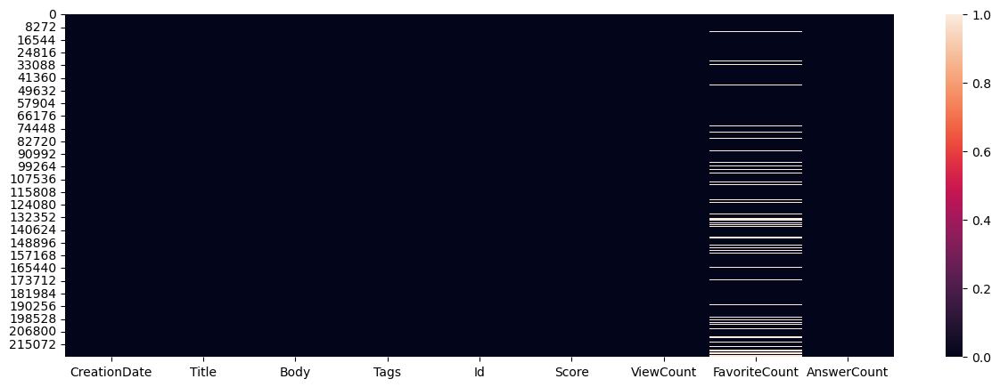

In [356]:
# représentation graphique des valeurs manquantes
fig, ax = plt.subplots(1, 1, figsize = (15, 5))
sns.heatmap(df.isna())

# noir <=> il y a une valeur.
# blanc <=> il n'y a pas de valeur.

In [357]:
# traces
# FavoriteCount
print('@' * 30, 'FavoriteCount', '@' * 30)
print(df['FavoriteCount'].nunique(), 'valeurs uniques :', 
      df['FavoriteCount'].unique())

print('nombre et fréquence de valeurs :')
print(df['FavoriteCount'].value_counts())

print('[min, max] : [', df['FavoriteCount'].min(), ',', df['FavoriteCount'].max(), ']')

# ViewCount
print('\n', '@' * 32, 'ViewCount', '@' * 31)
print('[min, max] : [', df['ViewCount'].min(), ',', df['ViewCount'].max(), ']')

# Score
print('\n', '@' * 33, 'Score', '@' * 34)
print('[min, max] : [', df['Score'].min(), ',', df['Score'].max(), ']')

# AnswerCount
print('\n', '@' * 30, 'AnswerCount', '@' * 31)
print('[min, max] : [', df['AnswerCount'].min(), ',', df['AnswerCount'].max(), ']')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ FavoriteCount @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
4 valeurs uniques : [ 0. nan  1. 32.  2.]
nombre et fréquence de valeurs :
0.0     190652
1.0         10
32.0         1
2.0          1
Name: FavoriteCount, dtype: int64
[min, max] : [ 0.0 , 32.0 ]

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ ViewCount @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
[min, max] : [ 50 , 12807534 ]

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Score @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
[min, max] : [ 6 , 27009 ]

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ AnswerCount @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
[min, max] : [ 1 , 134 ]


In [358]:
# Suppression colonne 'FavoriteCount', car :
#  - peu de valeurs > 0
#  - nous avons d'autres critères de filtrage utilisés dans la commande SQL : ViewCount > 10, Score > 5, AnswerCount > 0.
df.drop(['FavoriteCount'], axis = 1, inplace = True)

In [359]:
# Vérification nombre de valeurs manquantes
nb_na = df.isnull().sum()
nb_na[nb_na > 0]

Series([], dtype: int64)

# 2.4. VALEURS DUPLIQUEES

In [360]:
df.columns

Index(['CreationDate', 'Title', 'Body', 'Tags', 'Id', 'Score', 'ViewCount',
       'AnswerCount'],
      dtype='object')

In [23]:
########################################
# Doublons entre toutes les lignes     #
########################################
# il n'y a aucune ligne dupliquée <=> il n'existe aucune ligne au niveau du dataframe qui soit la même.
df.duplicated().sum()

0

In [24]:
########################################
# Doublons colonne Body                #
########################################
# Recherche si il y a des valeurs dupliquées pour la colonne Body (corps du message)
df.duplicated(subset = 'Body').sum()

0

In [25]:
# Affichage des duplicated pour un même Body.
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.duplicated.html
idx = df.duplicated(subset = 'Body', keep = False) # Mark all duplicates as True.
df_duplicated = df.loc[idx, :].sort_values('Body')
df_duplicated

# pas de valeurs dupliquées pour un même Body.

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,AnswerCount


In [361]:
########################################
# Doublons entre toutes les colonnes   #
########################################
# Recherche si il y a des valeurs dupliquées pour chaque colonne
for col in df.columns:
    n = df.duplicated(subset = col).sum()
    print(f"col : {col} -> duplicated : {n}")

col : CreationDate -> duplicated : 82
col : Title -> duplicated : 8
col : Body -> duplicated : 0
col : Tags -> duplicated : 9935
col : Id -> duplicated : 0
col : Score -> duplicated : 222203
col : ViewCount -> duplicated : 162677
col : AnswerCount -> duplicated : 223260


In [362]:
########################################
# Doublons colonne Title               #
########################################
# Affichage des duplicated pour un même Title.
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.duplicated.html
idx = df.duplicated(subset = 'Title', keep = False) # Mark all duplicates as True.
df_duplicated = df.loc[idx, :].sort_values('Title')
df_duplicated

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,AnswerCount
1545,2008-09-17 10:58:14,A potentially dangerous Request.Form value was...,<p>Every time a user posts something containin...,<asp.net><asp.net-mvc><validation><html-encode...,81991,1581,1133070,48
54662,2012-02-03 14:28:36,A potentially dangerous Request.Form value was...,<p>I have this issue. I have tried everything....,<c#><jquery><asp.net><architecture><postback>,9130186,25,113706,8
22051,2010-02-22 21:50:22,Git post-receive hook not working,<p>We're using git with a central repo (using ...,<git><bash><gitosis><githooks><git-post-receive>,2314500,12,11562,3
43318,2011-02-09 21:38:22,Git post-receive hook not working,"<p>My setup is a windows XAMPP server, with cU...",<git><curl><hudson><githooks><git-post-receive>,4950800,8,14587,5
11625,2009-12-10 21:18:38,HTML Agility Pack,<p>I'm trying to use HTML Agility Pack to get ...,<c#><html><winforms><parsing><html-agility-pack>,1884094,11,14754,2
19068,2010-03-11 05:32:04,HTML Agility Pack,<p>I want to parse the html table using html a...,<c#><.net><winforms><html-parsing><html-agilit...,2422762,6,6506,1
74523,2012-08-01 12:18:04,Injection of autowired dependencies failed; ne...,"<p>I am creating web application using Spring,...",<java><spring><hibernate><spring-mvc><struts>,11759040,21,186028,3
169021,2017-03-16 11:09:21,Injection of autowired dependencies failed; ne...,<p>I am new here and I am trying to create an ...,<java><spring><hibernate><maven><spring-mvc>,42832387,6,12236,4
31924,2011-08-31 15:38:30,LINQ to Entities does not recognize the method,<p>I'm getting the following error when trying...,<.net><linq><entity-framework><linq-to-entitie...,7259567,138,161033,5
43156,2011-01-22 11:40:06,LINQ to Entities does not recognize the method,"<p>I am following <a href=""http://msdn.microso...",<entity-framework><entity-framework-4><code-fi...,4767596,6,3103,1


In [363]:
for index, row in df_duplicated.iterrows():
    if ((index == 14398) | (index == 19745)):
        print('\n', '@' * 30, 'index =', index, '@' * 30)
        print(row['Title'], row['Body'][1:250], '\n')


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 14398 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Pointcut matching methods with annotated parameters p>I need to create an aspect with a pointcut matching a method if:</p>

<ol>
<li>it is annoted with MyAnnotationForMethod</li>
<li>One of its parameters (can have many) is annotated with @MyAnnotationForParam (but can have other annotations as well) 


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 19745 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
Pointcut matching methods with annotated parameters p>I need to create an aspect with a pointcut matching a method if:</p>

<ul>
<li>Is public</li>
<li>Its class is annotated with @Controller  <strong><em>(Finally does not)</em></strong></li>
<li>One of its parameters (can have many) is annotated wit 



In [ ]:
########################################
# Doublons colonnes Title & Body       #
########################################

In [364]:
 # Affichage des duplicated pour un même Title et Body.
idx = df.duplicated(subset = ['Title', 'Body'], keep = False) # Mark all duplicates as True.
df.loc[idx, :].sort_values('Title')

,CreationDate,Title,Body,Tags,Id,Score,ViewCount,AnswerCount


In [ ]:
###############################################################
#   FUSION DES 2 COLONNES      DE TYPE TEXTE : TITLE & BODY   #
#           EN 1 SEULE COLONNE DE TYPE TEXTE : TEXT           #
###############################################################

In [365]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text                        @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# https://apprendrepython.com/concatenation-de-chaines-de-caracteres-en-python-operateur-jointure-etc/
for index, row in df.iterrows():
    
    # Stockage du résultat pour chaque ligne   
    df.loc[index, '_Text'] = df.loc[index, 'Title'] + ' ' + df.loc[index, 'Body']

In [366]:
index = 10

print('index =', index, '\n')
print('@' * 30, 'Title =', '@' * 30, '\n',
      df.loc[index, 'Title'], '\n')

print('@' * 30, 'Body =', '@' * 30, '\n',
      df.loc[index, 'Body'], '\n')

print('@' * 30, '_Text =', '@' * 30, '\n',
      df.loc[index, '_Text'], '\n')

index = 10 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Title = @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 LinqDataSource - Can you limit the amount of records returned? 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Body = @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 <p>I'd like to use a <code>LinqDataSource</code> control on a page and limit the amount of records returned.  I know if I use code behind I could do something like this:</p>

<pre><code>IEnumerable&lt;int&gt; values = Enumerable.Range(0, 10);
IEnumerable&lt;int&gt; take3 = values.Take(3);
</code></pre>

<p>Does anyone know if something like this is possible with a <code>LinqDataSource</code> control?</p>

<p><strong>[Update]</strong></p>

<p>I'm going to use the <code>LinqDataSource</code> with the <code>ListView</code> control, <em>not</em> a GridView or Repeater.  The <code>LinqDataSource</code> wizard does not provide the ability to limit the number of records return.  The Advanced options only allow you to enabled deletes, inserts, and updates.</p>
 

@@@@@@@@@@@@@

In [367]:
# Suppression des colonnes Title et Body (fusionnées dans la colonne _Text)
df.drop(['Title', 'Body'], axis = 1, inplace = True)

In [368]:
########################################
# Doublons colonne _Text               #
########################################
# Vérification qu'il n'y a pas de valeurs dupliquées pour la colonne _Text
df.duplicated(subset = '_Text').sum()

0

# 2.5. DATA INSPECTION

In [369]:
# summary statistics sur les colonnes de type numérique
# (transpose met les attributs en ligne pour + de lisibilité)
df.describe(include = np.number).transpose()

,count,mean,std,min,25%,50%,75%,max
Id,223339.0,2.666292e+07,1.925549e+07,4.0,9469555.0,23685630.0,41588480.5,76403109.0
Score,223339.0,2.598959e+01,1.446805e+02,6.0,7.0,10.0,18.0,27009.0
ViewCount,223339.0,2.711956e+04,1.067922e+05,50.0,3087.0,8234.0,21179.5,12807534.0
AnswerCount,223339.0,3.394405e+00,3.495859e+00,1.0,1.0,2.0,4.0,134.0


In [370]:
# summary statistics sur les colonnes de type object
# (transpose met les attributs en ligne pour + de lisibilité)
df.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,223339,223257,2014-06-23 06:12:33,2
Tags,223339,213404,<javascript><jquery><html><css><twitter-bootst...,111
_Text,223339,223339,Registry vs. INI file for storing user configu...,1


# 3. PRETRAITEMENT DU TEXTE / TEXT PROCESSING

# 3.1. BALISES DE TAGS = TARGET Y

In [5]:
# Trace colonne Tags
for i in [0, 10, 100]:
    print('@' * 40, 'index =', i, '@' * 40, '\n',
          df.loc[i, 'Tags'], '\n')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 0 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 <windows><registry><settings><configuration-files><ini> 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 10 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 <c#><asp.net><database><linq><linq-to-sql> 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 100 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 <c#><asp.net><compilation><startup><aspnet-compiler> 



In [6]:
############################################################
# Suppression des balises de tags                          #
############################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TAGS : Tags --> _Tags                         @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
def tags_process_dataset():
    
    # Traitement pour chaque ligne
    for index, row in df.iterrows():
    
        tags = df.loc[index, 'Tags']
        
        # Suppression des balises <>
        tags = re.sub(r"<", "", tags)
        tags = re.sub(r">", " ", tags)

        # Nombre de tags
        # https://fr.moonbooks.org/Articles/Comment-obtenir-le-nombre-de-mots-dans-un-texte-manuscript-en-python-/        
        list_of_words = tags.split()
        nb_tags = len(list_of_words)
        
        # Stockage du résultat pour chaque ligne   
        df.loc[index, '_Tags']    = tags     # liste de tags sans les balises
        df.loc[index, '_Nb_tags'] = nb_tags  # nombre de tags

In [7]:
tags_process_dataset()

In [8]:
# traces pour vérifier
for i in [0, 10, 100]:
    print('@' * 40, 'index =', i, '@' * 40, '\n',
          'AVANT :', df.loc[i, 'Tags'], '\n',
          'APRES :', df.loc[i, '_Tags'], '\n',
          '_Nb_tags :', df.loc[i, '_Nb_tags'], '\n')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 0 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 AVANT : <windows><registry><settings><configuration-files><ini> 
 APRES : windows registry settings configuration-files ini  
 _Nb_tags : 5.0 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 10 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 AVANT : <c#><asp.net><database><linq><linq-to-sql> 
 APRES : c# asp.net database linq linq-to-sql  
 _Nb_tags : 5.0 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 100 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 AVANT : <c#><asp.net><compilation><startup><aspnet-compiler> 
 APRES : c# asp.net compilation startup aspnet-compiler  
 _Nb_tags : 5.0 



In [278]:
df['_Nb_tags'].describe().transpose()
# Il y a entre 5 et 6 tags par ligne.

count    223339.000000
mean          5.000031
std           0.005598
min           5.000000
25%           5.000000
50%           5.000000
75%           5.000000
max           6.000000
Name: _Nb_tags, dtype: float64

In [377]:
# Suppression des colonnes Tags et _Nb_tags
df.drop(['Tags', '_Nb_tags'], axis = 1, inplace = True)

# 3.1.1. TAGS : CORPUS & TOKENS

In [9]:
###########################
# Corpus au format texte  #
###########################
# on reconstitue le corpus en joignant l'ensemble des lignes / documents entre eux.
# On fait join avec '' et non ' ', car > a été remplacé par un blanc, la liste de tags se termine par blanc
# (cela évite d'avoir 2 blancs).
corpus_tags = ''.join(df['_Tags']) 
corpus_tags[:1_000]

'windows registry settings configuration-files ini java exception null nullpointerexception illegalargumentexception c++ oop data-structures hash maps c++ multithreading singleton construction lazy-initialization .net wcf web-services visual-studio asmx .net visual-studio tdd mbunit testdriven.net jakarta-ee deployment ant websphere ear sql sql-server database sql-server-2008 intellisense c# .net performance configuration properties language-agnostic http webserver header etag c# asp.net database linq linq-to-sql c# vb.net performance stringbuilder string.format c# c++ windows 64-bit memcached c# .net .net-3.5 wia image-scanner java xml json cross-platform configuration-files c# .net winforms visual-studio-2008 visual-studio-2005 c++ oop class syntax static asp.net performance .net-3.5 content-management-system n2 c++ winapi macos porting fopen http iis iis-7 cookies windows-vista c function pointers syntax parameters html mobile responsive-design wap wml c++ linux eclipse gdb valgrind

In [30]:
###########################
# Corpus au format token  #
###########################
token_tags = corpus_tags.split()
len(token_tags)

1116702

In [31]:
print(token_tags[0:10])

['windows', 'registry', 'settings', 'configuration-files', 'ini', 'java', 'exception', 'null', 'nullpointerexception', 'illegalargumentexception']


In [297]:
# Nombre de fois où sont présents les tokens dans le corpus
# (certains tokens ne sont présents qu'une seule fois).
count_tags = pd.Series(token_tags).value_counts()
count_tags

java                  26280
c#                    25236
javascript            23558
python                23109
c++                   16697
                      ...  
delphi.net                1
ng-hide                   1
mpmoviewcontroller        1
bitsets                   1
visx                      1
Name: count, Length: 31402, dtype: int64

In [298]:
# Nombre de valeurs uniques
print('count_tags :', len(count_tags), 'valeurs uniques')

count_tags : 31402 valeurs uniques


In [383]:
count_tags.describe()

count    31402.000000
mean        35.561493
std        381.644076
min          1.000000
25%          1.000000
50%          3.000000
75%         11.000000
max      26280.000000
dtype: float64

In [384]:
# 15 tokens les plus importants
count_tags.head(15)

java           26280
c#             25236
javascript     23558
python         23109
c++            16697
android        15952
ios            15631
.net           11731
html            9781
php             8871
jquery          7764
objective-c     7398
c               6818
node.js         6555
iphone          6437
dtype: int64

In [385]:
# 15 tokens les moins importants
count_tags.tail(15)

kie-wb                 1
ibplugin               1
homomorphism           1
lighttable             1
jaxbelement            1
sigma.js               1
pdftoppm               1
pgrouting              1
screenshotexception    1
hclust                 1
delphi.net             1
ng-hide                1
mpmoviewcontroller     1
bitsets                1
visx                   1
dtype: int64

# 3.1.2. REDUCTION DU NOMBRE DE TAGS

In [386]:
count_tag_max = count_tags.max()
count_tag_plage_min = 5 / 100 * count_tag_max

print('count_tag_max\t\t=', count_tag_max)
print('count_tag_plage_min\t=', count_tag_plage_min, '(5% count_tag_max)')

count_tag_max		= 26280
count_tag_plage_min	= 1314.0 (5% count_tag_max)


In [387]:
###################################################################
#  Recherche des tags présents plus de 5% de fois dans le dataset #
###################################################################
# https://fr.moonbooks.org/Articles/Comment-extraire-les-noms-et-valeurs-de-valuecounts-avec-pandas-en-python-/
new_liste_tags = []

count_tags_reduced = count_tags[count_tags >= count_tag_plage_min]

for idx, name in enumerate(count_tags_reduced.index.tolist()):
    if (count_tags_reduced[idx] >= count_tag_plage_min):
        # Ajout dans la liste si pas déjà présent
        if (name not in new_liste_tags):
            new_liste_tags.append(name)
            print(count_tags_reduced[idx], "\t:", name)

26280 	: java
25236 	: c#
23558 	: javascript
23109 	: python
16697 	: c++
15952 	: android
15631 	: ios
11731 	: .net
9781 	: html
8871 	: php
7764 	: jquery
7398 	: objective-c
6818 	: c
6555 	: node.js
6437 	: iphone
6344 	: css
5408 	: linux
5290 	: asp.net
5174 	: swift
5114 	: spring
5019 	: sql
4510 	: xcode
4304 	: performance
4285 	: ruby-on-rails
4025 	: json
3932 	: reactjs
3854 	: windows
3799 	: mysql
3602 	: asp.net-mvc
3554 	: c++11
3520 	: arrays
3459 	: python-3.x
3459 	: multithreading
3398 	: unit-testing
3392 	: django
3245 	: sql-server
3203 	: macos
3154 	: ruby
2866 	: wpf
2865 	: database
2849 	: string
2715 	: algorithm
2701 	: typescript
2690 	: visual-studio
2686 	: angular
2652 	: r
2558 	: spring-boot
2528 	: pandas
2358 	: numpy
2342 	: amazon-web-services
2313 	: gcc
2294 	: angularjs
2282 	: ajax
2249 	: postgresql
2204 	: hibernate
2184 	: rest
2115 	: git
2115 	: image
2089 	: google-chrome
2053 	: xml
2045 	: eclipse
1921 	: asp.net-core
1918 	: docke

In [388]:
# Nombre de valeurs uniques
print('new_liste_tags :', len(new_liste_tags), 'valeurs uniques :\n')

# liste triée
# https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-list-comment-ordonnertrier-une-liste
print(sorted(new_liste_tags))

# ==> on garde 99 valeurs de tags sur 31402 présents initialement.

new_liste_tags : 99 valeurs uniques :

['.net', 'ajax', 'algorithm', 'amazon-web-services', 'android', 'android-studio', 'angular', 'angularjs', 'api', 'arrays', 'asp.net', 'asp.net-core', 'asp.net-mvc', 'assembly', 'asynchronous', 'authentication', 'bash', 'c', 'c#', 'c++', 'c++11', 'cocoa', 'cocoa-touch', 'css', 'database', 'dataframe', 'debugging', 'django', 'docker', 'eclipse', 'entity-framework', 'exception', 'firebase', 'gcc', 'git', 'google-chrome', 'gradle', 'hibernate', 'html', 'http', 'image', 'ios', 'iphone', 'java', 'javascript', 'jpa', 'jquery', 'json', 'laravel', 'linux', 'list', 'machine-learning', 'macos', 'maven', 'mongodb', 'multithreading', 'mysql', 'node.js', 'numpy', 'objective-c', 'optimization', 'pandas', 'performance', 'php', 'postgresql', 'python', 'python-2.7', 'python-3.x', 'qt', 'r', 'reactjs', 'regex', 'rest', 'ruby', 'ruby-on-rails', 'scala', 'security', 'selenium', 'shell', 'spring', 'spring-boot', 'spring-mvc', 'sql', 'sql-server', 'ssl', 'string', 'swif

In [390]:
#####################################################################
# Recherche des 2 tags les plus représentés pour chaque ligne       #
#####################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TAGS : Tags --> _Tags  --> _Tag_1, _Tag_2     @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def reduction_tags_dataset():
    
    # initialisation
    count              = 0 
    lignes_a_supprimer = []

    for index, row in df.iterrows():
        # initialisation
        tags       = row['_Tags']
        token_tags = tags.split()
        dict_tags  = {}
    
        # Sélection des tags qui sont dans la liste
        for i in np.arange(0, len(token_tags)):
            if token_tags[i] in new_liste_tags:
                # On stocke les tags et leur fréquence dans un dictionnaire
                # Exemple : count_tags['java']   = 26280
                #           count_tags['python'] = 23109
                # => dict_tags['java'] = 26280
                dict_tags[token_tags[i]] = count_tags[token_tags[i]]
        
        len_dict_tags = len(dict_tags)
        
        if (count < 10):
            print('index =', index, ':', '\n',
                  '\t- _Tags\t\t=', row['_Tags'], '\n', 
                  '\t- dict_tags\t= ', dict_tags, '\n',
                  '\t- len_dict_tags\t=', len_dict_tags)
    
        # On supprime la ligne si il n'y a plus de tags
        if (len_dict_tags == 0):
            lignes_a_supprimer.append(index)
        else:
            # Recherche des 2 plus grandes valeurs
            # https://www.delftstack.com/fr/howto/python/find-max-value-in-dictionary-python/
            # https://fr.code-paper.com/python/examples-max-value-from-a-dictionary-in-python
            max_key_1 = max(dict_tags, key = dict_tags.get)
            df.loc[index, '_Tag_1'] = max_key_1
            # suppression du dictionnaire 
            del(dict_tags[max_key_1])
    
            if (len_dict_tags >= 2):
                max_key_2 = max(dict_tags, key = dict_tags.get)
                df.loc[index, '_Tag_2'] = max_key_2
            else:
                df.loc[index, '_Tag_2'] = '/' # Non renseigné.
    
        # Affichage de 10 valeurs
        if (count < 10):
            print('\t - _Tag_1 =', df.loc[index, '_Tag_1'], ', _Tag_2 =', df.loc[index, '_Tag_2'], '\n')
        count = count + 1
    

    # Suppression des tags vides (en donnant index)
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
    print("==>", len(lignes_a_supprimer), "lignes supprimées\n")

In [391]:
reduction_tags_dataset()

index = 0 : 
 	- _Tags		= windows registry settings configuration-files ini  
 	- dict_tags	=  {'windows': 3854} 
 	- len_dict_tags	= 1
	 - _Tag_1 = windows , _Tag_2 = / 

index = 1 : 
 	- _Tags		= java exception null nullpointerexception illegalargumentexception  
 	- dict_tags	=  {'java': 26280, 'exception': 1318} 
 	- len_dict_tags	= 2
	 - _Tag_1 = java , _Tag_2 = exception 

index = 2 : 
 	- _Tags		= c++ oop data-structures hash maps  
 	- dict_tags	=  {'c++': 16697} 
 	- len_dict_tags	= 1
	 - _Tag_1 = c++ , _Tag_2 = / 

index = 3 : 
 	- _Tags		= c++ multithreading singleton construction lazy-initialization  
 	- dict_tags	=  {'c++': 16697, 'multithreading': 3459} 
 	- len_dict_tags	= 2
	 - _Tag_1 = c++ , _Tag_2 = multithreading 

index = 4 : 
 	- _Tags		= .net wcf web-services visual-studio asmx  
 	- dict_tags	=  {'.net': 11731, 'visual-studio': 2690} 
 	- len_dict_tags	= 2
	 - _Tag_1 = .net , _Tag_2 = visual-studio 

index = 5 : 
 	- _Tags		= .net visual-studio tdd mbunit testdr

In [392]:
# Suppression de la colonne _Tags
df.drop(['_Tags'], axis = 1, inplace = True)

# 3.2. BALISES HTML

In [124]:
# Trace colonne _Text
for i in [0, 10, 100]:
    print('@' * 40, 'index =', i, '@' * 40, '\n',
          df.loc[i, '_Text'], '\n')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 0 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 Registry vs. INI file for storing user configurable application settings <p>I'm a new Windows programmer and I'm not sure where I should store user configurable application settings.  I understand the need to provide a user friendly means for the user to change application settings, like an Edit | Settings form or similar.  But where should I store the values after the user hits the Apply button on that form?  </p>

<p>What are the pros and cons of storing settings in the Windows registry vs. storing them in a local INI file or config file or similar?</p>
 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ index = 10 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 LinqDataSource - Can you limit the amount of records returned? <p>I'd like to use a <code>LinqDataSource</code> control on a page and limit the amount of records returned.  I know if I use code behind I could do something like this:</p>

<pre><co

In [173]:
########################################################################
# Pour une ligne :                                                     #
#   - Suppression des balises HTML                                     #
#   - Passage en minuscules                                            #
########################################################################
def html_process(index_in, is_affichage_in):

    # https://stackoverflow.com/questions/37018475/python-remove-all-html-tags-from-string
    if (is_affichage_in):
        print('index_in =', index_in, '\n')
    
    markup = df.loc[index_in, '_Text']
    
    if (is_affichage_in):
        print('@' * 40, 'html_process - début', '@' * 40)
        print(markup, '\n')
    
    
    # Supression des balises HTML
    soup = BeautifulSoup(markup)
    soup_text = soup.get_text()
    
    
    # On met tout le texte en minuscule  
    soup_text = soup_text.lower()
        
    if (is_affichage_in):    
        print('@' * 40, 'html_process - fin', '@' * 40)
        print(soup_text)
    
    return soup_text

In [174]:
text = html_process(index_in        = 10, 
                    is_affichage_in = True)

index_in = 10 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ html_process - début @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
LinqDataSource - Can you limit the amount of records returned? <p>I'd like to use a <code>LinqDataSource</code> control on a page and limit the amount of records returned.  I know if I use code behind I could do something like this:</p>

<pre><code>IEnumerable&lt;int&gt; values = Enumerable.Range(0, 10);
IEnumerable&lt;int&gt; take3 = values.Take(3);
</code></pre>

<p>Does anyone know if something like this is possible with a <code>LinqDataSource</code> control?</p>

<p><strong>[Update]</strong></p>

<p>I'm going to use the <code>LinqDataSource</code> with the <code>ListView</code> control, <em>not</em> a GridView or Repeater.  The <code>LinqDataSource</code> wizard does not provide the ability to limit the number of records return.  The Advanced options only allow you to enabled deletes, inserts, and updates.</p>
 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ html_proces

In [50]:
########################################################################
# Pour tout le dataset :                                               #
#   - Suppression des balises HTML                                     #
#   - Passage en minuscules                                            #
########################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def html_process_dataset():
    
    lignes_a_supprimer = [] # initialisation
    
    # Traitement pour chaque ligne
    for index, row in df.iterrows():
    
        text = html_process(index_in        = index, 
                            is_affichage_in = False)
   
      
        # Suppression ligne si text vide (valeur NaN)
        # https://www.delftstack.com/fr/howto/python/check-for-nan-values-python/        
        if (pd.isna(text)):
            lignes_a_supprimer.append(index)

        # Sinon : mise à jour dans le dataset : stockage du résultat pour chaque ligne
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        # Convertir une liste qui a des éléments de type de données str en une chaîne de caractères.            
        else:  
            df.loc[index, '_Text_sans_html'] = text
        
    # Suppression des lignes sans tokens
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
    print("==>", len(lignes_a_supprimer), "ligne(s) supprimée(s)\n")

In [176]:
html_process_dataset()

In [85]:
# Trace (pour vérifier)
index = 10

print('@' * 40, '_Text / index =', index, '@' * 40, '\n',
      df.loc[i, '_Text'], '\n\n',
      '@' * 35, '_Text_sans_html / index =', index, '@' * 35, '\n',
      df.loc[i, '_Text_sans_html'], '\n')

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text / index = 10 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 
 Precompilation and startup times on ASP.Net <p>I am developping a (relatively small) website in ASP.Net 2.0. I am also using nAnt to perform some easy tweaking on my project before delivering executables. In its current state, the website is "precompiled" using </p>

<blockquote>
  <p><code>aspnet_compiler.exe -nologo -v ${Appname} -u ${target}</code></p>
</blockquote>

<p>I have noticed that after the IIS pool is restarted (after a idle shutdown or a recycle), the application takes up to 20 seconds before it is back online (and Application_start is reached).</p>

<p>I don't have the same issue when I am debugging directly within Visual Studio (it takes 2 seconds to start) so I am wondering if the aspnet_compiler is really such a good idea.</p>

<p>I couldn't find much on MSDN. How do you compile your websites for production?</p>
 

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html

# 3.3. NETTOYAGE : TOKENISATION, SUPPRESSIONS (STOP WORDS, NOMBRES...)

In [130]:
##########################################################
#              Affichage taille des tokens               #
##########################################################
def affichage_token_size(tokens_in):
    
    print(tokens_in)
    
    # nombre de tokens
    print('\nnombre de tokens\t\t=', len(tokens_in))

    # nombre de tokens uniques
    print('nombre de tokens uniques\t=', len(set(tokens_in)))

In [5]:
########################################################################
#   Stop words = liste de mots trop génériques pour être informatif.   #
########################################################################
stop_words = set(stopwords.words('english'))  # langage = anglais
print(stop_words)

{'this', "you'd", 'on', 'myself', 'we', 'all', 'any', "wasn't", 'yourselves', 'some', 'am', "shan't", 'because', 'hasn', "won't", 'only', 'for', "shouldn't", 'an', 'them', 'she', 'had', 'i', 'does', 'wasn', 'but', 'that', 'a', 'with', 'then', 'into', 's', 'before', "don't", 'each', 'your', 'how', 'our', 'from', 'own', 'd', 'and', 'such', 'not', "hadn't", 'few', 'below', 'those', 'against', 'too', "mustn't", 'what', 'until', 'up', 't', 'himself', 'isn', 'why', 'are', 'yourself', 'he', 'you', 'me', 'which', 'where', 'm', 'will', 'when', 're', 'my', 'nor', 'by', "couldn't", 'ain', 'ourselves', 'once', 'most', 'than', 'they', 'has', 'further', 'after', "haven't", 'again', 'herself', 'was', "didn't", 'itself', 'doing', 'won', 'her', "you'll", 'it', 'of', 'themselves', 'll', 've', 'wouldn', 'theirs', 'while', "you're", 'having', 'shan', 'being', 'shouldn', 'y', 'there', 'hadn', "doesn't", 'been', 'who', 'here', 'their', "mightn't", 'weren', "she's", 'mustn', 'as', "hasn't", 'under', 'about',

In [ ]:
#################################################
#        Dictionnaire des mots anglais          #
#################################################

In [6]:
# on uniformise en ne prenant que les mots en minuscules
english_words = [i.lower() for i in words.words()]
pd.Series(english_words).sample(15)

135798         overskip
129819         odobenus
136469        oxozonide
189750       stigmatose
25516     brachystomata
91487         imitation
164663    reconciliable
65211            ethnos
30409      carcinogenic
114899     metaphragmal
74335           furcate
189652        stibonium
18265         bandstand
45924          crotalum
226200         urticose
dtype: object

In [8]:
len(english_words)

236736

In [594]:
###########################################################################################
# Pour une ligne :                                                                        #
#  - Tokenization                                                                         #
#  - Suppressions : ponctuation, stop_word, nombres, mots alphanumeriques, short tokens,  #
#                   mots qui ne sont pas dans le dictionnaire anglais                     #
#  - Transform emojis to characters                                                       #
###########################################################################################
def cleaning_process(index_in, is_affichage_in, min_len_word_in = 2):
    
    if (is_affichage_in):
        print('index_in =', index_in, '\n')
    
    doc = df.loc[index_in, '_Text_sans_html']
    
    if (is_affichage_in):
        print('@' * 40, 'cleaning_process - début', '@' * 40)
        print(doc)
    
    
    
    # Suppression ponctuation (remplacement par un caractère blanc)
    # Ponctuation =  !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~ 
    doc = re.sub(f"[{re.escape(punctuation)}]", " ", doc)
    
    if (is_affichage_in):    
        print('\n')
        print('@' * 38, 'cleaning_process - après suppression ponctuation', '@' * 38)
        print(doc)
    
    
    
    # Tokenization : liste de tokens bruts
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(doc)
        
    if (is_affichage_in):    
        print('\n')
        print('@' * 40, 'cleaning_process - après tokenization', '@' * 40)
        affichage_token_size(tokens_in = tokens)
        
        
        
    # Suppression stop_words
    tokens = [w for w in tokens if w not in stop_words]
    
    if (is_affichage_in):
        print('\n')
        print('@' * 38, 'cleaning_process - après suppression stop_words', '@' * 37)
        affichage_token_size(tokens_in = tokens)

        
        
    # Suppression des nombres
    tokens = [w for w in tokens if not (w.isdigit())]
    if (is_affichage_in):
        print('\n')
        print('@' * 39, 'cleaning_process - après suppression nombres', '@' * 39)
        affichage_token_size(tokens_in = tokens)

        
        
    # Suppression des mots alphanumeriques (exemple : 4cb9df79467b3eb5d6787a98dcf8665)
    # https://www.delftstack.com/fr/howto/python/how-to-check-a-string-contains-a-number-or-not-in-python/
    # <=> on regarde si la chaîne de caractère contient un nombre.
    # Suppression de tous les caractères numériques (\d) i.e. équivalent à la classe [0-9].
    # https://docs.python.org/fr/3/howto/regex.html :
    tokens = [w for w in tokens if not (bool(re.search(r'\d', w)))]
    if (is_affichage_in):
        print('\n')
        print('@' * 32, 'cleaning_process - après suppression mots alphanumériques', '@' * 33)
        affichage_token_size(tokens_in = tokens)
    
 

    # Suppression short tokens (taille >= min_len_word_in)
    tokens = [w for w in tokens if len(w) >= min_len_word_in]
    
    if (is_affichage_in):
        print('\n')
        print('@' * 32, 'cleaning_process - après suppression tokens de taille >=', min_len_word_in, '@' * 33)
        affichage_token_size(tokens_in = tokens)
        
        
        
    # Suppression des mots qui ne sont pas dans le dictionnaire anglais
    tokens = [w for w in tokens if w in english_words]
    
    if (is_affichage_in):
        print('\n')
        print('@' * 23, 'cleaning_process - après suppression tokens absents du dictionnaire anglais', '@' * 24)
        affichage_token_size(tokens_in = tokens)


        
    # Suppression de tous les caractères "blanc" (\s) i.e. équivalent à la classe [ \t\n\r\f\v].
    # https://docs.python.org/fr/3/howto/regex.html
    tokens = [w for w in tokens if not (bool(re.search(r'\s', w)))]
    if (is_affichage_in):
        print('\n')
        print('@' * 32, 'cleaning_process - après suppression caractères "blanc"', '@' * 33)
        affichage_token_size(tokens_in = tokens)
        
        
        
    # Conversion liste d'éléments de type str --> une chaîne de caractères.        
    # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
    text_clean = ' '.join(tokens)

    

    # Transform emojis to characters
    text_clean = emoji.demojize(text_clean)    

    if (is_affichage_in):
        print('\n')
        print('@' * 38, 'cleaning_process - après transformations emojis', '@' * 37)
        print(text_clean)
        
    return text_clean

In [518]:
tokens = cleaning_process(index_in        = 10,  
                          is_affichage_in = True)

index_in = 10 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ cleaning_process - début @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
is string.format as efficient as stringbuilder suppose i have a stringbuilder in c# that does this:
stringbuilder sb = new stringbuilder();
string cat = "cat";
sb.append("the ").append(cat).(" in the hat");
string s = sb.tostring();

would that be as efficient or any more efficient as having:
string cat = "cat";
string s = string.format("the {0} in the hat", cat);

if so, why?
edit 
after some interesting answers, i realised i probably should have been a little clearer in what i was asking. i wasn't so much asking for which was quicker at concatenating a string, but which is quicker at injecting one string into another.
in both cases above i want to inject one or more strings into the middle of a predefined template string.
sorry for the confusion



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ cleaning_process - après suppression ponctuation @@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [595]:
##########################################################################################################
# Pour tout le dataset (fonction longue => on l'appelle par plage d'index [index_min_in, index_max_in]): #
#  - Tokenization                                                                                        #
#  - Suppressions : ponctuation, stop_word, nombres, mots alphanumeriques, short tokens                  #     
#  - Transform emojis to characters                                                                      #
##########################################################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html --> _Text_tokens @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def cleaning_process_dataset(index_min_in, index_max_in):
    lignes_a_supprimer = []  # initialisation
    count_nan          = 0 # compteur de valeurs NaN
    
    
    print('index_min_in =', index_min_in, ', index_max_in =', index_max_in,
          '=>', index_max_in - index_min_in + 1, 'lignes')
        
    # https://moncoachdata.com/blog/filtrer-un-dataframe-pandas/
    df_filtered = df.loc[index_min_in:index_max_in, :] # lignes index_min_in à index_max_in, toutes les colonnes
    
    # Traitement pour chaque ligne
    for index in df_filtered.index:

        print('index =', index)
        text = cleaning_process(index_in        = index, 
                                is_affichage_in = False)
    
        # Suppression ligne si text vide (valeur NaN)
        # https://www.delftstack.com/fr/howto/python/check-for-nan-values-python/        
        if (pd.isna(text) | (text == '')):
            lignes_a_supprimer.append(index)
            print('ligne_a_supprimer :', index)
            
        # Sinon : mise à jour dans le dataset : stockage du résultat pour chaque ligne
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        # Convertir une liste qui a des éléments de type de données str en une chaîne de caractères.            
        else:
            df.loc[index, '_Text_tokens'] = text
        
    # Suppression des lignes sans tokens
    print('\nSuppression des lignes sans tokens :')
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
    print("==>", len(lignes_a_supprimer), "ligne(s) supprimée(s).")
    
    
    # Vérification que tous les _Text_tokens' de la plage [index_min_in, index_max_in] sont remplis i.e. 
    # qu'il n'y pas de NaN
    print('\nVérification que tous les _Text_tokens de la plage [', index_min_in, ',', index_max_in, '] sont remplis :')
    for index, row in df_filtered.iterrows():
        if (pd.isna(row['_Text_tokens']) | (row['_Text_tokens'] == '')):
            print('index =', index, ', _Text_tokens =', row['_Text_tokens'])
            count_nan = count_nan + 1
    
    if (count_nan == 0):
        print('==> Aucune valeur NaN.')
    else:
        print('==>', count_nan, 'valeurs NaN dans l\'intervalle.')

In [596]:
##########################################################
#      Affichage après fonction cleaning_process         #
##########################################################
def affichage_apres_cleaning_process(index_in):
    
    print('tokens_in =', index_in)
    
    # Avant fonction cleaning_process
    print('\n', '@' * 38, '_Text_sans_html (AVANT fonction cleaning_process)', '@' * 37)
    print(df.loc[index_in, '_Text_sans_html'])

    # Après fonction cleaning_process    
    print('\n', '@' * 39, '_Text_tokens (APRES fonction cleaning_process)', '@' * 39)
    print(df.loc[index_in, '_Text_tokens'])    
    
    # Enregistrement (provisoire)
    df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
              sep = '\t', header = True, index = False)    

In [14]:
df.shape

(208496, 9)

In [ ]:
###################################################
#    index 0 --> 50.000 : 50.001 lignes           #
###################################################
# https://www.dad3zero.net/202008/python-chiffres-lisibles-souligne/
cleaning_process_dataset(index_min_in = 0, 
                         index_max_in = 50_000) # 2h 15min 

index_min_in = 0 , index_max_in = 50000 => 50001 lignes
index = 0
index = 1
index = 2
index = 3
index = 4
index = 5
index = 6
index = 7
index = 8
index = 9
index = 10
index = 11
index = 12
index = 13
index = 14
index = 15
index = 16
index = 17
index = 18
index = 20
index = 21
index = 22
index = 23
index = 24
index = 25
index = 26
index = 27
index = 28
index = 29
index = 30
index = 31
index = 32
index = 33
index = 34
index = 35
index = 36
index = 37
index = 38
index = 39
index = 40
index = 41
index = 42
index = 43
index = 44
index = 45
index = 46
index = 47
index = 48
index = 49
index = 50
index = 51
index = 52
index = 53
index = 54
index = 55
index = 56
index = 57
index = 58
index = 59
index = 60
index = 61
index = 62
index = 63
index = 64
index = 65
index = 66
index = 67
index = 68
index = 69
index = 70
index = 71
index = 72
index = 73
index = 74
index = 75
index = 76
index = 77
index = 78
index = 79
index = 80
index = 81
index = 82
index = 83
index = 84
index = 85
index = 86
index = 

index = 699
index = 700
index = 701
index = 702
index = 703
index = 704
index = 705
index = 706
index = 707
index = 708
index = 709
index = 710
index = 711
index = 712
index = 713
index = 714
index = 715
index = 716
index = 717
index = 718
index = 719
index = 720
index = 721
index = 722
index = 723
index = 724
index = 725
index = 726
index = 727
index = 728
index = 729
index = 730
index = 731
index = 732
index = 733
index = 734
index = 735
index = 736
index = 737
index = 738
index = 739
index = 741
index = 742
index = 743
index = 744
index = 745
index = 746
index = 747
index = 748
index = 749
index = 750
index = 751
index = 752
index = 753
index = 754
index = 755
index = 756
index = 757
index = 758
index = 759
index = 760
index = 761
index = 762
index = 763
index = 764
index = 765
index = 766
index = 767
index = 768
index = 769
index = 770
index = 771
index = 772
index = 773
index = 774
index = 775
index = 776
index = 777
index = 778
index = 779
index = 780
index = 781
index = 782
inde

index = 1366
index = 1367
index = 1368
index = 1369
index = 1370
index = 1371
index = 1372
index = 1373
index = 1374
index = 1375
index = 1376
index = 1377
index = 1378
index = 1379
index = 1380
index = 1381
index = 1382
index = 1383
index = 1384
index = 1385
index = 1386
index = 1387
index = 1388
index = 1389
index = 1390
index = 1391
index = 1392
index = 1393
index = 1394
index = 1395
index = 1396
index = 1397
index = 1398
index = 1399
index = 1400
index = 1401
index = 1402
index = 1403
index = 1404
index = 1405
index = 1406
index = 1407
index = 1408
index = 1409
index = 1410
index = 1411
index = 1412
index = 1413
index = 1414
index = 1415
index = 1416
index = 1417
index = 1418
index = 1419
index = 1420
index = 1421
index = 1422
index = 1423
index = 1424
index = 1425
index = 1426
index = 1427
index = 1428
index = 1429
index = 1430
index = 1431
index = 1432
index = 1433
index = 1434
index = 1435
index = 1436
index = 1437
index = 1438
index = 1439
index = 1440
index = 1441
index = 1442

index = 2007
index = 2008
index = 2009
index = 2010
index = 2011
index = 2012
index = 2013
index = 2014
index = 2015
index = 2016
index = 2017
index = 2018
index = 2019
index = 2020
index = 2021
index = 2022
index = 2023
index = 2024
index = 2025
index = 2026
index = 2027
index = 2028
index = 2029
index = 2030
index = 2031
index = 2032
index = 2033
index = 2034
index = 2035
index = 2036
index = 2037
index = 2038
index = 2039
index = 2040
index = 2041
index = 2042
index = 2043
index = 2044
index = 2045
index = 2046
index = 2047
index = 2048
index = 2049
index = 2050
index = 2051
index = 2052
index = 2053
index = 2054
index = 2055
index = 2056
index = 2057
index = 2058
index = 2059
index = 2060
index = 2062
index = 2063
index = 2064
index = 2065
index = 2066
index = 2067
index = 2068
index = 2069
index = 2070
index = 2071
index = 2072
index = 2073
index = 2074
index = 2075
index = 2076
index = 2077
index = 2078
index = 2079
index = 2080
index = 2081
index = 2082
index = 2083
index = 2084

index = 2643
index = 2644
index = 2645
index = 2646
index = 2647
index = 2648
index = 2649
index = 2650
index = 2651
index = 2652
index = 2653
index = 2654
index = 2655
index = 2656
index = 2657
index = 2658
index = 2659
index = 2660
index = 2661
index = 2662
index = 2663
index = 2664
index = 2665
index = 2666
index = 2667
index = 2668
index = 2669
index = 2670
index = 2671
index = 2672
index = 2673
index = 2674
index = 2675
index = 2676
index = 2677
index = 2678
index = 2679
index = 2680
index = 2681
index = 2682
index = 2683
index = 2684
index = 2685
index = 2686
index = 2687
index = 2688
index = 2689
index = 2690
index = 2691
index = 2692
index = 2693
index = 2694
index = 2695
index = 2696
index = 2697
index = 2698
index = 2699
index = 2700
index = 2701
index = 2702
index = 2703
index = 2704
index = 2705
index = 2706
index = 2707
index = 2708
index = 2709
index = 2710
index = 2711
index = 2712
index = 2713
index = 2714
index = 2715
index = 2716
index = 2717
index = 2718
index = 2719

index = 3278
index = 3279
index = 3280
index = 3281
index = 3282
index = 3283
index = 3284
index = 3285
index = 3286
index = 3287
index = 3288
index = 3289
index = 3290
index = 3291
index = 3292
index = 3293
index = 3294
index = 3295
index = 3296
index = 3297
index = 3298
index = 3299
index = 3300
index = 3301
index = 3302
index = 3303
index = 3304
index = 3305
index = 3306
index = 3307
index = 3308
index = 3309
index = 3310
index = 3311
index = 3312
index = 3313
index = 3314
index = 3315
index = 3316
index = 3318
index = 3319
index = 3320
index = 3321
index = 3322
index = 3323
index = 3324
index = 3325
index = 3326
index = 3327
index = 3328
index = 3329
index = 3330
index = 3331
index = 3332
index = 3333
index = 3334
index = 3335
index = 3336
index = 3337
index = 3338
index = 3339
index = 3340
index = 3341
index = 3342
index = 3343
index = 3344
index = 3345
index = 3346
index = 3347
index = 3348
index = 3349
index = 3350
index = 3351
index = 3352
index = 3353
index = 3354
index = 3355

index = 3914
index = 3915
index = 3916
index = 3917
index = 3918
index = 3919
index = 3920
index = 3921
index = 3922
index = 3923
index = 3924
index = 3925
index = 3926
index = 3927
index = 3928
index = 3929
index = 3930
index = 3931
index = 3932
index = 3933
index = 3934
index = 3935
index = 3936
index = 3937
index = 3938
index = 3939
index = 3940
index = 3941
index = 3942
index = 3943
index = 3944
index = 3945
index = 3946
index = 3947
index = 3948
index = 3949
index = 3950
index = 3951
index = 3952
index = 3953
index = 3954
index = 3955
index = 3956
index = 3957
index = 3958
index = 3959
index = 3960
index = 3961
index = 3962
index = 3963
index = 3964
index = 3965
index = 3966
index = 3967
index = 3968
index = 3969
index = 3970
index = 3971
index = 3972
index = 3973
index = 3974
index = 3975
index = 3976
index = 3977
index = 3978
index = 3979
index = 3980
index = 3981
index = 3982
index = 3983
index = 3984
index = 3985
index = 3986
index = 3987
index = 3988
index = 3989
index = 3990

index = 4551
index = 4552
index = 4553
index = 4554
index = 4555
index = 4556
index = 4557
index = 4558
index = 4559
index = 4560
index = 4561
index = 4562
index = 4563
index = 4564
index = 4565
index = 4566
index = 4567
index = 4568
index = 4569
index = 4570
index = 4571
index = 4572
index = 4573
index = 4574
index = 4575
index = 4576
index = 4577
index = 4578
index = 4579
index = 4580
index = 4581
index = 4582
index = 4583
index = 4584
index = 4585
index = 4586
index = 4587
index = 4588
index = 4589
index = 4590
index = 4591
index = 4592
index = 4593
index = 4594
index = 4595
index = 4596
index = 4597
index = 4598
index = 4599
index = 4600
index = 4601
index = 4602
index = 4603
index = 4604
index = 4605
index = 4606
index = 4607
index = 4608
index = 4609
index = 4610
index = 4611
index = 4612
index = 4613
index = 4614
index = 4615
index = 4616
index = 4617
index = 4618
index = 4619
index = 4620
index = 4621
index = 4622
index = 4623
index = 4624
index = 4625
index = 4626
index = 4627

index = 5192
index = 5193
index = 5194
index = 5195
index = 5196
index = 5197
index = 5198
index = 5199
index = 5200
index = 5201
index = 5202
index = 5203
index = 5204
index = 5205
index = 5206
index = 5207
index = 5208
index = 5209
index = 5210
index = 5211
index = 5212
index = 5213
index = 5214
index = 5215
index = 5216
index = 5217
index = 5218
index = 5219
index = 5220
index = 5221
index = 5222
index = 5223
index = 5224
index = 5225
index = 5226
index = 5227
index = 5228
index = 5229
index = 5230
index = 5231
index = 5232
index = 5233
index = 5234
index = 5235
index = 5236
index = 5237
index = 5238
index = 5239
index = 5240
index = 5241
index = 5242
index = 5243
index = 5244
index = 5245
index = 5246
index = 5247
index = 5248
index = 5249
index = 5250
index = 5251
index = 5252
index = 5253
index = 5254
index = 5255
index = 5256
index = 5257
index = 5258
index = 5259
index = 5260
index = 5261
index = 5262
index = 5263
index = 5264
index = 5265
index = 5266
index = 5267
index = 5268

index = 5830
index = 5831
index = 5832
index = 5833
index = 5834
index = 5835
index = 5836
index = 5837
index = 5838
index = 5839
index = 5840
index = 5841
index = 5842
index = 5843
index = 5844
index = 5845
index = 5846
index = 5847
index = 5848
index = 5849
index = 5850
index = 5851
index = 5852
index = 5853
index = 5854
index = 5855
index = 5856
index = 5857
index = 5858
index = 5859
index = 5860
index = 5861
index = 5862
index = 5863
index = 5865
index = 5866
index = 5867
index = 5868
index = 5869
index = 5870
index = 5871
index = 5872
index = 5873
index = 5874
index = 5875
index = 5876
index = 5877
index = 5878
index = 5879
index = 5880
index = 5881
index = 5882
index = 5883
index = 5884
index = 5885
index = 5886
index = 5887
index = 5888
index = 5889
index = 5890
index = 5891
index = 5892
index = 5893
index = 5894
index = 5895
index = 5896
index = 5897
index = 5898
index = 5899
index = 5900
index = 5901
index = 5902
index = 5903
index = 5904
index = 5905
index = 5906
index = 5908

index = 6467
index = 6468
index = 6469
index = 6470
index = 6471
index = 6472
index = 6473
index = 6474
index = 6475
index = 6476
index = 6477
index = 6478
index = 6479
index = 6480
index = 6482
index = 6483
index = 6484
index = 6485
index = 6486
index = 6487
index = 6488
index = 6489
index = 6490
index = 6491
index = 6492
index = 6493
index = 6494
index = 6495
index = 6496
index = 6497
index = 6498
index = 6499
index = 6500
index = 6501
index = 6502
index = 6503
index = 6504
index = 6505
index = 6506
index = 6507
index = 6508
index = 6509
index = 6510
index = 6511
index = 6512
index = 6513
index = 6514
index = 6515
index = 6516
index = 6517
index = 6518
index = 6519
index = 6520
index = 6521
index = 6522
index = 6523
index = 6524
index = 6525
index = 6526
index = 6527
index = 6528
index = 6529
index = 6530
index = 6531
index = 6532
index = 6533
index = 6534
index = 6535
index = 6536
index = 6537
index = 6538
index = 6539
index = 6540
index = 6541
index = 6542
index = 6543
index = 6544

index = 7109
index = 7110
index = 7111
index = 7112
index = 7113
index = 7114
index = 7115
index = 7116
index = 7117
index = 7118
index = 7119
index = 7120
index = 7121
index = 7122
index = 7123
index = 7124
index = 7125
index = 7126
index = 7127
index = 7128
index = 7129
index = 7130
index = 7131
index = 7132
index = 7133
index = 7134
index = 7135
index = 7136
index = 7137
index = 7138
index = 7139
index = 7140
index = 7141
index = 7142
index = 7143
index = 7144
index = 7145
index = 7146
index = 7147
index = 7148
index = 7149
index = 7150
index = 7151
index = 7152
index = 7153
index = 7154
index = 7155
index = 7156
index = 7157
index = 7158
index = 7159
index = 7160
index = 7161
index = 7162
index = 7163
index = 7164
index = 7165
index = 7166
index = 7167
index = 7168
index = 7169
index = 7170
index = 7171
index = 7172
index = 7173
index = 7174
index = 7175
index = 7176
index = 7177
index = 7178
index = 7179
index = 7180
index = 7181
index = 7182
index = 7183
index = 7184
index = 7185

index = 7746
index = 7747
index = 7748
index = 7749
index = 7750
index = 7751
index = 7752
index = 7753
index = 7754
index = 7755
index = 7756
index = 7757
index = 7758
index = 7759
index = 7760
index = 7761
index = 7762
index = 7763
index = 7764
index = 7765
index = 7766
index = 7767
index = 7768
index = 7769
index = 7770
index = 7771
index = 7772
index = 7773
index = 7774
index = 7775
index = 7776
index = 7777
index = 7778
index = 7779
index = 7780
index = 7781
index = 7782
index = 7783
index = 7784
index = 7785
index = 7786
index = 7787
index = 7788
index = 7789
index = 7790
index = 7791
index = 7792
index = 7793
index = 7794
index = 7795
index = 7796
index = 7797
index = 7798
index = 7799
index = 7800
index = 7801
index = 7802
index = 7803
index = 7804
index = 7805
index = 7806
index = 7807
index = 7808
index = 7809
index = 7810
index = 7811
index = 7812
index = 7813
index = 7814
index = 7815
index = 7816
index = 7817
index = 7818
index = 7819
index = 7820
index = 7821
index = 7822

index = 8385
index = 8386
index = 8387
index = 8388
index = 8389
index = 8390
index = 8391
index = 8392
index = 8393
index = 8394
index = 8395
index = 8396
index = 8397
index = 8398
index = 8399
index = 8400
index = 8401
index = 8402
index = 8403
index = 8404
index = 8405
index = 8406
index = 8407
index = 8408
index = 8409
index = 8410
index = 8411
index = 8412
index = 8413
index = 8414
index = 8415
index = 8416
index = 8417
index = 8418
index = 8419
index = 8420
index = 8421
index = 8422
index = 8423
index = 8424
index = 8425
index = 8426
index = 8427
index = 8428
index = 8429
index = 8430
index = 8431
index = 8432
index = 8433
index = 8434
index = 8435
index = 8436
index = 8437
index = 8438
index = 8439
index = 8440
index = 8441
index = 8442
index = 8443
index = 8444
index = 8445
index = 8446
index = 8447
index = 8448
index = 8449
index = 8450
index = 8451
index = 8452
index = 8453
index = 8454
index = 8455
index = 8456
index = 8457
index = 8458
index = 8459
index = 8460
index = 8461

index = 9021
index = 9022
index = 9024
index = 9025
index = 9026
index = 9027
index = 9028
index = 9029
index = 9030
index = 9031
index = 9032
index = 9033
index = 9034
index = 9035
index = 9036
index = 9037
index = 9038
index = 9039
index = 9040
index = 9041
index = 9042
index = 9043
index = 9044
index = 9045
index = 9046
index = 9048
index = 9049
index = 9050
index = 9051
index = 9052
index = 9053
index = 9054
index = 9055
index = 9056
index = 9057
index = 9058
index = 9059
index = 9060
index = 9061
index = 9062
index = 9063
index = 9064
index = 9065
index = 9066
index = 9067
index = 9068
index = 9069
index = 9070
index = 9071
index = 9072
index = 9073
index = 9074
index = 9075
index = 9076
index = 9077
index = 9078
index = 9079
index = 9080
index = 9081
index = 9082
index = 9083
index = 9084
index = 9085
index = 9086
index = 9087
index = 9088
index = 9089
index = 9090
index = 9091
index = 9092
index = 9093
index = 9094
index = 9095
index = 9096
index = 9097
index = 9098
index = 9099

index = 9658
index = 9659
index = 9660
index = 9661
index = 9662
index = 9663
index = 9664
index = 9665
index = 9666
index = 9667
index = 9668
index = 9669
index = 9670
index = 9671
index = 9672
index = 9673
index = 9674
index = 9675
index = 9676
index = 9677
index = 9678
index = 9679
index = 9680
index = 9681
index = 9682
index = 9683
index = 9684
index = 9685
index = 9686
index = 9687
index = 9688
index = 9689
index = 9690
index = 9691
index = 9692
index = 9693
index = 9694
index = 9695
index = 9696
index = 9697
index = 9698
index = 9699
index = 9700
index = 9701
index = 9702
index = 9703
index = 9704
index = 9705
index = 9706
index = 9707
index = 9708
index = 9709
index = 9710
index = 9711
index = 9712
index = 9713
index = 9714
index = 9715
index = 9716
index = 9717
index = 9718
index = 9719
index = 9720
index = 9721
index = 9722
index = 9723
index = 9724
index = 9725
index = 9726
index = 9727
index = 9728
index = 9729
index = 9730
index = 9731
index = 9732
index = 9733
index = 9734

index = 10271
index = 10272
index = 10273
index = 10274
index = 10275
index = 10276
index = 10277
index = 10278
index = 10279
index = 10280
index = 10281
index = 10282
index = 10283
index = 10284
index = 10285
index = 10286
index = 10287
index = 10288
index = 10289
index = 10290
index = 10291
index = 10292
index = 10293
index = 10294
index = 10295
index = 10296
index = 10297
index = 10298
index = 10300
index = 10301
index = 10302
index = 10303
index = 10304
index = 10305
index = 10306
index = 10307
index = 10308
index = 10309
index = 10310
index = 10311
index = 10312
index = 10313
index = 10314
index = 10315
index = 10316
index = 10317
index = 10318
index = 10319
index = 10320
index = 10321
index = 10322
index = 10323
index = 10324
index = 10325
index = 10326
index = 10327
index = 10328
index = 10329
index = 10330
index = 10331
index = 10332
index = 10333
index = 10334
index = 10335
index = 10336
index = 10337
index = 10338
index = 10339
index = 10341
index = 10342
index = 10343
index 

index = 10867
index = 10868
index = 10869
index = 10870
index = 10871
index = 10872
index = 10873
index = 10874
index = 10875
index = 10876
index = 10877
index = 10878
index = 10879
index = 10880
index = 10881
index = 10882
index = 10883
index = 10884
index = 10885
index = 10886
index = 10887
index = 10888
index = 10889
index = 10890
index = 10891
index = 10892
index = 10893
index = 10894
index = 10895
index = 10896
index = 10897
index = 10898
index = 10899
index = 10900
index = 10901
index = 10902
index = 10903
index = 10904
index = 10905
index = 10906
index = 10907
index = 10908
index = 10909
index = 10910
index = 10911
index = 10912
index = 10913
index = 10914
index = 10915
index = 10916
index = 10917
index = 10918
index = 10919
index = 10920
index = 10921
index = 10922
index = 10923
index = 10924
index = 10925
index = 10926
index = 10927
index = 10928
index = 10929
index = 10930
index = 10931
index = 10932
index = 10933
index = 10934
index = 10935
index = 10936
index = 10937
index 

index = 11460
index = 11461
index = 11462
index = 11463
index = 11464
index = 11465
index = 11466
index = 11467
index = 11468
index = 11469
index = 11470
index = 11471
index = 11472
index = 11473
index = 11474
index = 11475
index = 11476
index = 11477
index = 11478
index = 11479
index = 11480
index = 11481
index = 11482
index = 11483
index = 11484
index = 11485
index = 11486
index = 11487
index = 11488
index = 11489
index = 11490
index = 11491
index = 11492
index = 11493
index = 11494
index = 11495
index = 11496
index = 11497
index = 11498
index = 11499
index = 11500
index = 11501
index = 11502
index = 11503
index = 11504
index = 11505
index = 11506
index = 11507
index = 11508
index = 11509
index = 11510
index = 11511
index = 11512
index = 11513
index = 11514
index = 11515
index = 11516
index = 11517
index = 11518
index = 11519
index = 11520
index = 11521
index = 11522
index = 11523
index = 11524
index = 11525
index = 11526
index = 11527
index = 11528
index = 11529
index = 11530
index 

index = 12054
index = 12055
index = 12056
index = 12057
index = 12058
index = 12059
index = 12060
index = 12061
index = 12062
index = 12063
index = 12064
index = 12065
index = 12066
index = 12067
index = 12068
index = 12069
index = 12070
index = 12071
index = 12072
index = 12073
index = 12074
index = 12075
index = 12076
index = 12077
index = 12078
index = 12079
index = 12080
index = 12081
index = 12082
index = 12083
index = 12085
index = 12086
index = 12087
index = 12088
index = 12089
index = 12090
index = 12091
index = 12092
index = 12093
index = 12094
index = 12095
index = 12096
index = 12097
index = 12098
index = 12099
index = 12100
index = 12101
index = 12102
index = 12103
index = 12104
index = 12105
index = 12106
index = 12107
index = 12108
index = 12109
index = 12110
index = 12111
index = 12112
index = 12113
index = 12114
index = 12115
index = 12116
index = 12117
index = 12118
index = 12119
index = 12120
index = 12121
index = 12122
index = 12123
index = 12124
index = 12125
index 

index = 12645
index = 12646
index = 12647
index = 12648
index = 12649
index = 12650
index = 12651
index = 12652
index = 12653
index = 12654
index = 12655
index = 12656
index = 12657
index = 12658
index = 12659
index = 12660
index = 12661
index = 12662
index = 12663
index = 12664
index = 12665
index = 12666
index = 12667
index = 12668
index = 12669
index = 12670
index = 12671
index = 12672
index = 12673
index = 12674
index = 12675
index = 12676
index = 12677
index = 12678
index = 12679
index = 12680
index = 12681
index = 12682
index = 12683
index = 12684
index = 12685
index = 12686
index = 12687
index = 12688
index = 12689
index = 12690
index = 12691
index = 12692
index = 12693
index = 12694
index = 12695
index = 12696
index = 12697
index = 12698
index = 12699
index = 12700
index = 12701
index = 12702
index = 12703
index = 12704
index = 12705
index = 12706
index = 12707
index = 12708
index = 12709
index = 12710
index = 12711
index = 12712
index = 12713
index = 12714
index = 12715
index 

index = 13237
index = 13238
index = 13239
index = 13240
index = 13241
index = 13242
index = 13243
index = 13244
index = 13245
index = 13246
index = 13247
index = 13248
index = 13249
index = 13250
index = 13251
index = 13252
index = 13253
index = 13254
index = 13255
index = 13256
index = 13257
index = 13258
index = 13259
index = 13260
index = 13261
index = 13262
index = 13263
index = 13264
index = 13265
index = 13266
index = 13267
index = 13268
index = 13269
index = 13270
index = 13271
index = 13272
index = 13273
index = 13274
index = 13275
index = 13276
index = 13277
index = 13278
index = 13280
index = 13281
index = 13282
index = 13283
index = 13284
index = 13285
index = 13286
index = 13287
index = 13288
index = 13289
index = 13290
index = 13291
index = 13292
index = 13293
index = 13294
index = 13295
index = 13296
index = 13297
index = 13298
index = 13299
index = 13300
index = 13301
index = 13302
index = 13303
index = 13304
index = 13305
index = 13306
index = 13307
index = 13308
index 

index = 13830
index = 13831
index = 13832
index = 13833
index = 13834
index = 13835
index = 13836
index = 13837
index = 13838
index = 13839
index = 13840
index = 13841
index = 13842
index = 13843
index = 13844
index = 13845
index = 13846
index = 13847
index = 13848
index = 13849
index = 13850
index = 13851
index = 13852
index = 13853
index = 13854
index = 13855
index = 13856
index = 13857
index = 13858
index = 13859
index = 13860
index = 13861
index = 13862
index = 13863
index = 13864
index = 13865
index = 13866
index = 13867
index = 13868
index = 13869
index = 13870
index = 13871
index = 13872
index = 13873
index = 13874
index = 13875
index = 13876
index = 13877
index = 13878
index = 13879
index = 13880
index = 13881
index = 13882
index = 13883
index = 13884
index = 13885
index = 13886
index = 13888
index = 13889
index = 13890
index = 13891
index = 13892
index = 13893
index = 13894
index = 13895
index = 13896
index = 13897
index = 13898
index = 13899
index = 13900
index = 13901
index 

index = 14422
index = 14423
index = 14424
index = 14425
index = 14426
index = 14427
index = 14428
index = 14429
index = 14430
index = 14431
index = 14432
index = 14433
index = 14434
index = 14435
index = 14436
index = 14437
index = 14438
index = 14439
index = 14440
index = 14441
index = 14442
index = 14443
index = 14444
index = 14445
index = 14446
index = 14447
index = 14448
index = 14449
index = 14450
index = 14451
index = 14452
index = 14453
index = 14454
index = 14455
index = 14456
index = 14457
index = 14458
index = 14459
index = 14460
index = 14461
index = 14462
index = 14463
index = 14464
index = 14465
index = 14466
index = 14467
index = 14468
index = 14469
index = 14470
index = 14471
index = 14472
index = 14473
index = 14474
index = 14475
index = 14476
index = 14477
index = 14478
index = 14479
index = 14480
index = 14481
index = 14482
index = 14483
index = 14484
index = 14485
index = 14486
index = 14487
index = 14488
index = 14489
index = 14490
index = 14491
index = 14492
index 

index = 15014
index = 15015
index = 15016
index = 15017
index = 15018
index = 15019
index = 15020
index = 15021
index = 15022
index = 15023
index = 15024
index = 15025
index = 15026
index = 15027
index = 15028
index = 15029
index = 15030
index = 15031
index = 15032
index = 15033
index = 15034
index = 15035
index = 15036
index = 15037
index = 15038
index = 15039
index = 15040
index = 15041
index = 15042
index = 15043
index = 15044
index = 15045
index = 15046
index = 15047
index = 15048
index = 15049
index = 15050
index = 15051
index = 15052
index = 15053
index = 15054
index = 15055
index = 15056
index = 15057
index = 15058
index = 15059
index = 15060
index = 15061
index = 15062
index = 15063
index = 15064
index = 15065
index = 15066
index = 15067
index = 15068
index = 15069
index = 15070
index = 15071
index = 15072
index = 15073
index = 15074
index = 15075
index = 15076
index = 15077
index = 15078
index = 15079
index = 15080
index = 15081
index = 15082
index = 15083
index = 15084
index 

index = 15608
index = 15609
index = 15610
index = 15611
index = 15612
index = 15613
index = 15614
index = 15615
index = 15616
index = 15617
index = 15618
index = 15619
index = 15620
index = 15621
index = 15622
index = 15623
index = 15624
index = 15625
index = 15626
index = 15627
index = 15628
index = 15629
index = 15630
index = 15631
index = 15632
index = 15633
index = 15634
index = 15635
index = 15636
index = 15637
index = 15638
index = 15639
index = 15640
index = 15641
index = 15642
index = 15643
index = 15644
index = 15645
index = 15646
index = 15647
index = 15648
index = 15649
index = 15650
index = 15651
index = 15652
index = 15653
index = 15654
index = 15655
index = 15656
index = 15657
index = 15658
index = 15659
index = 15660
index = 15661
index = 15662
index = 15663
index = 15664
index = 15665
index = 15666
index = 15667
index = 15668
index = 15669
index = 15670
index = 15671
index = 15672
index = 15673
index = 15674
index = 15675
index = 15676
index = 15677
index = 15678
index 

index = 16200
index = 16201
index = 16202
index = 16203
index = 16204
index = 16205
index = 16206
index = 16207
index = 16208
index = 16209
index = 16210
index = 16211
index = 16212
index = 16213
index = 16214
index = 16215
index = 16217
index = 16218
index = 16219
index = 16220
index = 16221
index = 16222
index = 16223
index = 16224
index = 16225
index = 16226
index = 16227
index = 16228
index = 16229
index = 16230
index = 16231
index = 16232
index = 16233
index = 16234
index = 16235
index = 16236
index = 16237
index = 16238
index = 16239
index = 16240
index = 16241
index = 16242
index = 16243
index = 16244
index = 16245
index = 16246
index = 16247
index = 16248
index = 16249
index = 16250
index = 16252
index = 16253
index = 16254
index = 16255
index = 16256
index = 16257
index = 16258
index = 16259
index = 16260
index = 16261
index = 16262
index = 16263
index = 16264
index = 16265
index = 16266
index = 16267
index = 16268
index = 16269
index = 16270
index = 16271
index = 16272
index 

index = 16794
index = 16795
index = 16796
index = 16797
index = 16798
index = 16799
index = 16800
index = 16801
index = 16802
index = 16803
index = 16804
index = 16805
index = 16806
index = 16807
index = 16808
index = 16809
index = 16810
index = 16811
index = 16812
index = 16813
index = 16814
index = 16815
index = 16816
index = 16817
index = 16818
index = 16819
index = 16820
index = 16821
index = 16822
index = 16823
index = 16824
index = 16825
index = 16826
index = 16827
index = 16828
index = 16829
index = 16830
index = 16831
index = 16832
index = 16833
index = 16834
index = 16835
index = 16836
index = 16837
index = 16838
index = 16839
index = 16840
index = 16841
index = 16842
index = 16843
index = 16844
index = 16845
index = 16846
index = 16847
index = 16848
index = 16849
index = 16850
index = 16851
index = 16852
index = 16853
index = 16854
index = 16855
index = 16856
index = 16857
index = 16858
index = 16859
index = 16860
index = 16861
index = 16862
index = 16863
index = 16864
index 

index = 17384
index = 17385
index = 17386
index = 17387
index = 17388
index = 17389
index = 17390
index = 17391
index = 17392
index = 17393
index = 17394
index = 17395
index = 17396
index = 17397
index = 17398
index = 17399
index = 17400
index = 17401
index = 17402
index = 17403
index = 17404
index = 17405
index = 17406
index = 17407
index = 17408
index = 17409
index = 17410
index = 17411
index = 17412
index = 17413
index = 17414
index = 17415
index = 17416
index = 17417
index = 17418
index = 17419
index = 17420
index = 17421
index = 17422
index = 17423
index = 17424
index = 17425
index = 17426
index = 17427
index = 17428
index = 17429
index = 17430
index = 17431
index = 17432
index = 17433
index = 17434
index = 17435
index = 17436
index = 17437
index = 17438
index = 17439
index = 17440
index = 17441
index = 17442
index = 17443
index = 17444
index = 17445
index = 17446
index = 17447
index = 17448
index = 17449
index = 17450
index = 17451
index = 17452
index = 17453
index = 17454
index 

index = 17972
index = 17973
index = 17974
index = 17975
index = 17976
index = 17977
index = 17978
index = 17979
index = 17980
index = 17981
index = 17982
index = 17983
index = 17984
index = 17985
index = 17986
index = 17987
index = 17988
index = 17989
index = 17990
index = 17991
index = 17992
index = 17993
index = 17994
index = 17995
index = 17996
index = 17997
index = 17998
index = 17999
index = 18000
index = 18001
index = 18002
index = 18003
index = 18004
index = 18005
index = 18006
index = 18007
index = 18008
index = 18009
index = 18010
index = 18011
index = 18012
index = 18013
index = 18014
index = 18015
index = 18016
index = 18017
index = 18018
index = 18019
index = 18020
index = 18021
index = 18022
index = 18023
index = 18024
index = 18025
index = 18026
index = 18027
index = 18028
index = 18029
index = 18030
index = 18031
index = 18032
index = 18033
index = 18034
index = 18035
index = 18036
index = 18037
index = 18038
index = 18039
index = 18040
index = 18041
index = 18042
index 

index = 18563
index = 18564
index = 18565
index = 18566
index = 18567
index = 18568
index = 18569
index = 18570
index = 18571
index = 18572
index = 18573
index = 18574
index = 18575
index = 18576
index = 18577
index = 18578
index = 18579
index = 18580
index = 18581
index = 18582
index = 18583
index = 18584
index = 18585
index = 18586
index = 18587
index = 18588
index = 18589
index = 18590
index = 18591
index = 18592
index = 18593
index = 18594
index = 18595
index = 18596
index = 18597
index = 18598
index = 18599
index = 18600
index = 18601
index = 18602
index = 18603
index = 18604
index = 18605
index = 18606
index = 18607
index = 18608
index = 18609
index = 18610
index = 18611
index = 18612
index = 18613
index = 18614
index = 18615
index = 18616
index = 18617
index = 18618
index = 18619
index = 18620
index = 18621
index = 18622
index = 18623
index = 18624
index = 18625
index = 18626
index = 18627
index = 18628
index = 18629
index = 18630
index = 18631
index = 18632
index = 18633
index 

index = 19155
index = 19156
index = 19157
index = 19158
index = 19159
index = 19160
index = 19161
index = 19162
index = 19163
index = 19164
index = 19165
index = 19166
index = 19167
index = 19168
index = 19170
index = 19171
index = 19172
index = 19173
index = 19174
index = 19175
index = 19176
index = 19177
index = 19178
index = 19179
index = 19180
index = 19181
index = 19182
index = 19183
index = 19184
index = 19185
index = 19186
index = 19187
index = 19188
index = 19189
index = 19190
index = 19191
index = 19192
index = 19193
index = 19194
index = 19195
index = 19196
index = 19197
index = 19198
index = 19199
index = 19200
index = 19201
index = 19202
index = 19203
index = 19204
index = 19205
index = 19206
index = 19207
index = 19208
index = 19209
index = 19210
index = 19211
index = 19212
index = 19213
index = 19214
index = 19215
index = 19216
index = 19217
index = 19218
index = 19219
index = 19220
index = 19221
index = 19222
index = 19223
index = 19224
index = 19225
index = 19226
index 

index = 19746
index = 19747
index = 19748
index = 19749
index = 19750
index = 19751
index = 19752
index = 19753
index = 19754
index = 19755
index = 19756
index = 19757
index = 19758
index = 19759
index = 19760
index = 19761
index = 19762
index = 19763
index = 19765
index = 19766
index = 19767
index = 19768
index = 19769
index = 19770
index = 19771
index = 19772
index = 19773
index = 19774
index = 19775
index = 19776
index = 19777
index = 19778
index = 19779
index = 19780
index = 19781
index = 19782
index = 19783
index = 19784
index = 19785
index = 19786
index = 19787
index = 19788
index = 19789
index = 19790
index = 19791
index = 19792
index = 19793
index = 19794
index = 19795
index = 19796
index = 19797
index = 19798
index = 19799
index = 19800
index = 19801
index = 19802
index = 19803
index = 19804
index = 19805
index = 19806
index = 19807
index = 19808
index = 19809
index = 19810
index = 19811
index = 19812
index = 19813
index = 19814
index = 19815
index = 19816
index = 19817
index 

index = 20342
index = 20343
index = 20344
index = 20345
index = 20346
index = 20347
index = 20348
index = 20349
index = 20350
index = 20351
index = 20352
index = 20353
index = 20354
index = 20355
index = 20356
index = 20357
index = 20358
index = 20359
index = 20360
index = 20361
index = 20362
index = 20363
index = 20364
index = 20365
index = 20366
index = 20367
index = 20368
index = 20369
index = 20370
index = 20371
index = 20372
index = 20373
index = 20374
index = 20375
index = 20376
index = 20377
index = 20378
index = 20379
index = 20380
index = 20381
index = 20382
index = 20383
index = 20384
index = 20385
index = 20386
index = 20387
index = 20388
index = 20389
index = 20390
index = 20391
index = 20392
index = 20393
index = 20394
index = 20395
index = 20396
index = 20397
index = 20398
index = 20399
index = 20400
index = 20401
index = 20402
index = 20403
index = 20404
index = 20405
index = 20406
index = 20407
index = 20408
index = 20409
index = 20410
index = 20411
index = 20412
index 

index = 20934
index = 20935
index = 20936
index = 20937
index = 20938
index = 20939
index = 20940
index = 20941
index = 20942
index = 20943
index = 20944
index = 20945
index = 20946
index = 20947
index = 20948
index = 20949
index = 20950
index = 20951
index = 20952
index = 20953
index = 20954
index = 20955
index = 20956
index = 20957
index = 20958
index = 20959
index = 20960
index = 20961
index = 20962
index = 20963
index = 20964
index = 20965
index = 20966
index = 20967
index = 20968
index = 20969
index = 20970
index = 20971
index = 20972
index = 20973
index = 20974
index = 20975
index = 20976
index = 20977
index = 20978
index = 20979
index = 20980
index = 20981
index = 20982
index = 20983
index = 20984
index = 20985
index = 20986
index = 20987
index = 20988
index = 20989
index = 20990
index = 20991
index = 20992
index = 20993
index = 20994
index = 20995
index = 20996
index = 20997
index = 20998
index = 20999
index = 21000
index = 21001
index = 21002
index = 21003
index = 21004
index 

index = 21522
index = 21523
index = 21524
index = 21525
index = 21526
index = 21527
index = 21528
index = 21529
index = 21530
index = 21531
index = 21532
index = 21533
index = 21534
index = 21535
index = 21536
index = 21537
index = 21538
index = 21539
index = 21540
index = 21541
index = 21542
index = 21543
index = 21544
index = 21545
index = 21546
index = 21547
index = 21548
index = 21549
index = 21550
index = 21551
index = 21552
index = 21553
index = 21554
index = 21555
index = 21556
index = 21557
index = 21558
index = 21559
index = 21560
index = 21561
index = 21562
index = 21563
index = 21564
index = 21565
index = 21566
index = 21567
index = 21568
index = 21569
index = 21570
index = 21571
index = 21572
index = 21573
index = 21574
index = 21575
index = 21576
index = 21577
index = 21578
index = 21579
index = 21580
index = 21581
index = 21582
index = 21583
index = 21584
index = 21585
index = 21586
index = 21587
index = 21588
index = 21589
index = 21590
index = 21591
index = 21592
index 

index = 22110
index = 22111
index = 22112
index = 22113
index = 22114
index = 22115
index = 22116
index = 22117
index = 22118
index = 22119
index = 22120
index = 22121
index = 22122
index = 22123
index = 22124
index = 22125
index = 22126
index = 22127
index = 22128
index = 22129
index = 22130
index = 22131
index = 22132
index = 22133
index = 22134
index = 22135
index = 22136
index = 22137
index = 22138
index = 22139
index = 22140
index = 22141
index = 22142
index = 22143
index = 22144
index = 22145
index = 22146
index = 22147
index = 22148
index = 22149
index = 22150
index = 22151
index = 22152
index = 22153
index = 22154
index = 22155
index = 22156
index = 22157
index = 22158
index = 22159
index = 22160
index = 22161
index = 22162
index = 22163
index = 22164
index = 22165
index = 22166
index = 22167
index = 22168
index = 22169
index = 22170
index = 22171
index = 22172
index = 22173
index = 22174
index = 22175
index = 22176
index = 22177
index = 22178
index = 22179
index = 22180
index 

index = 22706
index = 22707
index = 22708
index = 22709
index = 22710
index = 22711
index = 22713
index = 22714
index = 22715
index = 22716
index = 22717
index = 22718
index = 22719
index = 22720
index = 22721
index = 22722
index = 22723
index = 22724
index = 22725
index = 22726
index = 22727
index = 22728
index = 22729
index = 22730
index = 22731
index = 22732
index = 22733
index = 22734
index = 22735
index = 22736
index = 22737
index = 22738
index = 22739
index = 22740
index = 22741
index = 22742
index = 22743
index = 22744
index = 22745
index = 22746
index = 22747
index = 22748
index = 22749
index = 22750
index = 22751
index = 22752
index = 22753
index = 22754
index = 22755
index = 22756
index = 22757
index = 22758
index = 22759
index = 22760
index = 22761
index = 22762
index = 22763
index = 22764
index = 22765
index = 22766
index = 22767
index = 22768
index = 22769
index = 22770
index = 22771
index = 22772
index = 22773
index = 22774
index = 22775
index = 22776
index = 22777
index 

index = 23297
index = 23298
index = 23299
index = 23300
index = 23301
index = 23302
index = 23303
index = 23304
index = 23305
index = 23306
index = 23307
index = 23308
index = 23309
index = 23310
index = 23311
index = 23312
index = 23313
index = 23314
index = 23315
index = 23316
index = 23317
index = 23318
index = 23319
index = 23320
index = 23321
index = 23322
index = 23323
index = 23324
index = 23325
index = 23326
index = 23327
index = 23328
index = 23329
index = 23330
index = 23331
index = 23332
index = 23333
index = 23334
index = 23335
index = 23336
index = 23337
index = 23338
index = 23339
index = 23340
index = 23341
index = 23342
index = 23343
index = 23344
index = 23345
index = 23346
index = 23347
index = 23348
index = 23349
index = 23350
index = 23351
index = 23352
index = 23353
index = 23354
index = 23355
index = 23356
index = 23357
index = 23358
index = 23359
index = 23360
index = 23361
index = 23362
index = 23363
index = 23364
index = 23365
index = 23366
index = 23367
index 

index = 23888
index = 23889
index = 23890
index = 23891
index = 23892
index = 23893
index = 23894
index = 23895
index = 23896
index = 23897
index = 23898
index = 23899
index = 23900
index = 23901
index = 23902
index = 23903
index = 23904
index = 23905
index = 23906
index = 23907
index = 23908
index = 23909
index = 23910
index = 23911
index = 23912
index = 23913
index = 23914
index = 23915
index = 23916
index = 23917
index = 23918
index = 23919
index = 23920
index = 23921
index = 23922
index = 23923
index = 23924
index = 23925
index = 23926
index = 23927
index = 23928
index = 23929
index = 23930
index = 23931
index = 23932
index = 23933
index = 23934
index = 23935
index = 23936
index = 23937
index = 23938
index = 23939
index = 23940
index = 23941
index = 23942
index = 23943
index = 23944
index = 23945
index = 23946
index = 23947
index = 23948
index = 23949
index = 23950
index = 23951
index = 23952
index = 23953
index = 23954
index = 23955
index = 23956
index = 23957
index = 23958
index 

index = 24481
index = 24482
index = 24483
index = 24484
index = 24485
index = 24486
index = 24487
index = 24488
index = 24489
index = 24490
index = 24491
index = 24492
index = 24493
index = 24494
index = 24495
index = 24496
index = 24497
index = 24498
index = 24499
index = 24500
index = 24501
index = 24502
index = 24503
index = 24504
index = 24505
index = 24506
index = 24507
index = 24508
index = 24509
index = 24510
index = 24511
index = 24512
index = 24513
index = 24514
index = 24515
index = 24516
index = 24517
index = 24518
index = 24519
index = 24521
index = 24522
index = 24523
index = 24524
index = 24525
index = 24526
index = 24527
index = 24528
index = 24529
index = 24530
index = 24531
index = 24532
index = 24533
index = 24534
index = 24535
index = 24536
index = 24537
index = 24538
index = 24539
index = 24540
index = 24541
index = 24542
index = 24543
index = 24544
index = 24545
index = 24546
index = 24547
index = 24548
index = 24549
index = 24550
index = 24551
index = 24552
index 

index = 25072
index = 25073
index = 25074
index = 25075
index = 25076
index = 25077
index = 25078
index = 25079
index = 25080
index = 25081
index = 25082
index = 25083
index = 25084
index = 25085
index = 25086
index = 25087
index = 25088
index = 25089
index = 25090
index = 25091
index = 25092
index = 25093
index = 25094
index = 25095
index = 25096
index = 25097
index = 25098
index = 25099
index = 25100
index = 25101
index = 25102
index = 25103
index = 25104
index = 25105
index = 25106
index = 25107
index = 25108
index = 25109
index = 25110
index = 25111
index = 25112
index = 25113
index = 25114
index = 25115
index = 25116
index = 25117
index = 25118
index = 25119
index = 25120
index = 25121
index = 25122
index = 25123
index = 25124
index = 25125
index = 25126
index = 25127
index = 25128
index = 25129
index = 25130
index = 25131
index = 25132
index = 25133
index = 25134
index = 25135
index = 25136
index = 25137
index = 25138
index = 25139
index = 25140
index = 25141
index = 25142
index 

index = 25661
index = 25662
index = 25663
index = 25664
index = 25665
index = 25666
index = 25667
index = 25668
index = 25669
index = 25670
index = 25671
index = 25672
index = 25673
index = 25674
index = 25675
index = 25676
index = 25677
index = 25678
index = 25679
index = 25680
index = 25681
index = 25682
index = 25683
index = 25684
index = 25685
index = 25686
index = 25687
index = 25688
index = 25689
index = 25690
index = 25691
index = 25692
index = 25693
index = 25694
index = 25695
index = 25696
index = 25697
index = 25698
index = 25699
index = 25700
index = 25701
index = 25702
index = 25703
index = 25704
index = 25705
index = 25706
index = 25707
index = 25708
index = 25709
index = 25710
index = 25711
index = 25712
index = 25713
index = 25714
index = 25715
index = 25716
index = 25718
index = 25719
index = 25720
index = 25721
index = 25722
index = 25723
index = 25724
index = 25725
index = 25726
index = 25727
index = 25728
index = 25729
index = 25730
index = 25731
index = 25732
index 

index = 26257
index = 26258
index = 26259
index = 26260
index = 26261
index = 26262
index = 26263
index = 26264
index = 26265
index = 26266
index = 26267
index = 26268
index = 26269
index = 26270
index = 26271
index = 26273
index = 26274
index = 26275
index = 26276
index = 26277
index = 26278
index = 26279
index = 26280
index = 26281
index = 26282
index = 26283
index = 26284
index = 26285
index = 26286
index = 26287
index = 26288
index = 26289
index = 26290
index = 26291
index = 26292
index = 26293
index = 26294
index = 26295
index = 26296
index = 26297
index = 26298
index = 26299
index = 26300
index = 26301
index = 26302
index = 26303
index = 26304
index = 26305
index = 26306
index = 26307
index = 26308
index = 26309
index = 26310
index = 26311
index = 26312
index = 26313
index = 26314
index = 26315
index = 26316
index = 26317
index = 26318
index = 26319
index = 26320
index = 26321
index = 26322
index = 26323
index = 26324
index = 26325
index = 26326
index = 26327
index = 26328
index 

index = 26847
index = 26848
index = 26849
index = 26850
index = 26851
index = 26852
index = 26853
index = 26854
index = 26855
index = 26856
index = 26857
index = 26858
index = 26859
index = 26860
index = 26861
index = 26862
index = 26863
index = 26864
index = 26865
index = 26866
index = 26867
index = 26868
index = 26869
index = 26870
index = 26871
index = 26872
index = 26873
index = 26874
index = 26875
index = 26876
index = 26877
index = 26878
index = 26879
index = 26880
index = 26881
index = 26882
index = 26883
index = 26884
index = 26885
index = 26886
index = 26887
index = 26888
index = 26889
index = 26890
index = 26891
index = 26892
index = 26893
index = 26894
index = 26895
index = 26896
index = 26897
index = 26898
index = 26899
index = 26900
index = 26901
index = 26902
index = 26903
index = 26904
index = 26905
index = 26906
index = 26907
index = 26908
index = 26909
index = 26910
index = 26911
index = 26912
index = 26913
index = 26914
index = 26915
index = 26916
index = 26917
index 

index = 27439
index = 27440
index = 27441
index = 27442
index = 27443
index = 27444
index = 27445
index = 27446
index = 27447
index = 27448
index = 27449
index = 27450
index = 27451
index = 27452
index = 27453
index = 27454
index = 27455
index = 27456
index = 27457
index = 27458
index = 27459
index = 27460
index = 27461
index = 27462
index = 27463
index = 27464
index = 27465
index = 27466
index = 27467
index = 27468
index = 27469
index = 27470
index = 27471
index = 27472
index = 27473
index = 27474
index = 27475
index = 27476
index = 27477
index = 27478
index = 27479
index = 27480
index = 27481
index = 27482
index = 27483
index = 27484
index = 27485
index = 27486
index = 27487
index = 27488
index = 27489
index = 27490
index = 27491
index = 27492
index = 27493
index = 27494
index = 27495
index = 27496
index = 27497
index = 27498
index = 27499
index = 27500
index = 27501
index = 27502
index = 27503
index = 27504
index = 27505
index = 27506
index = 27507
index = 27508
index = 27509
index 

index = 28030
index = 28031
index = 28032
index = 28033
index = 28034
index = 28035
index = 28036
index = 28037
index = 28038
index = 28039
index = 28040
index = 28041
index = 28042
index = 28043
index = 28044
index = 28045
index = 28046
index = 28047
index = 28048
index = 28049
index = 28050
index = 28051
index = 28052
index = 28053
index = 28054
index = 28055
index = 28056
index = 28057
index = 28058
index = 28059
index = 28060
index = 28061
index = 28062
index = 28063
index = 28064
index = 28065
index = 28066
index = 28067
index = 28068
index = 28069
index = 28070
index = 28071
index = 28072
index = 28073
index = 28074
index = 28075
index = 28076
index = 28077
index = 28078
index = 28079
index = 28080
index = 28081
index = 28082
index = 28083
index = 28084
index = 28085
index = 28086
index = 28087
index = 28088
index = 28089
index = 28090
index = 28091
index = 28092
index = 28093
index = 28094
index = 28095
index = 28096
index = 28097
index = 28098
index = 28099
index = 28100
index 

index = 28619
index = 28620
index = 28621
index = 28622
index = 28623
index = 28624
index = 28625
index = 28626
index = 28627
index = 28628
index = 28629
index = 28630
index = 28631
index = 28632
index = 28633
index = 28634
index = 28635
index = 28636
index = 28637
index = 28638
index = 28639
index = 28640
index = 28641
index = 28642
index = 28643
index = 28644
index = 28645
index = 28646
index = 28647
index = 28648
index = 28649
index = 28650
index = 28651
index = 28652
index = 28653
index = 28654
index = 28655
index = 28656
index = 28657
index = 28658
index = 28659
index = 28660
index = 28661
index = 28662
index = 28663
index = 28664
index = 28665
index = 28667
index = 28668
index = 28669
index = 28670
index = 28671
index = 28672
index = 28673
index = 28674
index = 28675
index = 28676
index = 28677
index = 28678
index = 28679
index = 28680
index = 28681
index = 28682
index = 28683
index = 28684
index = 28685
index = 28686
index = 28687
index = 28688
index = 28689
index = 28690
index 

index = 29212
index = 29213
index = 29214
index = 29215
index = 29217
index = 29218
index = 29219
index = 29220
index = 29221
index = 29222
index = 29223
index = 29224
index = 29225
index = 29226
index = 29227
index = 29228
index = 29229
index = 29230
index = 29231
index = 29232
index = 29233
index = 29234
index = 29235
index = 29236
index = 29237
index = 29238
index = 29239
index = 29240
index = 29241
index = 29242
index = 29243
index = 29244
index = 29245
index = 29246
index = 29247
index = 29248
index = 29249
index = 29250
index = 29251
index = 29252
index = 29253
index = 29254
index = 29255
index = 29256
index = 29257
index = 29258
index = 29259
index = 29260
index = 29261
index = 29262
index = 29263
index = 29264
index = 29265
index = 29266
index = 29267
index = 29268
index = 29269
index = 29270
index = 29271
index = 29272
index = 29273
index = 29274
index = 29275
index = 29276
index = 29277
index = 29278
index = 29279
index = 29280
index = 29281
index = 29282
index = 29283
index 

index = 29801
index = 29802
index = 29803
index = 29804
index = 29805
index = 29807
index = 29809
index = 29810
index = 29811
index = 29812
index = 29813
index = 29814
index = 29815
index = 29816
index = 29817
index = 29818
index = 29819
index = 29820
index = 29821
index = 29822
index = 29823
index = 29824
index = 29825
index = 29826
index = 29827
index = 29828
index = 29829
index = 29830
index = 29831
index = 29832
index = 29833
index = 29834
index = 29835
index = 29836
index = 29837
index = 29838
index = 29839
index = 29840
index = 29841
index = 29842
index = 29843
index = 29844
index = 29845
index = 29846
index = 29847
index = 29848
index = 29849
index = 29850
index = 29851
index = 29852
index = 29853
index = 29854
index = 29855
index = 29856
index = 29857
index = 29858
index = 29859
index = 29860
index = 29861
index = 29862
index = 29863
index = 29864
index = 29865
index = 29866
index = 29867
index = 29868
index = 29869
index = 29870
index = 29871
index = 29872
index = 29873
index 

index = 30392
index = 30393
index = 30394
index = 30395
index = 30396
index = 30397
index = 30398
index = 30399
index = 30400
index = 30401
index = 30402
index = 30403
index = 30404
index = 30405
index = 30406
index = 30407
index = 30408
index = 30409
index = 30410
index = 30411
index = 30412
index = 30413
index = 30414
index = 30415
index = 30416
index = 30417
index = 30418
index = 30419
index = 30420
index = 30421
index = 30422
index = 30423
index = 30424
index = 30425
index = 30426
index = 30427
index = 30428
index = 30429
index = 30430
index = 30431
index = 30432
index = 30433
index = 30434
index = 30435
index = 30436
index = 30437
index = 30438
index = 30439
index = 30440
index = 30441
index = 30442
index = 30443
index = 30444
index = 30445
index = 30446
index = 30447
index = 30448
index = 30449
index = 30450
index = 30451
index = 30452
index = 30453
index = 30454
index = 30455
index = 30456
index = 30457
index = 30458
index = 30459
index = 30460
index = 30461
index = 30462
index 

index = 30983
index = 30984
index = 30985
index = 30986
index = 30987
index = 30988
index = 30989
index = 30990
index = 30991
index = 30992
index = 30993
index = 30994
index = 30995
index = 30996
index = 30997
index = 30998
index = 30999
index = 31000
index = 31001
index = 31002
index = 31003
index = 31004
index = 31005
index = 31006
index = 31007
index = 31008
index = 31009
index = 31010
index = 31011
index = 31012
index = 31013
index = 31014
index = 31015
index = 31016
index = 31017
index = 31018
index = 31019
index = 31020
index = 31021
index = 31022
index = 31023
index = 31024
index = 31025
index = 31026
index = 31027
index = 31028
index = 31029
index = 31030
index = 31031
index = 31032
index = 31033
index = 31034
index = 31035
index = 31036
index = 31037
index = 31038
index = 31039
index = 31040
index = 31041
index = 31042
index = 31043
index = 31044
index = 31045
index = 31046
index = 31047
index = 31048
index = 31049
index = 31050
index = 31051
index = 31052
index = 31053
index 

index = 31575
index = 31576
index = 31577
index = 31578
index = 31579
index = 31580
index = 31581
index = 31582
index = 31583
index = 31584
index = 31586
index = 31587
index = 31588
index = 31589
index = 31590
index = 31591
index = 31592
index = 31593
index = 31594
index = 31595
index = 31596
index = 31597
index = 31598
index = 31599
index = 31600
index = 31601
index = 31602
index = 31603
index = 31604
index = 31605
index = 31606
index = 31607
index = 31608
index = 31609
index = 31610
index = 31611
index = 31612
index = 31613
index = 31614
index = 31615
index = 31616
index = 31617
index = 31618
index = 31619
index = 31620
index = 31621
index = 31622
index = 31623
index = 31624
index = 31625
index = 31626
index = 31627
index = 31628
index = 31629
index = 31630
index = 31631
index = 31632
index = 31633
index = 31634
index = 31635
index = 31636
index = 31637
index = 31638
index = 31639
index = 31640
index = 31641
index = 31642
index = 31643
index = 31644
index = 31645
index = 31646
index 

index = 32165
index = 32166
index = 32167
index = 32168
index = 32169
index = 32170
index = 32171
index = 32172
index = 32173
index = 32174
index = 32175
index = 32176
index = 32177
index = 32178
index = 32179
index = 32180
index = 32181
index = 32182
index = 32183
index = 32184
index = 32185
index = 32186
index = 32187
index = 32188
index = 32189
index = 32190
index = 32191
index = 32192
index = 32193
index = 32194
index = 32195
index = 32196
index = 32197
index = 32198
index = 32199
index = 32200
index = 32201
index = 32202
index = 32203
index = 32204
index = 32205
index = 32206
index = 32207
index = 32208
index = 32209
index = 32210
index = 32211
index = 32212
index = 32213
index = 32214
index = 32215
index = 32216
index = 32217
index = 32218
index = 32219
index = 32220
index = 32221
index = 32222
index = 32223
index = 32224
index = 32225
index = 32226
index = 32227
index = 32228
index = 32229
index = 32230
index = 32231
index = 32232
index = 32233
index = 32234
index = 32235
index 

index = 32754
index = 32755
index = 32756
index = 32757
index = 32758
index = 32759
index = 32760
index = 32761
index = 32762
index = 32763
index = 32764
index = 32765
index = 32766
index = 32767
index = 32768
index = 32769
index = 32770
index = 32771
index = 32772
index = 32773
index = 32774
index = 32775
index = 32776
index = 32777
index = 32778
index = 32779
index = 32780
index = 32781
index = 32782
index = 32783
index = 32784
index = 32785
index = 32786
index = 32787
index = 32788
index = 32789
index = 32790
index = 32791
index = 32792
index = 32793
index = 32794
index = 32795
index = 32796
index = 32797
index = 32798
index = 32799
index = 32800
index = 32801
index = 32802
index = 32803
index = 32804
index = 32805
index = 32806
index = 32807
index = 32808
index = 32809
index = 32810
index = 32811
index = 32812
index = 32813
index = 32814
index = 32815
index = 32816
index = 32817
index = 32818
index = 32819
index = 32820
index = 32821
index = 32822
index = 32823
index = 32824
index 

index = 33344
index = 33345
index = 33346
index = 33347
index = 33348
index = 33349
index = 33350
index = 33351
index = 33352
index = 33353
index = 33354
index = 33355
index = 33356
index = 33357
index = 33358
index = 33359
index = 33360
index = 33361
index = 33362
index = 33363
index = 33364
index = 33365
index = 33366
index = 33367
index = 33368
index = 33369
index = 33370
index = 33371
index = 33372
index = 33373
index = 33374
index = 33375
index = 33376
index = 33377
index = 33378
index = 33379
index = 33380
index = 33381
index = 33382
index = 33383
index = 33384
index = 33385
index = 33386
index = 33387
index = 33388
index = 33389
index = 33390
index = 33391
index = 33392
index = 33393
index = 33394
index = 33395
index = 33396
index = 33397
index = 33398
index = 33399
index = 33400
index = 33401
index = 33402
index = 33403
index = 33404
index = 33405
index = 33406
index = 33407
index = 33408
index = 33409
index = 33411
index = 33412
index = 33413
index = 33414
index = 33415
index 

index = 33936
index = 33937
index = 33938
index = 33939
index = 33940
index = 33941
index = 33942
index = 33943
index = 33944
index = 33945
index = 33946
index = 33947
index = 33948
index = 33949
index = 33950
index = 33951
index = 33952
index = 33953
index = 33954
index = 33955
index = 33956
index = 33957
index = 33958
index = 33959
index = 33960
index = 33961
index = 33962
index = 33963
index = 33964
index = 33965
index = 33966
index = 33967
index = 33968
index = 33969
index = 33970
index = 33971
index = 33972
index = 33973
index = 33974
index = 33975
index = 33976
index = 33977
index = 33978
index = 33979
index = 33980
index = 33981
index = 33982
index = 33983
index = 33984
index = 33985
index = 33986
index = 33987
index = 33988
index = 33989
index = 33990
index = 33991
index = 33992
index = 33993
index = 33994
index = 33995
index = 33996
index = 33997
index = 33998
index = 33999
index = 34000
index = 34001
index = 34002
index = 34003
index = 34004
index = 34005
index = 34006
index 

index = 34524
index = 34525
index = 34526
index = 34527
index = 34528
index = 34529
index = 34530
index = 34531
index = 34532
index = 34533
index = 34534
index = 34535
index = 34536
index = 34537
index = 34538
index = 34539
index = 34540
index = 34541
index = 34543
index = 34544
index = 34545
index = 34546
index = 34547
index = 34548
index = 34549
index = 34550
index = 34551
index = 34552
index = 34553
index = 34554
index = 34555
index = 34556
index = 34557
index = 34558
index = 34559
index = 34560
index = 34561
index = 34562
index = 34563
index = 34564
index = 34565
index = 34566
index = 34567
index = 34568
index = 34569
index = 34570
index = 34571
index = 34572
index = 34573
index = 34574
index = 34575
index = 34576
index = 34577
index = 34578
index = 34579
index = 34580
index = 34581
index = 34582
index = 34583
index = 34584
index = 34585
index = 34586
index = 34587
index = 34588
index = 34589
index = 34590
index = 34591
index = 34592
index = 34593
index = 34594
index = 34595
index 

index = 35116
index = 35117
index = 35118
index = 35119
index = 35120
index = 35121
index = 35122
index = 35123
index = 35124
index = 35125
index = 35126
index = 35127
index = 35128
index = 35129
index = 35130
index = 35131
index = 35132
index = 35133
index = 35134
index = 35135
index = 35136
index = 35137
index = 35138
index = 35139
index = 35140
index = 35141
index = 35142
index = 35143
index = 35144
index = 35145
index = 35146
index = 35147
index = 35148
index = 35149
index = 35150
index = 35151
index = 35152
index = 35153
index = 35154
index = 35155
index = 35156
index = 35157
index = 35158
index = 35160
index = 35161
index = 35162
index = 35163
index = 35164
index = 35165
index = 35166
index = 35167
index = 35168
index = 35169
index = 35170
index = 35171
index = 35172
index = 35173
index = 35174
index = 35175
index = 35176
index = 35177
index = 35178
index = 35179
index = 35180
index = 35181
index = 35182
index = 35183
index = 35184
index = 35185
index = 35186
index = 35187
index 

index = 35713
index = 35714
index = 35715
index = 35716
index = 35717
index = 35718
index = 35719
index = 35720
index = 35721
index = 35722
index = 35723
index = 35724
index = 35725
index = 35726
index = 35727
index = 35728
index = 35729
index = 35730
index = 35731
index = 35732
index = 35733
index = 35734
index = 35735
index = 35736
index = 35737
index = 35738
index = 35739
index = 35740
index = 35741
index = 35742
index = 35743
index = 35744
index = 35745
index = 35746
index = 35747
index = 35748
index = 35749
index = 35750
index = 35751
index = 35752
index = 35753
index = 35754
index = 35755
index = 35756
index = 35757
index = 35758
index = 35759
index = 35760
index = 35761
index = 35762
index = 35763
index = 35764
index = 35765
index = 35766
index = 35767
index = 35768
index = 35769
index = 35770
index = 35771
index = 35772
index = 35773
index = 35774
index = 35775
index = 35776
index = 35777
index = 35778
index = 35779
index = 35780
index = 35781
index = 35782
index = 35783
index 

index = 36304
index = 36305
index = 36306
index = 36307
index = 36308
index = 36309
index = 36310
index = 36311
index = 36312
index = 36313
index = 36314
index = 36315
index = 36316
index = 36317
index = 36318
index = 36319
index = 36320
index = 36321
index = 36322
index = 36323
index = 36324
index = 36325
index = 36326
index = 36327
index = 36328
index = 36329
index = 36330
index = 36331
index = 36332
index = 36333
index = 36334
index = 36335
index = 36336
index = 36337
index = 36338
index = 36339
index = 36340
index = 36341
index = 36342
index = 36343
index = 36344
index = 36345
index = 36346
index = 36347
index = 36348
index = 36349
index = 36350
index = 36351
index = 36352
index = 36353
index = 36354
index = 36355
index = 36356
index = 36357
index = 36358
index = 36359
index = 36360
index = 36361
index = 36362
index = 36363
index = 36364
index = 36365
index = 36366
index = 36367
index = 36368
index = 36369
index = 36370
index = 36371
index = 36372
index = 36373
index = 36374
index 

index = 36893
index = 36894
index = 36895
index = 36896
index = 36897
index = 36898
index = 36899
index = 36900
index = 36901
index = 36902
index = 36903
index = 36904
index = 36905
index = 36906
index = 36907
index = 36908
index = 36909
index = 36910
index = 36911
index = 36912
index = 36913
index = 36914
index = 36915
index = 36916
index = 36917
index = 36918
index = 36919
index = 36920
index = 36921
index = 36922
index = 36923
index = 36924
index = 36925
index = 36926
index = 36927
index = 36928
index = 36929
index = 36931
index = 36932
index = 36933
index = 36934
index = 36935
index = 36936
index = 36937
index = 36938
index = 36939
index = 36940
index = 36941
index = 36942
index = 36943
index = 36944
index = 36945
index = 36946
index = 36947
index = 36948
index = 36949
index = 36950
index = 36951
index = 36952
index = 36953
index = 36954
index = 36955
index = 36956
index = 36957
index = 36958
index = 36959
index = 36960
index = 36961
index = 36962
index = 36963
index = 36964
index 

index = 37492
index = 37493
index = 37494
index = 37495
index = 37496
index = 37497
index = 37498
index = 37499
index = 37500
index = 37501
index = 37502
index = 37503
index = 37504
index = 37505
index = 37506
index = 37507
index = 37508
index = 37509
index = 37510
index = 37511
index = 37512
index = 37513
index = 37514
index = 37515
index = 37516
index = 37517
index = 37518
index = 37519
index = 37520
index = 37521
index = 37522
index = 37523
index = 37524
index = 37525
index = 37526
index = 37527
index = 37528
index = 37529
index = 37530
index = 37531
index = 37532
index = 37533
index = 37534
index = 37535
index = 37536
index = 37537
index = 37538
index = 37539
index = 37540
index = 37541
index = 37542
index = 37543
index = 37544
index = 37545
index = 37546
index = 37547
index = 37548
index = 37549
index = 37550
index = 37551
index = 37552
index = 37553
index = 37554
index = 37555
index = 37556
index = 37557
index = 37558
index = 37559
index = 37560
index = 37561
index = 37562
index 

index = 38081
index = 38082
index = 38083
index = 38084
index = 38085
index = 38086
index = 38087
index = 38088
index = 38089
index = 38090
index = 38091
index = 38092
index = 38093
index = 38094
index = 38095
index = 38096
index = 38097
index = 38098
index = 38099
index = 38100
index = 38101
index = 38102
index = 38103
index = 38104
index = 38105
index = 38106
index = 38107
index = 38108
index = 38109
index = 38110
index = 38111
index = 38112
index = 38113
index = 38114
index = 38115
index = 38116
index = 38117
index = 38118
index = 38119
index = 38120
index = 38121
index = 38122
index = 38123
index = 38124
index = 38125
index = 38126
index = 38127
index = 38128
index = 38129
index = 38130
index = 38131
index = 38132
index = 38133
index = 38134
index = 38135
index = 38136
index = 38137
index = 38138
index = 38139
index = 38140
index = 38141
index = 38142
index = 38143
index = 38144
index = 38145
index = 38146
index = 38147
index = 38148
index = 38149
index = 38150
index = 38151
index 

index = 38667
index = 38668
index = 38669
index = 38670
index = 38671
index = 38672
index = 38673
index = 38674
index = 38675
index = 38676
index = 38677
index = 38678
index = 38679
index = 38680
index = 38681
index = 38682
index = 38683
index = 38684
index = 38685
index = 38686
index = 38687
index = 38688
index = 38689
index = 38690
index = 38691
index = 38692
index = 38693
index = 38694
index = 38695
index = 38696
index = 38697
index = 38698
index = 38699
index = 38700
index = 38701
index = 38702
index = 38703
index = 38704
index = 38705
index = 38706
index = 38707
index = 38708
index = 38709
index = 38710
index = 38711
index = 38712
index = 38713
index = 38714
index = 38715
index = 38716
index = 38717
index = 38718
index = 38719
index = 38720
index = 38721
index = 38722
index = 38723
index = 38724
index = 38725
index = 38726
index = 38727
index = 38728
index = 38729
index = 38730
index = 38731
index = 38732
index = 38733
index = 38734
index = 38735
index = 38736
index = 38737
index 

index = 39256
index = 39257
index = 39258
index = 39259
index = 39260
index = 39261
index = 39262
index = 39263
index = 39264
index = 39265
index = 39266
index = 39267
index = 39268
index = 39269
index = 39270
index = 39271
index = 39272
index = 39273
index = 39275
index = 39276
index = 39277
index = 39278
index = 39279
index = 39280
index = 39281
index = 39282
index = 39283
index = 39284
index = 39285
index = 39286
index = 39287
index = 39288
index = 39289
index = 39290
index = 39291
index = 39292
index = 39293
index = 39294
index = 39295
index = 39296
index = 39297
index = 39298
index = 39299
index = 39300
index = 39301
index = 39302
index = 39303
index = 39304
index = 39305
index = 39306
index = 39307
index = 39308
index = 39309
index = 39310
index = 39311
index = 39312
index = 39313
index = 39314
index = 39315
index = 39316
index = 39317
index = 39318
index = 39319
index = 39320
index = 39321
index = 39322
index = 39323
index = 39324
index = 39325
index = 39326
index = 39327
index 

index = 39849
index = 39850
index = 39851
index = 39852
index = 39853
index = 39854
index = 39855
index = 39856
index = 39858
index = 39859
index = 39860
index = 39861
index = 39862
index = 39863
index = 39864
index = 39865
index = 39866
index = 39867
index = 39868
index = 39869
index = 39870
index = 39871
index = 39872
index = 39873
index = 39874
index = 39875
index = 39876
index = 39877
index = 39878
index = 39879
index = 39880
index = 39881
index = 39882
index = 39883
index = 39884
index = 39885
index = 39886
index = 39887
index = 39888
index = 39889
index = 39890
index = 39891
index = 39892
index = 39893
index = 39894
index = 39895
index = 39896
index = 39897
index = 39898
index = 39899
index = 39900
index = 39901
index = 39902
index = 39903
index = 39904
index = 39905
index = 39906
index = 39907
index = 39908
index = 39909
index = 39910
index = 39911
index = 39912
index = 39913
index = 39914
index = 39915
index = 39916
index = 39917
index = 39918
index = 39919
index = 39920
index 

index = 40437
index = 40438
index = 40439
index = 40440
index = 40441
index = 40442
index = 40443
index = 40444
index = 40445
index = 40446
index = 40447
index = 40448
index = 40449
index = 40450
index = 40451
index = 40452
index = 40453
index = 40454
index = 40455
index = 40456
index = 40457
index = 40458
index = 40459
index = 40460
index = 40461
index = 40462
index = 40463
index = 40464
index = 40465
index = 40466
index = 40467
index = 40468
index = 40469
index = 40470
index = 40471
index = 40472
index = 40473
index = 40474
index = 40475
index = 40476
index = 40477
index = 40478
index = 40479
index = 40480
index = 40481
index = 40482
index = 40483
index = 40484
index = 40485
index = 40486
index = 40487
index = 40488
index = 40489
index = 40490
index = 40491
index = 40492
index = 40493
index = 40494
index = 40495
index = 40496
index = 40497
index = 40498
index = 40499
index = 40500
index = 40501
index = 40502
index = 40503
index = 40504
index = 40505
index = 40506
index = 40507
index 

index = 41026
index = 41027
index = 41028
index = 41029
index = 41030
index = 41031
index = 41032
index = 41033
index = 41034
index = 41035
index = 41036
index = 41037
index = 41038
index = 41039
index = 41040
index = 41041
index = 41042
index = 41043
index = 41044
index = 41045
index = 41046
index = 41047
index = 41048
index = 41049
index = 41050
index = 41051
index = 41052
index = 41053
index = 41054
index = 41055
index = 41056
index = 41057
index = 41058
index = 41059
index = 41060
index = 41061
index = 41062
index = 41063
index = 41064
index = 41065
index = 41066
index = 41067
index = 41068
index = 41069
index = 41070
index = 41071
index = 41072
index = 41073
index = 41074
index = 41075
index = 41076
index = 41077
index = 41078
index = 41079
index = 41080
index = 41081
index = 41082
index = 41083
index = 41084
index = 41085
index = 41086
index = 41087
index = 41088
index = 41089
index = 41090
index = 41091
index = 41092
index = 41093
index = 41094
index = 41095
index = 41096
index 

index = 41620
index = 41621
index = 41622
index = 41623
index = 41624
index = 41625
index = 41626
index = 41627
index = 41628
index = 41629
index = 41630
index = 41631
index = 41632
index = 41633
index = 41634
index = 41635
index = 41636
index = 41637
index = 41638
index = 41639
index = 41640
index = 41641
index = 41642
index = 41643
index = 41644
index = 41645
index = 41646
index = 41647
index = 41648
index = 41649
index = 41650
index = 41651
index = 41652
index = 41653
index = 41654
index = 41655
index = 41656
index = 41657
index = 41658
index = 41659
index = 41660
index = 41661
index = 41662
index = 41663
index = 41664
index = 41665
index = 41666
index = 41667
index = 41668
index = 41669
index = 41670
index = 41671
index = 41673
index = 41674
index = 41675
index = 41676
index = 41677
index = 41678
index = 41679
index = 41680
index = 41681
index = 41682
index = 41683
index = 41684
index = 41685
index = 41686
index = 41687
index = 41688
index = 41689
index = 41690
index = 41691
index 

index = 42217
index = 42218
index = 42219
index = 42220
index = 42221
index = 42222
index = 42223
index = 42224
index = 42225
index = 42226
index = 42227
index = 42228
index = 42229
index = 42230
index = 42231
index = 42232
index = 42233
index = 42234
index = 42235
index = 42236
index = 42237
index = 42238
index = 42239
index = 42240
index = 42241
index = 42242
index = 42243
index = 42244
index = 42245
index = 42246
index = 42248
index = 42249
index = 42250
index = 42251
index = 42252
index = 42253
index = 42254
index = 42255
index = 42256
index = 42257
index = 42258
index = 42259
index = 42260
index = 42261
index = 42262
index = 42263
index = 42264
index = 42265
index = 42266
index = 42267
index = 42268
index = 42269
index = 42270
index = 42271
index = 42272
index = 42273
index = 42274
index = 42275
index = 42276
index = 42277
index = 42278
index = 42279
index = 42280
index = 42281
index = 42282
index = 42283
index = 42284
index = 42285
index = 42286
index = 42287
index = 42288
index 

index = 42810
index = 42811
index = 42812
index = 42813
index = 42814
index = 42815
index = 42816
index = 42817
index = 42818
index = 42819
index = 42820
index = 42821
index = 42822
index = 42823
index = 42824
index = 42825
index = 42826
index = 42827
index = 42828
index = 42829
index = 42830
index = 42831
index = 42832
index = 42833
index = 42834
index = 42835
index = 42836
index = 42837
index = 42838
index = 42839
index = 42840
index = 42841
index = 42842
index = 42843
index = 42844
index = 42845
index = 42846
index = 42847
index = 42848
index = 42849
index = 42850
index = 42851
index = 42852
index = 42853
index = 42854
index = 42855
index = 42856
index = 42857
index = 42858
index = 42859
index = 42860
index = 42861
index = 42862
index = 42863
index = 42864
index = 42865
index = 42866
index = 42867
index = 42868
index = 42869
index = 42870
index = 42871
index = 42872
index = 42873
index = 42874
index = 42875
index = 42876
index = 42877
index = 42878
index = 42879
index = 42880
index 

index = 43398
index = 43399
index = 43400
index = 43401
index = 43402
index = 43403
index = 43404
index = 43405
index = 43406
index = 43407
index = 43408
index = 43409
index = 43410
index = 43411
index = 43412
index = 43413
index = 43414
index = 43415
index = 43416
index = 43417
index = 43418
index = 43419
index = 43420
index = 43421
index = 43422
index = 43423
index = 43424
index = 43425
index = 43426
index = 43427
index = 43428
index = 43429
index = 43430
index = 43431
index = 43432
index = 43433
index = 43434
index = 43435
index = 43436
index = 43437
index = 43438
index = 43439
index = 43440
index = 43441
index = 43443
index = 43444
index = 43445
index = 43446
index = 43447
index = 43448
index = 43449
index = 43450
index = 43451
index = 43452
index = 43453
index = 43454
index = 43455
index = 43456
index = 43457
index = 43458
index = 43459
index = 43460
index = 43461
index = 43462
index = 43463
index = 43464
index = 43465
index = 43466
index = 43467
index = 43468
index = 43469
index 

index = 43989
index = 43990
index = 43991
index = 43992
index = 43993
index = 43994
index = 43995
index = 43996
index = 43997
index = 43998
index = 43999
index = 44000
index = 44001
index = 44002
index = 44003
index = 44004
index = 44005
index = 44006
index = 44007
index = 44008
index = 44009
index = 44010
index = 44011
index = 44012
index = 44013
index = 44014
index = 44015
index = 44016
index = 44017
index = 44018
index = 44019
index = 44020
index = 44021
index = 44022
index = 44023
index = 44024
index = 44025
index = 44026
index = 44027
index = 44028
index = 44029
index = 44030
index = 44031
index = 44032
index = 44033
index = 44034
index = 44035
index = 44036
index = 44037
index = 44038
index = 44039
index = 44040
index = 44041
index = 44042
index = 44043
index = 44044
index = 44045
index = 44046
index = 44047
index = 44048
index = 44049
index = 44050
index = 44051
index = 44052
index = 44053
index = 44054
index = 44055
index = 44056
index = 44057
index = 44058
index = 44059
index 

index = 44580
index = 44581
index = 44582
index = 44583
index = 44584
index = 44585
index = 44586
index = 44587
index = 44588
index = 44589
index = 44590
index = 44591
index = 44592
index = 44593
index = 44594
index = 44595
index = 44596
index = 44597
index = 44598
index = 44599
index = 44600
index = 44601
index = 44602
index = 44603
index = 44604
index = 44605
index = 44606
index = 44607
index = 44608
index = 44609
index = 44610
index = 44611
index = 44612
index = 44613
index = 44614
index = 44615
index = 44616
index = 44617
index = 44618
index = 44619
index = 44620
index = 44621
index = 44622
index = 44623
index = 44624
index = 44625
index = 44626
index = 44627
index = 44628
index = 44629
index = 44630
index = 44631
index = 44632
index = 44633
index = 44634
index = 44635
index = 44636
index = 44637
index = 44638
index = 44639
index = 44640
index = 44641
index = 44642
index = 44643
index = 44644
index = 44645
index = 44646
index = 44647
index = 44648
index = 44649
index = 44650
index 

index = 45169
index = 45170
index = 45171
index = 45172
index = 45173
index = 45174
index = 45175
index = 45176
index = 45177
index = 45178
index = 45179
index = 45180
index = 45181
index = 45182
index = 45183
index = 45184
index = 45185
index = 45186
index = 45187
index = 45188
index = 45189
index = 45190
index = 45191
index = 45192
index = 45193
index = 45194
index = 45195
index = 45196
index = 45197
index = 45198
index = 45199
index = 45200
index = 45201
index = 45202
index = 45203
index = 45204
index = 45205
index = 45206
index = 45207
index = 45208
index = 45209
index = 45210
index = 45211
index = 45212
index = 45213
index = 45214
index = 45215
index = 45216
index = 45217
index = 45218
index = 45219
index = 45220
index = 45221
index = 45222
index = 45223
index = 45224
index = 45225
index = 45226
index = 45227
index = 45228
index = 45229
index = 45230
index = 45231
index = 45232
index = 45233
index = 45234
index = 45235
index = 45236
index = 45237
index = 45238
index = 45239
index 

index = 45758
index = 45759
index = 45760
index = 45761
index = 45762
index = 45763
index = 45764
index = 45765
index = 45766
index = 45767
index = 45768
index = 45769
index = 45770
index = 45771
index = 45772
index = 45773
index = 45775
index = 45776
index = 45777
index = 45778
index = 45779
index = 45780
index = 45781
index = 45782
index = 45783
index = 45784
index = 45785
index = 45786
index = 45787
index = 45788
index = 45789
index = 45790
index = 45791
index = 45792
index = 45793
index = 45794
index = 45795
index = 45796
index = 45797
index = 45798
index = 45799
index = 45800
index = 45801
index = 45802
index = 45803
index = 45804
index = 45805
index = 45806
index = 45807
index = 45808
index = 45809
index = 45810
index = 45811
index = 45812
index = 45813
index = 45814
index = 45815
index = 45816
index = 45817
index = 45818
index = 45819
index = 45821
index = 45822
index = 45823
index = 45824
index = 45825
index = 45826
index = 45827
index = 45828
index = 45829
index = 45830
index 

In [220]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 0)

tokens_in = 0

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
registry vs. ini file for storing user configurable application settings i'm a new windows programmer and i'm not sure where i should store user configurable application settings.  i understand the need to provide a user friendly means for the user to change application settings, like an edit | settings form or similar.  but where should i store the values after the user hits the apply button on that form?  
what are the pros and cons of storing settings in the windows registry vs. storing them in a local ini file or config file or similar?


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (APRES fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
registry file user application new programmer sure store user application understand need provide user friendly user change application like edit form similar store user apply butt

In [242]:
###################################################
#   index 50.001 --> 60.000 : 10.000 lignes       #
###################################################
cleaning_process_dataset(index_min_in = 50_001, 
                         index_max_in = 60_000) # 42 min

index_min_in = 50001 , index_max_in = 60000
index = 50001
index = 50002
index = 50003
index = 50004
index = 50005
index = 50006
index = 50007
index = 50008
index = 50009
index = 50010
index = 50011
index = 50012
index = 50013
index = 50014
index = 50015
index = 50016
index = 50017
index = 50018
index = 50019
index = 50020
index = 50021
index = 50023
index = 50026
index = 50027
index = 50028
index = 50029
index = 50031
index = 50032
index = 50033
index = 50034
index = 50035
index = 50036
index = 50037
index = 50038
index = 50039
index = 50040
index = 50041
index = 50042
index = 50043
index = 50044
index = 50045
index = 50046
index = 50047
index = 50049
index = 50050
index = 50051
index = 50052
index = 50053
index = 50054
index = 50055
index = 50056
index = 50057
index = 50058
index = 50059
index = 50060
index = 50061
index = 50062
index = 50063
index = 50064
index = 50065
index = 50066
index = 50067
index = 50068
index = 50069
index = 50070
index = 50071
index = 50072
index = 50073
inde

index = 50628
index = 50629
index = 50630
index = 50632
index = 50633
index = 50634
index = 50635
index = 50636
index = 50637
index = 50638
index = 50640
index = 50641
index = 50642
index = 50643
index = 50644
index = 50645
index = 50646
index = 50647
index = 50648
index = 50649
index = 50650
index = 50651
index = 50652
index = 50653
index = 50654
index = 50655
index = 50656
index = 50657
index = 50658
index = 50659
index = 50660
index = 50661
index = 50662
index = 50663
index = 50664
index = 50665
index = 50666
index = 50667
index = 50668
index = 50669
index = 50670
index = 50671
index = 50672
index = 50673
index = 50674
index = 50675
index = 50676
index = 50677
index = 50679
index = 50680
index = 50681
index = 50682
index = 50683
index = 50684
index = 50685
index = 50686
index = 50687
index = 50688
index = 50689
index = 50690
index = 50691
index = 50692
index = 50693
index = 50694
index = 50695
index = 50696
index = 50697
index = 50698
index = 50700
index = 50701
index = 50702
index 

index = 51251
index = 51252
index = 51253
index = 51254
index = 51255
index = 51256
index = 51257
index = 51258
index = 51259
index = 51260
index = 51261
index = 51262
index = 51263
index = 51264
index = 51265
index = 51266
index = 51267
index = 51268
index = 51270
index = 51271
index = 51272
index = 51273
index = 51274
index = 51275
index = 51276
index = 51277
index = 51278
index = 51279
index = 51281
index = 51282
index = 51283
index = 51284
index = 51285
index = 51286
index = 51287
index = 51288
index = 51289
index = 51290
index = 51291
index = 51292
index = 51293
index = 51294
index = 51295
index = 51296
index = 51297
index = 51298
index = 51299
index = 51300
index = 51301
index = 51302
index = 51304
index = 51305
index = 51306
index = 51307
index = 51308
index = 51309
index = 51310
index = 51311
index = 51312
index = 51313
index = 51314
index = 51315
index = 51316
index = 51317
index = 51318
index = 51319
index = 51320
index = 51321
index = 51322
index = 51323
index = 51324
index 

index = 51873
index = 51874
index = 51875
index = 51876
index = 51877
index = 51878
index = 51879
index = 51880
index = 51881
index = 51882
index = 51883
index = 51884
index = 51885
index = 51886
index = 51887
index = 51888
index = 51889
index = 51891
index = 51892
index = 51893
index = 51894
index = 51895
index = 51896
index = 51897
index = 51898
index = 51899
index = 51900
index = 51901
index = 51902
index = 51903
index = 51904
index = 51905
index = 51906
index = 51907
index = 51908
index = 51909
index = 51910
index = 51911
index = 51912
index = 51913
index = 51914
index = 51915
index = 51916
index = 51917
index = 51918
index = 51919
index = 51920
index = 51921
index = 51922
index = 51925
index = 51926
index = 51927
index = 51928
index = 51929
index = 51930
index = 51931
index = 51932
index = 51933
index = 51934
index = 51935
index = 51937
index = 51938
index = 51939
index = 51941
index = 51942
index = 51943
index = 51944
index = 51945
index = 51946
index = 51947
index = 51948
index 

index = 52505
index = 52506
index = 52507
index = 52508
index = 52509
index = 52510
index = 52511
index = 52512
index = 52513
index = 52514
index = 52515
index = 52516
index = 52517
index = 52518
index = 52519
index = 52520
index = 52521
index = 52522
index = 52523
index = 52525
index = 52526
index = 52527
index = 52528
index = 52529
index = 52530
index = 52531
index = 52532
index = 52533
index = 52534
index = 52535
index = 52537
index = 52538
index = 52539
index = 52540
index = 52541
index = 52542
index = 52544
index = 52545
index = 52546
index = 52547
index = 52548
index = 52549
index = 52550
index = 52552
index = 52553
index = 52554
index = 52555
index = 52556
index = 52557
index = 52558
index = 52559
index = 52560
index = 52561
index = 52562
index = 52563
index = 52564
index = 52565
index = 52566
index = 52567
index = 52568
index = 52569
index = 52570
index = 52571
index = 52572
index = 52573
index = 52574
index = 52576
index = 52577
index = 52578
index = 52579
index = 52580
index 

index = 53135
index = 53136
index = 53137
index = 53138
index = 53139
index = 53140
index = 53142
index = 53143
index = 53144
index = 53145
index = 53146
index = 53147
index = 53148
index = 53149
index = 53150
index = 53151
index = 53152
index = 53153
index = 53154
index = 53155
index = 53156
index = 53157
index = 53158
index = 53159
index = 53160
index = 53161
index = 53162
index = 53163
index = 53164
index = 53165
index = 53166
index = 53167
index = 53169
index = 53170
index = 53171
index = 53173
index = 53174
index = 53175
index = 53176
index = 53177
index = 53178
index = 53179
index = 53180
index = 53181
index = 53182
index = 53183
index = 53184
index = 53185
index = 53186
index = 53187
index = 53188
index = 53189
index = 53190
index = 53191
index = 53192
index = 53193
index = 53194
index = 53195
index = 53196
index = 53197
index = 53198
index = 53199
index = 53200
index = 53201
index = 53202
index = 53203
index = 53204
index = 53206
index = 53207
index = 53208
index = 53209
index 

index = 53777
index = 53778
index = 53779
index = 53780
index = 53781
index = 53782
index = 53783
index = 53784
index = 53785
index = 53786
index = 53787
index = 53789
index = 53790
index = 53791
index = 53792
index = 53793
index = 53795
index = 53796
index = 53797
index = 53798
index = 53799
index = 53800
index = 53801
index = 53803
index = 53805
index = 53806
index = 53807
index = 53808
index = 53809
index = 53810
index = 53812
index = 53813
index = 53814
index = 53815
index = 53816
index = 53817
index = 53818
index = 53819
index = 53820
index = 53821
index = 53822
index = 53824
index = 53825
index = 53826
index = 53827
index = 53828
index = 53829
index = 53830
index = 53831
index = 53832
index = 53833
index = 53834
index = 53835
index = 53836
index = 53837
index = 53838
index = 53839
index = 53840
index = 53842
index = 53844
index = 53845
index = 53846
index = 53847
index = 53848
index = 53849
index = 53850
index = 53851
index = 53852
index = 53853
index = 53854
index = 53855
index 

index = 54411
index = 54413
index = 54414
index = 54415
index = 54416
index = 54417
index = 54418
index = 54420
index = 54421
index = 54422
index = 54423
index = 54424
index = 54427
index = 54428
index = 54430
index = 54431
index = 54432
index = 54433
index = 54434
index = 54435
index = 54436
index = 54437
index = 54438
index = 54439
index = 54440
index = 54441
index = 54442
index = 54443
index = 54444
index = 54445
index = 54446
index = 54447
index = 54449
index = 54450
index = 54451
index = 54452
index = 54453
index = 54454
index = 54455
index = 54456
index = 54457
index = 54458
index = 54459
index = 54460
index = 54462
index = 54463
index = 54465
index = 54466
index = 54467
index = 54468
index = 54469
index = 54470
index = 54472
index = 54473
index = 54474
index = 54475
index = 54476
index = 54477
index = 54478
index = 54479
index = 54480
index = 54481
index = 54482
index = 54483
index = 54484
index = 54485
index = 54486
index = 54487
index = 54488
index = 54489
index = 54490
index 

index = 55056
index = 55057
index = 55058
index = 55059
index = 55060
index = 55061
index = 55062
index = 55063
index = 55064
index = 55065
index = 55066
index = 55067
index = 55068
index = 55069
index = 55070
index = 55071
index = 55073
index = 55074
index = 55075
index = 55076
index = 55077
index = 55078
index = 55079
index = 55081
index = 55082
index = 55083
index = 55084
index = 55085
index = 55086
index = 55087
index = 55088
index = 55089
index = 55090
index = 55091
index = 55092
index = 55093
index = 55094
index = 55095
index = 55096
index = 55097
index = 55098
index = 55099
index = 55100
index = 55101
index = 55102
index = 55103
index = 55104
index = 55105
index = 55106
index = 55107
index = 55108
index = 55109
index = 55110
index = 55112
index = 55113
index = 55114
index = 55115
index = 55116
index = 55117
index = 55118
index = 55119
index = 55120
index = 55121
index = 55122
index = 55123
index = 55124
index = 55125
index = 55126
index = 55127
index = 55128
index = 55129
index 

index = 55682
index = 55684
index = 55685
index = 55686
index = 55687
index = 55688
index = 55689
index = 55690
index = 55691
index = 55692
index = 55693
index = 55694
index = 55695
index = 55696
index = 55697
index = 55698
index = 55699
index = 55700
index = 55701
index = 55702
index = 55703
index = 55704
index = 55705
index = 55706
index = 55707
index = 55708
index = 55709
index = 55711
index = 55712
index = 55713
index = 55714
index = 55715
index = 55716
index = 55717
index = 55718
index = 55719
index = 55721
index = 55722
index = 55723
index = 55724
index = 55725
index = 55726
index = 55727
index = 55728
index = 55729
index = 55730
index = 55731
index = 55732
index = 55733
index = 55734
index = 55735
index = 55736
index = 55737
index = 55738
index = 55739
index = 55740
index = 55742
index = 55743
index = 55744
index = 55745
index = 55746
index = 55747
index = 55748
index = 55749
index = 55750
index = 55751
index = 55752
index = 55753
index = 55754
index = 55755
index = 55756
index 

index = 56316
index = 56317
index = 56318
index = 56319
index = 56320
index = 56321
index = 56322
index = 56323
index = 56324
index = 56325
index = 56326
index = 56327
index = 56328
index = 56329
index = 56330
index = 56331
index = 56332
index = 56333
index = 56334
index = 56335
index = 56336
index = 56339
index = 56340
index = 56341
index = 56342
index = 56343
index = 56344
index = 56345
index = 56347
index = 56348
index = 56349
index = 56350
index = 56351
index = 56352
index = 56353
index = 56354
index = 56355
index = 56356
index = 56357
index = 56359
index = 56360
index = 56361
index = 56362
index = 56363
index = 56364
index = 56365
index = 56366
index = 56367
index = 56368
index = 56369
index = 56370
index = 56371
index = 56372
index = 56373
index = 56374
index = 56375
index = 56376
index = 56377
index = 56378
index = 56379
index = 56380
index = 56381
index = 56382
index = 56383
index = 56384
index = 56386
index = 56387
index = 56388
index = 56389
index = 56390
index = 56391
index 

index = 56944
index = 56945
index = 56946
index = 56947
index = 56948
index = 56949
index = 56950
index = 56951
index = 56952
index = 56953
index = 56954
index = 56956
index = 56957
index = 56958
index = 56959
index = 56960
index = 56961
index = 56962
index = 56963
index = 56964
index = 56965
index = 56966
index = 56967
index = 56968
index = 56969
index = 56970
index = 56972
index = 56973
index = 56974
index = 56975
index = 56976
index = 56977
index = 56978
index = 56979
index = 56980
index = 56981
index = 56982
index = 56983
index = 56984
index = 56985
index = 56986
index = 56987
index = 56989
index = 56990
index = 56991
index = 56992
index = 56993
index = 56995
index = 56996
index = 56997
index = 56999
index = 57000
index = 57001
index = 57002
index = 57003
index = 57004
index = 57005
index = 57006
index = 57007
index = 57008
index = 57009
index = 57010
index = 57011
index = 57012
index = 57013
index = 57014
index = 57015
index = 57016
index = 57017
index = 57018
index = 57019
index 

index = 57571
index = 57572
index = 57573
index = 57574
index = 57575
index = 57576
index = 57577
index = 57578
index = 57579
index = 57580
index = 57581
index = 57582
index = 57583
index = 57584
index = 57585
index = 57586
index = 57587
index = 57588
index = 57590
index = 57591
index = 57592
index = 57593
index = 57594
index = 57596
index = 57597
index = 57598
index = 57599
index = 57600
index = 57602
index = 57603
index = 57605
index = 57606
index = 57607
index = 57608
index = 57609
index = 57610
index = 57611
index = 57612
index = 57613
index = 57614
index = 57615
index = 57616
index = 57617
index = 57618
index = 57619
index = 57620
index = 57621
index = 57622
index = 57623
index = 57624
index = 57625
index = 57626
index = 57627
index = 57628
index = 57629
index = 57630
index = 57631
index = 57632
index = 57633
index = 57634
index = 57635
index = 57636
index = 57637
index = 57638
index = 57639
index = 57641
index = 57642
index = 57643
index = 57644
index = 57645
index = 57646
index 

index = 58196
index = 58197
index = 58198
index = 58199
index = 58200
index = 58201
index = 58202
index = 58203
index = 58204
index = 58206
index = 58207
index = 58209
index = 58211
index = 58212
index = 58213
index = 58214
index = 58215
index = 58216
index = 58217
index = 58221
index = 58222
index = 58223
index = 58224
index = 58225
index = 58226
index = 58227
index = 58228
index = 58229
index = 58231
index = 58232
index = 58233
index = 58234
index = 58235
index = 58236
index = 58237
index = 58238
index = 58239
index = 58240
index = 58242
index = 58243
index = 58244
index = 58245
index = 58246
index = 58247
index = 58248
index = 58250
index = 58251
index = 58252
index = 58253
index = 58254
index = 58255
index = 58256
index = 58257
index = 58258
index = 58259
index = 58260
index = 58261
index = 58262
index = 58263
index = 58264
index = 58265
index = 58266
index = 58267
index = 58268
index = 58269
index = 58270
index = 58271
index = 58272
index = 58273
index = 58274
index = 58275
index 

index = 58821
index = 58822
index = 58823
index = 58824
index = 58825
index = 58826
index = 58827
index = 58828
index = 58829
index = 58830
index = 58831
index = 58832
index = 58833
index = 58834
index = 58835
index = 58836
index = 58837
index = 58838
index = 58839
index = 58840
index = 58841
index = 58842
index = 58843
index = 58844
index = 58845
index = 58846
index = 58847
index = 58848
index = 58849
index = 58850
index = 58851
index = 58852
index = 58854
index = 58855
index = 58856
index = 58857
index = 58858
index = 58859
index = 58860
index = 58861
index = 58863
index = 58864
index = 58865
index = 58866
index = 58867
index = 58868
index = 58869
index = 58870
index = 58871
index = 58872
index = 58873
index = 58874
index = 58876
index = 58877
index = 58879
index = 58880
index = 58881
index = 58883
index = 58886
index = 58887
index = 58888
index = 58889
index = 58890
index = 58891
index = 58892
index = 58893
index = 58894
index = 58895
index = 58896
index = 58897
index = 58898
index 

index = 59454
index = 59455
index = 59456
index = 59457
index = 59458
index = 59460
index = 59461
index = 59462
index = 59463
index = 59464
index = 59465
index = 59466
index = 59467
index = 59468
index = 59469
index = 59470
index = 59471
index = 59472
index = 59473
index = 59474
index = 59476
index = 59477
index = 59478
index = 59479
index = 59480
index = 59481
index = 59482
index = 59483
index = 59484
index = 59485
index = 59486
index = 59487
index = 59488
index = 59489
index = 59490
index = 59491
index = 59492
index = 59493
index = 59494
index = 59495
index = 59496
index = 59497
index = 59498
index = 59499
index = 59500
index = 59501
index = 59504
index = 59505
index = 59506
index = 59507
index = 59508
index = 59509
index = 59510
index = 59511
index = 59513
index = 59514
index = 59515
index = 59516
index = 59517
index = 59519
index = 59521
index = 59522
index = 59523
index = 59524
index = 59525
index = 59526
index = 59527
index = 59528
index = 59529
index = 59530
index = 59532
index 

In [243]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 50_001)

tokens_in = 50001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
best practice for delimiters within http url path would it be unwise to use various punctuation characters in an http url path? i am in the process of defining resource urls for an api. these resource urls will have to be accessed, stored, and transmitted by a wide variety of clients and middleware, so it is important that they do not contain characters that are likely to cause issues.
rfc 3986, section 2.2. "reserved characters" specifies the following characters as sub-delims: !$&'()*+,;=
are any of these illegal for arbitrary use within url paths in the http scheme?
even if they are legal according to the standards, do any of these have a high chance of causing real-world interoperability problems due to non-compliant software?
are there any specific sub-delims that you have previously used without issue in a widely-deployed api (this wou

In [358]:
###################################################
#   index 60.001 --> 70.000 : 10.000 lignes       #
###################################################
cleaning_process_dataset(index_min_in = 60_001, 
                         index_max_in = 70_000) # 43 min

index_min_in = 60001 , index_max_in = 70000
index = 60001
index = 60002
index = 60003
index = 60004
index = 60005
index = 60006
index = 60007
index = 60008
index = 60009
index = 60010
index = 60011
index = 60012
index = 60013
index = 60014
index = 60015
index = 60016
index = 60017
index = 60018
index = 60019
index = 60020
index = 60021
index = 60022
index = 60023
index = 60024
index = 60025
index = 60026
index = 60027
index = 60028
index = 60029
index = 60030
index = 60031
index = 60032
index = 60033
index = 60034
index = 60035
index = 60036
index = 60037
index = 60038
index = 60039
index = 60040
index = 60041
index = 60042
index = 60043
index = 60044
index = 60045
index = 60046
index = 60047
index = 60048
index = 60049
index = 60050
index = 60051
index = 60052
index = 60053
index = 60054
index = 60055
index = 60056
index = 60057
index = 60058
index = 60059
index = 60060
index = 60061
index = 60062
index = 60063
index = 60064
index = 60065
index = 60066
index = 60067
index = 60068
inde

index = 60585
index = 60586
index = 60587
index = 60588
index = 60589
index = 60590
index = 60591
index = 60592
index = 60593
index = 60594
index = 60595
index = 60596
index = 60597
index = 60598
index = 60599
index = 60600
index = 60601
index = 60602
index = 60603
index = 60604
index = 60605
index = 60606
index = 60607
index = 60608
index = 60609
index = 60610
index = 60611
index = 60612
index = 60613
index = 60614
index = 60615
index = 60616
index = 60617
index = 60618
index = 60619
index = 60620
index = 60621
index = 60622
index = 60623
index = 60624
index = 60625
index = 60626
index = 60627
index = 60628
index = 60629
index = 60630
index = 60631
index = 60632
index = 60633
index = 60634
index = 60635
index = 60636
index = 60637
index = 60638
index = 60639
index = 60640
index = 60641
index = 60642
index = 60643
index = 60644
index = 60645
index = 60646
index = 60647
index = 60648
index = 60649
index = 60650
index = 60651
index = 60652
index = 60653
index = 60654
index = 60655
index 

index = 61171
index = 61172
index = 61173
index = 61174
index = 61175
index = 61176
index = 61177
index = 61178
index = 61179
index = 61180
index = 61181
index = 61182
index = 61183
index = 61184
index = 61185
index = 61186
index = 61187
index = 61188
index = 61189
index = 61190
index = 61191
index = 61192
index = 61193
index = 61194
index = 61195
index = 61196
index = 61197
index = 61198
index = 61199
index = 61200
index = 61201
index = 61202
index = 61203
index = 61204
index = 61205
index = 61206
index = 61207
index = 61208
index = 61209
index = 61210
index = 61211
index = 61212
index = 61213
index = 61214
index = 61215
index = 61216
index = 61217
index = 61218
index = 61219
index = 61220
index = 61221
index = 61222
index = 61223
index = 61224
index = 61225
index = 61226
index = 61227
index = 61228
index = 61229
index = 61230
index = 61231
index = 61232
index = 61233
index = 61234
index = 61235
index = 61236
index = 61237
index = 61238
index = 61239
index = 61240
index = 61241
index 

index = 61759
index = 61760
index = 61761
index = 61762
index = 61763
index = 61764
index = 61765
index = 61766
index = 61767
index = 61768
index = 61769
index = 61770
index = 61771
index = 61772
index = 61773
index = 61774
index = 61775
index = 61776
index = 61777
index = 61778
index = 61779
index = 61780
index = 61781
index = 61782
index = 61783
index = 61784
index = 61785
index = 61786
index = 61787
index = 61788
index = 61789
index = 61790
index = 61791
index = 61792
index = 61793
index = 61794
index = 61795
index = 61796
index = 61797
index = 61798
index = 61799
index = 61800
index = 61801
index = 61802
index = 61803
index = 61804
index = 61805
index = 61806
index = 61807
index = 61808
index = 61809
index = 61810
index = 61811
index = 61812
index = 61813
index = 61814
index = 61815
index = 61816
index = 61817
index = 61818
index = 61819
index = 61820
index = 61821
index = 61822
index = 61823
index = 61824
index = 61825
index = 61826
index = 61827
index = 61828
index = 61829
index 

index = 62347
index = 62348
index = 62349
index = 62350
index = 62351
index = 62352
index = 62353
index = 62354
index = 62355
index = 62356
index = 62357
index = 62358
index = 62359
index = 62360
index = 62361
index = 62362
index = 62363
index = 62364
index = 62365
index = 62366
index = 62367
index = 62368
index = 62369
index = 62370
index = 62371
index = 62372
index = 62373
index = 62374
index = 62375
index = 62376
index = 62377
index = 62378
index = 62379
index = 62380
index = 62381
index = 62382
index = 62383
index = 62384
index = 62385
index = 62386
index = 62387
index = 62388
index = 62389
index = 62390
index = 62391
index = 62392
index = 62393
index = 62394
index = 62395
index = 62396
index = 62397
index = 62398
index = 62399
index = 62400
index = 62401
index = 62402
index = 62403
index = 62404
index = 62405
index = 62406
index = 62407
index = 62408
index = 62409
index = 62410
index = 62411
index = 62412
index = 62413
index = 62414
index = 62415
index = 62416
index = 62417
index 

index = 62934
index = 62935
index = 62936
index = 62937
index = 62938
index = 62939
index = 62940
index = 62941
index = 62942
index = 62943
index = 62944
index = 62945
index = 62946
index = 62947
index = 62948
index = 62949
index = 62950
index = 62951
index = 62952
index = 62953
index = 62954
index = 62955
index = 62956
index = 62957
index = 62958
index = 62959
index = 62960
index = 62961
index = 62962
index = 62963
index = 62964
index = 62965
index = 62966
index = 62967
index = 62968
index = 62969
index = 62970
index = 62971
index = 62972
index = 62973
index = 62974
index = 62975
index = 62976
index = 62977
index = 62978
index = 62979
index = 62980
index = 62981
index = 62982
index = 62983
index = 62984
index = 62985
index = 62986
index = 62987
index = 62988
index = 62989
index = 62990
index = 62991
index = 62992
index = 62993
index = 62994
index = 62995
index = 62996
index = 62997
index = 62998
index = 62999
index = 63000
index = 63001
index = 63002
index = 63003
index = 63004
index 

index = 63520
index = 63521
index = 63522
index = 63523
index = 63524
index = 63525
index = 63526
index = 63527
index = 63528
index = 63529
index = 63530
index = 63531
index = 63532
index = 63533
index = 63534
index = 63535
index = 63536
index = 63537
index = 63538
index = 63539
index = 63540
index = 63541
index = 63542
index = 63543
index = 63544
index = 63545
index = 63546
index = 63547
index = 63548
index = 63549
index = 63550
index = 63551
index = 63552
index = 63553
index = 63554
index = 63555
index = 63556
index = 63557
index = 63558
index = 63559
index = 63560
index = 63561
index = 63562
index = 63563
index = 63564
index = 63565
index = 63566
index = 63567
index = 63568
index = 63569
index = 63570
index = 63571
index = 63572
index = 63573
index = 63574
index = 63575
index = 63576
index = 63577
index = 63578
index = 63579
index = 63580
index = 63581
index = 63582
index = 63583
index = 63584
index = 63585
index = 63586
index = 63587
index = 63588
index = 63589
index = 63590
index 

index = 64106
index = 64107
index = 64108
index = 64109
index = 64110
index = 64111
index = 64112
index = 64113
index = 64114
index = 64115
index = 64116
index = 64117
index = 64118
index = 64119
index = 64120
index = 64121
index = 64122
index = 64123
index = 64124
index = 64125
index = 64126
index = 64127
index = 64128
index = 64129
index = 64130
index = 64131
index = 64132
index = 64133
index = 64134
index = 64135
index = 64136
index = 64137
index = 64138
index = 64139
index = 64140
index = 64141
index = 64142
index = 64143
index = 64144
index = 64145
index = 64146
index = 64147
index = 64148
index = 64149
index = 64150
index = 64151
index = 64152
index = 64153
index = 64154
index = 64155
index = 64156
index = 64157
index = 64158
index = 64159
index = 64160
index = 64161
index = 64162
index = 64163
index = 64164
index = 64165
index = 64166
index = 64167
index = 64168
index = 64169
index = 64170
index = 64171
index = 64172
index = 64173
index = 64174
index = 64175
index = 64176
index 

index = 64694
index = 64695
index = 64696
index = 64697
index = 64698
index = 64699
index = 64700
index = 64701
index = 64702
index = 64703
index = 64704
index = 64705
index = 64706
index = 64707
index = 64708
index = 64709
index = 64710
index = 64711
index = 64712
index = 64713
index = 64714
index = 64715
index = 64716
index = 64717
index = 64718
index = 64719
index = 64720
index = 64721
index = 64722
index = 64723
index = 64724
index = 64725
index = 64726
index = 64727
index = 64728
index = 64729
index = 64730
index = 64731
index = 64732
index = 64733
index = 64734
index = 64735
index = 64736
index = 64737
index = 64738
index = 64739
index = 64740
index = 64741
index = 64742
index = 64743
index = 64744
index = 64745
index = 64746
index = 64747
index = 64748
index = 64749
index = 64750
index = 64751
index = 64752
index = 64753
index = 64754
index = 64755
index = 64756
index = 64757
index = 64758
index = 64759
index = 64760
index = 64761
index = 64762
index = 64763
index = 64764
index 

index = 65281
index = 65282
index = 65283
index = 65284
index = 65285
index = 65286
index = 65287
index = 65288
index = 65289
index = 65290
index = 65291
index = 65292
index = 65293
index = 65294
index = 65295
index = 65296
index = 65297
index = 65298
index = 65299
index = 65300
index = 65301
index = 65302
index = 65303
index = 65304
index = 65305
index = 65306
index = 65307
index = 65308
index = 65309
index = 65310
index = 65311
index = 65312
index = 65313
index = 65314
index = 65315
index = 65316
index = 65317
index = 65318
index = 65319
index = 65320
index = 65321
index = 65322
index = 65323
index = 65324
index = 65325
index = 65326
index = 65327
index = 65328
index = 65329
index = 65330
index = 65331
index = 65332
index = 65333
index = 65334
index = 65335
index = 65336
index = 65337
index = 65338
index = 65339
index = 65340
index = 65341
index = 65342
index = 65343
index = 65344
index = 65345
index = 65346
index = 65347
index = 65348
index = 65349
index = 65350
index = 65351
index 

index = 65868
index = 65869
index = 65870
index = 65871
index = 65872
index = 65873
index = 65874
index = 65875
index = 65876
index = 65877
index = 65878
index = 65879
index = 65880
index = 65881
index = 65882
index = 65883
index = 65884
index = 65885
index = 65886
index = 65887
index = 65888
index = 65889
index = 65890
index = 65891
index = 65892
index = 65893
index = 65894
index = 65895
index = 65896
index = 65897
index = 65898
index = 65899
index = 65900
index = 65901
index = 65902
index = 65903
index = 65904
index = 65905
index = 65906
index = 65907
index = 65908
index = 65909
index = 65910
index = 65911
index = 65912
index = 65913
index = 65914
index = 65915
index = 65916
index = 65917
index = 65918
index = 65919
index = 65920
index = 65921
index = 65922
index = 65923
index = 65924
index = 65925
index = 65926
index = 65927
index = 65928
index = 65929
index = 65930
index = 65931
index = 65932
index = 65933
index = 65934
index = 65935
index = 65936
index = 65937
index = 65938
index 

index = 66455
index = 66456
index = 66457
index = 66458
index = 66459
index = 66460
index = 66461
index = 66462
index = 66463
index = 66464
index = 66465
index = 66466
index = 66467
index = 66468
index = 66469
index = 66470
index = 66471
index = 66472
index = 66473
index = 66474
index = 66475
index = 66476
index = 66477
index = 66478
index = 66479
index = 66480
index = 66481
index = 66482
index = 66483
index = 66484
index = 66485
index = 66486
index = 66487
index = 66488
index = 66489
index = 66490
index = 66491
index = 66492
index = 66493
index = 66494
index = 66495
index = 66496
index = 66497
index = 66498
index = 66499
index = 66500
index = 66501
index = 66502
index = 66503
index = 66504
index = 66505
index = 66506
index = 66507
index = 66508
index = 66509
index = 66510
index = 66511
index = 66512
index = 66513
index = 66514
index = 66515
index = 66516
index = 66517
index = 66518
index = 66519
index = 66520
index = 66521
index = 66522
index = 66523
index = 66524
index = 66525
index 

index = 67042
index = 67043
index = 67044
index = 67045
index = 67046
index = 67047
index = 67048
index = 67049
index = 67050
index = 67051
index = 67052
index = 67053
index = 67054
index = 67055
index = 67056
index = 67057
index = 67058
index = 67059
index = 67060
index = 67061
index = 67062
index = 67063
index = 67064
index = 67065
index = 67066
index = 67067
index = 67068
index = 67069
index = 67070
index = 67071
index = 67072
index = 67073
index = 67074
index = 67075
index = 67076
index = 67077
index = 67078
index = 67079
index = 67080
index = 67081
index = 67082
index = 67083
index = 67084
index = 67085
index = 67086
index = 67087
index = 67088
index = 67089
index = 67090
index = 67091
index = 67092
index = 67093
index = 67094
index = 67095
index = 67096
index = 67097
index = 67098
index = 67099
index = 67100
index = 67101
index = 67102
index = 67103
index = 67104
index = 67105
index = 67106
index = 67107
index = 67108
index = 67109
index = 67110
index = 67111
index = 67112
index 

index = 67628
index = 67629
index = 67630
index = 67631
index = 67632
index = 67633
index = 67634
index = 67635
index = 67636
index = 67637
index = 67638
index = 67639
index = 67640
index = 67641
index = 67642
index = 67643
index = 67644
index = 67645
index = 67646
index = 67647
index = 67648
index = 67649
index = 67650
index = 67651
index = 67652
index = 67653
index = 67654
index = 67655
index = 67656
index = 67657
index = 67658
index = 67659
index = 67660
index = 67661
index = 67662
index = 67663
index = 67664
index = 67665
index = 67666
index = 67667
index = 67668
index = 67669
index = 67670
index = 67671
index = 67672
index = 67673
index = 67674
index = 67675
index = 67676
index = 67677
index = 67678
index = 67679
index = 67680
index = 67681
index = 67682
index = 67683
index = 67684
index = 67685
index = 67686
index = 67687
index = 67688
index = 67689
index = 67690
index = 67691
index = 67692
index = 67693
index = 67694
index = 67695
index = 67696
index = 67697
index = 67698
index 

index = 68214
index = 68215
index = 68216
index = 68217
index = 68218
index = 68219
index = 68220
index = 68221
index = 68222
index = 68223
index = 68224
index = 68225
index = 68226
index = 68227
index = 68228
index = 68229
index = 68230
index = 68231
index = 68232
index = 68233
index = 68234
index = 68235
index = 68236
index = 68237
index = 68238
index = 68239
index = 68240
index = 68241
index = 68242
index = 68243
index = 68244
index = 68245
index = 68246
index = 68247
index = 68248
index = 68249
index = 68250
index = 68251
index = 68252
index = 68253
index = 68254
index = 68255
index = 68256
index = 68257
index = 68258
index = 68259
index = 68260
index = 68261
index = 68262
index = 68263
index = 68264
index = 68265
index = 68266
index = 68267
index = 68268
index = 68269
index = 68270
index = 68271
index = 68272
index = 68273
index = 68274
index = 68275
index = 68276
index = 68277
index = 68278
index = 68279
index = 68280
index = 68281
index = 68282
index = 68283
index = 68284
index 

index = 68801
index = 68802
index = 68803
index = 68804
index = 68805
index = 68806
index = 68807
index = 68808
index = 68809
index = 68810
index = 68811
index = 68812
index = 68813
index = 68814
index = 68815
index = 68816
index = 68817
index = 68818
index = 68819
index = 68820
index = 68821
index = 68822
index = 68823
index = 68824
index = 68825
index = 68826
index = 68827
index = 68828
index = 68829
index = 68830
index = 68831
index = 68832
index = 68833
index = 68834
index = 68835
index = 68836
index = 68837
index = 68838
index = 68839
index = 68840
index = 68841
index = 68842
index = 68843
index = 68844
index = 68845
index = 68846
index = 68847
index = 68848
index = 68849
index = 68850
index = 68851
index = 68852
index = 68853
index = 68854
index = 68855
index = 68856
index = 68857
index = 68858
index = 68859
index = 68860
index = 68861
index = 68862
index = 68863
index = 68864
index = 68865
index = 68866
index = 68867
index = 68868
index = 68869
index = 68870
index = 68871
index 

index = 69387
index = 69388
index = 69389
index = 69390
index = 69391
index = 69392
index = 69393
index = 69394
index = 69395
index = 69396
index = 69397
index = 69398
index = 69399
index = 69400
index = 69401
index = 69402
index = 69403
index = 69404
index = 69405
index = 69406
index = 69407
index = 69408
index = 69409
index = 69410
index = 69411
index = 69412
index = 69413
index = 69414
index = 69415
index = 69416
index = 69417
index = 69418
index = 69419
index = 69420
index = 69421
index = 69422
index = 69423
index = 69424
index = 69425
index = 69426
index = 69427
index = 69428
index = 69429
index = 69430
index = 69431
index = 69432
index = 69433
index = 69434
index = 69435
index = 69436
index = 69437
index = 69438
index = 69439
index = 69440
index = 69441
index = 69442
index = 69443
index = 69444
index = 69445
index = 69446
index = 69447
index = 69448
index = 69449
index = 69450
index = 69451
index = 69452
index = 69453
index = 69454
index = 69455
index = 69456
index = 69457
index 

index = 69974
index = 69975
index = 69976
index = 69977
index = 69978
index = 69979
index = 69980
index = 69981
index = 69982
index = 69983
index = 69984
index = 69985
index = 69986
index = 69987
index = 69988
index = 69989
index = 69990
index = 69991
index = 69992
index = 69993
index = 69994
index = 69995
index = 69996
index = 69997
index = 69998
index = 69999
index = 70000


In [359]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 60_001)

tokens_in = 60001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
how to have a fixed footer with scrollview in android? i have been trying to use 
fixed footer not displaying the bottom-most list item
but does not work with scrollview . 
note i am not using listview but it is a big layouts with images and buttons . 
the footer should be positioned at the botton always even while user is scrolling . 
foursquare has this in their app where there is fixed footer even while scrolling.
<scrollview xmlns:android="http://schemas.android.com/apk/res/android"
android:layout_width="fill_parent"
android:layout_height="fill_parent"
android:fillviewport="true" >

<relativelayout
    android:id="@+id/root"
    android:layout_width="wrap_content"
    android:layout_height="wrap_content" >

    <linearlayout
        android:id="@+id/search_container"
        android:layout_width="wrap_content"
        android:layout_heig

In [360]:
###################################################
#   index 70.001 --> 80.000 : 10.000 lignes       #
###################################################
cleaning_process_dataset(index_min_in = 70_001, 
                         index_max_in = 80_000) # 45 min

index_min_in = 70001 , index_max_in = 80000
index = 70001
index = 70002
index = 70003
index = 70004
index = 70005
index = 70006
index = 70007
index = 70008
index = 70009
index = 70010
index = 70011
index = 70012
index = 70013
index = 70014
index = 70015
index = 70016
index = 70017
index = 70018
index = 70019
index = 70020
index = 70021
index = 70022
index = 70023
index = 70024
index = 70025
index = 70026
index = 70027
index = 70028
index = 70029
index = 70030
index = 70031
index = 70032
index = 70033
index = 70034
index = 70035
index = 70036
index = 70037
index = 70038
index = 70039
index = 70040
index = 70041
index = 70042
index = 70043
index = 70044
index = 70045
index = 70046
index = 70047
index = 70048
index = 70049
index = 70050
index = 70051
index = 70052
index = 70053
index = 70054
index = 70055
index = 70056
index = 70057
index = 70058
index = 70059
index = 70060
index = 70061
index = 70062
index = 70063
index = 70064
index = 70065
index = 70066
index = 70067
index = 70068
inde

index = 70586
index = 70587
index = 70588
index = 70589
index = 70590
index = 70591
index = 70592
index = 70593
index = 70594
index = 70595
index = 70596
index = 70597
index = 70598
index = 70599
index = 70600
index = 70601
index = 70602
index = 70603
index = 70604
index = 70605
index = 70606
index = 70607
index = 70608
index = 70609
index = 70610
index = 70611
index = 70612
index = 70613
index = 70614
index = 70615
index = 70616
index = 70617
index = 70618
index = 70619
index = 70620
index = 70621
index = 70622
index = 70623
index = 70624
index = 70625
index = 70626
index = 70627
index = 70628
index = 70629
index = 70630
index = 70631
index = 70632
index = 70633
index = 70634
index = 70635
index = 70636
index = 70637
index = 70638
index = 70639
index = 70640
index = 70641
index = 70642
index = 70643
index = 70644
index = 70645
index = 70646
index = 70647
index = 70648
index = 70649
index = 70650
index = 70651
index = 70652
index = 70653
index = 70654
index = 70655
index = 70656
index 

index = 71173
index = 71174
index = 71175
index = 71176
index = 71177
index = 71178
index = 71179
index = 71180
index = 71181
index = 71182
index = 71183
index = 71184
index = 71185
index = 71186
index = 71187
index = 71188
index = 71189
index = 71190
index = 71191
index = 71192
index = 71193
index = 71194
index = 71195
index = 71196
index = 71197
index = 71198
index = 71199
index = 71200
index = 71201
index = 71202
index = 71203
index = 71204
index = 71205
index = 71206
index = 71207
index = 71208
index = 71209
index = 71210
index = 71211
index = 71212
index = 71213
index = 71214
index = 71215
index = 71216
index = 71217
index = 71218
index = 71219
index = 71220
index = 71221
index = 71222
index = 71223
index = 71224
index = 71225
index = 71226
index = 71227
index = 71228
index = 71229
index = 71230
index = 71231
index = 71232
index = 71233
index = 71234
index = 71235
index = 71236
index = 71237
index = 71238
index = 71239
index = 71240
index = 71241
index = 71242
index = 71243
index 

index = 71759
index = 71760
index = 71761
index = 71762
index = 71763
index = 71764
index = 71765
index = 71766
index = 71767
index = 71768
index = 71769
index = 71770
index = 71771
index = 71772
index = 71773
index = 71774
index = 71775
index = 71776
index = 71777
index = 71778
index = 71779
index = 71780
index = 71781
index = 71782
index = 71783
index = 71784
index = 71785
index = 71786
index = 71787
index = 71788
index = 71789
index = 71790
index = 71791
index = 71792
index = 71793
index = 71794
index = 71795
index = 71796
index = 71797
index = 71798
index = 71799
index = 71800
index = 71801
index = 71802
index = 71803
index = 71804
index = 71805
index = 71806
index = 71807
index = 71808
index = 71809
index = 71810
index = 71811
index = 71812
index = 71813
index = 71814
index = 71815
index = 71816
index = 71817
index = 71818
index = 71819
index = 71820
index = 71821
index = 71822
index = 71823
index = 71824
index = 71825
index = 71826
index = 71827
index = 71828
index = 71829
index 

index = 72345
index = 72346
index = 72347
index = 72348
index = 72349
index = 72350
index = 72351
index = 72352
index = 72353
index = 72354
index = 72355
index = 72356
index = 72357
index = 72358
index = 72359
index = 72360
index = 72361
index = 72362
index = 72363
index = 72364
index = 72365
index = 72366
index = 72367
index = 72368
index = 72369
index = 72370
index = 72371
index = 72372
index = 72373
index = 72374
index = 72375
index = 72376
index = 72377
index = 72378
index = 72379
index = 72380
index = 72381
index = 72382
index = 72383
index = 72384
index = 72385
index = 72386
index = 72387
index = 72388
index = 72389
index = 72390
index = 72391
index = 72392
index = 72393
index = 72394
index = 72395
index = 72396
index = 72397
index = 72398
index = 72399
index = 72400
index = 72401
index = 72402
index = 72403
index = 72404
index = 72405
index = 72406
index = 72407
index = 72408
index = 72409
index = 72410
index = 72411
index = 72412
index = 72413
index = 72414
index = 72415
index 

index = 72932
index = 72933
index = 72934
index = 72935
index = 72936
index = 72937
index = 72938
index = 72939
index = 72940
index = 72941
index = 72942
index = 72943
index = 72944
index = 72945
index = 72946
index = 72947
index = 72948
index = 72949
index = 72950
index = 72951
index = 72952
index = 72953
index = 72954
index = 72955
index = 72956
index = 72957
index = 72958
index = 72959
index = 72960
index = 72961
index = 72962
index = 72963
index = 72964
index = 72965
index = 72966
index = 72967
index = 72968
index = 72969
index = 72970
index = 72971
index = 72972
index = 72973
index = 72974
index = 72975
index = 72976
index = 72977
index = 72978
index = 72979
index = 72980
index = 72981
index = 72982
index = 72983
index = 72984
index = 72985
index = 72986
index = 72987
index = 72988
index = 72989
index = 72990
index = 72991
index = 72992
index = 72993
index = 72994
index = 72995
index = 72996
index = 72997
index = 72998
index = 72999
index = 73000
index = 73001
index = 73002
index 

index = 73518
index = 73519
index = 73520
index = 73521
index = 73522
index = 73523
index = 73524
index = 73525
index = 73526
index = 73527
index = 73528
index = 73529
index = 73530
index = 73531
index = 73532
index = 73533
index = 73534
index = 73535
index = 73536
index = 73537
index = 73538
index = 73539
index = 73540
index = 73541
index = 73542
index = 73543
index = 73544
index = 73545
index = 73546
index = 73547
index = 73548
index = 73549
index = 73550
index = 73551
index = 73552
index = 73553
index = 73554
index = 73555
index = 73556
index = 73557
index = 73558
index = 73559
index = 73560
index = 73561
index = 73562
index = 73563
index = 73564
index = 73565
index = 73566
index = 73567
index = 73568
index = 73569
index = 73570
index = 73571
index = 73572
index = 73573
index = 73574
index = 73575
index = 73576
index = 73577
index = 73578
index = 73579
index = 73580
index = 73581
index = 73582
index = 73583
index = 73584
index = 73585
index = 73586
index = 73587
index = 73588
index 

index = 74104
index = 74105
index = 74106
index = 74107
index = 74108
index = 74109
index = 74110
index = 74111
index = 74112
index = 74113
index = 74114
index = 74115
index = 74116
index = 74117
index = 74118
index = 74119
index = 74120
index = 74121
index = 74122
index = 74123
index = 74124
index = 74125
index = 74126
index = 74127
index = 74128
index = 74129
index = 74130
index = 74131
index = 74132
index = 74133
index = 74134
index = 74135
index = 74136
index = 74137
index = 74138
index = 74139
index = 74140
index = 74141
index = 74142
index = 74143
index = 74144
index = 74145
index = 74146
index = 74147
index = 74148
index = 74149
index = 74150
index = 74151
index = 74152
index = 74153
index = 74154
index = 74155
index = 74156
index = 74157
index = 74158
index = 74159
index = 74160
index = 74161
index = 74162
index = 74163
index = 74164
index = 74165
index = 74166
index = 74167
index = 74168
index = 74169
index = 74170
index = 74171
index = 74172
index = 74173
index = 74174
index 

index = 74691
index = 74692
index = 74693
index = 74694
index = 74695
index = 74696
index = 74697
index = 74698
index = 74699
index = 74700
index = 74701
index = 74702
index = 74703
index = 74704
index = 74705
index = 74706
index = 74707
index = 74708
index = 74709
index = 74710
index = 74711
index = 74712
index = 74713
index = 74714
index = 74715
index = 74716
index = 74717
index = 74718
index = 74719
index = 74720
index = 74721
index = 74722
index = 74723
index = 74724
index = 74725
index = 74726
index = 74727
index = 74728
index = 74729
index = 74730
index = 74731
index = 74732
index = 74733
index = 74734
index = 74735
index = 74736
index = 74737
index = 74738
index = 74739
index = 74740
index = 74741
index = 74742
index = 74743
index = 74744
index = 74745
index = 74746
index = 74747
index = 74748
index = 74749
index = 74750
index = 74751
index = 74752
index = 74753
index = 74754
index = 74755
index = 74756
index = 74757
index = 74758
index = 74759
index = 74760
index = 74761
index 

index = 75277
index = 75278
index = 75279
index = 75280
index = 75281
index = 75282
index = 75283
index = 75284
index = 75285
index = 75286
index = 75287
index = 75288
index = 75289
index = 75290
index = 75291
index = 75292
index = 75293
index = 75294
index = 75295
index = 75296
index = 75297
index = 75298
index = 75299
index = 75300
index = 75301
index = 75302
index = 75303
index = 75304
index = 75305
index = 75306
index = 75307
index = 75308
index = 75309
index = 75310
index = 75311
index = 75312
index = 75313
index = 75314
index = 75315
index = 75316
index = 75317
index = 75318
index = 75319
index = 75320
index = 75321
index = 75322
index = 75323
index = 75324
index = 75325
index = 75326
index = 75327
index = 75328
index = 75329
index = 75330
index = 75331
index = 75332
index = 75333
index = 75334
index = 75335
index = 75336
index = 75337
index = 75338
index = 75339
index = 75340
index = 75341
index = 75342
index = 75343
index = 75344
index = 75345
index = 75346
index = 75347
index 

index = 75863
index = 75864
index = 75865
index = 75866
index = 75867
index = 75868
index = 75869
index = 75870
index = 75871
index = 75872
index = 75873
index = 75874
index = 75875
index = 75876
index = 75877
index = 75878
index = 75879
index = 75880
index = 75881
index = 75882
index = 75883
index = 75884
index = 75885
index = 75886
index = 75887
index = 75888
index = 75889
index = 75890
index = 75891
index = 75892
index = 75893
index = 75894
index = 75895
index = 75896
index = 75897
index = 75898
index = 75899
index = 75900
index = 75901
index = 75902
index = 75903
index = 75904
index = 75905
index = 75906
index = 75907
index = 75908
index = 75909
index = 75910
index = 75911
index = 75912
index = 75913
index = 75914
index = 75915
index = 75916
index = 75917
index = 75918
index = 75919
index = 75920
index = 75921
index = 75922
index = 75923
index = 75924
index = 75925
index = 75926
index = 75927
index = 75928
index = 75929
index = 75930
index = 75931
index = 75932
index = 75933
index 

index = 76450
index = 76451
index = 76452
index = 76453
index = 76454
index = 76455
index = 76456
index = 76457
index = 76458
index = 76459
index = 76460
index = 76461
index = 76462
index = 76463
index = 76464
index = 76465
index = 76466
index = 76467
index = 76468
index = 76469
index = 76470
index = 76471
index = 76472
index = 76473
index = 76474
index = 76475
index = 76476
index = 76477
index = 76478
index = 76479
index = 76480
index = 76481
index = 76482
index = 76483
index = 76484
index = 76485
index = 76486
index = 76487
index = 76488
index = 76489
index = 76490
index = 76491
index = 76492
index = 76493
index = 76494
index = 76495
index = 76496
index = 76497
index = 76498
index = 76499
index = 76500
index = 76501
index = 76502
index = 76503
index = 76504
index = 76505
index = 76506
index = 76507
index = 76508
index = 76509
index = 76510
index = 76511
index = 76512
index = 76513
index = 76514
index = 76515
index = 76516
index = 76517
index = 76518
index = 76519
index = 76520
index 

index = 77038
index = 77039
index = 77040
index = 77041
index = 77042
index = 77043
index = 77044
index = 77045
index = 77046
index = 77047
index = 77048
index = 77049
index = 77050
index = 77051
index = 77052
index = 77053
index = 77054
index = 77055
index = 77056
index = 77057
index = 77058
index = 77059
index = 77060
index = 77061
index = 77062
index = 77063
index = 77064
index = 77065
index = 77066
index = 77067
index = 77068
index = 77069
index = 77070
index = 77071
index = 77072
index = 77073
index = 77074
index = 77075
index = 77076
index = 77077
index = 77078
index = 77079
index = 77080
index = 77081
index = 77082
index = 77083
index = 77084
index = 77085
index = 77086
index = 77087
index = 77088
index = 77089
index = 77090
index = 77091
index = 77092
index = 77093
index = 77094
index = 77095
index = 77096
index = 77097
index = 77098
index = 77099
index = 77100
index = 77101
index = 77102
index = 77103
index = 77104
index = 77105
index = 77106
index = 77107
index = 77108
index 

index = 77626
index = 77627
index = 77628
index = 77629
index = 77630
index = 77631
index = 77632
index = 77633
index = 77634
index = 77635
index = 77636
index = 77637
index = 77638
index = 77639
index = 77640
index = 77641
index = 77642
index = 77643
index = 77644
index = 77645
index = 77646
index = 77647
index = 77648
index = 77649
index = 77650
index = 77651
index = 77652
index = 77653
index = 77654
index = 77655
index = 77656
index = 77657
index = 77658
index = 77659
index = 77660
index = 77661
index = 77662
index = 77663
index = 77664
index = 77665
index = 77666
index = 77667
index = 77668
index = 77669
index = 77670
index = 77671
index = 77672
index = 77673
index = 77674
index = 77675
index = 77676
index = 77677
index = 77678
index = 77679
index = 77680
index = 77681
index = 77682
index = 77683
index = 77684
index = 77685
index = 77686
index = 77687
index = 77688
index = 77689
index = 77690
index = 77691
index = 77692
index = 77693
index = 77694
index = 77695
index = 77696
index 

index = 78212
index = 78213
index = 78214
index = 78215
index = 78216
index = 78217
index = 78218
index = 78219
index = 78220
index = 78221
index = 78222
index = 78223
index = 78224
index = 78225
index = 78226
index = 78227
index = 78228
index = 78229
index = 78230
index = 78231
index = 78232
index = 78233
index = 78234
index = 78235
index = 78236
index = 78237
index = 78238
index = 78239
index = 78240
index = 78241
index = 78242
index = 78243
index = 78244
index = 78245
index = 78246
index = 78247
index = 78248
index = 78249
index = 78250
index = 78251
index = 78252
index = 78253
index = 78254
index = 78255
index = 78256
index = 78257
index = 78258
index = 78259
index = 78260
index = 78261
index = 78262
index = 78263
index = 78264
index = 78265
index = 78266
index = 78267
index = 78268
index = 78269
index = 78270
index = 78271
index = 78272
index = 78273
index = 78274
index = 78275
index = 78276
index = 78277
index = 78278
index = 78279
index = 78280
index = 78281
index = 78282
index 

index = 78800
index = 78801
index = 78802
index = 78803
index = 78804
index = 78805
index = 78806
index = 78807
index = 78808
index = 78809
index = 78810
index = 78811
index = 78812
index = 78813
index = 78814
index = 78815
index = 78816
index = 78817
index = 78818
index = 78819
index = 78820
index = 78821
index = 78822
index = 78823
index = 78824
index = 78825
index = 78826
index = 78827
index = 78828
index = 78829
index = 78830
index = 78831
index = 78832
index = 78833
index = 78834
index = 78835
index = 78836
index = 78837
index = 78838
index = 78839
index = 78840
index = 78841
index = 78842
index = 78843
index = 78844
index = 78845
index = 78846
index = 78847
index = 78848
index = 78849
index = 78850
index = 78851
index = 78852
index = 78853
index = 78854
index = 78855
index = 78856
index = 78857
index = 78858
index = 78859
index = 78860
index = 78861
index = 78862
index = 78863
index = 78864
index = 78865
index = 78866
index = 78867
index = 78868
index = 78869
index = 78870
index 

index = 79388
index = 79389
index = 79390
index = 79391
index = 79392
index = 79393
index = 79394
index = 79395
index = 79396
index = 79397
index = 79398
index = 79399
index = 79400
index = 79401
index = 79402
index = 79403
index = 79404
index = 79405
index = 79406
index = 79407
index = 79408
index = 79409
index = 79410
index = 79411
index = 79412
index = 79413
index = 79414
index = 79415
index = 79416
index = 79417
index = 79418
index = 79419
index = 79420
index = 79421
index = 79422
index = 79423
index = 79424
index = 79425
index = 79426
index = 79427
index = 79428
index = 79429
index = 79430
index = 79431
index = 79432
index = 79433
index = 79434
index = 79435
index = 79436
index = 79437
index = 79438
index = 79439
index = 79440
index = 79441
index = 79442
index = 79443
index = 79444
index = 79445
index = 79446
index = 79447
index = 79448
index = 79449
index = 79450
index = 79451
index = 79452
index = 79453
index = 79454
index = 79455
index = 79456
index = 79457
index = 79458
index 

index = 79974
index = 79975
index = 79976
index = 79977
index = 79978
index = 79979
index = 79980
index = 79981
index = 79982
index = 79983
index = 79984
index = 79985
index = 79986
index = 79987
index = 79988
index = 79989
index = 79990
index = 79991
index = 79992
index = 79993
index = 79994
index = 79995
index = 79996
index = 79997
index = 79998
index = 79999
index = 80000


In [361]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 70_001)

tokens_in = 70001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
pygtk running two windows, popup and main i'm creating script in python, which cooperate with bash. when i set all searching options and push the find button, i'd like to appear popup window with progress bar, which disappear when searching will be completed. i open popup window by popup.show() and no function is execute until i close popup. so how to solve this problem? 
in controller class:
def search(self, widget):
    cmd = "find " + self.model.directory + " -name \"" + self.model.name + "\"" + " -perm -" + str(self.model.mode)
    if self.model.type is not none and self.model.type != '':
        cmd += " -type " + self.model.type
    if self.model.owner is not none:
        cmd += " -user " + self.model.owner
    if self.model.days is not none:
        cmd += " -mtime -" + str(self.model.days)

    self.progress = searcherprogressbar()


In [362]:
###################################################
#   index 80.001 --> 90.000 : 10.000 lignes       #
###################################################
cleaning_process_dataset(index_min_in = 80_001, 
                         index_max_in = 90_000) # 46 min

index_min_in = 80001 , index_max_in = 90000
index = 80001
index = 80002
index = 80003
index = 80004
index = 80005
index = 80006
index = 80007
index = 80008
index = 80009
index = 80010
index = 80011
index = 80012
index = 80013
index = 80014
index = 80015
index = 80016
index = 80017
index = 80018
index = 80019
index = 80020
index = 80021
index = 80022
index = 80023
index = 80024
index = 80025
index = 80026
index = 80027
index = 80028
index = 80029
index = 80030
index = 80031
index = 80032
index = 80033
index = 80034
index = 80035
index = 80036
index = 80037
index = 80038
index = 80039
index = 80040
index = 80041
index = 80042
index = 80043
index = 80044
index = 80045
index = 80046
index = 80047
index = 80048
index = 80049
index = 80050
index = 80051
index = 80052
index = 80053
index = 80054
index = 80055
index = 80056
index = 80057
index = 80058
index = 80059
index = 80060
index = 80061
index = 80062
index = 80063
index = 80064
index = 80065
index = 80066
index = 80067
index = 80068
inde

index = 80585
index = 80586
index = 80587
index = 80588
index = 80589
index = 80590
index = 80591
index = 80592
index = 80593
index = 80594
index = 80595
index = 80596
index = 80597
index = 80598
index = 80599
index = 80600
index = 80601
index = 80602
index = 80603
index = 80604
index = 80605
index = 80606
index = 80607
index = 80608
index = 80609
index = 80610
index = 80611
index = 80612
index = 80613
index = 80614
index = 80615
index = 80616
index = 80617
index = 80618
index = 80619
index = 80620
index = 80621
index = 80622
index = 80623
index = 80624
index = 80625
index = 80626
index = 80627
index = 80628
index = 80629
index = 80630
index = 80631
index = 80632
index = 80633
index = 80634
index = 80635
index = 80636
index = 80637
index = 80638
index = 80639
index = 80640
index = 80641
index = 80642
index = 80643
index = 80644
index = 80645
index = 80646
index = 80647
index = 80648
index = 80649
index = 80650
index = 80651
index = 80652
index = 80653
index = 80654
index = 80655
index 

index = 81171
index = 81172
index = 81173
index = 81174
index = 81175
index = 81176
index = 81177
index = 81178
index = 81179
index = 81180
index = 81181
index = 81182
index = 81183
index = 81184
index = 81185
index = 81186
index = 81187
index = 81188
index = 81189
index = 81190
index = 81191
index = 81192
index = 81193
index = 81194
index = 81195
index = 81196
index = 81197
index = 81198
index = 81199
index = 81200
index = 81201
index = 81202
index = 81203
index = 81204
index = 81205
index = 81206
index = 81207
index = 81208
index = 81209
index = 81210
index = 81211
index = 81212
index = 81213
index = 81214
index = 81215
index = 81216
index = 81217
index = 81218
index = 81219
index = 81220
index = 81221
index = 81222
index = 81223
index = 81224
index = 81225
index = 81226
index = 81227
index = 81228
index = 81229
index = 81230
index = 81231
index = 81232
index = 81233
index = 81234
index = 81235
index = 81236
index = 81237
index = 81238
index = 81239
index = 81240
index = 81241
index 

index = 81758
index = 81759
index = 81760
index = 81761
index = 81762
index = 81763
index = 81764
index = 81765
index = 81766
index = 81767
index = 81768
index = 81769
index = 81770
index = 81771
index = 81772
index = 81773
index = 81774
index = 81775
index = 81776
index = 81777
index = 81778
index = 81779
index = 81780
index = 81781
index = 81782
index = 81783
index = 81784
index = 81785
index = 81786
index = 81787
index = 81788
index = 81789
index = 81790
index = 81791
index = 81792
index = 81793
index = 81794
index = 81795
index = 81796
index = 81797
index = 81798
index = 81799
index = 81800
index = 81801
index = 81802
index = 81803
index = 81804
index = 81805
index = 81806
index = 81807
index = 81808
index = 81809
index = 81810
index = 81811
index = 81812
index = 81813
index = 81814
index = 81815
index = 81816
index = 81817
index = 81818
index = 81819
index = 81820
index = 81821
index = 81822
index = 81823
index = 81824
index = 81825
index = 81826
index = 81827
index = 81828
index 

index = 82344
index = 82345
index = 82346
index = 82347
index = 82348
index = 82349
index = 82350
index = 82351
index = 82352
index = 82353
index = 82354
index = 82355
index = 82356
index = 82357
index = 82358
index = 82359
index = 82360
index = 82361
index = 82362
index = 82363
index = 82364
index = 82365
index = 82366
index = 82367
index = 82368
index = 82369
index = 82370
index = 82371
index = 82372
index = 82373
index = 82374
index = 82375
index = 82376
index = 82377
index = 82378
index = 82379
index = 82380
index = 82381
index = 82382
index = 82383
index = 82384
index = 82385
index = 82386
index = 82387
index = 82388
index = 82389
index = 82390
index = 82391
index = 82392
index = 82393
index = 82394
index = 82395
index = 82396
index = 82397
index = 82398
index = 82399
index = 82400
index = 82401
index = 82402
index = 82403
index = 82404
index = 82405
index = 82406
index = 82407
index = 82408
index = 82409
index = 82410
index = 82411
index = 82412
index = 82413
index = 82414
index 

index = 82931
index = 82932
index = 82933
index = 82934
index = 82935
index = 82936
index = 82937
index = 82938
index = 82939
index = 82940
index = 82941
index = 82942
index = 82943
index = 82944
index = 82945
index = 82946
index = 82947
index = 82948
index = 82949
index = 82950
index = 82951
index = 82952
index = 82953
index = 82954
index = 82955
index = 82956
index = 82957
index = 82958
index = 82959
index = 82960
index = 82961
index = 82962
index = 82963
index = 82964
index = 82965
index = 82966
index = 82967
index = 82968
index = 82969
index = 82970
index = 82971
index = 82972
index = 82973
index = 82974
index = 82975
index = 82976
index = 82977
index = 82978
index = 82979
index = 82980
index = 82981
index = 82982
index = 82983
index = 82984
index = 82985
index = 82986
index = 82987
index = 82988
index = 82989
index = 82990
index = 82991
index = 82992
index = 82993
index = 82994
index = 82995
index = 82996
index = 82997
index = 82998
index = 82999
index = 83000
index = 83001
index 

index = 83518
index = 83519
index = 83520
index = 83521
index = 83522
index = 83523
index = 83524
index = 83525
index = 83526
index = 83527
index = 83528
index = 83529
index = 83530
index = 83531
index = 83532
index = 83533
index = 83534
index = 83535
index = 83536
index = 83537
index = 83538
index = 83539
index = 83540
index = 83541
index = 83542
index = 83543
index = 83544
index = 83545
index = 83546
index = 83547
index = 83548
index = 83549
index = 83550
index = 83551
index = 83552
index = 83553
index = 83554
index = 83555
index = 83556
index = 83557
index = 83558
index = 83559
index = 83560
index = 83561
index = 83562
index = 83563
index = 83564
index = 83565
index = 83566
index = 83567
index = 83568
index = 83569
index = 83570
index = 83571
index = 83572
index = 83573
index = 83574
index = 83575
index = 83576
index = 83577
index = 83578
index = 83579
index = 83580
index = 83581
index = 83582
index = 83583
index = 83584
index = 83585
index = 83586
index = 83587
index = 83588
index 

index = 84106
index = 84107
index = 84108
index = 84109
index = 84110
index = 84111
index = 84112
index = 84113
index = 84114
index = 84115
index = 84116
index = 84117
index = 84118
index = 84119
index = 84120
index = 84121
index = 84122
index = 84123
index = 84124
index = 84125
index = 84126
index = 84127
index = 84128
index = 84129
index = 84130
index = 84131
index = 84132
index = 84133
index = 84134
index = 84135
index = 84136
index = 84137
index = 84138
index = 84139
index = 84140
index = 84141
index = 84142
index = 84143
index = 84144
index = 84145
index = 84146
index = 84147
index = 84148
index = 84149
index = 84150
index = 84151
index = 84152
index = 84153
index = 84154
index = 84155
index = 84156
index = 84157
index = 84158
index = 84159
index = 84160
index = 84161
index = 84162
index = 84163
index = 84164
index = 84165
index = 84166
index = 84167
index = 84168
index = 84169
index = 84170
index = 84171
index = 84172
index = 84173
index = 84174
index = 84175
index = 84176
index 

index = 84692
index = 84693
index = 84694
index = 84695
index = 84696
index = 84697
index = 84698
index = 84699
index = 84700
index = 84701
index = 84702
index = 84703
index = 84704
index = 84705
index = 84706
index = 84707
index = 84708
index = 84709
index = 84710
index = 84711
index = 84712
index = 84713
index = 84714
index = 84715
index = 84716
index = 84717
index = 84718
index = 84719
index = 84720
index = 84721
index = 84722
index = 84723
index = 84724
index = 84725
index = 84726
index = 84727
index = 84728
index = 84729
index = 84730
index = 84731
index = 84732
index = 84733
index = 84734
index = 84735
index = 84736
index = 84737
index = 84738
index = 84739
index = 84740
index = 84741
index = 84742
index = 84743
index = 84744
index = 84745
index = 84746
index = 84747
index = 84748
index = 84749
index = 84750
index = 84751
index = 84752
index = 84753
index = 84754
index = 84755
index = 84756
index = 84757
index = 84758
index = 84759
index = 84760
index = 84761
index = 84762
index 

index = 85278
index = 85279
index = 85280
index = 85281
index = 85282
index = 85283
index = 85284
index = 85285
index = 85286
index = 85287
index = 85288
index = 85289
index = 85290
index = 85291
index = 85292
index = 85293
index = 85294
index = 85295
index = 85296
index = 85297
index = 85298
index = 85299
index = 85300
index = 85301
index = 85302
index = 85303
index = 85304
index = 85305
index = 85306
index = 85307
index = 85308
index = 85309
index = 85310
index = 85311
index = 85312
index = 85313
index = 85314
index = 85315
index = 85316
index = 85317
index = 85318
index = 85319
index = 85320
index = 85321
index = 85322
index = 85323
index = 85324
index = 85325
index = 85326
index = 85327
index = 85328
index = 85329
index = 85330
index = 85331
index = 85332
index = 85333
index = 85334
index = 85335
index = 85336
index = 85337
index = 85338
index = 85339
index = 85340
index = 85341
index = 85342
index = 85343
index = 85344
index = 85345
index = 85346
index = 85347
index = 85348
index 

index = 85864
index = 85865
index = 85866
index = 85867
index = 85868
index = 85869
index = 85870
index = 85871
index = 85872
index = 85873
index = 85874
index = 85875
index = 85876
index = 85877
index = 85878
index = 85879
index = 85880
index = 85881
index = 85882
index = 85883
index = 85884
index = 85885
index = 85886
index = 85887
index = 85888
index = 85889
index = 85890
index = 85891
index = 85892
index = 85893
index = 85894
index = 85895
index = 85896
index = 85897
index = 85898
index = 85899
index = 85900
index = 85901
index = 85902
index = 85903
index = 85904
index = 85905
index = 85906
index = 85907
index = 85908
index = 85909
index = 85910
index = 85911
index = 85912
index = 85913
index = 85914
index = 85915
index = 85916
index = 85917
index = 85918
index = 85919
index = 85920
index = 85921
index = 85922
index = 85923
index = 85924
index = 85925
index = 85926
index = 85927
index = 85928
index = 85929
index = 85930
index = 85931
index = 85932
index = 85933
index = 85934
index 

index = 86451
index = 86452
index = 86453
index = 86454
index = 86455
index = 86456
index = 86457
index = 86458
index = 86459
index = 86460
index = 86461
index = 86462
index = 86463
index = 86464
index = 86465
index = 86466
index = 86467
index = 86468
index = 86469
index = 86470
index = 86471
index = 86472
index = 86473
index = 86474
index = 86475
index = 86476
index = 86477
index = 86478
index = 86479
index = 86480
index = 86481
index = 86482
index = 86483
index = 86484
index = 86485
index = 86486
index = 86487
index = 86488
index = 86489
index = 86490
index = 86491
index = 86492
index = 86493
index = 86494
index = 86495
index = 86496
index = 86497
index = 86498
index = 86499
index = 86500
index = 86501
index = 86502
index = 86503
index = 86504
index = 86505
index = 86506
index = 86507
index = 86508
index = 86509
index = 86510
index = 86511
index = 86512
index = 86513
index = 86514
index = 86515
index = 86516
index = 86517
index = 86518
index = 86519
index = 86520
index = 86521
index 

index = 87037
index = 87038
index = 87039
index = 87040
index = 87041
index = 87042
index = 87043
index = 87044
index = 87045
index = 87046
index = 87047
index = 87048
index = 87049
index = 87050
index = 87051
index = 87052
index = 87053
index = 87054
index = 87055
index = 87056
index = 87057
index = 87058
index = 87059
index = 87060
index = 87061
index = 87062
index = 87063
index = 87064
index = 87065
index = 87066
index = 87067
index = 87068
index = 87069
index = 87070
index = 87071
index = 87072
index = 87073
index = 87074
index = 87075
index = 87076
index = 87077
index = 87078
index = 87079
index = 87080
index = 87081
index = 87082
index = 87083
index = 87084
index = 87085
index = 87086
index = 87087
index = 87088
index = 87089
index = 87090
index = 87091
index = 87092
index = 87093
index = 87094
index = 87095
index = 87096
index = 87097
index = 87098
index = 87099
index = 87100
index = 87101
index = 87102
index = 87103
index = 87104
index = 87105
index = 87106
index = 87107
index 

index = 87625
index = 87626
index = 87627
index = 87628
index = 87629
index = 87630
index = 87631
index = 87632
index = 87633
index = 87634
index = 87635
index = 87636
index = 87637
index = 87638
index = 87639
index = 87640
index = 87641
index = 87642
index = 87643
index = 87644
index = 87645
index = 87646
index = 87647
index = 87648
index = 87649
index = 87650
index = 87651
index = 87652
index = 87653
index = 87654
index = 87655
index = 87656
index = 87657
index = 87658
index = 87659
index = 87660
index = 87661
index = 87662
index = 87663
index = 87664
index = 87665
index = 87666
index = 87667
index = 87668
index = 87669
index = 87670
index = 87671
index = 87672
index = 87673
index = 87674
index = 87675
index = 87676
index = 87677
index = 87678
index = 87679
index = 87680
index = 87681
index = 87682
index = 87683
index = 87684
index = 87685
index = 87686
index = 87687
index = 87688
index = 87689
index = 87690
index = 87691
index = 87692
index = 87693
index = 87694
index = 87695
index 

index = 88211
index = 88212
index = 88213
index = 88214
index = 88215
index = 88216
index = 88217
index = 88218
index = 88219
index = 88220
index = 88221
index = 88222
index = 88223
index = 88224
index = 88225
index = 88226
index = 88227
index = 88228
index = 88229
index = 88230
index = 88231
index = 88232
index = 88233
index = 88234
index = 88235
index = 88236
index = 88237
index = 88238
index = 88239
index = 88240
index = 88241
index = 88242
index = 88243
index = 88244
index = 88245
index = 88246
index = 88247
index = 88248
index = 88249
index = 88250
index = 88251
index = 88252
index = 88253
index = 88254
index = 88255
index = 88256
index = 88257
index = 88258
index = 88259
index = 88260
index = 88261
index = 88262
index = 88263
index = 88264
index = 88265
index = 88266
index = 88267
index = 88268
index = 88269
index = 88270
index = 88271
index = 88272
index = 88273
index = 88274
index = 88275
index = 88276
index = 88277
index = 88278
index = 88279
index = 88280
index = 88281
index 

index = 88797
index = 88798
index = 88799
index = 88800
index = 88801
index = 88802
index = 88803
index = 88804
index = 88805
index = 88806
index = 88807
index = 88808
index = 88809
index = 88810
index = 88811
index = 88812
index = 88813
index = 88814
index = 88815
index = 88816
index = 88817
index = 88818
index = 88819
index = 88820
index = 88821
index = 88822
index = 88823
index = 88824
index = 88825
index = 88826
index = 88827
index = 88828
index = 88829
index = 88830
index = 88831
index = 88832
index = 88833
index = 88834
index = 88835
index = 88836
index = 88837
index = 88838
index = 88839
index = 88840
index = 88841
index = 88842
index = 88843
index = 88844
index = 88845
index = 88846
index = 88847
index = 88848
index = 88849
index = 88850
index = 88851
index = 88852
index = 88853
index = 88854
index = 88855
index = 88856
index = 88857
index = 88858
index = 88859
index = 88860
index = 88861
index = 88862
index = 88863
index = 88864
index = 88865
index = 88866
index = 88867
index 

index = 89383
index = 89384
index = 89385
index = 89386
index = 89387
index = 89388
index = 89389
index = 89390
index = 89391
index = 89392
index = 89393
index = 89394
index = 89395
index = 89396
index = 89397
index = 89398
index = 89399
index = 89400
index = 89401
index = 89402
index = 89403
index = 89404
index = 89405
index = 89406
index = 89407
index = 89408
index = 89409
index = 89410
index = 89411
index = 89412
index = 89413
index = 89414
index = 89415
index = 89416
index = 89417
index = 89418
index = 89419
index = 89420
index = 89421
index = 89422
index = 89423
index = 89424
index = 89425
index = 89426
index = 89427
index = 89428
index = 89429
index = 89430
index = 89431
index = 89432
index = 89433
index = 89434
index = 89435
index = 89436
index = 89437
index = 89438
index = 89439
index = 89440
index = 89441
index = 89442
index = 89443
index = 89444
index = 89445
index = 89446
index = 89447
index = 89448
index = 89449
index = 89450
index = 89451
index = 89452
index = 89453
index 

index = 89970
index = 89971
index = 89972
index = 89973
index = 89974
index = 89975
index = 89976
index = 89977
index = 89978
index = 89979
index = 89980
index = 89981
index = 89982
index = 89983
index = 89984
index = 89985
index = 89986
index = 89987
index = 89988
index = 89989
index = 89990
index = 89991
index = 89992
index = 89993
index = 89994
index = 89995
index = 89996
index = 89997
index = 89998
index = 89999
index = 90000


In [363]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 80_001)

tokens_in = 80001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
java immutable objects i am learning the concept of immutability.
i understand that immutable objects cannot change their values once the object is created.
but i didn't understand the following uses of immutable objects.
they are

are automatically thread-safe and have no synchronization issues. how ? proof ?
do not need a copy constructor. how ? any example ?
do not need an implementation of clone how ? any example ?
do not need to be copied defensively when used as a field how ? any example ?
always have "failure atomicity" (a term used by joshua bloch) : if an immutable object throws an exception, it's never left in an undesirable or indeterminate state. how ? any example ?

could someone please explain each of these points in detail with examples supporting it ?
thanks.


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (APRES fonc

In [364]:
###################################################
#   index 90.001 --> 100.000 : 10.000 lignes      #
###################################################
cleaning_process_dataset(index_min_in = 90_001, 
                         index_max_in = 100_000)  # 45 min

index_min_in = 90001 , index_max_in = 100000
index = 90001
index = 90002
index = 90003
index = 90004
index = 90005
index = 90006
index = 90007
index = 90008
index = 90009
index = 90010
index = 90011
index = 90012
index = 90013
index = 90014
index = 90015
index = 90016
index = 90017
index = 90018
index = 90019
index = 90020
index = 90021
index = 90022
index = 90023
index = 90024
index = 90025
index = 90026
index = 90027
index = 90028
index = 90029
index = 90030
index = 90031
index = 90032
index = 90033
index = 90034
index = 90035
index = 90036
index = 90037
index = 90038
index = 90039
index = 90040
index = 90041
index = 90042
index = 90043
index = 90044
index = 90045
index = 90046
index = 90047
index = 90048
index = 90049
index = 90050
index = 90051
index = 90052
index = 90053
index = 90054
index = 90055
index = 90056
index = 90057
index = 90058
index = 90059
index = 90060
index = 90061
index = 90062
index = 90063
index = 90064
index = 90065
index = 90066
index = 90067
index = 90068
ind

index = 90584
index = 90585
index = 90586
index = 90587
index = 90588
index = 90589
index = 90590
index = 90591
index = 90592
index = 90593
index = 90594
index = 90595
index = 90596
index = 90597
index = 90598
index = 90599
index = 90600
index = 90601
index = 90602
index = 90603
index = 90604
index = 90605
index = 90606
index = 90607
index = 90608
index = 90609
index = 90610
index = 90611
index = 90612
index = 90613
index = 90614
index = 90615
index = 90616
index = 90617
index = 90618
index = 90619
index = 90620
index = 90621
index = 90622
index = 90623
index = 90624
index = 90625
index = 90626
index = 90627
index = 90628
index = 90629
index = 90630
index = 90631
index = 90632
index = 90633
index = 90634
index = 90635
index = 90636
index = 90637
index = 90638
index = 90639
index = 90640
index = 90641
index = 90642
index = 90643
index = 90644
index = 90645
index = 90646
index = 90647
index = 90648
index = 90649
index = 90650
index = 90651
index = 90652
index = 90653
index = 90654
index 

index = 91171
index = 91172
index = 91173
index = 91174
index = 91175
index = 91176
index = 91177
index = 91178
index = 91179
index = 91180
index = 91181
index = 91182
index = 91183
index = 91184
index = 91185
index = 91186
index = 91187
index = 91188
index = 91189
index = 91190
index = 91191
index = 91192
index = 91193
index = 91194
index = 91195
index = 91196
index = 91197
index = 91198
index = 91199
index = 91200
index = 91201
index = 91202
index = 91203
index = 91204
index = 91205
index = 91206
index = 91207
index = 91208
index = 91209
index = 91210
index = 91211
index = 91212
index = 91213
index = 91214
index = 91215
index = 91216
index = 91217
index = 91218
index = 91219
index = 91220
index = 91221
index = 91222
index = 91223
index = 91224
index = 91225
index = 91226
index = 91227
index = 91228
index = 91229
index = 91230
index = 91231
index = 91232
index = 91233
index = 91234
index = 91235
index = 91236
index = 91237
index = 91238
index = 91239
index = 91240
index = 91241
index 

index = 91757
index = 91758
index = 91759
index = 91760
index = 91761
index = 91762
index = 91763
index = 91764
index = 91765
index = 91766
index = 91767
index = 91768
index = 91769
index = 91770
index = 91771
index = 91772
index = 91773
index = 91774
index = 91775
index = 91776
index = 91777
index = 91778
index = 91779
index = 91780
index = 91781
index = 91782
index = 91783
index = 91784
index = 91785
index = 91786
index = 91787
index = 91788
index = 91789
index = 91790
index = 91791
index = 91792
index = 91793
index = 91794
index = 91795
index = 91796
index = 91797
index = 91798
index = 91799
index = 91800
index = 91801
index = 91802
index = 91803
index = 91804
index = 91805
index = 91806
index = 91807
index = 91808
index = 91809
index = 91810
index = 91811
index = 91812
index = 91813
index = 91814
index = 91815
index = 91816
index = 91817
index = 91818
index = 91819
index = 91820
index = 91821
index = 91822
index = 91823
index = 91824
index = 91825
index = 91826
index = 91827
index 

index = 92343
index = 92344
index = 92345
index = 92346
index = 92347
index = 92348
index = 92349
index = 92350
index = 92351
index = 92352
index = 92353
index = 92354
index = 92355
index = 92356
index = 92357
index = 92358
index = 92359
index = 92360
index = 92361
index = 92362
index = 92363
index = 92364
index = 92365
index = 92366
index = 92367
index = 92368
index = 92369
index = 92370
index = 92371
index = 92372
index = 92373
index = 92374
index = 92375
index = 92376
index = 92377
index = 92378
index = 92379
index = 92380
index = 92381
index = 92382
index = 92383
index = 92384
index = 92385
index = 92386
index = 92387
index = 92388
index = 92389
index = 92390
index = 92391
index = 92392
index = 92393
index = 92394
index = 92395
index = 92396
index = 92397
index = 92398
index = 92399
index = 92400
index = 92401
index = 92402
index = 92403
index = 92404
index = 92405
index = 92406
index = 92407
index = 92408
index = 92409
index = 92410
index = 92411
index = 92412
index = 92413
index 

index = 92932
index = 92933
index = 92934
index = 92935
index = 92936
index = 92937
index = 92938
index = 92939
index = 92940
index = 92941
index = 92942
index = 92943
index = 92944
index = 92945
index = 92946
index = 92947
index = 92948
index = 92949
index = 92950
index = 92951
index = 92952
index = 92953
index = 92954
index = 92955
index = 92956
index = 92957
index = 92958
index = 92959
index = 92960
index = 92961
index = 92962
index = 92963
index = 92964
index = 92965
index = 92966
index = 92967
index = 92968
index = 92969
index = 92970
index = 92971
index = 92972
index = 92973
index = 92974
index = 92975
index = 92976
index = 92977
index = 92978
index = 92979
index = 92980
index = 92981
index = 92982
index = 92983
index = 92984
index = 92985
index = 92986
index = 92987
index = 92988
index = 92989
index = 92990
index = 92991
index = 92992
index = 92993
index = 92994
index = 92995
index = 92996
index = 92997
index = 92998
index = 92999
index = 93000
index = 93001
index = 93002
index 

index = 93519
index = 93520
index = 93521
index = 93522
index = 93523
index = 93524
index = 93525
index = 93526
index = 93527
index = 93528
index = 93529
index = 93530
index = 93531
index = 93532
index = 93533
index = 93534
index = 93535
index = 93536
index = 93537
index = 93538
index = 93539
index = 93540
index = 93541
index = 93542
index = 93543
index = 93544
index = 93545
index = 93546
index = 93547
index = 93548
index = 93549
index = 93550
index = 93551
index = 93552
index = 93553
index = 93554
index = 93555
index = 93556
index = 93557
index = 93558
index = 93559
index = 93560
index = 93561
index = 93562
index = 93563
index = 93564
index = 93565
index = 93566
index = 93567
index = 93568
index = 93569
index = 93570
index = 93571
index = 93572
index = 93573
index = 93574
index = 93575
index = 93576
index = 93577
index = 93578
index = 93579
index = 93580
index = 93581
index = 93582
index = 93583
index = 93584
index = 93585
index = 93586
index = 93587
index = 93588
index = 93589
index 

index = 94105
index = 94106
index = 94107
index = 94108
index = 94109
index = 94110
index = 94111
index = 94112
index = 94113
index = 94114
index = 94115
index = 94116
index = 94117
index = 94118
index = 94119
index = 94120
index = 94121
index = 94122
index = 94123
index = 94124
index = 94125
index = 94126
index = 94127
index = 94128
index = 94129
index = 94130
index = 94131
index = 94132
index = 94133
index = 94134
index = 94135
index = 94136
index = 94137
index = 94138
index = 94139
index = 94140
index = 94141
index = 94142
index = 94143
index = 94144
index = 94145
index = 94146
index = 94147
index = 94148
index = 94149
index = 94150
index = 94151
index = 94152
index = 94153
index = 94154
index = 94155
index = 94156
index = 94157
index = 94158
index = 94159
index = 94160
index = 94161
index = 94162
index = 94163
index = 94164
index = 94165
index = 94166
index = 94167
index = 94168
index = 94169
index = 94170
index = 94171
index = 94172
index = 94173
index = 94174
index = 94175
index 

index = 94691
index = 94692
index = 94693
index = 94694
index = 94695
index = 94696
index = 94697
index = 94698
index = 94699
index = 94700
index = 94701
index = 94702
index = 94703
index = 94704
index = 94705
index = 94706
index = 94707
index = 94708
index = 94709
index = 94710
index = 94711
index = 94712
index = 94713
index = 94714
index = 94715
index = 94716
index = 94717
index = 94718
index = 94719
index = 94720
index = 94721
index = 94722
index = 94723
index = 94724
index = 94725
index = 94726
index = 94727
index = 94728
index = 94729
index = 94730
index = 94731
index = 94732
index = 94733
index = 94734
index = 94735
index = 94736
index = 94737
index = 94738
index = 94739
index = 94740
index = 94741
index = 94742
index = 94743
index = 94744
index = 94745
index = 94746
index = 94747
index = 94748
index = 94749
index = 94750
index = 94751
index = 94752
index = 94753
index = 94754
index = 94755
index = 94756
index = 94757
index = 94758
index = 94759
index = 94760
index = 94761
index 

index = 95277
index = 95278
index = 95279
index = 95280
index = 95281
index = 95282
index = 95283
index = 95284
index = 95285
index = 95286
index = 95287
index = 95288
index = 95289
index = 95290
index = 95291
index = 95292
index = 95293
index = 95294
index = 95295
index = 95296
index = 95297
index = 95298
index = 95299
index = 95300
index = 95301
index = 95302
index = 95303
index = 95304
index = 95305
index = 95306
index = 95307
index = 95308
index = 95309
index = 95310
index = 95311
index = 95312
index = 95313
index = 95314
index = 95315
index = 95316
index = 95317
index = 95318
index = 95319
index = 95320
index = 95321
index = 95322
index = 95323
index = 95324
index = 95325
index = 95326
index = 95327
index = 95328
index = 95329
index = 95330
index = 95331
index = 95332
index = 95333
index = 95334
index = 95335
index = 95336
index = 95337
index = 95338
index = 95339
index = 95340
index = 95341
index = 95342
index = 95343
index = 95344
index = 95345
index = 95346
index = 95347
index 

index = 95863
index = 95864
index = 95865
index = 95866
index = 95867
index = 95868
index = 95869
index = 95870
index = 95871
index = 95872
index = 95873
index = 95874
index = 95875
index = 95876
index = 95877
index = 95878
index = 95879
index = 95880
index = 95881
index = 95882
index = 95883
index = 95884
index = 95885
index = 95886
index = 95887
index = 95888
index = 95889
index = 95890
index = 95891
index = 95892
index = 95893
index = 95894
index = 95895
index = 95896
index = 95897
index = 95898
index = 95899
index = 95900
index = 95901
index = 95902
index = 95903
index = 95904
index = 95905
index = 95906
index = 95907
index = 95908
index = 95909
index = 95910
index = 95911
index = 95912
index = 95913
index = 95914
index = 95915
index = 95916
index = 95917
index = 95918
index = 95919
index = 95920
index = 95921
index = 95922
index = 95923
index = 95924
index = 95925
index = 95926
index = 95927
index = 95928
index = 95929
index = 95930
index = 95931
index = 95932
index = 95933
index 

index = 96449
index = 96450
index = 96451
index = 96452
index = 96453
index = 96454
index = 96455
index = 96456
index = 96457
index = 96458
index = 96459
index = 96460
index = 96461
index = 96462
index = 96463
index = 96464
index = 96465
index = 96466
index = 96467
index = 96468
index = 96469
index = 96470
index = 96471
index = 96472
index = 96473
index = 96474
index = 96475
index = 96476
index = 96477
index = 96478
index = 96479
index = 96480
index = 96481
index = 96482
index = 96483
index = 96484
index = 96485
index = 96486
index = 96487
index = 96488
index = 96489
index = 96490
index = 96491
index = 96492
index = 96493
index = 96494
index = 96495
index = 96496
index = 96497
index = 96498
index = 96499
index = 96500
index = 96501
index = 96502
index = 96503
index = 96504
index = 96505
index = 96506
index = 96507
index = 96508
index = 96509
index = 96510
index = 96511
index = 96512
index = 96513
index = 96514
index = 96515
index = 96516
index = 96517
index = 96518
index = 96519
index 

index = 97035
index = 97036
index = 97037
index = 97038
index = 97039
index = 97040
index = 97041
index = 97042
index = 97043
index = 97044
index = 97045
index = 97046
index = 97047
index = 97048
index = 97049
index = 97050
index = 97051
index = 97052
index = 97053
index = 97054
index = 97055
index = 97056
index = 97057
index = 97058
index = 97059
index = 97060
index = 97061
index = 97062
index = 97063
index = 97064
index = 97065
index = 97066
index = 97067
index = 97068
index = 97069
index = 97070
index = 97071
index = 97072
index = 97073
index = 97074
index = 97075
index = 97076
index = 97077
index = 97078
index = 97079
index = 97080
index = 97081
index = 97082
index = 97083
index = 97084
index = 97085
index = 97086
index = 97087
index = 97088
index = 97089
index = 97090
index = 97091
index = 97092
index = 97093
index = 97094
index = 97095
index = 97096
index = 97097
index = 97098
index = 97099
index = 97100
index = 97101
index = 97102
index = 97103
index = 97104
index = 97105
index 

index = 97621
index = 97622
index = 97623
index = 97624
index = 97625
index = 97626
index = 97627
index = 97628
index = 97629
index = 97630
index = 97631
index = 97632
index = 97633
index = 97634
index = 97635
index = 97636
index = 97637
index = 97638
index = 97639
index = 97640
index = 97641
index = 97642
index = 97643
index = 97644
index = 97645
index = 97646
index = 97647
index = 97648
index = 97649
index = 97650
index = 97651
index = 97652
index = 97653
index = 97654
index = 97655
index = 97656
index = 97657
index = 97658
index = 97659
index = 97660
index = 97661
index = 97662
index = 97663
index = 97664
index = 97665
index = 97666
index = 97667
index = 97668
index = 97669
index = 97670
index = 97671
index = 97672
index = 97673
index = 97674
index = 97675
index = 97676
index = 97677
index = 97678
index = 97679
index = 97680
index = 97681
index = 97682
index = 97683
index = 97684
index = 97685
index = 97686
index = 97687
index = 97688
index = 97689
index = 97690
index = 97691
index 

index = 98207
index = 98208
index = 98209
index = 98210
index = 98211
index = 98212
index = 98213
index = 98214
index = 98215
index = 98216
index = 98217
index = 98218
index = 98219
index = 98220
index = 98221
index = 98222
index = 98223
index = 98224
index = 98225
index = 98226
index = 98227
index = 98228
index = 98229
index = 98230
index = 98231
index = 98232
index = 98233
index = 98234
index = 98235
index = 98236
index = 98237
index = 98238
index = 98239
index = 98240
index = 98241
index = 98242
index = 98243
index = 98244
index = 98245
index = 98246
index = 98247
index = 98248
index = 98249
index = 98250
index = 98251
index = 98252
index = 98253
index = 98254
index = 98255
index = 98256
index = 98257
index = 98258
index = 98259
index = 98260
index = 98261
index = 98262
index = 98263
index = 98264
index = 98265
index = 98266
index = 98267
index = 98268
index = 98269
index = 98270
index = 98271
index = 98272
index = 98273
index = 98274
index = 98275
index = 98276
index = 98277
index 

index = 98794
index = 98795
index = 98796
index = 98797
index = 98798
index = 98799
index = 98800
index = 98801
index = 98802
index = 98803
index = 98804
index = 98805
index = 98806
index = 98807
index = 98808
index = 98809
index = 98810
index = 98811
index = 98812
index = 98813
index = 98814
index = 98815
index = 98816
index = 98817
index = 98818
index = 98819
index = 98820
index = 98821
index = 98822
index = 98823
index = 98824
index = 98825
index = 98826
index = 98827
index = 98828
index = 98829
index = 98830
index = 98831
index = 98832
index = 98833
index = 98834
index = 98835
index = 98836
index = 98837
index = 98838
index = 98839
index = 98840
index = 98841
index = 98842
index = 98843
index = 98844
index = 98845
index = 98846
index = 98847
index = 98848
index = 98849
index = 98850
index = 98851
index = 98852
index = 98853
index = 98854
index = 98855
index = 98856
index = 98857
index = 98858
index = 98859
index = 98860
index = 98861
index = 98862
index = 98863
index = 98864
index 

index = 99381
index = 99382
index = 99383
index = 99384
index = 99385
index = 99386
index = 99387
index = 99388
index = 99389
index = 99390
index = 99391
index = 99392
index = 99393
index = 99394
index = 99395
index = 99396
index = 99397
index = 99398
index = 99399
index = 99400
index = 99401
index = 99402
index = 99403
index = 99404
index = 99405
index = 99406
index = 99407
index = 99408
index = 99409
index = 99410
index = 99411
index = 99412
index = 99413
index = 99414
index = 99415
index = 99416
index = 99417
index = 99418
index = 99419
index = 99420
index = 99421
index = 99422
index = 99423
index = 99424
index = 99425
index = 99426
index = 99427
index = 99428
index = 99429
index = 99430
index = 99431
index = 99432
index = 99433
index = 99434
index = 99435
index = 99436
index = 99437
index = 99438
index = 99439
index = 99440
index = 99441
index = 99442
index = 99443
index = 99444
index = 99445
index = 99446
index = 99447
index = 99448
index = 99449
index = 99450
index = 99451
index 

index = 99967
index = 99968
index = 99969
index = 99970
index = 99971
index = 99972
index = 99973
index = 99974
index = 99975
index = 99976
index = 99977
index = 99978
index = 99979
index = 99980
index = 99981
index = 99982
index = 99983
index = 99984
index = 99985
index = 99986
index = 99987
index = 99988
index = 99989
index = 99990
index = 99991
index = 99992
index = 99993
index = 99994
index = 99995
index = 99996
index = 99997
index = 99998
index = 99999
index = 100000


In [365]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 90_001)

tokens_in = 90001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
extract text by line from pdf using itextsharp c# i need to run some analysis my extracting data from a pdf document.
using itextsharp, i used the pdftextextractor.gettextfrompage method to extract contents from a pdf document and it returned me in a single long line. 
is there a way to get the text by line so that i can store them in an array? so that i can analyze the data by line which will be more flexible.
below is the code i used:
       string urlfilename1 = "pdf_link";
        pdfreader reader = new pdfreader(urlfilename1);
        string text = string.empty;
        for (int page = 1; page <= reader.numberofpages; page++)
        {
            text += pdftextextractor.gettextfrompage(reader, page);
        }
        reader.close();
        candidate3.text = text.tostring();



 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (A

In [366]:
###################################################
#   index 100.001 --> 110.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 100_001, 
                         index_max_in = 110_000) # 45 min

index_min_in = 100001 , index_max_in = 110000
index = 100001
index = 100002
index = 100003
index = 100004
index = 100005
index = 100006
index = 100007
index = 100008
index = 100009
index = 100010
index = 100011
index = 100012
index = 100013
index = 100014
index = 100015
index = 100016
index = 100017
index = 100018
index = 100019
index = 100020
index = 100021
index = 100022
index = 100023
index = 100024
index = 100025
index = 100026
index = 100027
index = 100028
index = 100029
index = 100030
index = 100031
index = 100032
index = 100033
index = 100034
index = 100035
index = 100036
index = 100037
index = 100038
index = 100039
index = 100040
index = 100041
index = 100042
index = 100043
index = 100044
index = 100045
index = 100046
index = 100047
index = 100048
index = 100049
index = 100050
index = 100051
index = 100052
index = 100053
index = 100054
index = 100055
index = 100056
index = 100057
index = 100058
index = 100059
index = 100060
index = 100061
index = 100062
index = 100063
index = 1

index = 100545
index = 100546
index = 100547
index = 100548
index = 100549
index = 100550
index = 100551
index = 100552
index = 100553
index = 100554
index = 100555
index = 100556
index = 100557
index = 100558
index = 100559
index = 100560
index = 100561
index = 100562
index = 100563
index = 100564
index = 100565
index = 100566
index = 100567
index = 100568
index = 100569
index = 100570
index = 100571
index = 100572
index = 100573
index = 100574
index = 100575
index = 100576
index = 100577
index = 100578
index = 100579
index = 100580
index = 100581
index = 100582
index = 100583
index = 100584
index = 100585
index = 100586
index = 100587
index = 100588
index = 100589
index = 100590
index = 100591
index = 100592
index = 100593
index = 100594
index = 100595
index = 100596
index = 100597
index = 100598
index = 100599
index = 100600
index = 100601
index = 100602
index = 100603
index = 100604
index = 100605
index = 100606
index = 100607
index = 100608
index = 100609
index = 100610
index = 10

index = 101096
index = 101097
index = 101098
index = 101099
index = 101100
index = 101101
index = 101102
index = 101103
index = 101104
index = 101105
index = 101106
index = 101107
index = 101108
index = 101109
index = 101110
index = 101111
index = 101112
index = 101113
index = 101114
index = 101115
index = 101116
index = 101117
index = 101118
index = 101119
index = 101120
index = 101121
index = 101122
index = 101123
index = 101124
index = 101125
index = 101126
index = 101127
index = 101128
index = 101129
index = 101130
index = 101131
index = 101132
index = 101133
index = 101134
index = 101135
index = 101136
index = 101137
index = 101138
index = 101139
index = 101140
index = 101141
index = 101142
index = 101143
index = 101144
index = 101145
index = 101146
index = 101147
index = 101148
index = 101149
index = 101150
index = 101151
index = 101152
index = 101153
index = 101154
index = 101155
index = 101156
index = 101157
index = 101158
index = 101159
index = 101160
index = 101161
index = 10

index = 101644
index = 101645
index = 101646
index = 101647
index = 101648
index = 101649
index = 101650
index = 101651
index = 101652
index = 101653
index = 101654
index = 101655
index = 101656
index = 101657
index = 101658
index = 101659
index = 101660
index = 101661
index = 101662
index = 101663
index = 101664
index = 101665
index = 101666
index = 101667
index = 101668
index = 101669
index = 101670
index = 101671
index = 101672
index = 101673
index = 101674
index = 101675
index = 101676
index = 101677
index = 101678
index = 101679
index = 101680
index = 101681
index = 101682
index = 101683
index = 101684
index = 101685
index = 101686
index = 101687
index = 101688
index = 101689
index = 101690
index = 101691
index = 101692
index = 101693
index = 101694
index = 101695
index = 101696
index = 101697
index = 101698
index = 101699
index = 101700
index = 101701
index = 101702
index = 101703
index = 101704
index = 101705
index = 101706
index = 101707
index = 101708
index = 101709
index = 10

index = 102193
index = 102194
index = 102195
index = 102196
index = 102197
index = 102198
index = 102199
index = 102200
index = 102201
index = 102202
index = 102203
index = 102204
index = 102205
index = 102206
index = 102207
index = 102208
index = 102209
index = 102210
index = 102211
index = 102212
index = 102213
index = 102214
index = 102215
index = 102216
index = 102217
index = 102218
index = 102219
index = 102220
index = 102221
index = 102222
index = 102223
index = 102224
index = 102225
index = 102226
index = 102227
index = 102228
index = 102229
index = 102230
index = 102231
index = 102232
index = 102233
index = 102234
index = 102235
index = 102236
index = 102237
index = 102238
index = 102239
index = 102240
index = 102241
index = 102242
index = 102243
index = 102244
index = 102245
index = 102246
index = 102247
index = 102248
index = 102249
index = 102250
index = 102251
index = 102252
index = 102253
index = 102254
index = 102255
index = 102256
index = 102257
index = 102258
index = 10

index = 102740
index = 102741
index = 102742
index = 102743
index = 102744
index = 102745
index = 102746
index = 102747
index = 102748
index = 102749
index = 102750
index = 102751
index = 102752
index = 102753
index = 102754
index = 102755
index = 102756
index = 102757
index = 102758
index = 102759
index = 102760
index = 102761
index = 102762
index = 102763
index = 102764
index = 102765
index = 102766
index = 102767
index = 102768
index = 102769
index = 102770
index = 102771
index = 102772
index = 102773
index = 102774
index = 102775
index = 102776
index = 102777
index = 102778
index = 102779
index = 102780
index = 102781
index = 102782
index = 102783
index = 102784
index = 102785
index = 102786
index = 102787
index = 102788
index = 102789
index = 102790
index = 102791
index = 102792
index = 102793
index = 102794
index = 102795
index = 102796
index = 102797
index = 102798
index = 102799
index = 102800
index = 102801
index = 102802
index = 102803
index = 102804
index = 102805
index = 10

index = 103287
index = 103288
index = 103289
index = 103290
index = 103291
index = 103292
index = 103293
index = 103294
index = 103295
index = 103296
index = 103297
index = 103298
index = 103299
index = 103300
index = 103301
index = 103302
index = 103303
index = 103304
index = 103305
index = 103306
index = 103307
index = 103308
index = 103309
index = 103310
index = 103311
index = 103312
index = 103313
index = 103314
index = 103315
index = 103316
index = 103317
index = 103318
index = 103319
index = 103320
index = 103321
index = 103322
index = 103323
index = 103324
index = 103325
index = 103326
index = 103327
index = 103328
index = 103329
index = 103330
index = 103331
index = 103332
index = 103333
index = 103334
index = 103335
index = 103336
index = 103337
index = 103338
index = 103339
index = 103340
index = 103341
index = 103342
index = 103343
index = 103344
index = 103345
index = 103346
index = 103347
index = 103348
index = 103349
index = 103350
index = 103351
index = 103352
index = 10

index = 103835
index = 103836
index = 103837
index = 103838
index = 103839
index = 103840
index = 103841
index = 103842
index = 103843
index = 103844
index = 103845
index = 103846
index = 103847
index = 103848
index = 103849
index = 103850
index = 103851
index = 103852
index = 103853
index = 103854
index = 103855
index = 103856
index = 103857
index = 103858
index = 103859
index = 103860
index = 103861
index = 103862
index = 103863
index = 103864
index = 103865
index = 103866
index = 103867
index = 103868
index = 103869
index = 103870
index = 103871
index = 103872
index = 103873
index = 103874
index = 103875
index = 103876
index = 103877
index = 103878
index = 103879
index = 103880
index = 103881
index = 103882
index = 103883
index = 103884
index = 103885
index = 103886
index = 103887
index = 103888
index = 103889
index = 103890
index = 103891
index = 103892
index = 103893
index = 103894
index = 103895
index = 103896
index = 103897
index = 103898
index = 103899
index = 103900
index = 10

index = 104384
index = 104385
index = 104386
index = 104387
index = 104388
index = 104389
index = 104390
index = 104391
index = 104392
index = 104393
index = 104394
index = 104395
index = 104396
index = 104397
index = 104398
index = 104399
index = 104400
index = 104401
index = 104402
index = 104403
index = 104404
index = 104405
index = 104406
index = 104407
index = 104408
index = 104409
index = 104410
index = 104411
index = 104412
index = 104413
index = 104414
index = 104415
index = 104416
index = 104417
index = 104418
index = 104419
index = 104420
index = 104421
index = 104422
index = 104423
index = 104424
index = 104425
index = 104426
index = 104427
index = 104428
index = 104429
index = 104430
index = 104431
index = 104432
index = 104433
index = 104434
index = 104435
index = 104436
index = 104437
index = 104438
index = 104439
index = 104440
index = 104441
index = 104442
index = 104443
index = 104444
index = 104445
index = 104446
index = 104447
index = 104448
index = 104449
index = 10

index = 104931
index = 104932
index = 104933
index = 104934
index = 104935
index = 104936
index = 104937
index = 104938
index = 104939
index = 104940
index = 104941
index = 104942
index = 104943
index = 104944
index = 104945
index = 104946
index = 104947
index = 104948
index = 104949
index = 104950
index = 104951
index = 104952
index = 104953
index = 104954
index = 104955
index = 104956
index = 104957
index = 104958
index = 104959
index = 104960
index = 104961
index = 104962
index = 104963
index = 104964
index = 104965
index = 104966
index = 104967
index = 104968
index = 104969
index = 104970
index = 104971
index = 104972
index = 104973
index = 104974
index = 104975
index = 104976
index = 104977
index = 104978
index = 104979
index = 104980
index = 104981
index = 104982
index = 104983
index = 104984
index = 104985
index = 104986
index = 104987
index = 104988
index = 104989
index = 104990
index = 104991
index = 104992
index = 104993
index = 104994
index = 104995
index = 104996
index = 10

index = 105478
index = 105479
index = 105480
index = 105481
index = 105482
index = 105483
index = 105484
index = 105485
index = 105486
index = 105487
index = 105488
index = 105489
index = 105490
index = 105491
index = 105492
index = 105493
index = 105494
index = 105495
index = 105496
index = 105497
index = 105498
index = 105499
index = 105500
index = 105501
index = 105502
index = 105503
index = 105504
index = 105505
index = 105506
index = 105507
index = 105508
index = 105509
index = 105510
index = 105511
index = 105512
index = 105513
index = 105514
index = 105515
index = 105516
index = 105517
index = 105518
index = 105519
index = 105520
index = 105521
index = 105522
index = 105523
index = 105524
index = 105525
index = 105526
index = 105527
index = 105528
index = 105529
index = 105530
index = 105531
index = 105532
index = 105533
index = 105534
index = 105535
index = 105536
index = 105537
index = 105538
index = 105539
index = 105540
index = 105541
index = 105542
index = 105543
index = 10

index = 106026
index = 106027
index = 106028
index = 106029
index = 106030
index = 106031
index = 106032
index = 106033
index = 106034
index = 106035
index = 106036
index = 106037
index = 106038
index = 106039
index = 106040
index = 106041
index = 106042
index = 106043
index = 106044
index = 106045
index = 106046
index = 106047
index = 106048
index = 106049
index = 106050
index = 106051
index = 106052
index = 106053
index = 106054
index = 106055
index = 106056
index = 106057
index = 106058
index = 106059
index = 106060
index = 106061
index = 106062
index = 106063
index = 106064
index = 106065
index = 106066
index = 106067
index = 106068
index = 106069
index = 106070
index = 106071
index = 106072
index = 106073
index = 106074
index = 106075
index = 106076
index = 106077
index = 106078
index = 106079
index = 106080
index = 106081
index = 106082
index = 106083
index = 106084
index = 106085
index = 106086
index = 106087
index = 106088
index = 106089
index = 106090
index = 106091
index = 10

index = 106574
index = 106575
index = 106576
index = 106577
index = 106578
index = 106579
index = 106580
index = 106581
index = 106582
index = 106583
index = 106584
index = 106585
index = 106586
index = 106587
index = 106588
index = 106589
index = 106590
index = 106591
index = 106592
index = 106593
index = 106594
index = 106595
index = 106596
index = 106597
index = 106598
index = 106599
index = 106600
index = 106601
index = 106602
index = 106603
index = 106604
index = 106605
index = 106606
index = 106607
index = 106608
index = 106609
index = 106610
index = 106611
index = 106612
index = 106613
index = 106614
index = 106615
index = 106616
index = 106617
index = 106618
index = 106619
index = 106620
index = 106621
index = 106622
index = 106623
index = 106624
index = 106625
index = 106626
index = 106627
index = 106628
index = 106629
index = 106630
index = 106631
index = 106632
index = 106633
index = 106634
index = 106635
index = 106636
index = 106637
index = 106638
index = 106639
index = 10

index = 107121
index = 107122
index = 107123
index = 107124
index = 107125
index = 107126
index = 107127
index = 107128
index = 107129
index = 107130
index = 107131
index = 107132
index = 107133
index = 107134
index = 107135
index = 107136
index = 107137
index = 107138
index = 107139
index = 107140
index = 107141
index = 107142
index = 107143
index = 107144
index = 107145
index = 107146
index = 107147
index = 107148
index = 107149
index = 107150
index = 107151
index = 107152
index = 107153
index = 107154
index = 107155
index = 107156
index = 107157
index = 107158
index = 107159
index = 107160
index = 107161
index = 107162
index = 107163
index = 107164
index = 107165
index = 107166
index = 107167
index = 107168
index = 107169
index = 107170
index = 107171
index = 107172
index = 107173
index = 107174
index = 107175
index = 107176
index = 107177
index = 107178
index = 107179
index = 107180
index = 107181
index = 107182
index = 107183
index = 107184
index = 107185
index = 107186
index = 10

index = 107669
index = 107670
index = 107671
index = 107672
index = 107673
index = 107674
index = 107675
index = 107676
index = 107677
index = 107678
index = 107679
index = 107680
index = 107681
index = 107682
index = 107683
index = 107684
index = 107685
index = 107686
index = 107687
index = 107688
index = 107689
index = 107690
index = 107691
index = 107692
index = 107693
index = 107694
index = 107695
index = 107696
index = 107697
index = 107698
index = 107699
index = 107700
index = 107701
index = 107702
index = 107703
index = 107704
index = 107705
index = 107706
index = 107707
index = 107708
index = 107709
index = 107710
index = 107711
index = 107712
index = 107713
index = 107714
index = 107715
index = 107716
index = 107717
index = 107718
index = 107719
index = 107720
index = 107721
index = 107722
index = 107723
index = 107724
index = 107725
index = 107726
index = 107727
index = 107728
index = 107729
index = 107730
index = 107731
index = 107732
index = 107733
index = 107734
index = 10

index = 108216
index = 108217
index = 108218
index = 108219
index = 108220
index = 108221
index = 108222
index = 108223
index = 108224
index = 108225
index = 108226
index = 108227
index = 108228
index = 108229
index = 108230
index = 108231
index = 108232
index = 108233
index = 108234
index = 108235
index = 108236
index = 108237
index = 108238
index = 108239
index = 108240
index = 108241
index = 108242
index = 108243
index = 108244
index = 108245
index = 108246
index = 108247
index = 108248
index = 108249
index = 108250
index = 108251
index = 108252
index = 108253
index = 108254
index = 108255
index = 108256
index = 108257
index = 108258
index = 108259
index = 108260
index = 108261
index = 108262
index = 108263
index = 108264
index = 108265
index = 108266
index = 108267
index = 108268
index = 108269
index = 108270
index = 108271
index = 108272
index = 108273
index = 108274
index = 108275
index = 108276
index = 108277
index = 108278
index = 108279
index = 108280
index = 108281
index = 10

index = 108765
index = 108766
index = 108767
index = 108768
index = 108769
index = 108770
index = 108771
index = 108772
index = 108773
index = 108774
index = 108775
index = 108776
index = 108777
index = 108778
index = 108779
index = 108780
index = 108781
index = 108782
index = 108783
index = 108784
index = 108785
index = 108786
index = 108787
index = 108788
index = 108789
index = 108790
index = 108791
index = 108792
index = 108793
index = 108794
index = 108795
index = 108796
index = 108797
index = 108798
index = 108799
index = 108800
index = 108801
index = 108802
index = 108803
index = 108804
index = 108805
index = 108806
index = 108807
index = 108808
index = 108809
index = 108810
index = 108811
index = 108812
index = 108813
index = 108814
index = 108815
index = 108816
index = 108817
index = 108818
index = 108819
index = 108820
index = 108821
index = 108822
index = 108823
index = 108824
index = 108825
index = 108826
index = 108827
index = 108828
index = 108829
index = 108830
index = 10

index = 109314
index = 109315
index = 109316
index = 109317
index = 109318
index = 109319
index = 109320
index = 109321
index = 109322
index = 109323
index = 109324
index = 109325
index = 109326
index = 109327
index = 109328
index = 109329
index = 109330
index = 109331
index = 109332
index = 109333
index = 109334
index = 109335
index = 109336
index = 109337
index = 109338
index = 109339
index = 109340
index = 109341
index = 109342
index = 109343
index = 109344
index = 109345
index = 109346
index = 109347
index = 109348
index = 109349
index = 109350
index = 109351
index = 109352
index = 109353
index = 109354
index = 109355
index = 109356
index = 109357
index = 109358
index = 109359
index = 109360
index = 109361
index = 109362
index = 109363
index = 109364
index = 109365
index = 109366
index = 109367
index = 109368
index = 109369
index = 109370
index = 109371
index = 109372
index = 109373
index = 109374
index = 109375
index = 109376
index = 109377
index = 109378
index = 109379
index = 10

index = 109861
index = 109862
index = 109863
index = 109864
index = 109865
index = 109866
index = 109867
index = 109868
index = 109869
index = 109870
index = 109871
index = 109872
index = 109873
index = 109874
index = 109875
index = 109876
index = 109877
index = 109878
index = 109879
index = 109880
index = 109881
index = 109882
index = 109883
index = 109884
index = 109885
index = 109886
index = 109887
index = 109888
index = 109889
index = 109890
index = 109891
index = 109892
index = 109893
index = 109894
index = 109895
index = 109896
index = 109897
index = 109898
index = 109899
index = 109900
index = 109901
index = 109902
index = 109903
index = 109904
index = 109905
index = 109906
index = 109907
index = 109908
index = 109909
index = 109910
index = 109911
index = 109912
index = 109913
index = 109914
index = 109915
index = 109916
index = 109917
index = 109918
index = 109919
index = 109920
index = 109921
index = 109922
index = 109923
index = 109924
index = 109925
index = 109926
index = 10

In [61]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 110_000)

tokens_in = 110000

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
how send messages to akka system in neighbouring jvm? i started akka system with helloactor in one jvm and trying to send messages to it from client in another jvm. and nothing works. how i should do that correctly?
here is the code:
simple server
package akkasample.severalsystems

    import akka.actor.{props, actor, actorsystem}
    import com.typesafe.config.configfactory

    class helloactor extends actor {
        override def prestart(): unit = {
            println("hello actor started")
        }

        def receive = {
            case "mew" => println("i said mew")
            case "hello" => println("hello back at you")
            case "shutdown" => context.stop(self)
            case _       => println("huh?")
        }
    }

    object server extends app {
        val root = configfactory.load()
        val one  = root.getc

In [33]:
###################################################
#   index 110.001 --> 120.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 110_001, 
                         index_max_in = 120_000)  # 1h 2 min

index_min_in = 110001 , index_max_in = 120000
index = 110001
index = 110002
index = 110003
index = 110004
index = 110005
index = 110006
index = 110007
index = 110008
index = 110009
index = 110010
index = 110011
index = 110012
index = 110013
index = 110014
index = 110015
index = 110016
index = 110017
index = 110018
index = 110019
index = 110020
index = 110021
index = 110022
index = 110023
index = 110024
index = 110025
index = 110026
index = 110027
index = 110028
index = 110029
index = 110030
index = 110031
index = 110032
index = 110033
index = 110034
index = 110035
index = 110036
index = 110037
index = 110038
index = 110039
index = 110040
index = 110041
index = 110042
index = 110043
index = 110044
index = 110045
index = 110046
index = 110047
index = 110048
index = 110049
index = 110050
index = 110051
index = 110052
index = 110053
index = 110054
index = 110055
index = 110056
index = 110057
index = 110058
index = 110059
index = 110060
index = 110061
index = 110062
index = 110063
index = 1

index = 110545
index = 110546
index = 110547
index = 110548
index = 110549
index = 110550
index = 110551
index = 110552
index = 110553
index = 110554
index = 110555
index = 110556
index = 110557
index = 110558
index = 110559
index = 110560
index = 110561
index = 110562
index = 110563
index = 110564
index = 110565
index = 110566
index = 110567
index = 110568
index = 110569
index = 110570
index = 110571
index = 110572
index = 110573
index = 110574
index = 110575
index = 110576
index = 110577
index = 110578
index = 110579
index = 110580
index = 110581
index = 110582
index = 110583
index = 110584
index = 110585
index = 110586
index = 110587
index = 110588
index = 110589
index = 110590
index = 110591
index = 110592
index = 110593
index = 110594
index = 110595
index = 110596
index = 110597
index = 110598
index = 110599
index = 110600
index = 110601
index = 110602
index = 110603
index = 110604
index = 110605
index = 110606
index = 110607
index = 110608
index = 110609
index = 110610
index = 11

index = 111092
index = 111093
index = 111094
index = 111095
index = 111096
index = 111097
index = 111098
index = 111099
index = 111100
index = 111101
index = 111102
index = 111103
index = 111104
index = 111105
index = 111106
index = 111107
index = 111108
index = 111109
index = 111110
index = 111111
index = 111112
index = 111113
index = 111114
index = 111115
index = 111116
index = 111117
index = 111118
index = 111119
index = 111120
index = 111121
index = 111122
index = 111123
index = 111124
index = 111125
index = 111126
index = 111127
index = 111128
index = 111129
index = 111130
index = 111131
index = 111132
index = 111133
index = 111134
index = 111135
index = 111136
index = 111137
index = 111138
index = 111139
index = 111140
index = 111141
index = 111142
index = 111143
index = 111144
index = 111145
index = 111146
index = 111147
index = 111148
index = 111149
index = 111150
index = 111151
index = 111152
index = 111153
index = 111154
index = 111155
index = 111156
index = 111157
index = 11

index = 111640
index = 111641
index = 111642
index = 111643
index = 111644
index = 111645
index = 111646
index = 111647
index = 111648
index = 111649
index = 111650
index = 111651
index = 111652
index = 111653
index = 111654
index = 111655
index = 111656
index = 111657
index = 111658
index = 111659
index = 111660
index = 111661
index = 111662
index = 111663
index = 111664
index = 111665
index = 111666
index = 111667
index = 111668
index = 111669
index = 111670
index = 111671
index = 111672
index = 111673
index = 111674
index = 111675
index = 111676
index = 111677
index = 111678
index = 111679
index = 111680
index = 111681
index = 111682
index = 111683
index = 111684
index = 111685
index = 111686
index = 111687
index = 111688
index = 111689
index = 111690
index = 111691
index = 111692
index = 111693
index = 111694
index = 111695
index = 111696
index = 111697
index = 111698
index = 111699
index = 111700
index = 111701
index = 111702
index = 111703
index = 111704
index = 111705
index = 11

index = 112187
index = 112188
index = 112189
index = 112190
index = 112191
index = 112192
index = 112193
index = 112194
index = 112195
index = 112196
index = 112197
index = 112198
index = 112199
index = 112200
index = 112201
index = 112202
index = 112203
index = 112204
index = 112205
index = 112206
index = 112207
index = 112208
index = 112209
index = 112210
index = 112211
index = 112212
index = 112213
index = 112214
index = 112215
index = 112216
index = 112217
index = 112218
index = 112219
index = 112220
index = 112221
index = 112222
index = 112223
index = 112224
index = 112225
index = 112226
index = 112227
index = 112228
index = 112229
index = 112230
index = 112231
index = 112232
index = 112233
index = 112234
index = 112235
index = 112236
index = 112237
index = 112238
index = 112239
index = 112240
index = 112241
index = 112242
index = 112243
index = 112244
index = 112245
index = 112246
index = 112247
index = 112248
index = 112249
index = 112250
index = 112251
index = 112252
index = 11

index = 112734
index = 112735
index = 112736
index = 112737
index = 112738
index = 112739
index = 112740
index = 112741
index = 112742
index = 112743
index = 112744
index = 112745
index = 112746
index = 112747
index = 112748
index = 112749
index = 112750
index = 112751
index = 112752
index = 112753
index = 112754
index = 112755
index = 112756
index = 112757
index = 112758
index = 112759
index = 112760
index = 112761
index = 112762
index = 112763
index = 112764
index = 112765
index = 112766
index = 112767
index = 112768
index = 112769
index = 112770
index = 112771
index = 112772
index = 112773
index = 112774
index = 112775
index = 112776
index = 112777
index = 112778
index = 112779
index = 112780
index = 112781
index = 112782
index = 112783
index = 112784
index = 112785
index = 112786
index = 112787
index = 112788
index = 112789
index = 112790
index = 112791
index = 112792
index = 112793
index = 112794
index = 112795
index = 112796
index = 112797
index = 112798
index = 112799
index = 11

index = 113282
index = 113283
index = 113284
index = 113285
index = 113286
index = 113287
index = 113288
index = 113289
index = 113290
index = 113291
index = 113292
index = 113293
index = 113294
index = 113295
index = 113296
index = 113297
index = 113298
index = 113299
index = 113300
index = 113301
index = 113302
index = 113303
index = 113304
index = 113305
index = 113306
index = 113307
index = 113308
index = 113309
index = 113310
index = 113311
index = 113312
index = 113313
index = 113314
index = 113315
index = 113316
index = 113317
index = 113318
index = 113319
index = 113320
index = 113321
index = 113322
index = 113323
index = 113324
index = 113325
index = 113326
index = 113327
index = 113328
index = 113329
index = 113330
index = 113331
index = 113332
index = 113333
index = 113334
index = 113335
index = 113336
index = 113337
index = 113338
index = 113339
index = 113340
index = 113341
index = 113342
index = 113343
index = 113344
index = 113345
index = 113346
index = 113347
index = 11

index = 113829
index = 113830
index = 113831
index = 113832
index = 113833
index = 113834
index = 113835
index = 113836
index = 113837
index = 113838
index = 113839
index = 113840
index = 113841
index = 113842
index = 113843
index = 113844
index = 113845
index = 113846
index = 113847
index = 113848
index = 113849
index = 113850
index = 113851
index = 113852
index = 113853
index = 113854
index = 113855
index = 113856
index = 113857
index = 113858
index = 113859
index = 113860
index = 113861
index = 113862
index = 113863
index = 113864
index = 113865
index = 113866
index = 113867
index = 113868
index = 113869
index = 113870
index = 113871
index = 113872
index = 113873
index = 113874
index = 113875
index = 113876
index = 113877
index = 113878
index = 113879
index = 113880
index = 113881
index = 113882
index = 113883
index = 113884
index = 113885
index = 113886
index = 113887
index = 113888
index = 113889
index = 113890
index = 113891
index = 113892
index = 113893
index = 113894
index = 11

index = 114377
index = 114378
index = 114379
index = 114380
index = 114381
index = 114382
index = 114383
index = 114384
index = 114385
index = 114386
index = 114387
index = 114388
index = 114389
index = 114390
index = 114391
index = 114392
index = 114393
index = 114394
index = 114395
index = 114396
index = 114397
index = 114398
index = 114399
index = 114400
index = 114401
index = 114402
index = 114403
index = 114404
index = 114405
index = 114406
index = 114407
index = 114408
index = 114409
index = 114410
index = 114411
index = 114412
index = 114413
index = 114414
index = 114415
index = 114416
index = 114417
index = 114418
index = 114419
index = 114420
index = 114421
index = 114422
index = 114423
index = 114424
index = 114425
index = 114426
index = 114427
index = 114428
index = 114429
index = 114430
index = 114431
index = 114432
index = 114433
index = 114434
index = 114435
index = 114436
index = 114437
index = 114438
index = 114439
index = 114440
index = 114441
index = 114442
index = 11

index = 114924
index = 114925
index = 114926
index = 114927
index = 114928
index = 114929
index = 114930
index = 114931
index = 114932
index = 114933
index = 114934
index = 114935
index = 114936
index = 114937
index = 114938
index = 114939
index = 114940
index = 114941
index = 114942
index = 114943
index = 114944
index = 114945
index = 114946
index = 114947
index = 114948
index = 114949
index = 114950
index = 114951
index = 114952
index = 114953
index = 114954
index = 114955
index = 114956
index = 114957
index = 114958
index = 114959
index = 114960
index = 114961
index = 114962
index = 114963
index = 114964
index = 114965
index = 114966
index = 114967
index = 114968
index = 114969
index = 114970
index = 114971
index = 114972
index = 114973
index = 114974
index = 114975
index = 114976
index = 114977
index = 114978
index = 114979
index = 114980
index = 114981
index = 114982
index = 114983
index = 114984
index = 114985
index = 114986
index = 114987
index = 114988
index = 114989
index = 11

index = 115472
index = 115473
index = 115474
index = 115475
index = 115476
index = 115477
index = 115478
index = 115479
index = 115480
index = 115481
index = 115482
index = 115483
index = 115484
index = 115485
index = 115486
index = 115487
index = 115488
index = 115489
index = 115490
index = 115491
index = 115492
index = 115493
index = 115494
index = 115495
index = 115496
index = 115497
index = 115498
index = 115499
index = 115500
index = 115501
index = 115502
index = 115503
index = 115504
index = 115505
index = 115506
index = 115507
index = 115508
index = 115509
index = 115510
index = 115511
index = 115512
index = 115513
index = 115514
index = 115515
index = 115516
index = 115517
index = 115518
index = 115519
index = 115520
index = 115521
index = 115522
index = 115523
index = 115524
index = 115525
index = 115526
index = 115527
index = 115528
index = 115529
index = 115530
index = 115531
index = 115532
index = 115533
index = 115534
index = 115535
index = 115536
index = 115537
index = 11

index = 116020
index = 116021
index = 116022
index = 116023
index = 116024
index = 116025
index = 116026
index = 116027
index = 116028
index = 116029
index = 116030
index = 116031
index = 116032
index = 116033
index = 116034
index = 116035
index = 116036
index = 116037
index = 116038
index = 116039
index = 116040
index = 116041
index = 116042
index = 116043
index = 116044
index = 116045
index = 116046
index = 116047
index = 116048
index = 116049
index = 116050
index = 116051
index = 116052
index = 116053
index = 116054
index = 116055
index = 116056
index = 116057
index = 116058
index = 116059
index = 116060
index = 116061
index = 116062
index = 116063
index = 116064
index = 116065
index = 116066
index = 116067
index = 116068
index = 116069
index = 116070
index = 116071
index = 116072
index = 116073
index = 116074
index = 116075
index = 116076
index = 116077
index = 116078
index = 116079
index = 116080
index = 116081
index = 116082
index = 116083
index = 116084
index = 116085
index = 11

index = 116567
index = 116568
index = 116569
index = 116570
index = 116571
index = 116572
index = 116573
index = 116574
index = 116575
index = 116576
index = 116577
index = 116578
index = 116579
index = 116580
index = 116581
index = 116582
index = 116583
index = 116584
index = 116585
index = 116586
index = 116587
index = 116588
index = 116589
index = 116590
index = 116591
index = 116592
index = 116593
index = 116594
index = 116595
index = 116596
index = 116597
index = 116598
index = 116599
index = 116600
index = 116601
index = 116602
index = 116603
index = 116604
index = 116605
index = 116606
index = 116607
index = 116608
index = 116609
index = 116610
index = 116611
index = 116612
index = 116613
index = 116614
index = 116615
index = 116616
index = 116617
index = 116618
index = 116619
index = 116620
index = 116621
index = 116622
index = 116623
index = 116624
index = 116625
index = 116626
index = 116627
index = 116628
index = 116629
index = 116630
index = 116631
index = 116632
index = 11

index = 117115
index = 117116
index = 117117
index = 117118
index = 117119
index = 117120
index = 117121
index = 117122
index = 117123
index = 117124
index = 117125
index = 117126
index = 117127
index = 117128
index = 117129
index = 117130
index = 117131
index = 117132
index = 117133
index = 117134
index = 117135
index = 117136
index = 117137
index = 117138
index = 117139
index = 117140
index = 117141
index = 117142
index = 117143
index = 117144
index = 117145
index = 117146
index = 117147
index = 117148
index = 117149
index = 117150
index = 117151
index = 117152
index = 117153
index = 117154
index = 117155
index = 117156
index = 117157
index = 117158
index = 117159
index = 117160
index = 117161
index = 117162
index = 117163
index = 117164
index = 117165
index = 117166
index = 117167
index = 117168
index = 117169
index = 117170
index = 117171
index = 117172
index = 117173
index = 117174
index = 117175
index = 117176
index = 117177
index = 117178
index = 117179
index = 117180
index = 11

index = 117662
index = 117663
index = 117664
index = 117665
index = 117666
index = 117667
index = 117668
index = 117669
index = 117670
index = 117671
index = 117672
index = 117673
index = 117674
index = 117675
index = 117676
index = 117677
index = 117678
index = 117679
index = 117680
index = 117681
index = 117682
index = 117683
index = 117684
index = 117685
index = 117686
index = 117687
index = 117688
index = 117689
index = 117690
index = 117691
index = 117692
index = 117693
index = 117694
index = 117695
index = 117696
index = 117697
index = 117698
index = 117699
index = 117700
index = 117701
index = 117702
index = 117703
index = 117704
index = 117705
index = 117706
index = 117707
index = 117708
index = 117709
index = 117710
index = 117711
index = 117712
index = 117713
index = 117714
index = 117715
index = 117716
index = 117717
index = 117718
index = 117719
index = 117720
index = 117721
index = 117722
index = 117723
index = 117724
index = 117725
index = 117726
index = 117727
index = 11

index = 118210
index = 118211
index = 118212
index = 118213
index = 118214
index = 118215
index = 118216
index = 118217
index = 118218
index = 118219
index = 118220
index = 118221
index = 118222
index = 118223
index = 118224
index = 118225
index = 118226
index = 118227
index = 118228
index = 118229
index = 118230
index = 118231
index = 118232
index = 118233
index = 118234
index = 118235
index = 118236
index = 118237
index = 118238
index = 118239
index = 118240
index = 118241
index = 118242
index = 118243
index = 118244
index = 118245
index = 118246
index = 118247
index = 118248
index = 118249
index = 118250
index = 118251
index = 118252
index = 118253
index = 118254
index = 118255
index = 118256
index = 118257
index = 118258
index = 118259
index = 118260
index = 118261
index = 118262
index = 118263
index = 118264
index = 118265
index = 118266
index = 118267
index = 118268
index = 118269
index = 118270
index = 118271
index = 118272
index = 118273
index = 118274
index = 118275
index = 11

index = 118759
index = 118760
index = 118761
index = 118762
index = 118763
index = 118764
index = 118765
index = 118766
index = 118767
index = 118768
index = 118769
index = 118770
index = 118771
index = 118772
index = 118773
index = 118774
index = 118775
index = 118776
index = 118777
index = 118778
index = 118779
index = 118780
index = 118781
index = 118782
index = 118783
index = 118784
index = 118785
index = 118786
index = 118787
index = 118788
index = 118789
index = 118790
index = 118791
index = 118792
index = 118793
index = 118794
index = 118795
index = 118796
index = 118797
index = 118798
index = 118799
index = 118800
index = 118801
index = 118802
index = 118803
index = 118804
index = 118805
index = 118806
index = 118807
index = 118808
index = 118809
index = 118810
index = 118811
index = 118812
index = 118813
index = 118814
index = 118815
index = 118816
index = 118817
index = 118818
index = 118819
index = 118820
index = 118821
index = 118822
index = 118823
index = 118824
index = 11

index = 119307
index = 119308
index = 119309
index = 119310
index = 119311
index = 119312
index = 119313
index = 119314
index = 119315
index = 119316
index = 119317
index = 119318
index = 119319
index = 119320
index = 119321
index = 119322
index = 119323
index = 119324
index = 119325
index = 119326
index = 119327
index = 119328
index = 119329
index = 119330
index = 119331
index = 119332
index = 119333
index = 119334
index = 119335
index = 119336
index = 119337
index = 119338
index = 119339
index = 119340
index = 119341
index = 119342
index = 119343
index = 119344
index = 119345
index = 119346
index = 119347
index = 119348
index = 119349
index = 119350
index = 119351
index = 119352
index = 119353
index = 119354
index = 119355
index = 119356
index = 119357
index = 119358
index = 119359
index = 119360
index = 119361
index = 119362
index = 119363
index = 119364
index = 119365
index = 119366
index = 119367
index = 119368
index = 119369
index = 119370
index = 119371
index = 119372
index = 11

index = 119854
index = 119855
index = 119856
index = 119857
index = 119858
index = 119859
index = 119860
index = 119861
index = 119862
index = 119863
index = 119864
index = 119865
index = 119866
index = 119867
index = 119868
index = 119869
index = 119870
index = 119871
index = 119872
index = 119873
index = 119874
index = 119875
index = 119876
index = 119877
index = 119878
index = 119879
index = 119880
index = 119881
index = 119882
index = 119883
index = 119884
index = 119885
index = 119886
index = 119887
index = 119888
index = 119889
index = 119890
index = 119891
index = 119892
index = 119893
index = 119894
index = 119895
index = 119896
index = 119897
index = 119898
index = 119899
index = 119900
index = 119901
index = 119902
index = 119903
index = 119904
index = 119905
index = 119906
index = 119907
index = 119908
index = 119909
index = 119910
index = 119911
index = 119912
index = 119913
index = 119914
index = 119915
index = 119916
index = 119917
index = 119918
index = 119919
index = 11

In [34]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 110_001)

tokens_in = 110001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
meteor with dynamodb i have my meteor application running in amazons cloud, and got the question if it can use dynamodb.
i search the web but could find anything about meteor & dynamodb together. so the question is, can meteor use dynamodb instead of mongodb ?


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (APRES fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
meteor meteor application running cloud got question use search web could find anything meteor together question meteor use instead


In [35]:
###################################################
#   index 120.001 --> 130.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 120_001, 
                         index_max_in = 130_000) # OK

index_min_in = 120001 , index_max_in = 130000
index = 120001
index = 120002
index = 120003
index = 120004
index = 120005
index = 120006
index = 120007
index = 120008
index = 120009
index = 120010
index = 120011
index = 120012
index = 120013
index = 120014
index = 120015
index = 120016
index = 120017
index = 120018
index = 120019
index = 120020
index = 120021
index = 120022
index = 120023
index = 120024
index = 120025
index = 120026
index = 120027
index = 120028
index = 120029
index = 120030
index = 120031
index = 120032
index = 120033
index = 120034
index = 120035
index = 120036
index = 120037
index = 120038
index = 120039
index = 120040
index = 120041
index = 120042
index = 120043
index = 120044
index = 120045
index = 120046
index = 120047
index = 120048
index = 120049
index = 120050
index = 120051
index = 120052
index = 120053
index = 120054
index = 120055
index = 120056
index = 120057
index = 120058
index = 120059
index = 120060
index = 120061
index = 120062
index = 120063
index = 1

index = 120546
index = 120547
index = 120548
index = 120549
index = 120550
index = 120551
index = 120552
index = 120553
index = 120554
index = 120555
index = 120556
index = 120557
index = 120558
index = 120559
index = 120560
index = 120561
index = 120562
index = 120563
index = 120564
index = 120565
index = 120566
index = 120567
index = 120568
index = 120569
index = 120570
index = 120571
index = 120572
index = 120573
index = 120574
index = 120575
index = 120576
index = 120577
index = 120578
index = 120579
index = 120580
index = 120581
index = 120582
index = 120583
index = 120584
index = 120585
index = 120586
index = 120587
index = 120588
index = 120589
index = 120590
index = 120591
index = 120592
index = 120593
index = 120594
index = 120595
index = 120596
index = 120597
index = 120598
index = 120599
index = 120600
index = 120601
index = 120602
index = 120603
index = 120604
index = 120605
index = 120606
index = 120607
index = 120608
index = 120609
index = 120610
index = 120611
index = 12

index = 121094
index = 121095
index = 121096
index = 121097
index = 121098
index = 121099
index = 121100
index = 121101
index = 121102
index = 121103
index = 121104
index = 121105
index = 121106
index = 121107
index = 121108
index = 121109
index = 121110
index = 121111
index = 121112
index = 121113
index = 121114
index = 121115
index = 121116
index = 121117
index = 121118
index = 121119
index = 121120
index = 121121
index = 121122
index = 121123
index = 121124
index = 121125
index = 121126
index = 121127
index = 121128
index = 121129
index = 121130
index = 121131
index = 121132
index = 121133
index = 121134
index = 121135
index = 121136
index = 121137
index = 121138
index = 121139
index = 121140
index = 121141
index = 121142
index = 121143
index = 121144
index = 121145
index = 121146
index = 121147
index = 121148
index = 121149
index = 121150
index = 121151
index = 121152
index = 121153
index = 121154
index = 121155
index = 121156
index = 121157
index = 121158
index = 121159
index = 12

index = 121641
index = 121642
index = 121643
index = 121644
index = 121645
index = 121646
index = 121647
index = 121648
index = 121649
index = 121650
index = 121651
index = 121652
index = 121653
index = 121654
index = 121655
index = 121656
index = 121657
index = 121658
index = 121659
index = 121660
index = 121661
index = 121662
index = 121663
index = 121664
index = 121665
index = 121666
index = 121667
index = 121668
index = 121669
index = 121670
index = 121671
index = 121672
index = 121673
index = 121674
index = 121675
index = 121676
index = 121677
index = 121678
index = 121679
index = 121680
index = 121681
index = 121682
index = 121683
index = 121684
index = 121685
index = 121686
index = 121687
index = 121688
index = 121689
index = 121690
index = 121691
index = 121692
index = 121693
index = 121694
index = 121695
index = 121696
index = 121697
index = 121698
index = 121699
index = 121700
index = 121701
index = 121702
index = 121703
index = 121704
index = 121705
index = 121706
index = 12

index = 122188
index = 122189
index = 122190
index = 122191
index = 122192
index = 122193
index = 122194
index = 122195
index = 122196
index = 122197
index = 122198
index = 122199
index = 122200
index = 122201
index = 122202
index = 122203
index = 122204
index = 122205
index = 122206
index = 122207
index = 122208
index = 122209
index = 122210
index = 122211
index = 122212
index = 122213
index = 122214
index = 122215
index = 122216
index = 122217
index = 122218
index = 122219
index = 122220
index = 122221
index = 122222
index = 122223
index = 122224
index = 122225
index = 122226
index = 122227
index = 122228
index = 122229
index = 122230
index = 122231
index = 122232
index = 122233
index = 122234
index = 122235
index = 122236
index = 122237
index = 122238
index = 122239
index = 122240
index = 122241
index = 122242
index = 122243
index = 122244
index = 122245
index = 122246
index = 122247
index = 122248
index = 122249
index = 122250
index = 122251
index = 122252
index = 122253
index = 12

index = 122735
index = 122736
index = 122737
index = 122738
index = 122739
index = 122740
index = 122741
index = 122742
index = 122743
index = 122744
index = 122745
index = 122746
index = 122747
index = 122748
index = 122749
index = 122750
index = 122751
index = 122752
index = 122753
index = 122754
index = 122755
index = 122756
index = 122757
index = 122758
index = 122759
index = 122760
index = 122761
index = 122762
index = 122763
index = 122764
index = 122765
index = 122766
index = 122767
index = 122768
index = 122769
index = 122770
index = 122771
index = 122772
index = 122773
index = 122774
index = 122775
index = 122776
index = 122777
index = 122778
index = 122779
index = 122780
index = 122781
index = 122782
index = 122783
index = 122784
index = 122785
index = 122786
index = 122787
index = 122788
index = 122789
index = 122790
index = 122791
index = 122792
index = 122793
index = 122794
index = 122795
index = 122796
index = 122797
index = 122798
index = 122799
index = 122800
index = 12

index = 123282
index = 123283
index = 123284
index = 123285
index = 123286
index = 123287
index = 123288
index = 123289
index = 123290
index = 123291
index = 123292
index = 123293
index = 123294
index = 123295
index = 123296
index = 123297
index = 123298
index = 123299
index = 123300
index = 123301
index = 123302
index = 123303
index = 123304
index = 123305
index = 123306
index = 123307
index = 123308
index = 123309
index = 123310
index = 123311
index = 123312
index = 123313
index = 123314
index = 123315
index = 123316
index = 123317
index = 123318
index = 123319
index = 123320
index = 123321
index = 123322
index = 123323
index = 123324
index = 123325
index = 123326
index = 123327
index = 123328
index = 123329
index = 123330
index = 123331
index = 123332
index = 123333
index = 123334
index = 123335
index = 123336
index = 123337
index = 123338
index = 123339
index = 123340
index = 123341
index = 123342
index = 123343
index = 123344
index = 123345
index = 123346
index = 123347
index = 12

index = 123829
index = 123830
index = 123831
index = 123832
index = 123833
index = 123834
index = 123835
index = 123836
index = 123837
index = 123838
index = 123839
index = 123840
index = 123841
index = 123842
index = 123843
index = 123844
index = 123845
index = 123846
index = 123847
index = 123848
index = 123849
index = 123850
index = 123851
index = 123852
index = 123853
index = 123854
index = 123855
index = 123856
index = 123857
index = 123858
index = 123859
index = 123860
index = 123861
index = 123862
index = 123863
index = 123864
index = 123865
index = 123866
index = 123867
index = 123868
index = 123869
index = 123870
index = 123871
index = 123872
index = 123873
index = 123874
index = 123875
index = 123876
index = 123877
index = 123878
index = 123879
index = 123880
index = 123881
index = 123882
index = 123883
index = 123884
index = 123885
index = 123886
index = 123887
index = 123888
index = 123889
index = 123890
index = 123891
index = 123892
index = 123893
index = 123894
index = 12

index = 124376
index = 124377
index = 124378
index = 124379
index = 124380
index = 124381
index = 124382
index = 124383
index = 124384
index = 124385
index = 124386
index = 124387
index = 124388
index = 124389
index = 124390
index = 124391
index = 124392
index = 124393
index = 124394
index = 124395
index = 124396
index = 124397
index = 124398
index = 124399
index = 124400
index = 124401
index = 124402
index = 124403
index = 124404
index = 124405
index = 124406
index = 124407
index = 124408
index = 124409
index = 124410
index = 124411
index = 124412
index = 124413
index = 124414
index = 124415
index = 124416
index = 124417
index = 124418
index = 124419
index = 124420
index = 124421
index = 124422
index = 124423
index = 124424
index = 124425
index = 124426
index = 124427
index = 124428
index = 124429
index = 124430
index = 124431
index = 124432
index = 124433
index = 124434
index = 124435
index = 124436
index = 124437
index = 124438
index = 124439
index = 124440
index = 124441
index = 12

index = 124923
index = 124924
index = 124925
index = 124926
index = 124927
index = 124928
index = 124929
index = 124930
index = 124931
index = 124932
index = 124933
index = 124934
index = 124935
index = 124936
index = 124937
index = 124938
index = 124939
index = 124940
index = 124941
index = 124942
index = 124943
index = 124944
index = 124945
index = 124946
index = 124947
index = 124948
index = 124949
index = 124950
index = 124951
index = 124952
index = 124953
index = 124954
index = 124955
index = 124956
index = 124957
index = 124958
index = 124959
index = 124960
index = 124961
index = 124962
index = 124963
index = 124964
index = 124965
index = 124966
index = 124967
index = 124968
index = 124969
index = 124970
index = 124971
index = 124972
index = 124973
index = 124974
index = 124975
index = 124976
index = 124977
index = 124978
index = 124979
index = 124980
index = 124981
index = 124982
index = 124983
index = 124984
index = 124985
index = 124986
index = 124987
index = 124988
index = 12

index = 125470
index = 125471
index = 125472
index = 125473
index = 125474
index = 125475
index = 125476
index = 125477
index = 125478
index = 125479
index = 125480
index = 125481
index = 125482
index = 125483
index = 125484
index = 125485
index = 125486
index = 125487
index = 125488
index = 125489
index = 125490
index = 125491
index = 125492
index = 125493
index = 125494
index = 125495
index = 125496
index = 125497
index = 125498
index = 125499
index = 125500
index = 125501
index = 125502
index = 125503
index = 125504
index = 125505
index = 125506
index = 125507
index = 125508
index = 125509
index = 125510
index = 125511
index = 125512
index = 125513
index = 125514
index = 125515
index = 125516
index = 125517
index = 125518
index = 125519
index = 125520
index = 125521
index = 125522
index = 125523
index = 125524
index = 125525
index = 125526
index = 125527
index = 125528
index = 125529
index = 125530
index = 125531
index = 125532
index = 125533
index = 125534
index = 125535
index = 12

index = 126018
index = 126019
index = 126020
index = 126021
index = 126022
index = 126023
index = 126024
index = 126025
index = 126026
index = 126027
index = 126028
index = 126029
index = 126030
index = 126031
index = 126032
index = 126033
index = 126034
index = 126035
index = 126036
index = 126037
index = 126038
index = 126039
index = 126040
index = 126041
index = 126042
index = 126043
index = 126044
index = 126045
index = 126046
index = 126047
index = 126048
index = 126049
index = 126050
index = 126051
index = 126052
index = 126053
index = 126054
index = 126055
index = 126056
index = 126057
index = 126058
index = 126059
index = 126060
index = 126061
index = 126062
index = 126063
index = 126064
index = 126065
index = 126066
index = 126067
index = 126068
index = 126069
index = 126070
index = 126071
index = 126072
index = 126073
index = 126074
index = 126075
index = 126076
index = 126077
index = 126078
index = 126079
index = 126080
index = 126081
index = 126082
index = 126083
index = 12

index = 126566
index = 126567
index = 126568
index = 126569
index = 126570
index = 126571
index = 126572
index = 126573
index = 126574
index = 126575
index = 126576
index = 126577
index = 126578
index = 126579
index = 126580
index = 126581
index = 126582
index = 126583
index = 126584
index = 126585
index = 126586
index = 126587
index = 126588
index = 126589
index = 126590
index = 126591
index = 126592
index = 126593
index = 126594
index = 126595
index = 126596
index = 126597
index = 126598
index = 126599
index = 126600
index = 126601
index = 126602
index = 126603
index = 126604
index = 126605
index = 126606
index = 126607
index = 126608
index = 126609
index = 126610
index = 126611
index = 126612
index = 126613
index = 126614
index = 126615
index = 126616
index = 126617
index = 126618
index = 126619
index = 126620
index = 126621
index = 126622
index = 126623
index = 126624
index = 126625
index = 126626
index = 126627
index = 126628
index = 126629
index = 126630
index = 126631
index = 12

index = 127114
index = 127115
index = 127116
index = 127117
index = 127118
index = 127119
index = 127120
index = 127121
index = 127122
index = 127123
index = 127124
index = 127125
index = 127126
index = 127127
index = 127128
index = 127129
index = 127130
index = 127131
index = 127132
index = 127133
index = 127134
index = 127135
index = 127136
index = 127137
index = 127138
index = 127139
index = 127140
index = 127141
index = 127142
index = 127143
index = 127144
index = 127145
index = 127146
index = 127147
index = 127148
index = 127149
index = 127150
index = 127151
index = 127152
index = 127153
index = 127154
index = 127155
index = 127156
index = 127157
index = 127158
index = 127159
index = 127160
index = 127161
index = 127162
index = 127163
index = 127164
index = 127165
index = 127166
index = 127167
index = 127168
index = 127169
index = 127170
index = 127171
index = 127172
index = 127173
index = 127174
index = 127175
index = 127176
index = 127177
index = 127178
index = 127179
index = 12

index = 127663
index = 127664
index = 127665
index = 127666
index = 127667
index = 127668
index = 127669
index = 127670
index = 127671
index = 127672
index = 127673
index = 127674
index = 127675
index = 127676
index = 127677
index = 127678
index = 127679
index = 127680
index = 127681
index = 127682
index = 127683
index = 127684
index = 127685
index = 127686
index = 127687
index = 127688
index = 127689
index = 127690
index = 127691
index = 127692
index = 127693
index = 127694
index = 127695
index = 127696
index = 127697
index = 127698
index = 127699
index = 127700
index = 127701
index = 127702
index = 127703
index = 127704
index = 127705
index = 127706
index = 127707
index = 127708
index = 127709
index = 127710
index = 127711
index = 127712
index = 127713
index = 127714
index = 127715
index = 127716
index = 127717
index = 127718
index = 127719
index = 127720
index = 127721
index = 127722
index = 127723
index = 127724
index = 127725
index = 127726
index = 127727
index = 127728
index = 12

index = 128210
index = 128211
index = 128212
index = 128213
index = 128214
index = 128215
index = 128216
index = 128217
index = 128218
index = 128219
index = 128220
index = 128221
index = 128222
index = 128223
index = 128224
index = 128225
index = 128226
index = 128227
index = 128228
index = 128229
index = 128230
index = 128231
index = 128232
index = 128233
index = 128234
index = 128235
index = 128236
index = 128237
index = 128238
index = 128239
index = 128240
index = 128241
index = 128242
index = 128243
index = 128244
index = 128245
index = 128246
index = 128247
index = 128248
index = 128249
index = 128250
index = 128251
index = 128252
index = 128253
index = 128254
index = 128255
index = 128256
index = 128257
index = 128258
index = 128259
index = 128260
index = 128261
index = 128262
index = 128263
index = 128264
index = 128265
index = 128266
index = 128267
index = 128268
index = 128269
index = 128270
index = 128271
index = 128272
index = 128273
index = 128274
index = 128275
index = 12

index = 128757
index = 128758
index = 128759
index = 128760
index = 128761
index = 128762
index = 128763
index = 128764
index = 128765
index = 128766
index = 128767
index = 128768
index = 128769
index = 128770
index = 128771
index = 128772
index = 128773
index = 128774
index = 128775
index = 128776
index = 128777
index = 128778
index = 128779
index = 128780
index = 128781
index = 128782
index = 128783
index = 128784
index = 128785
index = 128786
index = 128787
index = 128788
index = 128789
index = 128790
index = 128791
index = 128792
index = 128793
index = 128794
index = 128795
index = 128796
index = 128797
index = 128798
index = 128799
index = 128800
index = 128801
index = 128802
index = 128803
index = 128804
index = 128805
index = 128806
index = 128807
index = 128808
index = 128809
index = 128810
index = 128811
index = 128812
index = 128813
index = 128814
index = 128815
index = 128816
index = 128817
index = 128818
index = 128819
index = 128820
index = 128821
index = 128822
index = 12

index = 129304
index = 129305
index = 129306
index = 129307
index = 129308
index = 129309
index = 129310
index = 129311
index = 129312
index = 129313
index = 129314
index = 129315
index = 129316
index = 129317
index = 129318
index = 129319
index = 129320
index = 129321
index = 129322
index = 129323
index = 129324
index = 129325
index = 129326
index = 129327
index = 129328
index = 129329
index = 129330
index = 129331
index = 129332
index = 129333
index = 129334
index = 129335
index = 129336
index = 129337
index = 129338
index = 129339
index = 129340
index = 129341
index = 129342
index = 129343
index = 129344
index = 129345
index = 129346
index = 129347
index = 129348
index = 129349
index = 129350
index = 129351
index = 129352
index = 129353
index = 129354
index = 129355
index = 129356
index = 129357
index = 129358
index = 129359
index = 129360
index = 129361
index = 129362
index = 129363
index = 129364
index = 129365
index = 129366
index = 129367
index = 129368
index = 129369
index = 12

index = 129852
index = 129853
index = 129854
index = 129855
index = 129856
index = 129857
index = 129858
index = 129859
index = 129860
index = 129861
index = 129862
index = 129863
index = 129864
index = 129865
index = 129866
index = 129867
index = 129868
index = 129869
index = 129870
index = 129871
index = 129872
index = 129873
index = 129874
index = 129875
index = 129876
index = 129877
index = 129878
index = 129879
index = 129880
index = 129881
index = 129882
index = 129883
index = 129884
index = 129885
index = 129886
index = 129887
index = 129888
index = 129889
index = 129890
index = 129891
index = 129892
index = 129893
index = 129894
index = 129895
index = 129896
index = 129897
index = 129898
index = 129899
index = 129900
index = 129901
index = 129902
index = 129903
index = 129904
index = 129905
index = 129906
index = 129907
index = 129908
index = 129909
index = 129910
index = 129911
index = 129912
index = 129913
index = 129914
index = 129915
index = 129916
index = 129917
index = 12

In [586]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 120_001)

tokens_in = 120001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
how to extend the information that provides intellisense using the visual studio sdk? in c# or vb.net, using the visual studio 2013 sdk, how i could add an additional element on intellisense when the info of a member is shown?.
my intention is not to add a completion/suggestion element, i would like to add custom additional info below the info that is shown for a member that can throw an exception like a method, function or property (getter/setter), not a keyword.
i read a little bit the members of microsoft.visualstudio.language.intellisense namespace but i didn't take any clear idea about it.
my goal, with the help i could get here, is to find the answer to develop a simple extension that will add (documented)exception information for members, something like this:

i wonder to bring back this useful feature in visual studio for c#, and ad

In [16]:
###################################################
#   index 130.001 --> 140.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 130_001, 
                         index_max_in = 140_000) # 53 min

index_min_in = 130001 , index_max_in = 140000
index = 130001
index = 130002
index = 130003
index = 130004
index = 130005
index = 130006
index = 130007
index = 130008
index = 130009
index = 130010
index = 130011
index = 130012
index = 130013
index = 130014
index = 130015
index = 130016
index = 130017
index = 130018
index = 130019
index = 130020
index = 130021
index = 130022
index = 130023
index = 130024
index = 130025
index = 130026
index = 130027
index = 130028
index = 130029
index = 130030
index = 130031
index = 130032
index = 130033
index = 130034
index = 130035
index = 130036
index = 130037
index = 130038
index = 130039
index = 130040
index = 130041
index = 130042
index = 130043
index = 130044
index = 130045
index = 130046
index = 130047
index = 130048
index = 130049
index = 130050
index = 130051
index = 130052
index = 130053
index = 130054
index = 130055
index = 130056
index = 130057
index = 130058
index = 130059
index = 130060
index = 130061
index = 130062
index = 130063
index = 1

index = 130545
index = 130546
index = 130547
index = 130548
index = 130549
index = 130550
index = 130551
index = 130552
index = 130553
index = 130554
index = 130555
index = 130556
index = 130557
index = 130558
index = 130559
index = 130560
index = 130561
index = 130562
index = 130563
index = 130564
index = 130565
index = 130566
index = 130567
index = 130568
index = 130569
index = 130570
index = 130571
index = 130572
index = 130573
index = 130574
index = 130575
index = 130576
index = 130577
index = 130578
index = 130579
index = 130580
index = 130581
index = 130582
index = 130583
index = 130584
index = 130585
index = 130586
index = 130587
index = 130588
index = 130589
index = 130590
index = 130591
index = 130592
index = 130593
index = 130594
index = 130595
index = 130596
index = 130597
index = 130598
index = 130599
index = 130600
index = 130601
index = 130602
index = 130603
index = 130604
index = 130605
index = 130606
index = 130607
index = 130608
index = 130609
index = 130610
index = 13

index = 131093
index = 131094
index = 131095
index = 131096
index = 131097
index = 131098
index = 131099
index = 131100
index = 131101
index = 131102
index = 131103
index = 131104
index = 131105
index = 131106
index = 131107
index = 131108
index = 131109
index = 131110
index = 131111
index = 131112
index = 131113
index = 131114
index = 131115
index = 131116
index = 131117
index = 131118
index = 131119
index = 131120
index = 131121
index = 131122
index = 131123
index = 131124
index = 131125
index = 131126
index = 131127
index = 131128
index = 131129
index = 131130
index = 131131
index = 131132
index = 131133
index = 131134
index = 131135
index = 131136
index = 131137
index = 131138
index = 131139
index = 131140
index = 131141
index = 131142
index = 131143
index = 131144
index = 131145
index = 131146
index = 131147
index = 131148
index = 131149
index = 131150
index = 131151
index = 131152
index = 131153
index = 131154
index = 131155
index = 131156
index = 131157
index = 131158
index = 13

index = 131640
index = 131641
index = 131642
index = 131643
index = 131644
index = 131645
index = 131646
index = 131647
index = 131648
index = 131649
index = 131650
index = 131651
index = 131652
index = 131653
index = 131654
index = 131655
index = 131656
index = 131657
index = 131658
index = 131659
index = 131660
index = 131661
index = 131662
index = 131663
index = 131664
index = 131665
index = 131666
index = 131667
index = 131668
index = 131669
index = 131670
index = 131671
index = 131672
index = 131673
index = 131674
index = 131675
index = 131676
index = 131677
index = 131678
index = 131679
index = 131680
index = 131681
index = 131682
index = 131683
index = 131684
index = 131685
index = 131686
index = 131687
index = 131688
index = 131689
index = 131690
index = 131691
index = 131692
index = 131693
index = 131694
index = 131695
index = 131696
index = 131697
index = 131698
index = 131699
index = 131700
index = 131701
index = 131702
index = 131703
index = 131704
index = 131705
index = 13

index = 132187
index = 132188
index = 132189
index = 132190
index = 132191
index = 132192
index = 132193
index = 132194
index = 132195
index = 132196
index = 132197
index = 132198
index = 132199
index = 132200
index = 132201
index = 132202
index = 132203
index = 132204
index = 132205
index = 132206
index = 132207
index = 132208
index = 132209
index = 132210
index = 132211
index = 132212
index = 132213
index = 132214
index = 132215
index = 132216
index = 132217
index = 132218
index = 132219
index = 132220
index = 132221
index = 132222
index = 132223
index = 132224
index = 132225
index = 132226
index = 132227
index = 132228
index = 132229
index = 132230
index = 132231
index = 132232
index = 132233
index = 132234
index = 132235
index = 132236
index = 132237
index = 132238
index = 132239
index = 132240
index = 132241
index = 132242
index = 132243
index = 132244
index = 132245
index = 132246
index = 132247
index = 132248
index = 132249
index = 132250
index = 132251
index = 132252
index = 13

index = 132735
index = 132736
index = 132737
index = 132738
index = 132739
index = 132740
index = 132741
index = 132742
index = 132743
index = 132744
index = 132745
index = 132746
index = 132747
index = 132748
index = 132749
index = 132750
index = 132751
index = 132752
index = 132753
index = 132754
index = 132755
index = 132756
index = 132757
index = 132758
index = 132759
index = 132760
index = 132761
index = 132762
index = 132763
index = 132764
index = 132765
index = 132766
index = 132767
index = 132768
index = 132769
index = 132770
index = 132771
index = 132772
index = 132773
index = 132774
index = 132775
index = 132776
index = 132777
index = 132778
index = 132779
index = 132780
index = 132781
index = 132782
index = 132783
index = 132784
index = 132785
index = 132786
index = 132787
index = 132788
index = 132789
index = 132790
index = 132791
index = 132792
index = 132793
index = 132794
index = 132795
index = 132796
index = 132797
index = 132798
index = 132799
index = 132800
index = 13

index = 133282
index = 133283
index = 133284
index = 133285
index = 133286
index = 133287
index = 133288
index = 133289
index = 133290
index = 133291
index = 133292
index = 133293
index = 133294
index = 133295
index = 133296
index = 133297
index = 133298
index = 133299
index = 133300
index = 133301
index = 133302
index = 133303
index = 133304
index = 133305
index = 133306
index = 133307
index = 133308
index = 133309
index = 133310
index = 133311
index = 133312
index = 133313
index = 133314
index = 133315
index = 133316
index = 133317
index = 133318
index = 133319
index = 133320
index = 133321
index = 133322
index = 133323
index = 133324
index = 133325
index = 133326
index = 133327
index = 133328
index = 133329
index = 133330
index = 133331
index = 133332
index = 133333
index = 133334
index = 133335
index = 133336
index = 133337
index = 133338
index = 133339
index = 133340
index = 133341
index = 133342
index = 133343
index = 133344
index = 133345
index = 133346
index = 133347
index = 13

index = 133829
index = 133830
index = 133831
index = 133832
index = 133833
index = 133834
index = 133835
index = 133836
index = 133837
index = 133838
index = 133839
index = 133840
index = 133841
index = 133842
index = 133843
index = 133844
index = 133845
index = 133846
index = 133847
index = 133848
index = 133849
index = 133850
index = 133851
index = 133852
index = 133853
index = 133854
index = 133855
index = 133856
index = 133857
index = 133858
index = 133859
index = 133860
index = 133861
index = 133862
index = 133863
index = 133864
index = 133865
index = 133866
index = 133867
index = 133868
index = 133869
index = 133870
index = 133871
index = 133872
index = 133873
index = 133874
index = 133875
index = 133876
index = 133877
index = 133878
index = 133879
index = 133880
index = 133881
index = 133882
index = 133883
index = 133884
index = 133885
index = 133886
index = 133887
index = 133888
index = 133889
index = 133890
index = 133891
index = 133892
index = 133893
index = 133894
index = 13

index = 134377
index = 134378
index = 134379
index = 134380
index = 134381
index = 134382
index = 134383
index = 134384
index = 134385
index = 134386
index = 134387
index = 134388
index = 134389
index = 134390
index = 134391
index = 134392
index = 134393
index = 134394
index = 134395
index = 134396
index = 134397
index = 134398
index = 134399
index = 134400
index = 134401
index = 134402
index = 134403
index = 134404
index = 134405
index = 134406
index = 134407
index = 134408
index = 134409
index = 134410
index = 134411
index = 134412
index = 134413
index = 134414
index = 134415
index = 134416
index = 134417
index = 134418
index = 134419
index = 134420
index = 134421
index = 134422
index = 134423
index = 134424
index = 134425
index = 134426
index = 134427
index = 134428
index = 134429
index = 134430
index = 134431
index = 134432
index = 134433
index = 134434
index = 134435
index = 134436
index = 134437
index = 134438
index = 134439
index = 134440
index = 134441
index = 134442
index = 13

index = 134925
index = 134926
index = 134927
index = 134928
index = 134929
index = 134930
index = 134931
index = 134932
index = 134933
index = 134934
index = 134935
index = 134936
index = 134937
index = 134938
index = 134939
index = 134940
index = 134941
index = 134942
index = 134943
index = 134944
index = 134945
index = 134946
index = 134947
index = 134948
index = 134949
index = 134950
index = 134951
index = 134952
index = 134953
index = 134954
index = 134955
index = 134956
index = 134957
index = 134958
index = 134959
index = 134960
index = 134961
index = 134962
index = 134963
index = 134964
index = 134965
index = 134966
index = 134967
index = 134968
index = 134969
index = 134970
index = 134971
index = 134972
index = 134973
index = 134974
index = 134975
index = 134976
index = 134977
index = 134978
index = 134979
index = 134980
index = 134981
index = 134982
index = 134983
index = 134984
index = 134985
index = 134986
index = 134987
index = 134988
index = 134989
index = 134990
index = 13

index = 135472
index = 135473
index = 135474
index = 135475
index = 135476
index = 135477
index = 135478
index = 135479
index = 135480
index = 135481
index = 135482
index = 135483
index = 135484
index = 135485
index = 135486
index = 135487
index = 135488
index = 135489
index = 135490
index = 135491
index = 135492
index = 135493
index = 135494
index = 135495
index = 135496
index = 135497
index = 135498
index = 135499
index = 135500
index = 135501
index = 135502
index = 135503
index = 135504
index = 135505
index = 135506
index = 135507
index = 135508
index = 135509
index = 135510
index = 135511
index = 135512
index = 135513
index = 135514
index = 135515
index = 135516
index = 135517
index = 135518
index = 135519
index = 135520
index = 135521
index = 135522
index = 135523
index = 135524
index = 135525
index = 135526
index = 135527
index = 135528
index = 135529
index = 135530
index = 135531
index = 135532
index = 135533
index = 135534
index = 135535
index = 135536
index = 135537
index = 13

index = 136019
index = 136020
index = 136021
index = 136022
index = 136023
index = 136024
index = 136025
index = 136026
index = 136027
index = 136028
index = 136029
index = 136030
index = 136031
index = 136032
index = 136033
index = 136034
index = 136035
index = 136036
index = 136037
index = 136038
index = 136039
index = 136040
index = 136041
index = 136042
index = 136043
index = 136044
index = 136045
index = 136046
index = 136047
index = 136048
index = 136049
index = 136050
index = 136051
index = 136052
index = 136053
index = 136054
index = 136055
index = 136056
index = 136057
index = 136058
index = 136059
index = 136060
index = 136061
index = 136062
index = 136063
index = 136064
index = 136065
index = 136066
index = 136067
index = 136068
index = 136069
index = 136070
index = 136071
index = 136072
index = 136073
index = 136074
index = 136075
index = 136076
index = 136077
index = 136078
index = 136079
index = 136080
index = 136081
index = 136082
index = 136083
index = 136084
index = 13

index = 136566
index = 136567
index = 136568
index = 136569
index = 136570
index = 136571
index = 136572
index = 136573
index = 136574
index = 136575
index = 136576
index = 136577
index = 136578
index = 136579
index = 136580
index = 136581
index = 136582
index = 136583
index = 136584
index = 136585
index = 136586
index = 136587
index = 136588
index = 136589
index = 136590
index = 136591
index = 136592
index = 136593
index = 136594
index = 136595
index = 136596
index = 136597
index = 136598
index = 136599
index = 136600
index = 136601
index = 136602
index = 136603
index = 136604
index = 136605
index = 136606
index = 136607
index = 136608
index = 136609
index = 136610
index = 136611
index = 136612
index = 136613
index = 136614
index = 136615
index = 136616
index = 136617
index = 136618
index = 136619
index = 136620
index = 136621
index = 136622
index = 136623
index = 136624
index = 136625
index = 136626
index = 136627
index = 136628
index = 136629
index = 136630
index = 136631
index = 13

index = 137113
index = 137114
index = 137115
index = 137116
index = 137117
index = 137118
index = 137119
index = 137120
index = 137121
index = 137122
index = 137123
index = 137124
index = 137125
index = 137126
index = 137127
index = 137128
index = 137129
index = 137130
index = 137131
index = 137132
index = 137133
index = 137134
index = 137135
index = 137136
index = 137137
index = 137138
index = 137139
index = 137140
index = 137141
index = 137142
index = 137143
index = 137144
index = 137145
index = 137146
index = 137147
index = 137148
index = 137149
index = 137150
index = 137151
index = 137152
index = 137153
index = 137154
index = 137155
index = 137156
index = 137157
index = 137158
index = 137159
index = 137160
index = 137161
index = 137162
index = 137163
index = 137164
index = 137165
index = 137166
index = 137167
index = 137168
index = 137169
index = 137170
index = 137171
index = 137172
index = 137173
index = 137174
index = 137175
index = 137176
index = 137177
index = 137178
index = 13

index = 137661
index = 137662
index = 137663
index = 137664
index = 137665
index = 137666
index = 137667
index = 137668
index = 137669
index = 137670
index = 137671
index = 137672
index = 137673
index = 137674
index = 137675
index = 137676
index = 137677
index = 137678
index = 137679
index = 137680
index = 137681
index = 137682
index = 137683
index = 137684
index = 137685
index = 137686
index = 137687
index = 137688
index = 137689
index = 137690
index = 137691
index = 137692
index = 137693
index = 137694
index = 137695
index = 137696
index = 137697
index = 137698
index = 137699
index = 137700
index = 137701
index = 137702
index = 137703
index = 137704
index = 137705
index = 137706
index = 137707
index = 137708
index = 137709
index = 137710
index = 137711
index = 137712
index = 137713
index = 137714
index = 137715
index = 137716
index = 137717
index = 137718
index = 137719
index = 137720
index = 137721
index = 137722
index = 137723
index = 137724
index = 137725
index = 137726
index = 13

index = 138208
index = 138209
index = 138210
index = 138211
index = 138212
index = 138213
index = 138214
index = 138215
index = 138216
index = 138217
index = 138218
index = 138219
index = 138220
index = 138221
index = 138222
index = 138223
index = 138224
index = 138225
index = 138226
index = 138227
index = 138228
index = 138229
index = 138230
index = 138231
index = 138232
index = 138233
index = 138234
index = 138235
index = 138236
index = 138237
index = 138238
index = 138239
index = 138240
index = 138241
index = 138242
index = 138243
index = 138244
index = 138245
index = 138246
index = 138247
index = 138248
index = 138249
index = 138250
index = 138251
index = 138252
index = 138253
index = 138254
index = 138255
index = 138256
index = 138257
index = 138258
index = 138259
index = 138260
index = 138261
index = 138262
index = 138263
index = 138264
index = 138265
index = 138266
index = 138267
index = 138268
index = 138269
index = 138270
index = 138271
index = 138272
index = 138273
index = 13

index = 138756
index = 138757
index = 138758
index = 138759
index = 138760
index = 138761
index = 138762
index = 138763
index = 138764
index = 138765
index = 138766
index = 138767
index = 138768
index = 138769
index = 138770
index = 138771
index = 138772
index = 138773
index = 138774
index = 138775
index = 138776
index = 138777
index = 138778
index = 138779
index = 138780
index = 138781
index = 138782
index = 138783
index = 138784
index = 138785
index = 138786
index = 138787
index = 138788
index = 138789
index = 138790
index = 138791
index = 138792
index = 138793
index = 138794
index = 138795
index = 138796
index = 138797
index = 138798
index = 138799
index = 138800
index = 138801
index = 138802
index = 138803
index = 138804
index = 138805
index = 138806
index = 138807
index = 138808
index = 138809
index = 138810
index = 138811
index = 138812
index = 138813
index = 138814
index = 138815
index = 138816
index = 138817
index = 138818
index = 138819
index = 138820
index = 138821
index = 13

index = 139303
index = 139304
index = 139305
index = 139306
index = 139307
index = 139308
index = 139309
index = 139310
index = 139311
index = 139312
index = 139313
index = 139314
index = 139315
index = 139316
index = 139317
index = 139318
index = 139319
index = 139320
index = 139321
index = 139322
index = 139323
index = 139324
index = 139325
index = 139326
index = 139327
index = 139328
index = 139329
index = 139330
index = 139331
index = 139332
index = 139333
index = 139334
index = 139335
index = 139336
index = 139337
index = 139338
index = 139339
index = 139340
index = 139341
index = 139342
index = 139343
index = 139344
index = 139345
index = 139346
index = 139347
index = 139348
index = 139349
index = 139350
index = 139351
index = 139352
index = 139353
index = 139354
index = 139355
index = 139356
index = 139357
index = 139358
index = 139359
index = 139360
index = 139361
index = 139362
index = 139363
index = 139364
index = 139365
index = 139366
index = 139367
index = 139368
index = 13

index = 139850
index = 139851
index = 139852
index = 139853
index = 139854
index = 139855
index = 139856
index = 139857
index = 139858
index = 139859
index = 139860
index = 139861
index = 139862
index = 139863
index = 139864
index = 139865
index = 139866
index = 139867
index = 139868
index = 139869
index = 139870
index = 139871
index = 139872
index = 139873
index = 139874
index = 139875
index = 139876
index = 139877
index = 139878
index = 139879
index = 139880
index = 139881
index = 139882
index = 139883
index = 139884
index = 139885
index = 139886
index = 139887
index = 139888
index = 139889
index = 139890
index = 139891
index = 139892
index = 139893
index = 139894
index = 139895
index = 139896
index = 139897
index = 139898
index = 139899
index = 139900
index = 139901
index = 139902
index = 139903
index = 139904
index = 139905
index = 139906
index = 139907
index = 139908
index = 139909
index = 139910
index = 139911
index = 139912
index = 139913
index = 139914
index = 139915
index = 13

In [17]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 130_001)

tokens_in = 130001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
how do i reset the application data after each test with xcode 7 ui testing? apple introduced in xcode 7 new ui testing but i have a struggle whenever the tests launches the app, it starts with data that the application had before. it means tests cannot be independent and can be influenced by other tests.
it is not possible to access user defaults and other data because the application that is running tests has no access to the bundle of the tested application. scripts are also out of question because they can be run before or after testing. and there is no way how to execute nstask on ios to run a script before each test suite.
is there a way how do reset the application data before each test suite?


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (APRES fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
reset applic

In [18]:
###################################################
#   index 140.001 --> 150.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 140_001, 
                         index_max_in = 150_000) # OK

index_min_in = 140001 , index_max_in = 150000
index = 140001
index = 140002
index = 140003
index = 140004
index = 140005
index = 140006
index = 140007
index = 140008
index = 140009
index = 140010
index = 140011
index = 140012
index = 140013
index = 140014
index = 140015
index = 140016
index = 140017
index = 140018
index = 140019
index = 140020
index = 140021
index = 140022
index = 140023
index = 140024
index = 140025
index = 140026
index = 140027
index = 140028
index = 140029
index = 140030
index = 140031
index = 140032
index = 140033
index = 140034
index = 140035
index = 140036
index = 140037
index = 140038
index = 140039
index = 140040
index = 140041
index = 140042
index = 140043
index = 140044
index = 140045
index = 140046
index = 140047
index = 140048
index = 140049
index = 140050
index = 140051
index = 140052
index = 140053
index = 140054
index = 140055
index = 140056
index = 140057
index = 140058
index = 140059
index = 140060
index = 140061
index = 140062
index = 140063
index = 1

index = 140546
index = 140547
index = 140548
index = 140549
index = 140550
index = 140551
index = 140552
index = 140553
index = 140554
index = 140555
index = 140556
index = 140557
index = 140558
index = 140559
index = 140560
index = 140561
index = 140562
index = 140563
index = 140564
index = 140565
index = 140566
index = 140567
index = 140568
index = 140569
index = 140570
index = 140571
index = 140572
index = 140573
index = 140574
index = 140575
index = 140576
index = 140577
index = 140578
index = 140579
index = 140580
index = 140581
index = 140582
index = 140583
index = 140584
index = 140585
index = 140586
index = 140587
index = 140588
index = 140589
index = 140590
index = 140591
index = 140592
index = 140593
index = 140594
index = 140595
index = 140596
index = 140597
index = 140598
index = 140599
index = 140600
index = 140601
index = 140602
index = 140603
index = 140604
index = 140605
index = 140606
index = 140607
index = 140608
index = 140609
index = 140610
index = 140611
index = 14

index = 141096
index = 141097
index = 141098
index = 141099
index = 141100
index = 141101
index = 141102
index = 141103
index = 141104
index = 141105
index = 141106
index = 141107
index = 141108
index = 141109
index = 141110
index = 141111
index = 141112
index = 141113
index = 141114
index = 141115
index = 141116
index = 141117
index = 141118
index = 141119
index = 141120
index = 141121
index = 141122
index = 141123
index = 141124
index = 141125
index = 141126
index = 141127
index = 141128
index = 141129
index = 141130
index = 141131
index = 141132
index = 141133
index = 141134
index = 141135
index = 141136
index = 141137
index = 141138
index = 141139
index = 141140
index = 141141
index = 141142
index = 141143
index = 141144
index = 141145
index = 141146
index = 141147
index = 141148
index = 141149
index = 141150
index = 141151
index = 141152
index = 141153
index = 141154
index = 141155
index = 141156
index = 141157
index = 141158
index = 141159
index = 141160
index = 141161
index = 14

index = 141643
index = 141644
index = 141645
index = 141646
index = 141647
index = 141648
index = 141649
index = 141650
index = 141651
index = 141652
index = 141653
index = 141654
index = 141655
index = 141656
index = 141657
index = 141658
index = 141659
index = 141660
index = 141661
index = 141662
index = 141663
index = 141664
index = 141665
index = 141666
index = 141667
index = 141668
index = 141669
index = 141670
index = 141671
index = 141672
index = 141673
index = 141674
index = 141675
index = 141676
index = 141677
index = 141678
index = 141679
index = 141680
index = 141681
index = 141682
index = 141683
index = 141684
index = 141685
index = 141686
index = 141687
index = 141688
index = 141689
index = 141690
index = 141691
index = 141692
index = 141693
index = 141694
index = 141695
index = 141696
index = 141697
index = 141698
index = 141699
index = 141700
index = 141701
index = 141702
index = 141703
index = 141704
index = 141705
index = 141706
index = 141707
index = 141708
index = 14

index = 142191
index = 142192
index = 142193
index = 142194
index = 142195
index = 142196
index = 142197
index = 142198
index = 142199
index = 142200
index = 142201
index = 142202
index = 142203
index = 142204
index = 142205
index = 142206
index = 142207
index = 142208
index = 142209
index = 142210
index = 142211
index = 142212
index = 142213
index = 142214
index = 142215
index = 142216
index = 142217
index = 142218
index = 142219
index = 142220
index = 142221
index = 142222
index = 142223
index = 142224
index = 142225
index = 142226
index = 142227
index = 142228
index = 142229
index = 142230
index = 142231
index = 142232
index = 142233
index = 142234
index = 142235
index = 142236
index = 142237
index = 142238
index = 142239
index = 142240
index = 142241
index = 142242
index = 142243
index = 142244
index = 142245
index = 142246
index = 142247
index = 142248
index = 142249
index = 142250
index = 142251
index = 142252
index = 142253
index = 142254
index = 142255
index = 142256
index = 14

index = 142738
index = 142739
index = 142740
index = 142741
index = 142742
index = 142743
index = 142744
index = 142745
index = 142746
index = 142747
index = 142748
index = 142749
index = 142750
index = 142751
index = 142752
index = 142753
index = 142754
index = 142755
index = 142756
index = 142757
index = 142758
index = 142759
index = 142760
index = 142761
index = 142762
index = 142763
index = 142764
index = 142765
index = 142766
index = 142767
index = 142768
index = 142769
index = 142770
index = 142771
index = 142772
index = 142773
index = 142774
index = 142775
index = 142776
index = 142777
index = 142778
index = 142779
index = 142780
index = 142781
index = 142782
index = 142783
index = 142784
index = 142785
index = 142786
index = 142787
index = 142788
index = 142789
index = 142790
index = 142791
index = 142792
index = 142793
index = 142794
index = 142795
index = 142796
index = 142797
index = 142798
index = 142799
index = 142800
index = 142801
index = 142802
index = 142803
index = 14

index = 143285
index = 143286
index = 143287
index = 143288
index = 143289
index = 143290
index = 143291
index = 143292
index = 143293
index = 143294
index = 143295
index = 143296
index = 143297
index = 143298
index = 143299
index = 143300
index = 143301
index = 143302
index = 143303
index = 143304
index = 143305
index = 143306
index = 143307
index = 143308
index = 143309
index = 143310
index = 143311
index = 143312
index = 143313
index = 143314
index = 143315
index = 143316
index = 143317
index = 143318
index = 143319
index = 143320
index = 143321
index = 143322
index = 143323
index = 143324
index = 143325
index = 143326
index = 143327
index = 143328
index = 143329
index = 143330
index = 143331
index = 143332
index = 143333
index = 143334
index = 143335
index = 143336
index = 143337
index = 143338
index = 143339
index = 143340
index = 143341
index = 143342
index = 143343
index = 143344
index = 143345
index = 143346
index = 143347
index = 143348
index = 143349
index = 143350
index = 14

index = 143832
index = 143833
index = 143834
index = 143835
index = 143836
index = 143837
index = 143838
index = 143839
index = 143840
index = 143841
index = 143842
index = 143843
index = 143844
index = 143845
index = 143846
index = 143847
index = 143848
index = 143849
index = 143850
index = 143851
index = 143852
index = 143853
index = 143854
index = 143855
index = 143856
index = 143857
index = 143858
index = 143859
index = 143860
index = 143861
index = 143862
index = 143863
index = 143864
index = 143865
index = 143866
index = 143867
index = 143868
index = 143869
index = 143870
index = 143871
index = 143872
index = 143873
index = 143874
index = 143875
index = 143876
index = 143877
index = 143878
index = 143879
index = 143880
index = 143881
index = 143882
index = 143883
index = 143884
index = 143885
index = 143886
index = 143887
index = 143888
index = 143889
index = 143890
index = 143891
index = 143892
index = 143893
index = 143894
index = 143895
index = 143896
index = 143897
index = 14

index = 144379
index = 144380
index = 144381
index = 144382
index = 144383
index = 144384
index = 144385
index = 144386
index = 144387
index = 144388
index = 144389
index = 144390
index = 144391
index = 144392
index = 144393
index = 144394
index = 144395
index = 144396
index = 144397
index = 144398
index = 144399
index = 144400
index = 144401
index = 144402
index = 144403
index = 144404
index = 144405
index = 144406
index = 144407
index = 144408
index = 144409
index = 144410
index = 144411
index = 144412
index = 144413
index = 144414
index = 144415
index = 144416
index = 144417
index = 144418
index = 144419
index = 144420
index = 144421
index = 144422
index = 144423
index = 144424
index = 144425
index = 144426
index = 144427
index = 144428
index = 144429
index = 144430
index = 144431
index = 144432
index = 144433
index = 144434
index = 144435
index = 144436
index = 144437
index = 144438
index = 144439
index = 144440
index = 144441
index = 144442
index = 144443
index = 144444
index = 14

index = 144926
index = 144927
index = 144928
index = 144929
index = 144930
index = 144931
index = 144932
index = 144933
index = 144934
index = 144935
index = 144936
index = 144937
index = 144938
index = 144939
index = 144940
index = 144941
index = 144942
index = 144943
index = 144944
index = 144945
index = 144946
index = 144947
index = 144948
index = 144949
index = 144950
index = 144951
index = 144952
index = 144953
index = 144954
index = 144955
index = 144956
index = 144957
index = 144958
index = 144959
index = 144960
index = 144961
index = 144962
index = 144963
index = 144964
index = 144965
index = 144966
index = 144967
index = 144968
index = 144969
index = 144970
index = 144971
index = 144972
index = 144973
index = 144974
index = 144975
index = 144976
index = 144977
index = 144978
index = 144979
index = 144980
index = 144981
index = 144982
index = 144983
index = 144984
index = 144985
index = 144986
index = 144987
index = 144988
index = 144989
index = 144990
index = 144991
index = 14

index = 145475
index = 145476
index = 145477
index = 145478
index = 145479
index = 145480
index = 145481
index = 145482
index = 145483
index = 145484
index = 145485
index = 145486
index = 145487
index = 145488
index = 145489
index = 145490
index = 145491
index = 145492
index = 145493
index = 145494
index = 145495
index = 145496
index = 145497
index = 145498
index = 145499
index = 145500
index = 145501
index = 145502
index = 145503
index = 145504
index = 145505
index = 145506
index = 145507
index = 145508
index = 145509
index = 145510
index = 145511
index = 145512
index = 145513
index = 145514
index = 145515
index = 145516
index = 145517
index = 145518
index = 145519
index = 145520
index = 145521
index = 145522
index = 145523
index = 145524
index = 145525
index = 145526
index = 145527
index = 145528
index = 145529
index = 145530
index = 145531
index = 145532
index = 145533
index = 145534
index = 145535
index = 145536
index = 145537
index = 145538
index = 145539
index = 145540
index = 14

index = 146022
index = 146023
index = 146024
index = 146025
index = 146026
index = 146027
index = 146028
index = 146029
index = 146030
index = 146031
index = 146032
index = 146033
index = 146034
index = 146035
index = 146036
index = 146037
index = 146038
index = 146039
index = 146040
index = 146041
index = 146042
index = 146043
index = 146044
index = 146045
index = 146046
index = 146047
index = 146048
index = 146049
index = 146050
index = 146051
index = 146052
index = 146053
index = 146054
index = 146055
index = 146056
index = 146057
index = 146058
index = 146059
index = 146060
index = 146061
index = 146062
index = 146063
index = 146064
index = 146065
index = 146066
index = 146067
index = 146068
index = 146069
index = 146070
index = 146071
index = 146072
index = 146073
index = 146074
index = 146075
index = 146076
index = 146077
index = 146078
index = 146079
index = 146080
index = 146081
index = 146082
index = 146083
index = 146084
index = 146085
index = 146086
index = 146087
index = 14

index = 146569
index = 146570
index = 146571
index = 146572
index = 146573
index = 146574
index = 146575
index = 146576
index = 146577
index = 146578
index = 146579
index = 146580
index = 146581
index = 146582
index = 146583
index = 146584
index = 146585
index = 146586
index = 146587
index = 146588
index = 146589
index = 146590
index = 146591
index = 146592
index = 146593
index = 146594
index = 146595
index = 146596
index = 146597
index = 146598
index = 146599
index = 146600
index = 146601
index = 146602
index = 146603
index = 146604
index = 146605
index = 146606
index = 146607
index = 146608
index = 146609
index = 146610
index = 146611
index = 146612
index = 146613
index = 146614
index = 146615
index = 146616
index = 146617
index = 146618
index = 146619
index = 146620
index = 146621
index = 146622
index = 146623
index = 146624
index = 146625
index = 146626
index = 146627
index = 146628
index = 146629
index = 146630
index = 146631
index = 146632
index = 146633
index = 146634
index = 14

index = 147117
index = 147118
index = 147119
index = 147120
index = 147121
index = 147122
index = 147123
index = 147124
index = 147125
index = 147126
index = 147127
index = 147128
index = 147129
index = 147130
index = 147131
index = 147132
index = 147133
index = 147134
index = 147135
index = 147136
index = 147137
index = 147138
index = 147139
index = 147140
index = 147141
index = 147142
index = 147143
index = 147144
index = 147145
index = 147146
index = 147147
index = 147148
index = 147149
index = 147150
index = 147151
index = 147152
index = 147153
index = 147154
index = 147155
index = 147156
index = 147157
index = 147158
index = 147159
index = 147160
index = 147161
index = 147162
index = 147163
index = 147164
index = 147165
index = 147166
index = 147167
index = 147168
index = 147169
index = 147170
index = 147171
index = 147172
index = 147173
index = 147174
index = 147175
index = 147176
index = 147177
index = 147178
index = 147179
index = 147180
index = 147181
index = 147182
index = 14

index = 147666
index = 147667
index = 147668
index = 147669
index = 147670
index = 147671
index = 147672
index = 147673
index = 147674
index = 147675
index = 147676
index = 147677
index = 147678
index = 147679
index = 147680
index = 147681
index = 147682
index = 147683
index = 147684
index = 147685
index = 147686
index = 147687
index = 147688
index = 147689
index = 147690
index = 147691
index = 147692
index = 147693
index = 147694
index = 147695
index = 147696
index = 147697
index = 147698
index = 147699
index = 147700
index = 147701
index = 147702
index = 147703
index = 147704
index = 147705
index = 147706
index = 147707
index = 147708
index = 147709
index = 147710
index = 147711
index = 147712
index = 147713
index = 147714
index = 147715
index = 147716
index = 147717
index = 147718
index = 147719
index = 147720
index = 147721
index = 147722
index = 147723
index = 147724
index = 147725
index = 147726
index = 147727
index = 147728
index = 147729
index = 147730
index = 147731
index = 14

index = 148214
index = 148215
index = 148216
index = 148217
index = 148218
index = 148219
index = 148220
index = 148221
index = 148222
index = 148223
index = 148224
index = 148225
index = 148226
index = 148227
index = 148228
index = 148229
index = 148230
index = 148231
index = 148232
index = 148233
index = 148234
index = 148235
index = 148236
index = 148237
index = 148238
index = 148239
index = 148240
index = 148241
index = 148242
index = 148243
index = 148244
index = 148245
index = 148246
index = 148247
index = 148248
index = 148249
index = 148250
index = 148251
index = 148252
index = 148253
index = 148254
index = 148255
index = 148256
index = 148257
index = 148258
index = 148259
index = 148260
index = 148261
index = 148262
index = 148263
index = 148264
index = 148265
index = 148266
index = 148267
index = 148268
index = 148269
index = 148270
index = 148271
index = 148272
index = 148273
index = 148274
index = 148275
index = 148276
index = 148277
index = 148278
index = 148279
index = 14

index = 148763
index = 148764
index = 148765
index = 148766
index = 148767
index = 148768
index = 148769
index = 148770
index = 148771
index = 148772
index = 148773
index = 148774
index = 148775
index = 148776
index = 148777
index = 148778
index = 148779
index = 148780
index = 148781
index = 148782
index = 148783
index = 148784
index = 148785
index = 148786
index = 148787
index = 148788
index = 148789
index = 148790
index = 148791
index = 148792
index = 148793
index = 148794
index = 148795
index = 148796
index = 148797
index = 148798
index = 148799
index = 148800
index = 148801
index = 148802
index = 148803
index = 148804
index = 148805
index = 148806
index = 148807
index = 148808
index = 148809
index = 148810
index = 148811
index = 148812
index = 148813
index = 148814
index = 148815
index = 148816
index = 148817
index = 148818
index = 148819
index = 148820
index = 148821
index = 148822
index = 148823
index = 148824
index = 148825
index = 148826
index = 148827
index = 148828
index = 14

index = 149310
index = 149311
index = 149312
index = 149313
index = 149314
index = 149315
index = 149316
index = 149317
index = 149318
index = 149319
index = 149320
index = 149321
index = 149322
index = 149323
index = 149324
index = 149325
index = 149326
index = 149327
index = 149328
index = 149329
index = 149330
index = 149331
index = 149332
index = 149333
index = 149334
index = 149335
index = 149336
index = 149337
index = 149338
index = 149339
index = 149340
index = 149341
index = 149342
index = 149343
index = 149344
index = 149345
index = 149346
index = 149347
index = 149348
index = 149349
index = 149350
index = 149351
index = 149352
index = 149353
index = 149354
index = 149355
index = 149356
index = 149357
index = 149358
index = 149359
index = 149360
index = 149361
index = 149362
index = 149363
index = 149364
index = 149365
index = 149366
index = 149367
index = 149368
index = 149369
index = 149370
index = 149371
index = 149372
index = 149373
index = 149374
index = 149375
index = 14

index = 149857
index = 149858
index = 149859
index = 149860
index = 149861
index = 149862
index = 149863
index = 149864
index = 149865
index = 149866
index = 149867
index = 149868
index = 149869
index = 149870
index = 149871
index = 149872
index = 149873
index = 149874
index = 149875
index = 149876
index = 149877
index = 149878
index = 149879
index = 149880
index = 149881
index = 149882
index = 149883
index = 149884
index = 149885
index = 149886
index = 149887
index = 149888
index = 149889
index = 149890
index = 149891
index = 149892
index = 149893
index = 149894
index = 149895
index = 149896
index = 149897
index = 149898
index = 149899
index = 149900
index = 149901
index = 149902
index = 149903
index = 149904
index = 149905
index = 149906
index = 149907
index = 149908
index = 149909
index = 149910
index = 149911
index = 149912
index = 149913
index = 149914
index = 149915
index = 149916
index = 149917
index = 149918
index = 149919
index = 149920
index = 149921
index = 149922
index = 14

In [19]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 140_001)

tokens_in = 140001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
what is thread.currentprincipal, and what does it do? what is thread.currentprincipal used for? how does it help in the authentication and authorization of an application? are there any articles or resources that help explain what it does?


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (APRES fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
thread thread used help authentication authorization application help explain


In [20]:
###################################################
#   index 150.001 --> 160.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 150_001, 
                         index_max_in = 160_000) # OK

index_min_in = 150001 , index_max_in = 160000
index = 150001
index = 150002
index = 150003
index = 150004
index = 150005
index = 150006
index = 150007
index = 150008
index = 150009
index = 150010
index = 150011
index = 150012
index = 150013
index = 150014
index = 150015
index = 150016
index = 150017
index = 150018
index = 150019
index = 150020
index = 150021
index = 150022
index = 150023
index = 150024
index = 150025
index = 150026
index = 150027
index = 150028
index = 150029
index = 150030
index = 150031
index = 150032
index = 150033
index = 150034
index = 150035
index = 150036
index = 150037
index = 150038
index = 150039
index = 150040
index = 150041
index = 150042
index = 150043
index = 150044
index = 150045
index = 150046
index = 150047
index = 150048
index = 150049
index = 150050
index = 150051
index = 150052
index = 150053
index = 150054
index = 150055
index = 150056
index = 150057
index = 150058
index = 150059
index = 150060
index = 150061
index = 150062
index = 150063
index = 1

index = 150547
index = 150548
index = 150549
index = 150550
index = 150551
index = 150552
index = 150553
index = 150554
index = 150555
index = 150556
index = 150557
index = 150558
index = 150559
index = 150560
index = 150561
index = 150562
index = 150563
index = 150564
index = 150565
index = 150566
index = 150567
index = 150568
index = 150569
index = 150570
index = 150571
index = 150572
index = 150573
index = 150574
index = 150575
index = 150576
index = 150577
index = 150578
index = 150579
index = 150580
index = 150581
index = 150582
index = 150583
index = 150584
index = 150585
index = 150586
index = 150587
index = 150588
index = 150589
index = 150590
index = 150591
index = 150592
index = 150593
index = 150594
index = 150595
index = 150596
index = 150597
index = 150598
index = 150599
index = 150600
index = 150601
index = 150602
index = 150603
index = 150604
index = 150605
index = 150606
index = 150607
index = 150608
index = 150609
index = 150610
index = 150611
index = 150612
index = 15

index = 151094
index = 151095
index = 151096
index = 151097
index = 151098
index = 151099
index = 151100
index = 151101
index = 151102
index = 151103
index = 151104
index = 151105
index = 151106
index = 151107
index = 151108
index = 151109
index = 151110
index = 151111
index = 151112
index = 151113
index = 151114
index = 151115
index = 151116
index = 151117
index = 151118
index = 151119
index = 151120
index = 151121
index = 151122
index = 151123
index = 151124
index = 151125
index = 151126
index = 151127
index = 151128
index = 151129
index = 151130
index = 151131
index = 151132
index = 151133
index = 151134
index = 151135
index = 151136
index = 151137
index = 151138
index = 151139
index = 151140
index = 151141
index = 151142
index = 151143
index = 151144
index = 151145
index = 151146
index = 151147
index = 151148
index = 151149
index = 151150
index = 151151
index = 151152
index = 151153
index = 151154
index = 151155
index = 151156
index = 151157
index = 151158
index = 151159
index = 15

index = 151643
index = 151644
index = 151645
index = 151646
index = 151647
index = 151648
index = 151649
index = 151650
index = 151651
index = 151652
index = 151653
index = 151654
index = 151655
index = 151656
index = 151657
index = 151658
index = 151659
index = 151660
index = 151661
index = 151662
index = 151663
index = 151664
index = 151665
index = 151666
index = 151667
index = 151668
index = 151669
index = 151670
index = 151671
index = 151672
index = 151673
index = 151674
index = 151675
index = 151676
index = 151677
index = 151678
index = 151679
index = 151680
index = 151681
index = 151682
index = 151683
index = 151684
index = 151685
index = 151686
index = 151687
index = 151688
index = 151689
index = 151690
index = 151691
index = 151692
index = 151693
index = 151694
index = 151695
index = 151696
index = 151697
index = 151698
index = 151699
index = 151700
index = 151701
index = 151702
index = 151703
index = 151704
index = 151705
index = 151706
index = 151707
index = 151708
index = 15

index = 152191
index = 152192
index = 152193
index = 152194
index = 152195
index = 152196
index = 152197
index = 152198
index = 152199
index = 152200
index = 152201
index = 152202
index = 152203
index = 152204
index = 152205
index = 152206
index = 152207
index = 152208
index = 152209
index = 152210
index = 152211
index = 152212
index = 152213
index = 152214
index = 152215
index = 152216
index = 152217
index = 152218
index = 152219
index = 152220
index = 152221
index = 152222
index = 152223
index = 152224
index = 152225
index = 152226
index = 152227
index = 152228
index = 152229
index = 152230
index = 152231
index = 152232
index = 152233
index = 152234
index = 152235
index = 152236
index = 152237
index = 152238
index = 152239
index = 152240
index = 152241
index = 152242
index = 152243
index = 152244
index = 152245
index = 152246
index = 152247
index = 152248
index = 152249
index = 152250
index = 152251
index = 152252
index = 152253
index = 152254
index = 152255
index = 152256
index = 15

index = 152738
index = 152739
index = 152740
index = 152741
index = 152742
index = 152743
index = 152744
index = 152745
index = 152746
index = 152747
index = 152748
index = 152749
index = 152750
index = 152751
index = 152752
index = 152753
index = 152754
index = 152755
index = 152756
index = 152757
index = 152758
index = 152759
index = 152760
index = 152761
index = 152762
index = 152763
index = 152764
index = 152765
index = 152766
index = 152767
index = 152768
index = 152769
index = 152770
index = 152771
index = 152772
index = 152773
index = 152774
index = 152775
index = 152776
index = 152777
index = 152778
index = 152779
index = 152780
index = 152781
index = 152782
index = 152783
index = 152784
index = 152785
index = 152786
index = 152787
index = 152788
index = 152789
index = 152790
index = 152791
index = 152792
index = 152793
index = 152794
index = 152795
index = 152796
index = 152797
index = 152798
index = 152799
index = 152800
index = 152801
index = 152802
index = 152803
index = 15

index = 153286
index = 153287
index = 153288
index = 153289
index = 153290
index = 153291
index = 153292
index = 153293
index = 153294
index = 153295
index = 153296
index = 153297
index = 153298
index = 153299
index = 153300
index = 153301
index = 153302
index = 153303
index = 153304
index = 153305
index = 153306
index = 153307
index = 153308
index = 153309
index = 153310
index = 153311
index = 153312
index = 153313
index = 153314
index = 153315
index = 153316
index = 153317
index = 153318
index = 153319
index = 153320
index = 153321
index = 153322
index = 153323
index = 153324
index = 153325
index = 153326
index = 153327
index = 153328
index = 153329
index = 153330
index = 153331
index = 153332
index = 153333
index = 153334
index = 153335
index = 153336
index = 153337
index = 153338
index = 153339
index = 153340
index = 153341
index = 153342
index = 153343
index = 153344
index = 153345
index = 153346
index = 153347
index = 153348
index = 153349
index = 153350
index = 153351
index = 15

index = 153834
index = 153835
index = 153836
index = 153837
index = 153838
index = 153839
index = 153840
index = 153841
index = 153842
index = 153843
index = 153844
index = 153845
index = 153846
index = 153847
index = 153848
index = 153849
index = 153850
index = 153851
index = 153852
index = 153853
index = 153854
index = 153855
index = 153856
index = 153857
index = 153858
index = 153859
index = 153860
index = 153861
index = 153862
index = 153863
index = 153864
index = 153865
index = 153866
index = 153867
index = 153868
index = 153869
index = 153870
index = 153871
index = 153872
index = 153873
index = 153874
index = 153875
index = 153876
index = 153877
index = 153878
index = 153879
index = 153880
index = 153881
index = 153882
index = 153883
index = 153884
index = 153885
index = 153886
index = 153887
index = 153888
index = 153889
index = 153890
index = 153891
index = 153892
index = 153893
index = 153894
index = 153895
index = 153896
index = 153897
index = 153898
index = 153899
index = 15

index = 154381
index = 154382
index = 154383
index = 154384
index = 154385
index = 154386
index = 154387
index = 154388
index = 154389
index = 154390
index = 154391
index = 154392
index = 154393
index = 154394
index = 154395
index = 154396
index = 154397
index = 154398
index = 154399
index = 154400
index = 154401
index = 154402
index = 154403
index = 154404
index = 154405
index = 154406
index = 154407
index = 154408
index = 154409
index = 154410
index = 154411
index = 154412
index = 154413
index = 154414
index = 154415
index = 154416
index = 154417
index = 154418
index = 154419
index = 154420
index = 154421
index = 154422
index = 154423
index = 154424
index = 154425
index = 154426
index = 154427
index = 154428
index = 154429
index = 154430
index = 154431
index = 154432
index = 154433
index = 154434
index = 154435
index = 154436
index = 154437
index = 154438
index = 154439
index = 154440
index = 154441
index = 154442
index = 154443
index = 154444
index = 154445
index = 154446
index = 15

TypeError: expected string or bytes-like object

In [63]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 160_000)

tokens_in = 160000

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
strange notation for python 3 bytes can someone identify what this notation for these bytes is? at first glance, i tend to think "hexadecimal", but i don't recognize what things like xf1y and e1fl are:
b'vy\xe9\xb5\xa2\xba\xf1y\xe8\xe1fl\x1d\x87\xacc'

i get this when i encode things using some_text.encode('utf-8').
i am trying to get bytes that i can pass to cryptography methods that worked with python 2's byte strings.


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (APRES fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
strange notation python someone identify notation first glance tend think recognize like get encode text encode trying get pass cryptography worked python


In [21]:
###################################################
#   index 160.001 --> 170.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 160_001, 
                         index_max_in = 170_000) # OK

index_min_in = 160001 , index_max_in = 170000
index = 160001
index = 160002
index = 160003
index = 160004
index = 160005
index = 160006
index = 160007
index = 160008
index = 160009
index = 160010
index = 160011
index = 160012
index = 160013
index = 160014
index = 160015
index = 160016
index = 160017
index = 160018
index = 160019
index = 160020
index = 160021
index = 160022
index = 160023
index = 160024
index = 160025
index = 160026
index = 160027
index = 160028
index = 160029
index = 160030
index = 160031
index = 160032
index = 160033
index = 160034
index = 160035
index = 160036
index = 160037
index = 160038
index = 160039
index = 160040
index = 160041
index = 160042
index = 160043
index = 160044
index = 160045
index = 160046
index = 160047
index = 160048
index = 160049
index = 160050
index = 160051
index = 160052
index = 160053
index = 160054
index = 160055
index = 160056
index = 160057
index = 160058
index = 160059
index = 160060
index = 160061
index = 160062
index = 160063
index = 1

index = 160547
index = 160548
index = 160549
index = 160550
index = 160551
index = 160552
index = 160553
index = 160554
index = 160555
index = 160556
index = 160557
index = 160558
index = 160559
index = 160560
index = 160561
index = 160562
index = 160563
index = 160564
index = 160565
index = 160566
index = 160567
index = 160568
index = 160569
index = 160570
index = 160571
index = 160572
index = 160573
index = 160574
index = 160575
index = 160576
index = 160577
index = 160578
index = 160579
index = 160580
index = 160581
index = 160582
index = 160583
index = 160584
index = 160585
index = 160586
index = 160587
index = 160588
index = 160589
index = 160590
index = 160591
index = 160592
index = 160593
index = 160594
index = 160595
index = 160596
index = 160597
index = 160598
index = 160599
index = 160600
index = 160601
index = 160602
index = 160603
index = 160604
index = 160605
index = 160606
index = 160607
index = 160608
index = 160609
index = 160610
index = 160611
index = 160612
index = 16

index = 161095
index = 161096
index = 161097
index = 161098
index = 161099
index = 161100
index = 161101
index = 161102
index = 161103
index = 161104
index = 161105
index = 161106
index = 161107
index = 161108
index = 161109
index = 161110
index = 161111
index = 161112
index = 161113
index = 161114
index = 161115
index = 161116
index = 161117
index = 161118
index = 161119
index = 161120
index = 161121
index = 161122
index = 161123
index = 161124
index = 161125
index = 161126
index = 161127
index = 161128
index = 161129
index = 161130
index = 161131
index = 161132
index = 161133
index = 161134
index = 161135
index = 161136
index = 161137
index = 161138
index = 161139
index = 161140
index = 161141
index = 161142
index = 161143
index = 161144
index = 161145
index = 161146
index = 161147
index = 161148
index = 161149
index = 161150
index = 161151
index = 161152
index = 161153
index = 161154
index = 161155
index = 161156
index = 161157
index = 161158
index = 161159
index = 161160
index = 16

index = 161643
index = 161644
index = 161645
index = 161646
index = 161647
index = 161648
index = 161649
index = 161650
index = 161651
index = 161652
index = 161653
index = 161654
index = 161655
index = 161656
index = 161657
index = 161658
index = 161659
index = 161660
index = 161661
index = 161662
index = 161663
index = 161664
index = 161665
index = 161666
index = 161667
index = 161668
index = 161669
index = 161670
index = 161671
index = 161672
index = 161673
index = 161674
index = 161675
index = 161676
index = 161677
index = 161678
index = 161679
index = 161680
index = 161681
index = 161682
index = 161683
index = 161684
index = 161685
index = 161686
index = 161687
index = 161688
index = 161689
index = 161690
index = 161691
index = 161692
index = 161693
index = 161694
index = 161695
index = 161696
index = 161697
index = 161698
index = 161699
index = 161700
index = 161701
index = 161702
index = 161703
index = 161704
index = 161705
index = 161706
index = 161707
index = 161708
index = 16

index = 162190
index = 162191
index = 162192
index = 162193
index = 162194
index = 162195
index = 162196
index = 162197
index = 162198
index = 162199
index = 162200
index = 162201
index = 162202
index = 162203
index = 162204
index = 162205
index = 162206
index = 162207
index = 162208
index = 162209
index = 162210
index = 162211
index = 162212
index = 162213
index = 162214
index = 162215
index = 162216
index = 162217
index = 162218
index = 162219
index = 162220
index = 162221
index = 162222
index = 162223
index = 162224
index = 162225
index = 162226
index = 162227
index = 162228
index = 162229
index = 162230
index = 162231
index = 162232
index = 162233
index = 162234
index = 162235
index = 162236
index = 162237
index = 162238
index = 162239
index = 162240
index = 162241
index = 162242
index = 162243
index = 162244
index = 162245
index = 162246
index = 162247
index = 162248
index = 162249
index = 162250
index = 162251
index = 162252
index = 162253
index = 162254
index = 162255
index = 16

index = 162737
index = 162738
index = 162739
index = 162740
index = 162741
index = 162742
index = 162743
index = 162744
index = 162745
index = 162746
index = 162747
index = 162748
index = 162749
index = 162750
index = 162751
index = 162752
index = 162753
index = 162754
index = 162755
index = 162756
index = 162757
index = 162758
index = 162759
index = 162760
index = 162761
index = 162762
index = 162763
index = 162764
index = 162765
index = 162766
index = 162767
index = 162768
index = 162769
index = 162770
index = 162771
index = 162772
index = 162773
index = 162774
index = 162775
index = 162776
index = 162777
index = 162778
index = 162779
index = 162780
index = 162781
index = 162782
index = 162783
index = 162784
index = 162785
index = 162786
index = 162787
index = 162788
index = 162789
index = 162790
index = 162791
index = 162792
index = 162793
index = 162794
index = 162795
index = 162796
index = 162797
index = 162798
index = 162799
index = 162800
index = 162801
index = 162802
index = 16

index = 163284
index = 163285
index = 163286
index = 163287
index = 163288
index = 163289
index = 163290
index = 163291
index = 163292
index = 163293
index = 163294
index = 163295
index = 163296
index = 163297
index = 163298
index = 163299
index = 163300
index = 163301
index = 163302
index = 163303
index = 163304
index = 163305
index = 163306
index = 163307
index = 163308
index = 163309
index = 163310
index = 163311
index = 163312
index = 163313
index = 163314
index = 163315
index = 163316
index = 163317
index = 163318
index = 163319
index = 163320
index = 163321
index = 163322
index = 163323
index = 163324
index = 163325
index = 163326
index = 163327
index = 163328
index = 163329
index = 163330
index = 163331
index = 163332
index = 163333
index = 163334
index = 163335
index = 163336
index = 163337
index = 163338
index = 163339
index = 163340
index = 163341
index = 163342
index = 163343
index = 163344
index = 163345
index = 163346
index = 163347
index = 163348
index = 163349
index = 16

index = 163831
index = 163832
index = 163833
index = 163834
index = 163835
index = 163836
index = 163837
index = 163838
index = 163839
index = 163840
index = 163841
index = 163842
index = 163843
index = 163844
index = 163845
index = 163846
index = 163847
index = 163848
index = 163849
index = 163850
index = 163851
index = 163852
index = 163853
index = 163854
index = 163855
index = 163856
index = 163857
index = 163858
index = 163859
index = 163860
index = 163861
index = 163862
index = 163863
index = 163864
index = 163865
index = 163866
index = 163867
index = 163868
index = 163869
index = 163870
index = 163871
index = 163872
index = 163873
index = 163874
index = 163875
index = 163876
index = 163877
index = 163878
index = 163879
index = 163880
index = 163881
index = 163882
index = 163883
index = 163884
index = 163885
index = 163886
index = 163887
index = 163888
index = 163889
index = 163890
index = 163891
index = 163892
index = 163893
index = 163894
index = 163895
index = 163896
index = 16

index = 164381
index = 164382
index = 164383
index = 164384
index = 164385
index = 164386
index = 164387
index = 164388
index = 164389
index = 164390
index = 164391
index = 164392
index = 164393
index = 164394
index = 164395
index = 164396
index = 164397
index = 164398
index = 164399
index = 164400
index = 164401
index = 164402
index = 164403
index = 164404
index = 164405
index = 164406
index = 164407
index = 164408
index = 164409
index = 164410
index = 164411
index = 164412
index = 164413
index = 164414
index = 164415
index = 164416
index = 164417
index = 164418
index = 164419
index = 164420
index = 164421
index = 164422
index = 164423
index = 164424
index = 164425
index = 164426
index = 164427
index = 164428
index = 164429
index = 164430
index = 164431
index = 164432
index = 164433
index = 164434
index = 164435
index = 164436
index = 164437
index = 164438
index = 164439
index = 164440
index = 164441
index = 164442
index = 164443
index = 164444
index = 164445
index = 164446
index = 16

index = 164928
index = 164929
index = 164930
index = 164931
index = 164932
index = 164933
index = 164934
index = 164935
index = 164936
index = 164937
index = 164938
index = 164939
index = 164940
index = 164941
index = 164942
index = 164943
index = 164944
index = 164945
index = 164946
index = 164947
index = 164948
index = 164949
index = 164950
index = 164951
index = 164952
index = 164953
index = 164954
index = 164955
index = 164956
index = 164957
index = 164958
index = 164959
index = 164960
index = 164961
index = 164962
index = 164963
index = 164964
index = 164965
index = 164966
index = 164967
index = 164968
index = 164969
index = 164970
index = 164971
index = 164972
index = 164973
index = 164974
index = 164975
index = 164976
index = 164977
index = 164978
index = 164979
index = 164980
index = 164981
index = 164982
index = 164983
index = 164984
index = 164985
index = 164986
index = 164987
index = 164988
index = 164989
index = 164990
index = 164991
index = 164992
index = 164993
index = 16

index = 165476
index = 165477
index = 165478
index = 165479
index = 165480
index = 165481
index = 165482
index = 165483
index = 165484
index = 165485
index = 165486
index = 165487
index = 165488
index = 165489
index = 165490
index = 165491
index = 165492
index = 165493
index = 165494
index = 165495
index = 165496
index = 165497
index = 165498
index = 165499
index = 165500
index = 165501
index = 165502
index = 165503
index = 165504
index = 165505
index = 165506
index = 165507
index = 165508
index = 165509
index = 165510
index = 165511
index = 165512
index = 165513
index = 165514
index = 165515
index = 165516
index = 165517
index = 165518
index = 165519
index = 165520
index = 165521
index = 165522
index = 165523
index = 165524
index = 165525
index = 165526
index = 165527
index = 165528
index = 165529
index = 165530
index = 165531
index = 165532
index = 165533
index = 165534
index = 165535
index = 165536
index = 165537
index = 165538
index = 165539
index = 165540
index = 165541
index = 16

index = 166024
index = 166025
index = 166026
index = 166027
index = 166028
index = 166029
index = 166030
index = 166031
index = 166032
index = 166033
index = 166034
index = 166035
index = 166036
index = 166037
index = 166038
index = 166039
index = 166040
index = 166041
index = 166042
index = 166043
index = 166044
index = 166045
index = 166046
index = 166047
index = 166048
index = 166049
index = 166050
index = 166051
index = 166052
index = 166053
index = 166054
index = 166055
index = 166056
index = 166057
index = 166058
index = 166059
index = 166060
index = 166061
index = 166062
index = 166063
index = 166064
index = 166065
index = 166066
index = 166067
index = 166068
index = 166069
index = 166070
index = 166071
index = 166072
index = 166073
index = 166074
index = 166075
index = 166076
index = 166077
index = 166078
index = 166079
index = 166080
index = 166081
index = 166082
index = 166083
index = 166084
index = 166085
index = 166086
index = 166087
index = 166088
index = 166089
index = 16

index = 166571
index = 166572
index = 166573
index = 166574
index = 166575
index = 166576
index = 166577
index = 166578
index = 166579
index = 166580
index = 166581
index = 166582
index = 166583
index = 166584
index = 166585
index = 166586
index = 166587
index = 166588
index = 166589
index = 166590
index = 166591
index = 166592
index = 166593
index = 166594
index = 166595
index = 166596
index = 166597
index = 166598
index = 166599
index = 166600
index = 166601
index = 166602
index = 166603
index = 166604
index = 166605
index = 166606
index = 166607
index = 166608
index = 166609
index = 166610
index = 166611
index = 166612
index = 166613
index = 166614
index = 166615
index = 166616
index = 166617
index = 166618
index = 166619
index = 166620
index = 166621
index = 166622
index = 166623
index = 166624
index = 166625
index = 166626
index = 166627
index = 166628
index = 166629
index = 166630
index = 166631
index = 166632
index = 166633
index = 166634
index = 166635
index = 166636
index = 16

index = 167118
index = 167119
index = 167120
index = 167121
index = 167122
index = 167123
index = 167124
index = 167125
index = 167126
index = 167127
index = 167128
index = 167129
index = 167130
index = 167131
index = 167132
index = 167133
index = 167134
index = 167135
index = 167136
index = 167137
index = 167138
index = 167139
index = 167140
index = 167141
index = 167142
index = 167143
index = 167144
index = 167145
index = 167146
index = 167147
index = 167148
index = 167149
index = 167150
index = 167151
index = 167152
index = 167153
index = 167154
index = 167155
index = 167156
index = 167157
index = 167158
index = 167159
index = 167160
index = 167161
index = 167162
index = 167163
index = 167164
index = 167165
index = 167166
index = 167167
index = 167168
index = 167169
index = 167170
index = 167171
index = 167172
index = 167173
index = 167174
index = 167175
index = 167176
index = 167177
index = 167178
index = 167179
index = 167180
index = 167181
index = 167182
index = 167183
index = 16

index = 167665
index = 167666
index = 167667
index = 167668
index = 167669
index = 167670
index = 167671
index = 167672
index = 167673
index = 167674
index = 167675
index = 167676
index = 167677
index = 167678
index = 167679
index = 167680
index = 167681
index = 167682
index = 167683
index = 167684
index = 167685
index = 167686
index = 167687
index = 167688
index = 167689
index = 167690
index = 167691
index = 167692
index = 167693
index = 167694
index = 167695
index = 167696
index = 167697
index = 167698
index = 167699
index = 167700
index = 167701
index = 167702
index = 167703
index = 167704
index = 167705
index = 167706
index = 167707
index = 167708
index = 167709
index = 167710
index = 167711
index = 167712
index = 167713
index = 167714
index = 167715
index = 167716
index = 167717
index = 167718
index = 167719
index = 167720
index = 167721
index = 167722
index = 167723
index = 167724
index = 167725
index = 167726
index = 167727
index = 167728
index = 167729
index = 167730
index = 16

index = 168212
index = 168213
index = 168214
index = 168215
index = 168216
index = 168217
index = 168218
index = 168219
index = 168220
index = 168221
index = 168222
index = 168223
index = 168224
index = 168225
index = 168226
index = 168227
index = 168228
index = 168229
index = 168230
index = 168231
index = 168232
index = 168233
index = 168234
index = 168235
index = 168236
index = 168237
index = 168238
index = 168239
index = 168240
index = 168241
index = 168242
index = 168243
index = 168244
index = 168245
index = 168246
index = 168247
index = 168248
index = 168249
index = 168250
index = 168251
index = 168252
index = 168253
index = 168254
index = 168255
index = 168256
index = 168257
index = 168258
index = 168259
index = 168260
index = 168261
index = 168262
index = 168263
index = 168264
index = 168265
index = 168266
index = 168267
index = 168268
index = 168269
index = 168270
index = 168271
index = 168272
index = 168273
index = 168274
index = 168275
index = 168276
index = 168277
index = 16

index = 168759
index = 168760
index = 168761
index = 168762
index = 168763
index = 168764
index = 168765
index = 168766
index = 168767
index = 168768
index = 168769
index = 168770
index = 168771
index = 168772
index = 168773
index = 168774
index = 168775
index = 168776
index = 168777
index = 168778
index = 168779
index = 168780
index = 168781
index = 168782
index = 168783
index = 168784
index = 168785
index = 168786
index = 168787
index = 168788
index = 168789
index = 168790
index = 168791
index = 168792
index = 168793
index = 168794
index = 168795
index = 168796
index = 168797
index = 168798
index = 168799
index = 168800
index = 168801
index = 168802
index = 168803
index = 168804
index = 168805
index = 168806
index = 168807
index = 168808
index = 168809
index = 168810
index = 168811
index = 168812
index = 168813
index = 168814
index = 168815
index = 168816
index = 168817
index = 168818
index = 168819
index = 168820
index = 168821
index = 168822
index = 168823
index = 168824
index = 16

index = 169308
index = 169309
index = 169310
index = 169311
index = 169312
index = 169313
index = 169314
index = 169315
index = 169316
index = 169317
index = 169318
index = 169319
index = 169320
index = 169321
index = 169322
index = 169323
index = 169324
index = 169325
index = 169326
index = 169327
index = 169328
index = 169329
index = 169330
index = 169331
index = 169332
index = 169333
index = 169334
index = 169335
index = 169336
index = 169337
index = 169338
index = 169339
index = 169340
index = 169341
index = 169342
index = 169343
index = 169344
index = 169345
index = 169346
index = 169347
index = 169348
index = 169349
index = 169350
index = 169351
index = 169352
index = 169353
index = 169354
index = 169355
index = 169356
index = 169357
index = 169358
index = 169359
index = 169360
index = 169361
index = 169362
index = 169363
index = 169364
index = 169365
index = 169366
index = 169367
index = 169368
index = 169369
index = 169370
index = 169371
index = 169372
index = 169373
index = 16

index = 169855
index = 169856
index = 169857
index = 169858
index = 169859
index = 169860
index = 169861
index = 169862
index = 169863
index = 169864
index = 169865
index = 169866
index = 169867
index = 169868
index = 169869
index = 169870
index = 169871
index = 169872
index = 169873
index = 169874
index = 169875
index = 169876
index = 169877
index = 169878
index = 169879
index = 169880
index = 169881
index = 169882
index = 169883
index = 169884
index = 169885
index = 169886
index = 169887
index = 169888
index = 169889
index = 169890
index = 169891
index = 169892
index = 169893
index = 169894
index = 169895
index = 169896
index = 169897
index = 169898
index = 169899
index = 169900
index = 169901
index = 169902
index = 169903
index = 169904
index = 169905
index = 169906
index = 169907
index = 169908
index = 169909
index = 169910
index = 169911
index = 169912
index = 169913
index = 169914
index = 169915
index = 169916
index = 169917
index = 169918
index = 169919
index = 169920
index = 16

In [22]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 160_001)

tokens_in = 160001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
why isn't my div capturing keypress events when it has the focus? i’m using jquery 1.12.  i want a div to capture key presses (specifically, down nd up arrows), when it has the focus.  so i followed this
 $('div.select-styled').bind('keydown', function(event) {
    console.log(event.keycode);
    elt = $(this).search(".select-options li:hover");
    console.log(elt);
    switch(event.keycode){
    // case up
    case 38:
        console.log(“up pressed.”)
        break;
    case 40:
        console.log(“down pressed”)
        break;
    }
 });

but this is not capturing the key presses.  see my fiddle here — http://jsfiddle.net/cwzjl2uw/10/ .  click on the “select state” menu, or click on the “last name” field and click “tab” to give focus to the next div.  however, when that menu has focus, clicking on any key doesn’t activate the handler 

In [66]:
###################################################
#   index 170.001 --> 180.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 170_001, 
                         index_max_in = 180_000) # OK

index_min_in = 170001 , index_max_in = 180000
index = 170001
index = 170002
index = 170003
index = 170004
index = 170005
index = 170006
index = 170007
index = 170008
index = 170009
index = 170010
index = 170011
index = 170012
index = 170013
index = 170014
index = 170015
index = 170016
index = 170017
index = 170018
index = 170019
index = 170020
index = 170021
index = 170022
index = 170023
index = 170024
index = 170025
index = 170026
index = 170027
index = 170028
index = 170029
index = 170030
index = 170031
index = 170032
index = 170033
index = 170034
index = 170035
index = 170036
index = 170037
index = 170038
index = 170039
index = 170040
index = 170041
index = 170042
index = 170043
index = 170044
index = 170045
index = 170046
index = 170047
index = 170048
index = 170049
index = 170050
index = 170051
index = 170052
index = 170053
index = 170054
index = 170055
index = 170056
index = 170057
index = 170058
index = 170059
index = 170060
index = 170061
index = 170062
index = 170063
index = 1

index = 170546
index = 170547
index = 170548
index = 170549
index = 170550
index = 170551
index = 170552
index = 170553
index = 170554
index = 170555
index = 170556
index = 170557
index = 170558
index = 170559
index = 170560
index = 170561
index = 170562
index = 170563
index = 170564
index = 170565
index = 170566
index = 170567
index = 170568
index = 170569
index = 170570
index = 170571
index = 170572
index = 170573
index = 170574
index = 170575
index = 170576
index = 170577
index = 170578
index = 170579
index = 170580
index = 170581
index = 170582
index = 170583
index = 170584
index = 170585
index = 170586
index = 170587
index = 170588
index = 170589
index = 170590
index = 170591
index = 170592
index = 170593
index = 170594
index = 170595
index = 170596
index = 170597
index = 170598
index = 170599
index = 170600
index = 170601
index = 170602
index = 170603
index = 170604
index = 170605
index = 170606
index = 170607
index = 170608
index = 170609
index = 170610
index = 170611
index = 17

index = 171093
index = 171094
index = 171095
index = 171096
index = 171097
index = 171098
index = 171099
index = 171100
index = 171101
index = 171102
index = 171103
index = 171104
index = 171105
index = 171106
index = 171107
index = 171108
index = 171109
index = 171110
index = 171111
index = 171112
index = 171113
index = 171114
index = 171115
index = 171116
index = 171117
index = 171118
index = 171119
index = 171120
index = 171121
index = 171122
index = 171123
index = 171124
index = 171125
index = 171126
index = 171127
index = 171128
index = 171129
index = 171130
index = 171131
index = 171132
index = 171133
index = 171134
index = 171135
index = 171136
index = 171137
index = 171138
index = 171139
index = 171140
index = 171141
index = 171142
index = 171143
index = 171144
index = 171145
index = 171146
index = 171147
index = 171148
index = 171149
index = 171150
index = 171151
index = 171152
index = 171153
index = 171154
index = 171155
index = 171156
index = 171157
index = 171158
index = 17

index = 171640
index = 171641
index = 171642
index = 171643
index = 171644
index = 171645
index = 171646
index = 171647
index = 171648
index = 171649
index = 171650
index = 171651
index = 171652
index = 171653
index = 171654
index = 171655
index = 171656
index = 171657
index = 171658
index = 171659
index = 171660
index = 171661
index = 171662
index = 171663
index = 171664
index = 171665
index = 171666
index = 171667
index = 171668
index = 171669
index = 171670
index = 171671
index = 171672
index = 171673
index = 171674
index = 171675
index = 171676
index = 171677
index = 171678
index = 171679
index = 171680
index = 171681
index = 171682
index = 171683
index = 171684
index = 171685
index = 171686
index = 171687
index = 171688
index = 171689
index = 171690
index = 171691
index = 171692
index = 171693
index = 171694
index = 171695
index = 171696
index = 171697
index = 171698
index = 171699
index = 171700
index = 171701
index = 171702
index = 171703
index = 171704
index = 171705
index = 17

index = 172187
index = 172188
index = 172189
index = 172190
index = 172191
index = 172192
index = 172193
index = 172194
index = 172195
index = 172196
index = 172197
index = 172198
index = 172199
index = 172200
index = 172201
index = 172202
index = 172203
index = 172204
index = 172205
index = 172206
index = 172207
index = 172208
index = 172209
index = 172210
index = 172211
index = 172212
index = 172213
index = 172214
index = 172215
index = 172216
index = 172217
index = 172218
index = 172219
index = 172220
index = 172221
index = 172222
index = 172223
index = 172224
index = 172225
index = 172226
index = 172227
index = 172228
index = 172229
index = 172230
index = 172231
index = 172232
index = 172233
index = 172234
index = 172235
index = 172236
index = 172237
index = 172238
index = 172239
index = 172240
index = 172241
index = 172242
index = 172243
index = 172244
index = 172245
index = 172246
index = 172247
index = 172248
index = 172249
index = 172250
index = 172251
index = 172252
index = 17

index = 172735
index = 172736
index = 172737
index = 172738
index = 172739
index = 172740
index = 172741
index = 172742
index = 172743
index = 172744
index = 172745
index = 172746
index = 172747
index = 172748
index = 172749
index = 172750
index = 172751
index = 172752
index = 172753
index = 172754
index = 172755
index = 172756
index = 172757
index = 172758
index = 172759
index = 172760
index = 172761
index = 172762
index = 172763
index = 172764
index = 172765
index = 172766
index = 172767
index = 172768
index = 172769
index = 172770
index = 172771
index = 172772
index = 172773
index = 172774
index = 172775
index = 172776
index = 172777
index = 172778
index = 172779
index = 172780
index = 172781
index = 172782
index = 172783
index = 172784
index = 172785
index = 172786
index = 172787
index = 172788
index = 172789
index = 172790
index = 172791
index = 172792
index = 172793
index = 172794
index = 172795
index = 172796
index = 172797
index = 172798
index = 172799
index = 172800
index = 17

index = 173283
index = 173284
index = 173285
index = 173286
index = 173287
index = 173288
index = 173289
index = 173290
index = 173291
index = 173292
index = 173293
index = 173294
index = 173295
index = 173296
index = 173297
index = 173298
index = 173299
index = 173300
index = 173301
index = 173302
index = 173303
index = 173304
index = 173305
index = 173306
index = 173307
index = 173308
index = 173309
index = 173310
index = 173311
index = 173312
index = 173313
index = 173314
index = 173315
index = 173316
index = 173317
index = 173318
index = 173319
index = 173320
index = 173321
index = 173322
index = 173323
index = 173324
index = 173325
index = 173326
index = 173327
index = 173328
index = 173329
index = 173330
index = 173331
index = 173332
index = 173333
index = 173334
index = 173335
index = 173336
index = 173337
index = 173338
index = 173339
index = 173340
index = 173341
index = 173342
index = 173343
index = 173344
index = 173345
index = 173346
index = 173347
index = 173348
index = 17

index = 173830
index = 173831
index = 173832
index = 173833
index = 173834
index = 173835
index = 173836
index = 173837
index = 173838
index = 173839
index = 173840
index = 173841
index = 173842
index = 173843
index = 173844
index = 173845
index = 173846
index = 173847
index = 173848
index = 173849
index = 173850
index = 173851
index = 173852
index = 173853
index = 173854
index = 173855
index = 173856
index = 173857
index = 173858
index = 173859
index = 173860
index = 173861
index = 173862
index = 173863
index = 173864
index = 173865
index = 173866
index = 173867
index = 173868
index = 173869
index = 173870
index = 173871
index = 173872
index = 173873
index = 173874
index = 173875
index = 173876
index = 173877
index = 173878
index = 173879
index = 173880
index = 173881
index = 173882
index = 173883
index = 173884
index = 173885
index = 173886
index = 173887
index = 173888
index = 173889
index = 173890
index = 173891
index = 173892
index = 173893
index = 173894
index = 173895
index = 17

index = 174378
index = 174379
index = 174380
index = 174381
index = 174382
index = 174383
index = 174384
index = 174385
index = 174386
index = 174387
index = 174388
index = 174389
index = 174390
index = 174391
index = 174392
index = 174393
index = 174394
index = 174395
index = 174396
index = 174397
index = 174398
index = 174399
index = 174400
index = 174401
index = 174402
index = 174403
index = 174404
index = 174405
index = 174406
index = 174407
index = 174408
index = 174409
index = 174410
index = 174411
index = 174412
index = 174413
index = 174414
index = 174415
index = 174416
index = 174417
index = 174418
index = 174419
index = 174420
index = 174421
index = 174422
index = 174423
index = 174424
index = 174425
index = 174426
index = 174427
index = 174428
index = 174429
index = 174430
index = 174431
index = 174432
index = 174433
index = 174434
index = 174435
index = 174436
index = 174437
index = 174438
index = 174439
index = 174440
index = 174441
index = 174442
index = 174443
index = 17

index = 174926
index = 174927
index = 174928
index = 174929
index = 174930
index = 174931
index = 174932
index = 174933
index = 174934
index = 174935
index = 174936
index = 174937
index = 174938
index = 174939
index = 174940
index = 174941
index = 174942
index = 174943
index = 174944
index = 174945
index = 174946
index = 174947
index = 174948
index = 174949
index = 174950
index = 174951
index = 174952
index = 174953
index = 174954
index = 174955
index = 174956
index = 174957
index = 174958
index = 174959
index = 174960
index = 174961
index = 174962
index = 174963
index = 174964
index = 174965
index = 174966
index = 174967
index = 174968
index = 174969
index = 174970
index = 174971
index = 174972
index = 174973
index = 174974
index = 174975
index = 174976
index = 174977
index = 174978
index = 174979
index = 174980
index = 174981
index = 174982
index = 174983
index = 174984
index = 174985
index = 174986
index = 174987
index = 174988
index = 174989
index = 174990
index = 174991
index = 17

index = 175473
index = 175474
index = 175475
index = 175476
index = 175477
index = 175478
index = 175479
index = 175480
index = 175481
index = 175482
index = 175483
index = 175484
index = 175485
index = 175486
index = 175487
index = 175488
index = 175489
index = 175490
index = 175491
index = 175492
index = 175493
index = 175494
index = 175495
index = 175496
index = 175497
index = 175498
index = 175499
index = 175500
index = 175501
index = 175502
index = 175503
index = 175504
index = 175505
index = 175506
index = 175507
index = 175508
index = 175509
index = 175510
index = 175511
index = 175512
index = 175513
index = 175514
index = 175515
index = 175516
index = 175517
index = 175518
index = 175519
index = 175520
index = 175521
index = 175522
index = 175523
index = 175524
index = 175525
index = 175526
index = 175527
index = 175528
index = 175529
index = 175530
index = 175531
index = 175532
index = 175533
index = 175534
index = 175535
index = 175536
index = 175537
index = 175538
index = 17

index = 176020
index = 176021
index = 176022
index = 176023
index = 176024
index = 176025
index = 176026
index = 176027
index = 176028
index = 176029
index = 176030
index = 176031
index = 176032
index = 176033
index = 176034
index = 176035
index = 176036
index = 176037
index = 176038
index = 176039
index = 176040
index = 176041
index = 176042
index = 176043
index = 176044
index = 176045
index = 176046
index = 176047
index = 176048
index = 176049
index = 176050
index = 176051
index = 176052
index = 176053
index = 176054
index = 176055
index = 176056
index = 176057
index = 176058
index = 176059
index = 176060
index = 176061
index = 176062
index = 176063
index = 176064
index = 176065
index = 176066
index = 176067
index = 176068
index = 176069
index = 176070
index = 176071
index = 176072
index = 176073
index = 176074
index = 176075
index = 176076
index = 176077
index = 176078
index = 176079
index = 176080
index = 176081
index = 176082
index = 176083
index = 176084
index = 176085
index = 17

index = 176568
index = 176569
index = 176570
index = 176571
index = 176572
index = 176573
index = 176574
index = 176575
index = 176576
index = 176577
index = 176578
index = 176579
index = 176580
index = 176581
index = 176582
index = 176583
index = 176584
index = 176585
index = 176586
index = 176587
index = 176588
index = 176589
index = 176590
index = 176591
index = 176592
index = 176593
index = 176594
index = 176595
index = 176596
index = 176597
index = 176598
index = 176599
index = 176600
index = 176601
index = 176602
index = 176603
index = 176604
index = 176605
index = 176606
index = 176607
index = 176608
index = 176609
index = 176610
index = 176611
index = 176612
index = 176613
index = 176614
index = 176615
index = 176616
index = 176617
index = 176618
index = 176619
index = 176620
index = 176621
index = 176622
index = 176623
index = 176624
index = 176625
index = 176626
index = 176627
index = 176628
index = 176629
index = 176630
index = 176631
index = 176632
index = 176633
index = 17

index = 177115
index = 177116
index = 177117
index = 177118
index = 177119
index = 177120
index = 177121
index = 177122
index = 177123
index = 177124
index = 177125
index = 177126
index = 177127
index = 177128
index = 177129
index = 177130
index = 177131
index = 177132
index = 177133
index = 177134
index = 177135
index = 177136
index = 177137
index = 177138
index = 177139
index = 177140
index = 177141
index = 177142
index = 177143
index = 177144
index = 177145
index = 177146
index = 177147
index = 177148
index = 177149
index = 177150
index = 177151
index = 177152
index = 177153
index = 177154
index = 177155
index = 177156
index = 177157
index = 177158
index = 177159
index = 177160
index = 177161
index = 177162
index = 177163
index = 177164
index = 177165
index = 177166
index = 177167
index = 177168
index = 177169
index = 177170
index = 177171
index = 177172
index = 177173
index = 177174
index = 177175
index = 177176
index = 177177
index = 177178
index = 177179
index = 177180
index = 17

index = 177664
index = 177665
index = 177666
index = 177667
index = 177668
index = 177669
index = 177670
index = 177671
index = 177672
index = 177673
index = 177674
index = 177675
index = 177676
index = 177677
index = 177678
index = 177679
index = 177680
index = 177681
index = 177682
index = 177683
index = 177684
index = 177685
index = 177686
index = 177687
index = 177688
index = 177689
index = 177690
index = 177691
index = 177692
index = 177693
index = 177694
index = 177695
index = 177696
index = 177697
index = 177698
index = 177699
index = 177700
index = 177701
index = 177702
index = 177703
index = 177704
index = 177705
index = 177706
index = 177707
index = 177708
index = 177709
index = 177710
index = 177711
index = 177712
index = 177713
index = 177714
index = 177715
index = 177716
index = 177717
index = 177718
index = 177719
index = 177720
index = 177721
index = 177722
index = 177723
index = 177724
index = 177725
index = 177726
index = 177727
index = 177728
index = 177729
index = 17

index = 178211
index = 178212
index = 178213
index = 178214
index = 178215
index = 178216
index = 178217
index = 178218
index = 178219
index = 178220
index = 178221
index = 178222
index = 178223
index = 178224
index = 178225
index = 178226
index = 178227
index = 178228
index = 178229
index = 178230
index = 178231
index = 178232
index = 178233
index = 178234
index = 178235
index = 178236
index = 178237
index = 178238
index = 178239
index = 178240
index = 178241
index = 178242
index = 178243
index = 178244
index = 178245
index = 178246
index = 178247
index = 178248
index = 178249
index = 178250
index = 178251
index = 178252
index = 178253
index = 178254
index = 178255
index = 178256
index = 178257
index = 178258
index = 178259
index = 178260
index = 178261
index = 178262
index = 178263
index = 178264
index = 178265
index = 178266
index = 178267
index = 178268
index = 178269
index = 178270
index = 178271
index = 178272
index = 178273
index = 178274
index = 178275
index = 178276
index = 17

index = 178760
index = 178761
index = 178762
index = 178763
index = 178764
index = 178765
index = 178766
index = 178767
index = 178768
index = 178769
index = 178770
index = 178771
index = 178772
index = 178773
index = 178774
index = 178775
index = 178776
index = 178777
index = 178778
index = 178779
index = 178780
index = 178781
index = 178782
index = 178783
index = 178784
index = 178785
index = 178786
index = 178787
index = 178788
index = 178789
index = 178790
index = 178791
index = 178792
index = 178793
index = 178794
index = 178795
index = 178796
index = 178797
index = 178798
index = 178799
index = 178800
index = 178801
index = 178802
index = 178803
index = 178804
index = 178805
index = 178806
index = 178807
index = 178808
index = 178809
index = 178810
index = 178811
index = 178812
index = 178813
index = 178814
index = 178815
index = 178816
index = 178817
index = 178818
index = 178819
index = 178820
index = 178821
index = 178822
index = 178823
index = 178824
index = 178825
index = 17

index = 179308
index = 179309
index = 179310
index = 179311
index = 179312
index = 179313
index = 179314
index = 179315
index = 179316
index = 179317
index = 179318
index = 179319
index = 179320
index = 179321
index = 179322
index = 179323
index = 179324
index = 179325
index = 179326
index = 179327
index = 179328
index = 179329
index = 179330
index = 179331
index = 179332
index = 179333
index = 179334
index = 179335
index = 179336
index = 179337
index = 179338
index = 179339
index = 179340
index = 179341
index = 179342
index = 179343
index = 179344
index = 179345
index = 179346
index = 179347
index = 179348
index = 179349
index = 179350
index = 179351
index = 179352
index = 179353
index = 179354
index = 179355
index = 179356
index = 179357
index = 179358
index = 179359
index = 179360
index = 179361
index = 179362
index = 179363
index = 179364
index = 179365
index = 179366
index = 179367
index = 179368
index = 179369
index = 179370
index = 179371
index = 179372
index = 179373
index = 17

index = 179855
index = 179856
index = 179857
index = 179858
index = 179859
index = 179860
index = 179861
index = 179862
index = 179863
index = 179864
index = 179865
index = 179866
index = 179867
index = 179868
index = 179869
index = 179870
index = 179871
index = 179872
index = 179873
index = 179874
index = 179875
index = 179876
index = 179877
index = 179878
index = 179879
index = 179880
index = 179881
index = 179882
index = 179883
index = 179884
index = 179885
index = 179886
index = 179887
index = 179888
index = 179889
index = 179890
index = 179891
index = 179892
index = 179893
index = 179894
index = 179895
index = 179896
index = 179897
index = 179898
index = 179899
index = 179900
index = 179901
index = 179902
index = 179903
index = 179904
index = 179905
index = 179906
index = 179907
index = 179908
index = 179909
index = 179910
index = 179911
index = 179912
index = 179913
index = 179914
index = 179915
index = 179916
index = 179917
index = 179918
index = 179919
index = 179920
index = 17

In [67]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 170_001)

tokens_in = 170001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
account invoice report tax table i have costume model that add some fields to invoice report , but i need to move up tax table up.do i need to delete rows. 
is it done by doing something like this?
<xpath expr="//div[@class='row mt32 mb32']" position="attributes">
                <attribute name="class">row mt8 mb8</attribute>
            </xpath>


edited:
i'm extending account invoice report addons/account/report_invoice.xml bellow is the table that i want to move up. i can't past all report here as it is to big.
edit2
https://github.com/odoo/odoo/blob/9.0/addons/account/views/report_invoice.xml link to original report. i want to move up tax table along side subtotal table. :) 
   <div class="row">
                <div class="col-xs-4 pull-right">
                    <table class="table table-condensed">
                        <tr class=

In [68]:
###################################################
#   index 180.001 --> 190.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 180_001, 
                         index_max_in = 190_000) # OK

index_min_in = 180001 , index_max_in = 190000
index = 180001
index = 180002
index = 180003
index = 180004
index = 180005
index = 180006
index = 180007
index = 180008
index = 180009
index = 180010
index = 180011
index = 180012
index = 180013
index = 180014
index = 180015
index = 180016
index = 180017
index = 180018
index = 180019
index = 180020
index = 180021
index = 180022
index = 180023
index = 180024
index = 180025
index = 180026
index = 180027
index = 180028
index = 180029
index = 180030
index = 180031
index = 180032
index = 180033
index = 180034
index = 180035
index = 180036
index = 180037
index = 180038
index = 180039
index = 180040
index = 180041
index = 180042
index = 180043
index = 180044
index = 180045
index = 180046
index = 180047
index = 180048
index = 180049
index = 180050
index = 180051
index = 180052
index = 180053
index = 180054
index = 180055
index = 180056
index = 180057
index = 180058
index = 180059
index = 180060
index = 180061
index = 180062
index = 180063
index = 1

index = 180545
index = 180546
index = 180547
index = 180548
index = 180549
index = 180550
index = 180551
index = 180552
index = 180553
index = 180554
index = 180555
index = 180556
index = 180557
index = 180558
index = 180559
index = 180560
index = 180561
index = 180562
index = 180563
index = 180564
index = 180565
index = 180566
index = 180567
index = 180568
index = 180569
index = 180570
index = 180571
index = 180572
index = 180573
index = 180574
index = 180575
index = 180576
index = 180577
index = 180578
index = 180579
index = 180580
index = 180581
index = 180582
index = 180583
index = 180584
index = 180585
index = 180586
index = 180587
index = 180588
index = 180589
index = 180590
index = 180591
index = 180592
index = 180593
index = 180594
index = 180595
index = 180596
index = 180597
index = 180598
index = 180599
index = 180600
index = 180601
index = 180602
index = 180603
index = 180604
index = 180605
index = 180606
index = 180607
index = 180608
index = 180609
index = 180610
index = 18

index = 181092
index = 181093
index = 181094
index = 181095
index = 181096
index = 181097
index = 181098
index = 181099
index = 181100
index = 181101
index = 181102
index = 181103
index = 181104
index = 181105
index = 181106
index = 181107
index = 181108
index = 181109
index = 181110
index = 181111
index = 181112
index = 181113
index = 181114
index = 181115
index = 181116
index = 181117
index = 181118
index = 181119
index = 181120
index = 181121
index = 181122
index = 181123
index = 181124
index = 181125
index = 181126
index = 181127
index = 181128
index = 181129
index = 181130
index = 181131
index = 181132
index = 181133
index = 181134
index = 181135
index = 181136
index = 181137
index = 181138
index = 181139
index = 181140
index = 181141
index = 181142
index = 181143
index = 181144
index = 181145
index = 181146
index = 181147
index = 181148
index = 181149
index = 181150
index = 181151
index = 181152
index = 181153
index = 181154
index = 181155
index = 181156
index = 181157
index = 18

index = 181639
index = 181640
index = 181641
index = 181642
index = 181643
index = 181644
index = 181645
index = 181646
index = 181647
index = 181648
index = 181649
index = 181650
index = 181651
index = 181652
index = 181653
index = 181654
index = 181655
index = 181656
index = 181657
index = 181658
index = 181659
index = 181660
index = 181661
index = 181662
index = 181663
index = 181664
index = 181665
index = 181666
index = 181667
index = 181668
index = 181669
index = 181670
index = 181671
index = 181672
index = 181673
index = 181674
index = 181675
index = 181676
index = 181677
index = 181678
index = 181679
index = 181680
index = 181681
index = 181682
index = 181683
index = 181684
index = 181685
index = 181686
index = 181687
index = 181688
index = 181689
index = 181690
index = 181691
index = 181692
index = 181693
index = 181694
index = 181695
index = 181696
index = 181697
index = 181698
index = 181699
index = 181700
index = 181701
index = 181702
index = 181703
index = 181704
index = 18

index = 182187
index = 182188
index = 182189
index = 182190
index = 182191
index = 182192
index = 182193
index = 182194
index = 182195
index = 182196
index = 182197
index = 182198
index = 182199
index = 182200
index = 182201
index = 182202
index = 182203
index = 182204
index = 182205
index = 182206
index = 182207
index = 182208
index = 182209
index = 182210
index = 182211
index = 182212
index = 182213
index = 182214
index = 182215
index = 182216
index = 182217
index = 182218
index = 182219
index = 182220
index = 182221
index = 182222
index = 182223
index = 182224
index = 182225
index = 182226
index = 182227
index = 182228
index = 182229
index = 182230
index = 182231
index = 182232
index = 182233
index = 182234
index = 182235
index = 182236
index = 182237
index = 182238
index = 182239
index = 182240
index = 182241
index = 182242
index = 182243
index = 182244
index = 182245
index = 182246
index = 182247
index = 182248
index = 182249
index = 182250
index = 182251
index = 182252
index = 18

index = 182735
index = 182736
index = 182737
index = 182738
index = 182739
index = 182740
index = 182741
index = 182742
index = 182743
index = 182744
index = 182745
index = 182746
index = 182747
index = 182748
index = 182749
index = 182750
index = 182751
index = 182752
index = 182753
index = 182754
index = 182755
index = 182756
index = 182757
index = 182758
index = 182759
index = 182760
index = 182761
index = 182762
index = 182763
index = 182764
index = 182765
index = 182766
index = 182767
index = 182768
index = 182769
index = 182770
index = 182771
index = 182772
index = 182773
index = 182774
index = 182775
index = 182776
index = 182777
index = 182778
index = 182779
index = 182780
index = 182781
index = 182782
index = 182783
index = 182784
index = 182785
index = 182786
index = 182787
index = 182788
index = 182789
index = 182790
index = 182791
index = 182792
index = 182793
index = 182794
index = 182795
index = 182796
index = 182797
index = 182798
index = 182799
index = 182800
index = 18

index = 183283
index = 183284
index = 183285
index = 183286
index = 183287
index = 183288
index = 183289
index = 183290
index = 183291
index = 183292
index = 183293
index = 183294
index = 183295
index = 183296
index = 183297
index = 183298
index = 183299
index = 183300
index = 183301
index = 183302
index = 183303
index = 183304
index = 183305
index = 183306
index = 183307
index = 183308
index = 183309
index = 183310
index = 183311
index = 183312
index = 183313
index = 183314
index = 183315
index = 183316
index = 183317
index = 183318
index = 183319
index = 183320
index = 183321
index = 183322
index = 183323
index = 183324
index = 183325
index = 183326
index = 183327
index = 183328
index = 183329
index = 183330
index = 183331
index = 183332
index = 183333
index = 183334
index = 183335
index = 183336
index = 183337
index = 183338
index = 183339
index = 183340
index = 183341
index = 183342
index = 183343
index = 183344
index = 183345
index = 183346
index = 183347
index = 183348
index = 18

index = 183831
index = 183832
index = 183833
index = 183834
index = 183835
index = 183836
index = 183837
index = 183838
index = 183839
index = 183840
index = 183841
index = 183842
index = 183843
index = 183844
index = 183845
index = 183846
index = 183847
index = 183848
index = 183849
index = 183850
index = 183851
index = 183852
index = 183853
index = 183854
index = 183855
index = 183856
index = 183857
index = 183858
index = 183859
index = 183860
index = 183861
index = 183862
index = 183863
index = 183864
index = 183865
index = 183866
index = 183867
index = 183868
index = 183869
index = 183870
index = 183871
index = 183872
index = 183873
index = 183874
index = 183875
index = 183876
index = 183877
index = 183878
index = 183879
index = 183880
index = 183881
index = 183882
index = 183883
index = 183884
index = 183885
index = 183886
index = 183887
index = 183888
index = 183889
index = 183890
index = 183891
index = 183892
index = 183893
index = 183894
index = 183895
index = 183896
index = 18

index = 184378
index = 184379
index = 184380
index = 184381
index = 184382
index = 184383
index = 184384
index = 184385
index = 184386
index = 184387
index = 184388
index = 184389
index = 184390
index = 184391
index = 184392
index = 184393
index = 184394
index = 184395
index = 184396
index = 184397
index = 184398
index = 184399
index = 184400
index = 184401
index = 184402
index = 184403
index = 184404
index = 184405
index = 184406
index = 184407
index = 184408
index = 184409
index = 184410
index = 184411
index = 184412
index = 184413
index = 184414
index = 184415
index = 184416
index = 184417
index = 184418
index = 184419
index = 184420
index = 184421
index = 184422
index = 184423
index = 184424
index = 184425
index = 184426
index = 184427
index = 184428
index = 184429
index = 184430
index = 184431
index = 184432
index = 184433
index = 184434
index = 184435
index = 184436
index = 184437
index = 184438
index = 184439
index = 184440
index = 184441
index = 184442
index = 184443
index = 18

index = 184925
index = 184926
index = 184927
index = 184928
index = 184929
index = 184930
index = 184931
index = 184932
index = 184933
index = 184934
index = 184935
index = 184936
index = 184937
index = 184938
index = 184939
index = 184940
index = 184941
index = 184942
index = 184943
index = 184944
index = 184945
index = 184946
index = 184947
index = 184948
index = 184949
index = 184950
index = 184951
index = 184952
index = 184953
index = 184954
index = 184955
index = 184956
index = 184957
index = 184958
index = 184959
index = 184960
index = 184961
index = 184962
index = 184963
index = 184964
index = 184965
index = 184966
index = 184967
index = 184968
index = 184969
index = 184970
index = 184971
index = 184972
index = 184973
index = 184974
index = 184975
index = 184976
index = 184977
index = 184978
index = 184979
index = 184980
index = 184981
index = 184982
index = 184983
index = 184984
index = 184985
index = 184986
index = 184987
index = 184988
index = 184989
index = 184990
index = 18

index = 185473
index = 185474
index = 185475
index = 185476
index = 185477
index = 185478
index = 185479
index = 185480
index = 185481
index = 185482
index = 185483
index = 185484
index = 185485
index = 185486
index = 185487
index = 185488
index = 185489
index = 185490
index = 185491
index = 185492
index = 185493
index = 185494
index = 185495
index = 185496
index = 185497
index = 185498
index = 185499
index = 185500
index = 185501
index = 185502
index = 185503
index = 185504
index = 185505
index = 185506
index = 185507
index = 185508
index = 185509
index = 185510
index = 185511
index = 185512
index = 185513
index = 185514
index = 185515
index = 185516
index = 185517
index = 185518
index = 185519
index = 185520
index = 185521
index = 185522
index = 185523
index = 185524
index = 185525
index = 185526
index = 185527
index = 185528
index = 185529
index = 185530
index = 185531
index = 185532
index = 185533
index = 185534
index = 185535
index = 185536
index = 185537
index = 185538
index = 18

index = 186020
index = 186021
index = 186022
index = 186023
index = 186024
index = 186025
index = 186026
index = 186027
index = 186028
index = 186029
index = 186030
index = 186031
index = 186032
index = 186033
index = 186034
index = 186035
index = 186036
index = 186037
index = 186038
index = 186039
index = 186040
index = 186041
index = 186042
index = 186043
index = 186044
index = 186045
index = 186046
index = 186047
index = 186048
index = 186049
index = 186050
index = 186051
index = 186052
index = 186053
index = 186054
index = 186055
index = 186056
index = 186057
index = 186058
index = 186059
index = 186060
index = 186061
index = 186062
index = 186063
index = 186064
index = 186065
index = 186066
index = 186067
index = 186068
index = 186069
index = 186070
index = 186071
index = 186072
index = 186073
index = 186074
index = 186075
index = 186076
index = 186077
index = 186078
index = 186079
index = 186080
index = 186081
index = 186082
index = 186083
index = 186084
index = 186085
index = 18

index = 186567
index = 186568
index = 186569
index = 186570
index = 186571
index = 186572
index = 186573
index = 186574
index = 186575
index = 186576
index = 186577
index = 186578
index = 186579
index = 186580
index = 186581
index = 186582
index = 186583
index = 186584
index = 186585
index = 186586
index = 186587
index = 186588
index = 186589
index = 186590
index = 186591
index = 186592
index = 186593
index = 186594
index = 186595
index = 186596
index = 186597
index = 186598
index = 186599
index = 186600
index = 186601
index = 186602
index = 186603
index = 186604
index = 186605
index = 186606
index = 186607
index = 186608
index = 186609
index = 186610
index = 186611
index = 186612
index = 186613
index = 186614
index = 186615
index = 186616
index = 186617
index = 186618
index = 186619
index = 186620
index = 186621
index = 186622
index = 186623
index = 186624
index = 186625
index = 186626
index = 186627
index = 186628
index = 186629
index = 186630
index = 186631
index = 186632
index = 18

index = 187116
index = 187117
index = 187118
index = 187119
index = 187120
index = 187121
index = 187122
index = 187123
index = 187124
index = 187125
index = 187126
index = 187127
index = 187128
index = 187129
index = 187130
index = 187131
index = 187132
index = 187133
index = 187134
index = 187135
index = 187136
index = 187137
index = 187138
index = 187139
index = 187140
index = 187141
index = 187142
index = 187143
index = 187144
index = 187145
index = 187146
index = 187147
index = 187148
index = 187149
index = 187150
index = 187151
index = 187152
index = 187153
index = 187154
index = 187155
index = 187156
index = 187157
index = 187158
index = 187159
index = 187160
index = 187161
index = 187162
index = 187163
index = 187164
index = 187165
index = 187166
index = 187167
index = 187168
index = 187169
index = 187170
index = 187171
index = 187172
index = 187173
index = 187174
index = 187175
index = 187176
index = 187177
index = 187178
index = 187179
index = 187180
index = 187181
index = 18

index = 187663
index = 187664
index = 187665
index = 187666
index = 187667
index = 187668
index = 187669
index = 187670
index = 187671
index = 187672
index = 187673
index = 187674
index = 187675
index = 187676
index = 187677
index = 187678
index = 187679
index = 187680
index = 187681
index = 187682
index = 187683
index = 187684
index = 187685
index = 187686
index = 187687
index = 187688
index = 187689
index = 187690
index = 187691
index = 187692
index = 187693
index = 187694
index = 187695
index = 187696
index = 187697
index = 187698
index = 187699
index = 187700
index = 187701
index = 187702
index = 187703
index = 187704
index = 187705
index = 187706
index = 187707
index = 187708
index = 187709
index = 187710
index = 187711
index = 187712
index = 187713
index = 187714
index = 187715
index = 187716
index = 187717
index = 187718
index = 187719
index = 187720
index = 187721
index = 187722
index = 187723
index = 187724
index = 187725
index = 187726
index = 187727
index = 187728
index = 18

index = 188210
index = 188211
index = 188212
index = 188213
index = 188214
index = 188215
index = 188216
index = 188217
index = 188218
index = 188219
index = 188220
index = 188221
index = 188222
index = 188223
index = 188224
index = 188225
index = 188226
index = 188227
index = 188228
index = 188229
index = 188230
index = 188231
index = 188232
index = 188233
index = 188234
index = 188235
index = 188236
index = 188237
index = 188238
index = 188239
index = 188240
index = 188241
index = 188242
index = 188243
index = 188244
index = 188245
index = 188246
index = 188247
index = 188248
index = 188249
index = 188250
index = 188251
index = 188252
index = 188253
index = 188254
index = 188255
index = 188256
index = 188257
index = 188258
index = 188259
index = 188260
index = 188261
index = 188262
index = 188263
index = 188264
index = 188265
index = 188266
index = 188267
index = 188268
index = 188269
index = 188270
index = 188271
index = 188272
index = 188273
index = 188274
index = 188275
index = 18

index = 188757
index = 188758
index = 188759
index = 188760
index = 188761
index = 188762
index = 188763
index = 188764
index = 188765
index = 188766
index = 188767
index = 188768
index = 188769
index = 188770
index = 188771
index = 188772
index = 188773
index = 188774
index = 188775
index = 188776
index = 188777
index = 188778
index = 188779
index = 188780
index = 188781
index = 188782
index = 188783
index = 188784
index = 188785
index = 188786
index = 188787
index = 188788
index = 188789
index = 188790
index = 188791
index = 188792
index = 188793
index = 188794
index = 188795
index = 188796
index = 188797
index = 188798
index = 188799
index = 188800
index = 188801
index = 188802
index = 188803
index = 188804
index = 188805
index = 188806
index = 188807
index = 188808
index = 188809
index = 188810
index = 188811
index = 188812
index = 188813
index = 188814
index = 188815
index = 188816
index = 188817
index = 188818
index = 188819
index = 188820
index = 188821
index = 188822
index = 18

index = 189305
index = 189306
index = 189307
index = 189308
index = 189309
index = 189310
index = 189311
index = 189312
index = 189313
index = 189314
index = 189315
index = 189316
index = 189317
index = 189318
index = 189319
index = 189320
index = 189321
index = 189322
index = 189323
index = 189324
index = 189325
index = 189326
index = 189327
index = 189328
index = 189329
index = 189330
index = 189331
index = 189332
index = 189333
index = 189334
index = 189335
index = 189336
index = 189337
index = 189338
index = 189339
index = 189340
index = 189341
index = 189342
index = 189343
index = 189344
index = 189345
index = 189346
index = 189347
index = 189348
index = 189349
index = 189350
index = 189351
index = 189352
index = 189353
index = 189354
index = 189355
index = 189356
index = 189357
index = 189358
index = 189359
index = 189360
index = 189361
index = 189362
index = 189363
index = 189364
index = 189365
index = 189366
index = 189367
index = 189368
index = 189369
index = 189370
index = 18

index = 189852
index = 189853
index = 189854
index = 189855
index = 189856
index = 189857
index = 189858
index = 189859
index = 189860
index = 189861
index = 189862
index = 189863
index = 189864
index = 189865
index = 189866
index = 189867
index = 189868
index = 189869
index = 189870
index = 189871
index = 189872
index = 189873
index = 189874
index = 189875
index = 189876
index = 189877
index = 189878
index = 189879
index = 189880
index = 189881
index = 189882
index = 189883
index = 189884
index = 189885
index = 189886
index = 189887
index = 189888
index = 189889
index = 189890
index = 189891
index = 189892
index = 189893
index = 189894
index = 189895
index = 189896
index = 189897
index = 189898
index = 189899
index = 189900
index = 189901
index = 189902
index = 189903
index = 189904
index = 189905
index = 189906
index = 189907
index = 189908
index = 189909
index = 189910
index = 189911
index = 189912
index = 189913
index = 189914
index = 189915
index = 189916
index = 189917
index = 18

In [69]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 180_001)

tokens_in = 180001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
overload request headers and params with httpclient get in httpclientmodule, is there a method to pass headers and params to get request.
   import { httpheaders, httpparams, httpclient } from @angular/common/http';

   const headers = { headers: new httpheaders({}) }
   let params = new httpparams({ });
   get(url, {params}) // http client get with params
   get(url, {headers}); //http client get with headers 

i want something like requestoptions to hold both or a syntax to do httpclient get sending request headers and params. 
currently building complete url with search params and sending headers along.


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (APRES fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
overload request get method pass get request import angular common new let new get client get get client get

In [70]:
###################################################
#   index 190.001 --> 200.000 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 190_001, 
                         index_max_in = 200_000) # OK

index_min_in = 190001 , index_max_in = 200000
index = 190001
index = 190002
index = 190003
index = 190004
index = 190005
index = 190006
index = 190007
index = 190008
index = 190009
index = 190010
index = 190011
index = 190012
index = 190013
index = 190014
index = 190015
index = 190016
index = 190017
index = 190018
index = 190019
index = 190020
index = 190021
index = 190022
index = 190023
index = 190024
index = 190025
index = 190026
index = 190027
index = 190028
index = 190029
index = 190030
index = 190031
index = 190032
index = 190033
index = 190034
index = 190035
index = 190036
index = 190037
index = 190038
index = 190039
index = 190040
index = 190041
index = 190042
index = 190043
index = 190044
index = 190045
index = 190046
index = 190047
index = 190048
index = 190049
index = 190050
index = 190051
index = 190052
index = 190053
index = 190054
index = 190055
index = 190056
index = 190057
index = 190058
index = 190059
index = 190060
index = 190061
index = 190062
index = 190063
index = 1

index = 190546
index = 190547
index = 190548
index = 190549
index = 190550
index = 190551
index = 190552
index = 190553
index = 190554
index = 190555
index = 190556
index = 190557
index = 190558
index = 190559
index = 190560
index = 190561
index = 190562
index = 190563
index = 190564
index = 190565
index = 190566
index = 190567
index = 190568
index = 190569
index = 190570
index = 190571
index = 190572
index = 190573
index = 190574
index = 190575
index = 190576
index = 190577
index = 190578
index = 190579
index = 190580
index = 190581
index = 190582
index = 190583
index = 190584
index = 190585
index = 190586
index = 190587
index = 190588
index = 190589
index = 190590
index = 190591
index = 190592
index = 190593
index = 190594
index = 190595
index = 190596
index = 190597
index = 190598
index = 190599
index = 190600
index = 190601
index = 190602
index = 190603
index = 190604
index = 190605
index = 190606
index = 190607
index = 190608
index = 190609
index = 190610
index = 190611
index = 19

index = 191093
index = 191094
index = 191095
index = 191096
index = 191097
index = 191098
index = 191099
index = 191100
index = 191101
index = 191102
index = 191103
index = 191104
index = 191105
index = 191106
index = 191107
index = 191108
index = 191109
index = 191110
index = 191111
index = 191112
index = 191113
index = 191114
index = 191115
index = 191116
index = 191117
index = 191118
index = 191119
index = 191120
index = 191121
index = 191122
index = 191123
index = 191124
index = 191125
index = 191126
index = 191127
index = 191128
index = 191129
index = 191130
index = 191131
index = 191132
index = 191133
index = 191134
index = 191135
index = 191136
index = 191137
index = 191138
index = 191139
index = 191140
index = 191141
index = 191142
index = 191143
index = 191144
index = 191145
index = 191146
index = 191147
index = 191148
index = 191149
index = 191150
index = 191151
index = 191152
index = 191153
index = 191154
index = 191155
index = 191156
index = 191157
index = 191158
index = 19

index = 191640
index = 191641
index = 191642
index = 191643
index = 191644
index = 191645
index = 191646
index = 191647
index = 191648
index = 191649
index = 191650
index = 191651
index = 191652
index = 191653
index = 191654
index = 191655
index = 191656
index = 191657
index = 191658
index = 191659
index = 191660
index = 191661
index = 191662
index = 191663
index = 191664
index = 191665
index = 191666
index = 191667
index = 191668
index = 191669
index = 191670
index = 191671
index = 191672
index = 191673
index = 191674
index = 191675
index = 191676
index = 191677
index = 191678
index = 191679
index = 191680
index = 191681
index = 191682
index = 191683
index = 191684
index = 191685
index = 191686
index = 191687
index = 191688
index = 191689
index = 191690
index = 191691
index = 191692
index = 191693
index = 191694
index = 191695
index = 191696
index = 191697
index = 191698
index = 191699
index = 191700
index = 191701
index = 191702
index = 191703
index = 191704
index = 191705
index = 19

index = 192188
index = 192189
index = 192190
index = 192191
index = 192192
index = 192193
index = 192194
index = 192195
index = 192196
index = 192197
index = 192198
index = 192199
index = 192200
index = 192201
index = 192202
index = 192203
index = 192204
index = 192205
index = 192206
index = 192207
index = 192208
index = 192209
index = 192210
index = 192211
index = 192212
index = 192213
index = 192214
index = 192215
index = 192216
index = 192217
index = 192218
index = 192219
index = 192220
index = 192221
index = 192222
index = 192223
index = 192224
index = 192225
index = 192226
index = 192227
index = 192228
index = 192229
index = 192230
index = 192231
index = 192232
index = 192233
index = 192234
index = 192235
index = 192236
index = 192237
index = 192238
index = 192239
index = 192240
index = 192241
index = 192242
index = 192243
index = 192244
index = 192245
index = 192246
index = 192247
index = 192248
index = 192249
index = 192250
index = 192251
index = 192252
index = 192253
index = 19

index = 192736
index = 192737
index = 192738
index = 192739
index = 192740
index = 192741
index = 192742
index = 192743
index = 192744
index = 192745
index = 192746
index = 192747
index = 192748
index = 192749
index = 192750
index = 192751
index = 192752
index = 192753
index = 192754
index = 192755
index = 192756
index = 192757
index = 192758
index = 192759
index = 192760
index = 192761
index = 192762
index = 192763
index = 192764
index = 192765
index = 192766
index = 192767
index = 192768
index = 192769
index = 192770
index = 192771
index = 192772
index = 192773
index = 192774
index = 192775
index = 192776
index = 192777
index = 192778
index = 192779
index = 192780
index = 192781
index = 192782
index = 192783
index = 192784
index = 192785
index = 192786
index = 192787
index = 192788
index = 192789
index = 192790
index = 192791
index = 192792
index = 192793
index = 192794
index = 192795
index = 192796
index = 192797
index = 192798
index = 192799
index = 192800
index = 192801
index = 19

index = 193283
index = 193284
index = 193285
index = 193286
index = 193287
index = 193288
index = 193289
index = 193290
index = 193291
index = 193292
index = 193293
index = 193294
index = 193295
index = 193296
index = 193297
index = 193298
index = 193299
index = 193300
index = 193301
index = 193302
index = 193303
index = 193304
index = 193305
index = 193306
index = 193307
index = 193308
index = 193309
index = 193310
index = 193311
index = 193312
index = 193313
index = 193314
index = 193315
index = 193316
index = 193317
index = 193318
index = 193319
index = 193320
index = 193321
index = 193322
index = 193323
index = 193324
index = 193325
index = 193326
index = 193327
index = 193328
index = 193329
index = 193330
index = 193331
index = 193332
index = 193333
index = 193334
index = 193335
index = 193336
index = 193337
index = 193338
index = 193339
index = 193340
index = 193341
index = 193342
index = 193343
index = 193344
index = 193345
index = 193346
index = 193347
index = 193348
index = 19

index = 193830
index = 193831
index = 193832
index = 193833
index = 193834
index = 193835
index = 193836
index = 193837
index = 193838
index = 193839
index = 193840
index = 193841
index = 193842
index = 193843
index = 193844
index = 193845
index = 193846
index = 193847
index = 193848
index = 193849
index = 193850
index = 193851
index = 193852
index = 193853
index = 193854
index = 193855
index = 193856
index = 193857
index = 193858
index = 193859
index = 193860
index = 193861
index = 193862
index = 193863
index = 193864
index = 193865
index = 193866
index = 193867
index = 193868
index = 193869
index = 193870
index = 193871
index = 193872
index = 193873
index = 193874
index = 193875
index = 193876
index = 193877
index = 193878
index = 193879
index = 193880
index = 193881
index = 193882
index = 193883
index = 193884
index = 193885
index = 193886
index = 193887
index = 193888
index = 193889
index = 193890
index = 193891
index = 193892
index = 193893
index = 193894
index = 193895
index = 19

index = 194377
index = 194378
index = 194379
index = 194380
index = 194381
index = 194382
index = 194383
index = 194384
index = 194385
index = 194386
index = 194387
index = 194388
index = 194389
index = 194390
index = 194391
index = 194392
index = 194393
index = 194394
index = 194395
index = 194396
index = 194397
index = 194398
index = 194399
index = 194400
index = 194401
index = 194402
index = 194403
index = 194404
index = 194405
index = 194406
index = 194407
index = 194408
index = 194409
index = 194410
index = 194411
index = 194412
index = 194413
index = 194414
index = 194415
index = 194416
index = 194417
index = 194418
index = 194419
index = 194420
index = 194421
index = 194422
index = 194423
index = 194424
index = 194425
index = 194426
index = 194427
index = 194428
index = 194429
index = 194430
index = 194431
index = 194432
index = 194433
index = 194434
index = 194435
index = 194436
index = 194437
index = 194438
index = 194439
index = 194440
index = 194441
index = 194442
index = 19

index = 194924
index = 194925
index = 194926
index = 194927
index = 194928
index = 194929
index = 194930
index = 194931
index = 194932
index = 194933
index = 194934
index = 194935
index = 194936
index = 194937
index = 194938
index = 194939
index = 194940
index = 194941
index = 194942
index = 194943
index = 194944
index = 194945
index = 194946
index = 194947
index = 194948
index = 194949
index = 194950
index = 194951
index = 194952
index = 194953
index = 194954
index = 194955
index = 194956
index = 194957
index = 194958
index = 194959
index = 194960
index = 194961
index = 194962
index = 194963
index = 194964
index = 194965
index = 194966
index = 194967
index = 194968
index = 194969
index = 194970
index = 194971
index = 194972
index = 194973
index = 194974
index = 194975
index = 194976
index = 194977
index = 194978
index = 194979
index = 194980
index = 194981
index = 194982
index = 194983
index = 194984
index = 194985
index = 194986
index = 194987
index = 194988
index = 194989
index = 19

index = 195472
index = 195473
index = 195474
index = 195475
index = 195476
index = 195477
index = 195478
index = 195479
index = 195480
index = 195481
index = 195482
index = 195483
index = 195484
index = 195485
index = 195486
index = 195487
index = 195488
index = 195489
index = 195490
index = 195491
index = 195492
index = 195493
index = 195494
index = 195495
index = 195496
index = 195497
index = 195498
index = 195499
index = 195500
index = 195501
index = 195502
index = 195503
index = 195504
index = 195505
index = 195506
index = 195507
index = 195508
index = 195509
index = 195510
index = 195511
index = 195512
index = 195513
index = 195514
index = 195515
index = 195516
index = 195517
index = 195518
index = 195519
index = 195520
index = 195521
index = 195522
index = 195523
index = 195524
index = 195525
index = 195526
index = 195527
index = 195528
index = 195529
index = 195530
index = 195531
index = 195532
index = 195533
index = 195534
index = 195535
index = 195536
index = 195537
index = 19

index = 196020
index = 196021
index = 196022
index = 196023
index = 196024
index = 196025
index = 196026
index = 196027
index = 196028
index = 196029
index = 196030
index = 196031
index = 196032
index = 196033
index = 196034
index = 196035
index = 196036
index = 196037
index = 196038
index = 196039
index = 196040
index = 196041
index = 196042
index = 196043
index = 196044
index = 196045
index = 196046
index = 196047
index = 196048
index = 196049
index = 196050
index = 196051
index = 196052
index = 196053
index = 196054
index = 196055
index = 196056
index = 196057
index = 196058
index = 196059
index = 196060
index = 196061
index = 196062
index = 196063
index = 196064
index = 196065
index = 196066
index = 196067
index = 196068
index = 196069
index = 196070
index = 196071
index = 196072
index = 196073
index = 196074
index = 196075
index = 196076
index = 196077
index = 196078
index = 196079
index = 196080
index = 196081
index = 196082
index = 196083
index = 196084
index = 196085
index = 19

index = 196567
index = 196568
index = 196569
index = 196570
index = 196571
index = 196572
index = 196573
index = 196574
index = 196575
index = 196576
index = 196577
index = 196578
index = 196579
index = 196580
index = 196581
index = 196582
index = 196583
index = 196584
index = 196585
index = 196586
index = 196587
index = 196588
index = 196589
index = 196590
index = 196591
index = 196592
index = 196593
index = 196594
index = 196595
index = 196596
index = 196597
index = 196598
index = 196599
index = 196600
index = 196601
index = 196602
index = 196603
index = 196604
index = 196605
index = 196606
index = 196607
index = 196608
index = 196609
index = 196610
index = 196611
index = 196612
index = 196613
index = 196614
index = 196615
index = 196616
index = 196617
index = 196618
index = 196619
index = 196620
index = 196621
index = 196622
index = 196623
index = 196624
index = 196625
index = 196626
index = 196627
index = 196628
index = 196629
index = 196630
index = 196631
index = 196632
index = 19

index = 197114
index = 197115
index = 197116
index = 197117
index = 197118
index = 197119
index = 197120
index = 197121
index = 197122
index = 197123
index = 197124
index = 197125
index = 197126
index = 197127
index = 197128
index = 197129
index = 197130
index = 197131
index = 197132
index = 197133
index = 197134
index = 197135
index = 197136
index = 197137
index = 197138
index = 197139
index = 197140
index = 197141
index = 197142
index = 197143
index = 197144
index = 197145
index = 197146
index = 197147
index = 197148
index = 197149
index = 197150
index = 197151
index = 197152
index = 197153
index = 197154
index = 197155
index = 197156
index = 197157
index = 197158
index = 197159
index = 197160
index = 197161
index = 197162
index = 197163
index = 197164
index = 197165
index = 197166
index = 197167
index = 197168
index = 197169
index = 197170
index = 197171
index = 197172
index = 197173
index = 197174
index = 197175
index = 197176
index = 197177
index = 197178
index = 197179
index = 19

index = 197663
index = 197664
index = 197665
index = 197666
index = 197667
index = 197668
index = 197669
index = 197670
index = 197671
index = 197672
index = 197673
index = 197674
index = 197675
index = 197676
index = 197677
index = 197678
index = 197679
index = 197680
index = 197681
index = 197682
index = 197683
index = 197684
index = 197685
index = 197686
index = 197687
index = 197688
index = 197689
index = 197690
index = 197691
index = 197692
index = 197693
index = 197694
index = 197695
index = 197696
index = 197697
index = 197698
index = 197699
index = 197700
index = 197701
index = 197702
index = 197703
index = 197704
index = 197705
index = 197706
index = 197707
index = 197708
index = 197709
index = 197710
index = 197711
index = 197712
index = 197713
index = 197714
index = 197715
index = 197716
index = 197717
index = 197718
index = 197719
index = 197720
index = 197721
index = 197722
index = 197723
index = 197724
index = 197725
index = 197726
index = 197727
index = 197728
index = 19

index = 198211
index = 198212
index = 198213
index = 198214
index = 198215
index = 198216
index = 198217
index = 198218
index = 198219
index = 198220
index = 198221
index = 198222
index = 198223
index = 198224
index = 198225
index = 198226
index = 198227
index = 198228
index = 198229
index = 198230
index = 198231
index = 198232
index = 198233
index = 198234
index = 198235
index = 198236
index = 198237
index = 198238
index = 198239
index = 198240
index = 198241
index = 198242
index = 198243
index = 198244
index = 198245
index = 198246
index = 198247
index = 198248
index = 198249
index = 198250
index = 198251
index = 198252
index = 198253
index = 198254
index = 198255
index = 198256
index = 198257
index = 198258
index = 198259
index = 198260
index = 198261
index = 198262
index = 198263
index = 198264
index = 198265
index = 198266
index = 198267
index = 198268
index = 198269
index = 198270
index = 198271
index = 198272
index = 198273
index = 198274
index = 198275
index = 198276
index = 19

index = 198759
index = 198760
index = 198761
index = 198762
index = 198763
index = 198764
index = 198765
index = 198766
index = 198767
index = 198768
index = 198769
index = 198770
index = 198771
index = 198772
index = 198773
index = 198774
index = 198775
index = 198776
index = 198777
index = 198778
index = 198779
index = 198780
index = 198781
index = 198782
index = 198783
index = 198784
index = 198785
index = 198786
index = 198787
index = 198788
index = 198789
index = 198790
index = 198791
index = 198792
index = 198793
index = 198794
index = 198795
index = 198796
index = 198797
index = 198798
index = 198799
index = 198800
index = 198801
index = 198802
index = 198803
index = 198804
index = 198805
index = 198806
index = 198807
index = 198808
index = 198809
index = 198810
index = 198811
index = 198812
index = 198813
index = 198814
index = 198815
index = 198816
index = 198817
index = 198818
index = 198819
index = 198820
index = 198821
index = 198822
index = 198823
index = 198824
index = 19

index = 199306
index = 199307
index = 199308
index = 199309
index = 199310
index = 199311
index = 199312
index = 199313
index = 199314
index = 199315
index = 199316
index = 199317
index = 199318
index = 199319
index = 199320
index = 199321
index = 199322
index = 199323
index = 199324
index = 199325
index = 199326
index = 199327
index = 199328
index = 199329
index = 199330
index = 199331
index = 199332
index = 199333
index = 199334
index = 199335
index = 199336
index = 199337
index = 199338
index = 199339
index = 199340
index = 199341
index = 199342
index = 199343
index = 199344
index = 199345
index = 199346
index = 199347
index = 199348
index = 199349
index = 199350
index = 199351
index = 199352
index = 199353
index = 199354
index = 199355
index = 199356
index = 199357
index = 199358
index = 199359
index = 199360
index = 199361
index = 199362
index = 199363
index = 199364
index = 199365
index = 199366
index = 199367
index = 199368
index = 199369
index = 199370
index = 199371
index = 19

index = 199853
index = 199854
index = 199855
index = 199856
index = 199857
index = 199858
index = 199859
index = 199860
index = 199861
index = 199862
index = 199863
index = 199864
index = 199865
index = 199866
index = 199867
index = 199868
index = 199869
index = 199870
index = 199871
index = 199872
index = 199873
index = 199874
index = 199875
index = 199876
index = 199877
index = 199878
index = 199879
index = 199880
index = 199881
index = 199882
index = 199883
index = 199884
index = 199885
index = 199886
index = 199887
index = 199888
index = 199889
index = 199890
index = 199891
index = 199892
index = 199893
index = 199894
index = 199895
index = 199896
index = 199897
index = 199898
index = 199899
index = 199900
index = 199901
index = 199902
index = 199903
index = 199904
index = 199905
index = 199906
index = 199907
index = 199908
index = 199909
index = 199910
index = 199911
index = 199912
index = 199913
index = 199914
index = 199915
index = 199916
index = 199917
index = 199918
index = 19

In [71]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 190_001)

tokens_in = 190001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
flutter firestore pagination using streambuilder hello i am trying to use pagination in my list. and the list data is coming from firebase. i am not sure how to paginate data using stream builder. now i am doing the pagination by calling getdocuments in the  didchangedependencies() function. but after adding new data the list is not updated. if anyone can help then it will be great for me. here is what i am doing now..
 didchangedependencies() {
    super.didchangedependencies();

   getproducts();

    _scrollcontroller.addlistener(() {
      double maxscroll = _scrollcontroller.position.maxscrollextent;
      double currentscroll = _scrollcontroller.position.pixels;
      double delta = mediaquery.of(context).size.height * 0.20;
      if (maxscroll - currentscroll <= delta) {
        getproducts();
      }
    });
  }

  getproducts() asy

In [73]:
###################################################
#   index 200.001 --> 208_496 : 10.000 lignes     #
###################################################
cleaning_process_dataset(index_min_in = 200_001, 
                         index_max_in = 208_495) # OK

index_min_in = 200001 , index_max_in = 208495
index = 200001
index = 200002
index = 200003
index = 200004
index = 200005
index = 200006
index = 200007
index = 200008
index = 200009
index = 200010
index = 200011
index = 200012
index = 200013
index = 200014
index = 200015
index = 200016
index = 200017
index = 200018
index = 200019
index = 200020
index = 200021
index = 200022
index = 200023
index = 200024
index = 200025
index = 200026
index = 200027
index = 200028
index = 200029
index = 200030
index = 200031
index = 200032
index = 200033
index = 200034
index = 200035
index = 200036
index = 200037
index = 200038
index = 200039
index = 200040
index = 200041
index = 200042
index = 200043
index = 200044
index = 200045
index = 200046
index = 200047
index = 200048
index = 200049
index = 200050
index = 200051
index = 200052
index = 200053
index = 200054
index = 200055
index = 200056
index = 200057
index = 200058
index = 200059
index = 200060
index = 200061
index = 200062
index = 200063
index = 2

index = 200545
index = 200546
index = 200547
index = 200548
index = 200549
index = 200550
index = 200551
index = 200552
index = 200553
index = 200554
index = 200555
index = 200556
index = 200557
index = 200558
index = 200559
index = 200560
index = 200561
index = 200562
index = 200563
index = 200564
index = 200565
index = 200566
index = 200567
index = 200568
index = 200569
index = 200570
index = 200571
index = 200572
index = 200573
index = 200574
index = 200575
index = 200576
index = 200577
index = 200578
index = 200579
index = 200580
index = 200581
index = 200582
index = 200583
index = 200584
index = 200585
index = 200586
index = 200587
index = 200588
index = 200589
index = 200590
index = 200591
index = 200592
index = 200593
index = 200594
index = 200595
index = 200596
index = 200597
index = 200598
index = 200599
index = 200600
index = 200601
index = 200602
index = 200603
index = 200604
index = 200605
index = 200606
index = 200607
index = 200608
index = 200609
index = 200610
index = 20

index = 201092
index = 201093
index = 201094
index = 201095
index = 201096
index = 201097
index = 201098
index = 201099
index = 201100
index = 201101
index = 201102
index = 201103
index = 201104
index = 201105
index = 201106
index = 201107
index = 201108
index = 201109
index = 201110
index = 201111
index = 201112
index = 201113
index = 201114
index = 201115
index = 201116
index = 201117
index = 201118
index = 201119
index = 201120
index = 201121
index = 201122
index = 201123
index = 201124
index = 201125
index = 201126
index = 201127
index = 201128
index = 201129
index = 201130
index = 201131
index = 201132
index = 201133
index = 201134
index = 201135
index = 201136
index = 201137
index = 201138
index = 201139
index = 201140
index = 201141
index = 201142
index = 201143
index = 201144
index = 201145
index = 201146
index = 201147
index = 201148
index = 201149
index = 201150
index = 201151
index = 201152
index = 201153
index = 201154
index = 201155
index = 201156
index = 201157
index = 20

index = 201639
index = 201640
index = 201641
index = 201642
index = 201643
index = 201644
index = 201645
index = 201646
index = 201647
index = 201648
index = 201649
index = 201650
index = 201651
index = 201652
index = 201653
index = 201654
index = 201655
index = 201656
index = 201657
index = 201658
index = 201659
index = 201660
index = 201661
index = 201662
index = 201663
index = 201664
index = 201665
index = 201666
index = 201667
index = 201668
index = 201669
index = 201670
index = 201671
index = 201672
index = 201673
index = 201674
index = 201675
index = 201676
index = 201677
index = 201678
index = 201679
index = 201680
index = 201681
index = 201682
index = 201683
index = 201684
index = 201685
index = 201686
index = 201687
index = 201688
index = 201689
index = 201690
index = 201691
index = 201692
index = 201693
index = 201694
index = 201695
index = 201696
index = 201697
index = 201698
index = 201699
index = 201700
index = 201701
index = 201702
index = 201703
index = 201704
index = 20

index = 202187
index = 202188
index = 202189
index = 202190
index = 202191
index = 202192
index = 202193
index = 202194
index = 202195
index = 202196
index = 202197
index = 202198
index = 202199
index = 202200
index = 202201
index = 202202
index = 202203
index = 202204
index = 202205
index = 202206
index = 202207
index = 202208
index = 202209
index = 202210
index = 202211
index = 202212
index = 202213
index = 202214
index = 202215
index = 202216
index = 202217
index = 202218
index = 202219
index = 202220
index = 202221
index = 202222
index = 202223
index = 202224
index = 202225
index = 202226
index = 202227
index = 202228
index = 202229
index = 202230
index = 202231
index = 202232
index = 202233
index = 202234
index = 202235
index = 202236
index = 202237
index = 202238
index = 202239
index = 202240
index = 202241
index = 202242
index = 202243
index = 202244
index = 202245
index = 202246
index = 202247
index = 202248
index = 202249
index = 202250
index = 202251
index = 202252
index = 20

index = 202734
index = 202735
index = 202736
index = 202737
index = 202738
index = 202739
index = 202740
index = 202741
index = 202742
index = 202743
index = 202744
index = 202745
index = 202746
index = 202747
index = 202748
index = 202749
index = 202750
index = 202751
index = 202752
index = 202753
index = 202754
index = 202755
index = 202756
index = 202757
index = 202758
index = 202759
index = 202760
index = 202761
index = 202762
index = 202763
index = 202764
index = 202765
index = 202766
index = 202767
index = 202768
index = 202769
index = 202770
index = 202771
index = 202772
index = 202773
index = 202774
index = 202775
index = 202776
index = 202777
index = 202778
index = 202779
index = 202780
index = 202781
index = 202782
index = 202783
index = 202784
index = 202785
index = 202786
index = 202787
index = 202788
index = 202789
index = 202790
index = 202791
index = 202792
index = 202793
index = 202794
index = 202795
index = 202796
index = 202797
index = 202798
index = 202799
index = 20

index = 203282
index = 203283
index = 203284
index = 203285
index = 203286
index = 203287
index = 203288
index = 203289
index = 203290
index = 203291
index = 203292
index = 203293
index = 203294
index = 203295
index = 203296
index = 203297
index = 203298
index = 203299
index = 203300
index = 203301
index = 203302
index = 203303
index = 203304
index = 203305
index = 203306
index = 203307
index = 203308
index = 203309
index = 203310
index = 203311
index = 203312
index = 203313
index = 203314
index = 203315
index = 203316
index = 203317
index = 203318
index = 203319
index = 203320
index = 203321
index = 203322
index = 203323
index = 203324
index = 203325
index = 203326
index = 203327
index = 203328
index = 203329
index = 203330
index = 203331
index = 203332
index = 203333
index = 203334
index = 203335
index = 203336
index = 203337
index = 203338
index = 203339
index = 203340
index = 203341
index = 203342
index = 203343
index = 203344
index = 203345
index = 203346
index = 203347
index = 20

index = 203829
index = 203830
index = 203831
index = 203832
index = 203833
index = 203834
index = 203835
index = 203836
index = 203837
index = 203838
index = 203839
index = 203840
index = 203841
index = 203842
index = 203843
index = 203844
index = 203845
index = 203846
index = 203847
index = 203848
index = 203849
index = 203850
index = 203851
index = 203852
index = 203853
index = 203854
index = 203855
index = 203856
index = 203857
index = 203858
index = 203859
index = 203860
index = 203861
index = 203862
index = 203863
index = 203864
index = 203865
index = 203866
index = 203867
index = 203868
index = 203869
index = 203870
index = 203871
index = 203872
index = 203873
index = 203874
index = 203875
index = 203876
index = 203877
index = 203878
index = 203879
index = 203880
index = 203881
index = 203882
index = 203883
index = 203884
index = 203885
index = 203886
index = 203887
index = 203888
index = 203889
index = 203890
index = 203891
index = 203892
index = 203893
index = 203894
index = 20

index = 204376
index = 204377
index = 204378
index = 204379
index = 204380
index = 204381
index = 204382
index = 204383
index = 204384
index = 204385
index = 204386
index = 204387
index = 204388
index = 204389
index = 204390
index = 204391
index = 204392
index = 204393
index = 204394
index = 204395
index = 204396
index = 204397
index = 204398
index = 204399
index = 204400
index = 204401
index = 204402
index = 204403
index = 204404
index = 204405
index = 204406
index = 204407
index = 204408
index = 204409
index = 204410
index = 204411
index = 204412
index = 204413
index = 204414
index = 204415
index = 204416
index = 204417
index = 204418
index = 204419
index = 204420
index = 204421
index = 204422
index = 204423
index = 204424
index = 204425
index = 204426
index = 204427
index = 204428
index = 204429
index = 204430
index = 204431
index = 204432
index = 204433
index = 204434
index = 204435
index = 204436
index = 204437
index = 204438
index = 204439
index = 204440
index = 204441
index = 20

index = 204923
index = 204924
index = 204925
index = 204926
index = 204927
index = 204928
index = 204929
index = 204930
index = 204931
index = 204932
index = 204933
index = 204934
index = 204935
index = 204936
index = 204937
index = 204938
index = 204939
index = 204940
index = 204941
index = 204942
index = 204943
index = 204944
index = 204945
index = 204946
index = 204947
index = 204948
index = 204949
index = 204950
index = 204951
index = 204952
index = 204953
index = 204954
index = 204955
index = 204956
index = 204957
index = 204958
index = 204959
index = 204960
index = 204961
index = 204962
index = 204963
index = 204964
index = 204965
index = 204966
index = 204967
index = 204968
index = 204969
index = 204970
index = 204971
index = 204972
index = 204973
index = 204974
index = 204975
index = 204976
index = 204977
index = 204978
index = 204979
index = 204980
index = 204981
index = 204982
index = 204983
index = 204984
index = 204985
index = 204986
index = 204987
index = 204988
index = 20

index = 205471
index = 205472
index = 205473
index = 205474
index = 205475
index = 205476
index = 205477
index = 205478
index = 205479
index = 205480
index = 205481
index = 205482
index = 205483
index = 205484
index = 205485
index = 205486
index = 205487
index = 205488
index = 205489
index = 205490
index = 205491
index = 205492
index = 205493
index = 205494
index = 205495
index = 205496
index = 205497
index = 205498
index = 205499
index = 205500
index = 205501
index = 205502
index = 205503
index = 205504
index = 205505
index = 205506
index = 205507
index = 205508
index = 205509
index = 205510
index = 205511
index = 205512
index = 205513
index = 205514
index = 205515
index = 205516
index = 205517
index = 205518
index = 205519
index = 205520
index = 205521
index = 205522
index = 205523
index = 205524
index = 205525
index = 205526
index = 205527
index = 205528
index = 205529
index = 205530
index = 205531
index = 205532
index = 205533
index = 205534
index = 205535
index = 205536
index = 20

index = 206018
index = 206019
index = 206020
index = 206021
index = 206022
index = 206023
index = 206024
index = 206025
index = 206026
index = 206027
index = 206028
index = 206029
index = 206030
index = 206031
index = 206032
index = 206033
index = 206034
index = 206035
index = 206036
index = 206037
index = 206038
index = 206039
index = 206040
index = 206041
index = 206042
index = 206043
index = 206044
index = 206045
index = 206046
index = 206047
index = 206048
index = 206049
index = 206050
index = 206051
index = 206052
index = 206053
index = 206054
index = 206055
index = 206056
index = 206057
index = 206058
index = 206059
index = 206060
index = 206061
index = 206062
index = 206063
index = 206064
index = 206065
index = 206066
index = 206067
index = 206068
index = 206069
index = 206070
index = 206071
index = 206072
index = 206073
index = 206074
index = 206075
index = 206076
index = 206077
index = 206078
index = 206079
index = 206080
index = 206081
index = 206082
index = 206083
index = 20

index = 206565
index = 206566
index = 206567
index = 206568
index = 206569
index = 206570
index = 206571
index = 206572
index = 206573
index = 206574
index = 206575
index = 206576
index = 206577
index = 206578
index = 206579
index = 206580
index = 206581
index = 206582
index = 206583
index = 206584
index = 206585
index = 206586
index = 206587
index = 206588
index = 206589
index = 206590
index = 206591
index = 206592
index = 206593
index = 206594
index = 206595
index = 206596
index = 206597
index = 206598
index = 206599
index = 206600
index = 206601
index = 206602
index = 206603
index = 206604
index = 206605
index = 206606
index = 206607
index = 206608
index = 206609
index = 206610
index = 206611
index = 206612
index = 206613
index = 206614
index = 206615
index = 206616
index = 206617
index = 206618
index = 206619
index = 206620
index = 206621
index = 206622
index = 206623
index = 206624
index = 206625
index = 206626
index = 206627
index = 206628
index = 206629
index = 206630
index = 20

index = 207112
index = 207113
index = 207114
index = 207115
index = 207116
index = 207117
index = 207118
index = 207119
index = 207120
index = 207121
index = 207122
index = 207123
index = 207124
index = 207125
index = 207126
index = 207127
index = 207128
index = 207129
index = 207130
index = 207131
index = 207132
index = 207133
index = 207134
index = 207135
index = 207136
index = 207137
index = 207138
index = 207139
index = 207140
index = 207141
index = 207142
index = 207143
index = 207144
index = 207145
index = 207146
index = 207147
index = 207148
index = 207149
index = 207150
index = 207151
index = 207152
index = 207153
index = 207154
index = 207155
index = 207156
index = 207157
index = 207158
index = 207159
index = 207160
index = 207161
index = 207162
index = 207163
index = 207164
index = 207165
index = 207166
index = 207167
index = 207168
index = 207169
index = 207170
index = 207171
index = 207172
index = 207173
index = 207174
index = 207175
index = 207176
index = 207177
index = 20

index = 207659
index = 207660
index = 207661
index = 207662
index = 207663
index = 207664
index = 207665
index = 207666
index = 207667
index = 207668
index = 207669
index = 207670
index = 207671
index = 207672
index = 207673
index = 207674
index = 207675
index = 207676
index = 207677
index = 207678
index = 207679
index = 207680
index = 207681
index = 207682
index = 207683
index = 207684
index = 207685
index = 207686
index = 207687
index = 207688
index = 207689
index = 207690
index = 207691
index = 207692
index = 207693
index = 207694
index = 207695
index = 207696
index = 207697
index = 207698
index = 207699
index = 207700
index = 207701
index = 207702
index = 207703
index = 207704
index = 207705
index = 207706
index = 207707
index = 207708
index = 207709
index = 207710
index = 207711
index = 207712
index = 207713
index = 207714
index = 207715
index = 207716
index = 207717
index = 207718
index = 207719
index = 207720
index = 207721
index = 207722
index = 207723
index = 207724
index = 20

index = 208206
index = 208207
index = 208208
index = 208209
index = 208210
index = 208211
index = 208212
index = 208213
index = 208214
index = 208215
index = 208216
index = 208217
index = 208218
index = 208219
index = 208220
index = 208221
index = 208222
index = 208223
index = 208224
index = 208225
index = 208226
index = 208227
index = 208228
index = 208229
index = 208230
index = 208231
index = 208232
index = 208233
index = 208234
index = 208235
index = 208236
index = 208237
index = 208238
index = 208239
index = 208240
index = 208241
index = 208242
index = 208243
index = 208244
index = 208245
index = 208246
index = 208247
index = 208248
index = 208249
index = 208250
index = 208251
index = 208252
index = 208253
index = 208254
index = 208255
index = 208256
index = 208257
index = 208258
index = 208259
index = 208260
index = 208261
index = 208262
index = 208263
index = 208264
index = 208265
index = 208266
index = 208267
index = 208268
index = 208269
index = 208270
index = 208271
index = 20

In [74]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process(index_in = 200_001)10371 

tokens_in = 200001

 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_sans_html (AVANT fonction cleaning_process) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
how to use googleapiclient (deprecated) with smsretriver api in android i am trying to implement sms retriever api for sms verification. the official way mentioned in the documentation says to use googleapiclient along with hintrequest to retrieve the mobile number from the device
hintrequest hintrequest = new hintrequest.builder()
            .setphonenumberidentifiersupported(true)
            .build();

pendingintent intent = auth.credentialsapi.gethintpickerintent(
            googleapiclient, hintrequest);
try {
    startintentsenderforresult(intent.getintentsender(),
                resolve_hint, null, 0, 0, 0);
} catch (intentsender.sendintentexception e) {
    e.printstacktrace();
}

but the googleapiclient is deprecated and replaced by googleapi interface, such as googlesigninclient. i tried to use googlesigninclient but gethintpic

In [78]:
# Dans tout le dataset --> vérification que tous les _Text_tokens' sont remplis i.e. qu'il n'y pas de NaN
for index, row in df.iterrows():
    if (pd.isna(row['_Text_tokens'])):
        print(index, row['_Text_tokens'])  

In [79]:
# Dans tout le dataset --> vérification que qu'il n'y a pas de double blanc dans le texte.
for index, row in df.iterrows():
    if ('  ' in row['_Text_tokens']):
        print(index, row['_Text_tokens'])

# 4. COMPLEMENT PRETRAITEMENT DU TEXTE / TEXT PROCESSING

In [ ]:
# Calculs sur tout le corpus après un premier nettoyage.

# 4.1. CALCUL RARE TOKENS

In [15]:
##############################################################
#   Rare tokens : tokens faiblement présents sur le corpus   #
#   (nb_min_in fois : 1, 2, 5, 10...)                        #
##############################################################
def rare_tokens(nb_min_in = 1):

    print('nb_min_in\t\t=', nb_min_in)
    
    
    ###########################
    # Corpus au format texte  #
    ###########################
    corpus_text = ' '.join(df['_Text_tokens'])


    ###########################
    # Corpus au format token  #
    ###########################
    token_text = corpus_text.split()
    print('taille token_text\t=', f"{len(token_text):,}") # avec séparateur de milliers


    # Nombre de fois où sont présents les tokens dans le corpus
    # (certains tokens ne sont présents qu'une seule fois).
    count_text = pd.Series(token_text).value_counts()
#    print('\ncount_text =')
#    print(count_text, '\n')
    
    
    ##########################################################
    # Tokens présents 1 seule fois sur le corpus             #
    ##########################################################
    if (nb_min_in == 1):
        liste_rare_words = count_text[count_text == 1]

        
    ##########################################################
    # Tokens présents plus de 2 fois ou moins sur le corpus  #
    ##########################################################
    else:    
        liste_rare_words = count_text[count_text <= nb_min_in]

    
    print('nb rare_words\t\t=', f"{len(liste_rare_words):,}", '\n') # avec séparateur de milliers
    

    # Calcul % rare_words % token_text
    print('==> rare_words =', round(len(liste_rare_words) / len(token_text) * 100, 3), '% token_text\n')
    
    liste_rare_words_list = liste_rare_words.index.tolist()
    
    print('liste_rare_words_list =')
    print(liste_rare_words_list[0:10], '...')

    return liste_rare_words_list

In [16]:
# "Rare words" présents 1 fois sur le corpus
liste_rare_words_1 = rare_tokens(nb_min_in = 1)

nb_min_in		= 1
taille token_text	= 17,808,767
nb rare_words		= 5,042 

==> rare_words = 0.028 % token_text

liste_rare_words_list =
['lodgings', 'theatrics', 'overskirt', 'oily', 'spatiotemporal', 'crinoline', 'synonymously', 'drowsiness', 'vaughn', 'misfit'] ...


In [17]:
# "Rare words" présents moins de 5 fois sur le corpus
liste_rare_words_5 = rare_tokens(nb_min_in = 5)

nb_min_in		= 5
taille token_text	= 17,808,767
nb rare_words		= 11,036 

==> rare_words = 0.062 % token_text

liste_rare_words_list =
['yen', 'provably', 'regroup', 'translational', 'flattener', 'sighted', 'announcer', 'reconciling', 'kaka', 'angela'] ...


In [18]:
# "Rare words" présents moins de 10 fois sur le corpus
liste_rare_words_10 = rare_tokens(nb_min_in = 10)

nb_min_in		= 10
taille token_text	= 17,808,767
nb rare_words		= 13,533 

==> rare_words = 0.076 % token_text

liste_rare_words_list =
['belgian', 'toilet', 'reasoner', 'peculiarity', 'inflect', 'unreleased', 'unacknowledged', 'corpse', 'throwaway', 'spotting'] ...


In [233]:
# "Rare words" présents moins de 50 fois sur le corpus
liste_rare_words_50 = rare_tokens(nb_min_in = 50)

nb_min_in		= 50
taille token_text	= 17,751,057
nb rare_words		= 18,169 

==> rare_words = 0.102 % token_text

liste_rare_words_list =
['grass', 'explosion', 'invocable', 'sand', 'bass', 'exportable', 'chi', 'severely', 'twenty', 'reassign'] ...


In [20]:
# "Rare words" présents moins de 100 fois sur le corpus
liste_rare_words_100 = rare_tokens(nb_min_in = 100)

nb_min_in		= 100
taille token_text	= 17,808,767
nb rare_words		= 19,700 

==> rare_words = 0.111 % token_text

liste_rare_words_list =
['painted', 'ghost', 'tomato', 'negotiation', 'interfering', 'andy', 'fading', 'complicate', 'tan', 'teste'] ...


In [21]:
# "Rare words" présents moins de 500 fois sur le corpus
liste_rare_words_500 = rare_tokens(nb_min_in = 500)

nb_min_in		= 500
taille token_text	= 17,808,767
nb rare_words		= 22,181 

==> rare_words = 0.125 % token_text

liste_rare_words_list =
['sigmoid', 'unicorn', 'scrolled', 'instrument', 'tricky', 'satisfy', 'reinterpret', 'restriction', 'bypass', 'food'] ...


In [22]:
# "Rare words" présents moins de 1000 fois sur le corpus
liste_rare_words_1000 = rare_tokens(nb_min_in = 1000)

nb_min_in		= 1000
taille token_text	= 17,808,767
nb rare_words		= 22,988 

==> rare_words = 0.129 % token_text

liste_rare_words_list =
['man', 'jump', 'caller', 'advanced', 'diagnostics', 'significant', 'produced', 'music', 'subset', 'portable'] ...


In [214]:
# "Rare words" présents moins de 2000 fois sur le corpus
liste_rare_words_2000 = rare_tokens(nb_min_in = 2000)

nb_min_in		= 2000
taille token_text	= 17,808,767
nb rare_words		= 23,601 

==> rare_words = 0.133 % token_text


In [215]:
# "Rare words" présents moins de 5000 fois sur le corpus
liste_rare_words_5000 = rare_tokens(nb_min_in = 5000)

nb_min_in		= 5000
taille token_text	= 17,808,767
nb rare_words		= 24,210 

==> rare_words = 0.136 % token_text


In [235]:
# Maj nombre rare words = 50
liste_rare_words = liste_rare_words_50

# Conversion liste_rare_words en liste :
print(len(liste_rare_words), 'rare words :')
print(liste_rare_words[1:50], '...')

18169 rare words :
['explosion', 'invocable', 'sand', 'bass', 'exportable', 'chi', 'severely', 'twenty', 'reassign', 'haversine', 'paranoid', 'seeded', 'interchangeably', 'rudimentary', 'interviewer', 'unclosed', 'ply', 'unsecured', 'pour', 'subgroup', 'hijack', 'comic', 'pragmatic', 'centric', 'hunting', 'twister', 'alien', 'benign', 'canopy', 'swallow', 'sliced', 'northeast', 'postscript', 'erode', 'consolidated', 'typecast', 'hungarian', 'advisory', 'ellipsoid', 'alchemy', 'felis', 'garage', 'leonard', 'floyd', 'lisa', 'granular', 'mile', 'geodesic', 'payer'] ...


# 4.2. CALCUL DOUBLONS

In [ ]:
#####################################################
# Tags les plus représentés par ordre décroissant : #
#   26280 : java --------> n°1                      #
#   25236 : c# ----------> n°2                      #
#   23558 : javascript --> n°3                      #
#   23109 : python ------> n°4                      #
#   16697 : c++ ---------> n°5                      #
#####################################################

In [25]:
# Création de sous-dataframes en filtrant sur les tags
df_java        = df[(df['_Tag_1'] == 'java')       | (df['_Tag_2'] == 'java')]       # java
df_c_sharp     = df[(df['_Tag_1'] == 'c#')         | (df['_Tag_2'] == 'c#')]         # c#
df_javascript  = df[(df['_Tag_1'] == 'javascript') | (df['_Tag_2'] == 'javascript')] # javascript
df_python      = df[(df['_Tag_1'] == 'python')     | (df['_Tag_2'] == 'python')]     # python
df_c_plus_plus = df[(df['_Tag_1'] == 'c++')        | (df['_Tag_2'] == 'c++')]        # c++

In [26]:
print('df_java shape\t\t=',      df_java.shape)
print('df_c_sharp shape\t=',     df_c_sharp.shape)
print('df_javascript shape\t=',  df_javascript.shape)
print('df_python shape\t\t=',    df_python.shape)
print('df_c_plus_plus shape\t=', df_c_plus_plus.shape)

df_java shape		= (23990, 17)
df_c_sharp shape	= (21983, 17)
df_javascript shape	= (21315, 17)
df_python shape		= (20929, 17)
df_c_plus_plus shape	= (14702, 17)


In [28]:
# Cherchons les doublons les nb_in plus fréquents i.e. les mots présents dans les 2 corpus.
# On pourra les exclure car ils sont présents dans les 2 catégories.
# Remarque : 5% * 16.615 = 830 => on prendra 850.
def recherche_doublons(nb_in, df_1_in, df_2_in):
    
    ###########################
    # Corpus au format texte  #
    ###########################    
    corpus_1 = ' '.join(df_1_in['_Text_tokens'])
    corpus_2 = ' '.join(df_2_in['_Text_tokens'])
    
    
    ###########################
    # Corpus au format token  #
    ###########################
    tokens_1 = corpus_1.split()
    tokens_2 = corpus_2.split()
    
    
    # Nombre de fois où sont présents les tokens dans le corpus   
    count_tokens_1 = pd.Series(tokens_1).value_counts()
    count_tokens_2 = pd.Series(tokens_2).value_counts()    
    
#    print(count_tokens_1.head(nb_in).index)
#    print(count_tokens_2.head(nb_in).index)
    
    
    # Mise à jour corpus % tags : on conserve un token s'il n'est pas dans les token_tags 
    # (indispensable à garder pour les algos).
    # Autrement dit, les doublons ne prennnent pas en compte les tags.
    tokens_1 = [w for w in count_tokens_1.head(nb_in).index if w not in token_tags]
    tokens_2 = [w for w in count_tokens_2.head(nb_in).index if w not in token_tags]
    
    
    doublons = [i for i in tokens_2
                if i in tokens_1]
#    doublons = [i for i in count_tokens_2.head(nb_in).index
#                if i not in token_tags
#                if i in count_tokens_1.head(nb_in).index]
    
    return doublons

In [230]:
###########################################################
#   Doublons entre df_java (n°1) et df_c_sharp (n°2)      #
###########################################################
for nb in [10, 50, 100, 200, 300, 500, 1000, 1500, 2000]:
    doublons_java_c_sharp = recherche_doublons(nb_in = nb, df_1_in = df_java, df_2_in = df_c_sharp)
#    print('nb =', nb, ', doublons_java_c_sharp =', doublons_java_c_sharp, '\n')
    print('nb =', nb, 'doublons_java_c_sharp')

nb = 10 doublons_java_c_sharp
nb = 50 doublons_java_c_sharp
nb = 100 doublons_java_c_sharp
nb = 200 doublons_java_c_sharp
nb = 300 doublons_java_c_sharp
nb = 500 doublons_java_c_sharp
nb = 1000 doublons_java_c_sharp
nb = 1500 doublons_java_c_sharp
nb = 2000 doublons_java_c_sharp


In [231]:
###########################################################
#   Doublons entre df_java (n°1) et df_javascript (n°3)   #
###########################################################
for nb in [10, 50, 100, 200, 300, 500, 1000, 1500, 2000]:
    doublons_java_javascript = recherche_doublons(nb_in = nb, df_1_in = df_java, df_2_in = df_javascript)
#    print('nb =', nb, ', doublons_java_javascript =', doublons_java_javascript, '\n')
    print('nb =', nb, 'doublons_java_javascript')

nb = 10 doublons_java_javascript
nb = 50 doublons_java_javascript
nb = 100 doublons_java_javascript
nb = 200 doublons_java_javascript
nb = 300 doublons_java_javascript
nb = 500 doublons_java_javascript
nb = 1000 doublons_java_javascript
nb = 1500 doublons_java_javascript
nb = 2000 doublons_java_javascript


In [232]:
###########################################################
#   Doublons entre df_java (n°1) et df_python (n°4)       #
###########################################################
for nb in [10, 50, 100, 200, 300, 500, 1000, 1500, 2000]:
    doublons_java_python = recherche_doublons(nb_in = nb, df_1_in = df_java, df_2_in = df_python)
#    print('nb =', nb, ', doublons_java_python =', doublons_java_python, '\n')
    print('nb =', nb, 'doublons_java_python')

nb = 10 doublons_java_python
nb = 50 doublons_java_python
nb = 100 doublons_java_python
nb = 200 doublons_java_python
nb = 300 doublons_java_python
nb = 500 doublons_java_python
nb = 1000 doublons_java_python
nb = 1500 doublons_java_python
nb = 2000 doublons_java_python


In [236]:
###########################################################
#   Doublons entre df_java (n°1) et df_c_plus_plus (n°5)  #
###########################################################
for nb in [10, 50, 100, 200, 300, 500, 1000, 1500, 2000]:
    df_java_c_plus_plus = recherche_doublons(nb_in = nb, df_1_in = df_java, df_2_in = df_c_plus_plus)
#    print('nb =', nb, ', df_java_c_plus_plus =', df_java_c_plus_plus, '\n') 
    print('nb =', nb, 'df_java_c_plus_plus')  

nb = 10 df_java_c_plus_plus
nb = 50 df_java_c_plus_plus
nb = 100 df_java_c_plus_plus
nb = 200 df_java_c_plus_plus
nb = 300 df_java_c_plus_plus
nb = 500 df_java_c_plus_plus
nb = 1000 df_java_c_plus_plus
nb = 1500 df_java_c_plus_plus
nb = 2000 df_java_c_plus_plus


In [238]:
# Recherches des doublons commons au 5 dataframes les plus présents
# <=> stop words "techniques".
# https://www.techiedelight.com/fr/find-common-elements-lists-python/
doublons = set(doublons_java_c_sharp) & set(doublons_java_javascript) & set(doublons_java_python) \
           & set(df_java_c_plus_plus)
print(len(doublons), 'doublons :\n', doublons)

841 doublons :
 {'course', 'normal', 'user', 'indeed', 'comment', 'purpose', 'saving', 'regular', 'yes', 'coming', 'odd', 'quick', 'tab', 'still', 'section', 'otherwise', 'alternative', 'ability', 'score', 'student', 'correct', 'mind', 'look', 'magic', 'advantage', 'twice', 'play', 'property', 'cost', 'plan', 'specify', 'especially', 'meaning', 'lower', 'need', 'signal', 'little', 'faster', 'form', 'blank', 'assuming', 'confused', 'write', 'away', 'flag', 'huge', 'leads', 'someone', 'recently', 'unable', 'depending', 'applied', 'support', 'ever', 'scenario', 'ended', 'broken', 'sense', 'wrong', 'available', 'generic', 'trick', 'able', 'library', 'somebody', 'primary', 'gray', 'would', 'pop', 'become', 'explicitly', 'written', 'entirely', 'working', 'always', 'reproduce', 'sort', 'win', 'present', 'maximum', 'middle', 'although', 'said', 'facing', 'apparently', 'usage', 'true', 'works', 'tutorial', 'links', 'one', 'may', 'accept', 'general', 'care', 'yet', 'single', 'ways', 'best', 'iss

# 4.3. COMPLEMENT NETTOYAGE : RARE WORDS, DOUBLONS, NORMALISATION (LEMMATISATION & STEMMING)

In [240]:
###########################################################################################
# Pour une ligne :                                                                        #
#  - Suppressions : rare words, doublons.                                                 #
#  - Normalisation (lemmatisation & stemming).                                            #
###########################################################################################
def cleaning_process_complement(index_in, is_affichage_in):   
    
    if (is_affichage_in):
        print('index_in =', index_in, '\n')
    
    doc = df.loc[index_in, '_Text_tokens']
    
    if (is_affichage_in):
        print('@' * 45, 'cleaning_process_complement - début', '@' * 45)
        print(doc)
    
    
    # Découpage en tokens
    tokens = doc.split()
    

    
    # Suppression rare tokens présents peu de fois
    # Les tokens rares sur l'ensemble du corpus ne sont pas très utiles.
    # Nous les supprimons pour diminuer la liste de tokens du corpus (la taille du vocabulaire) et accélérer nos calculs.
    tokens = [w for w in tokens if w not in liste_rare_words]
    
    if (is_affichage_in):
        print('\n')
        print('@' * 32, 'cleaning_process_complement - après suppression rare tokens', '@' * 32)
        affichage_token_size(tokens_in = tokens)
    
        
        
    # Suppression doublons
    tokens = [w for w in tokens if w not in doublons]
    
    if (is_affichage_in):
        print('\n')
        print('@' * 34, 'cleaning_process_complement - après suppression doublons', '@' * 35)
        affichage_token_size(tokens_in = tokens)

        
        
    # Normalisation : lemmatisation et stemming
    # >>>>>>> stemming   
    stemmer = PorterStemmer()
    tokens_stemmer = [stemmer.stem(i) for i in tokens]   
    
    # >>>>>>> lemmatisation
    lemma = WordNetLemmatizer()
    tokens_lemma = [lemma.lemmatize(i) for i in tokens]
    
    if (is_affichage_in):
        print('\n')
        print('@' * 34, 'cleaning_process_complement - après normalisation stemming', '@' * 33)
        affichage_token_size(tokens_in = tokens_stemmer)
        print('\n')
        print('@' * 31, 'cleaning_process_complement - après normalisation lemmatisation', '@' * 31)
        affichage_token_size(tokens_in = tokens_lemma)
        
        
        
    # Suppression short tokens (taille >= 2)
    tokens_stemmer = [w for w in tokens_stemmer if len(w) >= 2]
    tokens_lemma   = [w for w in tokens_lemma if len(w) >= 2]
    
    if (is_affichage_in):
        print('\n')
        print('@' * 23, 'cleaning_process_complement - après suppression tokens stemming de taille >= 2', '@' * 23)
        affichage_token_size(tokens_in = tokens_stemmer)
        print('\n')
        print('@' * 21, 'cleaning_process_complement - après suppression tokens lemmatisation de taille >= 2', '@' * 20)
        affichage_token_size(tokens_in = tokens_lemma)        

        
    
    # Conversion liste d'éléments de type str --> une chaîne de caractères.        
    # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
    text_clean    = ' '.join(tokens)
    stemmer_clean = ' '.join(tokens_stemmer)
    lemma_clean   = ' '.join(tokens_lemma)
         
    # liste de tokens       
    # tokens séparés par un espace        
    return tokens, tokens_stemmer, tokens_lemma, \
           text_clean, stemmer_clean, lemma_clean

In [241]:
##########################################################################################################
# Pour tout le dataset (fonction longue => on l'appelle par plage d'index [index_min_in, index_max_in]): #
#  - Tokenization                                                                                        #
#  - Suppressions : ponctuation, stop_word, nombres, mots alphanumeriques, short tokens                  #     
#  - Transform emojis to characters                                                                      #
##########################################################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html --> _Text_tokens @
# @                  _Text_clean, _Stemmer_clean, _Lemma_clean                  @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def cleaning_process_complement_dataset(index_min_in, index_max_in):
    
    lignes_a_supprimer = []  # initialisation
    count_nan          = 0
    
    print('index_min_in =', index_min_in, ', index_max_in =', index_max_in,
          '=>', index_max_in - index_min_in + 1, 'lignes')
    
    # https://moncoachdata.com/blog/filtrer-un-dataframe-pandas/
    df_filtered = df.loc[index_min_in:index_max_in, :] # lignes index_min_in à index_max_in, toutes les colonnes
    
    # Traitement pour chaque ligne
    for index in df_filtered.index:

        print('index =', index)
        tokens, tokens_stemmer, tokens_lemma, \
        text_clean, stemmer_clean, lemma_clean = cleaning_process_complement(index_in        = index, 
                                                                             is_affichage_in = False)
   
        # Suppression ligne si une des colonnes xxx_clean est vide (valeur NaN)
        # https://www.delftstack.com/fr/howto/python/check-for-nan-values-python/        
        if (pd.isna(text_clean)    | (text_clean == '') |
            pd.isna(stemmer_clean) | (stemmer_clean == '') |
            pd.isna(lemma_clean)   | (lemma_clean == '')):
            lignes_a_supprimer.append(index)
            
            
        # Sinon : mise à jour dans le dataset : stockage du résultat pour chaque ligne
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        # Convertir une liste qui a des éléments de type de données str en une chaîne de caractères.
        else:
            # >>>>>>> liste de tokens
            df.loc[index, '_Tokens_text_clean']    = str(tokens)
            df.loc[index, '_Tokens_stemmer_clean'] = str(tokens_stemmer)
            df.loc[index, '_Tokens_lemma_clean']   = str(tokens_lemma)
            # >>>>>>> tokens séparés par un espace
            df.loc[index, '_Text_clean']           = text_clean
            df.loc[index, '_Stemmer_clean']        = stemmer_clean
            df.loc[index, '_Lemma_clean']          = lemma_clean
        
        
    # Suppression des lignes sans tokens
    print('\nSuppression des lignes sans tokens :')
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
    print("==>", len(lignes_a_supprimer), "ligne(s) supprimée(s).")
    
     
    # Vérification que tous les '_xxx_clean' de la plage [index_min_in, index_max_in] sont remplis i.e. 
    # qu'il n'y pas de NaN
    print('\nVérification que tous les _xxx_clean de la plage [', index_min_in, ',', index_max_in, '] sont remplis :')
    for index, row in df_filtered.iterrows():
        if (pd.isna(row['_Text_clean'])    | (row['_Text_clean'] == '') |
            pd.isna(row['_Stemmer_clean']) | (row['_Stemmer_clean'] == '') |
            pd.isna(row['_Lemma_clean'])   | (row['_Lemma_clean'] == '')):
            print('index =', index, '=', row['_Text_clean'], row['_Text_clean'], row['_Text_clean'])
            count_nan = count_nan + 1
            
    if (count_nan == 0):
        print('==> Aucune valeur NaN.')

In [242]:
##########################################################
#  Affichage après fonction cleaning_process_complement  #
##########################################################
def affichage_apres_cleaning_process_complement(index_in):
    
    print('tokens_in =', index_in)
    
    # Avant fonction cleaning_process_complement
    print('\n')
    print('@' * 34, '_Text_tokens (AVANT fonction cleaning_process_complement)', '@' * 33)
    print(df.loc[index_in, '_Text_tokens'])
        

        
    # Après fonction cleaning_process_complement (liste de tokens)
    print('\n\n')
    print('@' * 31, '_Tokens_xxx_clean (APRES fonction cleaning_process_complement)', '@' * 31)
    print('-' * 53, '_Tokens_text_clean', '-' * 54)    
    print(df.loc[index_in, '_Tokens_text_clean'])
    
    print('\n')
    print('-' * 52, '_Tokens_stemmer_clean', '-' * 52)
    print(df.loc[index_in, '_Tokens_stemmer_clean'])    
    
    print('\n')
    print('-' * 53, '_Tokens_lemma_clean', '-' * 53)
    print(df.loc[index_in, '_Tokens_lemma_clean'])    
    
    
    
    # Après fonction cleaning_process_complement (tokens séparés par un espace)   
    print('\n\n')
    print('@' * 34, '_xxx_clean (APRES fonction cleaning_process_complement)', '@' * 34)    
    print('-' * 57, '_Text_clean', '-' * 57)
    print(df.loc[index_in, '_Text_clean'])
    
    print('\n')
    print('-' * 55, '_Stemmer_clean', '-' * 56)
    print(df.loc[index_in, '_Stemmer_clean'])    
    
    print('\n')
    print('-' * 56, '_Lemma_clean', '-' * 56)
    print(df.loc[index_in, '_Lemma_clean'])    
    
    # Enregistrement (provisoire)
    df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
              sep = '\t', header = True, index = False)

In [243]:
###################################################
#    index 0 --> 49.999 : 50.000 lignes           #
###################################################
cleaning_process_complement_dataset(index_min_in = 0, 
                                    index_max_in = 49_999)

index_min_in = 0 , index_max_in = 49999 => 50000 lignes
index = 0
index = 1
index = 2
index = 3
index = 4
index = 5
index = 6
index = 7
index = 8
index = 9
index = 10
index = 11
index = 12
index = 13
index = 14
index = 15
index = 16
index = 17
index = 18
index = 19
index = 20
index = 21
index = 22
index = 23
index = 24
index = 25
index = 26
index = 27
index = 28
index = 29
index = 30
index = 31
index = 32
index = 33
index = 34
index = 35
index = 36
index = 37
index = 38
index = 39
index = 40
index = 41
index = 42
index = 43
index = 44
index = 45
index = 46
index = 47
index = 48
index = 49
index = 50
index = 51
index = 52
index = 53
index = 54
index = 55
index = 56
index = 57
index = 58
index = 59
index = 60
index = 61
index = 62
index = 63
index = 64
index = 65
index = 66
index = 67
index = 68
index = 69
index = 70
index = 71
index = 72
index = 73
index = 74
index = 75
index = 76
index = 77
index = 78
index = 79
index = 80
index = 81
index = 82
index = 83
index = 84
index = 85
index = 

index = 690
index = 691
index = 692
index = 693
index = 694
index = 695
index = 696
index = 697
index = 698
index = 699
index = 700
index = 701
index = 702
index = 703
index = 704
index = 705
index = 706
index = 707
index = 708
index = 709
index = 710
index = 711
index = 712
index = 713
index = 714
index = 715
index = 716
index = 717
index = 718
index = 719
index = 720
index = 721
index = 722
index = 723
index = 724
index = 725
index = 726
index = 727
index = 728
index = 729
index = 730
index = 731
index = 732
index = 733
index = 734
index = 735
index = 736
index = 737
index = 738
index = 739
index = 740
index = 741
index = 742
index = 743
index = 744
index = 745
index = 746
index = 747
index = 748
index = 749
index = 750
index = 751
index = 752
index = 753
index = 754
index = 755
index = 756
index = 757
index = 758
index = 759
index = 760
index = 761
index = 762
index = 763
index = 764
index = 765
index = 766
index = 767
index = 768
index = 769
index = 770
index = 771
index = 772
inde

index = 1346
index = 1347
index = 1348
index = 1349
index = 1350
index = 1351
index = 1352
index = 1353
index = 1354
index = 1355
index = 1356
index = 1357
index = 1358
index = 1359
index = 1360
index = 1361
index = 1362
index = 1363
index = 1364
index = 1365
index = 1366
index = 1367
index = 1368
index = 1369
index = 1370
index = 1371
index = 1372
index = 1373
index = 1374
index = 1375
index = 1376
index = 1377
index = 1378
index = 1379
index = 1380
index = 1381
index = 1382
index = 1383
index = 1384
index = 1385
index = 1386
index = 1387
index = 1388
index = 1389
index = 1390
index = 1391
index = 1392
index = 1393
index = 1394
index = 1395
index = 1396
index = 1397
index = 1398
index = 1399
index = 1400
index = 1401
index = 1402
index = 1403
index = 1404
index = 1405
index = 1406
index = 1407
index = 1408
index = 1409
index = 1410
index = 1411
index = 1412
index = 1413
index = 1414
index = 1415
index = 1416
index = 1417
index = 1418
index = 1419
index = 1420
index = 1421
index = 1422

index = 1977
index = 1978
index = 1979
index = 1980
index = 1981
index = 1982
index = 1983
index = 1984
index = 1985
index = 1986
index = 1987
index = 1988
index = 1989
index = 1990
index = 1991
index = 1992
index = 1993
index = 1994
index = 1995
index = 1996
index = 1997
index = 1998
index = 1999
index = 2000
index = 2001
index = 2002
index = 2003
index = 2004
index = 2005
index = 2006
index = 2007
index = 2008
index = 2009
index = 2010
index = 2011
index = 2012
index = 2013
index = 2014
index = 2015
index = 2016
index = 2017
index = 2018
index = 2019
index = 2020
index = 2021
index = 2022
index = 2023
index = 2024
index = 2025
index = 2026
index = 2027
index = 2028
index = 2029
index = 2030
index = 2031
index = 2032
index = 2033
index = 2034
index = 2035
index = 2036
index = 2037
index = 2038
index = 2039
index = 2040
index = 2041
index = 2042
index = 2043
index = 2044
index = 2045
index = 2046
index = 2047
index = 2048
index = 2049
index = 2050
index = 2051
index = 2052
index = 2053

index = 2611
index = 2612
index = 2613
index = 2614
index = 2615
index = 2616
index = 2617
index = 2618
index = 2619
index = 2620
index = 2621
index = 2622
index = 2623
index = 2624
index = 2625
index = 2626
index = 2627
index = 2628
index = 2629
index = 2630
index = 2631
index = 2632
index = 2633
index = 2634
index = 2635
index = 2636
index = 2637
index = 2638
index = 2639
index = 2640
index = 2641
index = 2642
index = 2643
index = 2644
index = 2645
index = 2646
index = 2647
index = 2648
index = 2649
index = 2650
index = 2651
index = 2652
index = 2653
index = 2654
index = 2655
index = 2656
index = 2657
index = 2658
index = 2659
index = 2660
index = 2661
index = 2662
index = 2663
index = 2664
index = 2665
index = 2666
index = 2667
index = 2668
index = 2669
index = 2670
index = 2671
index = 2672
index = 2673
index = 2674
index = 2675
index = 2676
index = 2677
index = 2678
index = 2679
index = 2680
index = 2681
index = 2682
index = 2683
index = 2684
index = 2685
index = 2686
index = 2687

index = 3242
index = 3243
index = 3244
index = 3245
index = 3246
index = 3247
index = 3248
index = 3249
index = 3250
index = 3251
index = 3252
index = 3253
index = 3254
index = 3255
index = 3256
index = 3257
index = 3258
index = 3259
index = 3260
index = 3261
index = 3262
index = 3263
index = 3264
index = 3265
index = 3266
index = 3267
index = 3268
index = 3269
index = 3270
index = 3271
index = 3272
index = 3273
index = 3274
index = 3275
index = 3276
index = 3277
index = 3278
index = 3279
index = 3280
index = 3281
index = 3282
index = 3283
index = 3284
index = 3285
index = 3286
index = 3287
index = 3288
index = 3289
index = 3290
index = 3291
index = 3292
index = 3293
index = 3294
index = 3295
index = 3296
index = 3297
index = 3298
index = 3299
index = 3300
index = 3301
index = 3302
index = 3303
index = 3304
index = 3305
index = 3306
index = 3307
index = 3308
index = 3309
index = 3310
index = 3311
index = 3312
index = 3313
index = 3314
index = 3315
index = 3316
index = 3317
index = 3318

index = 3874
index = 3875
index = 3876
index = 3877
index = 3878
index = 3879
index = 3880
index = 3881
index = 3882
index = 3883
index = 3884
index = 3885
index = 3886
index = 3887
index = 3888
index = 3889
index = 3890
index = 3891
index = 3892
index = 3893
index = 3894
index = 3895
index = 3896
index = 3897
index = 3898
index = 3899
index = 3900
index = 3901
index = 3902
index = 3903
index = 3904
index = 3905
index = 3906
index = 3907
index = 3908
index = 3909
index = 3910
index = 3911
index = 3912
index = 3913
index = 3914
index = 3915
index = 3916
index = 3917
index = 3918
index = 3919
index = 3920
index = 3921
index = 3922
index = 3923
index = 3924
index = 3925
index = 3926
index = 3927
index = 3928
index = 3929
index = 3930
index = 3931
index = 3932
index = 3933
index = 3934
index = 3935
index = 3936
index = 3937
index = 3938
index = 3939
index = 3940
index = 3941
index = 3942
index = 3943
index = 3944
index = 3945
index = 3946
index = 3947
index = 3948
index = 3949
index = 3950

index = 4505
index = 4506
index = 4507
index = 4508
index = 4509
index = 4510
index = 4511
index = 4512
index = 4513
index = 4514
index = 4515
index = 4516
index = 4517
index = 4518
index = 4519
index = 4520
index = 4521
index = 4522
index = 4523
index = 4524
index = 4525
index = 4526
index = 4527
index = 4528
index = 4529
index = 4530
index = 4531
index = 4532
index = 4533
index = 4534
index = 4535
index = 4536
index = 4537
index = 4538
index = 4539
index = 4540
index = 4541
index = 4542
index = 4543
index = 4544
index = 4545
index = 4546
index = 4547
index = 4548
index = 4549
index = 4550
index = 4551
index = 4552
index = 4553
index = 4554
index = 4555
index = 4556
index = 4557
index = 4558
index = 4559
index = 4560
index = 4561
index = 4562
index = 4563
index = 4564
index = 4565
index = 4566
index = 4567
index = 4568
index = 4569
index = 4570
index = 4571
index = 4572
index = 4573
index = 4574
index = 4575
index = 4576
index = 4577
index = 4578
index = 4579
index = 4580
index = 4581

index = 5137
index = 5138
index = 5139
index = 5140
index = 5141
index = 5142
index = 5143
index = 5144
index = 5145
index = 5146
index = 5147
index = 5148
index = 5149
index = 5150
index = 5151
index = 5152
index = 5153
index = 5154
index = 5155
index = 5156
index = 5157
index = 5158
index = 5159
index = 5160
index = 5161
index = 5162
index = 5163
index = 5164
index = 5165
index = 5166
index = 5167
index = 5168
index = 5169
index = 5170
index = 5171
index = 5172
index = 5173
index = 5174
index = 5175
index = 5176
index = 5177
index = 5178
index = 5179
index = 5180
index = 5181
index = 5182
index = 5183
index = 5184
index = 5185
index = 5186
index = 5187
index = 5188
index = 5189
index = 5190
index = 5191
index = 5192
index = 5193
index = 5194
index = 5195
index = 5196
index = 5197
index = 5198
index = 5199
index = 5200
index = 5201
index = 5202
index = 5203
index = 5204
index = 5205
index = 5206
index = 5207
index = 5208
index = 5209
index = 5210
index = 5211
index = 5212
index = 5213

index = 5768
index = 5769
index = 5770
index = 5771
index = 5772
index = 5773
index = 5774
index = 5775
index = 5776
index = 5777
index = 5778
index = 5779
index = 5780
index = 5781
index = 5782
index = 5783
index = 5784
index = 5785
index = 5786
index = 5787
index = 5788
index = 5789
index = 5790
index = 5791
index = 5792
index = 5793
index = 5794
index = 5795
index = 5796
index = 5797
index = 5798
index = 5799
index = 5800
index = 5801
index = 5802
index = 5803
index = 5804
index = 5805
index = 5806
index = 5807
index = 5808
index = 5809
index = 5810
index = 5811
index = 5812
index = 5813
index = 5814
index = 5815
index = 5816
index = 5817
index = 5818
index = 5819
index = 5820
index = 5821
index = 5822
index = 5823
index = 5824
index = 5825
index = 5826
index = 5827
index = 5828
index = 5829
index = 5830
index = 5831
index = 5832
index = 5833
index = 5834
index = 5835
index = 5836
index = 5837
index = 5838
index = 5839
index = 5840
index = 5841
index = 5842
index = 5843
index = 5844

index = 6400
index = 6401
index = 6402
index = 6403
index = 6404
index = 6405
index = 6406
index = 6407
index = 6408
index = 6409
index = 6410
index = 6411
index = 6412
index = 6413
index = 6414
index = 6415
index = 6416
index = 6417
index = 6418
index = 6419
index = 6420
index = 6421
index = 6422
index = 6423
index = 6424
index = 6425
index = 6426
index = 6427
index = 6428
index = 6429
index = 6430
index = 6431
index = 6432
index = 6433
index = 6434
index = 6435
index = 6436
index = 6437
index = 6438
index = 6439
index = 6440
index = 6441
index = 6442
index = 6443
index = 6444
index = 6445
index = 6446
index = 6447
index = 6448
index = 6449
index = 6450
index = 6451
index = 6452
index = 6453
index = 6454
index = 6455
index = 6456
index = 6457
index = 6458
index = 6459
index = 6460
index = 6461
index = 6462
index = 6463
index = 6464
index = 6465
index = 6466
index = 6467
index = 6468
index = 6469
index = 6470
index = 6471
index = 6472
index = 6473
index = 6474
index = 6475
index = 6476

index = 7032
index = 7033
index = 7034
index = 7035
index = 7036
index = 7037
index = 7038
index = 7039
index = 7040
index = 7041
index = 7042
index = 7043
index = 7044
index = 7045
index = 7046
index = 7047
index = 7048
index = 7049
index = 7050
index = 7051
index = 7052
index = 7053
index = 7054
index = 7055
index = 7056
index = 7057
index = 7058
index = 7059
index = 7060
index = 7061
index = 7062
index = 7063
index = 7064
index = 7065
index = 7066
index = 7067
index = 7068
index = 7069
index = 7070
index = 7071
index = 7072
index = 7073
index = 7074
index = 7075
index = 7076
index = 7077
index = 7078
index = 7079
index = 7080
index = 7081
index = 7082
index = 7083
index = 7084
index = 7085
index = 7086
index = 7087
index = 7088
index = 7089
index = 7090
index = 7091
index = 7092
index = 7093
index = 7094
index = 7095
index = 7096
index = 7097
index = 7098
index = 7099
index = 7100
index = 7101
index = 7102
index = 7103
index = 7104
index = 7105
index = 7106
index = 7107
index = 7108

index = 7664
index = 7665
index = 7666
index = 7667
index = 7668
index = 7669
index = 7670
index = 7671
index = 7672
index = 7673
index = 7674
index = 7675
index = 7676
index = 7677
index = 7678
index = 7679
index = 7680
index = 7681
index = 7682
index = 7683
index = 7684
index = 7685
index = 7686
index = 7687
index = 7688
index = 7689
index = 7690
index = 7691
index = 7692
index = 7693
index = 7694
index = 7695
index = 7696
index = 7697
index = 7698
index = 7699
index = 7700
index = 7701
index = 7702
index = 7703
index = 7704
index = 7705
index = 7706
index = 7707
index = 7708
index = 7709
index = 7710
index = 7711
index = 7712
index = 7713
index = 7714
index = 7715
index = 7716
index = 7717
index = 7718
index = 7719
index = 7720
index = 7721
index = 7722
index = 7723
index = 7724
index = 7725
index = 7726
index = 7727
index = 7728
index = 7729
index = 7730
index = 7731
index = 7732
index = 7733
index = 7734
index = 7735
index = 7736
index = 7737
index = 7738
index = 7739
index = 7740

index = 8295
index = 8296
index = 8297
index = 8298
index = 8299
index = 8300
index = 8301
index = 8302
index = 8303
index = 8304
index = 8305
index = 8306
index = 8307
index = 8308
index = 8309
index = 8310
index = 8311
index = 8312
index = 8313
index = 8314
index = 8315
index = 8316
index = 8317
index = 8318
index = 8319
index = 8320
index = 8321
index = 8322
index = 8323
index = 8324
index = 8325
index = 8326
index = 8327
index = 8328
index = 8329
index = 8330
index = 8331
index = 8332
index = 8333
index = 8334
index = 8335
index = 8336
index = 8337
index = 8338
index = 8339
index = 8340
index = 8341
index = 8342
index = 8343
index = 8344
index = 8345
index = 8346
index = 8347
index = 8348
index = 8349
index = 8350
index = 8351
index = 8352
index = 8353
index = 8354
index = 8355
index = 8356
index = 8357
index = 8358
index = 8359
index = 8360
index = 8361
index = 8362
index = 8363
index = 8364
index = 8365
index = 8366
index = 8367
index = 8368
index = 8369
index = 8370
index = 8371

index = 8927
index = 8928
index = 8929
index = 8930
index = 8931
index = 8932
index = 8933
index = 8934
index = 8935
index = 8936
index = 8937
index = 8938
index = 8939
index = 8940
index = 8941
index = 8942
index = 8943
index = 8944
index = 8945
index = 8946
index = 8947
index = 8948
index = 8949
index = 8950
index = 8951
index = 8952
index = 8953
index = 8954
index = 8955
index = 8956
index = 8957
index = 8958
index = 8959
index = 8960
index = 8961
index = 8962
index = 8963
index = 8964
index = 8965
index = 8966
index = 8967
index = 8968
index = 8969
index = 8970
index = 8971
index = 8972
index = 8973
index = 8974
index = 8975
index = 8976
index = 8977
index = 8978
index = 8979
index = 8980
index = 8981
index = 8982
index = 8983
index = 8984
index = 8985
index = 8986
index = 8987
index = 8988
index = 8989
index = 8990
index = 8991
index = 8992
index = 8993
index = 8994
index = 8995
index = 8996
index = 8997
index = 8998
index = 8999
index = 9000
index = 9001
index = 9002
index = 9003

index = 9561
index = 9562
index = 9563
index = 9564
index = 9565
index = 9566
index = 9567
index = 9568
index = 9569
index = 9570
index = 9571
index = 9572
index = 9573
index = 9574
index = 9575
index = 9576
index = 9577
index = 9578
index = 9579
index = 9580
index = 9581
index = 9582
index = 9583
index = 9584
index = 9585
index = 9586
index = 9587
index = 9588
index = 9589
index = 9590
index = 9591
index = 9592
index = 9593
index = 9594
index = 9595
index = 9596
index = 9597
index = 9598
index = 9599
index = 9600
index = 9601
index = 9602
index = 9603
index = 9604
index = 9605
index = 9606
index = 9607
index = 9608
index = 9609
index = 9610
index = 9611
index = 9612
index = 9613
index = 9614
index = 9615
index = 9616
index = 9617
index = 9618
index = 9619
index = 9620
index = 9621
index = 9622
index = 9623
index = 9624
index = 9625
index = 9626
index = 9627
index = 9628
index = 9629
index = 9630
index = 9631
index = 9632
index = 9633
index = 9634
index = 9635
index = 9636
index = 9637

index = 10179
index = 10180
index = 10181
index = 10182
index = 10183
index = 10184
index = 10185
index = 10186
index = 10187
index = 10188
index = 10189
index = 10190
index = 10191
index = 10192
index = 10193
index = 10194
index = 10195
index = 10196
index = 10197
index = 10198
index = 10199
index = 10200
index = 10201
index = 10202
index = 10203
index = 10204
index = 10205
index = 10206
index = 10207
index = 10208
index = 10209
index = 10210
index = 10211
index = 10212
index = 10213
index = 10214
index = 10215
index = 10216
index = 10217
index = 10218
index = 10219
index = 10220
index = 10221
index = 10222
index = 10223
index = 10224
index = 10225
index = 10226
index = 10227
index = 10228
index = 10229
index = 10230
index = 10231
index = 10232
index = 10233
index = 10234
index = 10235
index = 10236
index = 10237
index = 10238
index = 10239
index = 10240
index = 10241
index = 10242
index = 10243
index = 10244
index = 10245
index = 10246
index = 10247
index = 10248
index = 10249
index 

index = 10765
index = 10766
index = 10767
index = 10768
index = 10769
index = 10770
index = 10771
index = 10772
index = 10773
index = 10774
index = 10775
index = 10776
index = 10777
index = 10778
index = 10779
index = 10780
index = 10781
index = 10782
index = 10783
index = 10784
index = 10785
index = 10786
index = 10787
index = 10788
index = 10789
index = 10790
index = 10791
index = 10792
index = 10793
index = 10794
index = 10795
index = 10796
index = 10797
index = 10798
index = 10799
index = 10800
index = 10801
index = 10802
index = 10803
index = 10804
index = 10805
index = 10806
index = 10807
index = 10808
index = 10809
index = 10810
index = 10811
index = 10812
index = 10813
index = 10814
index = 10815
index = 10816
index = 10817
index = 10818
index = 10819
index = 10820
index = 10821
index = 10822
index = 10823
index = 10824
index = 10825
index = 10826
index = 10827
index = 10828
index = 10829
index = 10830
index = 10831
index = 10832
index = 10833
index = 10834
index = 10835
index 

index = 11351
index = 11352
index = 11353
index = 11354
index = 11355
index = 11356
index = 11357
index = 11358
index = 11359
index = 11360
index = 11361
index = 11362
index = 11363
index = 11364
index = 11365
index = 11366
index = 11367
index = 11368
index = 11369
index = 11370
index = 11371
index = 11372
index = 11373
index = 11374
index = 11375
index = 11376
index = 11377
index = 11378
index = 11379
index = 11380
index = 11381
index = 11382
index = 11383
index = 11384
index = 11385
index = 11386
index = 11387
index = 11388
index = 11389
index = 11390
index = 11391
index = 11392
index = 11393
index = 11394
index = 11395
index = 11396
index = 11397
index = 11398
index = 11399
index = 11400
index = 11401
index = 11402
index = 11403
index = 11404
index = 11405
index = 11406
index = 11407
index = 11408
index = 11409
index = 11410
index = 11411
index = 11412
index = 11413
index = 11414
index = 11415
index = 11416
index = 11417
index = 11418
index = 11419
index = 11420
index = 11421
index 

index = 11938
index = 11939
index = 11940
index = 11941
index = 11942
index = 11943
index = 11944
index = 11945
index = 11946
index = 11947
index = 11948
index = 11949
index = 11950
index = 11951
index = 11952
index = 11953
index = 11954
index = 11955
index = 11956
index = 11957
index = 11958
index = 11959
index = 11960
index = 11961
index = 11962
index = 11963
index = 11964
index = 11965
index = 11966
index = 11967
index = 11968
index = 11969
index = 11970
index = 11971
index = 11972
index = 11973
index = 11974
index = 11975
index = 11976
index = 11977
index = 11978
index = 11979
index = 11980
index = 11981
index = 11982
index = 11983
index = 11984
index = 11985
index = 11986
index = 11987
index = 11988
index = 11989
index = 11990
index = 11991
index = 11992
index = 11993
index = 11994
index = 11995
index = 11996
index = 11997
index = 11998
index = 11999
index = 12000
index = 12001
index = 12002
index = 12003
index = 12004
index = 12005
index = 12006
index = 12007
index = 12008
index 

index = 12526
index = 12527
index = 12528
index = 12529
index = 12530
index = 12531
index = 12532
index = 12533
index = 12534
index = 12535
index = 12536
index = 12537
index = 12538
index = 12539
index = 12540
index = 12541
index = 12542
index = 12543
index = 12544
index = 12545
index = 12546
index = 12547
index = 12548
index = 12549
index = 12550
index = 12551
index = 12552
index = 12553
index = 12554
index = 12555
index = 12556
index = 12557
index = 12558
index = 12559
index = 12560
index = 12561
index = 12562
index = 12563
index = 12564
index = 12565
index = 12566
index = 12567
index = 12568
index = 12569
index = 12570
index = 12571
index = 12572
index = 12573
index = 12574
index = 12575
index = 12576
index = 12577
index = 12578
index = 12579
index = 12580
index = 12581
index = 12582
index = 12583
index = 12584
index = 12585
index = 12586
index = 12587
index = 12588
index = 12589
index = 12590
index = 12591
index = 12592
index = 12593
index = 12594
index = 12595
index = 12596
index 

index = 13112
index = 13113
index = 13114
index = 13115
index = 13116
index = 13117
index = 13118
index = 13119
index = 13120
index = 13121
index = 13122
index = 13123
index = 13124
index = 13125
index = 13126
index = 13127
index = 13128
index = 13129
index = 13130
index = 13131
index = 13132
index = 13133
index = 13134
index = 13135
index = 13136
index = 13137
index = 13138
index = 13139
index = 13140
index = 13141
index = 13142
index = 13143
index = 13144
index = 13145
index = 13146
index = 13147
index = 13148
index = 13149
index = 13150
index = 13151
index = 13152
index = 13153
index = 13154
index = 13155
index = 13156
index = 13157
index = 13158
index = 13159
index = 13160
index = 13161
index = 13162
index = 13163
index = 13164
index = 13165
index = 13166
index = 13167
index = 13168
index = 13169
index = 13170
index = 13171
index = 13172
index = 13173
index = 13174
index = 13175
index = 13176
index = 13177
index = 13178
index = 13179
index = 13180
index = 13181
index = 13182
index 

index = 13699
index = 13700
index = 13701
index = 13702
index = 13703
index = 13704
index = 13705
index = 13706
index = 13707
index = 13708
index = 13709
index = 13710
index = 13711
index = 13712
index = 13713
index = 13714
index = 13715
index = 13716
index = 13717
index = 13718
index = 13719
index = 13720
index = 13721
index = 13722
index = 13723
index = 13724
index = 13725
index = 13726
index = 13727
index = 13728
index = 13729
index = 13730
index = 13731
index = 13732
index = 13733
index = 13734
index = 13735
index = 13736
index = 13737
index = 13738
index = 13739
index = 13740
index = 13741
index = 13742
index = 13743
index = 13744
index = 13745
index = 13746
index = 13747
index = 13748
index = 13749
index = 13750
index = 13751
index = 13752
index = 13753
index = 13754
index = 13755
index = 13756
index = 13757
index = 13758
index = 13759
index = 13760
index = 13761
index = 13762
index = 13763
index = 13764
index = 13765
index = 13766
index = 13767
index = 13768
index = 13769
index 

index = 14285
index = 14286
index = 14287
index = 14288
index = 14289
index = 14290
index = 14291
index = 14292
index = 14293
index = 14294
index = 14295
index = 14296
index = 14297
index = 14298
index = 14299
index = 14300
index = 14301
index = 14302
index = 14303
index = 14304
index = 14305
index = 14306
index = 14307
index = 14308
index = 14309
index = 14310
index = 14311
index = 14312
index = 14313
index = 14314
index = 14315
index = 14316
index = 14317
index = 14318
index = 14319
index = 14320
index = 14321
index = 14322
index = 14323
index = 14324
index = 14325
index = 14326
index = 14327
index = 14328
index = 14329
index = 14330
index = 14331
index = 14332
index = 14333
index = 14334
index = 14335
index = 14336
index = 14337
index = 14338
index = 14339
index = 14340
index = 14341
index = 14342
index = 14343
index = 14344
index = 14345
index = 14346
index = 14347
index = 14348
index = 14349
index = 14350
index = 14351
index = 14352
index = 14353
index = 14354
index = 14355
index 

index = 14871
index = 14872
index = 14873
index = 14874
index = 14875
index = 14876
index = 14877
index = 14878
index = 14879
index = 14880
index = 14881
index = 14882
index = 14883
index = 14884
index = 14885
index = 14886
index = 14887
index = 14888
index = 14889
index = 14890
index = 14891
index = 14892
index = 14893
index = 14894
index = 14895
index = 14896
index = 14897
index = 14898
index = 14899
index = 14900
index = 14901
index = 14902
index = 14903
index = 14904
index = 14905
index = 14906
index = 14907
index = 14908
index = 14909
index = 14910
index = 14911
index = 14912
index = 14913
index = 14914
index = 14915
index = 14916
index = 14917
index = 14918
index = 14919
index = 14920
index = 14921
index = 14922
index = 14923
index = 14924
index = 14925
index = 14926
index = 14927
index = 14928
index = 14929
index = 14930
index = 14931
index = 14932
index = 14933
index = 14934
index = 14935
index = 14936
index = 14937
index = 14938
index = 14939
index = 14940
index = 14941
index 

index = 15458
index = 15459
index = 15460
index = 15461
index = 15462
index = 15463
index = 15464
index = 15465
index = 15466
index = 15467
index = 15468
index = 15469
index = 15470
index = 15471
index = 15472
index = 15473
index = 15474
index = 15475
index = 15476
index = 15477
index = 15478
index = 15479
index = 15480
index = 15481
index = 15482
index = 15483
index = 15484
index = 15485
index = 15486
index = 15487
index = 15488
index = 15489
index = 15490
index = 15491
index = 15492
index = 15493
index = 15494
index = 15495
index = 15496
index = 15497
index = 15498
index = 15499
index = 15500
index = 15501
index = 15502
index = 15503
index = 15504
index = 15505
index = 15506
index = 15507
index = 15508
index = 15509
index = 15510
index = 15511
index = 15512
index = 15513
index = 15514
index = 15515
index = 15516
index = 15517
index = 15518
index = 15519
index = 15520
index = 15521
index = 15522
index = 15523
index = 15524
index = 15525
index = 15526
index = 15527
index = 15528
index 

index = 16045
index = 16046
index = 16047
index = 16048
index = 16049
index = 16050
index = 16051
index = 16052
index = 16053
index = 16054
index = 16055
index = 16056
index = 16057
index = 16058
index = 16059
index = 16060
index = 16061
index = 16062
index = 16063
index = 16064
index = 16065
index = 16066
index = 16067
index = 16068
index = 16069
index = 16070
index = 16071
index = 16072
index = 16073
index = 16074
index = 16075
index = 16076
index = 16077
index = 16078
index = 16079
index = 16080
index = 16081
index = 16082
index = 16083
index = 16084
index = 16085
index = 16086
index = 16087
index = 16088
index = 16089
index = 16090
index = 16091
index = 16092
index = 16093
index = 16094
index = 16095
index = 16096
index = 16097
index = 16098
index = 16099
index = 16100
index = 16101
index = 16102
index = 16103
index = 16104
index = 16105
index = 16106
index = 16107
index = 16108
index = 16109
index = 16110
index = 16111
index = 16112
index = 16113
index = 16114
index = 16115
index 

index = 16632
index = 16633
index = 16634
index = 16635
index = 16636
index = 16637
index = 16638
index = 16639
index = 16640
index = 16641
index = 16642
index = 16643
index = 16644
index = 16645
index = 16646
index = 16647
index = 16648
index = 16649
index = 16650
index = 16651
index = 16652
index = 16653
index = 16654
index = 16655
index = 16656
index = 16657
index = 16658
index = 16659
index = 16660
index = 16661
index = 16662
index = 16663
index = 16664
index = 16665
index = 16666
index = 16667
index = 16668
index = 16669
index = 16670
index = 16671
index = 16672
index = 16673
index = 16674
index = 16675
index = 16676
index = 16677
index = 16678
index = 16679
index = 16680
index = 16681
index = 16682
index = 16683
index = 16684
index = 16685
index = 16686
index = 16687
index = 16688
index = 16689
index = 16690
index = 16691
index = 16692
index = 16693
index = 16694
index = 16695
index = 16696
index = 16697
index = 16698
index = 16699
index = 16700
index = 16701
index = 16702
index 

index = 17220
index = 17221
index = 17222
index = 17223
index = 17224
index = 17225
index = 17226
index = 17227
index = 17228
index = 17229
index = 17230
index = 17231
index = 17232
index = 17233
index = 17234
index = 17235
index = 17236
index = 17237
index = 17238
index = 17239
index = 17240
index = 17241
index = 17242
index = 17243
index = 17244
index = 17245
index = 17246
index = 17247
index = 17248
index = 17249
index = 17250
index = 17251
index = 17252
index = 17253
index = 17254
index = 17255
index = 17256
index = 17257
index = 17258
index = 17259
index = 17260
index = 17261
index = 17262
index = 17263
index = 17264
index = 17265
index = 17266
index = 17267
index = 17268
index = 17269
index = 17270
index = 17271
index = 17272
index = 17273
index = 17274
index = 17275
index = 17276
index = 17277
index = 17278
index = 17279
index = 17280
index = 17281
index = 17282
index = 17283
index = 17284
index = 17285
index = 17286
index = 17287
index = 17288
index = 17289
index = 17290
index 

index = 17807
index = 17808
index = 17809
index = 17810
index = 17811
index = 17812
index = 17813
index = 17814
index = 17815
index = 17816
index = 17817
index = 17818
index = 17819
index = 17820
index = 17821
index = 17822
index = 17823
index = 17824
index = 17825
index = 17826
index = 17827
index = 17828
index = 17829
index = 17830
index = 17831
index = 17832
index = 17833
index = 17834
index = 17835
index = 17836
index = 17837
index = 17838
index = 17839
index = 17840
index = 17841
index = 17842
index = 17843
index = 17844
index = 17845
index = 17846
index = 17847
index = 17848
index = 17849
index = 17850
index = 17851
index = 17852
index = 17853
index = 17854
index = 17855
index = 17856
index = 17857
index = 17858
index = 17859
index = 17860
index = 17861
index = 17862
index = 17863
index = 17864
index = 17865
index = 17866
index = 17867
index = 17868
index = 17869
index = 17870
index = 17871
index = 17872
index = 17873
index = 17874
index = 17875
index = 17876
index = 17877
index 

index = 18394
index = 18395
index = 18396
index = 18397
index = 18398
index = 18399
index = 18400
index = 18401
index = 18402
index = 18403
index = 18404
index = 18405
index = 18406
index = 18407
index = 18408
index = 18409
index = 18410
index = 18411
index = 18412
index = 18413
index = 18414
index = 18415
index = 18416
index = 18417
index = 18418
index = 18419
index = 18420
index = 18421
index = 18422
index = 18423
index = 18424
index = 18425
index = 18426
index = 18427
index = 18428
index = 18429
index = 18430
index = 18431
index = 18432
index = 18433
index = 18434
index = 18435
index = 18436
index = 18437
index = 18438
index = 18439
index = 18440
index = 18441
index = 18442
index = 18443
index = 18444
index = 18445
index = 18446
index = 18447
index = 18448
index = 18449
index = 18450
index = 18451
index = 18452
index = 18453
index = 18454
index = 18455
index = 18456
index = 18457
index = 18458
index = 18459
index = 18460
index = 18461
index = 18462
index = 18463
index = 18464
index 

index = 18981
index = 18982
index = 18983
index = 18984
index = 18985
index = 18986
index = 18987
index = 18988
index = 18989
index = 18990
index = 18991
index = 18992
index = 18993
index = 18994
index = 18995
index = 18996
index = 18997
index = 18998
index = 18999
index = 19000
index = 19001
index = 19002
index = 19003
index = 19004
index = 19005
index = 19006
index = 19007
index = 19008
index = 19009
index = 19010
index = 19011
index = 19012
index = 19013
index = 19014
index = 19015
index = 19016
index = 19017
index = 19018
index = 19019
index = 19020
index = 19021
index = 19022
index = 19023
index = 19024
index = 19025
index = 19026
index = 19027
index = 19028
index = 19029
index = 19030
index = 19031
index = 19032
index = 19033
index = 19034
index = 19035
index = 19036
index = 19037
index = 19038
index = 19039
index = 19040
index = 19041
index = 19042
index = 19043
index = 19044
index = 19045
index = 19046
index = 19047
index = 19048
index = 19049
index = 19050
index = 19051
index 

index = 19567
index = 19568
index = 19569
index = 19570
index = 19571
index = 19572
index = 19573
index = 19574
index = 19575
index = 19576
index = 19577
index = 19578
index = 19579
index = 19580
index = 19581
index = 19582
index = 19583
index = 19584
index = 19585
index = 19586
index = 19587
index = 19588
index = 19589
index = 19590
index = 19591
index = 19592
index = 19593
index = 19594
index = 19595
index = 19596
index = 19597
index = 19598
index = 19599
index = 19600
index = 19601
index = 19602
index = 19603
index = 19604
index = 19605
index = 19606
index = 19607
index = 19608
index = 19609
index = 19610
index = 19611
index = 19612
index = 19613
index = 19614
index = 19615
index = 19616
index = 19617
index = 19618
index = 19619
index = 19620
index = 19621
index = 19622
index = 19623
index = 19624
index = 19625
index = 19626
index = 19627
index = 19628
index = 19629
index = 19630
index = 19631
index = 19632
index = 19633
index = 19634
index = 19635
index = 19636
index = 19637
index 

index = 20153
index = 20154
index = 20155
index = 20156
index = 20157
index = 20158
index = 20159
index = 20160
index = 20161
index = 20162
index = 20163
index = 20164
index = 20165
index = 20166
index = 20167
index = 20168
index = 20169
index = 20170
index = 20171
index = 20172
index = 20173
index = 20174
index = 20175
index = 20176
index = 20177
index = 20178
index = 20179
index = 20180
index = 20181
index = 20182
index = 20183
index = 20184
index = 20185
index = 20186
index = 20187
index = 20188
index = 20189
index = 20190
index = 20191
index = 20192
index = 20193
index = 20194
index = 20195
index = 20196
index = 20197
index = 20198
index = 20199
index = 20200
index = 20201
index = 20202
index = 20203
index = 20204
index = 20205
index = 20206
index = 20207
index = 20208
index = 20209
index = 20210
index = 20211
index = 20212
index = 20213
index = 20214
index = 20215
index = 20216
index = 20217
index = 20218
index = 20219
index = 20220
index = 20221
index = 20222
index = 20223
index 

index = 20739
index = 20740
index = 20741
index = 20742
index = 20743
index = 20744
index = 20745
index = 20746
index = 20747
index = 20748
index = 20749
index = 20750
index = 20751
index = 20752
index = 20753
index = 20754
index = 20755
index = 20756
index = 20757
index = 20758
index = 20759
index = 20760
index = 20761
index = 20762
index = 20763
index = 20764
index = 20765
index = 20766
index = 20767
index = 20768
index = 20769
index = 20770
index = 20771
index = 20772
index = 20773
index = 20774
index = 20775
index = 20776
index = 20777
index = 20778
index = 20779
index = 20780
index = 20781
index = 20782
index = 20783
index = 20784
index = 20785
index = 20786
index = 20787
index = 20788
index = 20789
index = 20790
index = 20791
index = 20792
index = 20793
index = 20794
index = 20795
index = 20796
index = 20797
index = 20798
index = 20799
index = 20800
index = 20801
index = 20802
index = 20803
index = 20804
index = 20805
index = 20806
index = 20807
index = 20808
index = 20809
index 

index = 21325
index = 21326
index = 21327
index = 21328
index = 21329
index = 21330
index = 21331
index = 21332
index = 21333
index = 21334
index = 21335
index = 21336
index = 21337
index = 21338
index = 21339
index = 21340
index = 21341
index = 21342
index = 21343
index = 21344
index = 21345
index = 21346
index = 21347
index = 21348
index = 21349
index = 21350
index = 21351
index = 21352
index = 21353
index = 21354
index = 21355
index = 21356
index = 21357
index = 21358
index = 21359
index = 21360
index = 21361
index = 21362
index = 21363
index = 21364
index = 21365
index = 21366
index = 21367
index = 21368
index = 21369
index = 21370
index = 21371
index = 21372
index = 21373
index = 21374
index = 21375
index = 21376
index = 21377
index = 21378
index = 21379
index = 21380
index = 21381
index = 21382
index = 21383
index = 21384
index = 21385
index = 21386
index = 21387
index = 21388
index = 21389
index = 21390
index = 21391
index = 21392
index = 21393
index = 21394
index = 21395
index 

index = 21912
index = 21913
index = 21914
index = 21915
index = 21916
index = 21917
index = 21918
index = 21919
index = 21920
index = 21921
index = 21922
index = 21923
index = 21924
index = 21925
index = 21926
index = 21927
index = 21928
index = 21929
index = 21930
index = 21931
index = 21932
index = 21933
index = 21934
index = 21935
index = 21936
index = 21937
index = 21938
index = 21939
index = 21940
index = 21941
index = 21942
index = 21943
index = 21944
index = 21945
index = 21946
index = 21947
index = 21948
index = 21949
index = 21950
index = 21951
index = 21952
index = 21953
index = 21954
index = 21955
index = 21956
index = 21957
index = 21958
index = 21959
index = 21960
index = 21961
index = 21962
index = 21963
index = 21964
index = 21965
index = 21966
index = 21967
index = 21968
index = 21969
index = 21970
index = 21971
index = 21972
index = 21973
index = 21974
index = 21975
index = 21976
index = 21977
index = 21978
index = 21979
index = 21980
index = 21981
index = 21982
index 

index = 22499
index = 22500
index = 22501
index = 22502
index = 22503
index = 22504
index = 22505
index = 22506
index = 22507
index = 22508
index = 22509
index = 22510
index = 22511
index = 22512
index = 22513
index = 22514
index = 22515
index = 22516
index = 22517
index = 22518
index = 22519
index = 22520
index = 22521
index = 22522
index = 22523
index = 22524
index = 22525
index = 22526
index = 22527
index = 22528
index = 22529
index = 22530
index = 22531
index = 22532
index = 22533
index = 22534
index = 22535
index = 22536
index = 22537
index = 22538
index = 22539
index = 22540
index = 22541
index = 22542
index = 22543
index = 22544
index = 22545
index = 22546
index = 22547
index = 22548
index = 22549
index = 22550
index = 22551
index = 22552
index = 22553
index = 22554
index = 22555
index = 22556
index = 22557
index = 22558
index = 22559
index = 22560
index = 22561
index = 22562
index = 22563
index = 22564
index = 22565
index = 22566
index = 22567
index = 22568
index = 22569
index 

index = 23085
index = 23086
index = 23087
index = 23088
index = 23089
index = 23090
index = 23091
index = 23092
index = 23093
index = 23094
index = 23095
index = 23096
index = 23097
index = 23098
index = 23099
index = 23100
index = 23101
index = 23102
index = 23103
index = 23104
index = 23105
index = 23106
index = 23107
index = 23108
index = 23109
index = 23110
index = 23111
index = 23112
index = 23113
index = 23114
index = 23115
index = 23116
index = 23117
index = 23118
index = 23119
index = 23120
index = 23121
index = 23122
index = 23123
index = 23124
index = 23125
index = 23126
index = 23127
index = 23128
index = 23129
index = 23130
index = 23131
index = 23132
index = 23133
index = 23134
index = 23135
index = 23136
index = 23137
index = 23138
index = 23139
index = 23140
index = 23141
index = 23142
index = 23143
index = 23144
index = 23145
index = 23146
index = 23147
index = 23148
index = 23149
index = 23150
index = 23151
index = 23152
index = 23153
index = 23154
index = 23155
index 

index = 23671
index = 23672
index = 23673
index = 23674
index = 23675
index = 23676
index = 23677
index = 23678
index = 23679
index = 23680
index = 23681
index = 23682
index = 23683
index = 23684
index = 23685
index = 23686
index = 23687
index = 23688
index = 23689
index = 23690
index = 23691
index = 23692
index = 23693
index = 23694
index = 23695
index = 23696
index = 23697
index = 23698
index = 23699
index = 23700
index = 23701
index = 23702
index = 23703
index = 23704
index = 23705
index = 23706
index = 23707
index = 23708
index = 23709
index = 23710
index = 23711
index = 23712
index = 23713
index = 23714
index = 23715
index = 23716
index = 23717
index = 23718
index = 23719
index = 23720
index = 23721
index = 23722
index = 23723
index = 23724
index = 23725
index = 23726
index = 23727
index = 23728
index = 23729
index = 23730
index = 23731
index = 23732
index = 23733
index = 23734
index = 23735
index = 23736
index = 23737
index = 23738
index = 23739
index = 23740
index = 23741
index 

index = 24258
index = 24259
index = 24260
index = 24261
index = 24262
index = 24263
index = 24264
index = 24265
index = 24266
index = 24267
index = 24268
index = 24269
index = 24270
index = 24271
index = 24272
index = 24273
index = 24274
index = 24275
index = 24276
index = 24277
index = 24278
index = 24279
index = 24280
index = 24281
index = 24282
index = 24283
index = 24284
index = 24285
index = 24286
index = 24287
index = 24288
index = 24289
index = 24290
index = 24291
index = 24292
index = 24293
index = 24294
index = 24295
index = 24296
index = 24297
index = 24298
index = 24299
index = 24300
index = 24301
index = 24302
index = 24303
index = 24304
index = 24305
index = 24306
index = 24307
index = 24308
index = 24309
index = 24310
index = 24311
index = 24312
index = 24313
index = 24314
index = 24315
index = 24316
index = 24317
index = 24318
index = 24319
index = 24320
index = 24321
index = 24322
index = 24323
index = 24324
index = 24325
index = 24326
index = 24327
index = 24328
index 

index = 24845
index = 24846
index = 24847
index = 24848
index = 24849
index = 24850
index = 24851
index = 24852
index = 24853
index = 24854
index = 24855
index = 24856
index = 24857
index = 24858
index = 24859
index = 24860
index = 24861
index = 24862
index = 24863
index = 24864
index = 24865
index = 24866
index = 24867
index = 24868
index = 24869
index = 24870
index = 24871
index = 24872
index = 24873
index = 24874
index = 24875
index = 24876
index = 24877
index = 24878
index = 24879
index = 24880
index = 24881
index = 24882
index = 24883
index = 24884
index = 24885
index = 24886
index = 24887
index = 24888
index = 24889
index = 24890
index = 24891
index = 24892
index = 24893
index = 24894
index = 24895
index = 24896
index = 24897
index = 24898
index = 24899
index = 24900
index = 24901
index = 24902
index = 24903
index = 24904
index = 24905
index = 24906
index = 24907
index = 24908
index = 24909
index = 24910
index = 24911
index = 24912
index = 24913
index = 24914
index = 24915
index 

index = 25433
index = 25434
index = 25435
index = 25436
index = 25437
index = 25438
index = 25439
index = 25440
index = 25441
index = 25442
index = 25443
index = 25444
index = 25445
index = 25446
index = 25447
index = 25448
index = 25449
index = 25450
index = 25451
index = 25452
index = 25453
index = 25454
index = 25455
index = 25456
index = 25457
index = 25458
index = 25459
index = 25460
index = 25461
index = 25462
index = 25463
index = 25464
index = 25465
index = 25466
index = 25467
index = 25468
index = 25469
index = 25470
index = 25471
index = 25472
index = 25473
index = 25474
index = 25475
index = 25476
index = 25477
index = 25478
index = 25479
index = 25480
index = 25481
index = 25482
index = 25483
index = 25484
index = 25485
index = 25486
index = 25487
index = 25488
index = 25489
index = 25490
index = 25491
index = 25492
index = 25493
index = 25494
index = 25495
index = 25496
index = 25497
index = 25498
index = 25499
index = 25500
index = 25501
index = 25502
index = 25503
index 

index = 26021
index = 26022
index = 26023
index = 26024
index = 26025
index = 26026
index = 26027
index = 26028
index = 26029
index = 26030
index = 26031
index = 26032
index = 26033
index = 26034
index = 26035
index = 26036
index = 26037
index = 26038
index = 26039
index = 26040
index = 26041
index = 26042
index = 26043
index = 26044
index = 26045
index = 26046
index = 26047
index = 26048
index = 26049
index = 26050
index = 26051
index = 26052
index = 26053
index = 26054
index = 26055
index = 26056
index = 26057
index = 26058
index = 26059
index = 26060
index = 26061
index = 26062
index = 26063
index = 26064
index = 26065
index = 26066
index = 26067
index = 26068
index = 26069
index = 26070
index = 26071
index = 26072
index = 26073
index = 26074
index = 26075
index = 26076
index = 26077
index = 26078
index = 26079
index = 26080
index = 26081
index = 26082
index = 26083
index = 26084
index = 26085
index = 26086
index = 26087
index = 26088
index = 26089
index = 26090
index = 26091
index 

index = 26609
index = 26610
index = 26611
index = 26612
index = 26613
index = 26614
index = 26615
index = 26616
index = 26617
index = 26618
index = 26619
index = 26620
index = 26621
index = 26622
index = 26623
index = 26624
index = 26625
index = 26626
index = 26627
index = 26628
index = 26629
index = 26630
index = 26631
index = 26632
index = 26633
index = 26634
index = 26635
index = 26636
index = 26637
index = 26638
index = 26639
index = 26640
index = 26641
index = 26642
index = 26643
index = 26644
index = 26645
index = 26646
index = 26647
index = 26648
index = 26649
index = 26650
index = 26651
index = 26652
index = 26653
index = 26654
index = 26655
index = 26656
index = 26657
index = 26658
index = 26659
index = 26660
index = 26661
index = 26662
index = 26663
index = 26664
index = 26665
index = 26666
index = 26667
index = 26668
index = 26669
index = 26670
index = 26671
index = 26672
index = 26673
index = 26674
index = 26675
index = 26676
index = 26677
index = 26678
index = 26679
index 

index = 27195
index = 27196
index = 27197
index = 27198
index = 27199
index = 27200
index = 27201
index = 27202
index = 27203
index = 27204
index = 27205
index = 27206
index = 27207
index = 27208
index = 27209
index = 27210
index = 27211
index = 27212
index = 27213
index = 27214
index = 27215
index = 27216
index = 27217
index = 27218
index = 27219
index = 27220
index = 27221
index = 27222
index = 27223
index = 27224
index = 27225
index = 27226
index = 27227
index = 27228
index = 27229
index = 27230
index = 27231
index = 27232
index = 27233
index = 27234
index = 27235
index = 27236
index = 27237
index = 27238
index = 27239
index = 27240
index = 27241
index = 27242
index = 27243
index = 27244
index = 27245
index = 27246
index = 27247
index = 27248
index = 27249
index = 27250
index = 27251
index = 27252
index = 27253
index = 27254
index = 27255
index = 27256
index = 27257
index = 27258
index = 27259
index = 27260
index = 27261
index = 27262
index = 27263
index = 27264
index = 27265
index 

index = 27782
index = 27783
index = 27784
index = 27785
index = 27786
index = 27787
index = 27788
index = 27789
index = 27790
index = 27791
index = 27792
index = 27793
index = 27794
index = 27795
index = 27796
index = 27797
index = 27798
index = 27799
index = 27800
index = 27801
index = 27802
index = 27803
index = 27804
index = 27805
index = 27806
index = 27807
index = 27808
index = 27809
index = 27810
index = 27811
index = 27812
index = 27813
index = 27814
index = 27815
index = 27816
index = 27817
index = 27818
index = 27819
index = 27820
index = 27821
index = 27822
index = 27823
index = 27824
index = 27825
index = 27826
index = 27827
index = 27828
index = 27829
index = 27830
index = 27831
index = 27832
index = 27833
index = 27834
index = 27835
index = 27836
index = 27837
index = 27838
index = 27839
index = 27840
index = 27841
index = 27842
index = 27843
index = 27844
index = 27845
index = 27846
index = 27847
index = 27848
index = 27849
index = 27850
index = 27851
index = 27852
index 

index = 28370
index = 28371
index = 28372
index = 28373
index = 28374
index = 28375
index = 28376
index = 28377
index = 28378
index = 28379
index = 28380
index = 28381
index = 28382
index = 28383
index = 28384
index = 28385
index = 28386
index = 28387
index = 28388
index = 28389
index = 28390
index = 28391
index = 28392
index = 28393
index = 28394
index = 28395
index = 28396
index = 28397
index = 28398
index = 28399
index = 28400
index = 28401
index = 28402
index = 28403
index = 28404
index = 28405
index = 28406
index = 28407
index = 28408
index = 28409
index = 28410
index = 28411
index = 28412
index = 28413
index = 28414
index = 28415
index = 28416
index = 28417
index = 28418
index = 28419
index = 28420
index = 28421
index = 28422
index = 28423
index = 28424
index = 28425
index = 28426
index = 28427
index = 28428
index = 28429
index = 28430
index = 28431
index = 28432
index = 28433
index = 28434
index = 28435
index = 28436
index = 28437
index = 28438
index = 28439
index = 28440
index 

index = 28956
index = 28957
index = 28958
index = 28959
index = 28960
index = 28961
index = 28962
index = 28963
index = 28964
index = 28965
index = 28966
index = 28967
index = 28968
index = 28969
index = 28970
index = 28971
index = 28972
index = 28973
index = 28974
index = 28975
index = 28976
index = 28977
index = 28978
index = 28979
index = 28980
index = 28981
index = 28982
index = 28983
index = 28984
index = 28985
index = 28986
index = 28987
index = 28988
index = 28989
index = 28990
index = 28991
index = 28992
index = 28993
index = 28994
index = 28995
index = 28996
index = 28997
index = 28998
index = 28999
index = 29000
index = 29001
index = 29002
index = 29003
index = 29004
index = 29005
index = 29006
index = 29007
index = 29008
index = 29009
index = 29010
index = 29011
index = 29012
index = 29013
index = 29014
index = 29015
index = 29016
index = 29017
index = 29018
index = 29019
index = 29020
index = 29021
index = 29022
index = 29023
index = 29024
index = 29025
index = 29026
index 

index = 29543
index = 29544
index = 29545
index = 29546
index = 29547
index = 29548
index = 29549
index = 29550
index = 29551
index = 29552
index = 29553
index = 29554
index = 29555
index = 29556
index = 29557
index = 29558
index = 29559
index = 29560
index = 29561
index = 29562
index = 29563
index = 29564
index = 29565
index = 29566
index = 29567
index = 29568
index = 29569
index = 29570
index = 29571
index = 29572
index = 29573
index = 29574
index = 29575
index = 29576
index = 29577
index = 29578
index = 29579
index = 29580
index = 29581
index = 29582
index = 29583
index = 29584
index = 29585
index = 29586
index = 29587
index = 29588
index = 29589
index = 29590
index = 29591
index = 29592
index = 29593
index = 29594
index = 29595
index = 29596
index = 29597
index = 29598
index = 29599
index = 29600
index = 29601
index = 29602
index = 29603
index = 29604
index = 29605
index = 29606
index = 29607
index = 29608
index = 29609
index = 29610
index = 29611
index = 29612
index = 29613
index 

index = 30130
index = 30131
index = 30132
index = 30133
index = 30134
index = 30135
index = 30136
index = 30137
index = 30138
index = 30139
index = 30140
index = 30141
index = 30142
index = 30143
index = 30144
index = 30145
index = 30146
index = 30147
index = 30148
index = 30149
index = 30150
index = 30151
index = 30152
index = 30153
index = 30154
index = 30155
index = 30156
index = 30157
index = 30158
index = 30159
index = 30160
index = 30161
index = 30162
index = 30163
index = 30164
index = 30165
index = 30166
index = 30167
index = 30168
index = 30169
index = 30170
index = 30171
index = 30172
index = 30173
index = 30174
index = 30175
index = 30176
index = 30177
index = 30178
index = 30179
index = 30180
index = 30181
index = 30182
index = 30183
index = 30184
index = 30185
index = 30186
index = 30187
index = 30188
index = 30189
index = 30190
index = 30191
index = 30192
index = 30193
index = 30194
index = 30195
index = 30196
index = 30197
index = 30198
index = 30199
index = 30200
index 

index = 30717
index = 30718
index = 30719
index = 30720
index = 30721
index = 30722
index = 30723
index = 30724
index = 30725
index = 30726
index = 30727
index = 30728
index = 30729
index = 30730
index = 30731
index = 30732
index = 30733
index = 30734
index = 30735
index = 30736
index = 30737
index = 30738
index = 30739
index = 30740
index = 30741
index = 30742
index = 30743
index = 30744
index = 30745
index = 30746
index = 30747
index = 30748
index = 30749
index = 30750
index = 30751
index = 30752
index = 30753
index = 30754
index = 30755
index = 30756
index = 30757
index = 30758
index = 30759
index = 30760
index = 30761
index = 30762
index = 30763
index = 30764
index = 30765
index = 30766
index = 30767
index = 30768
index = 30769
index = 30770
index = 30771
index = 30772
index = 30773
index = 30774
index = 30775
index = 30776
index = 30777
index = 30778
index = 30779
index = 30780
index = 30781
index = 30782
index = 30783
index = 30784
index = 30785
index = 30786
index = 30787
index 

index = 31304
index = 31305
index = 31306
index = 31307
index = 31308
index = 31309
index = 31310
index = 31311
index = 31312
index = 31313
index = 31314
index = 31315
index = 31316
index = 31317
index = 31318
index = 31319
index = 31320
index = 31321
index = 31322
index = 31323
index = 31324
index = 31325
index = 31326
index = 31327
index = 31328
index = 31329
index = 31330
index = 31331
index = 31332
index = 31333
index = 31334
index = 31335
index = 31336
index = 31337
index = 31338
index = 31339
index = 31340
index = 31341
index = 31342
index = 31343
index = 31344
index = 31345
index = 31346
index = 31347
index = 31348
index = 31349
index = 31350
index = 31351
index = 31352
index = 31353
index = 31354
index = 31355
index = 31356
index = 31357
index = 31358
index = 31359
index = 31360
index = 31361
index = 31362
index = 31363
index = 31364
index = 31365
index = 31366
index = 31367
index = 31368
index = 31369
index = 31370
index = 31371
index = 31372
index = 31373
index = 31374
index 

index = 31890
index = 31891
index = 31892
index = 31893
index = 31894
index = 31895
index = 31896
index = 31897
index = 31898
index = 31899
index = 31900
index = 31901
index = 31902
index = 31903
index = 31904
index = 31905
index = 31906
index = 31907
index = 31908
index = 31909
index = 31910
index = 31911
index = 31912
index = 31913
index = 31914
index = 31915
index = 31916
index = 31917
index = 31918
index = 31919
index = 31920
index = 31921
index = 31922
index = 31923
index = 31924
index = 31925
index = 31926
index = 31927
index = 31928
index = 31929
index = 31930
index = 31931
index = 31932
index = 31933
index = 31934
index = 31935
index = 31936
index = 31937
index = 31938
index = 31939
index = 31940
index = 31941
index = 31942
index = 31943
index = 31944
index = 31945
index = 31946
index = 31947
index = 31948
index = 31949
index = 31950
index = 31951
index = 31952
index = 31953
index = 31954
index = 31955
index = 31956
index = 31957
index = 31958
index = 31959
index = 31960
index 

index = 32476
index = 32477
index = 32478
index = 32479
index = 32480
index = 32481
index = 32482
index = 32483
index = 32484
index = 32485
index = 32486
index = 32487
index = 32488
index = 32489
index = 32490
index = 32491
index = 32492
index = 32493
index = 32494
index = 32495
index = 32496
index = 32497
index = 32498
index = 32499
index = 32500
index = 32501
index = 32502
index = 32503
index = 32504
index = 32505
index = 32506
index = 32507
index = 32508
index = 32509
index = 32510
index = 32511
index = 32512
index = 32513
index = 32514
index = 32515
index = 32516
index = 32517
index = 32518
index = 32519
index = 32520
index = 32521
index = 32522
index = 32523
index = 32524
index = 32525
index = 32526
index = 32527
index = 32528
index = 32529
index = 32530
index = 32531
index = 32532
index = 32533
index = 32534
index = 32535
index = 32536
index = 32537
index = 32538
index = 32539
index = 32540
index = 32541
index = 32542
index = 32543
index = 32544
index = 32545
index = 32546
index 

index = 33062
index = 33063
index = 33064
index = 33065
index = 33066
index = 33067
index = 33068
index = 33069
index = 33070
index = 33071
index = 33072
index = 33073
index = 33074
index = 33075
index = 33076
index = 33077
index = 33078
index = 33079
index = 33080
index = 33081
index = 33082
index = 33083
index = 33084
index = 33085
index = 33086
index = 33087
index = 33088
index = 33089
index = 33090
index = 33091
index = 33092
index = 33093
index = 33094
index = 33095
index = 33096
index = 33097
index = 33098
index = 33099
index = 33100
index = 33101
index = 33102
index = 33103
index = 33104
index = 33105
index = 33106
index = 33107
index = 33108
index = 33109
index = 33110
index = 33111
index = 33112
index = 33113
index = 33114
index = 33115
index = 33116
index = 33117
index = 33118
index = 33119
index = 33120
index = 33121
index = 33122
index = 33123
index = 33124
index = 33125
index = 33126
index = 33127
index = 33128
index = 33129
index = 33130
index = 33131
index = 33132
index 

index = 33648
index = 33649
index = 33650
index = 33651
index = 33652
index = 33653
index = 33654
index = 33655
index = 33656
index = 33657
index = 33658
index = 33659
index = 33660
index = 33661
index = 33662
index = 33663
index = 33664
index = 33665
index = 33666
index = 33667
index = 33668
index = 33669
index = 33670
index = 33671
index = 33672
index = 33673
index = 33674
index = 33675
index = 33676
index = 33677
index = 33678
index = 33679
index = 33680
index = 33681
index = 33682
index = 33683
index = 33684
index = 33685
index = 33686
index = 33687
index = 33688
index = 33689
index = 33690
index = 33691
index = 33692
index = 33693
index = 33694
index = 33695
index = 33696
index = 33697
index = 33698
index = 33699
index = 33700
index = 33701
index = 33702
index = 33703
index = 33704
index = 33705
index = 33706
index = 33707
index = 33708
index = 33709
index = 33710
index = 33711
index = 33712
index = 33713
index = 33714
index = 33715
index = 33716
index = 33717
index = 33718
index 

index = 34234
index = 34235
index = 34236
index = 34237
index = 34238
index = 34239
index = 34240
index = 34241
index = 34242
index = 34243
index = 34244
index = 34245
index = 34246
index = 34247
index = 34248
index = 34249
index = 34250
index = 34251
index = 34252
index = 34253
index = 34254
index = 34255
index = 34256
index = 34257
index = 34258
index = 34259
index = 34260
index = 34261
index = 34262
index = 34263
index = 34264
index = 34265
index = 34266
index = 34267
index = 34268
index = 34269
index = 34270
index = 34271
index = 34272
index = 34273
index = 34274
index = 34275
index = 34276
index = 34277
index = 34278
index = 34279
index = 34280
index = 34281
index = 34282
index = 34283
index = 34284
index = 34285
index = 34286
index = 34287
index = 34288
index = 34289
index = 34290
index = 34291
index = 34292
index = 34293
index = 34294
index = 34295
index = 34296
index = 34297
index = 34298
index = 34299
index = 34300
index = 34301
index = 34302
index = 34303
index = 34304
index 

index = 34820
index = 34821
index = 34822
index = 34823
index = 34824
index = 34825
index = 34826
index = 34827
index = 34828
index = 34829
index = 34830
index = 34831
index = 34832
index = 34833
index = 34834
index = 34835
index = 34836
index = 34837
index = 34838
index = 34839
index = 34840
index = 34841
index = 34842
index = 34843
index = 34844
index = 34845
index = 34846
index = 34847
index = 34848
index = 34849
index = 34850
index = 34851
index = 34852
index = 34853
index = 34854
index = 34855
index = 34856
index = 34857
index = 34858
index = 34859
index = 34860
index = 34861
index = 34862
index = 34863
index = 34864
index = 34865
index = 34866
index = 34867
index = 34868
index = 34869
index = 34870
index = 34871
index = 34872
index = 34873
index = 34874
index = 34875
index = 34876
index = 34877
index = 34878
index = 34879
index = 34880
index = 34881
index = 34882
index = 34883
index = 34884
index = 34885
index = 34886
index = 34887
index = 34888
index = 34889
index = 34890
index 

index = 35407
index = 35408
index = 35409
index = 35410
index = 35411
index = 35412
index = 35413
index = 35414
index = 35415
index = 35416
index = 35417
index = 35418
index = 35419
index = 35420
index = 35421
index = 35422
index = 35423
index = 35424
index = 35425
index = 35426
index = 35427
index = 35428
index = 35429
index = 35430
index = 35431
index = 35432
index = 35433
index = 35434
index = 35435
index = 35436
index = 35437
index = 35438
index = 35439
index = 35440
index = 35441
index = 35442
index = 35443
index = 35444
index = 35445
index = 35446
index = 35447
index = 35448
index = 35449
index = 35450
index = 35451
index = 35452
index = 35453
index = 35454
index = 35455
index = 35456
index = 35457
index = 35458
index = 35459
index = 35460
index = 35461
index = 35462
index = 35463
index = 35464
index = 35465
index = 35466
index = 35467
index = 35468
index = 35469
index = 35470
index = 35471
index = 35472
index = 35473
index = 35474
index = 35475
index = 35476
index = 35477
index 

index = 35993
index = 35994
index = 35995
index = 35996
index = 35997
index = 35998
index = 35999
index = 36000
index = 36001
index = 36002
index = 36003
index = 36004
index = 36005
index = 36006
index = 36007
index = 36008
index = 36009
index = 36010
index = 36011
index = 36012
index = 36013
index = 36014
index = 36015
index = 36016
index = 36017
index = 36018
index = 36019
index = 36020
index = 36021
index = 36022
index = 36023
index = 36024
index = 36025
index = 36026
index = 36027
index = 36028
index = 36029
index = 36030
index = 36031
index = 36032
index = 36033
index = 36034
index = 36035
index = 36036
index = 36037
index = 36038
index = 36039
index = 36040
index = 36041
index = 36042
index = 36043
index = 36044
index = 36045
index = 36046
index = 36047
index = 36048
index = 36049
index = 36050
index = 36051
index = 36052
index = 36053
index = 36054
index = 36055
index = 36056
index = 36057
index = 36058
index = 36059
index = 36060
index = 36061
index = 36062
index = 36063
index 

index = 36579
index = 36580
index = 36581
index = 36582
index = 36583
index = 36584
index = 36585
index = 36586
index = 36587
index = 36588
index = 36589
index = 36590
index = 36591
index = 36592
index = 36593
index = 36594
index = 36595
index = 36596
index = 36597
index = 36598
index = 36599
index = 36600
index = 36601
index = 36602
index = 36603
index = 36604
index = 36605
index = 36606
index = 36607
index = 36608
index = 36609
index = 36610
index = 36611
index = 36612
index = 36613
index = 36614
index = 36615
index = 36616
index = 36617
index = 36618
index = 36619
index = 36620
index = 36621
index = 36622
index = 36623
index = 36624
index = 36625
index = 36626
index = 36627
index = 36628
index = 36629
index = 36630
index = 36631
index = 36632
index = 36633
index = 36634
index = 36635
index = 36636
index = 36637
index = 36638
index = 36639
index = 36640
index = 36641
index = 36642
index = 36643
index = 36644
index = 36645
index = 36646
index = 36647
index = 36648
index = 36649
index 

index = 37166
index = 37167
index = 37168
index = 37169
index = 37170
index = 37171
index = 37172
index = 37173
index = 37174
index = 37175
index = 37176
index = 37177
index = 37178
index = 37179
index = 37180
index = 37181
index = 37182
index = 37183
index = 37184
index = 37185
index = 37186
index = 37187
index = 37188
index = 37189
index = 37190
index = 37191
index = 37192
index = 37193
index = 37194
index = 37195
index = 37196
index = 37197
index = 37198
index = 37199
index = 37200
index = 37201
index = 37202
index = 37203
index = 37204
index = 37205
index = 37206
index = 37207
index = 37208
index = 37209
index = 37210
index = 37211
index = 37212
index = 37213
index = 37214
index = 37215
index = 37216
index = 37217
index = 37218
index = 37219
index = 37220
index = 37221
index = 37222
index = 37223
index = 37224
index = 37225
index = 37226
index = 37227
index = 37228
index = 37229
index = 37230
index = 37231
index = 37232
index = 37233
index = 37234
index = 37235
index = 37236
index 

index = 37753
index = 37754
index = 37755
index = 37756
index = 37757
index = 37758
index = 37759
index = 37760
index = 37761
index = 37762
index = 37763
index = 37764
index = 37765
index = 37766
index = 37767
index = 37768
index = 37769
index = 37770
index = 37771
index = 37772
index = 37773
index = 37774
index = 37775
index = 37776
index = 37777
index = 37778
index = 37779
index = 37780
index = 37781
index = 37782
index = 37783
index = 37784
index = 37785
index = 37786
index = 37787
index = 37788
index = 37789
index = 37790
index = 37791
index = 37792
index = 37793
index = 37794
index = 37795
index = 37796
index = 37797
index = 37798
index = 37799
index = 37800
index = 37801
index = 37802
index = 37803
index = 37804
index = 37805
index = 37806
index = 37807
index = 37808
index = 37809
index = 37810
index = 37811
index = 37812
index = 37813
index = 37814
index = 37815
index = 37816
index = 37817
index = 37818
index = 37819
index = 37820
index = 37821
index = 37822
index = 37823
index 

index = 38339
index = 38340
index = 38341
index = 38342
index = 38343
index = 38344
index = 38345
index = 38346
index = 38347
index = 38348
index = 38349
index = 38350
index = 38351
index = 38352
index = 38353
index = 38354
index = 38355
index = 38356
index = 38357
index = 38358
index = 38359
index = 38360
index = 38361
index = 38362
index = 38363
index = 38364
index = 38365
index = 38366
index = 38367
index = 38368
index = 38369
index = 38370
index = 38371
index = 38372
index = 38373
index = 38374
index = 38375
index = 38376
index = 38377
index = 38378
index = 38379
index = 38380
index = 38381
index = 38382
index = 38383
index = 38384
index = 38385
index = 38386
index = 38387
index = 38388
index = 38389
index = 38390
index = 38391
index = 38392
index = 38393
index = 38394
index = 38395
index = 38396
index = 38397
index = 38398
index = 38399
index = 38400
index = 38401
index = 38402
index = 38403
index = 38404
index = 38405
index = 38406
index = 38407
index = 38408
index = 38409
index 

index = 38925
index = 38926
index = 38927
index = 38928
index = 38929
index = 38930
index = 38931
index = 38932
index = 38933
index = 38934
index = 38935
index = 38936
index = 38937
index = 38938
index = 38939
index = 38940
index = 38941
index = 38942
index = 38943
index = 38944
index = 38945
index = 38946
index = 38947
index = 38948
index = 38949
index = 38950
index = 38951
index = 38952
index = 38953
index = 38954
index = 38955
index = 38956
index = 38957
index = 38958
index = 38959
index = 38960
index = 38961
index = 38962
index = 38963
index = 38964
index = 38965
index = 38966
index = 38967
index = 38968
index = 38969
index = 38970
index = 38971
index = 38972
index = 38973
index = 38974
index = 38975
index = 38976
index = 38977
index = 38978
index = 38979
index = 38980
index = 38981
index = 38982
index = 38983
index = 38984
index = 38985
index = 38986
index = 38987
index = 38988
index = 38989
index = 38990
index = 38991
index = 38992
index = 38993
index = 38994
index = 38995
index 

index = 39513
index = 39514
index = 39515
index = 39516
index = 39517
index = 39518
index = 39519
index = 39520
index = 39521
index = 39522
index = 39523
index = 39524
index = 39525
index = 39526
index = 39527
index = 39528
index = 39529
index = 39530
index = 39531
index = 39532
index = 39533
index = 39534
index = 39535
index = 39536
index = 39537
index = 39538
index = 39539
index = 39540
index = 39541
index = 39542
index = 39543
index = 39544
index = 39545
index = 39546
index = 39547
index = 39548
index = 39549
index = 39550
index = 39551
index = 39552
index = 39553
index = 39554
index = 39555
index = 39556
index = 39557
index = 39558
index = 39559
index = 39560
index = 39561
index = 39562
index = 39563
index = 39564
index = 39565
index = 39566
index = 39567
index = 39568
index = 39569
index = 39570
index = 39571
index = 39572
index = 39573
index = 39574
index = 39575
index = 39576
index = 39577
index = 39578
index = 39579
index = 39580
index = 39581
index = 39582
index = 39583
index 

index = 40100
index = 40101
index = 40102
index = 40103
index = 40104
index = 40105
index = 40106
index = 40107
index = 40108
index = 40109
index = 40110
index = 40111
index = 40112
index = 40113
index = 40114
index = 40115
index = 40116
index = 40117
index = 40118
index = 40119
index = 40120
index = 40121
index = 40122
index = 40123
index = 40124
index = 40125
index = 40126
index = 40127
index = 40128
index = 40129
index = 40130
index = 40131
index = 40132
index = 40133
index = 40134
index = 40135
index = 40136
index = 40137
index = 40138
index = 40139
index = 40140
index = 40141
index = 40142
index = 40143
index = 40144
index = 40145
index = 40146
index = 40147
index = 40148
index = 40149
index = 40150
index = 40151
index = 40152
index = 40153
index = 40154
index = 40155
index = 40156
index = 40157
index = 40158
index = 40159
index = 40160
index = 40161
index = 40162
index = 40163
index = 40164
index = 40165
index = 40166
index = 40167
index = 40168
index = 40169
index = 40170
index 

index = 40686
index = 40687
index = 40688
index = 40689
index = 40690
index = 40691
index = 40692
index = 40693
index = 40694
index = 40695
index = 40696
index = 40697
index = 40698
index = 40699
index = 40700
index = 40701
index = 40702
index = 40703
index = 40704
index = 40705
index = 40706
index = 40707
index = 40708
index = 40709
index = 40710
index = 40711
index = 40712
index = 40713
index = 40714
index = 40715
index = 40716
index = 40717
index = 40718
index = 40719
index = 40720
index = 40721
index = 40722
index = 40723
index = 40724
index = 40725
index = 40726
index = 40727
index = 40728
index = 40729
index = 40730
index = 40731
index = 40732
index = 40733
index = 40734
index = 40735
index = 40736
index = 40737
index = 40738
index = 40739
index = 40740
index = 40741
index = 40742
index = 40743
index = 40744
index = 40745
index = 40746
index = 40747
index = 40748
index = 40749
index = 40750
index = 40751
index = 40752
index = 40753
index = 40754
index = 40755
index = 40756
index 

index = 41273
index = 41274
index = 41275
index = 41276
index = 41277
index = 41278
index = 41279
index = 41280
index = 41281
index = 41282
index = 41283
index = 41284
index = 41285
index = 41286
index = 41287
index = 41288
index = 41289
index = 41290
index = 41291
index = 41292
index = 41293
index = 41294
index = 41295
index = 41296
index = 41297
index = 41298
index = 41299
index = 41300
index = 41301
index = 41302
index = 41303
index = 41304
index = 41305
index = 41306
index = 41307
index = 41308
index = 41309
index = 41310
index = 41311
index = 41312
index = 41313
index = 41314
index = 41315
index = 41316
index = 41317
index = 41318
index = 41319
index = 41320
index = 41321
index = 41322
index = 41323
index = 41324
index = 41325
index = 41326
index = 41327
index = 41328
index = 41329
index = 41330
index = 41331
index = 41332
index = 41333
index = 41334
index = 41335
index = 41336
index = 41337
index = 41338
index = 41339
index = 41340
index = 41341
index = 41342
index = 41343
index 

index = 41860
index = 41861
index = 41862
index = 41863
index = 41864
index = 41865
index = 41866
index = 41867
index = 41868
index = 41869
index = 41870
index = 41871
index = 41872
index = 41873
index = 41874
index = 41875
index = 41876
index = 41877
index = 41878
index = 41879
index = 41880
index = 41881
index = 41882
index = 41883
index = 41884
index = 41885
index = 41886
index = 41887
index = 41888
index = 41889
index = 41890
index = 41891
index = 41892
index = 41893
index = 41894
index = 41895
index = 41896
index = 41897
index = 41898
index = 41899
index = 41900
index = 41901
index = 41902
index = 41903
index = 41904
index = 41905
index = 41906
index = 41907
index = 41908
index = 41909
index = 41910
index = 41911
index = 41912
index = 41913
index = 41914
index = 41915
index = 41916
index = 41917
index = 41918
index = 41919
index = 41920
index = 41921
index = 41922
index = 41923
index = 41924
index = 41925
index = 41926
index = 41927
index = 41928
index = 41929
index = 41930
index 

index = 42446
index = 42447
index = 42448
index = 42449
index = 42450
index = 42451
index = 42452
index = 42453
index = 42454
index = 42455
index = 42456
index = 42457
index = 42458
index = 42459
index = 42460
index = 42461
index = 42462
index = 42463
index = 42464
index = 42465
index = 42466
index = 42467
index = 42468
index = 42469
index = 42470
index = 42471
index = 42472
index = 42473
index = 42474
index = 42475
index = 42476
index = 42477
index = 42478
index = 42479
index = 42480
index = 42481
index = 42482
index = 42483
index = 42484
index = 42485
index = 42486
index = 42487
index = 42488
index = 42489
index = 42490
index = 42491
index = 42492
index = 42493
index = 42494
index = 42495
index = 42496
index = 42497
index = 42498
index = 42499
index = 42500
index = 42501
index = 42502
index = 42503
index = 42504
index = 42505
index = 42506
index = 42507
index = 42508
index = 42509
index = 42510
index = 42511
index = 42512
index = 42513
index = 42514
index = 42515
index = 42516
index 

index = 43032
index = 43033
index = 43034
index = 43035
index = 43036
index = 43037
index = 43038
index = 43039
index = 43040
index = 43041
index = 43042
index = 43043
index = 43044
index = 43045
index = 43046
index = 43047
index = 43048
index = 43049
index = 43050
index = 43051
index = 43052
index = 43053
index = 43054
index = 43055
index = 43056
index = 43057
index = 43058
index = 43059
index = 43060
index = 43061
index = 43062
index = 43063
index = 43064
index = 43065
index = 43066
index = 43067
index = 43068
index = 43069
index = 43070
index = 43071
index = 43072
index = 43073
index = 43074
index = 43075
index = 43076
index = 43077
index = 43078
index = 43079
index = 43080
index = 43081
index = 43082
index = 43083
index = 43084
index = 43085
index = 43086
index = 43087
index = 43088
index = 43089
index = 43090
index = 43091
index = 43092
index = 43093
index = 43094
index = 43095
index = 43096
index = 43097
index = 43098
index = 43099
index = 43100
index = 43101
index = 43102
index 

index = 43620
index = 43621
index = 43622
index = 43623
index = 43624
index = 43625
index = 43626
index = 43627
index = 43628
index = 43629
index = 43630
index = 43631
index = 43632
index = 43633
index = 43634
index = 43635
index = 43636
index = 43637
index = 43638
index = 43639
index = 43640
index = 43641
index = 43642
index = 43643
index = 43644
index = 43645
index = 43646
index = 43647
index = 43648
index = 43649
index = 43650
index = 43651
index = 43652
index = 43653
index = 43654
index = 43655
index = 43656
index = 43657
index = 43658
index = 43659
index = 43660
index = 43661
index = 43662
index = 43663
index = 43664
index = 43665
index = 43666
index = 43667
index = 43668
index = 43669
index = 43670
index = 43671
index = 43672
index = 43673
index = 43674
index = 43675
index = 43676
index = 43677
index = 43678
index = 43679
index = 43680
index = 43681
index = 43682
index = 43683
index = 43684
index = 43685
index = 43686
index = 43687
index = 43688
index = 43689
index = 43690
index 

index = 44206
index = 44207
index = 44208
index = 44209
index = 44210
index = 44211
index = 44212
index = 44213
index = 44214
index = 44215
index = 44216
index = 44217
index = 44218
index = 44219
index = 44220
index = 44221
index = 44222
index = 44223
index = 44224
index = 44225
index = 44226
index = 44227
index = 44228
index = 44229
index = 44230
index = 44231
index = 44232
index = 44233
index = 44234
index = 44235
index = 44236
index = 44237
index = 44238
index = 44239
index = 44240
index = 44241
index = 44242
index = 44243
index = 44244
index = 44245
index = 44246
index = 44247
index = 44248
index = 44249
index = 44250
index = 44251
index = 44252
index = 44253
index = 44254
index = 44255
index = 44256
index = 44257
index = 44258
index = 44259
index = 44260
index = 44261
index = 44262
index = 44263
index = 44264
index = 44265
index = 44266
index = 44267
index = 44268
index = 44269
index = 44270
index = 44271
index = 44272
index = 44273
index = 44274
index = 44275
index = 44276
index 

index = 44793
index = 44794
index = 44795
index = 44796
index = 44797
index = 44798
index = 44799
index = 44800
index = 44801
index = 44802
index = 44803
index = 44804
index = 44805
index = 44806
index = 44807
index = 44808
index = 44809
index = 44810
index = 44811
index = 44812
index = 44813
index = 44814
index = 44815
index = 44816
index = 44817
index = 44818
index = 44819
index = 44820
index = 44821
index = 44822
index = 44823
index = 44824
index = 44825
index = 44826
index = 44827
index = 44828
index = 44829
index = 44830
index = 44831
index = 44832
index = 44833
index = 44834
index = 44835
index = 44836
index = 44837
index = 44838
index = 44839
index = 44840
index = 44841
index = 44842
index = 44843
index = 44844
index = 44845
index = 44846
index = 44847
index = 44848
index = 44849
index = 44850
index = 44851
index = 44852
index = 44853
index = 44854
index = 44855
index = 44856
index = 44857
index = 44858
index = 44859
index = 44860
index = 44861
index = 44862
index = 44863
index 

index = 45381
index = 45382
index = 45383
index = 45384
index = 45385
index = 45386
index = 45387
index = 45388
index = 45389
index = 45390
index = 45391
index = 45392
index = 45393
index = 45394
index = 45395
index = 45396
index = 45397
index = 45398
index = 45399
index = 45400
index = 45401
index = 45402
index = 45403
index = 45404
index = 45405
index = 45406
index = 45407
index = 45408
index = 45409
index = 45410
index = 45411
index = 45412
index = 45413
index = 45414
index = 45415
index = 45416
index = 45417
index = 45418
index = 45419
index = 45420
index = 45421
index = 45422
index = 45423
index = 45424
index = 45425
index = 45426
index = 45427
index = 45428
index = 45429
index = 45430
index = 45431
index = 45432
index = 45433
index = 45434
index = 45435
index = 45436
index = 45437
index = 45438
index = 45439
index = 45440
index = 45441
index = 45442
index = 45443
index = 45444
index = 45445
index = 45446
index = 45447
index = 45448
index = 45449
index = 45450
index = 45451
index 

index = 45969
index = 45970
index = 45971
index = 45972
index = 45973
index = 45974
index = 45975
index = 45976
index = 45977
index = 45978
index = 45979
index = 45980
index = 45981
index = 45982
index = 45983
index = 45984
index = 45985
index = 45986
index = 45987
index = 45988
index = 45989
index = 45990
index = 45991
index = 45992
index = 45993
index = 45994
index = 45995
index = 45996
index = 45997
index = 45998
index = 45999
index = 46000
index = 46001
index = 46002
index = 46003
index = 46004
index = 46005
index = 46006
index = 46007
index = 46008
index = 46009
index = 46010
index = 46011
index = 46012
index = 46013
index = 46014
index = 46015
index = 46016
index = 46017
index = 46018
index = 46019
index = 46020
index = 46021
index = 46022
index = 46023
index = 46024
index = 46025
index = 46026
index = 46027
index = 46028
index = 46029
index = 46030
index = 46031
index = 46032
index = 46033
index = 46034
index = 46035
index = 46036
index = 46037
index = 46038
index = 46039
index 

index = 46557
index = 46558
index = 46559
index = 46560
index = 46561
index = 46562
index = 46563
index = 46564
index = 46565
index = 46566
index = 46567
index = 46568
index = 46569
index = 46570
index = 46571
index = 46572
index = 46573
index = 46574
index = 46575
index = 46576
index = 46577
index = 46578
index = 46579
index = 46580
index = 46581
index = 46582
index = 46583
index = 46584
index = 46585
index = 46586
index = 46587
index = 46588
index = 46589
index = 46590
index = 46591
index = 46592
index = 46593
index = 46594
index = 46595
index = 46596
index = 46597
index = 46598
index = 46599
index = 46600
index = 46601
index = 46602
index = 46603
index = 46604
index = 46605
index = 46606
index = 46607
index = 46608
index = 46609
index = 46610
index = 46611
index = 46612
index = 46613
index = 46614
index = 46615
index = 46616
index = 46617
index = 46618
index = 46619
index = 46620
index = 46621
index = 46622
index = 46623
index = 46624
index = 46625
index = 46626
index = 46627
index 

index = 47144
index = 47145
index = 47146
index = 47147
index = 47148
index = 47149
index = 47150
index = 47151
index = 47152
index = 47153
index = 47154
index = 47155
index = 47156
index = 47157
index = 47158
index = 47159
index = 47160
index = 47161
index = 47162
index = 47163
index = 47164
index = 47165
index = 47166
index = 47167
index = 47168
index = 47169
index = 47170
index = 47171
index = 47172
index = 47173
index = 47174
index = 47175
index = 47176
index = 47177
index = 47178
index = 47179
index = 47180
index = 47181
index = 47182
index = 47183
index = 47184
index = 47185
index = 47186
index = 47187
index = 47188
index = 47189
index = 47190
index = 47191
index = 47192
index = 47193
index = 47194
index = 47195
index = 47196
index = 47197
index = 47198
index = 47199
index = 47200
index = 47201
index = 47202
index = 47203
index = 47204
index = 47205
index = 47206
index = 47207
index = 47208
index = 47209
index = 47210
index = 47211
index = 47212
index = 47213
index = 47214
index 

index = 47730
index = 47731
index = 47732
index = 47733
index = 47734
index = 47735
index = 47736
index = 47737
index = 47738
index = 47739
index = 47740
index = 47741
index = 47742
index = 47743
index = 47744
index = 47745
index = 47746
index = 47747
index = 47748
index = 47749
index = 47750
index = 47751
index = 47752
index = 47753
index = 47754
index = 47755
index = 47756
index = 47757
index = 47758
index = 47759
index = 47760
index = 47761
index = 47762
index = 47763
index = 47764
index = 47765
index = 47766
index = 47767
index = 47768
index = 47769
index = 47770
index = 47771
index = 47772
index = 47773
index = 47774
index = 47775
index = 47776
index = 47777
index = 47778
index = 47779
index = 47780
index = 47781
index = 47782
index = 47783
index = 47784
index = 47785
index = 47786
index = 47787
index = 47788
index = 47789
index = 47790
index = 47791
index = 47792
index = 47793
index = 47794
index = 47795
index = 47796
index = 47797
index = 47798
index = 47799
index = 47800
index 

index = 48319
index = 48320
index = 48321
index = 48322
index = 48323
index = 48324
index = 48325
index = 48326
index = 48327
index = 48328
index = 48329
index = 48330
index = 48331
index = 48332
index = 48333
index = 48334
index = 48335
index = 48336
index = 48337
index = 48338
index = 48339
index = 48340
index = 48341
index = 48342
index = 48343
index = 48344
index = 48345
index = 48346
index = 48347
index = 48348
index = 48349
index = 48350
index = 48351
index = 48352
index = 48353
index = 48354
index = 48355
index = 48356
index = 48357
index = 48358
index = 48359
index = 48360
index = 48361
index = 48362
index = 48363
index = 48364
index = 48365
index = 48366
index = 48367
index = 48368
index = 48369
index = 48370
index = 48371
index = 48372
index = 48373
index = 48374
index = 48375
index = 48376
index = 48377
index = 48378
index = 48379
index = 48380
index = 48381
index = 48382
index = 48383
index = 48384
index = 48385
index = 48386
index = 48387
index = 48388
index = 48389
index 

index = 48906
index = 48907
index = 48908
index = 48909
index = 48910
index = 48911
index = 48912
index = 48913
index = 48914
index = 48915
index = 48916
index = 48917
index = 48918
index = 48919
index = 48920
index = 48921
index = 48922
index = 48923
index = 48924
index = 48925
index = 48926
index = 48927
index = 48928
index = 48929
index = 48930
index = 48931
index = 48932
index = 48933
index = 48934
index = 48935
index = 48936
index = 48937
index = 48938
index = 48939
index = 48940
index = 48941
index = 48942
index = 48943
index = 48944
index = 48945
index = 48946
index = 48947
index = 48948
index = 48949
index = 48950
index = 48951
index = 48952
index = 48953
index = 48954
index = 48955
index = 48956
index = 48957
index = 48958
index = 48959
index = 48960
index = 48961
index = 48962
index = 48963
index = 48964
index = 48965
index = 48966
index = 48967
index = 48968
index = 48969
index = 48970
index = 48971
index = 48972
index = 48973
index = 48974
index = 48975
index = 48976
index 

index = 49494
index = 49495
index = 49496
index = 49497
index = 49498
index = 49499
index = 49500
index = 49501
index = 49502
index = 49503
index = 49504
index = 49505
index = 49506
index = 49507
index = 49508
index = 49509
index = 49510
index = 49511
index = 49512
index = 49513
index = 49514
index = 49515
index = 49516
index = 49517
index = 49518
index = 49519
index = 49520
index = 49521
index = 49522
index = 49523
index = 49524
index = 49525
index = 49526
index = 49527
index = 49528
index = 49529
index = 49530
index = 49531
index = 49532
index = 49533
index = 49534
index = 49535
index = 49536
index = 49537
index = 49538
index = 49539
index = 49540
index = 49541
index = 49542
index = 49543
index = 49544
index = 49545
index = 49546
index = 49547
index = 49548
index = 49549
index = 49550
index = 49551
index = 49552
index = 49553
index = 49554
index = 49555
index = 49556
index = 49557
index = 49558
index = 49559
index = 49560
index = 49561
index = 49562
index = 49563
index = 49564
index 

In [244]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process_complement(index_in = 0)

tokens_in = 0


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
null parameter simple setter method property null appropriate particular property always torn situation throw seem appropriate kind understood standard one whatever prefer really correct



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Tokens_xxx_clean (APRES fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
----------------------------------------------------- _Tokens_text_clean ------------------------------------------------------
['null', 'setter', 'null', 'throw', 'understood']


---------------------------------------------------- _Tokens_stemmer_clean ----------------------------------------------------
['null', 'setter', 'null', 'throw', 'understood']


----------------------------------------------------- _Tokens_lemma_clean -----------------------------------------------------
['null', 'setter', 'null', 'throw', 'understood']




In [245]:
###################################################
#    index 50.000 --> 99.999 : 50.000 lignes      #
###################################################
cleaning_process_complement_dataset(index_min_in = 50_000, 
                                    index_max_in = 99_999)

index_min_in = 50000 , index_max_in = 99999 => 50000 lignes
index = 50000
index = 50001
index = 50002
index = 50003
index = 50004
index = 50005
index = 50006
index = 50007
index = 50008
index = 50009
index = 50010
index = 50011
index = 50012
index = 50013
index = 50014
index = 50015
index = 50016
index = 50017
index = 50018
index = 50019
index = 50020
index = 50021
index = 50022
index = 50023
index = 50024
index = 50025
index = 50026
index = 50027
index = 50028
index = 50029
index = 50030
index = 50031
index = 50032
index = 50033
index = 50034
index = 50035
index = 50036
index = 50037
index = 50038
index = 50039
index = 50040
index = 50041
index = 50042
index = 50043
index = 50044
index = 50045
index = 50046
index = 50047
index = 50048
index = 50049
index = 50050
index = 50051
index = 50052
index = 50053
index = 50054
index = 50055
index = 50056
index = 50057
index = 50058
index = 50059
index = 50060
index = 50061
index = 50062
index = 50063
index = 50064
index = 50065
index = 50066
in

index = 50583
index = 50584
index = 50585
index = 50586
index = 50587
index = 50588
index = 50589
index = 50590
index = 50591
index = 50592
index = 50593
index = 50594
index = 50595
index = 50596
index = 50597
index = 50598
index = 50599
index = 50600
index = 50601
index = 50602
index = 50603
index = 50604
index = 50605
index = 50606
index = 50607
index = 50608
index = 50609
index = 50610
index = 50611
index = 50612
index = 50613
index = 50614
index = 50615
index = 50616
index = 50617
index = 50618
index = 50619
index = 50620
index = 50621
index = 50622
index = 50623
index = 50624
index = 50625
index = 50626
index = 50627
index = 50628
index = 50629
index = 50630
index = 50631
index = 50632
index = 50633
index = 50634
index = 50635
index = 50636
index = 50637
index = 50638
index = 50639
index = 50640
index = 50641
index = 50642
index = 50643
index = 50644
index = 50645
index = 50646
index = 50647
index = 50648
index = 50649
index = 50650
index = 50651
index = 50652
index = 50653
index 

index = 51169
index = 51170
index = 51171
index = 51172
index = 51173
index = 51174
index = 51175
index = 51176
index = 51177
index = 51178
index = 51179
index = 51180
index = 51181
index = 51182
index = 51183
index = 51184
index = 51185
index = 51186
index = 51187
index = 51188
index = 51189
index = 51190
index = 51191
index = 51192
index = 51193
index = 51194
index = 51195
index = 51196
index = 51197
index = 51198
index = 51199
index = 51200
index = 51201
index = 51202
index = 51203
index = 51204
index = 51205
index = 51206
index = 51207
index = 51208
index = 51209
index = 51210
index = 51211
index = 51212
index = 51213
index = 51214
index = 51215
index = 51216
index = 51217
index = 51218
index = 51219
index = 51220
index = 51221
index = 51222
index = 51223
index = 51224
index = 51225
index = 51226
index = 51227
index = 51228
index = 51229
index = 51230
index = 51231
index = 51232
index = 51233
index = 51234
index = 51235
index = 51236
index = 51237
index = 51238
index = 51239
index 

index = 51756
index = 51757
index = 51758
index = 51759
index = 51760
index = 51761
index = 51762
index = 51763
index = 51764
index = 51765
index = 51766
index = 51767
index = 51768
index = 51769
index = 51770
index = 51771
index = 51772
index = 51773
index = 51774
index = 51775
index = 51776
index = 51777
index = 51778
index = 51779
index = 51780
index = 51781
index = 51782
index = 51783
index = 51784
index = 51785
index = 51786
index = 51787
index = 51788
index = 51789
index = 51790
index = 51791
index = 51792
index = 51793
index = 51794
index = 51795
index = 51796
index = 51797
index = 51798
index = 51799
index = 51800
index = 51801
index = 51802
index = 51803
index = 51804
index = 51805
index = 51806
index = 51807
index = 51808
index = 51809
index = 51810
index = 51811
index = 51812
index = 51813
index = 51814
index = 51815
index = 51816
index = 51817
index = 51818
index = 51819
index = 51820
index = 51821
index = 51822
index = 51823
index = 51824
index = 51825
index = 51826
index 

index = 52343
index = 52344
index = 52345
index = 52346
index = 52347
index = 52348
index = 52349
index = 52350
index = 52351
index = 52352
index = 52353
index = 52354
index = 52355
index = 52356
index = 52357
index = 52358
index = 52359
index = 52360
index = 52361
index = 52362
index = 52363
index = 52364
index = 52365
index = 52366
index = 52367
index = 52368
index = 52369
index = 52370
index = 52371
index = 52372
index = 52373
index = 52374
index = 52375
index = 52376
index = 52377
index = 52378
index = 52379
index = 52380
index = 52381
index = 52382
index = 52383
index = 52384
index = 52385
index = 52386
index = 52387
index = 52388
index = 52389
index = 52390
index = 52391
index = 52392
index = 52393
index = 52394
index = 52395
index = 52396
index = 52397
index = 52398
index = 52399
index = 52400
index = 52401
index = 52402
index = 52403
index = 52404
index = 52405
index = 52406
index = 52407
index = 52408
index = 52409
index = 52410
index = 52411
index = 52412
index = 52413
index 

index = 52931
index = 52932
index = 52933
index = 52934
index = 52935
index = 52936
index = 52937
index = 52938
index = 52939
index = 52940
index = 52941
index = 52942
index = 52943
index = 52944
index = 52945
index = 52946
index = 52947
index = 52948
index = 52949
index = 52950
index = 52951
index = 52952
index = 52953
index = 52954
index = 52955
index = 52956
index = 52957
index = 52958
index = 52959
index = 52960
index = 52961
index = 52962
index = 52963
index = 52964
index = 52965
index = 52966
index = 52967
index = 52968
index = 52969
index = 52970
index = 52971
index = 52972
index = 52973
index = 52974
index = 52975
index = 52976
index = 52977
index = 52978
index = 52979
index = 52980
index = 52981
index = 52982
index = 52983
index = 52984
index = 52985
index = 52986
index = 52987
index = 52988
index = 52989
index = 52990
index = 52991
index = 52992
index = 52993
index = 52994
index = 52995
index = 52996
index = 52997
index = 52998
index = 52999
index = 53000
index = 53001
index 

index = 53517
index = 53518
index = 53519
index = 53520
index = 53521
index = 53522
index = 53523
index = 53524
index = 53525
index = 53526
index = 53527
index = 53528
index = 53529
index = 53530
index = 53531
index = 53532
index = 53533
index = 53534
index = 53535
index = 53536
index = 53537
index = 53538
index = 53539
index = 53540
index = 53541
index = 53542
index = 53543
index = 53544
index = 53545
index = 53546
index = 53547
index = 53548
index = 53549
index = 53550
index = 53551
index = 53552
index = 53553
index = 53554
index = 53555
index = 53556
index = 53557
index = 53558
index = 53559
index = 53560
index = 53561
index = 53562
index = 53563
index = 53564
index = 53565
index = 53566
index = 53567
index = 53568
index = 53569
index = 53570
index = 53571
index = 53572
index = 53573
index = 53574
index = 53575
index = 53576
index = 53577
index = 53578
index = 53579
index = 53580
index = 53581
index = 53582
index = 53583
index = 53584
index = 53585
index = 53586
index = 53587
index 

index = 54104
index = 54105
index = 54106
index = 54107
index = 54108
index = 54109
index = 54110
index = 54111
index = 54112
index = 54113
index = 54114
index = 54115
index = 54116
index = 54117
index = 54118
index = 54119
index = 54120
index = 54121
index = 54122
index = 54123
index = 54124
index = 54125
index = 54126
index = 54127
index = 54128
index = 54129
index = 54130
index = 54131
index = 54132
index = 54133
index = 54134
index = 54135
index = 54136
index = 54137
index = 54138
index = 54139
index = 54140
index = 54141
index = 54142
index = 54143
index = 54144
index = 54145
index = 54146
index = 54147
index = 54148
index = 54149
index = 54150
index = 54151
index = 54152
index = 54153
index = 54154
index = 54155
index = 54156
index = 54157
index = 54158
index = 54159
index = 54160
index = 54161
index = 54162
index = 54163
index = 54164
index = 54165
index = 54166
index = 54167
index = 54168
index = 54169
index = 54170
index = 54171
index = 54172
index = 54173
index = 54174
index 

index = 54693
index = 54694
index = 54695
index = 54696
index = 54697
index = 54698
index = 54699
index = 54700
index = 54701
index = 54702
index = 54703
index = 54704
index = 54705
index = 54706
index = 54707
index = 54708
index = 54709
index = 54710
index = 54711
index = 54712
index = 54713
index = 54714
index = 54715
index = 54716
index = 54717
index = 54718
index = 54719
index = 54720
index = 54721
index = 54722
index = 54723
index = 54724
index = 54725
index = 54726
index = 54727
index = 54728
index = 54729
index = 54730
index = 54731
index = 54732
index = 54733
index = 54734
index = 54735
index = 54736
index = 54737
index = 54738
index = 54739
index = 54740
index = 54741
index = 54742
index = 54743
index = 54744
index = 54745
index = 54746
index = 54747
index = 54748
index = 54749
index = 54750
index = 54751
index = 54752
index = 54753
index = 54754
index = 54755
index = 54756
index = 54757
index = 54758
index = 54759
index = 54760
index = 54761
index = 54762
index = 54763
index 

index = 55281
index = 55282
index = 55283
index = 55284
index = 55285
index = 55286
index = 55287
index = 55288
index = 55289
index = 55290
index = 55291
index = 55292
index = 55293
index = 55294
index = 55295
index = 55296
index = 55297
index = 55298
index = 55299
index = 55300
index = 55301
index = 55302
index = 55303
index = 55304
index = 55305
index = 55306
index = 55307
index = 55308
index = 55309
index = 55310
index = 55311
index = 55312
index = 55313
index = 55314
index = 55315
index = 55316
index = 55317
index = 55318
index = 55319
index = 55320
index = 55321
index = 55322
index = 55323
index = 55324
index = 55325
index = 55326
index = 55327
index = 55328
index = 55329
index = 55330
index = 55331
index = 55332
index = 55333
index = 55334
index = 55335
index = 55336
index = 55337
index = 55338
index = 55339
index = 55340
index = 55341
index = 55342
index = 55343
index = 55344
index = 55345
index = 55346
index = 55347
index = 55348
index = 55349
index = 55350
index = 55351
index 

index = 55867
index = 55868
index = 55869
index = 55870
index = 55871
index = 55872
index = 55873
index = 55874
index = 55875
index = 55876
index = 55877
index = 55878
index = 55879
index = 55880
index = 55881
index = 55882
index = 55883
index = 55884
index = 55885
index = 55886
index = 55887
index = 55888
index = 55889
index = 55890
index = 55891
index = 55892
index = 55893
index = 55894
index = 55895
index = 55896
index = 55897
index = 55898
index = 55899
index = 55900
index = 55901
index = 55902
index = 55903
index = 55904
index = 55905
index = 55906
index = 55907
index = 55908
index = 55909
index = 55910
index = 55911
index = 55912
index = 55913
index = 55914
index = 55915
index = 55916
index = 55917
index = 55918
index = 55919
index = 55920
index = 55921
index = 55922
index = 55923
index = 55924
index = 55925
index = 55926
index = 55927
index = 55928
index = 55929
index = 55930
index = 55931
index = 55932
index = 55933
index = 55934
index = 55935
index = 55936
index = 55937
index 

index = 56455
index = 56456
index = 56457
index = 56458
index = 56459
index = 56460
index = 56461
index = 56462
index = 56463
index = 56464
index = 56465
index = 56466
index = 56467
index = 56468
index = 56469
index = 56470
index = 56471
index = 56472
index = 56473
index = 56474
index = 56475
index = 56476
index = 56477
index = 56478
index = 56479
index = 56480
index = 56481
index = 56482
index = 56483
index = 56484
index = 56485
index = 56486
index = 56487
index = 56488
index = 56489
index = 56490
index = 56491
index = 56492
index = 56493
index = 56494
index = 56495
index = 56496
index = 56497
index = 56498
index = 56499
index = 56500
index = 56501
index = 56502
index = 56503
index = 56504
index = 56505
index = 56506
index = 56507
index = 56508
index = 56509
index = 56510
index = 56511
index = 56512
index = 56513
index = 56514
index = 56515
index = 56516
index = 56517
index = 56518
index = 56519
index = 56520
index = 56521
index = 56522
index = 56523
index = 56524
index = 56525
index 

index = 57041
index = 57042
index = 57043
index = 57044
index = 57045
index = 57046
index = 57047
index = 57048
index = 57049
index = 57050
index = 57051
index = 57052
index = 57053
index = 57054
index = 57055
index = 57056
index = 57057
index = 57058
index = 57059
index = 57060
index = 57061
index = 57062
index = 57063
index = 57064
index = 57065
index = 57066
index = 57067
index = 57068
index = 57069
index = 57070
index = 57071
index = 57072
index = 57073
index = 57074
index = 57075
index = 57076
index = 57077
index = 57078
index = 57079
index = 57080
index = 57081
index = 57082
index = 57083
index = 57084
index = 57085
index = 57086
index = 57087
index = 57088
index = 57089
index = 57090
index = 57091
index = 57092
index = 57093
index = 57094
index = 57095
index = 57096
index = 57097
index = 57098
index = 57099
index = 57100
index = 57101
index = 57102
index = 57103
index = 57104
index = 57105
index = 57106
index = 57107
index = 57108
index = 57109
index = 57110
index = 57111
index 

index = 57627
index = 57628
index = 57629
index = 57630
index = 57631
index = 57632
index = 57633
index = 57634
index = 57635
index = 57636
index = 57637
index = 57638
index = 57639
index = 57640
index = 57641
index = 57642
index = 57643
index = 57644
index = 57645
index = 57646
index = 57647
index = 57648
index = 57649
index = 57650
index = 57651
index = 57652
index = 57653
index = 57654
index = 57655
index = 57656
index = 57657
index = 57658
index = 57659
index = 57660
index = 57661
index = 57662
index = 57663
index = 57664
index = 57665
index = 57666
index = 57667
index = 57668
index = 57669
index = 57670
index = 57671
index = 57672
index = 57673
index = 57674
index = 57675
index = 57676
index = 57677
index = 57678
index = 57679
index = 57680
index = 57681
index = 57682
index = 57683
index = 57684
index = 57685
index = 57686
index = 57687
index = 57688
index = 57689
index = 57690
index = 57691
index = 57692
index = 57693
index = 57694
index = 57695
index = 57696
index = 57697
index 

index = 58214
index = 58215
index = 58216
index = 58217
index = 58218
index = 58219
index = 58220
index = 58221
index = 58222
index = 58223
index = 58224
index = 58225
index = 58226
index = 58227
index = 58228
index = 58229
index = 58230
index = 58231
index = 58232
index = 58233
index = 58234
index = 58235
index = 58236
index = 58237
index = 58238
index = 58239
index = 58240
index = 58241
index = 58242
index = 58243
index = 58244
index = 58245
index = 58246
index = 58247
index = 58248
index = 58249
index = 58250
index = 58251
index = 58252
index = 58253
index = 58254
index = 58255
index = 58256
index = 58257
index = 58258
index = 58259
index = 58260
index = 58261
index = 58262
index = 58263
index = 58264
index = 58265
index = 58266
index = 58267
index = 58268
index = 58269
index = 58270
index = 58271
index = 58272
index = 58273
index = 58274
index = 58275
index = 58276
index = 58277
index = 58278
index = 58279
index = 58280
index = 58281
index = 58282
index = 58283
index = 58284
index 

index = 58801
index = 58802
index = 58803
index = 58804
index = 58805
index = 58806
index = 58807
index = 58808
index = 58809
index = 58810
index = 58811
index = 58812
index = 58813
index = 58814
index = 58815
index = 58816
index = 58817
index = 58818
index = 58819
index = 58820
index = 58821
index = 58822
index = 58823
index = 58824
index = 58825
index = 58826
index = 58827
index = 58828
index = 58829
index = 58830
index = 58831
index = 58832
index = 58833
index = 58834
index = 58835
index = 58836
index = 58837
index = 58838
index = 58839
index = 58840
index = 58841
index = 58842
index = 58843
index = 58844
index = 58845
index = 58846
index = 58847
index = 58848
index = 58849
index = 58850
index = 58851
index = 58852
index = 58853
index = 58854
index = 58855
index = 58856
index = 58857
index = 58858
index = 58859
index = 58860
index = 58861
index = 58862
index = 58863
index = 58864
index = 58865
index = 58866
index = 58867
index = 58868
index = 58869
index = 58870
index = 58871
index 

index = 59387
index = 59388
index = 59389
index = 59390
index = 59391
index = 59392
index = 59393
index = 59394
index = 59395
index = 59396
index = 59397
index = 59398
index = 59399
index = 59400
index = 59401
index = 59402
index = 59403
index = 59404
index = 59405
index = 59406
index = 59407
index = 59408
index = 59409
index = 59410
index = 59411
index = 59412
index = 59413
index = 59414
index = 59415
index = 59416
index = 59417
index = 59418
index = 59419
index = 59420
index = 59421
index = 59422
index = 59423
index = 59424
index = 59425
index = 59426
index = 59427
index = 59428
index = 59429
index = 59430
index = 59431
index = 59432
index = 59433
index = 59434
index = 59435
index = 59436
index = 59437
index = 59438
index = 59439
index = 59440
index = 59441
index = 59442
index = 59443
index = 59444
index = 59445
index = 59446
index = 59447
index = 59448
index = 59449
index = 59450
index = 59451
index = 59452
index = 59453
index = 59454
index = 59455
index = 59456
index = 59457
index 

index = 59973
index = 59974
index = 59975
index = 59976
index = 59977
index = 59978
index = 59979
index = 59980
index = 59981
index = 59982
index = 59983
index = 59984
index = 59985
index = 59986
index = 59987
index = 59988
index = 59989
index = 59990
index = 59991
index = 59992
index = 59993
index = 59994
index = 59995
index = 59996
index = 59997
index = 59998
index = 59999
index = 60000
index = 60001
index = 60002
index = 60003
index = 60004
index = 60005
index = 60006
index = 60007
index = 60008
index = 60009
index = 60010
index = 60011
index = 60012
index = 60013
index = 60014
index = 60015
index = 60016
index = 60017
index = 60018
index = 60019
index = 60020
index = 60021
index = 60022
index = 60023
index = 60024
index = 60025
index = 60026
index = 60027
index = 60028
index = 60029
index = 60030
index = 60031
index = 60032
index = 60033
index = 60034
index = 60035
index = 60036
index = 60037
index = 60038
index = 60039
index = 60040
index = 60041
index = 60042
index = 60043
index 

index = 60560
index = 60561
index = 60562
index = 60563
index = 60564
index = 60565
index = 60566
index = 60567
index = 60568
index = 60569
index = 60570
index = 60571
index = 60572
index = 60573
index = 60574
index = 60575
index = 60576
index = 60577
index = 60578
index = 60579
index = 60580
index = 60581
index = 60582
index = 60583
index = 60584
index = 60585
index = 60586
index = 60587
index = 60588
index = 60589
index = 60590
index = 60591
index = 60592
index = 60593
index = 60594
index = 60595
index = 60596
index = 60597
index = 60598
index = 60599
index = 60600
index = 60601
index = 60602
index = 60603
index = 60604
index = 60605
index = 60606
index = 60607
index = 60608
index = 60609
index = 60610
index = 60611
index = 60612
index = 60613
index = 60614
index = 60615
index = 60616
index = 60617
index = 60618
index = 60619
index = 60620
index = 60621
index = 60622
index = 60623
index = 60624
index = 60625
index = 60626
index = 60627
index = 60628
index = 60629
index = 60630
index 

index = 61147
index = 61148
index = 61149
index = 61150
index = 61151
index = 61152
index = 61153
index = 61154
index = 61155
index = 61156
index = 61157
index = 61158
index = 61159
index = 61160
index = 61161
index = 61162
index = 61163
index = 61164
index = 61165
index = 61166
index = 61167
index = 61168
index = 61169
index = 61170
index = 61171
index = 61172
index = 61173
index = 61174
index = 61175
index = 61176
index = 61177
index = 61178
index = 61179
index = 61180
index = 61181
index = 61182
index = 61183
index = 61184
index = 61185
index = 61186
index = 61187
index = 61188
index = 61189
index = 61190
index = 61191
index = 61192
index = 61193
index = 61194
index = 61195
index = 61196
index = 61197
index = 61198
index = 61199
index = 61200
index = 61201
index = 61202
index = 61203
index = 61204
index = 61205
index = 61206
index = 61207
index = 61208
index = 61209
index = 61210
index = 61211
index = 61212
index = 61213
index = 61214
index = 61215
index = 61216
index = 61217
index 

index = 61733
index = 61734
index = 61735
index = 61736
index = 61737
index = 61738
index = 61739
index = 61740
index = 61741
index = 61742
index = 61743
index = 61744
index = 61745
index = 61746
index = 61747
index = 61748
index = 61749
index = 61750
index = 61751
index = 61752
index = 61753
index = 61754
index = 61755
index = 61756
index = 61757
index = 61758
index = 61759
index = 61760
index = 61761
index = 61762
index = 61763
index = 61764
index = 61765
index = 61766
index = 61767
index = 61768
index = 61769
index = 61770
index = 61771
index = 61772
index = 61773
index = 61774
index = 61775
index = 61776
index = 61777
index = 61778
index = 61779
index = 61780
index = 61781
index = 61782
index = 61783
index = 61784
index = 61785
index = 61786
index = 61787
index = 61788
index = 61789
index = 61790
index = 61791
index = 61792
index = 61793
index = 61794
index = 61795
index = 61796
index = 61797
index = 61798
index = 61799
index = 61800
index = 61801
index = 61802
index = 61803
index 

index = 62319
index = 62320
index = 62321
index = 62322
index = 62323
index = 62324
index = 62325
index = 62326
index = 62327
index = 62328
index = 62329
index = 62330
index = 62331
index = 62332
index = 62333
index = 62334
index = 62335
index = 62336
index = 62337
index = 62338
index = 62339
index = 62340
index = 62341
index = 62342
index = 62343
index = 62344
index = 62345
index = 62346
index = 62347
index = 62348
index = 62349
index = 62350
index = 62351
index = 62352
index = 62353
index = 62354
index = 62355
index = 62356
index = 62357
index = 62358
index = 62359
index = 62360
index = 62361
index = 62362
index = 62363
index = 62364
index = 62365
index = 62366
index = 62367
index = 62368
index = 62369
index = 62370
index = 62371
index = 62372
index = 62373
index = 62374
index = 62375
index = 62376
index = 62377
index = 62378
index = 62379
index = 62380
index = 62381
index = 62382
index = 62383
index = 62384
index = 62385
index = 62386
index = 62387
index = 62388
index = 62389
index 

index = 62905
index = 62906
index = 62907
index = 62908
index = 62909
index = 62910
index = 62911
index = 62912
index = 62913
index = 62914
index = 62915
index = 62916
index = 62917
index = 62918
index = 62919
index = 62920
index = 62921
index = 62922
index = 62923
index = 62924
index = 62925
index = 62926
index = 62927
index = 62928
index = 62929
index = 62930
index = 62931
index = 62932
index = 62933
index = 62934
index = 62935
index = 62936
index = 62937
index = 62938
index = 62939
index = 62940
index = 62941
index = 62942
index = 62943
index = 62944
index = 62945
index = 62946
index = 62947
index = 62948
index = 62949
index = 62950
index = 62951
index = 62952
index = 62953
index = 62954
index = 62955
index = 62956
index = 62957
index = 62958
index = 62959
index = 62960
index = 62961
index = 62962
index = 62963
index = 62964
index = 62965
index = 62966
index = 62967
index = 62968
index = 62969
index = 62970
index = 62971
index = 62972
index = 62973
index = 62974
index = 62975
index 

index = 63492
index = 63493
index = 63494
index = 63495
index = 63496
index = 63497
index = 63498
index = 63499
index = 63500
index = 63501
index = 63502
index = 63503
index = 63504
index = 63505
index = 63506
index = 63507
index = 63508
index = 63509
index = 63510
index = 63511
index = 63512
index = 63513
index = 63514
index = 63515
index = 63516
index = 63517
index = 63518
index = 63519
index = 63520
index = 63521
index = 63522
index = 63523
index = 63524
index = 63525
index = 63526
index = 63527
index = 63528
index = 63529
index = 63530
index = 63531
index = 63532
index = 63533
index = 63534
index = 63535
index = 63536
index = 63537
index = 63538
index = 63539
index = 63540
index = 63541
index = 63542
index = 63543
index = 63544
index = 63545
index = 63546
index = 63547
index = 63548
index = 63549
index = 63550
index = 63551
index = 63552
index = 63553
index = 63554
index = 63555
index = 63556
index = 63557
index = 63558
index = 63559
index = 63560
index = 63561
index = 63562
index 

index = 64079
index = 64080
index = 64081
index = 64082
index = 64083
index = 64084
index = 64085
index = 64086
index = 64087
index = 64088
index = 64089
index = 64090
index = 64091
index = 64092
index = 64093
index = 64094
index = 64095
index = 64096
index = 64097
index = 64098
index = 64099
index = 64100
index = 64101
index = 64102
index = 64103
index = 64104
index = 64105
index = 64106
index = 64107
index = 64108
index = 64109
index = 64110
index = 64111
index = 64112
index = 64113
index = 64114
index = 64115
index = 64116
index = 64117
index = 64118
index = 64119
index = 64120
index = 64121
index = 64122
index = 64123
index = 64124
index = 64125
index = 64126
index = 64127
index = 64128
index = 64129
index = 64130
index = 64131
index = 64132
index = 64133
index = 64134
index = 64135
index = 64136
index = 64137
index = 64138
index = 64139
index = 64140
index = 64141
index = 64142
index = 64143
index = 64144
index = 64145
index = 64146
index = 64147
index = 64148
index = 64149
index 

index = 64665
index = 64666
index = 64667
index = 64668
index = 64669
index = 64670
index = 64671
index = 64672
index = 64673
index = 64674
index = 64675
index = 64676
index = 64677
index = 64678
index = 64679
index = 64680
index = 64681
index = 64682
index = 64683
index = 64684
index = 64685
index = 64686
index = 64687
index = 64688
index = 64689
index = 64690
index = 64691
index = 64692
index = 64693
index = 64694
index = 64695
index = 64696
index = 64697
index = 64698
index = 64699
index = 64700
index = 64701
index = 64702
index = 64703
index = 64704
index = 64705
index = 64706
index = 64707
index = 64708
index = 64709
index = 64710
index = 64711
index = 64712
index = 64713
index = 64714
index = 64715
index = 64716
index = 64717
index = 64718
index = 64719
index = 64720
index = 64721
index = 64722
index = 64723
index = 64724
index = 64725
index = 64726
index = 64727
index = 64728
index = 64729
index = 64730
index = 64731
index = 64732
index = 64733
index = 64734
index = 64735
index 

index = 65253
index = 65254
index = 65255
index = 65256
index = 65257
index = 65258
index = 65259
index = 65260
index = 65261
index = 65262
index = 65263
index = 65264
index = 65265
index = 65266
index = 65267
index = 65268
index = 65269
index = 65270
index = 65271
index = 65272
index = 65273
index = 65274
index = 65275
index = 65276
index = 65277
index = 65278
index = 65279
index = 65280
index = 65281
index = 65282
index = 65283
index = 65284
index = 65285
index = 65286
index = 65287
index = 65288
index = 65289
index = 65290
index = 65291
index = 65292
index = 65293
index = 65294
index = 65295
index = 65296
index = 65297
index = 65298
index = 65299
index = 65300
index = 65301
index = 65302
index = 65303
index = 65304
index = 65305
index = 65306
index = 65307
index = 65308
index = 65309
index = 65310
index = 65311
index = 65312
index = 65313
index = 65314
index = 65315
index = 65316
index = 65317
index = 65318
index = 65319
index = 65320
index = 65321
index = 65322
index = 65323
index 

index = 65840
index = 65841
index = 65842
index = 65843
index = 65844
index = 65845
index = 65846
index = 65847
index = 65848
index = 65849
index = 65850
index = 65851
index = 65852
index = 65853
index = 65854
index = 65855
index = 65856
index = 65857
index = 65858
index = 65859
index = 65860
index = 65861
index = 65862
index = 65863
index = 65864
index = 65865
index = 65866
index = 65867
index = 65868
index = 65869
index = 65870
index = 65871
index = 65872
index = 65873
index = 65874
index = 65875
index = 65876
index = 65877
index = 65878
index = 65879
index = 65880
index = 65881
index = 65882
index = 65883
index = 65884
index = 65885
index = 65886
index = 65887
index = 65888
index = 65889
index = 65890
index = 65891
index = 65892
index = 65893
index = 65894
index = 65895
index = 65896
index = 65897
index = 65898
index = 65899
index = 65900
index = 65901
index = 65902
index = 65903
index = 65904
index = 65905
index = 65906
index = 65907
index = 65908
index = 65909
index = 65910
index 

index = 66426
index = 66427
index = 66428
index = 66429
index = 66430
index = 66431
index = 66432
index = 66433
index = 66434
index = 66435
index = 66436
index = 66437
index = 66438
index = 66439
index = 66440
index = 66441
index = 66442
index = 66443
index = 66444
index = 66445
index = 66446
index = 66447
index = 66448
index = 66449
index = 66450
index = 66451
index = 66452
index = 66453
index = 66454
index = 66455
index = 66456
index = 66457
index = 66458
index = 66459
index = 66460
index = 66461
index = 66462
index = 66463
index = 66464
index = 66465
index = 66466
index = 66467
index = 66468
index = 66469
index = 66470
index = 66471
index = 66472
index = 66473
index = 66474
index = 66475
index = 66476
index = 66477
index = 66478
index = 66479
index = 66480
index = 66481
index = 66482
index = 66483
index = 66484
index = 66485
index = 66486
index = 66487
index = 66488
index = 66489
index = 66490
index = 66491
index = 66492
index = 66493
index = 66494
index = 66495
index = 66496
index 

index = 67015
index = 67016
index = 67017
index = 67018
index = 67019
index = 67020
index = 67021
index = 67022
index = 67023
index = 67024
index = 67025
index = 67026
index = 67027
index = 67028
index = 67029
index = 67030
index = 67031
index = 67032
index = 67033
index = 67034
index = 67035
index = 67036
index = 67037
index = 67038
index = 67039
index = 67040
index = 67041
index = 67042
index = 67043
index = 67044
index = 67045
index = 67046
index = 67047
index = 67048
index = 67049
index = 67050
index = 67051
index = 67052
index = 67053
index = 67054
index = 67055
index = 67056
index = 67057
index = 67058
index = 67059
index = 67060
index = 67061
index = 67062
index = 67063
index = 67064
index = 67065
index = 67066
index = 67067
index = 67068
index = 67069
index = 67070
index = 67071
index = 67072
index = 67073
index = 67074
index = 67075
index = 67076
index = 67077
index = 67078
index = 67079
index = 67080
index = 67081
index = 67082
index = 67083
index = 67084
index = 67085
index 

index = 67603
index = 67604
index = 67605
index = 67606
index = 67607
index = 67608
index = 67609
index = 67610
index = 67611
index = 67612
index = 67613
index = 67614
index = 67615
index = 67616
index = 67617
index = 67618
index = 67619
index = 67620
index = 67621
index = 67622
index = 67623
index = 67624
index = 67625
index = 67626
index = 67627
index = 67628
index = 67629
index = 67630
index = 67631
index = 67632
index = 67633
index = 67634
index = 67635
index = 67636
index = 67637
index = 67638
index = 67639
index = 67640
index = 67641
index = 67642
index = 67643
index = 67644
index = 67645
index = 67646
index = 67647
index = 67648
index = 67649
index = 67650
index = 67651
index = 67652
index = 67653
index = 67654
index = 67655
index = 67656
index = 67657
index = 67658
index = 67659
index = 67660
index = 67661
index = 67662
index = 67663
index = 67664
index = 67665
index = 67666
index = 67667
index = 67668
index = 67669
index = 67670
index = 67671
index = 67672
index = 67673
index 

index = 68190
index = 68191
index = 68192
index = 68193
index = 68194
index = 68195
index = 68196
index = 68197
index = 68198
index = 68199
index = 68200
index = 68201
index = 68202
index = 68203
index = 68204
index = 68205
index = 68206
index = 68207
index = 68208
index = 68209
index = 68210
index = 68211
index = 68212
index = 68213
index = 68214
index = 68215
index = 68216
index = 68217
index = 68218
index = 68219
index = 68220
index = 68221
index = 68222
index = 68223
index = 68224
index = 68225
index = 68226
index = 68227
index = 68228
index = 68229
index = 68230
index = 68231
index = 68232
index = 68233
index = 68234
index = 68235
index = 68236
index = 68237
index = 68238
index = 68239
index = 68240
index = 68241
index = 68242
index = 68243
index = 68244
index = 68245
index = 68246
index = 68247
index = 68248
index = 68249
index = 68250
index = 68251
index = 68252
index = 68253
index = 68254
index = 68255
index = 68256
index = 68257
index = 68258
index = 68259
index = 68260
index 

index = 68778
index = 68779
index = 68780
index = 68781
index = 68782
index = 68783
index = 68784
index = 68785
index = 68786
index = 68787
index = 68788
index = 68789
index = 68790
index = 68791
index = 68792
index = 68793
index = 68794
index = 68795
index = 68796
index = 68797
index = 68798
index = 68799
index = 68800
index = 68801
index = 68802
index = 68803
index = 68804
index = 68805
index = 68806
index = 68807
index = 68808
index = 68809
index = 68810
index = 68811
index = 68812
index = 68813
index = 68814
index = 68815
index = 68816
index = 68817
index = 68818
index = 68819
index = 68820
index = 68821
index = 68822
index = 68823
index = 68824
index = 68825
index = 68826
index = 68827
index = 68828
index = 68829
index = 68830
index = 68831
index = 68832
index = 68833
index = 68834
index = 68835
index = 68836
index = 68837
index = 68838
index = 68839
index = 68840
index = 68841
index = 68842
index = 68843
index = 68844
index = 68845
index = 68846
index = 68847
index = 68848
index 

index = 69364
index = 69365
index = 69366
index = 69367
index = 69368
index = 69369
index = 69370
index = 69371
index = 69372
index = 69373
index = 69374
index = 69375
index = 69376
index = 69377
index = 69378
index = 69379
index = 69380
index = 69381
index = 69382
index = 69383
index = 69384
index = 69385
index = 69386
index = 69387
index = 69388
index = 69389
index = 69390
index = 69391
index = 69392
index = 69393
index = 69394
index = 69395
index = 69396
index = 69397
index = 69398
index = 69399
index = 69400
index = 69401
index = 69402
index = 69403
index = 69404
index = 69405
index = 69406
index = 69407
index = 69408
index = 69409
index = 69410
index = 69411
index = 69412
index = 69413
index = 69414
index = 69415
index = 69416
index = 69417
index = 69418
index = 69419
index = 69420
index = 69421
index = 69422
index = 69423
index = 69424
index = 69425
index = 69426
index = 69427
index = 69428
index = 69429
index = 69430
index = 69431
index = 69432
index = 69433
index = 69434
index 

index = 69950
index = 69951
index = 69952
index = 69953
index = 69954
index = 69955
index = 69956
index = 69957
index = 69958
index = 69959
index = 69960
index = 69961
index = 69962
index = 69963
index = 69964
index = 69965
index = 69966
index = 69967
index = 69968
index = 69969
index = 69970
index = 69971
index = 69972
index = 69973
index = 69974
index = 69975
index = 69976
index = 69977
index = 69978
index = 69979
index = 69980
index = 69981
index = 69982
index = 69983
index = 69984
index = 69985
index = 69986
index = 69987
index = 69988
index = 69989
index = 69990
index = 69991
index = 69992
index = 69993
index = 69994
index = 69995
index = 69996
index = 69997
index = 69998
index = 69999
index = 70000
index = 70001
index = 70002
index = 70003
index = 70004
index = 70005
index = 70006
index = 70007
index = 70008
index = 70009
index = 70010
index = 70011
index = 70012
index = 70013
index = 70014
index = 70015
index = 70016
index = 70017
index = 70018
index = 70019
index = 70020
index 

index = 70538
index = 70539
index = 70540
index = 70541
index = 70542
index = 70543
index = 70544
index = 70545
index = 70546
index = 70547
index = 70548
index = 70549
index = 70550
index = 70551
index = 70552
index = 70553
index = 70554
index = 70555
index = 70556
index = 70557
index = 70558
index = 70559
index = 70560
index = 70561
index = 70562
index = 70563
index = 70564
index = 70565
index = 70566
index = 70567
index = 70568
index = 70569
index = 70570
index = 70571
index = 70572
index = 70573
index = 70574
index = 70575
index = 70576
index = 70577
index = 70578
index = 70579
index = 70580
index = 70581
index = 70582
index = 70583
index = 70584
index = 70585
index = 70586
index = 70587
index = 70588
index = 70589
index = 70590
index = 70591
index = 70592
index = 70593
index = 70594
index = 70595
index = 70596
index = 70597
index = 70598
index = 70599
index = 70600
index = 70601
index = 70602
index = 70603
index = 70604
index = 70605
index = 70606
index = 70607
index = 70608
index 

index = 71124
index = 71125
index = 71126
index = 71127
index = 71128
index = 71129
index = 71130
index = 71131
index = 71132
index = 71133
index = 71134
index = 71135
index = 71136
index = 71137
index = 71138
index = 71139
index = 71140
index = 71141
index = 71142
index = 71143
index = 71144
index = 71145
index = 71146
index = 71147
index = 71148
index = 71149
index = 71150
index = 71151
index = 71152
index = 71153
index = 71154
index = 71155
index = 71156
index = 71157
index = 71158
index = 71159
index = 71160
index = 71161
index = 71162
index = 71163
index = 71164
index = 71165
index = 71166
index = 71167
index = 71168
index = 71169
index = 71170
index = 71171
index = 71172
index = 71173
index = 71174
index = 71175
index = 71176
index = 71177
index = 71178
index = 71179
index = 71180
index = 71181
index = 71182
index = 71183
index = 71184
index = 71185
index = 71186
index = 71187
index = 71188
index = 71189
index = 71190
index = 71191
index = 71192
index = 71193
index = 71194
index 

index = 71711
index = 71712
index = 71713
index = 71714
index = 71715
index = 71716
index = 71717
index = 71718
index = 71719
index = 71720
index = 71721
index = 71722
index = 71723
index = 71724
index = 71725
index = 71726
index = 71727
index = 71728
index = 71729
index = 71730
index = 71731
index = 71732
index = 71733
index = 71734
index = 71735
index = 71736
index = 71737
index = 71738
index = 71739
index = 71740
index = 71741
index = 71742
index = 71743
index = 71744
index = 71745
index = 71746
index = 71747
index = 71748
index = 71749
index = 71750
index = 71751
index = 71752
index = 71753
index = 71754
index = 71755
index = 71756
index = 71757
index = 71758
index = 71759
index = 71760
index = 71761
index = 71762
index = 71763
index = 71764
index = 71765
index = 71766
index = 71767
index = 71768
index = 71769
index = 71770
index = 71771
index = 71772
index = 71773
index = 71774
index = 71775
index = 71776
index = 71777
index = 71778
index = 71779
index = 71780
index = 71781
index 

index = 72299
index = 72300
index = 72301
index = 72302
index = 72303
index = 72304
index = 72305
index = 72306
index = 72307
index = 72308
index = 72309
index = 72310
index = 72311
index = 72312
index = 72313
index = 72314
index = 72315
index = 72316
index = 72317
index = 72318
index = 72319
index = 72320
index = 72321
index = 72322
index = 72323
index = 72324
index = 72325
index = 72326
index = 72327
index = 72328
index = 72329
index = 72330
index = 72331
index = 72332
index = 72333
index = 72334
index = 72335
index = 72336
index = 72337
index = 72338
index = 72339
index = 72340
index = 72341
index = 72342
index = 72343
index = 72344
index = 72345
index = 72346
index = 72347
index = 72348
index = 72349
index = 72350
index = 72351
index = 72352
index = 72353
index = 72354
index = 72355
index = 72356
index = 72357
index = 72358
index = 72359
index = 72360
index = 72361
index = 72362
index = 72363
index = 72364
index = 72365
index = 72366
index = 72367
index = 72368
index = 72369
index 

index = 72887
index = 72888
index = 72889
index = 72890
index = 72891
index = 72892
index = 72893
index = 72894
index = 72895
index = 72896
index = 72897
index = 72898
index = 72899
index = 72900
index = 72901
index = 72902
index = 72903
index = 72904
index = 72905
index = 72906
index = 72907
index = 72908
index = 72909
index = 72910
index = 72911
index = 72912
index = 72913
index = 72914
index = 72915
index = 72916
index = 72917
index = 72918
index = 72919
index = 72920
index = 72921
index = 72922
index = 72923
index = 72924
index = 72925
index = 72926
index = 72927
index = 72928
index = 72929
index = 72930
index = 72931
index = 72932
index = 72933
index = 72934
index = 72935
index = 72936
index = 72937
index = 72938
index = 72939
index = 72940
index = 72941
index = 72942
index = 72943
index = 72944
index = 72945
index = 72946
index = 72947
index = 72948
index = 72949
index = 72950
index = 72951
index = 72952
index = 72953
index = 72954
index = 72955
index = 72956
index = 72957
index 

index = 73473
index = 73474
index = 73475
index = 73476
index = 73477
index = 73478
index = 73479
index = 73480
index = 73481
index = 73482
index = 73483
index = 73484
index = 73485
index = 73486
index = 73487
index = 73488
index = 73489
index = 73490
index = 73491
index = 73492
index = 73493
index = 73494
index = 73495
index = 73496
index = 73497
index = 73498
index = 73499
index = 73500
index = 73501
index = 73502
index = 73503
index = 73504
index = 73505
index = 73506
index = 73507
index = 73508
index = 73509
index = 73510
index = 73511
index = 73512
index = 73513
index = 73514
index = 73515
index = 73516
index = 73517
index = 73518
index = 73519
index = 73520
index = 73521
index = 73522
index = 73523
index = 73524
index = 73525
index = 73526
index = 73527
index = 73528
index = 73529
index = 73530
index = 73531
index = 73532
index = 73533
index = 73534
index = 73535
index = 73536
index = 73537
index = 73538
index = 73539
index = 73540
index = 73541
index = 73542
index = 73543
index 

index = 74060
index = 74061
index = 74062
index = 74063
index = 74064
index = 74065
index = 74066
index = 74067
index = 74068
index = 74069
index = 74070
index = 74071
index = 74072
index = 74073
index = 74074
index = 74075
index = 74076
index = 74077
index = 74078
index = 74079
index = 74080
index = 74081
index = 74082
index = 74083
index = 74084
index = 74085
index = 74086
index = 74087
index = 74088
index = 74089
index = 74090
index = 74091
index = 74092
index = 74093
index = 74094
index = 74095
index = 74096
index = 74097
index = 74098
index = 74099
index = 74100
index = 74101
index = 74102
index = 74103
index = 74104
index = 74105
index = 74106
index = 74107
index = 74108
index = 74109
index = 74110
index = 74111
index = 74112
index = 74113
index = 74114
index = 74115
index = 74116
index = 74117
index = 74118
index = 74119
index = 74120
index = 74121
index = 74122
index = 74123
index = 74124
index = 74125
index = 74126
index = 74127
index = 74128
index = 74129
index = 74130
index 

index = 74647
index = 74648
index = 74649
index = 74650
index = 74651
index = 74652
index = 74653
index = 74654
index = 74655
index = 74656
index = 74657
index = 74658
index = 74659
index = 74660
index = 74661
index = 74662
index = 74663
index = 74664
index = 74665
index = 74666
index = 74667
index = 74668
index = 74669
index = 74670
index = 74671
index = 74672
index = 74673
index = 74674
index = 74675
index = 74676
index = 74677
index = 74678
index = 74679
index = 74680
index = 74681
index = 74682
index = 74683
index = 74684
index = 74685
index = 74686
index = 74687
index = 74688
index = 74689
index = 74690
index = 74691
index = 74692
index = 74693
index = 74694
index = 74695
index = 74696
index = 74697
index = 74698
index = 74699
index = 74700
index = 74701
index = 74702
index = 74703
index = 74704
index = 74705
index = 74706
index = 74707
index = 74708
index = 74709
index = 74710
index = 74711
index = 74712
index = 74713
index = 74714
index = 74715
index = 74716
index = 74717
index 

index = 75233
index = 75234
index = 75235
index = 75236
index = 75237
index = 75238
index = 75239
index = 75240
index = 75241
index = 75242
index = 75243
index = 75244
index = 75245
index = 75246
index = 75247
index = 75248
index = 75249
index = 75250
index = 75251
index = 75252
index = 75253
index = 75254
index = 75255
index = 75256
index = 75257
index = 75258
index = 75259
index = 75260
index = 75261
index = 75262
index = 75263
index = 75264
index = 75265
index = 75266
index = 75267
index = 75268
index = 75269
index = 75270
index = 75271
index = 75272
index = 75273
index = 75274
index = 75275
index = 75276
index = 75277
index = 75278
index = 75279
index = 75280
index = 75281
index = 75282
index = 75283
index = 75284
index = 75285
index = 75286
index = 75287
index = 75288
index = 75289
index = 75290
index = 75291
index = 75292
index = 75293
index = 75294
index = 75295
index = 75296
index = 75297
index = 75298
index = 75299
index = 75300
index = 75301
index = 75302
index = 75303
index 

index = 75822
index = 75823
index = 75824
index = 75825
index = 75826
index = 75827
index = 75828
index = 75829
index = 75830
index = 75831
index = 75832
index = 75833
index = 75834
index = 75835
index = 75836
index = 75837
index = 75838
index = 75839
index = 75840
index = 75841
index = 75842
index = 75843
index = 75844
index = 75845
index = 75846
index = 75847
index = 75848
index = 75849
index = 75850
index = 75851
index = 75852
index = 75853
index = 75854
index = 75855
index = 75856
index = 75857
index = 75858
index = 75859
index = 75860
index = 75861
index = 75862
index = 75863
index = 75864
index = 75865
index = 75866
index = 75867
index = 75868
index = 75869
index = 75870
index = 75871
index = 75872
index = 75873
index = 75874
index = 75875
index = 75876
index = 75877
index = 75878
index = 75879
index = 75880
index = 75881
index = 75882
index = 75883
index = 75884
index = 75885
index = 75886
index = 75887
index = 75888
index = 75889
index = 75890
index = 75891
index = 75892
index 

index = 76409
index = 76410
index = 76411
index = 76412
index = 76413
index = 76414
index = 76415
index = 76416
index = 76417
index = 76418
index = 76419
index = 76420
index = 76421
index = 76422
index = 76423
index = 76424
index = 76425
index = 76426
index = 76427
index = 76428
index = 76429
index = 76430
index = 76431
index = 76432
index = 76433
index = 76434
index = 76435
index = 76436
index = 76437
index = 76438
index = 76439
index = 76440
index = 76441
index = 76442
index = 76443
index = 76444
index = 76445
index = 76446
index = 76447
index = 76448
index = 76449
index = 76450
index = 76451
index = 76452
index = 76453
index = 76454
index = 76455
index = 76456
index = 76457
index = 76458
index = 76459
index = 76460
index = 76461
index = 76462
index = 76463
index = 76464
index = 76465
index = 76466
index = 76467
index = 76468
index = 76469
index = 76470
index = 76471
index = 76472
index = 76473
index = 76474
index = 76475
index = 76476
index = 76477
index = 76478
index = 76479
index 

index = 76995
index = 76996
index = 76997
index = 76998
index = 76999
index = 77000
index = 77001
index = 77002
index = 77003
index = 77004
index = 77005
index = 77006
index = 77007
index = 77008
index = 77009
index = 77010
index = 77011
index = 77012
index = 77013
index = 77014
index = 77015
index = 77016
index = 77017
index = 77018
index = 77019
index = 77020
index = 77021
index = 77022
index = 77023
index = 77024
index = 77025
index = 77026
index = 77027
index = 77028
index = 77029
index = 77030
index = 77031
index = 77032
index = 77033
index = 77034
index = 77035
index = 77036
index = 77037
index = 77038
index = 77039
index = 77040
index = 77041
index = 77042
index = 77043
index = 77044
index = 77045
index = 77046
index = 77047
index = 77048
index = 77049
index = 77050
index = 77051
index = 77052
index = 77053
index = 77054
index = 77055
index = 77056
index = 77057
index = 77058
index = 77059
index = 77060
index = 77061
index = 77062
index = 77063
index = 77064
index = 77065
index 

index = 77582
index = 77583
index = 77584
index = 77585
index = 77586
index = 77587
index = 77588
index = 77589
index = 77590
index = 77591
index = 77592
index = 77593
index = 77594
index = 77595
index = 77596
index = 77597
index = 77598
index = 77599
index = 77600
index = 77601
index = 77602
index = 77603
index = 77604
index = 77605
index = 77606
index = 77607
index = 77608
index = 77609
index = 77610
index = 77611
index = 77612
index = 77613
index = 77614
index = 77615
index = 77616
index = 77617
index = 77618
index = 77619
index = 77620
index = 77621
index = 77622
index = 77623
index = 77624
index = 77625
index = 77626
index = 77627
index = 77628
index = 77629
index = 77630
index = 77631
index = 77632
index = 77633
index = 77634
index = 77635
index = 77636
index = 77637
index = 77638
index = 77639
index = 77640
index = 77641
index = 77642
index = 77643
index = 77644
index = 77645
index = 77646
index = 77647
index = 77648
index = 77649
index = 77650
index = 77651
index = 77652
index 

index = 78169
index = 78170
index = 78171
index = 78172
index = 78173
index = 78174
index = 78175
index = 78176
index = 78177
index = 78178
index = 78179
index = 78180
index = 78181
index = 78182
index = 78183
index = 78184
index = 78185
index = 78186
index = 78187
index = 78188
index = 78189
index = 78190
index = 78191
index = 78192
index = 78193
index = 78194
index = 78195
index = 78196
index = 78197
index = 78198
index = 78199
index = 78200
index = 78201
index = 78202
index = 78203
index = 78204
index = 78205
index = 78206
index = 78207
index = 78208
index = 78209
index = 78210
index = 78211
index = 78212
index = 78213
index = 78214
index = 78215
index = 78216
index = 78217
index = 78218
index = 78219
index = 78220
index = 78221
index = 78222
index = 78223
index = 78224
index = 78225
index = 78226
index = 78227
index = 78228
index = 78229
index = 78230
index = 78231
index = 78232
index = 78233
index = 78234
index = 78235
index = 78236
index = 78237
index = 78238
index = 78239
index 

index = 78756
index = 78757
index = 78758
index = 78759
index = 78760
index = 78761
index = 78762
index = 78763
index = 78764
index = 78765
index = 78766
index = 78767
index = 78768
index = 78769
index = 78770
index = 78771
index = 78772
index = 78773
index = 78774
index = 78775
index = 78776
index = 78777
index = 78778
index = 78779
index = 78780
index = 78781
index = 78782
index = 78783
index = 78784
index = 78785
index = 78786
index = 78787
index = 78788
index = 78789
index = 78790
index = 78791
index = 78792
index = 78793
index = 78794
index = 78795
index = 78796
index = 78797
index = 78798
index = 78799
index = 78800
index = 78801
index = 78802
index = 78803
index = 78804
index = 78805
index = 78806
index = 78807
index = 78808
index = 78809
index = 78810
index = 78811
index = 78812
index = 78813
index = 78814
index = 78815
index = 78816
index = 78817
index = 78818
index = 78819
index = 78820
index = 78821
index = 78822
index = 78823
index = 78824
index = 78825
index = 78826
index 

index = 79342
index = 79343
index = 79344
index = 79345
index = 79346
index = 79347
index = 79348
index = 79349
index = 79350
index = 79351
index = 79352
index = 79353
index = 79354
index = 79355
index = 79356
index = 79357
index = 79358
index = 79359
index = 79360
index = 79361
index = 79362
index = 79363
index = 79364
index = 79365
index = 79366
index = 79367
index = 79368
index = 79369
index = 79370
index = 79371
index = 79372
index = 79373
index = 79374
index = 79375
index = 79376
index = 79377
index = 79378
index = 79379
index = 79380
index = 79381
index = 79382
index = 79383
index = 79384
index = 79385
index = 79386
index = 79387
index = 79388
index = 79389
index = 79390
index = 79391
index = 79392
index = 79393
index = 79394
index = 79395
index = 79396
index = 79397
index = 79398
index = 79399
index = 79400
index = 79401
index = 79402
index = 79403
index = 79404
index = 79405
index = 79406
index = 79407
index = 79408
index = 79409
index = 79410
index = 79411
index = 79412
index 

index = 79928
index = 79929
index = 79930
index = 79931
index = 79932
index = 79933
index = 79934
index = 79935
index = 79936
index = 79937
index = 79938
index = 79939
index = 79940
index = 79941
index = 79942
index = 79943
index = 79944
index = 79945
index = 79946
index = 79947
index = 79948
index = 79949
index = 79950
index = 79951
index = 79952
index = 79953
index = 79954
index = 79955
index = 79956
index = 79957
index = 79958
index = 79959
index = 79960
index = 79961
index = 79962
index = 79963
index = 79964
index = 79965
index = 79966
index = 79967
index = 79968
index = 79969
index = 79970
index = 79971
index = 79972
index = 79973
index = 79974
index = 79975
index = 79976
index = 79977
index = 79978
index = 79979
index = 79980
index = 79981
index = 79982
index = 79983
index = 79984
index = 79985
index = 79986
index = 79987
index = 79988
index = 79989
index = 79990
index = 79991
index = 79992
index = 79993
index = 79994
index = 79995
index = 79996
index = 79997
index = 79998
index 

index = 80515
index = 80516
index = 80517
index = 80518
index = 80519
index = 80520
index = 80521
index = 80522
index = 80523
index = 80524
index = 80525
index = 80526
index = 80527
index = 80528
index = 80529
index = 80530
index = 80531
index = 80532
index = 80533
index = 80534
index = 80535
index = 80536
index = 80537
index = 80538
index = 80539
index = 80540
index = 80541
index = 80542
index = 80543
index = 80544
index = 80545
index = 80546
index = 80547
index = 80548
index = 80549
index = 80550
index = 80551
index = 80552
index = 80553
index = 80554
index = 80555
index = 80556
index = 80557
index = 80558
index = 80559
index = 80560
index = 80561
index = 80562
index = 80563
index = 80564
index = 80565
index = 80566
index = 80567
index = 80568
index = 80569
index = 80570
index = 80571
index = 80572
index = 80573
index = 80574
index = 80575
index = 80576
index = 80577
index = 80578
index = 80579
index = 80580
index = 80581
index = 80582
index = 80583
index = 80584
index = 80585
index 

index = 81102
index = 81103
index = 81104
index = 81105
index = 81106
index = 81107
index = 81108
index = 81109
index = 81110
index = 81111
index = 81112
index = 81113
index = 81114
index = 81115
index = 81116
index = 81117
index = 81118
index = 81119
index = 81120
index = 81121
index = 81122
index = 81123
index = 81124
index = 81125
index = 81126
index = 81127
index = 81128
index = 81129
index = 81130
index = 81131
index = 81132
index = 81133
index = 81134
index = 81135
index = 81136
index = 81137
index = 81138
index = 81139
index = 81140
index = 81141
index = 81142
index = 81143
index = 81144
index = 81145
index = 81146
index = 81147
index = 81148
index = 81149
index = 81150
index = 81151
index = 81152
index = 81153
index = 81154
index = 81155
index = 81156
index = 81157
index = 81158
index = 81159
index = 81160
index = 81161
index = 81162
index = 81163
index = 81164
index = 81165
index = 81166
index = 81167
index = 81168
index = 81169
index = 81170
index = 81171
index = 81172
index 

index = 81688
index = 81689
index = 81690
index = 81691
index = 81692
index = 81693
index = 81694
index = 81695
index = 81696
index = 81697
index = 81698
index = 81699
index = 81700
index = 81701
index = 81702
index = 81703
index = 81704
index = 81705
index = 81706
index = 81707
index = 81708
index = 81709
index = 81710
index = 81711
index = 81712
index = 81713
index = 81714
index = 81715
index = 81716
index = 81717
index = 81718
index = 81719
index = 81720
index = 81721
index = 81722
index = 81723
index = 81724
index = 81725
index = 81726
index = 81727
index = 81728
index = 81729
index = 81730
index = 81731
index = 81732
index = 81733
index = 81734
index = 81735
index = 81736
index = 81737
index = 81738
index = 81739
index = 81740
index = 81741
index = 81742
index = 81743
index = 81744
index = 81745
index = 81746
index = 81747
index = 81748
index = 81749
index = 81750
index = 81751
index = 81752
index = 81753
index = 81754
index = 81755
index = 81756
index = 81757
index = 81758
index 

index = 82276
index = 82277
index = 82278
index = 82279
index = 82280
index = 82281
index = 82282
index = 82283
index = 82284
index = 82285
index = 82286
index = 82287
index = 82288
index = 82289
index = 82290
index = 82291
index = 82292
index = 82293
index = 82294
index = 82295
index = 82296
index = 82297
index = 82298
index = 82299
index = 82300
index = 82301
index = 82302
index = 82303
index = 82304
index = 82305
index = 82306
index = 82307
index = 82308
index = 82309
index = 82310
index = 82311
index = 82312
index = 82313
index = 82314
index = 82315
index = 82316
index = 82317
index = 82318
index = 82319
index = 82320
index = 82321
index = 82322
index = 82323
index = 82324
index = 82325
index = 82326
index = 82327
index = 82328
index = 82329
index = 82330
index = 82331
index = 82332
index = 82333
index = 82334
index = 82335
index = 82336
index = 82337
index = 82338
index = 82339
index = 82340
index = 82341
index = 82342
index = 82343
index = 82344
index = 82345
index = 82346
index 

index = 82862
index = 82863
index = 82864
index = 82865
index = 82866
index = 82867
index = 82868
index = 82869
index = 82870
index = 82871
index = 82872
index = 82873
index = 82874
index = 82875
index = 82876
index = 82877
index = 82878
index = 82879
index = 82880
index = 82881
index = 82882
index = 82883
index = 82884
index = 82885
index = 82886
index = 82887
index = 82888
index = 82889
index = 82890
index = 82891
index = 82892
index = 82893
index = 82894
index = 82895
index = 82896
index = 82897
index = 82898
index = 82899
index = 82900
index = 82901
index = 82902
index = 82903
index = 82904
index = 82905
index = 82906
index = 82907
index = 82908
index = 82909
index = 82910
index = 82911
index = 82912
index = 82913
index = 82914
index = 82915
index = 82916
index = 82917
index = 82918
index = 82919
index = 82920
index = 82921
index = 82922
index = 82923
index = 82924
index = 82925
index = 82926
index = 82927
index = 82928
index = 82929
index = 82930
index = 82931
index = 82932
index 

index = 83449
index = 83450
index = 83451
index = 83452
index = 83453
index = 83454
index = 83455
index = 83456
index = 83457
index = 83458
index = 83459
index = 83460
index = 83461
index = 83462
index = 83463
index = 83464
index = 83465
index = 83466
index = 83467
index = 83468
index = 83469
index = 83470
index = 83471
index = 83472
index = 83473
index = 83474
index = 83475
index = 83476
index = 83477
index = 83478
index = 83479
index = 83480
index = 83481
index = 83482
index = 83483
index = 83484
index = 83485
index = 83486
index = 83487
index = 83488
index = 83489
index = 83490
index = 83491
index = 83492
index = 83493
index = 83494
index = 83495
index = 83496
index = 83497
index = 83498
index = 83499
index = 83500
index = 83501
index = 83502
index = 83503
index = 83504
index = 83505
index = 83506
index = 83507
index = 83508
index = 83509
index = 83510
index = 83511
index = 83512
index = 83513
index = 83514
index = 83515
index = 83516
index = 83517
index = 83518
index = 83519
index 

index = 84036
index = 84037
index = 84038
index = 84039
index = 84040
index = 84041
index = 84042
index = 84043
index = 84044
index = 84045
index = 84046
index = 84047
index = 84048
index = 84049
index = 84050
index = 84051
index = 84052
index = 84053
index = 84054
index = 84055
index = 84056
index = 84057
index = 84058
index = 84059
index = 84060
index = 84061
index = 84062
index = 84063
index = 84064
index = 84065
index = 84066
index = 84067
index = 84068
index = 84069
index = 84070
index = 84071
index = 84072
index = 84073
index = 84074
index = 84075
index = 84076
index = 84077
index = 84078
index = 84079
index = 84080
index = 84081
index = 84082
index = 84083
index = 84084
index = 84085
index = 84086
index = 84087
index = 84088
index = 84089
index = 84090
index = 84091
index = 84092
index = 84093
index = 84094
index = 84095
index = 84096
index = 84097
index = 84098
index = 84099
index = 84100
index = 84101
index = 84102
index = 84103
index = 84104
index = 84105
index = 84106
index 

index = 84624
index = 84625
index = 84626
index = 84627
index = 84628
index = 84629
index = 84630
index = 84631
index = 84632
index = 84633
index = 84634
index = 84635
index = 84636
index = 84637
index = 84638
index = 84639
index = 84640
index = 84641
index = 84642
index = 84643
index = 84644
index = 84645
index = 84646
index = 84647
index = 84648
index = 84649
index = 84650
index = 84651
index = 84652
index = 84653
index = 84654
index = 84655
index = 84656
index = 84657
index = 84658
index = 84659
index = 84660
index = 84661
index = 84662
index = 84663
index = 84664
index = 84665
index = 84666
index = 84667
index = 84668
index = 84669
index = 84670
index = 84671
index = 84672
index = 84673
index = 84674
index = 84675
index = 84676
index = 84677
index = 84678
index = 84679
index = 84680
index = 84681
index = 84682
index = 84683
index = 84684
index = 84685
index = 84686
index = 84687
index = 84688
index = 84689
index = 84690
index = 84691
index = 84692
index = 84693
index = 84694
index 

index = 85211
index = 85212
index = 85213
index = 85214
index = 85215
index = 85216
index = 85217
index = 85218
index = 85219
index = 85220
index = 85221
index = 85222
index = 85223
index = 85224
index = 85225
index = 85226
index = 85227
index = 85228
index = 85229
index = 85230
index = 85231
index = 85232
index = 85233
index = 85234
index = 85235
index = 85236
index = 85237
index = 85238
index = 85239
index = 85240
index = 85241
index = 85242
index = 85243
index = 85244
index = 85245
index = 85246
index = 85247
index = 85248
index = 85249
index = 85250
index = 85251
index = 85252
index = 85253
index = 85254
index = 85255
index = 85256
index = 85257
index = 85258
index = 85259
index = 85260
index = 85261
index = 85262
index = 85263
index = 85264
index = 85265
index = 85266
index = 85267
index = 85268
index = 85269
index = 85270
index = 85271
index = 85272
index = 85273
index = 85274
index = 85275
index = 85276
index = 85277
index = 85278
index = 85279
index = 85280
index = 85281
index 

index = 85799
index = 85800
index = 85801
index = 85802
index = 85803
index = 85804
index = 85805
index = 85806
index = 85807
index = 85808
index = 85809
index = 85810
index = 85811
index = 85812
index = 85813
index = 85814
index = 85815
index = 85816
index = 85817
index = 85818
index = 85819
index = 85820
index = 85821
index = 85822
index = 85823
index = 85824
index = 85825
index = 85826
index = 85827
index = 85828
index = 85829
index = 85830
index = 85831
index = 85832
index = 85833
index = 85834
index = 85835
index = 85836
index = 85837
index = 85838
index = 85839
index = 85840
index = 85841
index = 85842
index = 85843
index = 85844
index = 85845
index = 85846
index = 85847
index = 85848
index = 85849
index = 85850
index = 85851
index = 85852
index = 85853
index = 85854
index = 85855
index = 85856
index = 85857
index = 85858
index = 85859
index = 85860
index = 85861
index = 85862
index = 85863
index = 85864
index = 85865
index = 85866
index = 85867
index = 85868
index = 85869
index 

index = 86385
index = 86386
index = 86387
index = 86388
index = 86389
index = 86390
index = 86391
index = 86392
index = 86393
index = 86394
index = 86395
index = 86396
index = 86397
index = 86398
index = 86399
index = 86400
index = 86401
index = 86402
index = 86403
index = 86404
index = 86405
index = 86406
index = 86407
index = 86408
index = 86409
index = 86410
index = 86411
index = 86412
index = 86413
index = 86414
index = 86415
index = 86416
index = 86417
index = 86418
index = 86419
index = 86420
index = 86421
index = 86422
index = 86423
index = 86424
index = 86425
index = 86426
index = 86427
index = 86428
index = 86429
index = 86430
index = 86431
index = 86432
index = 86433
index = 86434
index = 86435
index = 86436
index = 86437
index = 86438
index = 86439
index = 86440
index = 86441
index = 86442
index = 86443
index = 86444
index = 86445
index = 86446
index = 86447
index = 86448
index = 86449
index = 86450
index = 86451
index = 86452
index = 86453
index = 86454
index = 86455
index 

index = 86972
index = 86973
index = 86974
index = 86975
index = 86976
index = 86977
index = 86978
index = 86979
index = 86980
index = 86981
index = 86982
index = 86983
index = 86984
index = 86985
index = 86986
index = 86987
index = 86988
index = 86989
index = 86990
index = 86991
index = 86992
index = 86993
index = 86994
index = 86995
index = 86996
index = 86997
index = 86998
index = 86999
index = 87000
index = 87001
index = 87002
index = 87003
index = 87004
index = 87005
index = 87006
index = 87007
index = 87008
index = 87009
index = 87010
index = 87011
index = 87012
index = 87013
index = 87014
index = 87015
index = 87016
index = 87017
index = 87018
index = 87019
index = 87020
index = 87021
index = 87022
index = 87023
index = 87024
index = 87025
index = 87026
index = 87027
index = 87028
index = 87029
index = 87030
index = 87031
index = 87032
index = 87033
index = 87034
index = 87035
index = 87036
index = 87037
index = 87038
index = 87039
index = 87040
index = 87041
index = 87042
index 

index = 87559
index = 87560
index = 87561
index = 87562
index = 87563
index = 87564
index = 87565
index = 87566
index = 87567
index = 87568
index = 87569
index = 87570
index = 87571
index = 87572
index = 87573
index = 87574
index = 87575
index = 87576
index = 87577
index = 87578
index = 87579
index = 87580
index = 87581
index = 87582
index = 87583
index = 87584
index = 87585
index = 87586
index = 87587
index = 87588
index = 87589
index = 87590
index = 87591
index = 87592
index = 87593
index = 87594
index = 87595
index = 87596
index = 87597
index = 87598
index = 87599
index = 87600
index = 87601
index = 87602
index = 87603
index = 87604
index = 87605
index = 87606
index = 87607
index = 87608
index = 87609
index = 87610
index = 87611
index = 87612
index = 87613
index = 87614
index = 87615
index = 87616
index = 87617
index = 87618
index = 87619
index = 87620
index = 87621
index = 87622
index = 87623
index = 87624
index = 87625
index = 87626
index = 87627
index = 87628
index = 87629
index 

index = 88146
index = 88147
index = 88148
index = 88149
index = 88150
index = 88151
index = 88152
index = 88153
index = 88154
index = 88155
index = 88156
index = 88157
index = 88158
index = 88159
index = 88160
index = 88161
index = 88162
index = 88163
index = 88164
index = 88165
index = 88166
index = 88167
index = 88168
index = 88169
index = 88170
index = 88171
index = 88172
index = 88173
index = 88174
index = 88175
index = 88176
index = 88177
index = 88178
index = 88179
index = 88180
index = 88181
index = 88182
index = 88183
index = 88184
index = 88185
index = 88186
index = 88187
index = 88188
index = 88189
index = 88190
index = 88191
index = 88192
index = 88193
index = 88194
index = 88195
index = 88196
index = 88197
index = 88198
index = 88199
index = 88200
index = 88201
index = 88202
index = 88203
index = 88204
index = 88205
index = 88206
index = 88207
index = 88208
index = 88209
index = 88210
index = 88211
index = 88212
index = 88213
index = 88214
index = 88215
index = 88216
index 

index = 88733
index = 88734
index = 88735
index = 88736
index = 88737
index = 88738
index = 88739
index = 88740
index = 88741
index = 88742
index = 88743
index = 88744
index = 88745
index = 88746
index = 88747
index = 88748
index = 88749
index = 88750
index = 88751
index = 88752
index = 88753
index = 88754
index = 88755
index = 88756
index = 88757
index = 88758
index = 88759
index = 88760
index = 88761
index = 88762
index = 88763
index = 88764
index = 88765
index = 88766
index = 88767
index = 88768
index = 88769
index = 88770
index = 88771
index = 88772
index = 88773
index = 88774
index = 88775
index = 88776
index = 88777
index = 88778
index = 88779
index = 88780
index = 88781
index = 88782
index = 88783
index = 88784
index = 88785
index = 88786
index = 88787
index = 88788
index = 88789
index = 88790
index = 88791
index = 88792
index = 88793
index = 88794
index = 88795
index = 88796
index = 88797
index = 88798
index = 88799
index = 88800
index = 88801
index = 88802
index = 88803
index 

index = 89319
index = 89320
index = 89321
index = 89322
index = 89323
index = 89324
index = 89325
index = 89326
index = 89327
index = 89328
index = 89329
index = 89330
index = 89331
index = 89332
index = 89333
index = 89334
index = 89335
index = 89336
index = 89337
index = 89338
index = 89339
index = 89340
index = 89341
index = 89342
index = 89343
index = 89344
index = 89345
index = 89346
index = 89347
index = 89348
index = 89349
index = 89350
index = 89351
index = 89352
index = 89353
index = 89354
index = 89355
index = 89356
index = 89357
index = 89358
index = 89359
index = 89360
index = 89361
index = 89362
index = 89363
index = 89364
index = 89365
index = 89366
index = 89367
index = 89368
index = 89369
index = 89370
index = 89371
index = 89372
index = 89373
index = 89374
index = 89375
index = 89376
index = 89377
index = 89378
index = 89379
index = 89380
index = 89381
index = 89382
index = 89383
index = 89384
index = 89385
index = 89386
index = 89387
index = 89388
index = 89389
index 

index = 89906
index = 89907
index = 89908
index = 89909
index = 89910
index = 89911
index = 89912
index = 89913
index = 89914
index = 89915
index = 89916
index = 89917
index = 89918
index = 89919
index = 89920
index = 89921
index = 89922
index = 89923
index = 89924
index = 89925
index = 89926
index = 89927
index = 89928
index = 89929
index = 89930
index = 89931
index = 89932
index = 89933
index = 89934
index = 89935
index = 89936
index = 89937
index = 89938
index = 89939
index = 89940
index = 89941
index = 89942
index = 89943
index = 89944
index = 89945
index = 89946
index = 89947
index = 89948
index = 89949
index = 89950
index = 89951
index = 89952
index = 89953
index = 89954
index = 89955
index = 89956
index = 89957
index = 89958
index = 89959
index = 89960
index = 89961
index = 89962
index = 89963
index = 89964
index = 89965
index = 89966
index = 89967
index = 89968
index = 89969
index = 89970
index = 89971
index = 89972
index = 89973
index = 89974
index = 89975
index = 89976
index 

index = 90493
index = 90494
index = 90495
index = 90496
index = 90497
index = 90498
index = 90499
index = 90500
index = 90501
index = 90502
index = 90503
index = 90504
index = 90505
index = 90506
index = 90507
index = 90508
index = 90509
index = 90510
index = 90511
index = 90512
index = 90513
index = 90514
index = 90515
index = 90516
index = 90517
index = 90518
index = 90519
index = 90520
index = 90521
index = 90522
index = 90523
index = 90524
index = 90525
index = 90526
index = 90527
index = 90528
index = 90529
index = 90530
index = 90531
index = 90532
index = 90533
index = 90534
index = 90535
index = 90536
index = 90537
index = 90538
index = 90539
index = 90540
index = 90541
index = 90542
index = 90543
index = 90544
index = 90545
index = 90546
index = 90547
index = 90548
index = 90549
index = 90550
index = 90551
index = 90552
index = 90553
index = 90554
index = 90555
index = 90556
index = 90557
index = 90558
index = 90559
index = 90560
index = 90561
index = 90562
index = 90563
index 

index = 91079
index = 91080
index = 91081
index = 91082
index = 91083
index = 91084
index = 91085
index = 91086
index = 91087
index = 91088
index = 91089
index = 91090
index = 91091
index = 91092
index = 91093
index = 91094
index = 91095
index = 91096
index = 91097
index = 91098
index = 91099
index = 91100
index = 91101
index = 91102
index = 91103
index = 91104
index = 91105
index = 91106
index = 91107
index = 91108
index = 91109
index = 91110
index = 91111
index = 91112
index = 91113
index = 91114
index = 91115
index = 91116
index = 91117
index = 91118
index = 91119
index = 91120
index = 91121
index = 91122
index = 91123
index = 91124
index = 91125
index = 91126
index = 91127
index = 91128
index = 91129
index = 91130
index = 91131
index = 91132
index = 91133
index = 91134
index = 91135
index = 91136
index = 91137
index = 91138
index = 91139
index = 91140
index = 91141
index = 91142
index = 91143
index = 91144
index = 91145
index = 91146
index = 91147
index = 91148
index = 91149
index 

index = 91665
index = 91666
index = 91667
index = 91668
index = 91669
index = 91670
index = 91671
index = 91672
index = 91673
index = 91674
index = 91675
index = 91676
index = 91677
index = 91678
index = 91679
index = 91680
index = 91681
index = 91682
index = 91683
index = 91684
index = 91685
index = 91686
index = 91687
index = 91688
index = 91689
index = 91690
index = 91691
index = 91692
index = 91693
index = 91694
index = 91695
index = 91696
index = 91697
index = 91698
index = 91699
index = 91700
index = 91701
index = 91702
index = 91703
index = 91704
index = 91705
index = 91706
index = 91707
index = 91708
index = 91709
index = 91710
index = 91711
index = 91712
index = 91713
index = 91714
index = 91715
index = 91716
index = 91717
index = 91718
index = 91719
index = 91720
index = 91721
index = 91722
index = 91723
index = 91724
index = 91725
index = 91726
index = 91727
index = 91728
index = 91729
index = 91730
index = 91731
index = 91732
index = 91733
index = 91734
index = 91735
index 

index = 92252
index = 92253
index = 92254
index = 92255
index = 92256
index = 92257
index = 92258
index = 92259
index = 92260
index = 92261
index = 92262
index = 92263
index = 92264
index = 92265
index = 92266
index = 92267
index = 92268
index = 92269
index = 92270
index = 92271
index = 92272
index = 92273
index = 92274
index = 92275
index = 92276
index = 92277
index = 92278
index = 92279
index = 92280
index = 92281
index = 92282
index = 92283
index = 92284
index = 92285
index = 92286
index = 92287
index = 92288
index = 92289
index = 92290
index = 92291
index = 92292
index = 92293
index = 92294
index = 92295
index = 92296
index = 92297
index = 92298
index = 92299
index = 92300
index = 92301
index = 92302
index = 92303
index = 92304
index = 92305
index = 92306
index = 92307
index = 92308
index = 92309
index = 92310
index = 92311
index = 92312
index = 92313
index = 92314
index = 92315
index = 92316
index = 92317
index = 92318
index = 92319
index = 92320
index = 92321
index = 92322
index 

index = 92838
index = 92839
index = 92840
index = 92841
index = 92842
index = 92843
index = 92844
index = 92845
index = 92846
index = 92847
index = 92848
index = 92849
index = 92850
index = 92851
index = 92852
index = 92853
index = 92854
index = 92855
index = 92856
index = 92857
index = 92858
index = 92859
index = 92860
index = 92861
index = 92862
index = 92863
index = 92864
index = 92865
index = 92866
index = 92867
index = 92868
index = 92869
index = 92870
index = 92871
index = 92872
index = 92873
index = 92874
index = 92875
index = 92876
index = 92877
index = 92878
index = 92879
index = 92880
index = 92881
index = 92882
index = 92883
index = 92884
index = 92885
index = 92886
index = 92887
index = 92888
index = 92889
index = 92890
index = 92891
index = 92892
index = 92893
index = 92894
index = 92895
index = 92896
index = 92897
index = 92898
index = 92899
index = 92900
index = 92901
index = 92902
index = 92903
index = 92904
index = 92905
index = 92906
index = 92907
index = 92908
index 

index = 93426
index = 93427
index = 93428
index = 93429
index = 93430
index = 93431
index = 93432
index = 93433
index = 93434
index = 93435
index = 93436
index = 93437
index = 93438
index = 93439
index = 93440
index = 93441
index = 93442
index = 93443
index = 93444
index = 93445
index = 93446
index = 93447
index = 93448
index = 93449
index = 93450
index = 93451
index = 93452
index = 93453
index = 93454
index = 93455
index = 93456
index = 93457
index = 93458
index = 93459
index = 93460
index = 93461
index = 93462
index = 93463
index = 93464
index = 93465
index = 93466
index = 93467
index = 93468
index = 93469
index = 93470
index = 93471
index = 93472
index = 93473
index = 93474
index = 93475
index = 93476
index = 93477
index = 93478
index = 93479
index = 93480
index = 93481
index = 93482
index = 93483
index = 93484
index = 93485
index = 93486
index = 93487
index = 93488
index = 93489
index = 93490
index = 93491
index = 93492
index = 93493
index = 93494
index = 93495
index = 93496
index 

index = 94015
index = 94016
index = 94017
index = 94018
index = 94019
index = 94020
index = 94021
index = 94022
index = 94023
index = 94024
index = 94025
index = 94026
index = 94027
index = 94028
index = 94029
index = 94030
index = 94031
index = 94032
index = 94033
index = 94034
index = 94035
index = 94036
index = 94037
index = 94038
index = 94039
index = 94040
index = 94041
index = 94042
index = 94043
index = 94044
index = 94045
index = 94046
index = 94047
index = 94048
index = 94049
index = 94050
index = 94051
index = 94052
index = 94053
index = 94054
index = 94055
index = 94056
index = 94057
index = 94058
index = 94059
index = 94060
index = 94061
index = 94062
index = 94063
index = 94064
index = 94065
index = 94066
index = 94067
index = 94068
index = 94069
index = 94070
index = 94071
index = 94072
index = 94073
index = 94074
index = 94075
index = 94076
index = 94077
index = 94078
index = 94079
index = 94080
index = 94081
index = 94082
index = 94083
index = 94084
index = 94085
index 

index = 94602
index = 94603
index = 94604
index = 94605
index = 94606
index = 94607
index = 94608
index = 94609
index = 94610
index = 94611
index = 94612
index = 94613
index = 94614
index = 94615
index = 94616
index = 94617
index = 94618
index = 94619
index = 94620
index = 94621
index = 94622
index = 94623
index = 94624
index = 94625
index = 94626
index = 94627
index = 94628
index = 94629
index = 94630
index = 94631
index = 94632
index = 94633
index = 94634
index = 94635
index = 94636
index = 94637
index = 94638
index = 94639
index = 94640
index = 94641
index = 94642
index = 94643
index = 94644
index = 94645
index = 94646
index = 94647
index = 94648
index = 94649
index = 94650
index = 94651
index = 94652
index = 94653
index = 94654
index = 94655
index = 94656
index = 94657
index = 94658
index = 94659
index = 94660
index = 94661
index = 94662
index = 94663
index = 94664
index = 94665
index = 94666
index = 94667
index = 94668
index = 94669
index = 94670
index = 94671
index = 94672
index 

index = 95188
index = 95189
index = 95190
index = 95191
index = 95192
index = 95193
index = 95194
index = 95195
index = 95196
index = 95197
index = 95198
index = 95199
index = 95200
index = 95201
index = 95202
index = 95203
index = 95204
index = 95205
index = 95206
index = 95207
index = 95208
index = 95209
index = 95210
index = 95211
index = 95212
index = 95213
index = 95214
index = 95215
index = 95216
index = 95217
index = 95218
index = 95219
index = 95220
index = 95221
index = 95222
index = 95223
index = 95224
index = 95225
index = 95226
index = 95227
index = 95228
index = 95229
index = 95230
index = 95231
index = 95232
index = 95233
index = 95234
index = 95235
index = 95236
index = 95237
index = 95238
index = 95239
index = 95240
index = 95241
index = 95242
index = 95243
index = 95244
index = 95245
index = 95246
index = 95247
index = 95248
index = 95249
index = 95250
index = 95251
index = 95252
index = 95253
index = 95254
index = 95255
index = 95256
index = 95257
index = 95258
index 

index = 95774
index = 95775
index = 95776
index = 95777
index = 95778
index = 95779
index = 95780
index = 95781
index = 95782
index = 95783
index = 95784
index = 95785
index = 95786
index = 95787
index = 95788
index = 95789
index = 95790
index = 95791
index = 95792
index = 95793
index = 95794
index = 95795
index = 95796
index = 95797
index = 95798
index = 95799
index = 95800
index = 95801
index = 95802
index = 95803
index = 95804
index = 95805
index = 95806
index = 95807
index = 95808
index = 95809
index = 95810
index = 95811
index = 95812
index = 95813
index = 95814
index = 95815
index = 95816
index = 95817
index = 95818
index = 95819
index = 95820
index = 95821
index = 95822
index = 95823
index = 95824
index = 95825
index = 95826
index = 95827
index = 95828
index = 95829
index = 95830
index = 95831
index = 95832
index = 95833
index = 95834
index = 95835
index = 95836
index = 95837
index = 95838
index = 95839
index = 95840
index = 95841
index = 95842
index = 95843
index = 95844
index 

index = 96360
index = 96361
index = 96362
index = 96363
index = 96364
index = 96365
index = 96366
index = 96367
index = 96368
index = 96369
index = 96370
index = 96371
index = 96372
index = 96373
index = 96374
index = 96375
index = 96376
index = 96377
index = 96378
index = 96379
index = 96380
index = 96381
index = 96382
index = 96383
index = 96384
index = 96385
index = 96386
index = 96387
index = 96388
index = 96389
index = 96390
index = 96391
index = 96392
index = 96393
index = 96394
index = 96395
index = 96396
index = 96397
index = 96398
index = 96399
index = 96400
index = 96401
index = 96402
index = 96403
index = 96404
index = 96405
index = 96406
index = 96407
index = 96408
index = 96409
index = 96410
index = 96411
index = 96412
index = 96413
index = 96414
index = 96415
index = 96416
index = 96417
index = 96418
index = 96419
index = 96420
index = 96421
index = 96422
index = 96423
index = 96424
index = 96425
index = 96426
index = 96427
index = 96428
index = 96429
index = 96430
index 

index = 96949
index = 96950
index = 96951
index = 96952
index = 96953
index = 96954
index = 96955
index = 96956
index = 96957
index = 96958
index = 96959
index = 96960
index = 96961
index = 96962
index = 96963
index = 96964
index = 96965
index = 96966
index = 96967
index = 96968
index = 96969
index = 96970
index = 96971
index = 96972
index = 96973
index = 96974
index = 96975
index = 96976
index = 96977
index = 96978
index = 96979
index = 96980
index = 96981
index = 96982
index = 96983
index = 96984
index = 96985
index = 96986
index = 96987
index = 96988
index = 96989
index = 96990
index = 96991
index = 96992
index = 96993
index = 96994
index = 96995
index = 96996
index = 96997
index = 96998
index = 96999
index = 97000
index = 97001
index = 97002
index = 97003
index = 97004
index = 97005
index = 97006
index = 97007
index = 97008
index = 97009
index = 97010
index = 97011
index = 97012
index = 97013
index = 97014
index = 97015
index = 97016
index = 97017
index = 97018
index = 97019
index 

index = 97536
index = 97537
index = 97538
index = 97539
index = 97540
index = 97541
index = 97542
index = 97543
index = 97544
index = 97545
index = 97546
index = 97547
index = 97548
index = 97549
index = 97550
index = 97551
index = 97552
index = 97553
index = 97554
index = 97555
index = 97556
index = 97557
index = 97558
index = 97559
index = 97560
index = 97561
index = 97562
index = 97563
index = 97564
index = 97565
index = 97566
index = 97567
index = 97568
index = 97569
index = 97570
index = 97571
index = 97572
index = 97573
index = 97574
index = 97575
index = 97576
index = 97577
index = 97578
index = 97579
index = 97580
index = 97581
index = 97582
index = 97583
index = 97584
index = 97585
index = 97586
index = 97587
index = 97588
index = 97589
index = 97590
index = 97591
index = 97592
index = 97593
index = 97594
index = 97595
index = 97596
index = 97597
index = 97598
index = 97599
index = 97600
index = 97601
index = 97602
index = 97603
index = 97604
index = 97605
index = 97606
index 

index = 98124
index = 98125
index = 98126
index = 98127
index = 98128
index = 98129
index = 98130
index = 98131
index = 98132
index = 98133
index = 98134
index = 98135
index = 98136
index = 98137
index = 98138
index = 98139
index = 98140
index = 98141
index = 98142
index = 98143
index = 98144
index = 98145
index = 98146
index = 98147
index = 98148
index = 98149
index = 98150
index = 98151
index = 98152
index = 98153
index = 98154
index = 98155
index = 98156
index = 98157
index = 98158
index = 98159
index = 98160
index = 98161
index = 98162
index = 98163
index = 98164
index = 98165
index = 98166
index = 98167
index = 98168
index = 98169
index = 98170
index = 98171
index = 98172
index = 98173
index = 98174
index = 98175
index = 98176
index = 98177
index = 98178
index = 98179
index = 98180
index = 98181
index = 98182
index = 98183
index = 98184
index = 98185
index = 98186
index = 98187
index = 98188
index = 98189
index = 98190
index = 98191
index = 98192
index = 98193
index = 98194
index 

index = 98711
index = 98712
index = 98713
index = 98714
index = 98715
index = 98716
index = 98717
index = 98718
index = 98719
index = 98720
index = 98721
index = 98722
index = 98723
index = 98724
index = 98725
index = 98726
index = 98727
index = 98728
index = 98729
index = 98730
index = 98731
index = 98732
index = 98733
index = 98734
index = 98735
index = 98736
index = 98737
index = 98738
index = 98739
index = 98740
index = 98741
index = 98742
index = 98743
index = 98744
index = 98745
index = 98746
index = 98747
index = 98748
index = 98749
index = 98750
index = 98751
index = 98752
index = 98753
index = 98754
index = 98755
index = 98756
index = 98757
index = 98758
index = 98759
index = 98760
index = 98761
index = 98762
index = 98763
index = 98764
index = 98765
index = 98766
index = 98767
index = 98768
index = 98769
index = 98770
index = 98771
index = 98772
index = 98773
index = 98774
index = 98775
index = 98776
index = 98777
index = 98778
index = 98779
index = 98780
index = 98781
index 

index = 99297
index = 99298
index = 99299
index = 99300
index = 99301
index = 99302
index = 99303
index = 99304
index = 99305
index = 99306
index = 99307
index = 99308
index = 99309
index = 99310
index = 99311
index = 99312
index = 99313
index = 99314
index = 99315
index = 99316
index = 99317
index = 99318
index = 99319
index = 99320
index = 99321
index = 99322
index = 99323
index = 99324
index = 99325
index = 99326
index = 99327
index = 99328
index = 99329
index = 99330
index = 99331
index = 99332
index = 99333
index = 99334
index = 99335
index = 99336
index = 99337
index = 99338
index = 99339
index = 99340
index = 99341
index = 99342
index = 99343
index = 99344
index = 99345
index = 99346
index = 99347
index = 99348
index = 99349
index = 99350
index = 99351
index = 99352
index = 99353
index = 99354
index = 99355
index = 99356
index = 99357
index = 99358
index = 99359
index = 99360
index = 99361
index = 99362
index = 99363
index = 99364
index = 99365
index = 99366
index = 99367
index 

index = 99884
index = 99885
index = 99886
index = 99887
index = 99888
index = 99889
index = 99890
index = 99891
index = 99892
index = 99893
index = 99894
index = 99895
index = 99896
index = 99897
index = 99898
index = 99899
index = 99900
index = 99901
index = 99902
index = 99903
index = 99904
index = 99905
index = 99906
index = 99907
index = 99908
index = 99909
index = 99910
index = 99911
index = 99912
index = 99913
index = 99914
index = 99915
index = 99916
index = 99917
index = 99918
index = 99919
index = 99920
index = 99921
index = 99922
index = 99923
index = 99924
index = 99925
index = 99926
index = 99927
index = 99928
index = 99929
index = 99930
index = 99931
index = 99932
index = 99933
index = 99934
index = 99935
index = 99936
index = 99937
index = 99938
index = 99939
index = 99940
index = 99941
index = 99942
index = 99943
index = 99944
index = 99945
index = 99946
index = 99947
index = 99948
index = 99949
index = 99950
index = 99951
index = 99952
index = 99953
index = 99954
index 

In [246]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process_complement(index_in = 50_001)

tokens_in = 50001


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
injection know injection annotation possible class bean time need instance business interface class thought following bean private void new class constructor public following null pointer exception work correctly object null thus throwing null pointer exception anyone could point wrong thanks advance



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Tokens_xxx_clean (APRES fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
----------------------------------------------------- _Tokens_text_clean ------------------------------------------------------
['injection', 'injection', 'annotation', 'class', 'bean', 'time', 'instance', 'business', 'interface', 'class', 'bean', 'private', 'void', 'class', 'constructor', 'public', 'null', 'exception', 'object', 'null', 'null', 'exception', 'point']


-------------------------------------------------

In [ ]:
###################################################
#   index 100.000 --> 149.999 : 50.000 lignes     #
###################################################
cleaning_process_complement_dataset(index_min_in = 100_000, 
                                    index_max_in = 149_999)  # en cours

index_min_in = 100000 , index_max_in = 149999 => 50000 lignes
index = 100000
index = 100001
index = 100002
index = 100003
index = 100004
index = 100005
index = 100006
index = 100007
index = 100008
index = 100009
index = 100010
index = 100011
index = 100012
index = 100013
index = 100014
index = 100015
index = 100016
index = 100017
index = 100018
index = 100019
index = 100020
index = 100021
index = 100022
index = 100023
index = 100024
index = 100025
index = 100026
index = 100027
index = 100028
index = 100029
index = 100030
index = 100031
index = 100032
index = 100033
index = 100034
index = 100035
index = 100036
index = 100037
index = 100038
index = 100039
index = 100040
index = 100041
index = 100042
index = 100043
index = 100044
index = 100045
index = 100046
index = 100047
index = 100048
index = 100049
index = 100050
index = 100051
index = 100052
index = 100053
index = 100054
index = 100055
index = 100056
index = 100057
index = 100058
index = 100059
index = 100060
index = 100061
index = 

index = 100544
index = 100545
index = 100546
index = 100547
index = 100548
index = 100549
index = 100550
index = 100551
index = 100552
index = 100553
index = 100554
index = 100555
index = 100556
index = 100557
index = 100558
index = 100559
index = 100560
index = 100561
index = 100562
index = 100563
index = 100564
index = 100565
index = 100566
index = 100567
index = 100568
index = 100569
index = 100570
index = 100571
index = 100572
index = 100573
index = 100574
index = 100575
index = 100576
index = 100577
index = 100578
index = 100579
index = 100580
index = 100581
index = 100582
index = 100583
index = 100584
index = 100585
index = 100586
index = 100587
index = 100588
index = 100589
index = 100590
index = 100591
index = 100592
index = 100593
index = 100594
index = 100595
index = 100596
index = 100597
index = 100598
index = 100599
index = 100600
index = 100601
index = 100602
index = 100603
index = 100604
index = 100605
index = 100606
index = 100607
index = 100608
index = 100609
index = 10

index = 101093
index = 101094
index = 101095
index = 101096
index = 101097
index = 101098
index = 101099
index = 101100
index = 101101
index = 101102
index = 101103
index = 101104
index = 101105
index = 101106
index = 101107
index = 101108
index = 101109
index = 101110
index = 101111
index = 101112
index = 101113
index = 101114
index = 101115
index = 101116
index = 101117
index = 101118
index = 101119
index = 101120
index = 101121
index = 101122
index = 101123
index = 101124
index = 101125
index = 101126
index = 101127
index = 101128
index = 101129
index = 101130
index = 101131
index = 101132
index = 101133
index = 101134
index = 101135
index = 101136
index = 101137
index = 101138
index = 101139
index = 101140
index = 101141
index = 101142
index = 101143
index = 101144
index = 101145
index = 101146
index = 101147
index = 101148
index = 101149
index = 101150
index = 101151
index = 101152
index = 101153
index = 101154
index = 101155
index = 101156
index = 101157
index = 101158
index = 10

index = 101642
index = 101643
index = 101644
index = 101645
index = 101646
index = 101647
index = 101648
index = 101649
index = 101650
index = 101651
index = 101652
index = 101653
index = 101654
index = 101655
index = 101656
index = 101657
index = 101658
index = 101659
index = 101660
index = 101661
index = 101662
index = 101663
index = 101664
index = 101665
index = 101666
index = 101667
index = 101668
index = 101669
index = 101670
index = 101671
index = 101672
index = 101673
index = 101674
index = 101675
index = 101676
index = 101677
index = 101678
index = 101679
index = 101680
index = 101681
index = 101682
index = 101683
index = 101684
index = 101685
index = 101686
index = 101687
index = 101688
index = 101689
index = 101690
index = 101691
index = 101692
index = 101693
index = 101694
index = 101695
index = 101696
index = 101697
index = 101698
index = 101699
index = 101700
index = 101701
index = 101702
index = 101703
index = 101704
index = 101705
index = 101706
index = 101707
index = 10

index = 102190
index = 102191
index = 102192
index = 102193
index = 102194
index = 102195
index = 102196
index = 102197
index = 102198
index = 102199
index = 102200
index = 102201
index = 102202
index = 102203
index = 102204
index = 102205
index = 102206
index = 102207
index = 102208
index = 102209
index = 102210
index = 102211
index = 102212
index = 102213
index = 102214
index = 102215
index = 102216
index = 102217
index = 102218
index = 102219
index = 102220
index = 102221
index = 102222
index = 102223
index = 102224
index = 102225
index = 102226
index = 102227
index = 102228
index = 102229
index = 102230
index = 102231
index = 102232
index = 102233
index = 102234
index = 102235
index = 102236
index = 102237
index = 102238
index = 102239
index = 102240
index = 102241
index = 102242
index = 102243
index = 102244
index = 102245
index = 102246
index = 102247
index = 102248
index = 102249
index = 102250
index = 102251
index = 102252
index = 102253
index = 102254
index = 102255
index = 10

index = 102737
index = 102738
index = 102739
index = 102740
index = 102741
index = 102742
index = 102743
index = 102744
index = 102745
index = 102746
index = 102747
index = 102748
index = 102749
index = 102750
index = 102751
index = 102752
index = 102753
index = 102754
index = 102755
index = 102756
index = 102757
index = 102758
index = 102759
index = 102760
index = 102761
index = 102762
index = 102763
index = 102764
index = 102765
index = 102766
index = 102767
index = 102768
index = 102769
index = 102770
index = 102771
index = 102772
index = 102773
index = 102774
index = 102775
index = 102776
index = 102777
index = 102778
index = 102779
index = 102780
index = 102781
index = 102782
index = 102783
index = 102784
index = 102785
index = 102786
index = 102787
index = 102788
index = 102789
index = 102790
index = 102791
index = 102792
index = 102793
index = 102794
index = 102795
index = 102796
index = 102797
index = 102798
index = 102799
index = 102800
index = 102801
index = 102802
index = 10

index = 103286
index = 103287
index = 103288
index = 103289
index = 103290
index = 103291
index = 103292
index = 103293
index = 103294
index = 103295
index = 103296
index = 103297
index = 103298
index = 103299
index = 103300
index = 103301
index = 103302
index = 103303
index = 103304
index = 103305
index = 103306
index = 103307
index = 103308
index = 103309
index = 103310
index = 103311
index = 103312
index = 103313
index = 103314
index = 103315
index = 103316
index = 103317
index = 103318
index = 103319
index = 103320
index = 103321
index = 103322
index = 103323
index = 103324
index = 103325
index = 103326
index = 103327
index = 103328
index = 103329
index = 103330
index = 103331
index = 103332
index = 103333
index = 103334
index = 103335
index = 103336
index = 103337
index = 103338
index = 103339
index = 103340
index = 103341
index = 103342
index = 103343
index = 103344
index = 103345
index = 103346
index = 103347
index = 103348
index = 103349
index = 103350
index = 103351
index = 10

index = 103834
index = 103835
index = 103836
index = 103837
index = 103838
index = 103839
index = 103840
index = 103841
index = 103842
index = 103843
index = 103844
index = 103845
index = 103846
index = 103847
index = 103848
index = 103849
index = 103850
index = 103851
index = 103852
index = 103853
index = 103854
index = 103855
index = 103856
index = 103857
index = 103858
index = 103859
index = 103860
index = 103861
index = 103862
index = 103863
index = 103864
index = 103865
index = 103866
index = 103867
index = 103868
index = 103869
index = 103870
index = 103871
index = 103872
index = 103873
index = 103874
index = 103875
index = 103876
index = 103877
index = 103878
index = 103879
index = 103880
index = 103881
index = 103882
index = 103883
index = 103884
index = 103885
index = 103886
index = 103887
index = 103888
index = 103889
index = 103890
index = 103891
index = 103892
index = 103893
index = 103894
index = 103895
index = 103896
index = 103897
index = 103898
index = 103899
index = 10

index = 104381
index = 104382
index = 104383
index = 104384
index = 104385
index = 104386
index = 104387
index = 104388
index = 104389
index = 104390
index = 104391
index = 104392
index = 104393
index = 104394
index = 104395
index = 104396
index = 104397
index = 104398
index = 104399
index = 104400
index = 104401
index = 104402
index = 104403
index = 104404
index = 104405
index = 104406
index = 104407
index = 104408
index = 104409
index = 104410
index = 104411
index = 104412
index = 104413
index = 104414
index = 104415
index = 104416
index = 104417
index = 104418
index = 104419
index = 104420
index = 104421
index = 104422
index = 104423
index = 104424
index = 104425
index = 104426
index = 104427
index = 104428
index = 104429
index = 104430
index = 104431
index = 104432
index = 104433
index = 104434
index = 104435
index = 104436
index = 104437
index = 104438
index = 104439
index = 104440
index = 104441
index = 104442
index = 104443
index = 104444
index = 104445
index = 104446
index = 10

index = 104930
index = 104931
index = 104932
index = 104933
index = 104934
index = 104935
index = 104936
index = 104937
index = 104938
index = 104939
index = 104940
index = 104941
index = 104942
index = 104943
index = 104944
index = 104945
index = 104946
index = 104947
index = 104948
index = 104949
index = 104950
index = 104951
index = 104952
index = 104953
index = 104954
index = 104955
index = 104956
index = 104957
index = 104958
index = 104959
index = 104960
index = 104961
index = 104962
index = 104963
index = 104964
index = 104965
index = 104966
index = 104967
index = 104968
index = 104969
index = 104970
index = 104971
index = 104972
index = 104973
index = 104974
index = 104975
index = 104976
index = 104977
index = 104978
index = 104979
index = 104980
index = 104981
index = 104982
index = 104983
index = 104984
index = 104985
index = 104986
index = 104987
index = 104988
index = 104989
index = 104990
index = 104991
index = 104992
index = 104993
index = 104994
index = 104995
index = 10

index = 105479
index = 105480
index = 105481
index = 105482
index = 105483
index = 105484
index = 105485
index = 105486
index = 105487
index = 105488
index = 105489
index = 105490
index = 105491
index = 105492
index = 105493
index = 105494
index = 105495
index = 105496
index = 105497
index = 105498
index = 105499
index = 105500
index = 105501
index = 105502
index = 105503
index = 105504
index = 105505
index = 105506
index = 105507
index = 105508
index = 105509
index = 105510
index = 105511
index = 105512
index = 105513
index = 105514
index = 105515
index = 105516
index = 105517
index = 105518
index = 105519
index = 105520
index = 105521
index = 105522
index = 105523
index = 105524
index = 105525
index = 105526
index = 105527
index = 105528
index = 105529
index = 105530
index = 105531
index = 105532
index = 105533
index = 105534
index = 105535
index = 105536
index = 105537
index = 105538
index = 105539
index = 105540
index = 105541
index = 105542
index = 105543
index = 105544
index = 10

index = 106027
index = 106028
index = 106029
index = 106030
index = 106031
index = 106032
index = 106033
index = 106034
index = 106035
index = 106036
index = 106037
index = 106038
index = 106039
index = 106040
index = 106041
index = 106042
index = 106043
index = 106044
index = 106045
index = 106046
index = 106047
index = 106048
index = 106049
index = 106050
index = 106051
index = 106052
index = 106053
index = 106054
index = 106055
index = 106056
index = 106057
index = 106058
index = 106059
index = 106060
index = 106061
index = 106062
index = 106063
index = 106064
index = 106065
index = 106066
index = 106067
index = 106068
index = 106069
index = 106070
index = 106071
index = 106072
index = 106073
index = 106074
index = 106075
index = 106076
index = 106077
index = 106078
index = 106079
index = 106080
index = 106081
index = 106082
index = 106083
index = 106084
index = 106085
index = 106086
index = 106087
index = 106088
index = 106089
index = 106090
index = 106091
index = 106092
index = 10

index = 106576
index = 106577
index = 106578
index = 106579
index = 106580
index = 106581
index = 106582
index = 106583
index = 106584
index = 106585
index = 106586
index = 106587
index = 106588
index = 106589
index = 106590
index = 106591
index = 106592
index = 106593
index = 106594
index = 106595
index = 106596
index = 106597
index = 106598
index = 106599
index = 106600
index = 106601
index = 106602
index = 106603
index = 106604
index = 106605
index = 106606
index = 106607
index = 106608
index = 106609
index = 106610
index = 106611
index = 106612
index = 106613
index = 106614
index = 106615
index = 106616
index = 106617
index = 106618
index = 106619
index = 106620
index = 106621
index = 106622
index = 106623
index = 106624
index = 106625
index = 106626
index = 106627
index = 106628
index = 106629
index = 106630
index = 106631
index = 106632
index = 106633
index = 106634
index = 106635
index = 106636
index = 106637
index = 106638
index = 106639
index = 106640
index = 106641
index = 10

index = 107123
index = 107124
index = 107125
index = 107126
index = 107127
index = 107128
index = 107129
index = 107130
index = 107131
index = 107132
index = 107133
index = 107134
index = 107135
index = 107136
index = 107137
index = 107138
index = 107139
index = 107140
index = 107141
index = 107142
index = 107143
index = 107144
index = 107145
index = 107146
index = 107147
index = 107148
index = 107149
index = 107150
index = 107151
index = 107152
index = 107153
index = 107154
index = 107155
index = 107156
index = 107157
index = 107158
index = 107159
index = 107160
index = 107161
index = 107162
index = 107163
index = 107164
index = 107165
index = 107166
index = 107167
index = 107168
index = 107169
index = 107170
index = 107171
index = 107172
index = 107173
index = 107174
index = 107175
index = 107176
index = 107177
index = 107178
index = 107179
index = 107180
index = 107181
index = 107182
index = 107183
index = 107184
index = 107185
index = 107186
index = 107187
index = 107188
index = 10

index = 107671
index = 107672
index = 107673
index = 107674
index = 107675
index = 107676
index = 107677
index = 107678
index = 107679
index = 107680
index = 107681
index = 107682
index = 107683
index = 107684
index = 107685
index = 107686
index = 107687
index = 107688
index = 107689
index = 107690
index = 107691
index = 107692
index = 107693
index = 107694
index = 107695
index = 107696
index = 107697
index = 107698
index = 107699
index = 107700
index = 107701
index = 107702
index = 107703
index = 107704
index = 107705
index = 107706
index = 107707
index = 107708
index = 107709
index = 107710
index = 107711
index = 107712
index = 107713
index = 107714
index = 107715
index = 107716
index = 107717
index = 107718
index = 107719
index = 107720
index = 107721
index = 107722
index = 107723
index = 107724
index = 107725
index = 107726
index = 107727
index = 107728
index = 107729
index = 107730
index = 107731
index = 107732
index = 107733
index = 107734
index = 107735
index = 107736
index = 10

index = 108218
index = 108219
index = 108220
index = 108221
index = 108222
index = 108223
index = 108224
index = 108225
index = 108226
index = 108227
index = 108228
index = 108229
index = 108230
index = 108231
index = 108232
index = 108233
index = 108234
index = 108235
index = 108236
index = 108237
index = 108238
index = 108239
index = 108240
index = 108241
index = 108242
index = 108243
index = 108244
index = 108245
index = 108246
index = 108247
index = 108248
index = 108249
index = 108250
index = 108251
index = 108252
index = 108253
index = 108254
index = 108255
index = 108256
index = 108257
index = 108258
index = 108259
index = 108260
index = 108261
index = 108262
index = 108263
index = 108264
index = 108265
index = 108266
index = 108267
index = 108268
index = 108269
index = 108270
index = 108271
index = 108272
index = 108273
index = 108274
index = 108275
index = 108276
index = 108277
index = 108278
index = 108279
index = 108280
index = 108281
index = 108282
index = 108283
index = 10

index = 108766
index = 108767
index = 108768
index = 108769
index = 108770
index = 108771
index = 108772
index = 108773
index = 108774
index = 108775
index = 108776
index = 108777
index = 108778
index = 108779
index = 108780
index = 108781
index = 108782
index = 108783
index = 108784
index = 108785
index = 108786
index = 108787
index = 108788
index = 108789
index = 108790
index = 108791
index = 108792
index = 108793
index = 108794
index = 108795
index = 108796
index = 108797
index = 108798
index = 108799
index = 108800
index = 108801
index = 108802
index = 108803
index = 108804
index = 108805
index = 108806
index = 108807
index = 108808
index = 108809
index = 108810
index = 108811
index = 108812
index = 108813
index = 108814
index = 108815
index = 108816
index = 108817
index = 108818
index = 108819
index = 108820
index = 108821
index = 108822
index = 108823
index = 108824
index = 108825
index = 108826
index = 108827
index = 108828
index = 108829
index = 108830
index = 108831
index = 10

index = 109315
index = 109316
index = 109317
index = 109318
index = 109319
index = 109320
index = 109321
index = 109322
index = 109323
index = 109324
index = 109325
index = 109326
index = 109327
index = 109328
index = 109329
index = 109330
index = 109331
index = 109332
index = 109333
index = 109334
index = 109335
index = 109336
index = 109337
index = 109338
index = 109339
index = 109340
index = 109341
index = 109342
index = 109343
index = 109344
index = 109345
index = 109346
index = 109347
index = 109348
index = 109349
index = 109350
index = 109351
index = 109352
index = 109353
index = 109354
index = 109355
index = 109356
index = 109357
index = 109358
index = 109359
index = 109360
index = 109361
index = 109362
index = 109363
index = 109364
index = 109365
index = 109366
index = 109367
index = 109368
index = 109369
index = 109370
index = 109371
index = 109372
index = 109373
index = 109374
index = 109375
index = 109376
index = 109377
index = 109378
index = 109379
index = 109380
index = 10

index = 109864
index = 109865
index = 109866
index = 109867
index = 109868
index = 109869
index = 109870
index = 109871
index = 109872
index = 109873
index = 109874
index = 109875
index = 109876
index = 109877
index = 109878
index = 109879
index = 109880
index = 109881
index = 109882
index = 109883
index = 109884
index = 109885
index = 109886
index = 109887
index = 109888
index = 109889
index = 109890
index = 109891
index = 109892
index = 109893
index = 109894
index = 109895
index = 109896
index = 109897
index = 109898
index = 109899
index = 109900
index = 109901
index = 109902
index = 109903
index = 109904
index = 109905
index = 109906
index = 109907
index = 109908
index = 109909
index = 109910
index = 109911
index = 109912
index = 109913
index = 109914
index = 109915
index = 109916
index = 109917
index = 109918
index = 109919
index = 109920
index = 109921
index = 109922
index = 109923
index = 109924
index = 109925
index = 109926
index = 109927
index = 109928
index = 109929
index = 10

index = 110411
index = 110412
index = 110413
index = 110414
index = 110415
index = 110416
index = 110417
index = 110418
index = 110419
index = 110420
index = 110421
index = 110422
index = 110423
index = 110424
index = 110425
index = 110426
index = 110427
index = 110428
index = 110429
index = 110430
index = 110431
index = 110432
index = 110433
index = 110434
index = 110435
index = 110436
index = 110437
index = 110438
index = 110439
index = 110440
index = 110441
index = 110442
index = 110443
index = 110444
index = 110445
index = 110446
index = 110447
index = 110448
index = 110449
index = 110450
index = 110451
index = 110452
index = 110453
index = 110454
index = 110455
index = 110456
index = 110457
index = 110458
index = 110459
index = 110460
index = 110461
index = 110462
index = 110463
index = 110464
index = 110465
index = 110466
index = 110467
index = 110468
index = 110469
index = 110470
index = 110471
index = 110472
index = 110473
index = 110474
index = 110475
index = 110476
index = 11

index = 110959
index = 110960
index = 110961
index = 110962
index = 110963
index = 110964
index = 110965
index = 110966
index = 110967
index = 110968
index = 110969
index = 110970
index = 110971
index = 110972
index = 110973
index = 110974
index = 110975
index = 110976
index = 110977
index = 110978
index = 110979
index = 110980
index = 110981
index = 110982
index = 110983
index = 110984
index = 110985
index = 110986
index = 110987
index = 110988
index = 110989
index = 110990
index = 110991
index = 110992
index = 110993
index = 110994
index = 110995
index = 110996
index = 110997
index = 110998
index = 110999
index = 111000
index = 111001
index = 111002
index = 111003
index = 111004
index = 111005
index = 111006
index = 111007
index = 111008
index = 111009
index = 111010
index = 111011
index = 111012
index = 111013
index = 111014
index = 111015
index = 111016
index = 111017
index = 111018
index = 111019
index = 111020
index = 111021
index = 111022
index = 111023
index = 111024
index = 11

index = 111506
index = 111507
index = 111508
index = 111509
index = 111510
index = 111511
index = 111512
index = 111513
index = 111514
index = 111515
index = 111516
index = 111517
index = 111518
index = 111519
index = 111520
index = 111521
index = 111522
index = 111523
index = 111524
index = 111525
index = 111526
index = 111527
index = 111528
index = 111529
index = 111530
index = 111531
index = 111532
index = 111533
index = 111534
index = 111535
index = 111536
index = 111537
index = 111538
index = 111539
index = 111540
index = 111541
index = 111542
index = 111543
index = 111544
index = 111545
index = 111546
index = 111547
index = 111548
index = 111549
index = 111550
index = 111551
index = 111552
index = 111553
index = 111554
index = 111555
index = 111556
index = 111557
index = 111558
index = 111559
index = 111560
index = 111561
index = 111562
index = 111563
index = 111564
index = 111565
index = 111566
index = 111567
index = 111568
index = 111569
index = 111570
index = 111571
index = 11

index = 112054
index = 112055
index = 112056
index = 112057
index = 112058
index = 112059
index = 112060
index = 112061
index = 112062
index = 112063
index = 112064
index = 112065
index = 112066
index = 112067
index = 112068
index = 112069
index = 112070
index = 112071
index = 112072
index = 112073
index = 112074
index = 112075
index = 112076
index = 112077
index = 112078
index = 112079
index = 112080
index = 112081
index = 112082
index = 112083
index = 112084
index = 112085
index = 112086
index = 112087
index = 112088
index = 112089
index = 112090
index = 112091
index = 112092
index = 112093
index = 112094
index = 112095
index = 112096
index = 112097
index = 112098
index = 112099
index = 112100
index = 112101
index = 112102
index = 112103
index = 112104
index = 112105
index = 112106
index = 112107
index = 112108
index = 112109
index = 112110
index = 112111
index = 112112
index = 112113
index = 112114
index = 112115
index = 112116
index = 112117
index = 112118
index = 112119
index = 11

index = 112601
index = 112602
index = 112603
index = 112604
index = 112605
index = 112606
index = 112607
index = 112608
index = 112609
index = 112610
index = 112611
index = 112612
index = 112613
index = 112614
index = 112615
index = 112616
index = 112617
index = 112618
index = 112619
index = 112620
index = 112621
index = 112622
index = 112623
index = 112624
index = 112625
index = 112626
index = 112627
index = 112628
index = 112629
index = 112630
index = 112631
index = 112632
index = 112633
index = 112634
index = 112635
index = 112636
index = 112637
index = 112638
index = 112639
index = 112640
index = 112641
index = 112642
index = 112643
index = 112644
index = 112645
index = 112646
index = 112647
index = 112648
index = 112649
index = 112650
index = 112651
index = 112652
index = 112653
index = 112654
index = 112655
index = 112656
index = 112657
index = 112658
index = 112659
index = 112660
index = 112661
index = 112662
index = 112663
index = 112664
index = 112665
index = 112666
index = 11

index = 113150
index = 113151
index = 113152
index = 113153
index = 113154
index = 113155
index = 113156
index = 113157
index = 113158
index = 113159
index = 113160
index = 113161
index = 113162
index = 113163
index = 113164
index = 113165
index = 113166
index = 113167
index = 113168
index = 113169
index = 113170
index = 113171
index = 113172
index = 113173
index = 113174
index = 113175
index = 113176
index = 113177
index = 113178
index = 113179
index = 113180
index = 113181
index = 113182
index = 113183
index = 113184
index = 113185
index = 113186
index = 113187
index = 113188
index = 113189
index = 113190
index = 113191
index = 113192
index = 113193
index = 113194
index = 113195
index = 113196
index = 113197
index = 113198
index = 113199
index = 113200
index = 113201
index = 113202
index = 113203
index = 113204
index = 113205
index = 113206
index = 113207
index = 113208
index = 113209
index = 113210
index = 113211
index = 113212
index = 113213
index = 113214
index = 113215
index = 11

index = 113698
index = 113699
index = 113700
index = 113701
index = 113702
index = 113703
index = 113704
index = 113705
index = 113706
index = 113707
index = 113708
index = 113709
index = 113710
index = 113711
index = 113712
index = 113713
index = 113714
index = 113715
index = 113716
index = 113717
index = 113718
index = 113719
index = 113720
index = 113721
index = 113722
index = 113723
index = 113724
index = 113725
index = 113726
index = 113727
index = 113728
index = 113729
index = 113730
index = 113731
index = 113732
index = 113733
index = 113734
index = 113735
index = 113736
index = 113737
index = 113738
index = 113739
index = 113740
index = 113741
index = 113742
index = 113743
index = 113744
index = 113745
index = 113746
index = 113747
index = 113748
index = 113749
index = 113750
index = 113751
index = 113752
index = 113753
index = 113754
index = 113755
index = 113756
index = 113757
index = 113758
index = 113759
index = 113760
index = 113761
index = 113762
index = 113763
index = 11

index = 114247
index = 114248
index = 114249
index = 114250
index = 114251
index = 114252
index = 114253
index = 114254
index = 114255
index = 114256
index = 114257
index = 114258
index = 114259
index = 114260
index = 114261
index = 114262
index = 114263
index = 114264
index = 114265
index = 114266
index = 114267
index = 114268
index = 114269
index = 114270
index = 114271
index = 114272
index = 114273
index = 114274
index = 114275
index = 114276
index = 114277
index = 114278
index = 114279
index = 114280
index = 114281
index = 114282
index = 114283
index = 114284
index = 114285
index = 114286
index = 114287
index = 114288
index = 114289
index = 114290
index = 114291
index = 114292
index = 114293
index = 114294
index = 114295
index = 114296
index = 114297
index = 114298
index = 114299
index = 114300
index = 114301
index = 114302
index = 114303
index = 114304
index = 114305
index = 114306
index = 114307
index = 114308
index = 114309
index = 114310
index = 114311
index = 114312
index = 11

index = 114796
index = 114797
index = 114798
index = 114799
index = 114800
index = 114801
index = 114802
index = 114803
index = 114804
index = 114805
index = 114806
index = 114807
index = 114808
index = 114809
index = 114810
index = 114811
index = 114812
index = 114813
index = 114814
index = 114815
index = 114816
index = 114817
index = 114818
index = 114819
index = 114820
index = 114821
index = 114822
index = 114823
index = 114824
index = 114825
index = 114826
index = 114827
index = 114828
index = 114829
index = 114830
index = 114831
index = 114832
index = 114833
index = 114834
index = 114835
index = 114836
index = 114837
index = 114838
index = 114839
index = 114840
index = 114841
index = 114842
index = 114843
index = 114844
index = 114845
index = 114846
index = 114847
index = 114848
index = 114849
index = 114850
index = 114851
index = 114852
index = 114853
index = 114854
index = 114855
index = 114856
index = 114857
index = 114858
index = 114859
index = 114860
index = 114861
index = 11

index = 115345
index = 115346
index = 115347
index = 115348
index = 115349
index = 115350
index = 115351
index = 115352
index = 115353
index = 115354
index = 115355
index = 115356
index = 115357
index = 115358
index = 115359
index = 115360
index = 115361
index = 115362
index = 115363
index = 115364
index = 115365
index = 115366
index = 115367
index = 115368
index = 115369
index = 115370
index = 115371
index = 115372
index = 115373
index = 115374
index = 115375
index = 115376
index = 115377
index = 115378
index = 115379
index = 115380
index = 115381
index = 115382
index = 115383
index = 115384
index = 115385
index = 115386
index = 115387
index = 115388
index = 115389
index = 115390
index = 115391
index = 115392
index = 115393
index = 115394
index = 115395
index = 115396
index = 115397
index = 115398
index = 115399
index = 115400
index = 115401
index = 115402
index = 115403
index = 115404
index = 115405
index = 115406
index = 115407
index = 115408
index = 115409
index = 115410
index = 11

index = 115894
index = 115895
index = 115896
index = 115897
index = 115898
index = 115899
index = 115900
index = 115901
index = 115902
index = 115903
index = 115904
index = 115905
index = 115906
index = 115907
index = 115908
index = 115909
index = 115910
index = 115911
index = 115912
index = 115913
index = 115914
index = 115915
index = 115916
index = 115917
index = 115918
index = 115919
index = 115920
index = 115921
index = 115922
index = 115923
index = 115924
index = 115925
index = 115926
index = 115927
index = 115928
index = 115929
index = 115930
index = 115931
index = 115932
index = 115933
index = 115934
index = 115935
index = 115936
index = 115937
index = 115938
index = 115939
index = 115940
index = 115941
index = 115942
index = 115943
index = 115944
index = 115945
index = 115946
index = 115947
index = 115948
index = 115949
index = 115950
index = 115951
index = 115952
index = 115953
index = 115954
index = 115955
index = 115956
index = 115957
index = 115958
index = 115959
index = 11

index = 116443
index = 116444
index = 116445
index = 116446
index = 116447
index = 116448
index = 116449
index = 116450
index = 116451
index = 116452
index = 116453
index = 116454
index = 116455
index = 116456
index = 116457
index = 116458
index = 116459
index = 116460
index = 116461
index = 116462
index = 116463
index = 116464
index = 116465
index = 116466
index = 116467
index = 116468
index = 116469
index = 116470
index = 116471
index = 116472
index = 116473
index = 116474
index = 116475
index = 116476
index = 116477
index = 116478
index = 116479
index = 116480
index = 116481
index = 116482
index = 116483
index = 116484
index = 116485
index = 116486
index = 116487
index = 116488
index = 116489
index = 116490
index = 116491
index = 116492
index = 116493
index = 116494
index = 116495
index = 116496
index = 116497
index = 116498
index = 116499
index = 116500
index = 116501
index = 116502
index = 116503
index = 116504
index = 116505
index = 116506
index = 116507
index = 116508
index = 11

index = 116991
index = 116992
index = 116993
index = 116994
index = 116995
index = 116996
index = 116997
index = 116998
index = 116999
index = 117000
index = 117001
index = 117002
index = 117003
index = 117004
index = 117005
index = 117006
index = 117007
index = 117008
index = 117009
index = 117010
index = 117011
index = 117012
index = 117013
index = 117014
index = 117015
index = 117016
index = 117017
index = 117018
index = 117019
index = 117020
index = 117021
index = 117022
index = 117023
index = 117024
index = 117025
index = 117026
index = 117027
index = 117028
index = 117029
index = 117030
index = 117031
index = 117032
index = 117033
index = 117034
index = 117035
index = 117036
index = 117037
index = 117038
index = 117039
index = 117040
index = 117041
index = 117042
index = 117043
index = 117044
index = 117045
index = 117046
index = 117047
index = 117048
index = 117049
index = 117050
index = 117051
index = 117052
index = 117053
index = 117054
index = 117055
index = 117056
index = 11

index = 117538
index = 117539
index = 117540
index = 117541
index = 117542
index = 117543
index = 117544
index = 117545
index = 117546
index = 117547
index = 117548
index = 117549
index = 117550
index = 117551
index = 117552
index = 117553
index = 117554
index = 117555
index = 117556
index = 117557
index = 117558
index = 117559
index = 117560
index = 117561
index = 117562
index = 117563
index = 117564
index = 117565
index = 117566
index = 117567
index = 117568
index = 117569
index = 117570
index = 117571
index = 117572
index = 117573
index = 117574
index = 117575
index = 117576
index = 117577
index = 117578
index = 117579
index = 117580
index = 117581
index = 117582
index = 117583
index = 117584
index = 117585
index = 117586
index = 117587
index = 117588
index = 117589
index = 117590
index = 117591
index = 117592
index = 117593
index = 117594
index = 117595
index = 117596
index = 117597
index = 117598
index = 117599
index = 117600
index = 117601
index = 117602
index = 117603
index = 11

index = 118085
index = 118086
index = 118087
index = 118088
index = 118089
index = 118090
index = 118091
index = 118092
index = 118093
index = 118094
index = 118095
index = 118096
index = 118097
index = 118098
index = 118099
index = 118100
index = 118101
index = 118102
index = 118103
index = 118104
index = 118105
index = 118106
index = 118107
index = 118108
index = 118109
index = 118110
index = 118111
index = 118112
index = 118113
index = 118114
index = 118115
index = 118116
index = 118117
index = 118118
index = 118119
index = 118120
index = 118121
index = 118122
index = 118123
index = 118124
index = 118125
index = 118126
index = 118127
index = 118128
index = 118129
index = 118130
index = 118131
index = 118132
index = 118133
index = 118134
index = 118135
index = 118136
index = 118137
index = 118138
index = 118139
index = 118140
index = 118141
index = 118142
index = 118143
index = 118144
index = 118145
index = 118146
index = 118147
index = 118148
index = 118149
index = 118150
index = 11

index = 118634
index = 118635
index = 118636
index = 118637
index = 118638
index = 118639
index = 118640
index = 118641
index = 118642
index = 118643
index = 118644
index = 118645
index = 118646
index = 118647
index = 118648
index = 118649
index = 118650
index = 118651
index = 118652
index = 118653
index = 118654
index = 118655
index = 118656
index = 118657
index = 118658
index = 118659
index = 118660
index = 118661
index = 118662
index = 118663
index = 118664
index = 118665
index = 118666
index = 118667
index = 118668
index = 118669
index = 118670
index = 118671
index = 118672
index = 118673
index = 118674
index = 118675
index = 118676
index = 118677
index = 118678
index = 118679
index = 118680
index = 118681
index = 118682
index = 118683
index = 118684
index = 118685
index = 118686
index = 118687
index = 118688
index = 118689
index = 118690
index = 118691
index = 118692
index = 118693
index = 118694
index = 118695
index = 118696
index = 118697
index = 118698
index = 118699
index = 11

index = 119182
index = 119183
index = 119184
index = 119185
index = 119186
index = 119187
index = 119188
index = 119189
index = 119190
index = 119191
index = 119192
index = 119193
index = 119194
index = 119195
index = 119196
index = 119197
index = 119198
index = 119199
index = 119200
index = 119201
index = 119202
index = 119203
index = 119204
index = 119205
index = 119206
index = 119207
index = 119208
index = 119209
index = 119210
index = 119211
index = 119212
index = 119213
index = 119214
index = 119215
index = 119216
index = 119217
index = 119218
index = 119219
index = 119220
index = 119221
index = 119222
index = 119223
index = 119224
index = 119225
index = 119226
index = 119227
index = 119228
index = 119229
index = 119230
index = 119231
index = 119232
index = 119233
index = 119234
index = 119235
index = 119236
index = 119237
index = 119238
index = 119239
index = 119240
index = 119241
index = 119242
index = 119243
index = 119244
index = 119245
index = 119246
index = 119247
index = 11

index = 119732
index = 119733
index = 119734
index = 119735
index = 119736
index = 119737
index = 119738
index = 119739
index = 119740
index = 119741
index = 119742
index = 119743
index = 119744
index = 119745
index = 119746
index = 119747
index = 119748
index = 119749
index = 119750
index = 119751
index = 119752
index = 119753
index = 119754
index = 119755
index = 119756
index = 119757
index = 119758
index = 119759
index = 119760
index = 119761
index = 119762
index = 119763
index = 119764
index = 119765
index = 119766
index = 119767
index = 119768
index = 119769
index = 119770
index = 119771
index = 119772
index = 119773
index = 119774
index = 119775
index = 119776
index = 119777
index = 119778
index = 119779
index = 119780
index = 119781
index = 119782
index = 119783
index = 119784
index = 119785
index = 119786
index = 119787
index = 119788
index = 119789
index = 119790
index = 119791
index = 119792
index = 119793
index = 119794
index = 119795
index = 119796
index = 119797
index = 11

index = 120281
index = 120282
index = 120283
index = 120284
index = 120285
index = 120286
index = 120287
index = 120288
index = 120289
index = 120290
index = 120291
index = 120292
index = 120293
index = 120294
index = 120295
index = 120296
index = 120297
index = 120298
index = 120299
index = 120300
index = 120301
index = 120302
index = 120303
index = 120304
index = 120305
index = 120306
index = 120307
index = 120308
index = 120309
index = 120310
index = 120311
index = 120312
index = 120313
index = 120314
index = 120315
index = 120316
index = 120317
index = 120318
index = 120319
index = 120320
index = 120321
index = 120322
index = 120323
index = 120324
index = 120325
index = 120326
index = 120327
index = 120328
index = 120329
index = 120330
index = 120331
index = 120332
index = 120333
index = 120334
index = 120335
index = 120336
index = 120337
index = 120338
index = 120339
index = 120340
index = 120341
index = 120342
index = 120343
index = 120344
index = 120345
index = 120346
index = 12

index = 120828
index = 120829
index = 120830
index = 120831
index = 120832
index = 120833
index = 120834
index = 120835
index = 120836
index = 120837
index = 120838
index = 120839
index = 120840
index = 120841
index = 120842
index = 120843
index = 120844
index = 120845
index = 120846
index = 120847
index = 120848
index = 120849
index = 120850
index = 120851
index = 120852
index = 120853
index = 120854
index = 120855
index = 120856
index = 120857
index = 120858
index = 120859
index = 120860
index = 120861
index = 120862
index = 120863
index = 120864
index = 120865
index = 120866
index = 120867
index = 120868
index = 120869
index = 120870
index = 120871
index = 120872
index = 120873
index = 120874
index = 120875
index = 120876
index = 120877
index = 120878
index = 120879
index = 120880
index = 120881
index = 120882
index = 120883
index = 120884
index = 120885
index = 120886
index = 120887
index = 120888
index = 120889
index = 120890
index = 120891
index = 120892
index = 120893
index = 12

index = 121376
index = 121377
index = 121378
index = 121379
index = 121380
index = 121381
index = 121382
index = 121383
index = 121384
index = 121385
index = 121386
index = 121387
index = 121388
index = 121389
index = 121390
index = 121391
index = 121392
index = 121393
index = 121394
index = 121395
index = 121396
index = 121397
index = 121398
index = 121399
index = 121400
index = 121401
index = 121402
index = 121403
index = 121404
index = 121405
index = 121406
index = 121407
index = 121408
index = 121409
index = 121410
index = 121411
index = 121412
index = 121413
index = 121414
index = 121415
index = 121416
index = 121417
index = 121418
index = 121419
index = 121420
index = 121421
index = 121422
index = 121423
index = 121424
index = 121425
index = 121426
index = 121427
index = 121428
index = 121429
index = 121430
index = 121431
index = 121432
index = 121433
index = 121434
index = 121435
index = 121436
index = 121437
index = 121438
index = 121439
index = 121440
index = 121441
index = 12

index = 121924
index = 121925
index = 121926
index = 121927
index = 121928
index = 121929
index = 121930
index = 121931
index = 121932
index = 121933
index = 121934
index = 121935
index = 121936
index = 121937
index = 121938
index = 121939
index = 121940
index = 121941
index = 121942
index = 121943
index = 121944
index = 121945
index = 121946
index = 121947
index = 121948
index = 121949
index = 121950
index = 121951
index = 121952
index = 121953
index = 121954
index = 121955
index = 121956
index = 121957
index = 121958
index = 121959
index = 121960
index = 121961
index = 121962
index = 121963
index = 121964
index = 121965
index = 121966
index = 121967
index = 121968
index = 121969
index = 121970
index = 121971
index = 121972
index = 121973
index = 121974
index = 121975
index = 121976
index = 121977
index = 121978
index = 121979
index = 121980
index = 121981
index = 121982
index = 121983
index = 121984
index = 121985
index = 121986
index = 121987
index = 121988
index = 121989
index = 12

index = 122472
index = 122473
index = 122474
index = 122475
index = 122476
index = 122477
index = 122478
index = 122479
index = 122480
index = 122481
index = 122482
index = 122483
index = 122484
index = 122485
index = 122486
index = 122487
index = 122488
index = 122489
index = 122490
index = 122491
index = 122492
index = 122493
index = 122494
index = 122495
index = 122496
index = 122497
index = 122498
index = 122499
index = 122500
index = 122501
index = 122502
index = 122503
index = 122504
index = 122505
index = 122506
index = 122507
index = 122508
index = 122509
index = 122510
index = 122511
index = 122512
index = 122513
index = 122514
index = 122515
index = 122516
index = 122517
index = 122518
index = 122519
index = 122520
index = 122521
index = 122522
index = 122523
index = 122524
index = 122525
index = 122526
index = 122527
index = 122528
index = 122529
index = 122530
index = 122531
index = 122532
index = 122533
index = 122534
index = 122535
index = 122536
index = 122537
index = 12

index = 123019
index = 123020
index = 123021
index = 123022
index = 123023
index = 123024
index = 123025
index = 123026
index = 123027
index = 123028
index = 123029
index = 123030
index = 123031
index = 123032
index = 123033
index = 123034
index = 123035
index = 123036
index = 123037
index = 123038
index = 123039
index = 123040
index = 123041
index = 123042
index = 123043
index = 123044
index = 123045
index = 123046
index = 123047
index = 123048
index = 123049
index = 123050
index = 123051
index = 123052
index = 123053
index = 123054
index = 123055
index = 123056
index = 123057
index = 123058
index = 123059
index = 123060
index = 123061
index = 123062
index = 123063
index = 123064
index = 123065
index = 123066
index = 123067
index = 123068
index = 123069
index = 123070
index = 123071
index = 123072
index = 123073
index = 123074
index = 123075
index = 123076
index = 123077
index = 123078
index = 123079
index = 123080
index = 123081
index = 123082
index = 123083
index = 123084
index = 12

index = 123566
index = 123567
index = 123568
index = 123569
index = 123570
index = 123571
index = 123572
index = 123573
index = 123574
index = 123575
index = 123576
index = 123577
index = 123578
index = 123579
index = 123580
index = 123581
index = 123582
index = 123583
index = 123584
index = 123585
index = 123586
index = 123587
index = 123588
index = 123589
index = 123590
index = 123591
index = 123592
index = 123593
index = 123594
index = 123595
index = 123596
index = 123597
index = 123598
index = 123599
index = 123600
index = 123601
index = 123602
index = 123603
index = 123604
index = 123605
index = 123606
index = 123607
index = 123608
index = 123609
index = 123610
index = 123611
index = 123612
index = 123613
index = 123614
index = 123615
index = 123616
index = 123617
index = 123618
index = 123619
index = 123620
index = 123621
index = 123622
index = 123623
index = 123624
index = 123625
index = 123626
index = 123627
index = 123628
index = 123629
index = 123630
index = 123631
index = 12

index = 124114
index = 124115
index = 124116
index = 124117
index = 124118
index = 124119
index = 124120
index = 124121
index = 124122
index = 124123
index = 124124
index = 124125
index = 124126
index = 124127
index = 124128
index = 124129
index = 124130
index = 124131
index = 124132
index = 124133
index = 124134
index = 124135
index = 124136
index = 124137
index = 124138
index = 124139
index = 124140
index = 124141
index = 124142
index = 124143
index = 124144
index = 124145
index = 124146
index = 124147
index = 124148
index = 124149
index = 124150
index = 124151
index = 124152
index = 124153
index = 124154
index = 124155
index = 124156
index = 124157
index = 124158
index = 124159
index = 124160
index = 124161
index = 124162
index = 124163
index = 124164
index = 124165
index = 124166
index = 124167
index = 124168
index = 124169
index = 124170
index = 124171
index = 124172
index = 124173
index = 124174
index = 124175
index = 124176
index = 124177
index = 124178
index = 124179
index = 12

index = 124662
index = 124663
index = 124664
index = 124665
index = 124666
index = 124667
index = 124668
index = 124669
index = 124670
index = 124671
index = 124672
index = 124673
index = 124674
index = 124675
index = 124676
index = 124677
index = 124678
index = 124679
index = 124680
index = 124681
index = 124682
index = 124683
index = 124684
index = 124685
index = 124686
index = 124687
index = 124688
index = 124689
index = 124690
index = 124691
index = 124692
index = 124693
index = 124694
index = 124695
index = 124696
index = 124697
index = 124698
index = 124699
index = 124700
index = 124701
index = 124702
index = 124703
index = 124704
index = 124705
index = 124706
index = 124707
index = 124708
index = 124709
index = 124710
index = 124711
index = 124712
index = 124713
index = 124714
index = 124715
index = 124716
index = 124717
index = 124718
index = 124719
index = 124720
index = 124721
index = 124722
index = 124723
index = 124724
index = 124725
index = 124726
index = 124727
index = 12

index = 125211
index = 125212
index = 125213
index = 125214
index = 125215
index = 125216
index = 125217
index = 125218
index = 125219
index = 125220
index = 125221
index = 125222
index = 125223
index = 125224
index = 125225
index = 125226
index = 125227
index = 125228
index = 125229
index = 125230
index = 125231
index = 125232
index = 125233
index = 125234
index = 125235
index = 125236
index = 125237
index = 125238
index = 125239
index = 125240
index = 125241
index = 125242
index = 125243
index = 125244
index = 125245
index = 125246
index = 125247
index = 125248
index = 125249
index = 125250
index = 125251
index = 125252
index = 125253
index = 125254
index = 125255
index = 125256
index = 125257
index = 125258
index = 125259
index = 125260
index = 125261
index = 125262
index = 125263
index = 125264
index = 125265
index = 125266
index = 125267
index = 125268
index = 125269
index = 125270
index = 125271
index = 125272
index = 125273
index = 125274
index = 125275
index = 125276
index = 12

index = 125761
index = 125762
index = 125763
index = 125764
index = 125765
index = 125766
index = 125767
index = 125768
index = 125769
index = 125770
index = 125771
index = 125772
index = 125773
index = 125774
index = 125775
index = 125776
index = 125777
index = 125778
index = 125779
index = 125780
index = 125781
index = 125782
index = 125783
index = 125784
index = 125785
index = 125786
index = 125787
index = 125788
index = 125789
index = 125790
index = 125791
index = 125792
index = 125793
index = 125794
index = 125795
index = 125796
index = 125797
index = 125798
index = 125799
index = 125800
index = 125801
index = 125802
index = 125803
index = 125804
index = 125805
index = 125806
index = 125807
index = 125808
index = 125809
index = 125810
index = 125811
index = 125812
index = 125813
index = 125814
index = 125815
index = 125816
index = 125817
index = 125818
index = 125819
index = 125820
index = 125821
index = 125822
index = 125823
index = 125824
index = 125825
index = 125826
index = 12

index = 126308
index = 126309
index = 126310
index = 126311
index = 126312
index = 126313
index = 126314
index = 126315
index = 126316
index = 126317
index = 126318
index = 126319
index = 126320
index = 126321
index = 126322
index = 126323
index = 126324
index = 126325
index = 126326
index = 126327
index = 126328
index = 126329
index = 126330
index = 126331
index = 126332
index = 126333
index = 126334
index = 126335
index = 126336
index = 126337
index = 126338
index = 126339
index = 126340
index = 126341
index = 126342
index = 126343
index = 126344
index = 126345
index = 126346
index = 126347
index = 126348
index = 126349
index = 126350
index = 126351
index = 126352
index = 126353
index = 126354
index = 126355
index = 126356
index = 126357
index = 126358
index = 126359
index = 126360
index = 126361
index = 126362
index = 126363
index = 126364
index = 126365
index = 126366
index = 126367
index = 126368
index = 126369
index = 126370
index = 126371
index = 126372
index = 126373
index = 12

index = 126855
index = 126856
index = 126857
index = 126858
index = 126859
index = 126860
index = 126861
index = 126862
index = 126863
index = 126864
index = 126865
index = 126866
index = 126867
index = 126868
index = 126869
index = 126870
index = 126871
index = 126872
index = 126873
index = 126874
index = 126875
index = 126876
index = 126877
index = 126878
index = 126879
index = 126880
index = 126881
index = 126882
index = 126883
index = 126884
index = 126885
index = 126886
index = 126887
index = 126888
index = 126889
index = 126890
index = 126891
index = 126892
index = 126893
index = 126894
index = 126895
index = 126896
index = 126897
index = 126898
index = 126899
index = 126900
index = 126901
index = 126902
index = 126903
index = 126904
index = 126905
index = 126906
index = 126907
index = 126908
index = 126909
index = 126910
index = 126911
index = 126912
index = 126913
index = 126914
index = 126915
index = 126916
index = 126917
index = 126918
index = 126919
index = 126920
index = 12

index = 127403
index = 127404
index = 127405
index = 127406
index = 127407
index = 127408
index = 127409
index = 127410
index = 127411
index = 127412
index = 127413
index = 127414
index = 127415
index = 127416
index = 127417
index = 127418
index = 127419
index = 127420
index = 127421
index = 127422
index = 127423
index = 127424
index = 127425
index = 127426
index = 127427
index = 127428
index = 127429
index = 127430
index = 127431
index = 127432
index = 127433
index = 127434
index = 127435
index = 127436
index = 127437
index = 127438
index = 127439
index = 127440
index = 127441
index = 127442
index = 127443
index = 127444
index = 127445
index = 127446
index = 127447
index = 127448
index = 127449
index = 127450
index = 127451
index = 127452
index = 127453
index = 127454
index = 127455
index = 127456
index = 127457
index = 127458
index = 127459
index = 127460
index = 127461
index = 127462
index = 127463
index = 127464
index = 127465
index = 127466
index = 127467
index = 127468
index = 12

index = 127953
index = 127954
index = 127955
index = 127956
index = 127957
index = 127958
index = 127959
index = 127960
index = 127961
index = 127962
index = 127963
index = 127964
index = 127965
index = 127966
index = 127967
index = 127968
index = 127969
index = 127970
index = 127971
index = 127972
index = 127973
index = 127974
index = 127975
index = 127976
index = 127977
index = 127978
index = 127979
index = 127980
index = 127981
index = 127982
index = 127983
index = 127984
index = 127985
index = 127986
index = 127987
index = 127988
index = 127989
index = 127990
index = 127991
index = 127992
index = 127993
index = 127994
index = 127995
index = 127996
index = 127997
index = 127998
index = 127999
index = 128000
index = 128001
index = 128002
index = 128003
index = 128004
index = 128005
index = 128006
index = 128007
index = 128008
index = 128009
index = 128010
index = 128011
index = 128012
index = 128013
index = 128014
index = 128015
index = 128016
index = 128017
index = 128018
index = 12

index = 128500
index = 128501
index = 128502
index = 128503
index = 128504
index = 128505
index = 128506
index = 128507
index = 128508
index = 128509
index = 128510
index = 128511
index = 128512
index = 128513
index = 128514
index = 128515
index = 128516
index = 128517
index = 128518
index = 128519
index = 128520
index = 128521
index = 128522
index = 128523
index = 128524
index = 128525
index = 128526
index = 128527
index = 128528
index = 128529
index = 128530
index = 128531
index = 128532
index = 128533
index = 128534
index = 128535
index = 128536
index = 128537
index = 128538
index = 128539
index = 128540
index = 128541
index = 128542
index = 128543
index = 128544
index = 128545
index = 128546
index = 128547
index = 128548
index = 128549
index = 128550
index = 128551
index = 128552
index = 128553
index = 128554
index = 128555
index = 128556
index = 128557
index = 128558
index = 128559
index = 128560
index = 128561
index = 128562
index = 128563
index = 128564
index = 128565
index = 12

index = 129047
index = 129048
index = 129049
index = 129050
index = 129051
index = 129052
index = 129053
index = 129054
index = 129055
index = 129056
index = 129057
index = 129058
index = 129059
index = 129060
index = 129061
index = 129062
index = 129063
index = 129064
index = 129065
index = 129066
index = 129067
index = 129068
index = 129069
index = 129070
index = 129071
index = 129072
index = 129073
index = 129074
index = 129075
index = 129076
index = 129077
index = 129078
index = 129079
index = 129080
index = 129081
index = 129082
index = 129083
index = 129084
index = 129085
index = 129086
index = 129087
index = 129088
index = 129089
index = 129090
index = 129091
index = 129092
index = 129093
index = 129094
index = 129095
index = 129096
index = 129097
index = 129098
index = 129099
index = 129100
index = 129101
index = 129102
index = 129103
index = 129104
index = 129105
index = 129106
index = 129107
index = 129108
index = 129109
index = 129110
index = 129111
index = 129112
index = 12

index = 129595
index = 129596
index = 129597
index = 129598
index = 129599
index = 129600
index = 129601
index = 129602
index = 129603
index = 129604
index = 129605
index = 129606
index = 129607
index = 129608
index = 129609
index = 129610
index = 129611
index = 129612
index = 129613
index = 129614
index = 129615
index = 129616
index = 129617
index = 129618
index = 129619
index = 129620
index = 129621
index = 129622
index = 129623
index = 129624
index = 129625
index = 129626
index = 129627
index = 129628
index = 129629
index = 129630
index = 129631
index = 129632
index = 129633
index = 129634
index = 129635
index = 129636
index = 129637
index = 129638
index = 129639
index = 129640
index = 129641
index = 129642
index = 129643
index = 129644
index = 129645
index = 129646
index = 129647
index = 129648
index = 129649
index = 129650
index = 129651
index = 129652
index = 129653
index = 129654
index = 129655
index = 129656
index = 129657
index = 129658
index = 129659
index = 129660
index = 12

index = 130143
index = 130144
index = 130145
index = 130146
index = 130147
index = 130148
index = 130149
index = 130150
index = 130151
index = 130152
index = 130153
index = 130154
index = 130155
index = 130156
index = 130157
index = 130158
index = 130159
index = 130160
index = 130161
index = 130162
index = 130163
index = 130164
index = 130165
index = 130166
index = 130167
index = 130168
index = 130169
index = 130170
index = 130171
index = 130172
index = 130173
index = 130174
index = 130175
index = 130176
index = 130177
index = 130178
index = 130179
index = 130180
index = 130181
index = 130182
index = 130183
index = 130184
index = 130185
index = 130186
index = 130187
index = 130188
index = 130189
index = 130190
index = 130191
index = 130192
index = 130193
index = 130194
index = 130195
index = 130196
index = 130197
index = 130198
index = 130199
index = 130200
index = 130201
index = 130202
index = 130203
index = 130204
index = 130205
index = 130206
index = 130207
index = 130208
index = 13

index = 130690
index = 130691
index = 130692
index = 130693
index = 130694
index = 130695
index = 130696
index = 130697
index = 130698
index = 130699
index = 130700
index = 130701
index = 130702
index = 130703
index = 130704
index = 130705
index = 130706
index = 130707
index = 130708
index = 130709
index = 130710
index = 130711
index = 130712
index = 130713
index = 130714
index = 130715
index = 130716
index = 130717
index = 130718
index = 130719
index = 130720
index = 130721
index = 130722
index = 130723
index = 130724
index = 130725
index = 130726
index = 130727
index = 130728
index = 130729
index = 130730
index = 130731
index = 130732
index = 130733
index = 130734
index = 130735
index = 130736
index = 130737
index = 130738
index = 130739
index = 130740
index = 130741
index = 130742
index = 130743
index = 130744
index = 130745
index = 130746
index = 130747
index = 130748
index = 130749
index = 130750
index = 130751
index = 130752
index = 130753
index = 130754
index = 130755
index = 13

index = 131238
index = 131239
index = 131240
index = 131241
index = 131242
index = 131243
index = 131244
index = 131245
index = 131246
index = 131247
index = 131248
index = 131249
index = 131250
index = 131251
index = 131252
index = 131253
index = 131254
index = 131255
index = 131256
index = 131257
index = 131258
index = 131259
index = 131260
index = 131261
index = 131262
index = 131263
index = 131264
index = 131265
index = 131266
index = 131267
index = 131268
index = 131269
index = 131270
index = 131271
index = 131272
index = 131273
index = 131274
index = 131275
index = 131276
index = 131277
index = 131278
index = 131279
index = 131280
index = 131281
index = 131282
index = 131283
index = 131284
index = 131285
index = 131286
index = 131287
index = 131288
index = 131289
index = 131290
index = 131291
index = 131292
index = 131293
index = 131294
index = 131295
index = 131296
index = 131297
index = 131298
index = 131299
index = 131300
index = 131301
index = 131302
index = 131303
index = 13

index = 131785
index = 131786
index = 131787
index = 131788
index = 131789
index = 131790
index = 131791
index = 131792
index = 131793
index = 131794
index = 131795
index = 131796
index = 131797
index = 131798
index = 131799
index = 131800
index = 131801
index = 131802
index = 131803
index = 131804
index = 131805
index = 131806
index = 131807
index = 131808
index = 131809
index = 131810
index = 131811
index = 131812
index = 131813
index = 131814
index = 131815
index = 131816
index = 131817
index = 131818
index = 131819
index = 131820
index = 131821
index = 131822
index = 131823
index = 131824
index = 131825
index = 131826
index = 131827
index = 131828
index = 131829
index = 131830
index = 131831
index = 131832
index = 131833
index = 131834
index = 131835
index = 131836
index = 131837
index = 131838
index = 131839
index = 131840
index = 131841
index = 131842
index = 131843
index = 131844
index = 131845
index = 131846
index = 131847
index = 131848
index = 131849
index = 131850
index = 13

index = 132332
index = 132333
index = 132334
index = 132335
index = 132336
index = 132337
index = 132338
index = 132339
index = 132340
index = 132341
index = 132342
index = 132343
index = 132344
index = 132345
index = 132346
index = 132347
index = 132348
index = 132349
index = 132350
index = 132351
index = 132352
index = 132353
index = 132354
index = 132355
index = 132356
index = 132357
index = 132358
index = 132359
index = 132360
index = 132361
index = 132362
index = 132363
index = 132364
index = 132365
index = 132366
index = 132367
index = 132368
index = 132369
index = 132370
index = 132371
index = 132372
index = 132373
index = 132374


In [137]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process_complement(index_in = 100_000)

tokens_in = 100000


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
react native know lot mobile development possibility writing native mobile lot however correct wrong dont think react native replace traditional native code soon case react native traditional native development insight much


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Tokens_text_clean (APRES fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
['react', 'native', 'mobile', 'possibility', 'native', 'mobile', 'dont', 'react', 'native', 'replace', 'traditional', 'native', 'soon', 'case', 'react', 'native', 'traditional', 'native', 'insight']


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Tokens_stemmer_clean (APRES fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
['react', 'nativ', 'mobil', 'possibl', 'nativ', 'mobil', 'dont', 'react', 'nativ', 'replac', 'tradit', 'nativ', 'soon', 'case', 'react', 'nativ', 'tradit', 'nativ', 'ins

In [138]:
print('shape\t\t=', df.shape)

# https://apprendrepython.com/pandas-obtenir-le-nombre-de-lignes-de-colonnes-tous-les-elements-taille-dun-dataframe/
print('nb lignes\t=', len(df.index))

shape		= (185247, 17)
nb lignes	= 185247


In [139]:
###########################################################
#   index 150.000 --> 185.247 : 35.248 lignes environ     #
###########################################################
cleaning_process_complement_dataset(index_min_in = 150_000, 
                                    index_max_in = len(df.index)) # nombre de lignes

index_min_in = 150000 , index_max_in = 185247 => 35248 lignes
index = 150000
index = 150001
index = 150002
index = 150003
index = 150004
index = 150005
index = 150006
index = 150007
index = 150008
index = 150009
index = 150010
index = 150011
index = 150012
index = 150013
index = 150014
index = 150015
index = 150016
index = 150017
index = 150018
index = 150019
index = 150020
index = 150021
index = 150022
index = 150023
index = 150024
index = 150025
index = 150026
index = 150027
index = 150028
index = 150029
index = 150030
index = 150031
index = 150032
index = 150033
index = 150034
index = 150035
index = 150036
index = 150037
index = 150038
index = 150039
index = 150040
index = 150041
index = 150042
index = 150043
index = 150044
index = 150045
index = 150046
index = 150047
index = 150048
index = 150049
index = 150050
index = 150051
index = 150052
index = 150053
index = 150054
index = 150055
index = 150056
index = 150057
index = 150058
index = 150059
index = 150060
index = 150061
index = 

index = 150548
index = 150549
index = 150550
index = 150551
index = 150552
index = 150553
index = 150554
index = 150555
index = 150556
index = 150557
index = 150558
index = 150559
index = 150560
index = 150561
index = 150562
index = 150563
index = 150564
index = 150565
index = 150566
index = 150567
index = 150568
index = 150569
index = 150570
index = 150571
index = 150572
index = 150573
index = 150574
index = 150575
index = 150576
index = 150577
index = 150578
index = 150579
index = 150580
index = 150581
index = 150582
index = 150583
index = 150584
index = 150585
index = 150586
index = 150587
index = 150588
index = 150589
index = 150590
index = 150591
index = 150592
index = 150593
index = 150594
index = 150595
index = 150596
index = 150597
index = 150598
index = 150599
index = 150600
index = 150601
index = 150602
index = 150603
index = 150604
index = 150605
index = 150606
index = 150607
index = 150608
index = 150609
index = 150610
index = 150611
index = 150612
index = 150613
index = 15

index = 151096
index = 151097
index = 151098
index = 151099
index = 151100
index = 151101
index = 151102
index = 151103
index = 151104
index = 151105
index = 151106
index = 151107
index = 151108
index = 151109
index = 151110
index = 151111
index = 151112
index = 151113
index = 151114
index = 151115
index = 151116
index = 151117
index = 151118
index = 151119
index = 151120
index = 151121
index = 151122
index = 151123
index = 151124
index = 151125
index = 151126
index = 151127
index = 151128
index = 151129
index = 151130
index = 151131
index = 151132
index = 151133
index = 151134
index = 151135
index = 151136
index = 151137
index = 151138
index = 151139
index = 151140
index = 151141
index = 151142
index = 151143
index = 151144
index = 151145
index = 151146
index = 151147
index = 151148
index = 151149
index = 151150
index = 151151
index = 151152
index = 151153
index = 151154
index = 151155
index = 151156
index = 151157
index = 151158
index = 151159
index = 151160
index = 151161
index = 15

index = 151646
index = 151647
index = 151648
index = 151649
index = 151650
index = 151651
index = 151652
index = 151653
index = 151654
index = 151655
index = 151656
index = 151657
index = 151658
index = 151659
index = 151660
index = 151661
index = 151662
index = 151663
index = 151664
index = 151665
index = 151666
index = 151667
index = 151668
index = 151669
index = 151670
index = 151671
index = 151672
index = 151673
index = 151674
index = 151675
index = 151676
index = 151677
index = 151678
index = 151679
index = 151680
index = 151681
index = 151682
index = 151683
index = 151684
index = 151685
index = 151686
index = 151687
index = 151688
index = 151689
index = 151690
index = 151691
index = 151692
index = 151693
index = 151694
index = 151695
index = 151696
index = 151697
index = 151698
index = 151699
index = 151700
index = 151701
index = 151702
index = 151703
index = 151704
index = 151705
index = 151706
index = 151707
index = 151708
index = 151709
index = 151710
index = 151711
index = 15

index = 152193
index = 152194
index = 152195
index = 152196
index = 152197
index = 152198
index = 152199
index = 152200
index = 152201
index = 152202
index = 152203
index = 152204
index = 152205
index = 152206
index = 152207
index = 152208
index = 152209
index = 152210
index = 152211
index = 152212
index = 152213
index = 152214
index = 152215
index = 152216
index = 152217
index = 152218
index = 152219
index = 152220
index = 152221
index = 152222
index = 152223
index = 152224
index = 152225
index = 152226
index = 152227
index = 152228
index = 152229
index = 152230
index = 152231
index = 152232
index = 152233
index = 152234
index = 152235
index = 152236
index = 152237
index = 152238
index = 152239
index = 152240
index = 152241
index = 152242
index = 152243
index = 152244
index = 152245
index = 152246
index = 152247
index = 152248
index = 152249
index = 152250
index = 152251
index = 152252
index = 152253
index = 152254
index = 152255
index = 152256
index = 152257
index = 152258
index = 15

index = 152741
index = 152742
index = 152743
index = 152744
index = 152745
index = 152746
index = 152747
index = 152748
index = 152749
index = 152750
index = 152751
index = 152752
index = 152753
index = 152754
index = 152755
index = 152756
index = 152757
index = 152758
index = 152759
index = 152760
index = 152761
index = 152762
index = 152763
index = 152764
index = 152765
index = 152766
index = 152767
index = 152768
index = 152769
index = 152770
index = 152771
index = 152772
index = 152773
index = 152774
index = 152775
index = 152776
index = 152777
index = 152778
index = 152779
index = 152780
index = 152781
index = 152782
index = 152783
index = 152784
index = 152785
index = 152786
index = 152787
index = 152788
index = 152789
index = 152790
index = 152791
index = 152792
index = 152793
index = 152794
index = 152795
index = 152796
index = 152797
index = 152798
index = 152799
index = 152800
index = 152801
index = 152802
index = 152803
index = 152804
index = 152805
index = 152806
index = 15

index = 153292
index = 153293
index = 153294
index = 153295
index = 153296
index = 153297
index = 153298
index = 153299
index = 153300
index = 153301
index = 153302
index = 153303
index = 153304
index = 153305
index = 153306
index = 153307
index = 153308
index = 153309
index = 153310
index = 153311
index = 153312
index = 153313
index = 153314
index = 153315
index = 153316
index = 153317
index = 153318
index = 153319
index = 153320
index = 153321
index = 153322
index = 153323
index = 153324
index = 153325
index = 153326
index = 153327
index = 153328
index = 153329
index = 153330
index = 153331
index = 153332
index = 153333
index = 153334
index = 153335
index = 153336
index = 153337
index = 153338
index = 153339
index = 153340
index = 153341
index = 153342
index = 153343
index = 153344
index = 153345
index = 153346
index = 153347
index = 153348
index = 153349
index = 153350
index = 153351
index = 153352
index = 153353
index = 153354
index = 153355
index = 153356
index = 153357
index = 15

index = 153839
index = 153840
index = 153841
index = 153842
index = 153843
index = 153844
index = 153845
index = 153846
index = 153847
index = 153848
index = 153849
index = 153850
index = 153851
index = 153852
index = 153853
index = 153854
index = 153855
index = 153856
index = 153857
index = 153858
index = 153859
index = 153860
index = 153861
index = 153862
index = 153863
index = 153864
index = 153865
index = 153866
index = 153867
index = 153868
index = 153869
index = 153870
index = 153871
index = 153872
index = 153873
index = 153874
index = 153875
index = 153876
index = 153877
index = 153878
index = 153879
index = 153880
index = 153881
index = 153882
index = 153883
index = 153884
index = 153885
index = 153886
index = 153887
index = 153888
index = 153889
index = 153890
index = 153891
index = 153892
index = 153893
index = 153894
index = 153895
index = 153896
index = 153897
index = 153898
index = 153899
index = 153900
index = 153901
index = 153902
index = 153903
index = 153904
index = 15

index = 154386
index = 154387
index = 154388
index = 154389
index = 154390
index = 154391
index = 154392
index = 154393
index = 154394
index = 154395
index = 154396
index = 154397
index = 154398
index = 154399
index = 154400
index = 154401
index = 154402
index = 154403
index = 154404
index = 154405
index = 154406
index = 154407
index = 154408
index = 154409
index = 154410
index = 154411
index = 154412
index = 154413
index = 154414
index = 154415
index = 154416
index = 154417
index = 154418
index = 154419
index = 154420
index = 154421
index = 154422
index = 154423
index = 154424
index = 154425
index = 154426
index = 154427
index = 154428
index = 154429
index = 154430
index = 154431
index = 154432
index = 154433
index = 154434
index = 154435
index = 154436
index = 154437
index = 154438
index = 154439
index = 154440
index = 154441
index = 154442
index = 154443
index = 154444
index = 154445
index = 154446
index = 154447
index = 154448
index = 154449
index = 154450
index = 154451
index = 15

index = 154935
index = 154936
index = 154937
index = 154938
index = 154939
index = 154940
index = 154941
index = 154942
index = 154943
index = 154944
index = 154945
index = 154946
index = 154947
index = 154948
index = 154949
index = 154950
index = 154951
index = 154952
index = 154953
index = 154954
index = 154955
index = 154956
index = 154957
index = 154958
index = 154959
index = 154960
index = 154961
index = 154962
index = 154963
index = 154964
index = 154965
index = 154966
index = 154967
index = 154968
index = 154969
index = 154970
index = 154971
index = 154972
index = 154973
index = 154974
index = 154975
index = 154976
index = 154977
index = 154978
index = 154979
index = 154980
index = 154981
index = 154982
index = 154983
index = 154984
index = 154985
index = 154986
index = 154987
index = 154988
index = 154989
index = 154990
index = 154991
index = 154992
index = 154993
index = 154994
index = 154995
index = 154996
index = 154997
index = 154998
index = 154999
index = 155000
index = 15

index = 155485
index = 155486
index = 155487
index = 155488
index = 155489
index = 155490
index = 155491
index = 155492
index = 155493
index = 155494
index = 155495
index = 155496
index = 155497
index = 155498
index = 155499
index = 155500
index = 155501
index = 155502
index = 155503
index = 155504
index = 155505
index = 155506
index = 155507
index = 155508
index = 155509
index = 155510
index = 155511
index = 155512
index = 155513
index = 155514
index = 155515
index = 155516
index = 155517
index = 155518
index = 155519
index = 155520
index = 155521
index = 155522
index = 155523
index = 155524
index = 155525
index = 155526
index = 155527
index = 155528
index = 155529
index = 155530
index = 155531
index = 155532
index = 155533
index = 155534
index = 155535
index = 155536
index = 155537
index = 155538
index = 155539
index = 155540
index = 155541
index = 155542
index = 155543
index = 155544
index = 155545
index = 155546
index = 155547
index = 155548
index = 155549
index = 155550
index = 15

index = 156035
index = 156036
index = 156037
index = 156038
index = 156039
index = 156040
index = 156041
index = 156042
index = 156043
index = 156044
index = 156045
index = 156046
index = 156047
index = 156048
index = 156049
index = 156050
index = 156051
index = 156052
index = 156053
index = 156054
index = 156055
index = 156056
index = 156057
index = 156058
index = 156059
index = 156060
index = 156061
index = 156062
index = 156063
index = 156064
index = 156065
index = 156066
index = 156067
index = 156068
index = 156069
index = 156070
index = 156071
index = 156072
index = 156073
index = 156074
index = 156075
index = 156076
index = 156077
index = 156078
index = 156079
index = 156080
index = 156081
index = 156082
index = 156083
index = 156084
index = 156085
index = 156086
index = 156087
index = 156088
index = 156089
index = 156090
index = 156091
index = 156092
index = 156093
index = 156094
index = 156095
index = 156096
index = 156097
index = 156098
index = 156099
index = 156100
index = 15

index = 156583
index = 156584
index = 156585
index = 156586
index = 156587
index = 156588
index = 156589
index = 156590
index = 156591
index = 156592
index = 156593
index = 156594
index = 156595
index = 156596
index = 156597
index = 156598
index = 156599
index = 156600
index = 156601
index = 156602
index = 156603
index = 156604
index = 156605
index = 156606
index = 156607
index = 156608
index = 156609
index = 156610
index = 156611
index = 156612
index = 156613
index = 156614
index = 156615
index = 156616
index = 156617
index = 156618
index = 156619
index = 156620
index = 156621
index = 156622
index = 156623
index = 156624
index = 156625
index = 156626
index = 156627
index = 156628
index = 156629
index = 156630
index = 156631
index = 156632
index = 156633
index = 156634
index = 156635
index = 156636
index = 156637
index = 156638
index = 156639
index = 156640
index = 156641
index = 156642
index = 156643
index = 156644
index = 156645
index = 156646
index = 156647
index = 156648
index = 15

index = 157133
index = 157134
index = 157135
index = 157136
index = 157137
index = 157138
index = 157139
index = 157140
index = 157141
index = 157142
index = 157143
index = 157144
index = 157145
index = 157146
index = 157147
index = 157148
index = 157149
index = 157150
index = 157151
index = 157152
index = 157153
index = 157154
index = 157155
index = 157156
index = 157157
index = 157158
index = 157159
index = 157160
index = 157161
index = 157162
index = 157163
index = 157164
index = 157165
index = 157166
index = 157167
index = 157168
index = 157169
index = 157170
index = 157171
index = 157172
index = 157173
index = 157174
index = 157175
index = 157176
index = 157177
index = 157178
index = 157179
index = 157180
index = 157181
index = 157182
index = 157183
index = 157184
index = 157185
index = 157186
index = 157187
index = 157188
index = 157189
index = 157190
index = 157191
index = 157192
index = 157193
index = 157194
index = 157195
index = 157196
index = 157197
index = 157198
index = 15

index = 157680
index = 157681
index = 157682
index = 157683
index = 157684
index = 157685
index = 157686
index = 157687
index = 157688
index = 157689
index = 157690
index = 157691
index = 157692
index = 157693
index = 157694
index = 157695
index = 157696
index = 157697
index = 157698
index = 157699
index = 157700
index = 157701
index = 157702
index = 157703
index = 157704
index = 157705
index = 157706
index = 157707
index = 157708
index = 157709
index = 157710
index = 157711
index = 157712
index = 157713
index = 157714
index = 157715
index = 157716
index = 157717
index = 157718
index = 157719
index = 157720
index = 157721
index = 157722
index = 157723
index = 157724
index = 157725
index = 157726
index = 157727
index = 157728
index = 157729
index = 157730
index = 157731
index = 157732
index = 157733
index = 157734
index = 157735
index = 157736
index = 157737
index = 157738
index = 157739
index = 157740
index = 157741
index = 157742
index = 157743
index = 157744
index = 157745
index = 15

index = 158231
index = 158232
index = 158233
index = 158234
index = 158235
index = 158236
index = 158237
index = 158238
index = 158239
index = 158240
index = 158241
index = 158242
index = 158243
index = 158244
index = 158245
index = 158246
index = 158247
index = 158248
index = 158249
index = 158250
index = 158251
index = 158252
index = 158253
index = 158254
index = 158255
index = 158256
index = 158257
index = 158258
index = 158259
index = 158260
index = 158261
index = 158262
index = 158263
index = 158264
index = 158265
index = 158266
index = 158267
index = 158268
index = 158269
index = 158270
index = 158271
index = 158272
index = 158273
index = 158274
index = 158275
index = 158276
index = 158277
index = 158278
index = 158279
index = 158280
index = 158281
index = 158282
index = 158283
index = 158284
index = 158285
index = 158286
index = 158287
index = 158288
index = 158289
index = 158290
index = 158291
index = 158292
index = 158293
index = 158294
index = 158295
index = 158296
index = 15

index = 158784
index = 158785
index = 158786
index = 158787
index = 158788
index = 158789
index = 158790
index = 158791
index = 158792
index = 158793
index = 158794
index = 158795
index = 158796
index = 158797
index = 158798
index = 158799
index = 158800
index = 158801
index = 158802
index = 158803
index = 158804
index = 158805
index = 158806
index = 158807
index = 158808
index = 158809
index = 158810
index = 158811
index = 158812
index = 158813
index = 158814
index = 158815
index = 158816
index = 158817
index = 158818
index = 158819
index = 158820
index = 158821
index = 158822
index = 158823
index = 158824
index = 158825
index = 158826
index = 158827
index = 158828
index = 158829
index = 158830
index = 158831
index = 158832
index = 158833
index = 158834
index = 158835
index = 158836
index = 158837
index = 158838
index = 158839
index = 158840
index = 158841
index = 158842
index = 158843
index = 158844
index = 158845
index = 158846
index = 158847
index = 158848
index = 158849
index = 15

index = 159333
index = 159334
index = 159335
index = 159336
index = 159337
index = 159338
index = 159339
index = 159340
index = 159341
index = 159342
index = 159343
index = 159344
index = 159345
index = 159346
index = 159347
index = 159348
index = 159349
index = 159350
index = 159351
index = 159352
index = 159353
index = 159354
index = 159355
index = 159356
index = 159357
index = 159358
index = 159359
index = 159360
index = 159361
index = 159362
index = 159363
index = 159364
index = 159365
index = 159366
index = 159367
index = 159368
index = 159369
index = 159370
index = 159371
index = 159372
index = 159373
index = 159374
index = 159375
index = 159376
index = 159377
index = 159378
index = 159379
index = 159380
index = 159381
index = 159382
index = 159383
index = 159384
index = 159385
index = 159386
index = 159387
index = 159388
index = 159389
index = 159390
index = 159391
index = 159392
index = 159393
index = 159394
index = 159395
index = 159396
index = 159397
index = 159398
index = 15

index = 159880
index = 159881
index = 159882
index = 159883
index = 159884
index = 159885
index = 159886
index = 159887
index = 159888
index = 159889
index = 159890
index = 159891
index = 159892
index = 159893
index = 159894
index = 159895
index = 159896
index = 159897
index = 159898
index = 159899
index = 159900
index = 159901
index = 159902
index = 159903
index = 159904
index = 159905
index = 159906
index = 159907
index = 159908
index = 159909
index = 159910
index = 159911
index = 159912
index = 159913
index = 159914
index = 159915
index = 159916
index = 159917
index = 159918
index = 159919
index = 159920
index = 159921
index = 159922
index = 159923
index = 159924
index = 159925
index = 159926
index = 159927
index = 159928
index = 159929
index = 159930
index = 159931
index = 159932
index = 159933
index = 159934
index = 159935
index = 159936
index = 159937
index = 159938
index = 159939
index = 159940
index = 159941
index = 159942
index = 159943
index = 159944
index = 159945
index = 15

index = 160427
index = 160428
index = 160429
index = 160430
index = 160431
index = 160432
index = 160433
index = 160434
index = 160435
index = 160436
index = 160437
index = 160438
index = 160439
index = 160440
index = 160441
index = 160442
index = 160443
index = 160444
index = 160445
index = 160446
index = 160447
index = 160448
index = 160449
index = 160450
index = 160451
index = 160452
index = 160453
index = 160454
index = 160455
index = 160456
index = 160457
index = 160458
index = 160459
index = 160460
index = 160461
index = 160462
index = 160463
index = 160464
index = 160465
index = 160466
index = 160467
index = 160468
index = 160469
index = 160470
index = 160471
index = 160472
index = 160473
index = 160474
index = 160475
index = 160476
index = 160477
index = 160478
index = 160479
index = 160480
index = 160481
index = 160482
index = 160483
index = 160484
index = 160485
index = 160486
index = 160487
index = 160488
index = 160489
index = 160490
index = 160491
index = 160492
index = 16

index = 160977
index = 160978
index = 160979
index = 160980
index = 160981
index = 160982
index = 160983
index = 160984
index = 160985
index = 160986
index = 160987
index = 160988
index = 160989
index = 160990
index = 160991
index = 160992
index = 160993
index = 160994
index = 160995
index = 160996
index = 160997
index = 160998
index = 160999
index = 161000
index = 161001
index = 161002
index = 161003
index = 161004
index = 161005
index = 161006
index = 161007
index = 161008
index = 161009
index = 161010
index = 161011
index = 161012
index = 161013
index = 161014
index = 161015
index = 161016
index = 161017
index = 161018
index = 161019
index = 161020
index = 161021
index = 161022
index = 161023
index = 161024
index = 161025
index = 161026
index = 161027
index = 161028
index = 161029
index = 161030
index = 161031
index = 161032
index = 161033
index = 161034
index = 161035
index = 161036
index = 161037
index = 161038
index = 161039
index = 161040
index = 161041
index = 161042
index = 16

index = 161526
index = 161527
index = 161528
index = 161529
index = 161530
index = 161531
index = 161532
index = 161533
index = 161534
index = 161535
index = 161536
index = 161537
index = 161538
index = 161539
index = 161540
index = 161541
index = 161542
index = 161543
index = 161544
index = 161545
index = 161546
index = 161547
index = 161548
index = 161549
index = 161550
index = 161551
index = 161552
index = 161553
index = 161554
index = 161555
index = 161556
index = 161557
index = 161558
index = 161559
index = 161560
index = 161561
index = 161562
index = 161563
index = 161564
index = 161565
index = 161566
index = 161567
index = 161568
index = 161569
index = 161570
index = 161571
index = 161572
index = 161573
index = 161574
index = 161575
index = 161576
index = 161577
index = 161578
index = 161579
index = 161580
index = 161581
index = 161582
index = 161583
index = 161584
index = 161585
index = 161586
index = 161587
index = 161588
index = 161589
index = 161590
index = 161591
index = 16

index = 162076
index = 162077
index = 162078
index = 162079
index = 162080
index = 162081
index = 162082
index = 162083
index = 162084
index = 162085
index = 162086
index = 162087
index = 162088
index = 162089
index = 162090
index = 162091
index = 162092
index = 162093
index = 162094
index = 162095
index = 162096
index = 162097
index = 162098
index = 162099
index = 162100
index = 162101
index = 162102
index = 162103
index = 162104
index = 162105
index = 162106
index = 162107
index = 162108
index = 162109
index = 162110
index = 162111
index = 162112
index = 162113
index = 162114
index = 162115
index = 162116
index = 162117
index = 162118
index = 162119
index = 162120
index = 162121
index = 162122
index = 162123
index = 162124
index = 162125
index = 162126
index = 162127
index = 162128
index = 162129
index = 162130
index = 162131
index = 162132
index = 162133
index = 162134
index = 162135
index = 162136
index = 162137
index = 162138
index = 162139
index = 162140
index = 162141
index = 16

index = 162625
index = 162626
index = 162627
index = 162628
index = 162629
index = 162630
index = 162631
index = 162632
index = 162633
index = 162634
index = 162635
index = 162636
index = 162637
index = 162638
index = 162639
index = 162640
index = 162641
index = 162642
index = 162643
index = 162644
index = 162645
index = 162646
index = 162647
index = 162648
index = 162649
index = 162650
index = 162651
index = 162652
index = 162653
index = 162654
index = 162655
index = 162656
index = 162657
index = 162658
index = 162659
index = 162660
index = 162661
index = 162662
index = 162663
index = 162664
index = 162665
index = 162666
index = 162667
index = 162668
index = 162669
index = 162670
index = 162671
index = 162672
index = 162673
index = 162674
index = 162675
index = 162676
index = 162677
index = 162678
index = 162679
index = 162680
index = 162681
index = 162682
index = 162683
index = 162684
index = 162685
index = 162686
index = 162687
index = 162688
index = 162689
index = 162690
index = 16

index = 163173
index = 163174
index = 163175
index = 163176
index = 163177
index = 163178
index = 163179
index = 163180
index = 163181
index = 163182
index = 163183
index = 163184
index = 163185
index = 163186
index = 163187
index = 163188
index = 163189
index = 163190
index = 163191
index = 163192
index = 163193
index = 163194
index = 163195
index = 163196
index = 163197
index = 163198
index = 163199
index = 163200
index = 163201
index = 163202
index = 163203
index = 163204
index = 163205
index = 163206
index = 163207
index = 163208
index = 163209
index = 163210
index = 163211
index = 163212
index = 163213
index = 163214
index = 163215
index = 163216
index = 163217
index = 163218
index = 163219
index = 163220
index = 163221
index = 163222
index = 163223
index = 163224
index = 163225
index = 163226
index = 163227
index = 163228
index = 163229
index = 163230
index = 163231
index = 163232
index = 163233
index = 163234
index = 163235
index = 163236
index = 163237
index = 163238
index = 16

index = 163720
index = 163721
index = 163722
index = 163723
index = 163724
index = 163725
index = 163726
index = 163727
index = 163728
index = 163729
index = 163730
index = 163731
index = 163732
index = 163733
index = 163734
index = 163735
index = 163736
index = 163737
index = 163738
index = 163739
index = 163740
index = 163741
index = 163742
index = 163743
index = 163744
index = 163745
index = 163746
index = 163747
index = 163748
index = 163749
index = 163750
index = 163751
index = 163752
index = 163753
index = 163754
index = 163755
index = 163756
index = 163757
index = 163758
index = 163759
index = 163760
index = 163761
index = 163762
index = 163763
index = 163764
index = 163765
index = 163766
index = 163767
index = 163768
index = 163769
index = 163770
index = 163771
index = 163772
index = 163773
index = 163774
index = 163775
index = 163776
index = 163777
index = 163778
index = 163779
index = 163780
index = 163781
index = 163782
index = 163783
index = 163784
index = 163785
index = 16

index = 164269
index = 164270
index = 164271
index = 164272
index = 164273
index = 164274
index = 164275
index = 164276
index = 164277
index = 164278
index = 164279
index = 164280
index = 164281
index = 164282
index = 164283
index = 164284
index = 164285
index = 164286
index = 164287
index = 164288
index = 164289
index = 164290
index = 164291
index = 164292
index = 164293
index = 164294
index = 164295
index = 164296
index = 164297
index = 164298
index = 164299
index = 164300
index = 164301
index = 164302
index = 164303
index = 164304
index = 164305
index = 164306
index = 164307
index = 164308
index = 164309
index = 164310
index = 164311
index = 164312
index = 164313
index = 164314
index = 164315
index = 164316
index = 164317
index = 164318
index = 164319
index = 164320
index = 164321
index = 164322
index = 164323
index = 164324
index = 164325
index = 164326
index = 164327
index = 164328
index = 164329
index = 164330
index = 164331
index = 164332
index = 164333
index = 164334
index = 16

index = 164818
index = 164819
index = 164820
index = 164821
index = 164822
index = 164823
index = 164824
index = 164825
index = 164826
index = 164827
index = 164828
index = 164829
index = 164830
index = 164831
index = 164832
index = 164833
index = 164834
index = 164835
index = 164836
index = 164837
index = 164838
index = 164839
index = 164840
index = 164841
index = 164842
index = 164843
index = 164844
index = 164845
index = 164846
index = 164847
index = 164848
index = 164849
index = 164850
index = 164851
index = 164852
index = 164853
index = 164854
index = 164855
index = 164856
index = 164857
index = 164858
index = 164859
index = 164860
index = 164861
index = 164862
index = 164863
index = 164864
index = 164865
index = 164866
index = 164867
index = 164868
index = 164869
index = 164870
index = 164871
index = 164872
index = 164873
index = 164874
index = 164875
index = 164876
index = 164877
index = 164878
index = 164879
index = 164880
index = 164881
index = 164882
index = 164883
index = 16

index = 165365
index = 165366
index = 165367
index = 165368
index = 165369
index = 165370
index = 165371
index = 165372
index = 165373
index = 165374
index = 165375
index = 165376
index = 165377
index = 165378
index = 165379
index = 165380
index = 165381
index = 165382
index = 165383
index = 165384
index = 165385
index = 165386
index = 165387
index = 165388
index = 165389
index = 165390
index = 165391
index = 165392
index = 165393
index = 165394
index = 165395
index = 165396
index = 165397
index = 165398
index = 165399
index = 165400
index = 165401
index = 165402
index = 165403
index = 165404
index = 165405
index = 165406
index = 165407
index = 165408
index = 165409
index = 165410
index = 165411
index = 165412
index = 165413
index = 165414
index = 165415
index = 165416
index = 165417
index = 165418
index = 165419
index = 165420
index = 165421
index = 165422
index = 165423
index = 165424
index = 165425
index = 165426
index = 165427
index = 165428
index = 165429
index = 165430
index = 16

index = 165914
index = 165915
index = 165916
index = 165917
index = 165918
index = 165919
index = 165920
index = 165921
index = 165922
index = 165923
index = 165924
index = 165925
index = 165926
index = 165927
index = 165928
index = 165929
index = 165930
index = 165931
index = 165932
index = 165933
index = 165934
index = 165935
index = 165936
index = 165937
index = 165938
index = 165939
index = 165940
index = 165941
index = 165942
index = 165943
index = 165944
index = 165945
index = 165946
index = 165947
index = 165948
index = 165949
index = 165950
index = 165951
index = 165952
index = 165953
index = 165954
index = 165955
index = 165956
index = 165957
index = 165958
index = 165959
index = 165960
index = 165961
index = 165962
index = 165963
index = 165964
index = 165965
index = 165966
index = 165967
index = 165968
index = 165969
index = 165970
index = 165971
index = 165972
index = 165973
index = 165974
index = 165975
index = 165976
index = 165977
index = 165978
index = 165979
index = 16

index = 166463
index = 166464
index = 166465
index = 166466
index = 166467
index = 166468
index = 166469
index = 166470
index = 166471
index = 166472
index = 166473
index = 166474
index = 166475
index = 166476
index = 166477
index = 166478
index = 166479
index = 166480
index = 166481
index = 166482
index = 166483
index = 166484
index = 166485
index = 166486
index = 166487
index = 166488
index = 166489
index = 166490
index = 166491
index = 166492
index = 166493
index = 166494
index = 166495
index = 166496
index = 166497
index = 166498
index = 166499
index = 166500
index = 166501
index = 166502
index = 166503
index = 166504
index = 166505
index = 166506
index = 166507
index = 166508
index = 166509
index = 166510
index = 166511
index = 166512
index = 166513
index = 166514
index = 166515
index = 166516
index = 166517
index = 166518
index = 166519
index = 166520
index = 166521
index = 166522
index = 166523
index = 166524
index = 166525
index = 166526
index = 166527
index = 166528
index = 16

index = 167013
index = 167014
index = 167015
index = 167016
index = 167017
index = 167018
index = 167019
index = 167020
index = 167021
index = 167022
index = 167023
index = 167024
index = 167025
index = 167026
index = 167027
index = 167028
index = 167029
index = 167030
index = 167031
index = 167032
index = 167033
index = 167034
index = 167035
index = 167036
index = 167037
index = 167038
index = 167039
index = 167040
index = 167041
index = 167042
index = 167043
index = 167044
index = 167045
index = 167046
index = 167047
index = 167048
index = 167049
index = 167050
index = 167051
index = 167052
index = 167053
index = 167054
index = 167055
index = 167056
index = 167057
index = 167058
index = 167059
index = 167060
index = 167061
index = 167062
index = 167063
index = 167064
index = 167065
index = 167066
index = 167067
index = 167068
index = 167069
index = 167070
index = 167071
index = 167072
index = 167073
index = 167074
index = 167075
index = 167076
index = 167077
index = 167078
index = 16

index = 167564
index = 167565
index = 167566
index = 167567
index = 167568
index = 167569
index = 167570
index = 167571
index = 167572
index = 167573
index = 167574
index = 167575
index = 167576
index = 167577
index = 167578
index = 167579
index = 167580
index = 167581
index = 167582
index = 167583
index = 167584
index = 167585
index = 167586
index = 167587
index = 167588
index = 167589
index = 167590
index = 167591
index = 167592
index = 167593
index = 167594
index = 167595
index = 167596
index = 167597
index = 167598
index = 167599
index = 167600
index = 167601
index = 167602
index = 167603
index = 167604
index = 167605
index = 167606
index = 167607
index = 167608
index = 167609
index = 167610
index = 167611
index = 167612
index = 167613
index = 167614
index = 167615
index = 167616
index = 167617
index = 167618
index = 167619
index = 167620
index = 167621
index = 167622
index = 167623
index = 167624
index = 167625
index = 167626
index = 167627
index = 167628
index = 167629
index = 16

index = 168113
index = 168114
index = 168115
index = 168116
index = 168117
index = 168118
index = 168119
index = 168120
index = 168121
index = 168122
index = 168123
index = 168124
index = 168125
index = 168126
index = 168127
index = 168128
index = 168129
index = 168130
index = 168131
index = 168132
index = 168133
index = 168134
index = 168135
index = 168136
index = 168137
index = 168138
index = 168139
index = 168140
index = 168141
index = 168142
index = 168143
index = 168144
index = 168145
index = 168146
index = 168147
index = 168148
index = 168149
index = 168150
index = 168151
index = 168152
index = 168153
index = 168154
index = 168155
index = 168156
index = 168157
index = 168158
index = 168159
index = 168160
index = 168161
index = 168162
index = 168163
index = 168164
index = 168165
index = 168166
index = 168167
index = 168168
index = 168169
index = 168170
index = 168171
index = 168172
index = 168173
index = 168174
index = 168175
index = 168176
index = 168177
index = 168178
index = 16

index = 168661
index = 168662
index = 168663
index = 168664
index = 168665
index = 168666
index = 168667
index = 168668
index = 168669
index = 168670
index = 168671
index = 168672
index = 168673
index = 168674
index = 168675
index = 168676
index = 168677
index = 168678
index = 168679
index = 168680
index = 168681
index = 168682
index = 168683
index = 168684
index = 168685
index = 168686
index = 168687
index = 168688
index = 168689
index = 168690
index = 168691
index = 168692
index = 168693
index = 168694
index = 168695
index = 168696
index = 168697
index = 168698
index = 168699
index = 168700
index = 168701
index = 168702
index = 168703
index = 168704
index = 168705
index = 168706
index = 168707
index = 168708
index = 168709
index = 168710
index = 168711
index = 168712
index = 168713
index = 168714
index = 168715
index = 168716
index = 168717
index = 168718
index = 168719
index = 168720
index = 168721
index = 168722
index = 168723
index = 168724
index = 168725
index = 168726
index = 16

index = 169213
index = 169214
index = 169215
index = 169216
index = 169217
index = 169218
index = 169219
index = 169220
index = 169221
index = 169222
index = 169223
index = 169224
index = 169225
index = 169226
index = 169227
index = 169228
index = 169229
index = 169230
index = 169231
index = 169232
index = 169233
index = 169234
index = 169235
index = 169236
index = 169237
index = 169238
index = 169239
index = 169240
index = 169241
index = 169242
index = 169243
index = 169244
index = 169245
index = 169246
index = 169247
index = 169248
index = 169249
index = 169250
index = 169251
index = 169252
index = 169253
index = 169254
index = 169255
index = 169256
index = 169257
index = 169258
index = 169259
index = 169260
index = 169261
index = 169262
index = 169263
index = 169264
index = 169265
index = 169266
index = 169267
index = 169268
index = 169269
index = 169270
index = 169271
index = 169272
index = 169273
index = 169274
index = 169275
index = 169276
index = 169277
index = 169278
index = 16

index = 169761
index = 169762
index = 169763
index = 169764
index = 169765
index = 169766
index = 169767
index = 169768
index = 169769
index = 169770
index = 169771
index = 169772
index = 169773
index = 169774
index = 169775
index = 169776
index = 169777
index = 169778
index = 169779
index = 169780
index = 169781
index = 169782
index = 169783
index = 169784
index = 169785
index = 169786
index = 169787
index = 169788
index = 169789
index = 169790
index = 169791
index = 169792
index = 169793
index = 169794
index = 169795
index = 169796
index = 169797
index = 169798
index = 169799
index = 169800
index = 169801
index = 169802
index = 169803
index = 169804
index = 169805
index = 169806
index = 169807
index = 169808
index = 169809
index = 169810
index = 169811
index = 169812
index = 169813
index = 169814
index = 169815
index = 169816
index = 169817
index = 169818
index = 169819
index = 169820
index = 169821
index = 169822
index = 169823
index = 169824
index = 169825
index = 169826
index = 16

index = 170314
index = 170315
index = 170316
index = 170317
index = 170318
index = 170319
index = 170320
index = 170321
index = 170322
index = 170323
index = 170324
index = 170325
index = 170326
index = 170327
index = 170328
index = 170329
index = 170330
index = 170331
index = 170332
index = 170333
index = 170334
index = 170335
index = 170336
index = 170337
index = 170338
index = 170339
index = 170340
index = 170341
index = 170342
index = 170343
index = 170344
index = 170345
index = 170346
index = 170347
index = 170348
index = 170349
index = 170350
index = 170351
index = 170352
index = 170353
index = 170354
index = 170355
index = 170356
index = 170357
index = 170358
index = 170359
index = 170360
index = 170361
index = 170362
index = 170363
index = 170364
index = 170365
index = 170366
index = 170367
index = 170368
index = 170369
index = 170370
index = 170371
index = 170372
index = 170373
index = 170374
index = 170375
index = 170376
index = 170377
index = 170378
index = 170379
index = 17

index = 170865
index = 170866
index = 170867
index = 170868
index = 170869
index = 170870
index = 170871
index = 170872
index = 170873
index = 170874
index = 170875
index = 170876
index = 170877
index = 170878
index = 170879
index = 170880
index = 170881
index = 170882
index = 170883
index = 170884
index = 170885
index = 170886
index = 170887
index = 170888
index = 170889
index = 170890
index = 170891
index = 170892
index = 170893
index = 170894
index = 170895
index = 170896
index = 170897
index = 170898
index = 170899
index = 170900
index = 170901
index = 170902
index = 170903
index = 170904
index = 170905
index = 170906
index = 170907
index = 170908
index = 170909
index = 170910
index = 170911
index = 170912
index = 170913
index = 170914
index = 170915
index = 170916
index = 170917
index = 170918
index = 170919
index = 170920
index = 170921
index = 170922
index = 170923
index = 170924
index = 170925
index = 170926
index = 170927
index = 170928
index = 170929
index = 170930
index = 17

index = 171417
index = 171418
index = 171419
index = 171420
index = 171421
index = 171422
index = 171423
index = 171424
index = 171425
index = 171426
index = 171427
index = 171428
index = 171429
index = 171430
index = 171431
index = 171432
index = 171433
index = 171434
index = 171435
index = 171436
index = 171437
index = 171438
index = 171439
index = 171440
index = 171441
index = 171442
index = 171443
index = 171444
index = 171445
index = 171446
index = 171447
index = 171448
index = 171449
index = 171450
index = 171451
index = 171452
index = 171453
index = 171454
index = 171455
index = 171456
index = 171457
index = 171458
index = 171459
index = 171460
index = 171461
index = 171462
index = 171463
index = 171464
index = 171465
index = 171466
index = 171467
index = 171468
index = 171469
index = 171470
index = 171471
index = 171472
index = 171473
index = 171474
index = 171475
index = 171476
index = 171477
index = 171478
index = 171479
index = 171480
index = 171481
index = 171482
index = 17

index = 171964
index = 171965
index = 171966
index = 171967
index = 171968
index = 171969
index = 171970
index = 171971
index = 171972
index = 171973
index = 171974
index = 171975
index = 171976
index = 171977
index = 171978
index = 171979
index = 171980
index = 171981
index = 171982
index = 171983
index = 171984
index = 171985
index = 171986
index = 171987
index = 171988
index = 171989
index = 171990
index = 171991
index = 171992
index = 171993
index = 171994
index = 171995
index = 171996
index = 171997
index = 171998
index = 171999
index = 172000
index = 172001
index = 172002
index = 172003
index = 172004
index = 172005
index = 172006
index = 172007
index = 172008
index = 172009
index = 172010
index = 172011
index = 172012
index = 172013
index = 172014
index = 172015
index = 172016
index = 172017
index = 172018
index = 172019
index = 172020
index = 172021
index = 172022
index = 172023
index = 172024
index = 172025
index = 172026
index = 172027
index = 172028
index = 172029
index = 17

index = 172512
index = 172513
index = 172514
index = 172515
index = 172516
index = 172517
index = 172518
index = 172519
index = 172520
index = 172521
index = 172522
index = 172523
index = 172524
index = 172525
index = 172526
index = 172527
index = 172528
index = 172529
index = 172530
index = 172531
index = 172532
index = 172533
index = 172534
index = 172535
index = 172536
index = 172537
index = 172538
index = 172539
index = 172540
index = 172541
index = 172542
index = 172543
index = 172544
index = 172545
index = 172546
index = 172547
index = 172548
index = 172549
index = 172550
index = 172551
index = 172552
index = 172553
index = 172554
index = 172555
index = 172556
index = 172557
index = 172558
index = 172559
index = 172560
index = 172561
index = 172562
index = 172563
index = 172564
index = 172565
index = 172566
index = 172567
index = 172568
index = 172569
index = 172570
index = 172571
index = 172572
index = 172573
index = 172574
index = 172575
index = 172576
index = 172577
index = 17

index = 173062
index = 173063
index = 173064
index = 173065
index = 173066
index = 173067
index = 173068
index = 173069
index = 173070
index = 173071
index = 173072
index = 173073
index = 173074
index = 173075
index = 173076
index = 173077
index = 173078
index = 173079
index = 173080
index = 173081
index = 173082
index = 173083
index = 173084
index = 173085
index = 173086
index = 173087
index = 173088
index = 173089
index = 173090
index = 173091
index = 173092
index = 173093
index = 173094
index = 173095
index = 173096
index = 173097
index = 173098
index = 173099
index = 173100
index = 173101
index = 173102
index = 173103
index = 173104
index = 173105
index = 173106
index = 173107
index = 173108
index = 173109
index = 173110
index = 173111
index = 173112
index = 173113
index = 173114
index = 173115
index = 173116
index = 173117
index = 173118
index = 173119
index = 173120
index = 173121
index = 173122
index = 173123
index = 173124
index = 173125
index = 173126
index = 173127
index = 17

index = 173610
index = 173611
index = 173612
index = 173613
index = 173614
index = 173615
index = 173616
index = 173617
index = 173618
index = 173619
index = 173620
index = 173621
index = 173622
index = 173623
index = 173624
index = 173625
index = 173626
index = 173627
index = 173628
index = 173629
index = 173630
index = 173631
index = 173632
index = 173633
index = 173634
index = 173635
index = 173636
index = 173637
index = 173638
index = 173639
index = 173640
index = 173641
index = 173642
index = 173643
index = 173644
index = 173645
index = 173646
index = 173647
index = 173648
index = 173649
index = 173650
index = 173651
index = 173652
index = 173653
index = 173654
index = 173655
index = 173656
index = 173657
index = 173658
index = 173659
index = 173660
index = 173661
index = 173662
index = 173663
index = 173664
index = 173665
index = 173666
index = 173667
index = 173668
index = 173669
index = 173670
index = 173671
index = 173672
index = 173673
index = 173674
index = 173675
index = 17

index = 174161
index = 174162
index = 174163
index = 174164
index = 174165
index = 174166
index = 174167
index = 174168
index = 174169
index = 174170
index = 174171
index = 174172
index = 174173
index = 174174
index = 174175
index = 174176
index = 174177
index = 174178
index = 174179
index = 174180
index = 174181
index = 174182
index = 174183
index = 174184
index = 174185
index = 174186
index = 174187
index = 174188
index = 174189
index = 174190
index = 174191
index = 174192
index = 174193
index = 174194
index = 174195
index = 174196
index = 174197
index = 174198
index = 174199
index = 174200
index = 174201
index = 174202
index = 174203
index = 174204
index = 174205
index = 174206
index = 174207
index = 174208
index = 174209
index = 174210
index = 174211
index = 174212
index = 174213
index = 174214
index = 174215
index = 174216
index = 174217
index = 174218
index = 174219
index = 174220
index = 174221
index = 174222
index = 174223
index = 174224
index = 174225
index = 174226
index = 17

index = 174713
index = 174714
index = 174715
index = 174716
index = 174717
index = 174718
index = 174719
index = 174720
index = 174721
index = 174722
index = 174723
index = 174724
index = 174725
index = 174726
index = 174727
index = 174728
index = 174729
index = 174730
index = 174731
index = 174732
index = 174733
index = 174734
index = 174735
index = 174736
index = 174737
index = 174738
index = 174739
index = 174740
index = 174741
index = 174742
index = 174743
index = 174744
index = 174745
index = 174746
index = 174747
index = 174748
index = 174749
index = 174750
index = 174751
index = 174752
index = 174753
index = 174754
index = 174755
index = 174756
index = 174757
index = 174758
index = 174759
index = 174760
index = 174761
index = 174762
index = 174763
index = 174764
index = 174765
index = 174766
index = 174767
index = 174768
index = 174769
index = 174770
index = 174771
index = 174772
index = 174773
index = 174774
index = 174775
index = 174776
index = 174777
index = 174778
index = 17

index = 175261
index = 175262
index = 175263
index = 175264
index = 175265
index = 175266
index = 175267
index = 175268
index = 175269
index = 175270
index = 175271
index = 175272
index = 175273
index = 175274
index = 175275
index = 175276
index = 175277
index = 175278
index = 175279
index = 175280
index = 175281
index = 175282
index = 175283
index = 175284
index = 175285
index = 175286
index = 175287
index = 175288
index = 175289
index = 175290
index = 175291
index = 175292
index = 175293
index = 175294
index = 175295
index = 175296
index = 175297
index = 175298
index = 175299
index = 175300
index = 175301
index = 175302
index = 175303
index = 175304
index = 175305
index = 175306
index = 175307
index = 175308
index = 175309
index = 175310
index = 175311
index = 175312
index = 175313
index = 175314
index = 175315
index = 175316
index = 175317
index = 175318
index = 175319
index = 175320
index = 175321
index = 175322
index = 175323
index = 175324
index = 175325
index = 175326
index = 17

index = 175812
index = 175813
index = 175814
index = 175815
index = 175816
index = 175817
index = 175818
index = 175819
index = 175820
index = 175821
index = 175822
index = 175823
index = 175824
index = 175825
index = 175826
index = 175827
index = 175828
index = 175829
index = 175830
index = 175831
index = 175832
index = 175833
index = 175834
index = 175835
index = 175836
index = 175837
index = 175838
index = 175839
index = 175840
index = 175841
index = 175842
index = 175843
index = 175844
index = 175845
index = 175846
index = 175847
index = 175848
index = 175849
index = 175850
index = 175851
index = 175852
index = 175853
index = 175854
index = 175855
index = 175856
index = 175857
index = 175858
index = 175859
index = 175860
index = 175861
index = 175862
index = 175863
index = 175864
index = 175865
index = 175866
index = 175867
index = 175868
index = 175869
index = 175870
index = 175871
index = 175872
index = 175873
index = 175874
index = 175875
index = 175876
index = 175877
index = 17

index = 176363
index = 176364
index = 176365
index = 176366
index = 176367
index = 176368
index = 176369
index = 176370
index = 176371
index = 176372
index = 176373
index = 176374
index = 176375
index = 176376
index = 176377
index = 176378
index = 176379
index = 176380
index = 176381
index = 176382
index = 176383
index = 176384
index = 176385
index = 176386
index = 176387
index = 176388
index = 176389
index = 176390
index = 176391
index = 176392
index = 176393
index = 176394
index = 176395
index = 176396
index = 176397
index = 176398
index = 176399
index = 176400
index = 176401
index = 176402
index = 176403
index = 176404
index = 176405
index = 176406
index = 176407
index = 176408
index = 176409
index = 176410
index = 176411
index = 176412
index = 176413
index = 176414
index = 176415
index = 176416
index = 176417
index = 176418
index = 176419
index = 176420
index = 176421
index = 176422
index = 176423
index = 176424
index = 176425
index = 176426
index = 176427
index = 176428
index = 17

index = 176910
index = 176911
index = 176912
index = 176913
index = 176914
index = 176915
index = 176916
index = 176917
index = 176918
index = 176919
index = 176920
index = 176921
index = 176922
index = 176923
index = 176924
index = 176925
index = 176926
index = 176927
index = 176928
index = 176929
index = 176930
index = 176931
index = 176932
index = 176933
index = 176934
index = 176935
index = 176936
index = 176937
index = 176938
index = 176939
index = 176940
index = 176941
index = 176942
index = 176943
index = 176944
index = 176945
index = 176946
index = 176947
index = 176948
index = 176949
index = 176950
index = 176951
index = 176952
index = 176953
index = 176954
index = 176955
index = 176956
index = 176957
index = 176958
index = 176959
index = 176960
index = 176961
index = 176962
index = 176963
index = 176964
index = 176965
index = 176966
index = 176967
index = 176968
index = 176969
index = 176970
index = 176971
index = 176972
index = 176973
index = 176974
index = 176975
index = 17

index = 177459
index = 177460
index = 177461
index = 177462
index = 177463
index = 177464
index = 177465
index = 177466
index = 177467
index = 177468
index = 177469
index = 177470
index = 177471
index = 177472
index = 177473
index = 177474
index = 177475
index = 177476
index = 177477
index = 177478
index = 177479
index = 177480
index = 177481
index = 177482
index = 177483
index = 177484
index = 177485
index = 177486
index = 177487
index = 177488
index = 177489
index = 177490
index = 177491
index = 177492
index = 177493
index = 177494
index = 177495
index = 177496
index = 177497
index = 177498
index = 177499
index = 177500
index = 177501
index = 177502
index = 177503
index = 177504
index = 177505
index = 177506
index = 177507
index = 177508
index = 177509
index = 177510
index = 177511
index = 177512
index = 177513
index = 177514
index = 177515
index = 177516
index = 177517
index = 177518
index = 177519
index = 177520
index = 177521
index = 177522
index = 177523
index = 177524
index = 17

index = 178010
index = 178011
index = 178012
index = 178013
index = 178014
index = 178015
index = 178016
index = 178017
index = 178018
index = 178019
index = 178020
index = 178021
index = 178022
index = 178023
index = 178024
index = 178025
index = 178026
index = 178027
index = 178028
index = 178029
index = 178030
index = 178031
index = 178032
index = 178033
index = 178034
index = 178035
index = 178036
index = 178037
index = 178038
index = 178039
index = 178040
index = 178041
index = 178042
index = 178043
index = 178044
index = 178045
index = 178046
index = 178047
index = 178048
index = 178049
index = 178050
index = 178051
index = 178052
index = 178053
index = 178054
index = 178055
index = 178056
index = 178057
index = 178058
index = 178059
index = 178060
index = 178061
index = 178062
index = 178063
index = 178064
index = 178065
index = 178066
index = 178067
index = 178068
index = 178069
index = 178070
index = 178071
index = 178072
index = 178073
index = 178074
index = 178075
index = 17

index = 178565
index = 178566
index = 178567
index = 178568
index = 178569
index = 178570
index = 178571
index = 178572
index = 178573
index = 178574
index = 178575
index = 178576
index = 178577
index = 178578
index = 178579
index = 178580
index = 178581
index = 178582
index = 178583
index = 178584
index = 178585
index = 178586
index = 178587
index = 178588
index = 178589
index = 178590
index = 178591
index = 178592
index = 178593
index = 178594
index = 178595
index = 178596
index = 178597
index = 178598
index = 178599
index = 178600
index = 178601
index = 178602
index = 178603
index = 178604
index = 178605
index = 178606
index = 178607
index = 178608
index = 178609
index = 178610
index = 178611
index = 178612
index = 178613
index = 178614
index = 178615
index = 178616
index = 178617
index = 178618
index = 178619
index = 178620
index = 178621
index = 178622
index = 178623
index = 178624
index = 178625
index = 178626
index = 178627
index = 178628
index = 178629
index = 178630
index = 17

index = 179112
index = 179113
index = 179114
index = 179115
index = 179116
index = 179117
index = 179118
index = 179119
index = 179120
index = 179121
index = 179122
index = 179123
index = 179124
index = 179125
index = 179126
index = 179127
index = 179128
index = 179129
index = 179130
index = 179131
index = 179132
index = 179133
index = 179134
index = 179135
index = 179136
index = 179137
index = 179138
index = 179139
index = 179140
index = 179141
index = 179142
index = 179143
index = 179144
index = 179145
index = 179146
index = 179147
index = 179148
index = 179149
index = 179150
index = 179151
index = 179152
index = 179153
index = 179154
index = 179155
index = 179156
index = 179157
index = 179158
index = 179159
index = 179160
index = 179161
index = 179162
index = 179163
index = 179164
index = 179165
index = 179166
index = 179167
index = 179168
index = 179169
index = 179170
index = 179171
index = 179172
index = 179173
index = 179174
index = 179175
index = 179176
index = 179177
index = 17

index = 179662
index = 179663
index = 179664
index = 179665
index = 179666
index = 179667
index = 179668
index = 179669
index = 179670
index = 179671
index = 179672
index = 179673
index = 179674
index = 179675
index = 179676
index = 179677
index = 179678
index = 179679
index = 179680
index = 179681
index = 179682
index = 179683
index = 179684
index = 179685
index = 179686
index = 179687
index = 179688
index = 179689
index = 179690
index = 179691
index = 179692
index = 179693
index = 179694
index = 179695
index = 179696
index = 179697
index = 179698
index = 179699
index = 179700
index = 179701
index = 179702
index = 179703
index = 179704
index = 179705
index = 179706
index = 179707
index = 179708
index = 179709
index = 179710
index = 179711
index = 179712
index = 179713
index = 179714
index = 179715
index = 179716
index = 179717
index = 179718
index = 179719
index = 179720
index = 179721
index = 179722
index = 179723
index = 179724
index = 179725
index = 179726
index = 179727
index = 17

index = 180212
index = 180213
index = 180214
index = 180215
index = 180216
index = 180217
index = 180218
index = 180219
index = 180220
index = 180221
index = 180222
index = 180223
index = 180224
index = 180225
index = 180226
index = 180227
index = 180228
index = 180229
index = 180230
index = 180231
index = 180232
index = 180233
index = 180234
index = 180235
index = 180236
index = 180237
index = 180238
index = 180239
index = 180240
index = 180241
index = 180242
index = 180243
index = 180244
index = 180245
index = 180246
index = 180247
index = 180248
index = 180249
index = 180250
index = 180251
index = 180252
index = 180253
index = 180254
index = 180255
index = 180256
index = 180257
index = 180258
index = 180259
index = 180260
index = 180261
index = 180262
index = 180263
index = 180264
index = 180265
index = 180266
index = 180267
index = 180268
index = 180269
index = 180270
index = 180271
index = 180272
index = 180273
index = 180274
index = 180275
index = 180276
index = 180277
index = 18

index = 180763
index = 180764
index = 180765
index = 180766
index = 180767
index = 180768
index = 180769
index = 180770
index = 180771
index = 180772
index = 180773
index = 180774
index = 180775
index = 180776
index = 180777
index = 180778
index = 180779
index = 180780
index = 180781
index = 180782
index = 180783
index = 180784
index = 180785
index = 180786
index = 180787
index = 180788
index = 180789
index = 180790
index = 180791
index = 180792
index = 180793
index = 180794
index = 180795
index = 180796
index = 180797
index = 180798
index = 180799
index = 180800
index = 180801
index = 180802
index = 180803
index = 180804
index = 180805
index = 180806
index = 180807
index = 180808
index = 180809
index = 180810
index = 180811
index = 180812
index = 180813
index = 180814
index = 180815
index = 180816
index = 180817
index = 180818
index = 180819
index = 180820
index = 180821
index = 180822
index = 180823
index = 180824
index = 180825
index = 180826
index = 180827
index = 180828
index = 18

index = 181311
index = 181312
index = 181313
index = 181314
index = 181315
index = 181316
index = 181317
index = 181318
index = 181319
index = 181320
index = 181321
index = 181322
index = 181323
index = 181324
index = 181325
index = 181326
index = 181327
index = 181328
index = 181329
index = 181330
index = 181331
index = 181332
index = 181333
index = 181334
index = 181335
index = 181336
index = 181337
index = 181338
index = 181339
index = 181340
index = 181341
index = 181342
index = 181343
index = 181344
index = 181345
index = 181346
index = 181347
index = 181348
index = 181349
index = 181350
index = 181351
index = 181352
index = 181353
index = 181354
index = 181355
index = 181356
index = 181357
index = 181358
index = 181359
index = 181360
index = 181361
index = 181362
index = 181363
index = 181364
index = 181365
index = 181366
index = 181367
index = 181368
index = 181369
index = 181370
index = 181371
index = 181372
index = 181373
index = 181374
index = 181375
index = 181376
index = 18

index = 181859
index = 181860
index = 181861
index = 181862
index = 181863
index = 181864
index = 181865
index = 181866
index = 181867
index = 181868
index = 181869
index = 181870
index = 181871
index = 181872
index = 181873
index = 181874
index = 181875
index = 181876
index = 181877
index = 181878
index = 181879
index = 181880
index = 181881
index = 181882
index = 181883
index = 181884
index = 181885
index = 181886
index = 181887
index = 181888
index = 181889
index = 181890
index = 181891
index = 181892
index = 181893
index = 181894
index = 181895
index = 181896
index = 181897
index = 181898
index = 181899
index = 181900
index = 181901
index = 181902
index = 181903
index = 181904
index = 181905
index = 181906
index = 181907
index = 181908
index = 181909
index = 181910
index = 181911
index = 181912
index = 181913
index = 181914
index = 181915
index = 181916
index = 181917
index = 181918
index = 181919
index = 181920
index = 181921
index = 181922
index = 181923
index = 181924
index = 18

index = 182408
index = 182409
index = 182410
index = 182411
index = 182412
index = 182413
index = 182414
index = 182415
index = 182416
index = 182417
index = 182418
index = 182419
index = 182420
index = 182421
index = 182422
index = 182423
index = 182424
index = 182425
index = 182426
index = 182427
index = 182428
index = 182429
index = 182430
index = 182431
index = 182432
index = 182433
index = 182434
index = 182435
index = 182436
index = 182437
index = 182438
index = 182439
index = 182440
index = 182441
index = 182442
index = 182443
index = 182444
index = 182445
index = 182446
index = 182447
index = 182448
index = 182449
index = 182450
index = 182451
index = 182452
index = 182453
index = 182454
index = 182455
index = 182456
index = 182457
index = 182458
index = 182459
index = 182460
index = 182461
index = 182462
index = 182463
index = 182464
index = 182465
index = 182466
index = 182467
index = 182468
index = 182469
index = 182470
index = 182471
index = 182472
index = 182473
index = 18

index = 182955
index = 182956
index = 182957
index = 182958
index = 182959
index = 182960
index = 182961
index = 182962
index = 182963
index = 182964
index = 182965
index = 182966
index = 182967
index = 182968
index = 182969
index = 182970
index = 182971
index = 182972
index = 182973
index = 182974
index = 182975
index = 182976
index = 182977
index = 182978
index = 182979
index = 182980
index = 182981
index = 182982
index = 182983
index = 182984
index = 182985
index = 182986
index = 182987
index = 182988
index = 182989
index = 182990
index = 182991
index = 182992
index = 182993
index = 182994
index = 182995
index = 182996
index = 182997
index = 182998
index = 182999
index = 183000
index = 183001
index = 183002
index = 183003
index = 183004
index = 183005
index = 183006
index = 183007
index = 183008
index = 183009
index = 183010
index = 183011
index = 183012
index = 183013
index = 183014
index = 183015
index = 183016
index = 183017
index = 183018
index = 183019
index = 183020
index = 18

index = 183502
index = 183503
index = 183504
index = 183505
index = 183506
index = 183507
index = 183508
index = 183509
index = 183510
index = 183511
index = 183512
index = 183513
index = 183514
index = 183515
index = 183516
index = 183517
index = 183518
index = 183519
index = 183520
index = 183521
index = 183522
index = 183523
index = 183524
index = 183525
index = 183526
index = 183527
index = 183528
index = 183529
index = 183530
index = 183531
index = 183532
index = 183533
index = 183534
index = 183535
index = 183536
index = 183537
index = 183538
index = 183539
index = 183540
index = 183541
index = 183542
index = 183543
index = 183544
index = 183545
index = 183546
index = 183547
index = 183548
index = 183549
index = 183550
index = 183551
index = 183552
index = 183553
index = 183554
index = 183555
index = 183556
index = 183557
index = 183558
index = 183559
index = 183560
index = 183561
index = 183562
index = 183563
index = 183564
index = 183565
index = 183566
index = 183567
index = 18

index = 184052
index = 184053
index = 184054
index = 184055
index = 184056
index = 184057
index = 184058
index = 184059
index = 184060
index = 184061
index = 184062
index = 184063
index = 184064
index = 184065
index = 184066
index = 184067
index = 184068
index = 184069
index = 184070
index = 184071
index = 184072
index = 184073
index = 184074
index = 184075
index = 184076
index = 184077
index = 184078
index = 184079
index = 184080
index = 184081
index = 184082
index = 184083
index = 184084
index = 184085
index = 184086
index = 184087
index = 184088
index = 184089
index = 184090
index = 184091
index = 184092
index = 184093
index = 184094
index = 184095
index = 184096
index = 184097
index = 184098
index = 184099
index = 184100
index = 184101
index = 184102
index = 184103
index = 184104
index = 184105
index = 184106
index = 184107
index = 184108
index = 184109
index = 184110
index = 184111
index = 184112
index = 184113
index = 184114
index = 184115
index = 184116
index = 184117
index = 18

index = 184602
index = 184603
index = 184604
index = 184605
index = 184606
index = 184607
index = 184608
index = 184609
index = 184610
index = 184611
index = 184612
index = 184613
index = 184614
index = 184615
index = 184616
index = 184617
index = 184618
index = 184619
index = 184620
index = 184621
index = 184622
index = 184623
index = 184624
index = 184625
index = 184626
index = 184627
index = 184628
index = 184629
index = 184630
index = 184631
index = 184632
index = 184633
index = 184634
index = 184635
index = 184636
index = 184637
index = 184638
index = 184639
index = 184640
index = 184641
index = 184642
index = 184643
index = 184644
index = 184645
index = 184646
index = 184647
index = 184648
index = 184649
index = 184650
index = 184651
index = 184652
index = 184653
index = 184654
index = 184655
index = 184656
index = 184657
index = 184658
index = 184659
index = 184660
index = 184661
index = 184662
index = 184663
index = 184664
index = 184665
index = 184666
index = 184667
index = 18

index = 185150
index = 185151
index = 185152
index = 185153
index = 185154
index = 185155
index = 185156
index = 185157
index = 185158
index = 185159
index = 185160
index = 185161
index = 185162
index = 185163
index = 185164
index = 185165
index = 185166
index = 185167
index = 185168
index = 185169
index = 185170
index = 185171
index = 185172
index = 185173
index = 185174
index = 185175
index = 185176
index = 185177
index = 185178
index = 185179
index = 185180
index = 185181
index = 185182
index = 185183
index = 185184
index = 185185
index = 185186
index = 185187
index = 185188
index = 185189
index = 185190
index = 185191
index = 185192
index = 185193
index = 185194
index = 185195
index = 185196
index = 185197
index = 185198
index = 185199
index = 185200
index = 185201
index = 185202
index = 185203
index = 185204
index = 185205
index = 185206
index = 185207
index = 185208
index = 185209
index = 185210
index = 185211
index = 185212
index = 185213
index = 185214
index = 185215
index = 18

In [140]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process_complement(index_in = 150_001)

tokens_in = 150001


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement) @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
await classes trying create class send post request login save use file local server receive post method user password router user logged otherwise return need log problem prototype class hand request require request promise native class constructor null password null password password request jar login get needs query needs see code need two query though method initial login call right constructor put variable use everywhere work every method request require request promise native class constructor null password null password password request jar await request uri login jar method post password catch console error await request uri image jar console log catch console error query new need log server response works change await await request uri image jar console log catch console error works call method put console log empty put return righ

# 5. COMPLEMENT PRETRAITEMENT DU TEXTE / TEXT PROCESSING – DONNEES NORMALISEES

In [ ]:
# Calculs sur tout le corpus après un deuxième nettoyage.

# 5.1. CALCUL RARE TOKENS - DONNEES NORMALISEES

In [146]:
##############################################################
#   Rare tokens : tokens faiblement présents sur le corpus   #
#   (nb_min_in fois : 1, 2, 5, 10...)                        #
##############################################################
def rare_tokens_normalisation(normalization_type_in, nb_min_in = 1):

    print('normalization_type_in\t=', normalization_type_in,
          '\nnb_min_in\t\t=', nb_min_in)
    
    
    ###########################
    # Corpus au format texte  #
    ###########################
    # Lemma
    if (normalization_type_in == 'lemma'): 
        corpus_text = ' '.join(df['_Lemma_clean'])
    # Stemmer
    else:
        corpus_text = ' '.join(df['_Stemmer_clean'])
    

    ###########################
    # Corpus au format token  #
    ###########################
    token_text = corpus_text.split()
    print('taille token_text\t=', f"{len(token_text):,}") # avec séparateur de milliers


    # Nombre de fois où sont présents les tokens dans le corpus
    # (certains tokens ne sont présents qu'une seule fois).
    count_text = pd.Series(token_text).value_counts()
#    print('\ncount_text =')
#    print(count_text, '\n')
    
    
    ##########################################################
    # Tokens présents 1 seule fois sur le corpus             #
    ##########################################################
    if (nb_min_in == 1):
        liste_rare_words = count_text[count_text == 1]

        
    ##########################################################
    # Tokens présents plus de 2 fois ou moins sur le corpus  #
    ##########################################################
    else:    
        liste_rare_words = count_text[count_text <= nb_min_in]

    
    print('nb rare_words\t\t=', f"{len(liste_rare_words):,}", '\n') # avec séparateur de milliers
    

    # Calcul % rare_words % token_text
    print('==> rare_words =', round(len(liste_rare_words) / len(token_text) * 100, 3), '% token_text\n')
    
    liste_rare_words_list = liste_rare_words.index.tolist()
    
    print('liste_rare_words_list =')
    print(liste_rare_words_list[0:10], '...')

    return liste_rare_words_list

In [ ]:
###################################
#        LEMMATISATION            #
###################################

In [147]:
# LEMMATISATION ---> "Rare words" présents 1 fois sur le corpus
liste_rare_words_lemma_1 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                     nb_min_in             = 1)

normalization_type_in	= lemma 
nb_min_in		= 1
taille token_text	= 10,691,922
nb rare_words		= 0 

==> rare_words = 0.0 % token_text

liste_rare_words_list =
[] ...


In [148]:
# LEMMATISATION ---> "Rare words" présents moins de 5 fois sur le corpus
liste_rare_words_lemma_5 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                     nb_min_in             = 5)

normalization_type_in	= lemma 
nb_min_in		= 5
taille token_text	= 10,691,922
nb rare_words		= 20 

==> rare_words = 0.0 % token_text

liste_rare_words_list =
['dieter', 'apprentice', 'innocently', 'biologist', 'erg', 'plague', 'suchlike', 'cassie', 'jochen', 'pixie'] ...


In [149]:
# LEMMATISATION ---> "Rare words" présents moins de 10 fois sur le corpus
liste_rare_words_lemma_10 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                      nb_min_in             = 10)

normalization_type_in	= lemma 
nb_min_in		= 10
taille token_text	= 10,691,922
nb rare_words		= 2,480 

==> rare_words = 0.023 % token_text

liste_rare_words_list =
['radon', 'chronologically', 'discoverability', 'scrip', 'sweat', 'sly', 'contracted', 'silvan', 'escrow', 'excruciatingly'] ...


In [161]:
# LEMMATISATION ---> "Rare words" présents moins de 20 fois sur le corpus
liste_rare_words_lemma_20 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                      nb_min_in             = 20)

normalization_type_in	= lemma 
nb_min_in		= 20
taille token_text	= 10,691,922
nb rare_words		= 4,711 

==> rare_words = 0.044 % token_text

liste_rare_words_list =
['columnar', 'singh', 'employment', 'kosher', 'wheat', 'kebab', 'folded', 'curtis', 'fathom', 'prefab'] ...


In [162]:
# LEMMATISATION ---> "Rare words" présents moins de 30 fois sur le corpus
liste_rare_words_lemma_30 = rare_tokens_normalisation(normalization_type_in = 'lemma',
                                                      nb_min_in             = 30)

normalization_type_in	= lemma 
nb_min_in		= 30
taille token_text	= 10,691,922
nb rare_words		= 5,845 

==> rare_words = 0.055 % token_text

liste_rare_words_list =
['settlement', 'lenient', 'howdy', 'seth', 'calibrate', 'crooked', 'kicker', 'autorotation', 'shouldnt', 'historic'] ...


In [165]:
# Maj nombre rare words = 30
liste_rare_words_lemma = liste_rare_words_lemma_30

# Conversion liste_rare_words en liste :
print(len(liste_rare_words_lemma), 'rare words lemma :')
print(liste_rare_words_lemma[1:50], '...')

5845 rare words lemma :
['lenient', 'howdy', 'seth', 'calibrate', 'crooked', 'kicker', 'autorotation', 'shouldnt', 'historic', 'illusion', 'creature', 'insider', 'sect', 'routinely', 'hoisting', 'unsatisfactory', 'stefan', 'religion', 'promptly', 'footage', 'interlaced', 'blitz', 'greenwich', 'carrot', 'pony', 'celluloid', 'chest', 'bipartite', 'generalization', 'wished', 'yn', 'bumblebee', 'sanctum', 'loyalty', 'dol', 'aggressively', 'deduct', 'ubiquity', 'empirical', 'bark', 'beef', 'athlete', 'initiation', 'sought', 'comport', 'synch', 'unintentionally', 'aviary', 'unmounted'] ...


In [ ]:
###################################
#           STEMMER               #
###################################

In [166]:
# STEMMER ---> "Rare words" présents 1 fois sur le corpus
liste_rare_words_stemmer_1 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                       nb_min_in             = 1)

normalization_type_in	= stemmer 
nb_min_in		= 1
taille token_text	= 10,693,918
nb rare_words		= 0 

==> rare_words = 0.0 % token_text

liste_rare_words_list =
[] ...


In [167]:
# STEMMER ---> "Rare words" présents moins de 5 fois sur le corpus
liste_rare_words_stemmer_5 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                       nb_min_in             = 5)

normalization_type_in	= stemmer 
nb_min_in		= 5
taille token_text	= 10,693,918
nb rare_words		= 11 

==> rare_words = 0.0 % token_text

liste_rare_words_list =
['tame', 'pixi', 'coercibl', 'biologist', 'suchlik', 'dieter', 'apprentic', 'extraordinarili', 'cassi', 'jochen'] ...


In [168]:
# STEMMER ---> "Rare words" présents moins de 10 fois sur le corpus
liste_rare_words_stemmer_10 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                        nb_min_in             = 10)

normalization_type_in	= stemmer 
nb_min_in		= 10
taille token_text	= 10,693,918
nb rare_words		= 1,901 

==> rare_words = 0.018 % token_text

liste_rare_words_list =
['mousetrap', 'anal', 'teste', 'sausag', 'shotgun', 'grante', 'escrow', 'gallon', 'moonris', 'corder'] ...


In [169]:
# STEMMER ---> "Rare words" présents moins de 20 fois sur le corpus
liste_rare_words_stemmer_20 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                        nb_min_in             = 20)

normalization_type_in	= stemmer 
nb_min_in		= 20
taille token_text	= 10,693,918
nb rare_words		= 3,585 

==> rare_words = 0.034 % token_text

liste_rare_words_list =
['perturb', 'curti', 'fluentli', 'coca', 'outag', 'sac', 'antenna', 'neigh', 'nomenclatur', 'neptun'] ...


In [170]:
# STEMMER ---> "Rare words" présents moins de 30 fois sur le corpus
liste_rare_words_stemmer_30 = rare_tokens_normalisation(normalization_type_in = 'stemmer',
                                                        nb_min_in             = 30)

normalization_type_in	= stemmer 
nb_min_in		= 30
taille token_text	= 10,693,918
nb rare_words		= 4,448 

==> rare_words = 0.042 % token_text

liste_rare_words_list =
['headphon', 'galley', 'twiddl', 'ubiqu', 'chest', 'committ', 'lenient', 'comport', 'kindl', 'spectra'] ...


In [171]:
# Maj nombre rare words = 30
liste_rare_words_stemmer = liste_rare_words_stemmer_30

# Conversion liste_rare_words en liste :
print(len(liste_rare_words_stemmer), 'rare words stemmer :')
print(liste_rare_words_stemmer[1:50], '...')

4448 rare words stemmer :
['galley', 'twiddl', 'ubiqu', 'chest', 'committ', 'lenient', 'comport', 'kindl', 'spectra', 'beef', 'greenwich', 'misvalu', 'stefan', 'settlement', 'kinet', 'slop', 'religion', 'linger', 'yn', 'celluloid', 'spoil', 'athlet', 'jib', 'clow', 'blitz', 'insid', 'seth', 'autorot', 'raini', 'game', 'sil', 'australian', 'che', 'poni', 'synch', 'loyalti', 'illus', 'distract', 'footag', 'quantifi', 'aviari', 'leon', 'bog', 'sought', 'scissor', 'crook', 'kicker', 'bumblebe', 'carrot'] ...


# 5.2. COMPLEMENT NETTOYAGE : RARE WORDS DONNEES NORMALISEES (LEMMATISATION & STEMMING)

In [179]:
###########################################################################################
# Pour une ligne :                                                                        #
#  - Suppressions : rare words données normalisées.                                       #
###########################################################################################
def cleaning_process_complement_normalisation(index_in, is_affichage_in):   
    
    if (is_affichage_in):
        print('index_in =', index_in, '\n')
    
    
    doc_stemmer = df.loc[index_in, '_Stemmer_clean']
    doc_lemma   = df.loc[index_in, '_Lemma_clean']
            
    if (is_affichage_in):
        print('@' * 45, 'cleaning_process_complement_normalisation - début', '@' * 45)
        print(doc)
    
    
    # Découpage en tokens
    tokens_stemmer = doc_stemmer.split()
    tokens_lemma   = doc_lemma.split()

    
    # Suppression rare tokens présents peu de fois
    # Les tokens rares sur l'ensemble du corpus ne sont pas très utiles.
    # Nous les supprimons pour diminuer la liste de tokens du corpus (la taille du vocabulaire) et accélérer nos calculs.
    tokens_stemmer = [w for w in tokens_stemmer if w not in liste_rare_words_stemmer]
    tokens_lemma   = [w for w in tokens_lemma   if w not in liste_rare_words_lemma]
    
    if (is_affichage_in):
        print('\n')
        print('@' * 32, 'cleaning_process_complement_normalisation - après suppression rare tokens', '@' * 32)
        affichage_token_size(tokens_in = tokens)
    
    
    
    # Conversion liste d'éléments de type str --> une chaîne de caractères.        
    # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
    stemmer_clean = ' '.join(tokens_stemmer)
    lemma_clean   = ' '.join(tokens_lemma)
         
    # liste de tokens       
    # tokens séparés par un espace        
    return tokens_stemmer, tokens_lemma, \
           stemmer_clean, lemma_clean

In [180]:
##########################################################################################################
# Pour tout le dataset (fonction longue => on l'appelle par plage d'index [index_min_in, index_max_in]): #
#  - Tokenization                                                                                        #
#  - Suppressions : ponctuation, stop_word, nombres, mots alphanumeriques, short tokens                  #     
#  - Transform emojis to characters                                                                      #
##########################################################################################################
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ COLONNES TEXTE : Text + Body --> _Text --> _Text_sans_html --> _Text_tokens @
# @                  _Text_clean, _Stemmer_clean, _Lemma_clean                  @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

def cleaning_process_complement_normalisation_dataset(index_min_in, index_max_in):
    
    lignes_a_supprimer = []  # initialisation
    count_nan          = 0
    
    print('index_min_in =', index_min_in, ', index_max_in =', index_max_in,
          '=>', index_max_in - index_min_in + 1, 'lignes')
    
    # https://moncoachdata.com/blog/filtrer-un-dataframe-pandas/
    df_filtered = df.loc[index_min_in:index_max_in, :] # lignes index_min_in à index_max_in, toutes les colonnes
    
    # Traitement pour chaque ligne
    for index in df_filtered.index:

        print('index =', index)
        tokens_stemmer, tokens_lemma, \
        stemmer_clean, lemma_clean = cleaning_process_complement_normalisation(index_in        = index, 
                                                                             is_affichage_in = False)
   
        # Suppression ligne si une des colonnes xxx_clean est vide (valeur NaN)
        # https://www.delftstack.com/fr/howto/python/check-for-nan-values-python/        
        if (pd.isna(stemmer_clean) | (stemmer_clean == '') |
            pd.isna(lemma_clean)   | (lemma_clean == '')):
            lignes_a_supprimer.append(index)
            
            
        # Sinon : mise à jour dans le dataset : stockage du résultat pour chaque ligne
        # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
        # Convertir une liste qui a des éléments de type de données str en une chaîne de caractères.
        else:
            # >>>>>>> liste de tokens
            df.loc[index, '_Tokens_stemmer_clean'] = str(tokens_stemmer)
            df.loc[index, '_Tokens_lemma_clean']   = str(tokens_lemma)
            # >>>>>>> tokens séparés par un espace
            df.loc[index, '_Stemmer_clean']        = stemmer_clean
            df.loc[index, '_Lemma_clean']          = lemma_clean
        
        
    # Suppression des lignes sans tokens
    print('\nSuppression des lignes sans tokens :')
    df.drop(lignes_a_supprimer, axis = 0, inplace = True)
    print("==>", len(lignes_a_supprimer), "ligne(s) supprimée(s).")
    
     
    # Vérification que tous les '_xxx_clean' de la plage [index_min_in, index_max_in] sont remplis i.e. 
    # qu'il n'y pas de NaN
    print('\nVérification que tous les _xxx_clean de la plage [', index_min_in, ',', index_max_in, '] sont remplis :')
    for index, row in df_filtered.iterrows():
        if (pd.isna(row['_Stemmer_clean']) | (row['_Stemmer_clean'] == '') |
            pd.isna(row['_Lemma_clean'])   | (row['_Lemma_clean'] == '')):
            print('index =', index, '=', row['_Text_clean'], row['_Text_clean'], row['_Text_clean'])
            count_nan = count_nan + 1
            
    if (count_nan == 0):
        print('==> Aucune valeur NaN.')

In [189]:
##########################################################
#  Affichage après fonction cleaning_process_complement  #
##########################################################
def affichage_apres_cleaning_process_complement_normalisation(index_in):
    
    print('tokens_in =', index_in)
    
    # Avant fonction cleaning_process_complement
    print('\n')
    print('@' * 27, '_Text_tokens (AVANT fonction cleaning_process_complement_normalisation)', '@' * 27)
    print(df.loc[index_in, '_Text_tokens'])
        

        
    # Après fonction cleaning_process_complement (liste de tokens)
    print('\n\n')
    print('@' * 24, '_Tokens_xxx_clean (APRES fonction cleaning_process_complement_normalisation)', '@' * 25)
    print('-' * 52, '_Tokens_stemmer_clean', '-' * 52)
    print(df.loc[index_in, '_Tokens_stemmer_clean'])    
    
    print('\n')
    print('-' * 53, '_Tokens_lemma_clean', '-' * 53)
    print(df.loc[index_in, '_Tokens_lemma_clean'])    
    
    
    
    # Après fonction cleaning_process_complement (tokens séparés par un espace)   
    print('\n\n')
    print('@' * 28, '_xxx_clean (APRES fonction cleaning_process_complement_normalisation)', '@' * 28)    
    print('-' * 55, '_Stemmer_clean', '-' * 56)
    print(df.loc[index_in, '_Stemmer_clean'])    
    
    print('\n')
    print('-' * 56, '_Lemma_clean', '-' * 56)
    print(df.loc[index_in, '_Lemma_clean'])    
    
    # Enregistrement (provisoire)
    df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
              sep = '\t', header = True, index = False)

In [176]:
###################################################
#    index 0 --> 49.999 : 50.000 lignes           #
###################################################
cleaning_process_complement_normalisation_dataset(index_min_in = 0, 
                                                  index_max_in = 49_999)

index_min_in = 0 , index_max_in = 49999 => 50000 lignes
index = 0
index = 1
index = 2
index = 3
index = 4
index = 5
index = 6
index = 7
index = 8
index = 9
index = 10
index = 11
index = 12
index = 13
index = 14
index = 15
index = 16
index = 17
index = 18
index = 19
index = 20
index = 21
index = 22
index = 23
index = 24
index = 25
index = 26
index = 27
index = 28
index = 29
index = 30
index = 31
index = 32
index = 33
index = 34
index = 35
index = 36
index = 37
index = 38
index = 39
index = 40
index = 41
index = 42
index = 43
index = 44
index = 45
index = 46
index = 47
index = 48
index = 49
index = 50
index = 51
index = 52
index = 53
index = 54
index = 55
index = 56
index = 57
index = 58
index = 59
index = 60
index = 61
index = 62
index = 63
index = 64
index = 65
index = 66
index = 67
index = 68
index = 69
index = 70
index = 71
index = 72
index = 73
index = 74
index = 75
index = 76
index = 77
index = 78
index = 79
index = 80
index = 81
index = 82
index = 83
index = 84
index = 85
index = 

index = 691
index = 692
index = 693
index = 694
index = 695
index = 696
index = 697
index = 698
index = 699
index = 700
index = 701
index = 702
index = 703
index = 704
index = 705
index = 706
index = 707
index = 708
index = 709
index = 710
index = 711
index = 712
index = 713
index = 714
index = 715
index = 716
index = 717
index = 718
index = 719
index = 720
index = 721
index = 722
index = 723
index = 724
index = 725
index = 726
index = 727
index = 728
index = 729
index = 730
index = 731
index = 732
index = 733
index = 734
index = 735
index = 736
index = 737
index = 738
index = 739
index = 740
index = 741
index = 742
index = 743
index = 744
index = 745
index = 746
index = 747
index = 748
index = 749
index = 750
index = 751
index = 752
index = 753
index = 754
index = 755
index = 756
index = 757
index = 758
index = 759
index = 760
index = 761
index = 762
index = 763
index = 764
index = 765
index = 766
index = 767
index = 768
index = 769
index = 770
index = 771
index = 772
index = 773
inde

index = 1352
index = 1353
index = 1354
index = 1355
index = 1356
index = 1357
index = 1358
index = 1359
index = 1360
index = 1361
index = 1362
index = 1363
index = 1364
index = 1365
index = 1366
index = 1367
index = 1368
index = 1369
index = 1370
index = 1371
index = 1372
index = 1373
index = 1374
index = 1375
index = 1376
index = 1377
index = 1378
index = 1379
index = 1380
index = 1381
index = 1382
index = 1383
index = 1384
index = 1385
index = 1386
index = 1387
index = 1388
index = 1389
index = 1390
index = 1391
index = 1392
index = 1393
index = 1394
index = 1395
index = 1396
index = 1397
index = 1398
index = 1399
index = 1400
index = 1401
index = 1402
index = 1403
index = 1404
index = 1405
index = 1406
index = 1407
index = 1408
index = 1409
index = 1410
index = 1411
index = 1412
index = 1413
index = 1414
index = 1415
index = 1416
index = 1417
index = 1418
index = 1419
index = 1420
index = 1421
index = 1422
index = 1423
index = 1424
index = 1425
index = 1426
index = 1427
index = 1428

index = 1989
index = 1990
index = 1991
index = 1992
index = 1993
index = 1994
index = 1995
index = 1996
index = 1997
index = 1998
index = 1999
index = 2000
index = 2001
index = 2002
index = 2003
index = 2004
index = 2005
index = 2006
index = 2007
index = 2008
index = 2009
index = 2010
index = 2011
index = 2012
index = 2013
index = 2014
index = 2015
index = 2016
index = 2017
index = 2018
index = 2019
index = 2020
index = 2021
index = 2022
index = 2023
index = 2024
index = 2025
index = 2026
index = 2027
index = 2028
index = 2029
index = 2030
index = 2031
index = 2032
index = 2033
index = 2034
index = 2035
index = 2036
index = 2037
index = 2038
index = 2039
index = 2040
index = 2041
index = 2042
index = 2043
index = 2044
index = 2045
index = 2046
index = 2047
index = 2048
index = 2049
index = 2050
index = 2051
index = 2052
index = 2053
index = 2054
index = 2055
index = 2056
index = 2057
index = 2058
index = 2059
index = 2060
index = 2061
index = 2062
index = 2063
index = 2064
index = 2065

index = 2624
index = 2625
index = 2626
index = 2627
index = 2628
index = 2629
index = 2630
index = 2631
index = 2632
index = 2633
index = 2634
index = 2635
index = 2636
index = 2637
index = 2638
index = 2639
index = 2640
index = 2641
index = 2642
index = 2643
index = 2644
index = 2645
index = 2646
index = 2647
index = 2648
index = 2649
index = 2650
index = 2651
index = 2652
index = 2653
index = 2654
index = 2655
index = 2656
index = 2657
index = 2658
index = 2659
index = 2660
index = 2661
index = 2662
index = 2663
index = 2664
index = 2665
index = 2666
index = 2667
index = 2668
index = 2669
index = 2670
index = 2671
index = 2672
index = 2673
index = 2674
index = 2675
index = 2676
index = 2677
index = 2678
index = 2679
index = 2680
index = 2681
index = 2682
index = 2683
index = 2684
index = 2685
index = 2686
index = 2687
index = 2688
index = 2689
index = 2690
index = 2691
index = 2692
index = 2693
index = 2694
index = 2695
index = 2696
index = 2697
index = 2698
index = 2699
index = 2700

index = 3264
index = 3265
index = 3266
index = 3267
index = 3268
index = 3269
index = 3270
index = 3271
index = 3272
index = 3273
index = 3274
index = 3275
index = 3276
index = 3277
index = 3278
index = 3279
index = 3280
index = 3281
index = 3282
index = 3283
index = 3284
index = 3285
index = 3286
index = 3287
index = 3288
index = 3289
index = 3290
index = 3291
index = 3292
index = 3293
index = 3294
index = 3295
index = 3296
index = 3297
index = 3298
index = 3299
index = 3300
index = 3301
index = 3302
index = 3303
index = 3304
index = 3305
index = 3306
index = 3307
index = 3308
index = 3309
index = 3310
index = 3311
index = 3312
index = 3313
index = 3314
index = 3315
index = 3316
index = 3317
index = 3318
index = 3319
index = 3320
index = 3321
index = 3322
index = 3323
index = 3324
index = 3325
index = 3326
index = 3327
index = 3328
index = 3329
index = 3330
index = 3331
index = 3332
index = 3333
index = 3334
index = 3335
index = 3336
index = 3337
index = 3338
index = 3339
index = 3340

index = 3903
index = 3904
index = 3905
index = 3906
index = 3907
index = 3908
index = 3909
index = 3910
index = 3911
index = 3912
index = 3913
index = 3914
index = 3915
index = 3916
index = 3917
index = 3918
index = 3919
index = 3920
index = 3921
index = 3922
index = 3923
index = 3924
index = 3925
index = 3926
index = 3927
index = 3928
index = 3929
index = 3930
index = 3931
index = 3932
index = 3933
index = 3934
index = 3935
index = 3936
index = 3937
index = 3938
index = 3939
index = 3940
index = 3941
index = 3942
index = 3943
index = 3944
index = 3945
index = 3946
index = 3947
index = 3948
index = 3949
index = 3950
index = 3951
index = 3952
index = 3953
index = 3954
index = 3955
index = 3956
index = 3957
index = 3958
index = 3959
index = 3960
index = 3961
index = 3962
index = 3963
index = 3964
index = 3965
index = 3966
index = 3967
index = 3968
index = 3969
index = 3970
index = 3971
index = 3972
index = 3973
index = 3974
index = 3975
index = 3976
index = 3977
index = 3978
index = 3979

index = 4538
index = 4539
index = 4540
index = 4541
index = 4542
index = 4543
index = 4544
index = 4545
index = 4546
index = 4547
index = 4548
index = 4549
index = 4550
index = 4551
index = 4552
index = 4553
index = 4554
index = 4555
index = 4556
index = 4557
index = 4558
index = 4559
index = 4560
index = 4561
index = 4562
index = 4563
index = 4564
index = 4565
index = 4566
index = 4567
index = 4568
index = 4569
index = 4570
index = 4571
index = 4572
index = 4573
index = 4574
index = 4575
index = 4576
index = 4577
index = 4578
index = 4579
index = 4580
index = 4581
index = 4582
index = 4583
index = 4584
index = 4585
index = 4586
index = 4587
index = 4588
index = 4589
index = 4590
index = 4591
index = 4592
index = 4593
index = 4594
index = 4595
index = 4596
index = 4597
index = 4598
index = 4599
index = 4600
index = 4601
index = 4602
index = 4603
index = 4604
index = 4605
index = 4606
index = 4607
index = 4608
index = 4609
index = 4610
index = 4611
index = 4612
index = 4613
index = 4614

index = 5170
index = 5171
index = 5172
index = 5173
index = 5174
index = 5175
index = 5176
index = 5177
index = 5178
index = 5179
index = 5180
index = 5181
index = 5182
index = 5183
index = 5184
index = 5185
index = 5186
index = 5187
index = 5188
index = 5189
index = 5190
index = 5191
index = 5192
index = 5193
index = 5194
index = 5195
index = 5196
index = 5197
index = 5198
index = 5199
index = 5200
index = 5201
index = 5202
index = 5203
index = 5204
index = 5205
index = 5206
index = 5207
index = 5208
index = 5209
index = 5210
index = 5211
index = 5212
index = 5213
index = 5214
index = 5215
index = 5216
index = 5217
index = 5218
index = 5219
index = 5220
index = 5221
index = 5222
index = 5223
index = 5224
index = 5225
index = 5226
index = 5227
index = 5228
index = 5229
index = 5230
index = 5231
index = 5232
index = 5233
index = 5234
index = 5235
index = 5236
index = 5237
index = 5238
index = 5239
index = 5240
index = 5241
index = 5242
index = 5243
index = 5244
index = 5245
index = 5246

index = 5807
index = 5808
index = 5809
index = 5810
index = 5811
index = 5812
index = 5813
index = 5814
index = 5815
index = 5816
index = 5817
index = 5818
index = 5819
index = 5820
index = 5821
index = 5822
index = 5823
index = 5824
index = 5825
index = 5826
index = 5827
index = 5828
index = 5829
index = 5830
index = 5831
index = 5832
index = 5833
index = 5834
index = 5835
index = 5836
index = 5837
index = 5838
index = 5839
index = 5840
index = 5841
index = 5842
index = 5843
index = 5844
index = 5845
index = 5846
index = 5847
index = 5848
index = 5849
index = 5850
index = 5851
index = 5852
index = 5853
index = 5854
index = 5855
index = 5856
index = 5857
index = 5858
index = 5859
index = 5860
index = 5861
index = 5862
index = 5863
index = 5864
index = 5865
index = 5866
index = 5867
index = 5868
index = 5869
index = 5870
index = 5871
index = 5872
index = 5873
index = 5874
index = 5875
index = 5876
index = 5877
index = 5878
index = 5879
index = 5880
index = 5881
index = 5882
index = 5883

index = 6444
index = 6445
index = 6446
index = 6447
index = 6448
index = 6449
index = 6450
index = 6451
index = 6452
index = 6453
index = 6454
index = 6455
index = 6456
index = 6457
index = 6458
index = 6459
index = 6460
index = 6461
index = 6462
index = 6463
index = 6464
index = 6465
index = 6466
index = 6467
index = 6468
index = 6469
index = 6470
index = 6471
index = 6472
index = 6473
index = 6474
index = 6475
index = 6476
index = 6477
index = 6478
index = 6479
index = 6480
index = 6481
index = 6482
index = 6483
index = 6484
index = 6485
index = 6486
index = 6487
index = 6488
index = 6489
index = 6490
index = 6491
index = 6492
index = 6493
index = 6494
index = 6495
index = 6496
index = 6497
index = 6498
index = 6499
index = 6500
index = 6501
index = 6502
index = 6503
index = 6504
index = 6505
index = 6506
index = 6507
index = 6508
index = 6509
index = 6510
index = 6511
index = 6512
index = 6513
index = 6514
index = 6515
index = 6516
index = 6517
index = 6518
index = 6519
index = 6520

index = 7080
index = 7081
index = 7082
index = 7083
index = 7084
index = 7085
index = 7086
index = 7087
index = 7088
index = 7089
index = 7090
index = 7091
index = 7092
index = 7093
index = 7094
index = 7095
index = 7096
index = 7097
index = 7098
index = 7099
index = 7100
index = 7101
index = 7102
index = 7103
index = 7104
index = 7105
index = 7106
index = 7107
index = 7108
index = 7109
index = 7110
index = 7111
index = 7112
index = 7113
index = 7114
index = 7115
index = 7116
index = 7117
index = 7118
index = 7119
index = 7120
index = 7121
index = 7122
index = 7123
index = 7124
index = 7125
index = 7126
index = 7127
index = 7128
index = 7129
index = 7130
index = 7131
index = 7132
index = 7133
index = 7134
index = 7135
index = 7136
index = 7137
index = 7138
index = 7139
index = 7140
index = 7141
index = 7142
index = 7143
index = 7144
index = 7145
index = 7146
index = 7147
index = 7148
index = 7149
index = 7150
index = 7151
index = 7152
index = 7153
index = 7154
index = 7155
index = 7156

index = 7712
index = 7713
index = 7714
index = 7715
index = 7716
index = 7717
index = 7718
index = 7719
index = 7720
index = 7721
index = 7722
index = 7723
index = 7724
index = 7725
index = 7726
index = 7727
index = 7728
index = 7729
index = 7730
index = 7731
index = 7732
index = 7733
index = 7734
index = 7735
index = 7736
index = 7737
index = 7738
index = 7739
index = 7740
index = 7741
index = 7742
index = 7743
index = 7744
index = 7745
index = 7746
index = 7747
index = 7748
index = 7749
index = 7750
index = 7751
index = 7752
index = 7753
index = 7754
index = 7755
index = 7756
index = 7757
index = 7758
index = 7759
index = 7760
index = 7761
index = 7762
index = 7763
index = 7764
index = 7765
index = 7766
index = 7767
index = 7768
index = 7769
index = 7770
index = 7771
index = 7772
index = 7773
index = 7774
index = 7775
index = 7776
index = 7777
index = 7778
index = 7779
index = 7780
index = 7781
index = 7782
index = 7783
index = 7784
index = 7785
index = 7786
index = 7787
index = 7788

index = 8346
index = 8347
index = 8348
index = 8349
index = 8350
index = 8351
index = 8352
index = 8353
index = 8354
index = 8355
index = 8356
index = 8357
index = 8358
index = 8359
index = 8360
index = 8361
index = 8362
index = 8363
index = 8364
index = 8365
index = 8366
index = 8367
index = 8368
index = 8369
index = 8370
index = 8371
index = 8372
index = 8373
index = 8374
index = 8375
index = 8376
index = 8377
index = 8378
index = 8379
index = 8380
index = 8381
index = 8382
index = 8383
index = 8384
index = 8385
index = 8386
index = 8387
index = 8388
index = 8389
index = 8390
index = 8391
index = 8392
index = 8393
index = 8394
index = 8395
index = 8396
index = 8397
index = 8398
index = 8399
index = 8400
index = 8401
index = 8402
index = 8403
index = 8404
index = 8405
index = 8406
index = 8407
index = 8408
index = 8409
index = 8410
index = 8411
index = 8412
index = 8413
index = 8414
index = 8415
index = 8416
index = 8417
index = 8418
index = 8419
index = 8420
index = 8421
index = 8422

index = 8987
index = 8988
index = 8989
index = 8990
index = 8991
index = 8992
index = 8993
index = 8994
index = 8995
index = 8996
index = 8997
index = 8998
index = 8999
index = 9000
index = 9001
index = 9002
index = 9003
index = 9004
index = 9005
index = 9006
index = 9007
index = 9008
index = 9009
index = 9010
index = 9011
index = 9012
index = 9013
index = 9014
index = 9015
index = 9016
index = 9017
index = 9018
index = 9019
index = 9020
index = 9021
index = 9022
index = 9023
index = 9024
index = 9025
index = 9026
index = 9027
index = 9028
index = 9029
index = 9030
index = 9031
index = 9032
index = 9033
index = 9034
index = 9035
index = 9036
index = 9037
index = 9038
index = 9039
index = 9040
index = 9041
index = 9042
index = 9043
index = 9044
index = 9045
index = 9046
index = 9047
index = 9048
index = 9049
index = 9050
index = 9051
index = 9052
index = 9053
index = 9054
index = 9055
index = 9056
index = 9057
index = 9058
index = 9059
index = 9060
index = 9061
index = 9062
index = 9063

index = 9623
index = 9624
index = 9625
index = 9626
index = 9627
index = 9628
index = 9629
index = 9630
index = 9631
index = 9632
index = 9633
index = 9634
index = 9635
index = 9636
index = 9637
index = 9638
index = 9639
index = 9640
index = 9641
index = 9642
index = 9643
index = 9644
index = 9645
index = 9646
index = 9647
index = 9648
index = 9649
index = 9650
index = 9651
index = 9652
index = 9653
index = 9654
index = 9655
index = 9656
index = 9657
index = 9658
index = 9659
index = 9660
index = 9661
index = 9662
index = 9663
index = 9664
index = 9665
index = 9666
index = 9667
index = 9668
index = 9669
index = 9670
index = 9671
index = 9672
index = 9673
index = 9674
index = 9675
index = 9676
index = 9677
index = 9678
index = 9679
index = 9680
index = 9681
index = 9682
index = 9683
index = 9684
index = 9685
index = 9686
index = 9687
index = 9688
index = 9689
index = 9690
index = 9691
index = 9692
index = 9693
index = 9694
index = 9695
index = 9696
index = 9697
index = 9698
index = 9699

index = 10236
index = 10237
index = 10238
index = 10239
index = 10240
index = 10241
index = 10242
index = 10243
index = 10244
index = 10245
index = 10246
index = 10247
index = 10248
index = 10249
index = 10250
index = 10251
index = 10252
index = 10253
index = 10254
index = 10255
index = 10256
index = 10257
index = 10258
index = 10259
index = 10260
index = 10261
index = 10262
index = 10263
index = 10264
index = 10265
index = 10266
index = 10267
index = 10268
index = 10269
index = 10270
index = 10271
index = 10272
index = 10273
index = 10274
index = 10275
index = 10276
index = 10277
index = 10278
index = 10279
index = 10280
index = 10281
index = 10282
index = 10283
index = 10284
index = 10285
index = 10286
index = 10287
index = 10288
index = 10289
index = 10290
index = 10291
index = 10292
index = 10293
index = 10294
index = 10295
index = 10296
index = 10297
index = 10298
index = 10299
index = 10300
index = 10301
index = 10302
index = 10303
index = 10304
index = 10305
index = 10306
index 

index = 10828
index = 10829
index = 10830
index = 10831
index = 10832
index = 10833
index = 10834
index = 10835
index = 10836
index = 10837
index = 10838
index = 10839
index = 10840
index = 10841
index = 10842
index = 10843
index = 10844
index = 10845
index = 10846
index = 10847
index = 10848
index = 10849
index = 10850
index = 10851
index = 10852
index = 10853
index = 10854
index = 10855
index = 10856
index = 10857
index = 10858
index = 10859
index = 10860
index = 10861
index = 10862
index = 10863
index = 10864
index = 10865
index = 10866
index = 10867
index = 10868
index = 10869
index = 10870
index = 10871
index = 10872
index = 10873
index = 10874
index = 10875
index = 10876
index = 10877
index = 10878
index = 10879
index = 10880
index = 10881
index = 10882
index = 10883
index = 10884
index = 10885
index = 10886
index = 10887
index = 10888
index = 10889
index = 10890
index = 10891
index = 10892
index = 10893
index = 10894
index = 10895
index = 10896
index = 10897
index = 10898
index 

index = 11416
index = 11417
index = 11418
index = 11419
index = 11420
index = 11421
index = 11422
index = 11423
index = 11424
index = 11425
index = 11426
index = 11427
index = 11428
index = 11429
index = 11430
index = 11431
index = 11432
index = 11433
index = 11434
index = 11435
index = 11436
index = 11437
index = 11438
index = 11439
index = 11440
index = 11441
index = 11442
index = 11443
index = 11444
index = 11445
index = 11446
index = 11447
index = 11448
index = 11449
index = 11450
index = 11451
index = 11452
index = 11453
index = 11454
index = 11455
index = 11456
index = 11457
index = 11458
index = 11459
index = 11460
index = 11461
index = 11462
index = 11463
index = 11464
index = 11465
index = 11466
index = 11467
index = 11468
index = 11469
index = 11470
index = 11471
index = 11472
index = 11473
index = 11474
index = 11475
index = 11476
index = 11477
index = 11478
index = 11479
index = 11480
index = 11481
index = 11482
index = 11483
index = 11484
index = 11485
index = 11486
index 

index = 12007
index = 12008
index = 12009
index = 12010
index = 12011
index = 12012
index = 12013
index = 12014
index = 12015
index = 12016
index = 12017
index = 12018
index = 12019
index = 12020
index = 12021
index = 12022
index = 12023
index = 12024
index = 12025
index = 12026
index = 12027
index = 12028
index = 12029
index = 12030
index = 12031
index = 12032
index = 12033
index = 12034
index = 12035
index = 12036
index = 12037
index = 12038
index = 12039
index = 12040
index = 12041
index = 12042
index = 12043
index = 12044
index = 12045
index = 12046
index = 12047
index = 12048
index = 12049
index = 12050
index = 12051
index = 12052
index = 12053
index = 12054
index = 12055
index = 12056
index = 12057
index = 12058
index = 12059
index = 12060
index = 12061
index = 12062
index = 12063
index = 12064
index = 12065
index = 12066
index = 12067
index = 12068
index = 12069
index = 12070
index = 12071
index = 12072
index = 12073
index = 12074
index = 12075
index = 12076
index = 12077
index 

index = 12594
index = 12595
index = 12596
index = 12597
index = 12598
index = 12599
index = 12600
index = 12601
index = 12602
index = 12603
index = 12604
index = 12605
index = 12606
index = 12607
index = 12608
index = 12609
index = 12610
index = 12611
index = 12612
index = 12613
index = 12614
index = 12615
index = 12616
index = 12617
index = 12618
index = 12619
index = 12620
index = 12621
index = 12622
index = 12623
index = 12624
index = 12625
index = 12626
index = 12627
index = 12628
index = 12629
index = 12630
index = 12631
index = 12632
index = 12633
index = 12634
index = 12635
index = 12636
index = 12637
index = 12638
index = 12639
index = 12640
index = 12641
index = 12642
index = 12643
index = 12644
index = 12645
index = 12646
index = 12647
index = 12648
index = 12649
index = 12650
index = 12651
index = 12652
index = 12653
index = 12654
index = 12655
index = 12656
index = 12657
index = 12658
index = 12659
index = 12660
index = 12661
index = 12662
index = 12663
index = 12664
index 

index = 13181
index = 13182
index = 13183
index = 13184
index = 13185
index = 13186
index = 13187
index = 13188
index = 13189
index = 13190
index = 13191
index = 13192
index = 13193
index = 13194
index = 13195
index = 13196
index = 13197
index = 13198
index = 13199
index = 13200
index = 13201
index = 13202
index = 13203
index = 13204
index = 13205
index = 13206
index = 13207
index = 13208
index = 13209
index = 13210
index = 13211
index = 13212
index = 13213
index = 13214
index = 13215
index = 13216
index = 13217
index = 13218
index = 13219
index = 13220
index = 13221
index = 13222
index = 13223
index = 13224
index = 13225
index = 13226
index = 13227
index = 13228
index = 13229
index = 13230
index = 13231
index = 13232
index = 13233
index = 13234
index = 13235
index = 13236
index = 13237
index = 13238
index = 13239
index = 13240
index = 13241
index = 13242
index = 13243
index = 13244
index = 13245
index = 13246
index = 13247
index = 13248
index = 13249
index = 13250
index = 13251
index 

index = 13772
index = 13773
index = 13774
index = 13775
index = 13776
index = 13777
index = 13778
index = 13779
index = 13780
index = 13781
index = 13782
index = 13783
index = 13784
index = 13785
index = 13786
index = 13787
index = 13788
index = 13789
index = 13790
index = 13791
index = 13792
index = 13793
index = 13794
index = 13795
index = 13796
index = 13797
index = 13798
index = 13799
index = 13800
index = 13801
index = 13802
index = 13803
index = 13804
index = 13805
index = 13806
index = 13807
index = 13808
index = 13809
index = 13810
index = 13811
index = 13812
index = 13813
index = 13814
index = 13815
index = 13816
index = 13817
index = 13818
index = 13819
index = 13820
index = 13821
index = 13822
index = 13823
index = 13824
index = 13825
index = 13826
index = 13827
index = 13828
index = 13829
index = 13830
index = 13831
index = 13832
index = 13833
index = 13834
index = 13835
index = 13836
index = 13837
index = 13838
index = 13839
index = 13840
index = 13841
index = 13842
index 

index = 14362
index = 14363
index = 14364
index = 14365
index = 14366
index = 14367
index = 14368
index = 14369
index = 14370
index = 14371
index = 14372
index = 14373
index = 14374
index = 14375
index = 14376
index = 14377
index = 14378
index = 14379
index = 14380
index = 14381
index = 14382
index = 14383
index = 14384
index = 14385
index = 14386
index = 14387
index = 14388
index = 14389
index = 14390
index = 14391
index = 14392
index = 14393
index = 14394
index = 14395
index = 14396
index = 14397
index = 14398
index = 14399
index = 14400
index = 14401
index = 14402
index = 14403
index = 14404
index = 14405
index = 14406
index = 14407
index = 14408
index = 14409
index = 14410
index = 14411
index = 14412
index = 14413
index = 14414
index = 14415
index = 14416
index = 14417
index = 14418
index = 14419
index = 14420
index = 14421
index = 14422
index = 14423
index = 14424
index = 14425
index = 14426
index = 14427
index = 14428
index = 14429
index = 14430
index = 14431
index = 14432
index 

index = 14948
index = 14949
index = 14950
index = 14951
index = 14952
index = 14953
index = 14954
index = 14955
index = 14956
index = 14957
index = 14958
index = 14959
index = 14960
index = 14961
index = 14962
index = 14963
index = 14964
index = 14965
index = 14966
index = 14967
index = 14968
index = 14969
index = 14970
index = 14971
index = 14972
index = 14973
index = 14974
index = 14975
index = 14976
index = 14977
index = 14978
index = 14979
index = 14980
index = 14981
index = 14982
index = 14983
index = 14984
index = 14985
index = 14986
index = 14987
index = 14988
index = 14989
index = 14990
index = 14991
index = 14992
index = 14993
index = 14994
index = 14995
index = 14996
index = 14997
index = 14998
index = 14999
index = 15000
index = 15001
index = 15002
index = 15003
index = 15004
index = 15005
index = 15006
index = 15007
index = 15008
index = 15009
index = 15010
index = 15011
index = 15012
index = 15013
index = 15014
index = 15015
index = 15016
index = 15017
index = 15018
index 

index = 15537
index = 15538
index = 15539
index = 15540
index = 15541
index = 15542
index = 15543
index = 15544
index = 15545
index = 15546
index = 15547
index = 15548
index = 15549
index = 15550
index = 15551
index = 15552
index = 15553
index = 15554
index = 15555
index = 15556
index = 15557
index = 15558
index = 15559
index = 15560
index = 15561
index = 15562
index = 15563
index = 15564
index = 15565
index = 15566
index = 15567
index = 15568
index = 15569
index = 15570
index = 15571
index = 15572
index = 15573
index = 15574
index = 15575
index = 15576
index = 15577
index = 15578
index = 15579
index = 15580
index = 15581
index = 15582
index = 15583
index = 15584
index = 15585
index = 15586
index = 15587
index = 15588
index = 15589
index = 15590
index = 15591
index = 15592
index = 15593
index = 15594
index = 15595
index = 15596
index = 15597
index = 15598
index = 15599
index = 15600
index = 15601
index = 15602
index = 15603
index = 15604
index = 15605
index = 15606
index = 15607
index 

index = 16128
index = 16129
index = 16130
index = 16131
index = 16132
index = 16133
index = 16134
index = 16135
index = 16136
index = 16137
index = 16138
index = 16139
index = 16140
index = 16141
index = 16142
index = 16143
index = 16144
index = 16145
index = 16146
index = 16147
index = 16148
index = 16149
index = 16150
index = 16151
index = 16152
index = 16153
index = 16154
index = 16155
index = 16156
index = 16157
index = 16158
index = 16159
index = 16160
index = 16161
index = 16162
index = 16163
index = 16164
index = 16165
index = 16166
index = 16167
index = 16168
index = 16169
index = 16170
index = 16171
index = 16172
index = 16173
index = 16174
index = 16175
index = 16176
index = 16177
index = 16178
index = 16179
index = 16180
index = 16181
index = 16182
index = 16183
index = 16184
index = 16185
index = 16186
index = 16187
index = 16188
index = 16189
index = 16190
index = 16191
index = 16192
index = 16193
index = 16194
index = 16195
index = 16196
index = 16197
index = 16198
index 

index = 16716
index = 16717
index = 16718
index = 16719
index = 16720
index = 16721
index = 16722
index = 16723
index = 16724
index = 16725
index = 16726
index = 16727
index = 16728
index = 16729
index = 16730
index = 16731
index = 16732
index = 16733
index = 16734
index = 16735
index = 16736
index = 16737
index = 16738
index = 16739
index = 16740
index = 16741
index = 16742
index = 16743
index = 16744
index = 16745
index = 16746
index = 16747
index = 16748
index = 16749
index = 16750
index = 16751
index = 16752
index = 16753
index = 16754
index = 16755
index = 16756
index = 16757
index = 16758
index = 16759
index = 16760
index = 16761
index = 16762
index = 16763
index = 16764
index = 16765
index = 16766
index = 16767
index = 16768
index = 16769
index = 16770
index = 16771
index = 16772
index = 16773
index = 16774
index = 16775
index = 16776
index = 16777
index = 16778
index = 16779
index = 16780
index = 16781
index = 16782
index = 16783
index = 16784
index = 16785
index = 16786
index 

index = 17307
index = 17308
index = 17309
index = 17310
index = 17311
index = 17312
index = 17313
index = 17314
index = 17315
index = 17316
index = 17317
index = 17318
index = 17319
index = 17320
index = 17321
index = 17322
index = 17323
index = 17324
index = 17325
index = 17326
index = 17327
index = 17328
index = 17329
index = 17330
index = 17331
index = 17332
index = 17333
index = 17334
index = 17335
index = 17336
index = 17337
index = 17338
index = 17339
index = 17340
index = 17341
index = 17342
index = 17343
index = 17344
index = 17345
index = 17346
index = 17347
index = 17348
index = 17349
index = 17350
index = 17351
index = 17352
index = 17353
index = 17354
index = 17355
index = 17356
index = 17357
index = 17358
index = 17359
index = 17360
index = 17361
index = 17362
index = 17363
index = 17364
index = 17365
index = 17366
index = 17367
index = 17368
index = 17369
index = 17370
index = 17371
index = 17372
index = 17373
index = 17374
index = 17375
index = 17376
index = 17377
index 

index = 17898
index = 17899
index = 17900
index = 17901
index = 17902
index = 17903
index = 17904
index = 17905
index = 17906
index = 17907
index = 17908
index = 17909
index = 17910
index = 17911
index = 17912
index = 17913
index = 17914
index = 17915
index = 17916
index = 17917
index = 17918
index = 17919
index = 17920
index = 17921
index = 17922
index = 17923
index = 17924
index = 17925
index = 17926
index = 17927
index = 17928
index = 17929
index = 17930
index = 17931
index = 17932
index = 17933
index = 17934
index = 17935
index = 17936
index = 17937
index = 17938
index = 17939
index = 17940
index = 17941
index = 17942
index = 17943
index = 17944
index = 17945
index = 17946
index = 17947
index = 17948
index = 17949
index = 17950
index = 17951
index = 17952
index = 17953
index = 17954
index = 17955
index = 17956
index = 17957
index = 17958
index = 17959
index = 17960
index = 17961
index = 17962
index = 17963
index = 17964
index = 17965
index = 17966
index = 17967
index = 17968
index 

index = 18487
index = 18488
index = 18489
index = 18490
index = 18491
index = 18492
index = 18493
index = 18494
index = 18495
index = 18496
index = 18497
index = 18498
index = 18499
index = 18500
index = 18501
index = 18502
index = 18503
index = 18504
index = 18505
index = 18506
index = 18507
index = 18508
index = 18509
index = 18510
index = 18511
index = 18512
index = 18513
index = 18514
index = 18515
index = 18516
index = 18517
index = 18518
index = 18519
index = 18520
index = 18521
index = 18522
index = 18523
index = 18524
index = 18525
index = 18526
index = 18527
index = 18528
index = 18529
index = 18530
index = 18531
index = 18532
index = 18533
index = 18534
index = 18535
index = 18536
index = 18537
index = 18538
index = 18539
index = 18540
index = 18541
index = 18542
index = 18543
index = 18544
index = 18545
index = 18546
index = 18547
index = 18548
index = 18549
index = 18550
index = 18551
index = 18552
index = 18553
index = 18554
index = 18555
index = 18556
index = 18557
index 

index = 19079
index = 19080
index = 19081
index = 19082
index = 19083
index = 19084
index = 19085
index = 19086
index = 19087
index = 19088
index = 19089
index = 19090
index = 19091
index = 19092
index = 19093
index = 19094
index = 19095
index = 19096
index = 19097
index = 19098
index = 19099
index = 19100
index = 19101
index = 19102
index = 19103
index = 19104
index = 19105
index = 19106
index = 19107
index = 19108
index = 19109
index = 19110
index = 19111
index = 19112
index = 19113
index = 19114
index = 19115
index = 19116
index = 19117
index = 19118
index = 19119
index = 19120
index = 19121
index = 19122
index = 19123
index = 19124
index = 19125
index = 19126
index = 19127
index = 19128
index = 19129
index = 19130
index = 19131
index = 19132
index = 19133
index = 19134
index = 19135
index = 19136
index = 19137
index = 19138
index = 19139
index = 19140
index = 19141
index = 19142
index = 19143
index = 19144
index = 19145
index = 19146
index = 19147
index = 19148
index = 19149
index 

index = 19673
index = 19674
index = 19675
index = 19676
index = 19677
index = 19678
index = 19679
index = 19680
index = 19681
index = 19682
index = 19683
index = 19684
index = 19685
index = 19686
index = 19687
index = 19688
index = 19689
index = 19690
index = 19691
index = 19692
index = 19693
index = 19694
index = 19695
index = 19696
index = 19697
index = 19698
index = 19699
index = 19700
index = 19701
index = 19702
index = 19703
index = 19704
index = 19705
index = 19706
index = 19707
index = 19708
index = 19709
index = 19710
index = 19711
index = 19712
index = 19713
index = 19714
index = 19715
index = 19716
index = 19717
index = 19718
index = 19719
index = 19720
index = 19721
index = 19722
index = 19723
index = 19724
index = 19725
index = 19726
index = 19727
index = 19728
index = 19729
index = 19730
index = 19731
index = 19732
index = 19733
index = 19734
index = 19735
index = 19736
index = 19737
index = 19738
index = 19739
index = 19740
index = 19741
index = 19742
index = 19743
index 

index = 20267
index = 20268
index = 20269
index = 20270
index = 20271
index = 20272
index = 20273
index = 20274
index = 20275
index = 20276
index = 20277
index = 20278
index = 20279
index = 20280
index = 20281
index = 20282
index = 20283
index = 20284
index = 20285
index = 20286
index = 20287
index = 20288
index = 20289
index = 20290
index = 20291
index = 20292
index = 20293
index = 20294
index = 20295
index = 20296
index = 20297
index = 20298
index = 20299
index = 20300
index = 20301
index = 20302
index = 20303
index = 20304
index = 20305
index = 20306
index = 20307
index = 20308
index = 20309
index = 20310
index = 20311
index = 20312
index = 20313
index = 20314
index = 20315
index = 20316
index = 20317
index = 20318
index = 20319
index = 20320
index = 20321
index = 20322
index = 20323
index = 20324
index = 20325
index = 20326
index = 20327
index = 20328
index = 20329
index = 20330
index = 20331
index = 20332
index = 20333
index = 20334
index = 20335
index = 20336
index = 20337
index 

index = 20859
index = 20860
index = 20861
index = 20862
index = 20863
index = 20864
index = 20865
index = 20866
index = 20867
index = 20868
index = 20869
index = 20870
index = 20871
index = 20872
index = 20873
index = 20874
index = 20875
index = 20876
index = 20877
index = 20878
index = 20879
index = 20880
index = 20881
index = 20882
index = 20883
index = 20884
index = 20885
index = 20886
index = 20887
index = 20888
index = 20889
index = 20890
index = 20891
index = 20892
index = 20893
index = 20894
index = 20895
index = 20896
index = 20897
index = 20898
index = 20899
index = 20900
index = 20901
index = 20902
index = 20903
index = 20904
index = 20905
index = 20906
index = 20907
index = 20908
index = 20909
index = 20910
index = 20911
index = 20912
index = 20913
index = 20914
index = 20915
index = 20916
index = 20917
index = 20918
index = 20919
index = 20920
index = 20921
index = 20922
index = 20923
index = 20924
index = 20925
index = 20926
index = 20927
index = 20928
index = 20929
index 

index = 21454
index = 21455
index = 21456
index = 21457
index = 21458
index = 21459
index = 21460
index = 21461
index = 21462
index = 21463
index = 21464
index = 21465
index = 21466
index = 21467
index = 21468
index = 21469
index = 21470
index = 21471
index = 21472
index = 21473
index = 21474
index = 21475
index = 21476
index = 21477
index = 21478
index = 21479
index = 21480
index = 21481
index = 21482
index = 21483
index = 21484
index = 21485
index = 21486
index = 21487
index = 21488
index = 21489
index = 21490
index = 21491
index = 21492
index = 21493
index = 21494
index = 21495
index = 21496
index = 21497
index = 21498
index = 21499
index = 21500
index = 21501
index = 21502
index = 21503
index = 21504
index = 21505
index = 21506
index = 21507
index = 21508
index = 21509
index = 21510
index = 21511
index = 21512
index = 21513
index = 21514
index = 21515
index = 21516
index = 21517
index = 21518
index = 21519
index = 21520
index = 21521
index = 21522
index = 21523
index = 21524
index 

index = 22042
index = 22043
index = 22044
index = 22045
index = 22046
index = 22047
index = 22048
index = 22049
index = 22050
index = 22051
index = 22052
index = 22053
index = 22054
index = 22055
index = 22056
index = 22057
index = 22058
index = 22059
index = 22060
index = 22061
index = 22062
index = 22063
index = 22064
index = 22065
index = 22066
index = 22067
index = 22068
index = 22069
index = 22070
index = 22071
index = 22072
index = 22073
index = 22074
index = 22075
index = 22076
index = 22077
index = 22078
index = 22079
index = 22080
index = 22081
index = 22082
index = 22083
index = 22084
index = 22085
index = 22086
index = 22087
index = 22088
index = 22089
index = 22090
index = 22091
index = 22092
index = 22093
index = 22094
index = 22095
index = 22096
index = 22097
index = 22098
index = 22099
index = 22100
index = 22101
index = 22102
index = 22103
index = 22104
index = 22105
index = 22106
index = 22107
index = 22108
index = 22109
index = 22110
index = 22111
index = 22112
index 

index = 22637
index = 22638
index = 22639
index = 22640
index = 22641
index = 22642
index = 22643
index = 22644
index = 22645
index = 22646
index = 22647
index = 22648
index = 22649
index = 22650
index = 22651
index = 22652
index = 22653
index = 22654
index = 22655
index = 22656
index = 22657
index = 22658
index = 22659
index = 22660
index = 22661
index = 22662
index = 22663
index = 22664
index = 22665
index = 22666
index = 22667
index = 22668
index = 22669
index = 22670
index = 22671
index = 22672
index = 22673
index = 22674
index = 22675
index = 22676
index = 22677
index = 22678
index = 22679
index = 22680
index = 22681
index = 22682
index = 22683
index = 22684
index = 22685
index = 22686
index = 22687
index = 22688
index = 22689
index = 22690
index = 22691
index = 22692
index = 22693
index = 22694
index = 22695
index = 22696
index = 22697
index = 22698
index = 22699
index = 22700
index = 22701
index = 22702
index = 22703
index = 22704
index = 22705
index = 22706
index = 22707
index 

index = 23230
index = 23231
index = 23232
index = 23233
index = 23234
index = 23235
index = 23236
index = 23237
index = 23238
index = 23239
index = 23240
index = 23241
index = 23242
index = 23243
index = 23244
index = 23245
index = 23246
index = 23247
index = 23248
index = 23249
index = 23250
index = 23251
index = 23252
index = 23253
index = 23254
index = 23255
index = 23256
index = 23257
index = 23258
index = 23259
index = 23260
index = 23261
index = 23262
index = 23263
index = 23264
index = 23265
index = 23266
index = 23267
index = 23268
index = 23269
index = 23270
index = 23271
index = 23272
index = 23273
index = 23274
index = 23275
index = 23276
index = 23277
index = 23278
index = 23279
index = 23280
index = 23281
index = 23282
index = 23283
index = 23284
index = 23285
index = 23286
index = 23287
index = 23288
index = 23289
index = 23290
index = 23291
index = 23292
index = 23293
index = 23294
index = 23295
index = 23296
index = 23297
index = 23298
index = 23299
index = 23300
index 

index = 23819
index = 23820
index = 23821
index = 23822
index = 23823
index = 23824
index = 23825
index = 23826
index = 23827
index = 23828
index = 23829
index = 23830
index = 23831
index = 23832
index = 23833
index = 23834
index = 23835
index = 23836
index = 23837
index = 23838
index = 23839
index = 23840
index = 23841
index = 23842
index = 23843
index = 23844
index = 23845
index = 23846
index = 23847
index = 23848
index = 23849
index = 23850
index = 23851
index = 23852
index = 23853
index = 23854
index = 23855
index = 23856
index = 23857
index = 23858
index = 23859
index = 23860
index = 23861
index = 23862
index = 23863
index = 23864
index = 23865
index = 23866
index = 23867
index = 23868
index = 23869
index = 23870
index = 23871
index = 23872
index = 23873
index = 23874
index = 23875
index = 23876
index = 23877
index = 23878
index = 23879
index = 23880
index = 23881
index = 23882
index = 23883
index = 23884
index = 23885
index = 23886
index = 23887
index = 23888
index = 23889
index 

index = 24413
index = 24414
index = 24415
index = 24416
index = 24417
index = 24418
index = 24419
index = 24420
index = 24421
index = 24422
index = 24423
index = 24424
index = 24425
index = 24426
index = 24427
index = 24428
index = 24429
index = 24430
index = 24431
index = 24432
index = 24433
index = 24434
index = 24435
index = 24436
index = 24437
index = 24438
index = 24439
index = 24440
index = 24441
index = 24442
index = 24443
index = 24444
index = 24445
index = 24446
index = 24447
index = 24448
index = 24449
index = 24450
index = 24451
index = 24452
index = 24453
index = 24454
index = 24455
index = 24456
index = 24457
index = 24458
index = 24459
index = 24460
index = 24461
index = 24462
index = 24463
index = 24464
index = 24465
index = 24466
index = 24467
index = 24468
index = 24469
index = 24470
index = 24471
index = 24472
index = 24473
index = 24474
index = 24475
index = 24476
index = 24477
index = 24478
index = 24479
index = 24480
index = 24481
index = 24482
index = 24483
index 

index = 25006
index = 25007
index = 25008
index = 25009
index = 25010
index = 25011
index = 25012
index = 25013
index = 25014
index = 25015
index = 25016
index = 25017
index = 25018
index = 25019
index = 25020
index = 25021
index = 25022
index = 25023
index = 25024
index = 25025
index = 25026
index = 25027
index = 25028
index = 25029
index = 25030
index = 25031
index = 25032
index = 25033
index = 25034
index = 25035
index = 25036
index = 25037
index = 25038
index = 25039
index = 25040
index = 25041
index = 25042
index = 25043
index = 25044
index = 25045
index = 25046
index = 25047
index = 25048
index = 25049
index = 25050
index = 25051
index = 25052
index = 25053
index = 25054
index = 25055
index = 25056
index = 25057
index = 25058
index = 25059
index = 25060
index = 25061
index = 25062
index = 25063
index = 25064
index = 25065
index = 25066
index = 25067
index = 25068
index = 25069
index = 25070
index = 25071
index = 25072
index = 25073
index = 25074
index = 25075
index = 25076
index 

index = 25598
index = 25599
index = 25600
index = 25601
index = 25602
index = 25603
index = 25604
index = 25605
index = 25606
index = 25607
index = 25608
index = 25609
index = 25610
index = 25611
index = 25612
index = 25613
index = 25614
index = 25615
index = 25616
index = 25617
index = 25618
index = 25619
index = 25620
index = 25621
index = 25622
index = 25623
index = 25624
index = 25625
index = 25626
index = 25627
index = 25628
index = 25629
index = 25630
index = 25631
index = 25632
index = 25633
index = 25634
index = 25635
index = 25636
index = 25637
index = 25638
index = 25639
index = 25640
index = 25641
index = 25642
index = 25643
index = 25644
index = 25645
index = 25646
index = 25647
index = 25648
index = 25649
index = 25650
index = 25651
index = 25652
index = 25653
index = 25654
index = 25655
index = 25656
index = 25657
index = 25658
index = 25659
index = 25660
index = 25661
index = 25662
index = 25663
index = 25664
index = 25665
index = 25666
index = 25667
index = 25668
index 

index = 26194
index = 26195
index = 26196
index = 26197
index = 26198
index = 26199
index = 26200
index = 26201
index = 26202
index = 26203
index = 26204
index = 26205
index = 26206
index = 26207
index = 26208
index = 26209
index = 26210
index = 26211
index = 26212
index = 26213
index = 26214
index = 26215
index = 26216
index = 26217
index = 26218
index = 26219
index = 26220
index = 26221
index = 26222
index = 26223
index = 26224
index = 26225
index = 26226
index = 26227
index = 26228
index = 26229
index = 26230
index = 26231
index = 26232
index = 26233
index = 26234
index = 26235
index = 26236
index = 26237
index = 26238
index = 26239
index = 26240
index = 26241
index = 26242
index = 26243
index = 26244
index = 26245
index = 26246
index = 26247
index = 26248
index = 26249
index = 26250
index = 26251
index = 26252
index = 26253
index = 26254
index = 26255
index = 26256
index = 26257
index = 26258
index = 26259
index = 26260
index = 26261
index = 26262
index = 26263
index = 26264
index 

index = 26782
index = 26783
index = 26784
index = 26785
index = 26786
index = 26787
index = 26788
index = 26789
index = 26790
index = 26791
index = 26792
index = 26793
index = 26794
index = 26795
index = 26796
index = 26797
index = 26798
index = 26799
index = 26800
index = 26801
index = 26802
index = 26803
index = 26804
index = 26805
index = 26806
index = 26807
index = 26808
index = 26809
index = 26810
index = 26811
index = 26812
index = 26813
index = 26814
index = 26815
index = 26816
index = 26817
index = 26818
index = 26819
index = 26820
index = 26821
index = 26822
index = 26823
index = 26824
index = 26825
index = 26826
index = 26827
index = 26828
index = 26829
index = 26830
index = 26831
index = 26832
index = 26833
index = 26834
index = 26835
index = 26836
index = 26837
index = 26838
index = 26839
index = 26840
index = 26841
index = 26842
index = 26843
index = 26844
index = 26845
index = 26846
index = 26847
index = 26848
index = 26849
index = 26850
index = 26851
index = 26852
index 

index = 27370
index = 27371
index = 27372
index = 27373
index = 27374
index = 27375
index = 27376
index = 27377
index = 27378
index = 27379
index = 27380
index = 27381
index = 27382
index = 27383
index = 27384
index = 27385
index = 27386
index = 27387
index = 27388
index = 27389
index = 27390
index = 27391
index = 27392
index = 27393
index = 27394
index = 27395
index = 27396
index = 27397
index = 27398
index = 27399
index = 27400
index = 27401
index = 27402
index = 27403
index = 27404
index = 27405
index = 27406
index = 27407
index = 27408
index = 27409
index = 27410
index = 27411
index = 27412
index = 27413
index = 27414
index = 27415
index = 27416
index = 27417
index = 27418
index = 27419
index = 27420
index = 27421
index = 27422
index = 27423
index = 27424
index = 27425
index = 27426
index = 27427
index = 27428
index = 27429
index = 27430
index = 27431
index = 27432
index = 27433
index = 27434
index = 27435
index = 27436
index = 27437
index = 27438
index = 27439
index = 27440
index 

index = 27958
index = 27959
index = 27960
index = 27961
index = 27962
index = 27963
index = 27964
index = 27965
index = 27966
index = 27967
index = 27968
index = 27969
index = 27970
index = 27971
index = 27972
index = 27973
index = 27974
index = 27975
index = 27976
index = 27977
index = 27978
index = 27979
index = 27980
index = 27981
index = 27982
index = 27983
index = 27984
index = 27985
index = 27986
index = 27987
index = 27988
index = 27989
index = 27990
index = 27991
index = 27992
index = 27993
index = 27994
index = 27995
index = 27996
index = 27997
index = 27998
index = 27999
index = 28000
index = 28001
index = 28002
index = 28003
index = 28004
index = 28005
index = 28006
index = 28007
index = 28008
index = 28009
index = 28010
index = 28011
index = 28012
index = 28013
index = 28014
index = 28015
index = 28016
index = 28017
index = 28018
index = 28019
index = 28020
index = 28021
index = 28022
index = 28023
index = 28024
index = 28025
index = 28026
index = 28027
index = 28028
index 

index = 28552
index = 28553
index = 28554
index = 28555
index = 28556
index = 28557
index = 28558
index = 28559
index = 28560
index = 28561
index = 28562
index = 28563
index = 28564
index = 28565
index = 28566
index = 28567
index = 28568
index = 28569
index = 28570
index = 28571
index = 28572
index = 28573
index = 28574
index = 28575
index = 28576
index = 28577
index = 28578
index = 28579
index = 28580
index = 28581
index = 28582
index = 28583
index = 28584
index = 28585
index = 28586
index = 28587
index = 28588
index = 28589
index = 28590
index = 28591
index = 28592
index = 28593
index = 28594
index = 28595
index = 28596
index = 28597
index = 28598
index = 28599
index = 28600
index = 28601
index = 28602
index = 28603
index = 28604
index = 28605
index = 28606
index = 28607
index = 28608
index = 28609
index = 28610
index = 28611
index = 28612
index = 28613
index = 28614
index = 28615
index = 28616
index = 28617
index = 28618
index = 28619
index = 28620
index = 28621
index = 28622
index 

index = 29143
index = 29144
index = 29145
index = 29146
index = 29147
index = 29148
index = 29149
index = 29150
index = 29151
index = 29152
index = 29153
index = 29154
index = 29155
index = 29156
index = 29157
index = 29158
index = 29159
index = 29160
index = 29161
index = 29162
index = 29163
index = 29164
index = 29165
index = 29166
index = 29167
index = 29168
index = 29169
index = 29170
index = 29171
index = 29172
index = 29173
index = 29174
index = 29175
index = 29176
index = 29177
index = 29178
index = 29179
index = 29180
index = 29181
index = 29182
index = 29183
index = 29184
index = 29185
index = 29186
index = 29187
index = 29188
index = 29189
index = 29190
index = 29191
index = 29192
index = 29193
index = 29194
index = 29195
index = 29196
index = 29197
index = 29198
index = 29199
index = 29200
index = 29201
index = 29202
index = 29203
index = 29204
index = 29205
index = 29206
index = 29207
index = 29208
index = 29209
index = 29210
index = 29211
index = 29212
index = 29213
index 

index = 29738
index = 29739
index = 29740
index = 29741
index = 29742
index = 29743
index = 29744
index = 29745
index = 29746
index = 29747
index = 29748
index = 29749
index = 29750
index = 29751
index = 29752
index = 29753
index = 29754
index = 29755
index = 29756
index = 29757
index = 29758
index = 29759
index = 29760
index = 29761
index = 29762
index = 29763
index = 29764
index = 29765
index = 29766
index = 29767
index = 29768
index = 29769
index = 29770
index = 29771
index = 29772
index = 29773
index = 29774
index = 29775
index = 29776
index = 29777
index = 29778
index = 29779
index = 29780
index = 29781
index = 29782
index = 29783
index = 29784
index = 29785
index = 29786
index = 29787
index = 29788
index = 29789
index = 29790
index = 29791
index = 29792
index = 29793
index = 29794
index = 29795
index = 29796
index = 29797
index = 29798
index = 29799
index = 29800
index = 29801
index = 29802
index = 29803
index = 29804
index = 29805
index = 29806
index = 29807
index = 29808
index 

index = 30330
index = 30331
index = 30332
index = 30333
index = 30334
index = 30335
index = 30336
index = 30337
index = 30338
index = 30339
index = 30340
index = 30341
index = 30342
index = 30343
index = 30344
index = 30345
index = 30346
index = 30347
index = 30348
index = 30349
index = 30350
index = 30351
index = 30352
index = 30353
index = 30354
index = 30355
index = 30356
index = 30357
index = 30358
index = 30359
index = 30360
index = 30361
index = 30362
index = 30363
index = 30364
index = 30365
index = 30366
index = 30367
index = 30368
index = 30369
index = 30370
index = 30371
index = 30372
index = 30373
index = 30374
index = 30375
index = 30376
index = 30377
index = 30378
index = 30379
index = 30380
index = 30381
index = 30382
index = 30383
index = 30384
index = 30385
index = 30386
index = 30387
index = 30388
index = 30389
index = 30390
index = 30391
index = 30392
index = 30393
index = 30394
index = 30395
index = 30396
index = 30397
index = 30398
index = 30399
index = 30400
index 

index = 30917
index = 30918
index = 30919
index = 30920
index = 30921
index = 30922
index = 30923
index = 30924
index = 30925
index = 30926
index = 30927
index = 30928
index = 30929
index = 30930
index = 30931
index = 30932
index = 30933
index = 30934
index = 30935
index = 30936
index = 30937
index = 30938
index = 30939
index = 30940
index = 30941
index = 30942
index = 30943
index = 30944
index = 30945
index = 30946
index = 30947
index = 30948
index = 30949
index = 30950
index = 30951
index = 30952
index = 30953
index = 30954
index = 30955
index = 30956
index = 30957
index = 30958
index = 30959
index = 30960
index = 30961
index = 30962
index = 30963
index = 30964
index = 30965
index = 30966
index = 30967
index = 30968
index = 30969
index = 30970
index = 30971
index = 30972
index = 30973
index = 30974
index = 30975
index = 30976
index = 30977
index = 30978
index = 30979
index = 30980
index = 30981
index = 30982
index = 30983
index = 30984
index = 30985
index = 30986
index = 30987
index 

index = 31505
index = 31506
index = 31507
index = 31508
index = 31509
index = 31510
index = 31511
index = 31512
index = 31513
index = 31514
index = 31515
index = 31516
index = 31517
index = 31518
index = 31519
index = 31520
index = 31521
index = 31522
index = 31523
index = 31524
index = 31525
index = 31526
index = 31527
index = 31528
index = 31529
index = 31530
index = 31531
index = 31532
index = 31533
index = 31534
index = 31535
index = 31536
index = 31537
index = 31538
index = 31539
index = 31540
index = 31541
index = 31542
index = 31543
index = 31544
index = 31545
index = 31546
index = 31547
index = 31548
index = 31549
index = 31550
index = 31551
index = 31552
index = 31553
index = 31554
index = 31555
index = 31556
index = 31557
index = 31558
index = 31559
index = 31560
index = 31561
index = 31562
index = 31563
index = 31564
index = 31565
index = 31566
index = 31567
index = 31568
index = 31569
index = 31570
index = 31571
index = 31572
index = 31573
index = 31574
index = 31575
index 

index = 32111
index = 32112
index = 32113
index = 32114
index = 32115
index = 32116
index = 32117
index = 32118
index = 32119
index = 32120
index = 32121
index = 32122
index = 32123
index = 32124
index = 32125
index = 32126
index = 32127
index = 32128
index = 32129
index = 32130
index = 32131
index = 32132
index = 32133
index = 32134
index = 32135
index = 32136
index = 32137
index = 32138
index = 32139
index = 32140
index = 32141
index = 32142
index = 32143
index = 32144
index = 32145
index = 32146
index = 32147
index = 32148
index = 32149
index = 32150
index = 32151
index = 32152
index = 32153
index = 32154
index = 32155
index = 32156
index = 32157
index = 32158
index = 32159
index = 32160
index = 32161
index = 32162
index = 32163
index = 32164
index = 32165
index = 32166
index = 32167
index = 32168
index = 32169
index = 32170
index = 32171
index = 32172
index = 32173
index = 32174
index = 32175
index = 32176
index = 32177
index = 32178
index = 32179
index = 32180
index = 32181
index 

index = 32700
index = 32701
index = 32702
index = 32703
index = 32704
index = 32705
index = 32706
index = 32707
index = 32708
index = 32709
index = 32710
index = 32711
index = 32712
index = 32713
index = 32714
index = 32715
index = 32716
index = 32717
index = 32718
index = 32719
index = 32720
index = 32721
index = 32722
index = 32723
index = 32724
index = 32725
index = 32726
index = 32727
index = 32728
index = 32729
index = 32730
index = 32731
index = 32732
index = 32733
index = 32734
index = 32735
index = 32736
index = 32737
index = 32738
index = 32739
index = 32740
index = 32741
index = 32742
index = 32743
index = 32744
index = 32745
index = 32746
index = 32747
index = 32748
index = 32749
index = 32750
index = 32751
index = 32752
index = 32753
index = 32754
index = 32755
index = 32756
index = 32757
index = 32758
index = 32759
index = 32760
index = 32761
index = 32762
index = 32763
index = 32764
index = 32765
index = 32766
index = 32767
index = 32768
index = 32769
index = 32770
index 

index = 33287
index = 33288
index = 33289
index = 33290
index = 33291
index = 33292
index = 33293
index = 33294
index = 33295
index = 33296
index = 33297
index = 33298
index = 33299
index = 33300
index = 33301
index = 33302
index = 33303
index = 33304
index = 33305
index = 33306
index = 33307
index = 33308
index = 33309
index = 33310
index = 33311
index = 33312
index = 33313
index = 33314
index = 33315
index = 33316
index = 33317
index = 33318
index = 33319
index = 33320
index = 33321
index = 33322
index = 33323
index = 33324
index = 33325
index = 33326
index = 33327
index = 33328
index = 33329
index = 33330
index = 33331
index = 33332
index = 33333
index = 33334
index = 33335
index = 33336
index = 33337
index = 33338
index = 33339
index = 33340
index = 33341
index = 33342
index = 33343
index = 33344
index = 33345
index = 33346
index = 33347
index = 33348
index = 33349
index = 33350
index = 33351
index = 33352
index = 33353
index = 33354
index = 33355
index = 33356
index = 33357
index 

index = 33889
index = 33890
index = 33891
index = 33892
index = 33893
index = 33894
index = 33895
index = 33896
index = 33897
index = 33898
index = 33899
index = 33900
index = 33901
index = 33902
index = 33903
index = 33904
index = 33905
index = 33906
index = 33907
index = 33908
index = 33909
index = 33910
index = 33911
index = 33912
index = 33913
index = 33914
index = 33915
index = 33916
index = 33917
index = 33918
index = 33919
index = 33920
index = 33921
index = 33922
index = 33923
index = 33924
index = 33925
index = 33926
index = 33927
index = 33928
index = 33929
index = 33930
index = 33931
index = 33932
index = 33933
index = 33934
index = 33935
index = 33936
index = 33937
index = 33938
index = 33939
index = 33940
index = 33941
index = 33942
index = 33943
index = 33944
index = 33945
index = 33946
index = 33947
index = 33948
index = 33949
index = 33950
index = 33951
index = 33952
index = 33953
index = 33954
index = 33955
index = 33956
index = 33957
index = 33958
index = 33959
index 

index = 34477
index = 34478
index = 34479
index = 34480
index = 34481
index = 34482
index = 34483
index = 34484
index = 34485
index = 34486
index = 34487
index = 34488
index = 34489
index = 34490
index = 34491
index = 34492
index = 34493
index = 34494
index = 34495
index = 34496
index = 34497
index = 34498
index = 34499
index = 34500
index = 34501
index = 34502
index = 34503
index = 34504
index = 34505
index = 34506
index = 34507
index = 34508
index = 34509
index = 34510
index = 34511
index = 34512
index = 34513
index = 34514
index = 34515
index = 34516
index = 34517
index = 34518
index = 34519
index = 34520
index = 34521
index = 34522
index = 34523
index = 34524
index = 34525
index = 34526
index = 34527
index = 34528
index = 34529
index = 34530
index = 34531
index = 34532
index = 34533
index = 34534
index = 34535
index = 34536
index = 34537
index = 34538
index = 34539
index = 34540
index = 34541
index = 34542
index = 34543
index = 34544
index = 34545
index = 34546
index = 34547
index 

index = 35075
index = 35076
index = 35077
index = 35078
index = 35079
index = 35080
index = 35081
index = 35082
index = 35083
index = 35084
index = 35085
index = 35086
index = 35087
index = 35088
index = 35089
index = 35090
index = 35091
index = 35092
index = 35093
index = 35094
index = 35095
index = 35096
index = 35097
index = 35098
index = 35099
index = 35100
index = 35101
index = 35102
index = 35103
index = 35104
index = 35105
index = 35106
index = 35107
index = 35108
index = 35109
index = 35110
index = 35111
index = 35112
index = 35113
index = 35114
index = 35115
index = 35116
index = 35117
index = 35118
index = 35119
index = 35120
index = 35121
index = 35122
index = 35123
index = 35124
index = 35125
index = 35126
index = 35127
index = 35128
index = 35129
index = 35130
index = 35131
index = 35132
index = 35133
index = 35134
index = 35135
index = 35136
index = 35137
index = 35138
index = 35139
index = 35140
index = 35141
index = 35142
index = 35143
index = 35144
index = 35145
index 

index = 35673
index = 35674
index = 35675
index = 35676
index = 35677
index = 35678
index = 35679
index = 35680
index = 35681
index = 35682
index = 35683
index = 35684
index = 35685
index = 35686
index = 35687
index = 35688
index = 35689
index = 35690
index = 35691
index = 35692
index = 35693
index = 35694
index = 35695
index = 35696
index = 35697
index = 35698
index = 35699
index = 35700
index = 35701
index = 35702
index = 35703
index = 35704
index = 35705
index = 35706
index = 35707
index = 35708
index = 35709
index = 35710
index = 35711
index = 35712
index = 35713
index = 35714
index = 35715
index = 35716
index = 35717
index = 35718
index = 35719
index = 35720
index = 35721
index = 35722
index = 35723
index = 35724
index = 35725
index = 35726
index = 35727
index = 35728
index = 35729
index = 35730
index = 35731
index = 35732
index = 35733
index = 35734
index = 35735
index = 35736
index = 35737
index = 35738
index = 35739
index = 35740
index = 35741
index = 35742
index = 35743
index 

index = 36264
index = 36265
index = 36266
index = 36267
index = 36268
index = 36269
index = 36270
index = 36271
index = 36272
index = 36273
index = 36274
index = 36275
index = 36276
index = 36277
index = 36278
index = 36279
index = 36280
index = 36281
index = 36282
index = 36283
index = 36284
index = 36285
index = 36286
index = 36287
index = 36288
index = 36289
index = 36290
index = 36291
index = 36292
index = 36293
index = 36294
index = 36295
index = 36296
index = 36297
index = 36298
index = 36299
index = 36300
index = 36301
index = 36302
index = 36303
index = 36304
index = 36305
index = 36306
index = 36307
index = 36308
index = 36309
index = 36310
index = 36311
index = 36312
index = 36313
index = 36314
index = 36315
index = 36316
index = 36317
index = 36318
index = 36319
index = 36320
index = 36321
index = 36322
index = 36323
index = 36324
index = 36325
index = 36326
index = 36327
index = 36328
index = 36329
index = 36330
index = 36331
index = 36332
index = 36333
index = 36334
index 

index = 36861
index = 36862
index = 36863
index = 36864
index = 36865
index = 36866
index = 36867
index = 36868
index = 36869
index = 36870
index = 36871
index = 36872
index = 36873
index = 36874
index = 36875
index = 36876
index = 36877
index = 36878
index = 36879
index = 36880
index = 36881
index = 36882
index = 36883
index = 36884
index = 36885
index = 36886
index = 36887
index = 36888
index = 36889
index = 36890
index = 36891
index = 36892
index = 36893
index = 36894
index = 36895
index = 36896
index = 36897
index = 36898
index = 36899
index = 36900
index = 36901
index = 36902
index = 36903
index = 36904
index = 36905
index = 36906
index = 36907
index = 36908
index = 36909
index = 36910
index = 36911
index = 36912
index = 36913
index = 36914
index = 36915
index = 36916
index = 36917
index = 36918
index = 36919
index = 36920
index = 36921
index = 36922
index = 36923
index = 36924
index = 36925
index = 36926
index = 36927
index = 36928
index = 36929
index = 36930
index = 36931
index 

index = 37457
index = 37458
index = 37459
index = 37460
index = 37461
index = 37462
index = 37463
index = 37464
index = 37465
index = 37466
index = 37467
index = 37468
index = 37469
index = 37470
index = 37471
index = 37472
index = 37473
index = 37474
index = 37475
index = 37476
index = 37477
index = 37478
index = 37479
index = 37480
index = 37481
index = 37482
index = 37483
index = 37484
index = 37485
index = 37486
index = 37487
index = 37488
index = 37489
index = 37490
index = 37491
index = 37492
index = 37493
index = 37494
index = 37495
index = 37496
index = 37497
index = 37498
index = 37499
index = 37500
index = 37501
index = 37502
index = 37503
index = 37504
index = 37505
index = 37506
index = 37507
index = 37508
index = 37509
index = 37510
index = 37511
index = 37512
index = 37513
index = 37514
index = 37515
index = 37516
index = 37517
index = 37518
index = 37519
index = 37520
index = 37521
index = 37522
index = 37523
index = 37524
index = 37525
index = 37526
index = 37527
index 

index = 38043
index = 38044
index = 38045
index = 38046
index = 38047
index = 38048
index = 38049
index = 38050
index = 38051
index = 38052
index = 38053
index = 38054
index = 38055
index = 38056
index = 38057
index = 38058
index = 38059
index = 38060
index = 38061
index = 38062
index = 38063
index = 38064
index = 38065
index = 38066
index = 38067
index = 38068
index = 38069
index = 38070
index = 38071
index = 38072
index = 38073
index = 38074
index = 38075
index = 38076
index = 38077
index = 38078
index = 38079
index = 38080
index = 38081
index = 38082
index = 38083
index = 38084
index = 38085
index = 38086
index = 38087
index = 38088
index = 38089
index = 38090
index = 38091
index = 38092
index = 38093
index = 38094
index = 38095
index = 38096
index = 38097
index = 38098
index = 38099
index = 38100
index = 38101
index = 38102
index = 38103
index = 38104
index = 38105
index = 38106
index = 38107
index = 38108
index = 38109
index = 38110
index = 38111
index = 38112
index = 38113
index 

index = 38631
index = 38632
index = 38633
index = 38634
index = 38635
index = 38636
index = 38637
index = 38638
index = 38639
index = 38640
index = 38641
index = 38642
index = 38643
index = 38644
index = 38645
index = 38646
index = 38647
index = 38648
index = 38649
index = 38650
index = 38651
index = 38652
index = 38653
index = 38654
index = 38655
index = 38656
index = 38657
index = 38658
index = 38659
index = 38660
index = 38661
index = 38662
index = 38663
index = 38664
index = 38665
index = 38666
index = 38667
index = 38668
index = 38669
index = 38670
index = 38671
index = 38672
index = 38673
index = 38674
index = 38675
index = 38676
index = 38677
index = 38678
index = 38679
index = 38680
index = 38681
index = 38682
index = 38683
index = 38684
index = 38685
index = 38686
index = 38687
index = 38688
index = 38689
index = 38690
index = 38691
index = 38692
index = 38693
index = 38694
index = 38695
index = 38696
index = 38697
index = 38698
index = 38699
index = 38700
index = 38701
index 

index = 39218
index = 39219
index = 39220
index = 39221
index = 39222
index = 39223
index = 39224
index = 39225
index = 39226
index = 39227
index = 39228
index = 39229
index = 39230
index = 39231
index = 39232
index = 39233
index = 39234
index = 39235
index = 39236
index = 39237
index = 39238
index = 39239
index = 39240
index = 39241
index = 39242
index = 39243
index = 39244
index = 39245
index = 39246
index = 39247
index = 39248
index = 39249
index = 39250
index = 39251
index = 39252
index = 39253
index = 39254
index = 39255
index = 39256
index = 39257
index = 39258
index = 39259
index = 39260
index = 39261
index = 39262
index = 39263
index = 39264
index = 39265
index = 39266
index = 39267
index = 39268
index = 39269
index = 39270
index = 39271
index = 39272
index = 39273
index = 39274
index = 39275
index = 39276
index = 39277
index = 39278
index = 39279
index = 39280
index = 39281
index = 39282
index = 39283
index = 39284
index = 39285
index = 39286
index = 39287
index = 39288
index 

index = 39808
index = 39809
index = 39810
index = 39811
index = 39812
index = 39813
index = 39814
index = 39815
index = 39816
index = 39817
index = 39818
index = 39819
index = 39820
index = 39821
index = 39822
index = 39823
index = 39824
index = 39825
index = 39826
index = 39827
index = 39828
index = 39829
index = 39830
index = 39831
index = 39832
index = 39833
index = 39834
index = 39835
index = 39836
index = 39837
index = 39838
index = 39839
index = 39840
index = 39841
index = 39842
index = 39843
index = 39844
index = 39845
index = 39846
index = 39847
index = 39848
index = 39849
index = 39850
index = 39851
index = 39852
index = 39853
index = 39854
index = 39855
index = 39856
index = 39857
index = 39858
index = 39859
index = 39860
index = 39861
index = 39862
index = 39863
index = 39864
index = 39865
index = 39866
index = 39867
index = 39868
index = 39869
index = 39870
index = 39871
index = 39872
index = 39873
index = 39874
index = 39875
index = 39876
index = 39877
index = 39878
index 

index = 40397
index = 40398
index = 40399
index = 40400
index = 40401
index = 40402
index = 40403
index = 40404
index = 40405
index = 40406
index = 40407
index = 40408
index = 40409
index = 40410
index = 40411
index = 40412
index = 40413
index = 40414
index = 40415
index = 40416
index = 40417
index = 40418
index = 40419
index = 40420
index = 40421
index = 40422
index = 40423
index = 40424
index = 40425
index = 40426
index = 40427
index = 40428
index = 40429
index = 40430
index = 40431
index = 40432
index = 40433
index = 40434
index = 40435
index = 40436
index = 40437
index = 40438
index = 40439
index = 40440
index = 40441
index = 40442
index = 40443
index = 40444
index = 40445
index = 40446
index = 40447
index = 40448
index = 40449
index = 40450
index = 40451
index = 40452
index = 40453
index = 40454
index = 40455
index = 40456
index = 40457
index = 40458
index = 40459
index = 40460
index = 40461
index = 40462
index = 40463
index = 40464
index = 40465
index = 40466
index = 40467
index 

index = 40990
index = 40991
index = 40992
index = 40993
index = 40994
index = 40995
index = 40996
index = 40997
index = 40998
index = 40999
index = 41000
index = 41001
index = 41002
index = 41003
index = 41004
index = 41005
index = 41006
index = 41007
index = 41008
index = 41009
index = 41010
index = 41011
index = 41012
index = 41013
index = 41014
index = 41015
index = 41016
index = 41017
index = 41018
index = 41019
index = 41020
index = 41021
index = 41022
index = 41023
index = 41024
index = 41025
index = 41026
index = 41027
index = 41028
index = 41029
index = 41030
index = 41031
index = 41032
index = 41033
index = 41034
index = 41035
index = 41036
index = 41037
index = 41038
index = 41039
index = 41040
index = 41041
index = 41042
index = 41043
index = 41044
index = 41045
index = 41046
index = 41047
index = 41048
index = 41049
index = 41050
index = 41051
index = 41052
index = 41053
index = 41054
index = 41055
index = 41056
index = 41057
index = 41058
index = 41059
index = 41060
index 

index = 41582
index = 41583
index = 41584
index = 41585
index = 41586
index = 41587
index = 41588
index = 41589
index = 41590
index = 41591
index = 41592
index = 41593
index = 41594
index = 41595
index = 41596
index = 41597
index = 41598
index = 41599
index = 41600
index = 41601
index = 41602
index = 41603
index = 41604
index = 41605
index = 41606
index = 41607
index = 41608
index = 41609
index = 41610
index = 41611
index = 41612
index = 41613
index = 41614
index = 41615
index = 41616
index = 41617
index = 41618
index = 41619
index = 41620
index = 41621
index = 41622
index = 41623
index = 41624
index = 41625
index = 41626
index = 41627
index = 41628
index = 41629
index = 41630
index = 41631
index = 41632
index = 41633
index = 41634
index = 41635
index = 41636
index = 41637
index = 41638
index = 41639
index = 41640
index = 41641
index = 41642
index = 41643
index = 41644
index = 41645
index = 41646
index = 41647
index = 41648
index = 41649
index = 41650
index = 41651
index = 41652
index 

index = 42171
index = 42172
index = 42173
index = 42174
index = 42175
index = 42176
index = 42177
index = 42178
index = 42179
index = 42180
index = 42181
index = 42182
index = 42183
index = 42184
index = 42185
index = 42186
index = 42187
index = 42188
index = 42189
index = 42190
index = 42191
index = 42192
index = 42193
index = 42194
index = 42195
index = 42196
index = 42197
index = 42198
index = 42199
index = 42200
index = 42201
index = 42202
index = 42203
index = 42204
index = 42205
index = 42206
index = 42207
index = 42208
index = 42209
index = 42210
index = 42211
index = 42212
index = 42213
index = 42214
index = 42215
index = 42216
index = 42217
index = 42218
index = 42219
index = 42220
index = 42221
index = 42222
index = 42223
index = 42224
index = 42225
index = 42226
index = 42227
index = 42228
index = 42229
index = 42230
index = 42231
index = 42232
index = 42233
index = 42234
index = 42235
index = 42236
index = 42237
index = 42238
index = 42239
index = 42240
index = 42241
index 

index = 42766
index = 42767
index = 42768
index = 42769
index = 42770
index = 42771
index = 42772
index = 42773
index = 42774
index = 42775
index = 42776
index = 42777
index = 42778
index = 42779
index = 42780
index = 42781
index = 42782
index = 42783
index = 42784
index = 42785
index = 42786
index = 42787
index = 42788
index = 42789
index = 42790
index = 42791
index = 42792
index = 42793
index = 42794
index = 42795
index = 42796
index = 42797
index = 42798
index = 42799
index = 42800
index = 42801
index = 42802
index = 42803
index = 42804
index = 42805
index = 42806
index = 42807
index = 42808
index = 42809
index = 42810
index = 42811
index = 42812
index = 42813
index = 42814
index = 42815
index = 42816
index = 42817
index = 42818
index = 42819
index = 42820
index = 42821
index = 42822
index = 42823
index = 42824
index = 42825
index = 42826
index = 42827
index = 42828
index = 42829
index = 42830
index = 42831
index = 42832
index = 42833
index = 42834
index = 42835
index = 42836
index 

index = 43356
index = 43357
index = 43358
index = 43359
index = 43360
index = 43361
index = 43362
index = 43363
index = 43364
index = 43365
index = 43366
index = 43367
index = 43368
index = 43369
index = 43370
index = 43371
index = 43372
index = 43373
index = 43374
index = 43375
index = 43376
index = 43377
index = 43378
index = 43379
index = 43380
index = 43381
index = 43382
index = 43383
index = 43384
index = 43385
index = 43386
index = 43387
index = 43388
index = 43389
index = 43390
index = 43391
index = 43392
index = 43393
index = 43394
index = 43395
index = 43396
index = 43397
index = 43398
index = 43399
index = 43400
index = 43401
index = 43402
index = 43403
index = 43404
index = 43405
index = 43406
index = 43407
index = 43408
index = 43409
index = 43410
index = 43411
index = 43412
index = 43413
index = 43414
index = 43415
index = 43416
index = 43417
index = 43418
index = 43419
index = 43420
index = 43421
index = 43422
index = 43423
index = 43424
index = 43425
index = 43426
index 

index = 43949
index = 43950
index = 43951
index = 43952
index = 43953
index = 43954
index = 43955
index = 43956
index = 43957
index = 43958
index = 43959
index = 43960
index = 43961
index = 43962
index = 43963
index = 43964
index = 43965
index = 43966
index = 43967
index = 43968
index = 43969
index = 43970
index = 43971
index = 43972
index = 43973
index = 43974
index = 43975
index = 43976
index = 43977
index = 43978
index = 43979
index = 43980
index = 43981
index = 43982
index = 43983
index = 43984
index = 43985
index = 43986
index = 43987
index = 43988
index = 43989
index = 43990
index = 43991
index = 43992
index = 43993
index = 43994
index = 43995
index = 43996
index = 43997
index = 43998
index = 43999
index = 44000
index = 44001
index = 44002
index = 44003
index = 44004
index = 44005
index = 44006
index = 44007
index = 44008
index = 44009
index = 44010
index = 44011
index = 44012
index = 44013
index = 44014
index = 44015
index = 44016
index = 44017
index = 44018
index = 44019
index 

index = 44544
index = 44545
index = 44546
index = 44547
index = 44548
index = 44549
index = 44550
index = 44551
index = 44552
index = 44553
index = 44554
index = 44555
index = 44556
index = 44557
index = 44558
index = 44559
index = 44560
index = 44561
index = 44562
index = 44563
index = 44564
index = 44565
index = 44566
index = 44567
index = 44568
index = 44569
index = 44570
index = 44571
index = 44572
index = 44573
index = 44574
index = 44575
index = 44576
index = 44577
index = 44578
index = 44579
index = 44580
index = 44581
index = 44582
index = 44583
index = 44584
index = 44585
index = 44586
index = 44587
index = 44588
index = 44589
index = 44590
index = 44591
index = 44592
index = 44593
index = 44594
index = 44595
index = 44596
index = 44597
index = 44598
index = 44599
index = 44600
index = 44601
index = 44602
index = 44603
index = 44604
index = 44605
index = 44606
index = 44607
index = 44608
index = 44609
index = 44610
index = 44611
index = 44612
index = 44613
index = 44614
index 

index = 45137
index = 45138
index = 45139
index = 45140
index = 45141
index = 45142
index = 45143
index = 45144
index = 45145
index = 45146
index = 45147
index = 45148
index = 45149
index = 45150
index = 45151
index = 45152
index = 45153
index = 45154
index = 45155
index = 45156
index = 45157
index = 45158
index = 45159
index = 45160
index = 45161
index = 45162
index = 45163
index = 45164
index = 45165
index = 45166
index = 45167
index = 45168
index = 45169
index = 45170
index = 45171
index = 45172
index = 45173
index = 45174
index = 45175
index = 45176
index = 45177
index = 45178
index = 45179
index = 45180
index = 45181
index = 45182
index = 45183
index = 45184
index = 45185
index = 45186
index = 45187
index = 45188
index = 45189
index = 45190
index = 45191
index = 45192
index = 45193
index = 45194
index = 45195
index = 45196
index = 45197
index = 45198
index = 45199
index = 45200
index = 45201
index = 45202
index = 45203
index = 45204
index = 45205
index = 45206
index = 45207
index 

index = 45729
index = 45730
index = 45731
index = 45732
index = 45733
index = 45734
index = 45735
index = 45736
index = 45737
index = 45738
index = 45739
index = 45740
index = 45741
index = 45742
index = 45743
index = 45744
index = 45745
index = 45746
index = 45747
index = 45748
index = 45749
index = 45750
index = 45751
index = 45752
index = 45753
index = 45754
index = 45755
index = 45756
index = 45757
index = 45758
index = 45759
index = 45760
index = 45761
index = 45762
index = 45763
index = 45764
index = 45765
index = 45766
index = 45767
index = 45768
index = 45769
index = 45770
index = 45771
index = 45772
index = 45773
index = 45774
index = 45775
index = 45776
index = 45777
index = 45778
index = 45779
index = 45780
index = 45781
index = 45782
index = 45783
index = 45784
index = 45785
index = 45786
index = 45787
index = 45788
index = 45789
index = 45790
index = 45791
index = 45792
index = 45793
index = 45794
index = 45795
index = 45796
index = 45797
index = 45798
index = 45799
index 

index = 46328
index = 46329
index = 46330
index = 46331
index = 46332
index = 46333
index = 46334
index = 46335
index = 46336
index = 46337
index = 46338
index = 46339
index = 46340
index = 46341
index = 46342
index = 46343
index = 46344
index = 46345
index = 46346
index = 46347
index = 46348
index = 46349
index = 46350
index = 46351
index = 46352
index = 46353
index = 46354
index = 46355
index = 46356
index = 46357
index = 46358
index = 46359
index = 46360
index = 46361
index = 46362
index = 46363
index = 46364
index = 46365
index = 46366
index = 46367
index = 46368
index = 46369
index = 46370
index = 46371
index = 46372
index = 46373
index = 46374
index = 46375
index = 46376
index = 46377
index = 46378
index = 46379
index = 46380
index = 46381
index = 46382
index = 46383
index = 46384
index = 46385
index = 46386
index = 46387
index = 46388
index = 46389
index = 46390
index = 46391
index = 46392
index = 46393
index = 46394
index = 46395
index = 46396
index = 46397
index = 46398
index 

index = 46917
index = 46918
index = 46919
index = 46920
index = 46921
index = 46922
index = 46923
index = 46924
index = 46925
index = 46926
index = 46927
index = 46928
index = 46929
index = 46930
index = 46931
index = 46932
index = 46933
index = 46934
index = 46935
index = 46936
index = 46937
index = 46938
index = 46939
index = 46940
index = 46941
index = 46942
index = 46943
index = 46944
index = 46945
index = 46946
index = 46947
index = 46948
index = 46949
index = 46950
index = 46951
index = 46952
index = 46953
index = 46954
index = 46955
index = 46956
index = 46957
index = 46958
index = 46959
index = 46960
index = 46961
index = 46962
index = 46963
index = 46964
index = 46965
index = 46966
index = 46967
index = 46968
index = 46969
index = 46970
index = 46971
index = 46972
index = 46973
index = 46974
index = 46975
index = 46976
index = 46977
index = 46978
index = 46979
index = 46980
index = 46981
index = 46982
index = 46983
index = 46984
index = 46985
index = 46986
index = 46987
index 

index = 47508
index = 47509
index = 47510
index = 47511
index = 47512
index = 47513
index = 47514
index = 47515
index = 47516
index = 47517
index = 47518
index = 47519
index = 47520
index = 47521
index = 47522
index = 47523
index = 47524
index = 47525
index = 47526
index = 47527
index = 47528
index = 47529
index = 47530
index = 47531
index = 47532
index = 47533
index = 47534
index = 47535
index = 47536
index = 47537
index = 47538
index = 47539
index = 47540
index = 47541
index = 47542
index = 47543
index = 47544
index = 47545
index = 47546
index = 47547
index = 47548
index = 47549
index = 47550
index = 47551
index = 47552
index = 47553
index = 47554
index = 47555
index = 47556
index = 47557
index = 47558
index = 47559
index = 47560
index = 47561
index = 47562
index = 47563
index = 47564
index = 47565
index = 47566
index = 47567
index = 47568
index = 47569
index = 47570
index = 47571
index = 47572
index = 47573
index = 47574
index = 47575
index = 47576
index = 47577
index = 47578
index 

index = 48107
index = 48108
index = 48109
index = 48110
index = 48111
index = 48112
index = 48113
index = 48114
index = 48115
index = 48116
index = 48117
index = 48118
index = 48119
index = 48120
index = 48121
index = 48122
index = 48123
index = 48124
index = 48125
index = 48126
index = 48127
index = 48128
index = 48129
index = 48130
index = 48131
index = 48132
index = 48133
index = 48134
index = 48135
index = 48136
index = 48137
index = 48138
index = 48139
index = 48140
index = 48141
index = 48142
index = 48143
index = 48144
index = 48145
index = 48146
index = 48147
index = 48148
index = 48149
index = 48150
index = 48151
index = 48152
index = 48153
index = 48154
index = 48155
index = 48156
index = 48157
index = 48158
index = 48159
index = 48160
index = 48161
index = 48162
index = 48163
index = 48164
index = 48165
index = 48166
index = 48167
index = 48168
index = 48169
index = 48170
index = 48171
index = 48172
index = 48173
index = 48174
index = 48175
index = 48176
index = 48177
index 

index = 48696
index = 48697
index = 48698
index = 48699
index = 48700
index = 48701
index = 48702
index = 48703
index = 48704
index = 48705
index = 48706
index = 48707
index = 48708
index = 48709
index = 48710
index = 48711
index = 48712
index = 48713
index = 48714
index = 48715
index = 48716
index = 48717
index = 48718
index = 48719
index = 48720
index = 48721
index = 48722
index = 48723
index = 48724
index = 48725
index = 48726
index = 48727
index = 48728
index = 48729
index = 48730
index = 48731
index = 48732
index = 48733
index = 48734
index = 48735
index = 48736
index = 48737
index = 48738
index = 48739
index = 48740
index = 48741
index = 48742
index = 48743
index = 48744
index = 48745
index = 48746
index = 48747
index = 48748
index = 48749
index = 48750
index = 48751
index = 48752
index = 48753
index = 48754
index = 48755
index = 48756
index = 48757
index = 48758
index = 48759
index = 48760
index = 48761
index = 48762
index = 48763
index = 48764
index = 48765
index = 48766
index 

index = 49287
index = 49288
index = 49289
index = 49290
index = 49291
index = 49292
index = 49293
index = 49294
index = 49295
index = 49296
index = 49297
index = 49298
index = 49299
index = 49300
index = 49301
index = 49302
index = 49303
index = 49304
index = 49305
index = 49306
index = 49307
index = 49308
index = 49309
index = 49310
index = 49311
index = 49312
index = 49313
index = 49314
index = 49315
index = 49316
index = 49317
index = 49318
index = 49319
index = 49320
index = 49321
index = 49322
index = 49323
index = 49324
index = 49325
index = 49326
index = 49327
index = 49328
index = 49329
index = 49330
index = 49331
index = 49332
index = 49333
index = 49334
index = 49335
index = 49336
index = 49337
index = 49338
index = 49339
index = 49340
index = 49341
index = 49342
index = 49343
index = 49344
index = 49345
index = 49346
index = 49347
index = 49348
index = 49349
index = 49350
index = 49351
index = 49352
index = 49353
index = 49354
index = 49355
index = 49356
index = 49357
index 

index = 49877
index = 49878
index = 49879
index = 49880
index = 49881
index = 49882
index = 49883
index = 49884
index = 49885
index = 49886
index = 49887
index = 49888
index = 49889
index = 49890
index = 49891
index = 49892
index = 49893
index = 49894
index = 49895
index = 49896
index = 49897
index = 49898
index = 49899
index = 49900
index = 49901
index = 49902
index = 49903
index = 49904
index = 49905
index = 49906
index = 49907
index = 49908
index = 49909
index = 49910
index = 49911
index = 49912
index = 49913
index = 49914
index = 49915
index = 49916
index = 49917
index = 49918
index = 49919
index = 49920
index = 49921
index = 49922
index = 49923
index = 49924
index = 49925
index = 49926
index = 49927
index = 49928
index = 49929
index = 49930
index = 49931
index = 49932
index = 49933
index = 49934
index = 49935
index = 49936
index = 49937
index = 49938
index = 49939
index = 49940
index = 49941
index = 49942
index = 49943
index = 49944
index = 49945
index = 49946
index = 49947
index 

In [190]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process_complement_normalisation(index_in = 0)

tokens_in = 0


@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement_normalisation) @@@@@@@@@@@@@@@@@@@@@@@@@@@
null parameter simple setter method property null appropriate particular property always torn situation throw seem appropriate kind understood standard one whatever prefer really correct



@@@@@@@@@@@@@@@@@@@@@@@@ _Tokens_xxx_clean (APRES fonction cleaning_process_complement_normalisation) @@@@@@@@@@@@@@@@@@@@@@@@@
---------------------------------------------------- _Tokens_stemmer_clean ----------------------------------------------------
['null', 'setter', 'null', 'appropri', 'torn', 'situat', 'throw', 'appropri', 'understood', 'whatev', 'prefer']


----------------------------------------------------- _Tokens_lemma_clean -----------------------------------------------------
['null', 'setter', 'null', 'appropriate', 'torn', 'situation', 'throw', 'appropriate', 'understood', 'whatever', 'prefer']



@@@@@@@@@@@@@@@@@@@@@@@@@@@@ _xxx_clean (A

In [204]:
###################################################
#    index 50.000 --> 99.999 : 50.000 lignes      #
###################################################
cleaning_process_complement_normalisation_dataset(index_min_in = 50_000, 
                                                  index_max_in = 99_999)

index_min_in = 50000 , index_max_in = 99999 => 50000 lignes
index = 50000
index = 50001
index = 50002
index = 50003
index = 50004
index = 50005
index = 50006
index = 50007
index = 50008
index = 50009
index = 50010
index = 50011
index = 50012
index = 50013
index = 50014
index = 50015
index = 50016
index = 50017
index = 50018
index = 50019
index = 50020
index = 50021
index = 50022
index = 50023
index = 50024
index = 50025
index = 50026
index = 50027
index = 50028
index = 50029
index = 50030
index = 50031
index = 50032
index = 50033
index = 50034
index = 50035
index = 50036
index = 50037
index = 50038
index = 50039
index = 50040
index = 50041
index = 50042
index = 50043
index = 50044
index = 50045
index = 50046
index = 50047
index = 50048
index = 50049
index = 50050
index = 50051
index = 50052
index = 50053
index = 50054
index = 50055
index = 50056
index = 50057
index = 50058
index = 50059
index = 50060
index = 50061
index = 50062
index = 50063
index = 50064
index = 50065
index = 50066
in

index = 50590
index = 50591
index = 50592
index = 50593
index = 50594
index = 50595
index = 50596
index = 50597
index = 50598
index = 50599
index = 50600
index = 50601
index = 50602
index = 50603
index = 50604
index = 50605
index = 50606
index = 50607
index = 50608
index = 50609
index = 50610
index = 50611
index = 50612
index = 50613
index = 50614
index = 50615
index = 50616
index = 50617
index = 50618
index = 50619
index = 50620
index = 50621
index = 50622
index = 50623
index = 50624
index = 50625
index = 50626
index = 50627
index = 50628
index = 50629
index = 50630
index = 50631
index = 50632
index = 50633
index = 50634
index = 50635
index = 50636
index = 50637
index = 50638
index = 50639
index = 50640
index = 50641
index = 50642
index = 50643
index = 50644
index = 50645
index = 50646
index = 50647
index = 50648
index = 50649
index = 50650
index = 50651
index = 50652
index = 50653
index = 50654
index = 50655
index = 50656
index = 50657
index = 50658
index = 50659
index = 50660
index 

index = 51182
index = 51183
index = 51184
index = 51185
index = 51186
index = 51187
index = 51188
index = 51189
index = 51190
index = 51191
index = 51192
index = 51193
index = 51194
index = 51195
index = 51196
index = 51197
index = 51198
index = 51199
index = 51200
index = 51201
index = 51202
index = 51203
index = 51204
index = 51205
index = 51206
index = 51207
index = 51208
index = 51209
index = 51210
index = 51211
index = 51212
index = 51213
index = 51214
index = 51215
index = 51216
index = 51217
index = 51218
index = 51219
index = 51220
index = 51221
index = 51222
index = 51223
index = 51224
index = 51225
index = 51226
index = 51227
index = 51228
index = 51229
index = 51230
index = 51231
index = 51232
index = 51233
index = 51234
index = 51235
index = 51236
index = 51237
index = 51238
index = 51239
index = 51240
index = 51241
index = 51242
index = 51243
index = 51244
index = 51245
index = 51246
index = 51247
index = 51248
index = 51249
index = 51250
index = 51251
index = 51252
index 

index = 51777
index = 51778
index = 51779
index = 51780
index = 51781
index = 51782
index = 51783
index = 51784
index = 51785
index = 51786
index = 51787
index = 51788
index = 51789
index = 51790
index = 51791
index = 51792
index = 51793
index = 51794
index = 51795
index = 51796
index = 51797
index = 51798
index = 51799
index = 51800
index = 51801
index = 51802
index = 51803
index = 51804
index = 51805
index = 51806
index = 51807
index = 51808
index = 51809
index = 51810
index = 51811
index = 51812
index = 51813
index = 51814
index = 51815
index = 51816
index = 51817
index = 51818
index = 51819
index = 51820
index = 51821
index = 51822
index = 51823
index = 51824
index = 51825
index = 51826
index = 51827
index = 51828
index = 51829
index = 51830
index = 51831
index = 51832
index = 51833
index = 51834
index = 51835
index = 51836
index = 51837
index = 51838
index = 51839
index = 51840
index = 51841
index = 51842
index = 51843
index = 51844
index = 51845
index = 51846
index = 51847
index 

index = 52365
index = 52366
index = 52367
index = 52368
index = 52369
index = 52370
index = 52371
index = 52372
index = 52373
index = 52374
index = 52375
index = 52376
index = 52377
index = 52378
index = 52379
index = 52380
index = 52381
index = 52382
index = 52383
index = 52384
index = 52385
index = 52386
index = 52387
index = 52388
index = 52389
index = 52390
index = 52391
index = 52392
index = 52393
index = 52394
index = 52395
index = 52396
index = 52397
index = 52398
index = 52399
index = 52400
index = 52401
index = 52402
index = 52403
index = 52404
index = 52405
index = 52406
index = 52407
index = 52408
index = 52409
index = 52410
index = 52411
index = 52412
index = 52413
index = 52414
index = 52415
index = 52416
index = 52417
index = 52418
index = 52419
index = 52420
index = 52421
index = 52422
index = 52423
index = 52424
index = 52425
index = 52426
index = 52427
index = 52428
index = 52429
index = 52430
index = 52431
index = 52432
index = 52433
index = 52434
index = 52435
index 

index = 52957
index = 52958
index = 52959
index = 52960
index = 52961
index = 52962
index = 52963
index = 52964
index = 52965
index = 52966
index = 52967
index = 52968
index = 52969
index = 52970
index = 52971
index = 52972
index = 52973
index = 52974
index = 52975
index = 52976
index = 52977
index = 52978
index = 52979
index = 52980
index = 52981
index = 52982
index = 52983
index = 52984
index = 52985
index = 52986
index = 52987
index = 52988
index = 52989
index = 52990
index = 52991
index = 52992
index = 52993
index = 52994
index = 52995
index = 52996
index = 52997
index = 52998
index = 52999
index = 53000
index = 53001
index = 53002
index = 53003
index = 53004
index = 53005
index = 53006
index = 53007
index = 53008
index = 53009
index = 53010
index = 53011
index = 53012
index = 53013
index = 53014
index = 53015
index = 53016
index = 53017
index = 53018
index = 53019
index = 53020
index = 53021
index = 53022
index = 53023
index = 53024
index = 53025
index = 53026
index = 53027
index 

index = 53551
index = 53552
index = 53553
index = 53554
index = 53555
index = 53556
index = 53557
index = 53558
index = 53559
index = 53560
index = 53561
index = 53562
index = 53563
index = 53564
index = 53565
index = 53566
index = 53567
index = 53568
index = 53569
index = 53570
index = 53571
index = 53572
index = 53573
index = 53574
index = 53575
index = 53576
index = 53577
index = 53578
index = 53579
index = 53580
index = 53581
index = 53582
index = 53583
index = 53584
index = 53585
index = 53586
index = 53587
index = 53588
index = 53589
index = 53590
index = 53591
index = 53592
index = 53593
index = 53594
index = 53595
index = 53596
index = 53597
index = 53598
index = 53599
index = 53600
index = 53601
index = 53602
index = 53603
index = 53604
index = 53605
index = 53606
index = 53607
index = 53608
index = 53609
index = 53610
index = 53611
index = 53612
index = 53613
index = 53614
index = 53615
index = 53616
index = 53617
index = 53618
index = 53619
index = 53620
index = 53621
index 

index = 54139
index = 54140
index = 54141
index = 54142
index = 54143
index = 54144
index = 54145
index = 54146
index = 54147
index = 54148
index = 54149
index = 54150
index = 54151
index = 54152
index = 54153
index = 54154
index = 54155
index = 54156
index = 54157
index = 54158
index = 54159
index = 54160
index = 54161
index = 54162
index = 54163
index = 54164
index = 54165
index = 54166
index = 54167
index = 54168
index = 54169
index = 54170
index = 54171
index = 54172
index = 54173
index = 54174
index = 54175
index = 54176
index = 54177
index = 54178
index = 54179
index = 54180
index = 54181
index = 54182
index = 54183
index = 54184
index = 54185
index = 54186
index = 54187
index = 54188
index = 54189
index = 54190
index = 54191
index = 54192
index = 54193
index = 54194
index = 54195
index = 54196
index = 54197
index = 54198
index = 54199
index = 54200
index = 54201
index = 54202
index = 54203
index = 54204
index = 54205
index = 54206
index = 54207
index = 54208
index = 54209
index 

index = 54730
index = 54731
index = 54732
index = 54733
index = 54734
index = 54735
index = 54736
index = 54737
index = 54738
index = 54739
index = 54740
index = 54741
index = 54742
index = 54743
index = 54744
index = 54745
index = 54746
index = 54747
index = 54748
index = 54749
index = 54750
index = 54751
index = 54752
index = 54753
index = 54754
index = 54755
index = 54756
index = 54757
index = 54758
index = 54759
index = 54760
index = 54761
index = 54762
index = 54763
index = 54764
index = 54765
index = 54766
index = 54767
index = 54768
index = 54769
index = 54770
index = 54771
index = 54772
index = 54773
index = 54774
index = 54775
index = 54776
index = 54777
index = 54778
index = 54779
index = 54780
index = 54781
index = 54782
index = 54783
index = 54784
index = 54785
index = 54786
index = 54787
index = 54788
index = 54789
index = 54790
index = 54791
index = 54792
index = 54793
index = 54794
index = 54795
index = 54796
index = 54797
index = 54798
index = 54799
index = 54800
index 

index = 55317
index = 55318
index = 55319
index = 55320
index = 55321
index = 55322
index = 55323
index = 55324
index = 55325
index = 55326
index = 55327
index = 55328
index = 55329
index = 55330
index = 55331
index = 55332
index = 55333
index = 55334
index = 55335
index = 55336
index = 55337
index = 55338
index = 55339
index = 55340
index = 55341
index = 55342
index = 55343
index = 55344
index = 55345
index = 55346
index = 55347
index = 55348
index = 55349
index = 55350
index = 55351
index = 55352
index = 55353
index = 55354
index = 55355
index = 55356
index = 55357
index = 55358
index = 55359
index = 55360
index = 55361
index = 55362
index = 55363
index = 55364
index = 55365
index = 55366
index = 55367
index = 55368
index = 55369
index = 55370
index = 55371
index = 55372
index = 55373
index = 55374
index = 55375
index = 55376
index = 55377
index = 55378
index = 55379
index = 55380
index = 55381
index = 55382
index = 55383
index = 55384
index = 55385
index = 55386
index = 55387
index 

index = 55903
index = 55904
index = 55905
index = 55906
index = 55907
index = 55908
index = 55909
index = 55910
index = 55911
index = 55912
index = 55913
index = 55914
index = 55915
index = 55916
index = 55917
index = 55918
index = 55919
index = 55920
index = 55921
index = 55922
index = 55923
index = 55924
index = 55925
index = 55926
index = 55927
index = 55928
index = 55929
index = 55930
index = 55931
index = 55932
index = 55933
index = 55934
index = 55935
index = 55936
index = 55937
index = 55938
index = 55939
index = 55940
index = 55941
index = 55942
index = 55943
index = 55944
index = 55945
index = 55946
index = 55947
index = 55948
index = 55949
index = 55950
index = 55951
index = 55952
index = 55953
index = 55954
index = 55955
index = 55956
index = 55957
index = 55958
index = 55959
index = 55960
index = 55961
index = 55962
index = 55963
index = 55964
index = 55965
index = 55966
index = 55967
index = 55968
index = 55969
index = 55970
index = 55971
index = 55972
index = 55973
index 

index = 56493
index = 56494
index = 56495
index = 56496
index = 56497
index = 56498
index = 56499
index = 56500
index = 56501
index = 56502
index = 56503
index = 56504
index = 56505
index = 56506
index = 56507
index = 56508
index = 56509
index = 56510
index = 56511
index = 56512
index = 56513
index = 56514
index = 56515
index = 56516
index = 56517
index = 56518
index = 56519
index = 56520
index = 56521
index = 56522
index = 56523
index = 56524
index = 56525
index = 56526
index = 56527
index = 56528
index = 56529
index = 56530
index = 56531
index = 56532
index = 56533
index = 56534
index = 56535
index = 56536
index = 56537
index = 56538
index = 56539
index = 56540
index = 56541
index = 56542
index = 56543
index = 56544
index = 56545
index = 56546
index = 56547
index = 56548
index = 56549
index = 56550
index = 56551
index = 56552
index = 56553
index = 56554
index = 56555
index = 56556
index = 56557
index = 56558
index = 56559
index = 56560
index = 56561
index = 56562
index = 56563
index 

index = 57079
index = 57080
index = 57081
index = 57082
index = 57083
index = 57084
index = 57085
index = 57086
index = 57087
index = 57088
index = 57089
index = 57090
index = 57091
index = 57092
index = 57093
index = 57094
index = 57095
index = 57096
index = 57097
index = 57098
index = 57099
index = 57100
index = 57101
index = 57102
index = 57103
index = 57104
index = 57105
index = 57106
index = 57107
index = 57108
index = 57109
index = 57110
index = 57111
index = 57112
index = 57113
index = 57114
index = 57115
index = 57116
index = 57117
index = 57118
index = 57119
index = 57120
index = 57121
index = 57122
index = 57123
index = 57124
index = 57125
index = 57126
index = 57127
index = 57128
index = 57129
index = 57130
index = 57131
index = 57132
index = 57133
index = 57134
index = 57135
index = 57136
index = 57137
index = 57138
index = 57139
index = 57140
index = 57141
index = 57142
index = 57143
index = 57144
index = 57145
index = 57146
index = 57147
index = 57148
index = 57149
index 

index = 57669
index = 57670
index = 57671
index = 57672
index = 57673
index = 57674
index = 57675
index = 57676
index = 57677
index = 57678
index = 57679
index = 57680
index = 57681
index = 57682
index = 57683
index = 57684
index = 57685
index = 57686
index = 57687
index = 57688
index = 57689
index = 57690
index = 57691
index = 57692
index = 57693
index = 57694
index = 57695
index = 57696
index = 57697
index = 57698
index = 57699
index = 57700
index = 57701
index = 57702
index = 57703
index = 57704
index = 57705
index = 57706
index = 57707
index = 57708
index = 57709
index = 57710
index = 57711
index = 57712
index = 57713
index = 57714
index = 57715
index = 57716
index = 57717
index = 57718
index = 57719
index = 57720
index = 57721
index = 57722
index = 57723
index = 57724
index = 57725
index = 57726
index = 57727
index = 57728
index = 57729
index = 57730
index = 57731
index = 57732
index = 57733
index = 57734
index = 57735
index = 57736
index = 57737
index = 57738
index = 57739
index 

index = 58255
index = 58256
index = 58257
index = 58258
index = 58259
index = 58260
index = 58261
index = 58262
index = 58263
index = 58264
index = 58265
index = 58266
index = 58267
index = 58268
index = 58269
index = 58270
index = 58271
index = 58272
index = 58273
index = 58274
index = 58275
index = 58276
index = 58277
index = 58278
index = 58279
index = 58280
index = 58281
index = 58282
index = 58283
index = 58284
index = 58285
index = 58286
index = 58287
index = 58288
index = 58289
index = 58290
index = 58291
index = 58292
index = 58293
index = 58294
index = 58295
index = 58296
index = 58297
index = 58298
index = 58299
index = 58300
index = 58301
index = 58302
index = 58303
index = 58304
index = 58305
index = 58306
index = 58307
index = 58308
index = 58309
index = 58310
index = 58311
index = 58312
index = 58313
index = 58314
index = 58315
index = 58316
index = 58317
index = 58318
index = 58319
index = 58320
index = 58321
index = 58322
index = 58323
index = 58324
index = 58325
index 

index = 58846
index = 58847
index = 58848
index = 58849
index = 58850
index = 58851
index = 58852
index = 58853
index = 58854
index = 58855
index = 58856
index = 58857
index = 58858
index = 58859
index = 58860
index = 58861
index = 58862
index = 58863
index = 58864
index = 58865
index = 58866
index = 58867
index = 58868
index = 58869
index = 58870
index = 58871
index = 58872
index = 58873
index = 58874
index = 58875
index = 58876
index = 58877
index = 58878
index = 58879
index = 58880
index = 58881
index = 58882
index = 58883
index = 58884
index = 58885
index = 58886
index = 58887
index = 58888
index = 58889
index = 58890
index = 58891
index = 58892
index = 58893
index = 58894
index = 58895
index = 58896
index = 58897
index = 58898
index = 58899
index = 58900
index = 58901
index = 58902
index = 58903
index = 58904
index = 58905
index = 58906
index = 58907
index = 58908
index = 58909
index = 58910
index = 58911
index = 58912
index = 58913
index = 58914
index = 58915
index = 58916
index 

index = 59440
index = 59441
index = 59442
index = 59443
index = 59444
index = 59445
index = 59446
index = 59447
index = 59448
index = 59449
index = 59450
index = 59451
index = 59452
index = 59453
index = 59454
index = 59455
index = 59456
index = 59457
index = 59458
index = 59459
index = 59460
index = 59461
index = 59462
index = 59463
index = 59464
index = 59465
index = 59466
index = 59467
index = 59468
index = 59469
index = 59470
index = 59471
index = 59472
index = 59473
index = 59474
index = 59475
index = 59476
index = 59477
index = 59478
index = 59479
index = 59480
index = 59481
index = 59482
index = 59483
index = 59484
index = 59485
index = 59486
index = 59487
index = 59488
index = 59489
index = 59490
index = 59491
index = 59492
index = 59493
index = 59494
index = 59495
index = 59496
index = 59497
index = 59498
index = 59499
index = 59500
index = 59501
index = 59502
index = 59503
index = 59504
index = 59505
index = 59506
index = 59507
index = 59508
index = 59509
index = 59510
index 

index = 60027
index = 60028
index = 60029
index = 60030
index = 60031
index = 60032
index = 60033
index = 60034
index = 60035
index = 60036
index = 60037
index = 60038
index = 60039
index = 60040
index = 60041
index = 60042
index = 60043
index = 60044
index = 60045
index = 60046
index = 60047
index = 60048
index = 60049
index = 60050
index = 60051
index = 60052
index = 60053
index = 60054
index = 60055
index = 60056
index = 60057
index = 60058
index = 60059
index = 60060
index = 60061
index = 60062
index = 60063
index = 60064
index = 60065
index = 60066
index = 60067
index = 60068
index = 60069
index = 60070
index = 60071
index = 60072
index = 60073
index = 60074
index = 60075
index = 60076
index = 60077
index = 60078
index = 60079
index = 60080
index = 60081
index = 60082
index = 60083
index = 60084
index = 60085
index = 60086
index = 60087
index = 60088
index = 60089
index = 60090
index = 60091
index = 60092
index = 60093
index = 60094
index = 60095
index = 60096
index = 60097
index 

index = 60619
index = 60620
index = 60621
index = 60622
index = 60623
index = 60624
index = 60625
index = 60626
index = 60627
index = 60628
index = 60629
index = 60630
index = 60631
index = 60632
index = 60633
index = 60634
index = 60635
index = 60636
index = 60637
index = 60638
index = 60639
index = 60640
index = 60641
index = 60642
index = 60643
index = 60644
index = 60645
index = 60646
index = 60647
index = 60648
index = 60649
index = 60650
index = 60651
index = 60652
index = 60653
index = 60654
index = 60655
index = 60656
index = 60657
index = 60658
index = 60659
index = 60660
index = 60661
index = 60662
index = 60663
index = 60664
index = 60665
index = 60666
index = 60667
index = 60668
index = 60669
index = 60670
index = 60671
index = 60672
index = 60673
index = 60674
index = 60675
index = 60676
index = 60677
index = 60678
index = 60679
index = 60680
index = 60681
index = 60682
index = 60683
index = 60684
index = 60685
index = 60686
index = 60687
index = 60688
index = 60689
index 

index = 61207
index = 61208
index = 61209
index = 61210
index = 61211
index = 61212
index = 61213
index = 61214
index = 61215
index = 61216
index = 61217
index = 61218
index = 61219
index = 61220
index = 61221
index = 61222
index = 61223
index = 61224
index = 61225
index = 61226
index = 61227
index = 61228
index = 61229
index = 61230
index = 61231
index = 61232
index = 61233
index = 61234
index = 61235
index = 61236
index = 61237
index = 61238
index = 61239
index = 61240
index = 61241
index = 61242
index = 61243
index = 61244
index = 61245
index = 61246
index = 61247
index = 61248
index = 61249
index = 61250
index = 61251
index = 61252
index = 61253
index = 61254
index = 61255
index = 61256
index = 61257
index = 61258
index = 61259
index = 61260
index = 61261
index = 61262
index = 61263
index = 61264
index = 61265
index = 61266
index = 61267
index = 61268
index = 61269
index = 61270
index = 61271
index = 61272
index = 61273
index = 61274
index = 61275
index = 61276
index = 61277
index 

index = 61802
index = 61803
index = 61804
index = 61805
index = 61806
index = 61807
index = 61808
index = 61809
index = 61810
index = 61811
index = 61812
index = 61813
index = 61814
index = 61815
index = 61816
index = 61817
index = 61818
index = 61819
index = 61820
index = 61821
index = 61822
index = 61823
index = 61824
index = 61825
index = 61826
index = 61827
index = 61828
index = 61829
index = 61830
index = 61831
index = 61832
index = 61833
index = 61834
index = 61835
index = 61836
index = 61837
index = 61838
index = 61839
index = 61840
index = 61841
index = 61842
index = 61843
index = 61844
index = 61845
index = 61846
index = 61847
index = 61848
index = 61849
index = 61850
index = 61851
index = 61852
index = 61853
index = 61854
index = 61855
index = 61856
index = 61857
index = 61858
index = 61859
index = 61860
index = 61861
index = 61862
index = 61863
index = 61864
index = 61865
index = 61866
index = 61867
index = 61868
index = 61869
index = 61870
index = 61871
index = 61872
index 

index = 62392
index = 62393
index = 62394
index = 62395
index = 62396
index = 62397
index = 62398
index = 62399
index = 62400
index = 62401
index = 62402
index = 62403
index = 62404
index = 62405
index = 62406
index = 62407
index = 62408
index = 62409
index = 62410
index = 62411
index = 62412
index = 62413
index = 62414
index = 62415
index = 62416
index = 62417
index = 62418
index = 62419
index = 62420
index = 62421
index = 62422
index = 62423
index = 62424
index = 62425
index = 62426
index = 62427
index = 62428
index = 62429
index = 62430
index = 62431
index = 62432
index = 62433
index = 62434
index = 62435
index = 62436
index = 62437
index = 62438
index = 62439
index = 62440
index = 62441
index = 62442
index = 62443
index = 62444
index = 62445
index = 62446
index = 62447
index = 62448
index = 62449
index = 62450
index = 62451
index = 62452
index = 62453
index = 62454
index = 62455
index = 62456
index = 62457
index = 62458
index = 62459
index = 62460
index = 62461
index = 62462
index 

index = 62988
index = 62989
index = 62990
index = 62991
index = 62992
index = 62993
index = 62994
index = 62995
index = 62996
index = 62997
index = 62998
index = 62999
index = 63000
index = 63001
index = 63002
index = 63003
index = 63004
index = 63005
index = 63006
index = 63007
index = 63008
index = 63009
index = 63010
index = 63011
index = 63012
index = 63013
index = 63014
index = 63015
index = 63016
index = 63017
index = 63018
index = 63019
index = 63020
index = 63021
index = 63022
index = 63023
index = 63024
index = 63025
index = 63026
index = 63027
index = 63028
index = 63029
index = 63030
index = 63031
index = 63032
index = 63033
index = 63034
index = 63035
index = 63036
index = 63037
index = 63038
index = 63039
index = 63040
index = 63041
index = 63042
index = 63043
index = 63044
index = 63045
index = 63046
index = 63047
index = 63048
index = 63049
index = 63050
index = 63051
index = 63052
index = 63053
index = 63054
index = 63055
index = 63056
index = 63057
index = 63058
index 

index = 63579
index = 63580
index = 63581
index = 63582
index = 63583
index = 63584
index = 63585
index = 63586
index = 63587
index = 63588
index = 63589
index = 63590
index = 63591
index = 63592
index = 63593
index = 63594
index = 63595
index = 63596
index = 63597
index = 63598
index = 63599
index = 63600
index = 63601
index = 63602
index = 63603
index = 63604
index = 63605
index = 63606
index = 63607
index = 63608
index = 63609
index = 63610
index = 63611
index = 63612
index = 63613
index = 63614
index = 63615
index = 63616
index = 63617
index = 63618
index = 63619
index = 63620
index = 63621
index = 63622
index = 63623
index = 63624
index = 63625
index = 63626
index = 63627
index = 63628
index = 63629
index = 63630
index = 63631
index = 63632
index = 63633
index = 63634
index = 63635
index = 63636
index = 63637
index = 63638
index = 63639
index = 63640
index = 63641
index = 63642
index = 63643
index = 63644
index = 63645
index = 63646
index = 63647
index = 63648
index = 63649
index 

index = 64167
index = 64168
index = 64169
index = 64170
index = 64171
index = 64172
index = 64173
index = 64174
index = 64175
index = 64176
index = 64177
index = 64178
index = 64179
index = 64180
index = 64181
index = 64182
index = 64183
index = 64184
index = 64185
index = 64186
index = 64187
index = 64188
index = 64189
index = 64190
index = 64191
index = 64192
index = 64193
index = 64194
index = 64195
index = 64196
index = 64197
index = 64198
index = 64199
index = 64200
index = 64201
index = 64202
index = 64203
index = 64204
index = 64205
index = 64206
index = 64207
index = 64208
index = 64209
index = 64210
index = 64211
index = 64212
index = 64213
index = 64214
index = 64215
index = 64216
index = 64217
index = 64218
index = 64219
index = 64220
index = 64221
index = 64222
index = 64223
index = 64224
index = 64225
index = 64226
index = 64227
index = 64228
index = 64229
index = 64230
index = 64231
index = 64232
index = 64233
index = 64234
index = 64235
index = 64236
index = 64237
index 

index = 64760
index = 64761
index = 64762
index = 64763
index = 64764
index = 64765
index = 64766
index = 64767
index = 64768
index = 64769
index = 64770
index = 64771
index = 64772
index = 64773
index = 64774
index = 64775
index = 64776
index = 64777
index = 64778
index = 64779
index = 64780
index = 64781
index = 64782
index = 64783
index = 64784
index = 64785
index = 64786
index = 64787
index = 64788
index = 64789
index = 64790
index = 64791
index = 64792
index = 64793
index = 64794
index = 64795
index = 64796
index = 64797
index = 64798
index = 64799
index = 64800
index = 64801
index = 64802
index = 64803
index = 64804
index = 64805
index = 64806
index = 64807
index = 64808
index = 64809
index = 64810
index = 64811
index = 64812
index = 64813
index = 64814
index = 64815
index = 64816
index = 64817
index = 64818
index = 64819
index = 64820
index = 64821
index = 64822
index = 64823
index = 64824
index = 64825
index = 64826
index = 64827
index = 64828
index = 64829
index = 64830
index 

index = 65351
index = 65352
index = 65353
index = 65354
index = 65355
index = 65356
index = 65357
index = 65358
index = 65359
index = 65360
index = 65361
index = 65362
index = 65363
index = 65364
index = 65365
index = 65366
index = 65367
index = 65368
index = 65369
index = 65370
index = 65371
index = 65372
index = 65373
index = 65374
index = 65375
index = 65376
index = 65377
index = 65378
index = 65379
index = 65380
index = 65381
index = 65382
index = 65383
index = 65384
index = 65385
index = 65386
index = 65387
index = 65388
index = 65389
index = 65390
index = 65391
index = 65392
index = 65393
index = 65394
index = 65395
index = 65396
index = 65397
index = 65398
index = 65399
index = 65400
index = 65401
index = 65402
index = 65403
index = 65404
index = 65405
index = 65406
index = 65407
index = 65408
index = 65409
index = 65410
index = 65411
index = 65412
index = 65413
index = 65414
index = 65415
index = 65416
index = 65417
index = 65418
index = 65419
index = 65420
index = 65421
index 

index = 65939
index = 65940
index = 65941
index = 65942
index = 65943
index = 65944
index = 65945
index = 65946
index = 65947
index = 65948
index = 65949
index = 65950
index = 65951
index = 65952
index = 65953
index = 65954
index = 65955
index = 65956
index = 65957
index = 65958
index = 65959
index = 65960
index = 65961
index = 65962
index = 65963
index = 65964
index = 65965
index = 65966
index = 65967
index = 65968
index = 65969
index = 65970
index = 65971
index = 65972
index = 65973
index = 65974
index = 65975
index = 65976
index = 65977
index = 65978
index = 65979
index = 65980
index = 65981
index = 65982
index = 65983
index = 65984
index = 65985
index = 65986
index = 65987
index = 65988
index = 65989
index = 65990
index = 65991
index = 65992
index = 65993
index = 65994
index = 65995
index = 65996
index = 65997
index = 65998
index = 65999
index = 66000
index = 66001
index = 66002
index = 66003
index = 66004
index = 66005
index = 66006
index = 66007
index = 66008
index = 66009
index 

index = 66530
index = 66531
index = 66532
index = 66533
index = 66534
index = 66535
index = 66536
index = 66537
index = 66538
index = 66539
index = 66540
index = 66541
index = 66542
index = 66543
index = 66544
index = 66545
index = 66546
index = 66547
index = 66548
index = 66549
index = 66550
index = 66551
index = 66552
index = 66553
index = 66554
index = 66555
index = 66556
index = 66557
index = 66558
index = 66559
index = 66560
index = 66561
index = 66562
index = 66563
index = 66564
index = 66565
index = 66566
index = 66567
index = 66568
index = 66569
index = 66570
index = 66571
index = 66572
index = 66573
index = 66574
index = 66575
index = 66576
index = 66577
index = 66578
index = 66579
index = 66580
index = 66581
index = 66582
index = 66583
index = 66584
index = 66585
index = 66586
index = 66587
index = 66588
index = 66589
index = 66590
index = 66591
index = 66592
index = 66593
index = 66594
index = 66595
index = 66596
index = 66597
index = 66598
index = 66599
index = 66600
index 

index = 67121
index = 67122
index = 67123
index = 67124
index = 67125
index = 67126
index = 67127
index = 67128
index = 67129
index = 67130
index = 67131
index = 67132
index = 67133
index = 67134
index = 67135
index = 67136
index = 67137
index = 67138
index = 67139
index = 67140
index = 67141
index = 67142
index = 67143
index = 67144
index = 67145
index = 67146
index = 67147
index = 67148
index = 67149
index = 67150
index = 67151
index = 67152
index = 67153
index = 67154
index = 67155
index = 67156
index = 67157
index = 67158
index = 67159
index = 67160
index = 67161
index = 67162
index = 67163
index = 67164
index = 67165
index = 67166
index = 67167
index = 67168
index = 67169
index = 67170
index = 67171
index = 67172
index = 67173
index = 67174
index = 67175
index = 67176
index = 67177
index = 67178
index = 67179
index = 67180
index = 67181
index = 67182
index = 67183
index = 67184
index = 67185
index = 67186
index = 67187
index = 67188
index = 67189
index = 67190
index = 67191
index 

index = 67712
index = 67713
index = 67714
index = 67715
index = 67716
index = 67717
index = 67718
index = 67719
index = 67720
index = 67721
index = 67722
index = 67723
index = 67724
index = 67725
index = 67726
index = 67727
index = 67728
index = 67729
index = 67730
index = 67731
index = 67732
index = 67733
index = 67734
index = 67735
index = 67736
index = 67737
index = 67738
index = 67739
index = 67740
index = 67741
index = 67742
index = 67743
index = 67744
index = 67745
index = 67746
index = 67747
index = 67748
index = 67749
index = 67750
index = 67751
index = 67752
index = 67753
index = 67754
index = 67755
index = 67756
index = 67757
index = 67758
index = 67759
index = 67760
index = 67761
index = 67762
index = 67763
index = 67764
index = 67765
index = 67766
index = 67767
index = 67768
index = 67769
index = 67770
index = 67771
index = 67772
index = 67773
index = 67774
index = 67775
index = 67776
index = 67777
index = 67778
index = 67779
index = 67780
index = 67781
index = 67782
index 

index = 68305
index = 68306
index = 68307
index = 68308
index = 68309
index = 68310
index = 68311
index = 68312
index = 68313
index = 68314
index = 68315
index = 68316
index = 68317
index = 68318
index = 68319
index = 68320
index = 68321
index = 68322
index = 68323
index = 68324
index = 68325
index = 68326
index = 68327
index = 68328
index = 68329
index = 68330
index = 68331
index = 68332
index = 68333
index = 68334
index = 68335
index = 68336
index = 68337
index = 68338
index = 68339
index = 68340
index = 68341
index = 68342
index = 68343
index = 68344
index = 68345
index = 68346
index = 68347
index = 68348
index = 68349
index = 68350
index = 68351
index = 68352
index = 68353
index = 68354
index = 68355
index = 68356
index = 68357
index = 68358
index = 68359
index = 68360
index = 68361
index = 68362
index = 68363
index = 68364
index = 68365
index = 68366
index = 68367
index = 68368
index = 68369
index = 68370
index = 68371
index = 68372
index = 68373
index = 68374
index = 68375
index 

index = 68901
index = 68902
index = 68903
index = 68904
index = 68905
index = 68906
index = 68907
index = 68908
index = 68909
index = 68910
index = 68911
index = 68912
index = 68913
index = 68914
index = 68915
index = 68916
index = 68917
index = 68918
index = 68919
index = 68920
index = 68921
index = 68922
index = 68923
index = 68924
index = 68925
index = 68926
index = 68927
index = 68928
index = 68929
index = 68930
index = 68931
index = 68932
index = 68933
index = 68934
index = 68935
index = 68936
index = 68937
index = 68938
index = 68939
index = 68940
index = 68941
index = 68942
index = 68943
index = 68944
index = 68945
index = 68946
index = 68947
index = 68948
index = 68949
index = 68950
index = 68951
index = 68952
index = 68953
index = 68954
index = 68955
index = 68956
index = 68957
index = 68958
index = 68959
index = 68960
index = 68961
index = 68962
index = 68963
index = 68964
index = 68965
index = 68966
index = 68967
index = 68968
index = 68969
index = 68970
index = 68971
index 

index = 69492
index = 69493
index = 69494
index = 69495
index = 69496
index = 69497
index = 69498
index = 69499
index = 69500
index = 69501
index = 69502
index = 69503
index = 69504
index = 69505
index = 69506
index = 69507
index = 69508
index = 69509
index = 69510
index = 69511
index = 69512
index = 69513
index = 69514
index = 69515
index = 69516
index = 69517
index = 69518
index = 69519
index = 69520
index = 69521
index = 69522
index = 69523
index = 69524
index = 69525
index = 69526
index = 69527
index = 69528
index = 69529
index = 69530
index = 69531
index = 69532
index = 69533
index = 69534
index = 69535
index = 69536
index = 69537
index = 69538
index = 69539
index = 69540
index = 69541
index = 69542
index = 69543
index = 69544
index = 69545
index = 69546
index = 69547
index = 69548
index = 69549
index = 69550
index = 69551
index = 69552
index = 69553
index = 69554
index = 69555
index = 69556
index = 69557
index = 69558
index = 69559
index = 69560
index = 69561
index = 69562
index 

index = 70082
index = 70083
index = 70084
index = 70085
index = 70086
index = 70087
index = 70088
index = 70089
index = 70090
index = 70091
index = 70092
index = 70093
index = 70094
index = 70095
index = 70096
index = 70097
index = 70098
index = 70099
index = 70100
index = 70101
index = 70102
index = 70103
index = 70104
index = 70105
index = 70106
index = 70107
index = 70108
index = 70109
index = 70110
index = 70111
index = 70112
index = 70113
index = 70114
index = 70115
index = 70116
index = 70117
index = 70118
index = 70119
index = 70120
index = 70121
index = 70122
index = 70123
index = 70124
index = 70125
index = 70126
index = 70127
index = 70128
index = 70129
index = 70130
index = 70131
index = 70132
index = 70133
index = 70134
index = 70135
index = 70136
index = 70137
index = 70138
index = 70139
index = 70140
index = 70141
index = 70142
index = 70143
index = 70144
index = 70145
index = 70146
index = 70147
index = 70148
index = 70149
index = 70150
index = 70151
index = 70152
index 

index = 70675
index = 70676
index = 70677
index = 70678
index = 70679
index = 70680
index = 70681
index = 70682
index = 70683
index = 70684
index = 70685
index = 70686
index = 70687
index = 70688
index = 70689
index = 70690
index = 70691
index = 70692
index = 70693
index = 70694
index = 70695
index = 70696
index = 70697
index = 70698
index = 70699
index = 70700
index = 70701
index = 70702
index = 70703
index = 70704
index = 70705
index = 70706
index = 70707
index = 70708
index = 70709
index = 70710
index = 70711
index = 70712
index = 70713
index = 70714
index = 70715
index = 70716
index = 70717
index = 70718
index = 70719
index = 70720
index = 70721
index = 70722
index = 70723
index = 70724
index = 70725
index = 70726
index = 70727
index = 70728
index = 70729
index = 70730
index = 70731
index = 70732
index = 70733
index = 70734
index = 70735
index = 70736
index = 70737
index = 70738
index = 70739
index = 70740
index = 70741
index = 70742
index = 70743
index = 70744
index = 70745
index 

index = 71271
index = 71272
index = 71273
index = 71274
index = 71275
index = 71276
index = 71277
index = 71278
index = 71279
index = 71280
index = 71281
index = 71282
index = 71283
index = 71284
index = 71285
index = 71286
index = 71287
index = 71288
index = 71289
index = 71290
index = 71291
index = 71292
index = 71293
index = 71294
index = 71295
index = 71296
index = 71297
index = 71298
index = 71299
index = 71300
index = 71301
index = 71302
index = 71303
index = 71304
index = 71305
index = 71306
index = 71307
index = 71308
index = 71309
index = 71310
index = 71311
index = 71312
index = 71313
index = 71314
index = 71315
index = 71316
index = 71317
index = 71318
index = 71319
index = 71320
index = 71321
index = 71322
index = 71323
index = 71324
index = 71325
index = 71326
index = 71327
index = 71328
index = 71329
index = 71330
index = 71331
index = 71332
index = 71333
index = 71334
index = 71335
index = 71336
index = 71337
index = 71338
index = 71339
index = 71340
index = 71341
index 

index = 71860
index = 71861
index = 71862
index = 71863
index = 71864
index = 71865
index = 71866
index = 71867
index = 71868
index = 71869
index = 71870
index = 71871
index = 71872
index = 71873
index = 71874
index = 71875
index = 71876
index = 71877
index = 71878
index = 71879
index = 71880
index = 71881
index = 71882
index = 71883
index = 71884
index = 71885
index = 71886
index = 71887
index = 71888
index = 71889
index = 71890
index = 71891
index = 71892
index = 71893
index = 71894
index = 71895
index = 71896
index = 71897
index = 71898
index = 71899
index = 71900
index = 71901
index = 71902
index = 71903
index = 71904
index = 71905
index = 71906
index = 71907
index = 71908
index = 71909
index = 71910
index = 71911
index = 71912
index = 71913
index = 71914
index = 71915
index = 71916
index = 71917
index = 71918
index = 71919
index = 71920
index = 71921
index = 71922
index = 71923
index = 71924
index = 71925
index = 71926
index = 71927
index = 71928
index = 71929
index = 71930
index 

index = 72453
index = 72454
index = 72455
index = 72456
index = 72457
index = 72458
index = 72459
index = 72460
index = 72461
index = 72462
index = 72463
index = 72464
index = 72465
index = 72466
index = 72467
index = 72468
index = 72469
index = 72470
index = 72471
index = 72472
index = 72473
index = 72474
index = 72475
index = 72476
index = 72477
index = 72478
index = 72479
index = 72480
index = 72481
index = 72482
index = 72483
index = 72484
index = 72485
index = 72486
index = 72487
index = 72488
index = 72489
index = 72490
index = 72491
index = 72492
index = 72493
index = 72494
index = 72495
index = 72496
index = 72497
index = 72498
index = 72499
index = 72500
index = 72501
index = 72502
index = 72503
index = 72504
index = 72505
index = 72506
index = 72507
index = 72508
index = 72509
index = 72510
index = 72511
index = 72512
index = 72513
index = 72514
index = 72515
index = 72516
index = 72517
index = 72518
index = 72519
index = 72520
index = 72521
index = 72522
index = 72523
index 

index = 73043
index = 73044
index = 73045
index = 73046
index = 73047
index = 73048
index = 73049
index = 73050
index = 73051
index = 73052
index = 73053
index = 73054
index = 73055
index = 73056
index = 73057
index = 73058
index = 73059
index = 73060
index = 73061
index = 73062
index = 73063
index = 73064
index = 73065
index = 73066
index = 73067
index = 73068
index = 73069
index = 73070
index = 73071
index = 73072
index = 73073
index = 73074
index = 73075
index = 73076
index = 73077
index = 73078
index = 73079
index = 73080
index = 73081
index = 73082
index = 73083
index = 73084
index = 73085
index = 73086
index = 73087
index = 73088
index = 73089
index = 73090
index = 73091
index = 73092
index = 73093
index = 73094
index = 73095
index = 73096
index = 73097
index = 73098
index = 73099
index = 73100
index = 73101
index = 73102
index = 73103
index = 73104
index = 73105
index = 73106
index = 73107
index = 73108
index = 73109
index = 73110
index = 73111
index = 73112
index = 73113
index 

index = 73635
index = 73636
index = 73637
index = 73638
index = 73639
index = 73640
index = 73641
index = 73642
index = 73643
index = 73644
index = 73645
index = 73646
index = 73647
index = 73648
index = 73649
index = 73650
index = 73651
index = 73652
index = 73653
index = 73654
index = 73655
index = 73656
index = 73657
index = 73658
index = 73659
index = 73660
index = 73661
index = 73662
index = 73663
index = 73664
index = 73665
index = 73666
index = 73667
index = 73668
index = 73669
index = 73670
index = 73671
index = 73672
index = 73673
index = 73674
index = 73675
index = 73676
index = 73677
index = 73678
index = 73679
index = 73680
index = 73681
index = 73682
index = 73683
index = 73684
index = 73685
index = 73686
index = 73687
index = 73688
index = 73689
index = 73690
index = 73691
index = 73692
index = 73693
index = 73694
index = 73695
index = 73696
index = 73697
index = 73698
index = 73699
index = 73700
index = 73701
index = 73702
index = 73703
index = 73704
index = 73705
index 

index = 74231
index = 74232
index = 74233
index = 74234
index = 74235
index = 74236
index = 74237
index = 74238
index = 74239
index = 74240
index = 74241
index = 74242
index = 74243
index = 74244
index = 74245
index = 74246
index = 74247
index = 74248
index = 74249
index = 74250
index = 74251
index = 74252
index = 74253
index = 74254
index = 74255
index = 74256
index = 74257
index = 74258
index = 74259
index = 74260
index = 74261
index = 74262
index = 74263
index = 74264
index = 74265
index = 74266
index = 74267
index = 74268
index = 74269
index = 74270
index = 74271
index = 74272
index = 74273
index = 74274
index = 74275
index = 74276
index = 74277
index = 74278
index = 74279
index = 74280
index = 74281
index = 74282
index = 74283
index = 74284
index = 74285
index = 74286
index = 74287
index = 74288
index = 74289
index = 74290
index = 74291
index = 74292
index = 74293
index = 74294
index = 74295
index = 74296
index = 74297
index = 74298
index = 74299
index = 74300
index = 74301
index 

index = 74821
index = 74822
index = 74823
index = 74824
index = 74825
index = 74826
index = 74827
index = 74828
index = 74829
index = 74830
index = 74831
index = 74832
index = 74833
index = 74834
index = 74835
index = 74836
index = 74837
index = 74838
index = 74839
index = 74840
index = 74841
index = 74842
index = 74843
index = 74844
index = 74845
index = 74846
index = 74847
index = 74848
index = 74849
index = 74850
index = 74851
index = 74852
index = 74853
index = 74854
index = 74855
index = 74856
index = 74857
index = 74858
index = 74859
index = 74860
index = 74861
index = 74862
index = 74863
index = 74864
index = 74865
index = 74866
index = 74867
index = 74868
index = 74869
index = 74870
index = 74871
index = 74872
index = 74873
index = 74874
index = 74875
index = 74876
index = 74877
index = 74878
index = 74879
index = 74880
index = 74881
index = 74882
index = 74883
index = 74884
index = 74885
index = 74886
index = 74887
index = 74888
index = 74889
index = 74890
index = 74891
index 

index = 75416
index = 75417
index = 75418
index = 75419
index = 75420
index = 75421
index = 75422
index = 75423
index = 75424
index = 75425
index = 75426
index = 75427
index = 75428
index = 75429
index = 75430
index = 75431
index = 75432
index = 75433
index = 75434
index = 75435
index = 75436
index = 75437
index = 75438
index = 75439
index = 75440
index = 75441
index = 75442
index = 75443
index = 75444
index = 75445
index = 75446
index = 75447
index = 75448
index = 75449
index = 75450
index = 75451
index = 75452
index = 75453
index = 75454
index = 75455
index = 75456
index = 75457
index = 75458
index = 75459
index = 75460
index = 75461
index = 75462
index = 75463
index = 75464
index = 75465
index = 75466
index = 75467
index = 75468
index = 75469
index = 75470
index = 75471
index = 75472
index = 75473
index = 75474
index = 75475
index = 75476
index = 75477
index = 75478
index = 75479
index = 75480
index = 75481
index = 75482
index = 75483
index = 75484
index = 75485
index = 75486
index 

index = 76002
index = 76003
index = 76004
index = 76005
index = 76006
index = 76007
index = 76008
index = 76009
index = 76010
index = 76011
index = 76012
index = 76013
index = 76014
index = 76015
index = 76016
index = 76017
index = 76018
index = 76019
index = 76020
index = 76021
index = 76022
index = 76023
index = 76024
index = 76025
index = 76026
index = 76027
index = 76028
index = 76029
index = 76030
index = 76031
index = 76032
index = 76033
index = 76034
index = 76035
index = 76036
index = 76037
index = 76038
index = 76039
index = 76040
index = 76041
index = 76042
index = 76043
index = 76044
index = 76045
index = 76046
index = 76047
index = 76048
index = 76049
index = 76050
index = 76051
index = 76052
index = 76053
index = 76054
index = 76055
index = 76056
index = 76057
index = 76058
index = 76059
index = 76060
index = 76061
index = 76062
index = 76063
index = 76064
index = 76065
index = 76066
index = 76067
index = 76068
index = 76069
index = 76070
index = 76071
index = 76072
index 

index = 76596
index = 76597
index = 76598
index = 76599
index = 76600
index = 76601
index = 76602
index = 76603
index = 76604
index = 76605
index = 76606
index = 76607
index = 76608
index = 76609
index = 76610
index = 76611
index = 76612
index = 76613
index = 76614
index = 76615
index = 76616
index = 76617
index = 76618
index = 76619
index = 76620
index = 76621
index = 76622
index = 76623
index = 76624
index = 76625
index = 76626
index = 76627
index = 76628
index = 76629
index = 76630
index = 76631
index = 76632
index = 76633
index = 76634
index = 76635
index = 76636
index = 76637
index = 76638
index = 76639
index = 76640
index = 76641
index = 76642
index = 76643
index = 76644
index = 76645
index = 76646
index = 76647
index = 76648
index = 76649
index = 76650
index = 76651
index = 76652
index = 76653
index = 76654
index = 76655
index = 76656
index = 76657
index = 76658
index = 76659
index = 76660
index = 76661
index = 76662
index = 76663
index = 76664
index = 76665
index = 76666
index 

index = 77186
index = 77187
index = 77188
index = 77189
index = 77190
index = 77191
index = 77192
index = 77193
index = 77194
index = 77195
index = 77196
index = 77197
index = 77198
index = 77199
index = 77200
index = 77201
index = 77202
index = 77203
index = 77204
index = 77205
index = 77206
index = 77207
index = 77208
index = 77209
index = 77210
index = 77211
index = 77212
index = 77213
index = 77214
index = 77215
index = 77216
index = 77217
index = 77218
index = 77219
index = 77220
index = 77221
index = 77222
index = 77223
index = 77224
index = 77225
index = 77226
index = 77227
index = 77228
index = 77229
index = 77230
index = 77231
index = 77232
index = 77233
index = 77234
index = 77235
index = 77236
index = 77237
index = 77238
index = 77239
index = 77240
index = 77241
index = 77242
index = 77243
index = 77244
index = 77245
index = 77246
index = 77247
index = 77248
index = 77249
index = 77250
index = 77251
index = 77252
index = 77253
index = 77254
index = 77255
index = 77256
index 

index = 77772
index = 77773
index = 77774
index = 77775
index = 77776
index = 77777
index = 77778
index = 77779
index = 77780
index = 77781
index = 77782
index = 77783
index = 77784
index = 77785
index = 77786
index = 77787
index = 77788
index = 77789
index = 77790
index = 77791
index = 77792
index = 77793
index = 77794
index = 77795
index = 77796
index = 77797
index = 77798
index = 77799
index = 77800
index = 77801
index = 77802
index = 77803
index = 77804
index = 77805
index = 77806
index = 77807
index = 77808
index = 77809
index = 77810
index = 77811
index = 77812
index = 77813
index = 77814
index = 77815
index = 77816
index = 77817
index = 77818
index = 77819
index = 77820
index = 77821
index = 77822
index = 77823
index = 77824
index = 77825
index = 77826
index = 77827
index = 77828
index = 77829
index = 77830
index = 77831
index = 77832
index = 77833
index = 77834
index = 77835
index = 77836
index = 77837
index = 77838
index = 77839
index = 77840
index = 77841
index = 77842
index 

index = 78360
index = 78361
index = 78362
index = 78363
index = 78364
index = 78365
index = 78366
index = 78367
index = 78368
index = 78369
index = 78370
index = 78371
index = 78372
index = 78373
index = 78374
index = 78375
index = 78376
index = 78377
index = 78378
index = 78379
index = 78380
index = 78381
index = 78382
index = 78383
index = 78384
index = 78385
index = 78386
index = 78387
index = 78388
index = 78389
index = 78390
index = 78391
index = 78392
index = 78393
index = 78394
index = 78395
index = 78396
index = 78397
index = 78398
index = 78399
index = 78400
index = 78401
index = 78402
index = 78403
index = 78404
index = 78405
index = 78406
index = 78407
index = 78408
index = 78409
index = 78410
index = 78411
index = 78412
index = 78413
index = 78414
index = 78415
index = 78416
index = 78417
index = 78418
index = 78419
index = 78420
index = 78421
index = 78422
index = 78423
index = 78424
index = 78425
index = 78426
index = 78427
index = 78428
index = 78429
index = 78430
index 

index = 78946
index = 78947
index = 78948
index = 78949
index = 78950
index = 78951
index = 78952
index = 78953
index = 78954
index = 78955
index = 78956
index = 78957
index = 78958
index = 78959
index = 78960
index = 78961
index = 78962
index = 78963
index = 78964
index = 78965
index = 78966
index = 78967
index = 78968
index = 78969
index = 78970
index = 78971
index = 78972
index = 78973
index = 78974
index = 78975
index = 78976
index = 78977
index = 78978
index = 78979
index = 78980
index = 78981
index = 78982
index = 78983
index = 78984
index = 78985
index = 78986
index = 78987
index = 78988
index = 78989
index = 78990
index = 78991
index = 78992
index = 78993
index = 78994
index = 78995
index = 78996
index = 78997
index = 78998
index = 78999
index = 79000
index = 79001
index = 79002
index = 79003
index = 79004
index = 79005
index = 79006
index = 79007
index = 79008
index = 79009
index = 79010
index = 79011
index = 79012
index = 79013
index = 79014
index = 79015
index = 79016
index 

index = 79532
index = 79533
index = 79534
index = 79535
index = 79536
index = 79537
index = 79538
index = 79539
index = 79540
index = 79541
index = 79542
index = 79543
index = 79544
index = 79545
index = 79546
index = 79547
index = 79548
index = 79549
index = 79550
index = 79551
index = 79552
index = 79553
index = 79554
index = 79555
index = 79556
index = 79557
index = 79558
index = 79559
index = 79560
index = 79561
index = 79562
index = 79563
index = 79564
index = 79565
index = 79566
index = 79567
index = 79568
index = 79569
index = 79570
index = 79571
index = 79572
index = 79573
index = 79574
index = 79575
index = 79576
index = 79577
index = 79578
index = 79579
index = 79580
index = 79581
index = 79582
index = 79583
index = 79584
index = 79585
index = 79586
index = 79587
index = 79588
index = 79589
index = 79590
index = 79591
index = 79592
index = 79593
index = 79594
index = 79595
index = 79596
index = 79597
index = 79598
index = 79599
index = 79600
index = 79601
index = 79602
index 

index = 80119
index = 80120
index = 80121
index = 80122
index = 80123
index = 80124
index = 80125
index = 80126
index = 80127
index = 80128
index = 80129
index = 80130
index = 80131
index = 80132
index = 80133
index = 80134
index = 80135
index = 80136
index = 80137
index = 80138
index = 80139
index = 80140
index = 80141
index = 80142
index = 80143
index = 80144
index = 80145
index = 80146
index = 80147
index = 80148
index = 80149
index = 80150
index = 80151
index = 80152
index = 80153
index = 80154
index = 80155
index = 80156
index = 80157
index = 80158
index = 80159
index = 80160
index = 80161
index = 80162
index = 80163
index = 80164
index = 80165
index = 80166
index = 80167
index = 80168
index = 80169
index = 80170
index = 80171
index = 80172
index = 80173
index = 80174
index = 80175
index = 80176
index = 80177
index = 80178
index = 80179
index = 80180
index = 80181
index = 80182
index = 80183
index = 80184
index = 80185
index = 80186
index = 80187
index = 80188
index = 80189
index 

index = 80712
index = 80713
index = 80714
index = 80715
index = 80716
index = 80717
index = 80718
index = 80719
index = 80720
index = 80721
index = 80722
index = 80723
index = 80724
index = 80725
index = 80726
index = 80727
index = 80728
index = 80729
index = 80730
index = 80731
index = 80732
index = 80733
index = 80734
index = 80735
index = 80736
index = 80737
index = 80738
index = 80739
index = 80740
index = 80741
index = 80742
index = 80743
index = 80744
index = 80745
index = 80746
index = 80747
index = 80748
index = 80749
index = 80750
index = 80751
index = 80752
index = 80753
index = 80754
index = 80755
index = 80756
index = 80757
index = 80758
index = 80759
index = 80760
index = 80761
index = 80762
index = 80763
index = 80764
index = 80765
index = 80766
index = 80767
index = 80768
index = 80769
index = 80770
index = 80771
index = 80772
index = 80773
index = 80774
index = 80775
index = 80776
index = 80777
index = 80778
index = 80779
index = 80780
index = 80781
index = 80782
index 

index = 81306
index = 81307
index = 81308
index = 81309
index = 81310
index = 81311
index = 81312
index = 81313
index = 81314
index = 81315
index = 81316
index = 81317
index = 81318
index = 81319
index = 81320
index = 81321
index = 81322
index = 81323
index = 81324
index = 81325
index = 81326
index = 81327
index = 81328
index = 81329
index = 81330
index = 81331
index = 81332
index = 81333
index = 81334
index = 81335
index = 81336
index = 81337
index = 81338
index = 81339
index = 81340
index = 81341
index = 81342
index = 81343
index = 81344
index = 81345
index = 81346
index = 81347
index = 81348
index = 81349
index = 81350
index = 81351
index = 81352
index = 81353
index = 81354
index = 81355
index = 81356
index = 81357
index = 81358
index = 81359
index = 81360
index = 81361
index = 81362
index = 81363
index = 81364
index = 81365
index = 81366
index = 81367
index = 81368
index = 81369
index = 81370
index = 81371
index = 81372
index = 81373
index = 81374
index = 81375
index = 81376
index 

index = 81899
index = 81900
index = 81901
index = 81902
index = 81903
index = 81904
index = 81905
index = 81906
index = 81907
index = 81908
index = 81909
index = 81910
index = 81911
index = 81912
index = 81913
index = 81914
index = 81915
index = 81916
index = 81917
index = 81918
index = 81919
index = 81920
index = 81921
index = 81922
index = 81923
index = 81924
index = 81925
index = 81926
index = 81927
index = 81928
index = 81929
index = 81930
index = 81931
index = 81932
index = 81933
index = 81934
index = 81935
index = 81936
index = 81937
index = 81938
index = 81939
index = 81940
index = 81941
index = 81942
index = 81943
index = 81944
index = 81945
index = 81946
index = 81947
index = 81948
index = 81949
index = 81950
index = 81951
index = 81952
index = 81953
index = 81954
index = 81955
index = 81956
index = 81957
index = 81958
index = 81959
index = 81960
index = 81961
index = 81962
index = 81963
index = 81964
index = 81965
index = 81966
index = 81967
index = 81968
index = 81969
index 

index = 82490
index = 82491
index = 82492
index = 82493
index = 82494
index = 82495
index = 82496
index = 82497
index = 82498
index = 82499
index = 82500
index = 82501
index = 82502
index = 82503
index = 82504
index = 82505
index = 82506
index = 82507
index = 82508
index = 82509
index = 82510
index = 82511
index = 82512
index = 82513
index = 82514
index = 82515
index = 82516
index = 82517
index = 82518
index = 82519
index = 82520
index = 82521
index = 82522
index = 82523
index = 82524
index = 82525
index = 82526
index = 82527
index = 82528
index = 82529
index = 82530
index = 82531
index = 82532
index = 82533
index = 82534
index = 82535
index = 82536
index = 82537
index = 82538
index = 82539
index = 82540
index = 82541
index = 82542
index = 82543
index = 82544
index = 82545
index = 82546
index = 82547
index = 82548
index = 82549
index = 82550
index = 82551
index = 82552
index = 82553
index = 82554
index = 82555
index = 82556
index = 82557
index = 82558
index = 82559
index = 82560
index 

index = 83081
index = 83082
index = 83083
index = 83084
index = 83085
index = 83086
index = 83087
index = 83088
index = 83089
index = 83090
index = 83091
index = 83092
index = 83093
index = 83094
index = 83095
index = 83096
index = 83097
index = 83098
index = 83099
index = 83100
index = 83101
index = 83102
index = 83103
index = 83104
index = 83105
index = 83106
index = 83107
index = 83108
index = 83109
index = 83110
index = 83111
index = 83112
index = 83113
index = 83114
index = 83115
index = 83116
index = 83117
index = 83118
index = 83119
index = 83120
index = 83121
index = 83122
index = 83123
index = 83124
index = 83125
index = 83126
index = 83127
index = 83128
index = 83129
index = 83130
index = 83131
index = 83132
index = 83133
index = 83134
index = 83135
index = 83136
index = 83137
index = 83138
index = 83139
index = 83140
index = 83141
index = 83142
index = 83143
index = 83144
index = 83145
index = 83146
index = 83147
index = 83148
index = 83149
index = 83150
index = 83151
index 

index = 83669
index = 83670
index = 83671
index = 83672
index = 83673
index = 83674
index = 83675
index = 83676
index = 83677
index = 83678
index = 83679
index = 83680
index = 83681
index = 83682
index = 83683
index = 83684
index = 83685
index = 83686
index = 83687
index = 83688
index = 83689
index = 83690
index = 83691
index = 83692
index = 83693
index = 83694
index = 83695
index = 83696
index = 83697
index = 83698
index = 83699
index = 83700
index = 83701
index = 83702
index = 83703
index = 83704
index = 83705
index = 83706
index = 83707
index = 83708
index = 83709
index = 83710
index = 83711
index = 83712
index = 83713
index = 83714
index = 83715
index = 83716
index = 83717
index = 83718
index = 83719
index = 83720
index = 83721
index = 83722
index = 83723
index = 83724
index = 83725
index = 83726
index = 83727
index = 83728
index = 83729
index = 83730
index = 83731
index = 83732
index = 83733
index = 83734
index = 83735
index = 83736
index = 83737
index = 83738
index = 83739
index 

index = 84262
index = 84263
index = 84264
index = 84265
index = 84266
index = 84267
index = 84268
index = 84269
index = 84270
index = 84271
index = 84272
index = 84273
index = 84274
index = 84275
index = 84276
index = 84277
index = 84278
index = 84279
index = 84280
index = 84281
index = 84282
index = 84283
index = 84284
index = 84285
index = 84286
index = 84287
index = 84288
index = 84289
index = 84290
index = 84291
index = 84292
index = 84293
index = 84294
index = 84295
index = 84296
index = 84297
index = 84298
index = 84299
index = 84300
index = 84301
index = 84302
index = 84303
index = 84304
index = 84305
index = 84306
index = 84307
index = 84308
index = 84309
index = 84310
index = 84311
index = 84312
index = 84313
index = 84314
index = 84315
index = 84316
index = 84317
index = 84318
index = 84319
index = 84320
index = 84321
index = 84322
index = 84323
index = 84324
index = 84325
index = 84326
index = 84327
index = 84328
index = 84329
index = 84330
index = 84331
index = 84332
index 

index = 84852
index = 84853
index = 84854
index = 84855
index = 84856
index = 84857
index = 84858
index = 84859
index = 84860
index = 84861
index = 84862
index = 84863
index = 84864
index = 84865
index = 84866
index = 84867
index = 84868
index = 84869
index = 84870
index = 84871
index = 84872
index = 84873
index = 84874
index = 84875
index = 84876
index = 84877
index = 84878
index = 84879
index = 84880
index = 84881
index = 84882
index = 84883
index = 84884
index = 84885
index = 84886
index = 84887
index = 84888
index = 84889
index = 84890
index = 84891
index = 84892
index = 84893
index = 84894
index = 84895
index = 84896
index = 84897
index = 84898
index = 84899
index = 84900
index = 84901
index = 84902
index = 84903
index = 84904
index = 84905
index = 84906
index = 84907
index = 84908
index = 84909
index = 84910
index = 84911
index = 84912
index = 84913
index = 84914
index = 84915
index = 84916
index = 84917
index = 84918
index = 84919
index = 84920
index = 84921
index = 84922
index 

index = 85442
index = 85443
index = 85444
index = 85445
index = 85446
index = 85447
index = 85448
index = 85449
index = 85450
index = 85451
index = 85452
index = 85453
index = 85454
index = 85455
index = 85456
index = 85457
index = 85458
index = 85459
index = 85460
index = 85461
index = 85462
index = 85463
index = 85464
index = 85465
index = 85466
index = 85467
index = 85468
index = 85469
index = 85470
index = 85471
index = 85472
index = 85473
index = 85474
index = 85475
index = 85476
index = 85477
index = 85478
index = 85479
index = 85480
index = 85481
index = 85482
index = 85483
index = 85484
index = 85485
index = 85486
index = 85487
index = 85488
index = 85489
index = 85490
index = 85491
index = 85492
index = 85493
index = 85494
index = 85495
index = 85496
index = 85497
index = 85498
index = 85499
index = 85500
index = 85501
index = 85502
index = 85503
index = 85504
index = 85505
index = 85506
index = 85507
index = 85508
index = 85509
index = 85510
index = 85511
index = 85512
index 

index = 86032
index = 86033
index = 86034
index = 86035
index = 86036
index = 86037
index = 86038
index = 86039
index = 86040
index = 86041
index = 86042
index = 86043
index = 86044
index = 86045
index = 86046
index = 86047
index = 86048
index = 86049
index = 86050
index = 86051
index = 86052
index = 86053
index = 86054
index = 86055
index = 86056
index = 86057
index = 86058
index = 86059
index = 86060
index = 86061
index = 86062
index = 86063
index = 86064
index = 86065
index = 86066
index = 86067
index = 86068
index = 86069
index = 86070
index = 86071
index = 86072
index = 86073
index = 86074
index = 86075
index = 86076
index = 86077
index = 86078
index = 86079
index = 86080
index = 86081
index = 86082
index = 86083
index = 86084
index = 86085
index = 86086
index = 86087
index = 86088
index = 86089
index = 86090
index = 86091
index = 86092
index = 86093
index = 86094
index = 86095
index = 86096
index = 86097
index = 86098
index = 86099
index = 86100
index = 86101
index = 86102
index 

index = 86621
index = 86622
index = 86623
index = 86624
index = 86625
index = 86626
index = 86627
index = 86628
index = 86629
index = 86630
index = 86631
index = 86632
index = 86633
index = 86634
index = 86635
index = 86636
index = 86637
index = 86638
index = 86639
index = 86640
index = 86641
index = 86642
index = 86643
index = 86644
index = 86645
index = 86646
index = 86647
index = 86648
index = 86649
index = 86650
index = 86651
index = 86652
index = 86653
index = 86654
index = 86655
index = 86656
index = 86657
index = 86658
index = 86659
index = 86660
index = 86661
index = 86662
index = 86663
index = 86664
index = 86665
index = 86666
index = 86667
index = 86668
index = 86669
index = 86670
index = 86671
index = 86672
index = 86673
index = 86674
index = 86675
index = 86676
index = 86677
index = 86678
index = 86679
index = 86680
index = 86681
index = 86682
index = 86683
index = 86684
index = 86685
index = 86686
index = 86687
index = 86688
index = 86689
index = 86690
index = 86691
index 

index = 87209
index = 87210
index = 87211
index = 87212
index = 87213
index = 87214
index = 87215
index = 87216
index = 87217
index = 87218
index = 87219
index = 87220
index = 87221
index = 87222
index = 87223
index = 87224
index = 87225
index = 87226
index = 87227
index = 87228
index = 87229
index = 87230
index = 87231
index = 87232
index = 87233
index = 87234
index = 87235
index = 87236
index = 87237
index = 87238
index = 87239
index = 87240
index = 87241
index = 87242
index = 87243
index = 87244
index = 87245
index = 87246
index = 87247
index = 87248
index = 87249
index = 87250
index = 87251
index = 87252
index = 87253
index = 87254
index = 87255
index = 87256
index = 87257
index = 87258
index = 87259
index = 87260
index = 87261
index = 87262
index = 87263
index = 87264
index = 87265
index = 87266
index = 87267
index = 87268
index = 87269
index = 87270
index = 87271
index = 87272
index = 87273
index = 87274
index = 87275
index = 87276
index = 87277
index = 87278
index = 87279
index 

index = 87802
index = 87803
index = 87804
index = 87805
index = 87806
index = 87807
index = 87808
index = 87809
index = 87810
index = 87811
index = 87812
index = 87813
index = 87814
index = 87815
index = 87816
index = 87817
index = 87818
index = 87819
index = 87820
index = 87821
index = 87822
index = 87823
index = 87824
index = 87825
index = 87826
index = 87827
index = 87828
index = 87829
index = 87830
index = 87831
index = 87832
index = 87833
index = 87834
index = 87835
index = 87836
index = 87837
index = 87838
index = 87839
index = 87840
index = 87841
index = 87842
index = 87843
index = 87844
index = 87845
index = 87846
index = 87847
index = 87848
index = 87849
index = 87850
index = 87851
index = 87852
index = 87853
index = 87854
index = 87855
index = 87856
index = 87857
index = 87858
index = 87859
index = 87860
index = 87861
index = 87862
index = 87863
index = 87864
index = 87865
index = 87866
index = 87867
index = 87868
index = 87869
index = 87870
index = 87871
index = 87872
index 

index = 88392
index = 88393
index = 88394
index = 88395
index = 88396
index = 88397
index = 88398
index = 88399
index = 88400
index = 88401
index = 88402
index = 88403
index = 88404
index = 88405
index = 88406
index = 88407
index = 88408
index = 88409
index = 88410
index = 88411
index = 88412
index = 88413
index = 88414
index = 88415
index = 88416
index = 88417
index = 88418
index = 88419
index = 88420
index = 88421
index = 88422
index = 88423
index = 88424
index = 88425
index = 88426
index = 88427
index = 88428
index = 88429
index = 88430
index = 88431
index = 88432
index = 88433
index = 88434
index = 88435
index = 88436
index = 88437
index = 88438
index = 88439
index = 88440
index = 88441
index = 88442
index = 88443
index = 88444
index = 88445
index = 88446
index = 88447
index = 88448
index = 88449
index = 88450
index = 88451
index = 88452
index = 88453
index = 88454
index = 88455
index = 88456
index = 88457
index = 88458
index = 88459
index = 88460
index = 88461
index = 88462
index 

index = 88984
index = 88985
index = 88986
index = 88987
index = 88988
index = 88989
index = 88990
index = 88991
index = 88992
index = 88993
index = 88994
index = 88995
index = 88996
index = 88997
index = 88998
index = 88999
index = 89000
index = 89001
index = 89002
index = 89003
index = 89004
index = 89005
index = 89006
index = 89007
index = 89008
index = 89009
index = 89010
index = 89011
index = 89012
index = 89013
index = 89014
index = 89015
index = 89016
index = 89017
index = 89018
index = 89019
index = 89020
index = 89021
index = 89022
index = 89023
index = 89024
index = 89025
index = 89026
index = 89027
index = 89028
index = 89029
index = 89030
index = 89031
index = 89032
index = 89033
index = 89034
index = 89035
index = 89036
index = 89037
index = 89038
index = 89039
index = 89040
index = 89041
index = 89042
index = 89043
index = 89044
index = 89045
index = 89046
index = 89047
index = 89048
index = 89049
index = 89050
index = 89051
index = 89052
index = 89053
index = 89054
index 

index = 89573
index = 89574
index = 89575
index = 89576
index = 89577
index = 89578
index = 89579
index = 89580
index = 89581
index = 89582
index = 89583
index = 89584
index = 89585
index = 89586
index = 89587
index = 89588
index = 89589
index = 89590
index = 89591
index = 89592
index = 89593
index = 89594
index = 89595
index = 89596
index = 89597
index = 89598
index = 89599
index = 89600
index = 89601
index = 89602
index = 89603
index = 89604
index = 89605
index = 89606
index = 89607
index = 89608
index = 89609
index = 89610
index = 89611
index = 89612
index = 89613
index = 89614
index = 89615
index = 89616
index = 89617
index = 89618
index = 89619
index = 89620
index = 89621
index = 89622
index = 89623
index = 89624
index = 89625
index = 89626
index = 89627
index = 89628
index = 89629
index = 89630
index = 89631
index = 89632
index = 89633
index = 89634
index = 89635
index = 89636
index = 89637
index = 89638
index = 89639
index = 89640
index = 89641
index = 89642
index = 89643
index 

index = 90164
index = 90165
index = 90166
index = 90167
index = 90168
index = 90169
index = 90170
index = 90171
index = 90172
index = 90173
index = 90174
index = 90175
index = 90176
index = 90177
index = 90178
index = 90179
index = 90180
index = 90181
index = 90182
index = 90183
index = 90184
index = 90185
index = 90186
index = 90187
index = 90188
index = 90189
index = 90190
index = 90191
index = 90192
index = 90193
index = 90194
index = 90195
index = 90196
index = 90197
index = 90198
index = 90199
index = 90200
index = 90201
index = 90202
index = 90203
index = 90204
index = 90205
index = 90206
index = 90207
index = 90208
index = 90209
index = 90210
index = 90211
index = 90212
index = 90213
index = 90214
index = 90215
index = 90216
index = 90217
index = 90218
index = 90219
index = 90220
index = 90221
index = 90222
index = 90223
index = 90224
index = 90225
index = 90226
index = 90227
index = 90228
index = 90229
index = 90230
index = 90231
index = 90232
index = 90233
index = 90234
index 

index = 90757
index = 90758
index = 90759
index = 90760
index = 90761
index = 90762
index = 90763
index = 90764
index = 90765
index = 90766
index = 90767
index = 90768
index = 90769
index = 90770
index = 90771
index = 90772
index = 90773
index = 90774
index = 90775
index = 90776
index = 90777
index = 90778
index = 90779
index = 90780
index = 90781
index = 90782
index = 90783
index = 90784
index = 90785
index = 90786
index = 90787
index = 90788
index = 90789
index = 90790
index = 90791
index = 90792
index = 90793
index = 90794
index = 90795
index = 90796
index = 90797
index = 90798
index = 90799
index = 90800
index = 90801
index = 90802
index = 90803
index = 90804
index = 90805
index = 90806
index = 90807
index = 90808
index = 90809
index = 90810
index = 90811
index = 90812
index = 90813
index = 90814
index = 90815
index = 90816
index = 90817
index = 90818
index = 90819
index = 90820
index = 90821
index = 90822
index = 90823
index = 90824
index = 90825
index = 90826
index = 90827
index 

index = 91344
index = 91345
index = 91346
index = 91347
index = 91348
index = 91349
index = 91350
index = 91351
index = 91352
index = 91353
index = 91354
index = 91355
index = 91356
index = 91357
index = 91358
index = 91359
index = 91360
index = 91361
index = 91362
index = 91363
index = 91364
index = 91365
index = 91366
index = 91367
index = 91368
index = 91369
index = 91370
index = 91371
index = 91372
index = 91373
index = 91374
index = 91375
index = 91376
index = 91377
index = 91378
index = 91379
index = 91380
index = 91381
index = 91382
index = 91383
index = 91384
index = 91385
index = 91386
index = 91387
index = 91388
index = 91389
index = 91390
index = 91391
index = 91392
index = 91393
index = 91394
index = 91395
index = 91396
index = 91397
index = 91398
index = 91399
index = 91400
index = 91401
index = 91402
index = 91403
index = 91404
index = 91405
index = 91406
index = 91407
index = 91408
index = 91409
index = 91410
index = 91411
index = 91412
index = 91413
index = 91414
index 

index = 91939
index = 91940
index = 91941
index = 91942
index = 91943
index = 91944
index = 91945
index = 91946
index = 91947
index = 91948
index = 91949
index = 91950
index = 91951
index = 91952
index = 91953
index = 91954
index = 91955
index = 91956
index = 91957
index = 91958
index = 91959
index = 91960
index = 91961
index = 91962
index = 91963
index = 91964
index = 91965
index = 91966
index = 91967
index = 91968
index = 91969
index = 91970
index = 91971
index = 91972
index = 91973
index = 91974
index = 91975
index = 91976
index = 91977
index = 91978
index = 91979
index = 91980
index = 91981
index = 91982
index = 91983
index = 91984
index = 91985
index = 91986
index = 91987
index = 91988
index = 91989
index = 91990
index = 91991
index = 91992
index = 91993
index = 91994
index = 91995
index = 91996
index = 91997
index = 91998
index = 91999
index = 92000
index = 92001
index = 92002
index = 92003
index = 92004
index = 92005
index = 92006
index = 92007
index = 92008
index = 92009
index 

index = 92531
index = 92532
index = 92533
index = 92534
index = 92535
index = 92536
index = 92537
index = 92538
index = 92539
index = 92540
index = 92541
index = 92542
index = 92543
index = 92544
index = 92545
index = 92546
index = 92547
index = 92548
index = 92549
index = 92550
index = 92551
index = 92552
index = 92553
index = 92554
index = 92555
index = 92556
index = 92557
index = 92558
index = 92559
index = 92560
index = 92561
index = 92562
index = 92563
index = 92564
index = 92565
index = 92566
index = 92567
index = 92568
index = 92569
index = 92570
index = 92571
index = 92572
index = 92573
index = 92574
index = 92575
index = 92576
index = 92577
index = 92578
index = 92579
index = 92580
index = 92581
index = 92582
index = 92583
index = 92584
index = 92585
index = 92586
index = 92587
index = 92588
index = 92589
index = 92590
index = 92591
index = 92592
index = 92593
index = 92594
index = 92595
index = 92596
index = 92597
index = 92598
index = 92599
index = 92600
index = 92601
index 

index = 93123
index = 93124
index = 93125
index = 93126
index = 93127
index = 93128
index = 93129
index = 93130
index = 93131
index = 93132
index = 93133
index = 93134
index = 93135
index = 93136
index = 93137
index = 93138
index = 93139
index = 93140
index = 93141
index = 93142
index = 93143
index = 93144
index = 93145
index = 93146
index = 93147
index = 93148
index = 93149
index = 93150
index = 93151
index = 93152
index = 93153
index = 93154
index = 93155
index = 93156
index = 93157
index = 93158
index = 93159
index = 93160
index = 93161
index = 93162
index = 93163
index = 93164
index = 93165
index = 93166
index = 93167
index = 93168
index = 93169
index = 93170
index = 93171
index = 93172
index = 93173
index = 93174
index = 93175
index = 93176
index = 93177
index = 93178
index = 93179
index = 93180
index = 93181
index = 93182
index = 93183
index = 93184
index = 93185
index = 93186
index = 93187
index = 93188
index = 93189
index = 93190
index = 93191
index = 93192
index = 93193
index 

index = 93713
index = 93714
index = 93715
index = 93716
index = 93717
index = 93718
index = 93719
index = 93720
index = 93721
index = 93722
index = 93723
index = 93724
index = 93725
index = 93726
index = 93727
index = 93728
index = 93729
index = 93730
index = 93731
index = 93732
index = 93733
index = 93734
index = 93735
index = 93736
index = 93737
index = 93738
index = 93739
index = 93740
index = 93741
index = 93742
index = 93743
index = 93744
index = 93745
index = 93746
index = 93747
index = 93748
index = 93749
index = 93750
index = 93751
index = 93752
index = 93753
index = 93754
index = 93755
index = 93756
index = 93757
index = 93758
index = 93759
index = 93760
index = 93761
index = 93762
index = 93763
index = 93764
index = 93765
index = 93766
index = 93767
index = 93768
index = 93769
index = 93770
index = 93771
index = 93772
index = 93773
index = 93774
index = 93775
index = 93776
index = 93777
index = 93778
index = 93779
index = 93780
index = 93781
index = 93782
index = 93783
index 

index = 94303
index = 94304
index = 94305
index = 94306
index = 94307
index = 94308
index = 94309
index = 94310
index = 94311
index = 94312
index = 94313
index = 94314
index = 94315
index = 94316
index = 94317
index = 94318
index = 94319
index = 94320
index = 94321
index = 94322
index = 94323
index = 94324
index = 94325
index = 94326
index = 94327
index = 94328
index = 94329
index = 94330
index = 94331
index = 94332
index = 94333
index = 94334
index = 94335
index = 94336
index = 94337
index = 94338
index = 94339
index = 94340
index = 94341
index = 94342
index = 94343
index = 94344
index = 94345
index = 94346
index = 94347
index = 94348
index = 94349
index = 94350
index = 94351
index = 94352
index = 94353
index = 94354
index = 94355
index = 94356
index = 94357
index = 94358
index = 94359
index = 94360
index = 94361
index = 94362
index = 94363
index = 94364
index = 94365
index = 94366
index = 94367
index = 94368
index = 94369
index = 94370
index = 94371
index = 94372
index = 94373
index 

index = 94894
index = 94895
index = 94896
index = 94897
index = 94898
index = 94899
index = 94900
index = 94901
index = 94902
index = 94903
index = 94904
index = 94905
index = 94906
index = 94907
index = 94908
index = 94909
index = 94910
index = 94911
index = 94912
index = 94913
index = 94914
index = 94915
index = 94916
index = 94917
index = 94918
index = 94919
index = 94920
index = 94921
index = 94922
index = 94923
index = 94924
index = 94925
index = 94926
index = 94927
index = 94928
index = 94929
index = 94930
index = 94931
index = 94932
index = 94933
index = 94934
index = 94935
index = 94936
index = 94937
index = 94938
index = 94939
index = 94940
index = 94941
index = 94942
index = 94943
index = 94944
index = 94945
index = 94946
index = 94947
index = 94948
index = 94949
index = 94950
index = 94951
index = 94952
index = 94953
index = 94954
index = 94955
index = 94956
index = 94957
index = 94958
index = 94959
index = 94960
index = 94961
index = 94962
index = 94963
index = 94964
index 

index = 95481
index = 95482
index = 95483
index = 95484
index = 95485
index = 95486
index = 95487
index = 95488
index = 95489
index = 95490
index = 95491
index = 95492
index = 95493
index = 95494
index = 95495
index = 95496
index = 95497
index = 95498
index = 95499
index = 95500
index = 95501
index = 95502
index = 95503
index = 95504
index = 95505
index = 95506
index = 95507
index = 95508
index = 95509
index = 95510
index = 95511
index = 95512
index = 95513
index = 95514
index = 95515
index = 95516
index = 95517
index = 95518
index = 95519
index = 95520
index = 95521
index = 95522
index = 95523
index = 95524
index = 95525
index = 95526
index = 95527
index = 95528
index = 95529
index = 95530
index = 95531
index = 95532
index = 95533
index = 95534
index = 95535
index = 95536
index = 95537
index = 95538
index = 95539
index = 95540
index = 95541
index = 95542
index = 95543
index = 95544
index = 95545
index = 95546
index = 95547
index = 95548
index = 95549
index = 95550
index = 95551
index 

index = 96071
index = 96072
index = 96073
index = 96074
index = 96075
index = 96076
index = 96077
index = 96078
index = 96079
index = 96080
index = 96081
index = 96082
index = 96083
index = 96084
index = 96085
index = 96086
index = 96087
index = 96088
index = 96089
index = 96090
index = 96091
index = 96092
index = 96093
index = 96094
index = 96095
index = 96096
index = 96097
index = 96098
index = 96099
index = 96100
index = 96101
index = 96102
index = 96103
index = 96104
index = 96105
index = 96106
index = 96107
index = 96108
index = 96109
index = 96110
index = 96111
index = 96112
index = 96113
index = 96114
index = 96115
index = 96116
index = 96117
index = 96118
index = 96119
index = 96120
index = 96121
index = 96122
index = 96123
index = 96124
index = 96125
index = 96126
index = 96127
index = 96128
index = 96129
index = 96130
index = 96131
index = 96132
index = 96133
index = 96134
index = 96135
index = 96136
index = 96137
index = 96138
index = 96139
index = 96140
index = 96141
index 

index = 96666
index = 96667
index = 96668
index = 96669
index = 96670
index = 96671
index = 96672
index = 96673
index = 96674
index = 96675
index = 96676
index = 96677
index = 96678
index = 96679
index = 96680
index = 96681
index = 96682
index = 96683
index = 96684
index = 96685
index = 96686
index = 96687
index = 96688
index = 96689
index = 96690
index = 96691
index = 96692
index = 96693
index = 96694
index = 96695
index = 96696
index = 96697
index = 96698
index = 96699
index = 96700
index = 96701
index = 96702
index = 96703
index = 96704
index = 96705
index = 96706
index = 96707
index = 96708
index = 96709
index = 96710
index = 96711
index = 96712
index = 96713
index = 96714
index = 96715
index = 96716
index = 96717
index = 96718
index = 96719
index = 96720
index = 96721
index = 96722
index = 96723
index = 96724
index = 96725
index = 96726
index = 96727
index = 96728
index = 96729
index = 96730
index = 96731
index = 96732
index = 96733
index = 96734
index = 96735
index = 96736
index 

index = 97255
index = 97256
index = 97257
index = 97258
index = 97259
index = 97260
index = 97261
index = 97262
index = 97263
index = 97264
index = 97265
index = 97266
index = 97267
index = 97268
index = 97269
index = 97270
index = 97271
index = 97272
index = 97273
index = 97274
index = 97275
index = 97276
index = 97277
index = 97278
index = 97279
index = 97280
index = 97281
index = 97282
index = 97283
index = 97284
index = 97285
index = 97286
index = 97287
index = 97288
index = 97289
index = 97290
index = 97291
index = 97292
index = 97293
index = 97294
index = 97295
index = 97296
index = 97297
index = 97298
index = 97299
index = 97300
index = 97301
index = 97302
index = 97303
index = 97304
index = 97305
index = 97306
index = 97307
index = 97308
index = 97309
index = 97310
index = 97311
index = 97312
index = 97313
index = 97314
index = 97315
index = 97316
index = 97317
index = 97318
index = 97319
index = 97320
index = 97321
index = 97322
index = 97323
index = 97324
index = 97325
index 

index = 97847
index = 97848
index = 97849
index = 97850
index = 97851
index = 97852
index = 97853
index = 97854
index = 97855
index = 97856
index = 97857
index = 97858
index = 97859
index = 97860
index = 97861
index = 97862
index = 97863
index = 97864
index = 97865
index = 97866
index = 97867
index = 97868
index = 97869
index = 97870
index = 97871
index = 97872
index = 97873
index = 97874
index = 97875
index = 97876
index = 97877
index = 97878
index = 97879
index = 97880
index = 97881
index = 97882
index = 97883
index = 97884
index = 97885
index = 97886
index = 97887
index = 97888
index = 97889
index = 97890
index = 97891
index = 97892
index = 97893
index = 97894
index = 97895
index = 97896
index = 97897
index = 97898
index = 97899
index = 97900
index = 97901
index = 97902
index = 97903
index = 97904
index = 97905
index = 97906
index = 97907
index = 97908
index = 97909
index = 97910
index = 97911
index = 97912
index = 97913
index = 97914
index = 97915
index = 97916
index = 97917
index 

index = 98433
index = 98434
index = 98435
index = 98436
index = 98437
index = 98438
index = 98439
index = 98440
index = 98441
index = 98442
index = 98443
index = 98444
index = 98445
index = 98446
index = 98447
index = 98448
index = 98449
index = 98450
index = 98451
index = 98452
index = 98453
index = 98454
index = 98455
index = 98456
index = 98457
index = 98458
index = 98459
index = 98460
index = 98461
index = 98462
index = 98463
index = 98464
index = 98465
index = 98466
index = 98467
index = 98468
index = 98469
index = 98470
index = 98471
index = 98472
index = 98473
index = 98474
index = 98475
index = 98476
index = 98477
index = 98478
index = 98479
index = 98480
index = 98481
index = 98482
index = 98483
index = 98484
index = 98485
index = 98486
index = 98487
index = 98488
index = 98489
index = 98490
index = 98491
index = 98492
index = 98493
index = 98494
index = 98495
index = 98496
index = 98497
index = 98498
index = 98499
index = 98500
index = 98501
index = 98502
index = 98503
index 

index = 99024
index = 99025
index = 99026
index = 99027
index = 99028
index = 99029
index = 99030
index = 99031
index = 99032
index = 99033
index = 99034
index = 99035
index = 99036
index = 99037
index = 99038
index = 99039
index = 99040
index = 99041
index = 99042
index = 99043
index = 99044
index = 99045
index = 99046
index = 99047
index = 99048
index = 99049
index = 99050
index = 99051
index = 99052
index = 99053
index = 99054
index = 99055
index = 99056
index = 99057
index = 99058
index = 99059
index = 99060
index = 99061
index = 99062
index = 99063
index = 99064
index = 99065
index = 99066
index = 99067
index = 99068
index = 99069
index = 99070
index = 99071
index = 99072
index = 99073
index = 99074
index = 99075
index = 99076
index = 99077
index = 99078
index = 99079
index = 99080
index = 99081
index = 99082
index = 99083
index = 99084
index = 99085
index = 99086
index = 99087
index = 99088
index = 99089
index = 99090
index = 99091
index = 99092
index = 99093
index = 99094
index 

index = 99616
index = 99617
index = 99618
index = 99619
index = 99620
index = 99621
index = 99622
index = 99623
index = 99624
index = 99625
index = 99626
index = 99627
index = 99628
index = 99629
index = 99630
index = 99631
index = 99632
index = 99633
index = 99634
index = 99635
index = 99636
index = 99637
index = 99638
index = 99639
index = 99640
index = 99641
index = 99642
index = 99643
index = 99644
index = 99645
index = 99646
index = 99647
index = 99648
index = 99649
index = 99650
index = 99651
index = 99652
index = 99653
index = 99654
index = 99655
index = 99656
index = 99657
index = 99658
index = 99659
index = 99660
index = 99661
index = 99662
index = 99663
index = 99664
index = 99665
index = 99666
index = 99667
index = 99668
index = 99669
index = 99670
index = 99671
index = 99672
index = 99673
index = 99674
index = 99675
index = 99676
index = 99677
index = 99678
index = 99679
index = 99680
index = 99681
index = 99682
index = 99683
index = 99684
index = 99685
index = 99686
index 

In [205]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process_complement_normalisation(index_in = 50_001)

tokens_in = 50001


@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement_normalisation) @@@@@@@@@@@@@@@@@@@@@@@@@@@
injection know injection annotation possible class bean time need instance business interface class thought following bean private void new class constructor public following null pointer exception work correctly object null thus throwing null pointer exception anyone could point wrong thanks advance



@@@@@@@@@@@@@@@@@@@@@@@@ _Tokens_xxx_clean (APRES fonction cleaning_process_complement_normalisation) @@@@@@@@@@@@@@@@@@@@@@@@@
---------------------------------------------------- _Tokens_stemmer_clean ----------------------------------------------------
['inject', 'inject', 'annot', 'class', 'bean', 'time', 'instanc', 'busi', 'interfac', 'class', 'bean', 'privat', 'void', 'class', 'constructor', 'public', 'null', 'pointer', 'except', 'object', 'null', 'thu', 'throw', 'null', 'pointer', 'except', 'point']


---------------------------------

In [206]:
###################################################
#   index 100.000 --> 149.999 : 50.000 lignes     #
###################################################
cleaning_process_complement_normalisation_dataset(index_min_in = 100_000, 
                                                  index_max_in = 149_999) 

index_min_in = 100000 , index_max_in = 149999 => 50000 lignes
index = 100000
index = 100001
index = 100002
index = 100003
index = 100004
index = 100005
index = 100006
index = 100007
index = 100008
index = 100009
index = 100010
index = 100011
index = 100012
index = 100013
index = 100014
index = 100015
index = 100016
index = 100017
index = 100018
index = 100019
index = 100020
index = 100021
index = 100022
index = 100023
index = 100024
index = 100025
index = 100026
index = 100027
index = 100028
index = 100029
index = 100030
index = 100031
index = 100032
index = 100033
index = 100034
index = 100035
index = 100036
index = 100037
index = 100038
index = 100039
index = 100040
index = 100041
index = 100042
index = 100043
index = 100044
index = 100045
index = 100046
index = 100047
index = 100048
index = 100049
index = 100050
index = 100051
index = 100052
index = 100053
index = 100054
index = 100055
index = 100056
index = 100057
index = 100058
index = 100059
index = 100060
index = 100061
index = 

index = 100544
index = 100545
index = 100546
index = 100547
index = 100548
index = 100549
index = 100550
index = 100551
index = 100552
index = 100553
index = 100554
index = 100555
index = 100556
index = 100557
index = 100558
index = 100559
index = 100560
index = 100561
index = 100562
index = 100563
index = 100564
index = 100565
index = 100566
index = 100567
index = 100568
index = 100569
index = 100570
index = 100571
index = 100572
index = 100573
index = 100574
index = 100575
index = 100576
index = 100577
index = 100578
index = 100579
index = 100580
index = 100581
index = 100582
index = 100583
index = 100584
index = 100585
index = 100586
index = 100587
index = 100588
index = 100589
index = 100590
index = 100591
index = 100592
index = 100593
index = 100594
index = 100595
index = 100596
index = 100597
index = 100598
index = 100599
index = 100600
index = 100601
index = 100602
index = 100603
index = 100604
index = 100605
index = 100606
index = 100607
index = 100608
index = 100609
index = 10

index = 101096
index = 101097
index = 101098
index = 101099
index = 101100
index = 101101
index = 101102
index = 101103
index = 101104
index = 101105
index = 101106
index = 101107
index = 101108
index = 101109
index = 101110
index = 101111
index = 101112
index = 101113
index = 101114
index = 101115
index = 101116
index = 101117
index = 101118
index = 101119
index = 101120
index = 101121
index = 101122
index = 101123
index = 101124
index = 101125
index = 101126
index = 101127
index = 101128
index = 101129
index = 101130
index = 101131
index = 101132
index = 101133
index = 101134
index = 101135
index = 101136
index = 101137
index = 101138
index = 101139
index = 101140
index = 101141
index = 101142
index = 101143
index = 101144
index = 101145
index = 101146
index = 101147
index = 101148
index = 101149
index = 101150
index = 101151
index = 101152
index = 101153
index = 101154
index = 101155
index = 101156
index = 101157
index = 101158
index = 101159
index = 101160
index = 101161
index = 10

index = 101647
index = 101648
index = 101649
index = 101650
index = 101651
index = 101652
index = 101653
index = 101654
index = 101655
index = 101656
index = 101657
index = 101658
index = 101659
index = 101660
index = 101661
index = 101662
index = 101663
index = 101664
index = 101665
index = 101666
index = 101667
index = 101668
index = 101669
index = 101670
index = 101671
index = 101672
index = 101673
index = 101674
index = 101675
index = 101676
index = 101677
index = 101678
index = 101679
index = 101680
index = 101681
index = 101682
index = 101683
index = 101684
index = 101685
index = 101686
index = 101687
index = 101688
index = 101689
index = 101690
index = 101691
index = 101692
index = 101693
index = 101694
index = 101695
index = 101696
index = 101697
index = 101698
index = 101699
index = 101700
index = 101701
index = 101702
index = 101703
index = 101704
index = 101705
index = 101706
index = 101707
index = 101708
index = 101709
index = 101710
index = 101711
index = 101712
index = 10

index = 102196
index = 102197
index = 102198
index = 102199
index = 102200
index = 102201
index = 102202
index = 102203
index = 102204
index = 102205
index = 102206
index = 102207
index = 102208
index = 102209
index = 102210
index = 102211
index = 102212
index = 102213
index = 102214
index = 102215
index = 102216
index = 102217
index = 102218
index = 102219
index = 102220
index = 102221
index = 102222
index = 102223
index = 102224
index = 102225
index = 102226
index = 102227
index = 102228
index = 102229
index = 102230
index = 102231
index = 102232
index = 102233
index = 102234
index = 102235
index = 102236
index = 102237
index = 102238
index = 102239
index = 102240
index = 102241
index = 102242
index = 102243
index = 102244
index = 102245
index = 102246
index = 102247
index = 102248
index = 102249
index = 102250
index = 102251
index = 102252
index = 102253
index = 102254
index = 102255
index = 102256
index = 102257
index = 102258
index = 102259
index = 102260
index = 102261
index = 10

index = 102745
index = 102746
index = 102747
index = 102748
index = 102749
index = 102750
index = 102751
index = 102752
index = 102753
index = 102754
index = 102755
index = 102756
index = 102757
index = 102758
index = 102759
index = 102760
index = 102761
index = 102762
index = 102763
index = 102764
index = 102765
index = 102766
index = 102767
index = 102768
index = 102769
index = 102770
index = 102771
index = 102772
index = 102773
index = 102774
index = 102775
index = 102776
index = 102777
index = 102778
index = 102779
index = 102780
index = 102781
index = 102782
index = 102783
index = 102784
index = 102785
index = 102786
index = 102787
index = 102788
index = 102789
index = 102790
index = 102791
index = 102792
index = 102793
index = 102794
index = 102795
index = 102796
index = 102797
index = 102798
index = 102799
index = 102800
index = 102801
index = 102802
index = 102803
index = 102804
index = 102805
index = 102806
index = 102807
index = 102808
index = 102809
index = 102810
index = 10

index = 103297
index = 103298
index = 103299
index = 103300
index = 103301
index = 103302
index = 103303
index = 103304
index = 103305
index = 103306
index = 103307
index = 103308
index = 103309
index = 103310
index = 103311
index = 103312
index = 103313
index = 103314
index = 103315
index = 103316
index = 103317
index = 103318
index = 103319
index = 103320
index = 103321
index = 103322
index = 103323
index = 103324
index = 103325
index = 103326
index = 103327
index = 103328
index = 103329
index = 103330
index = 103331
index = 103332
index = 103333
index = 103334
index = 103335
index = 103336
index = 103337
index = 103338
index = 103339
index = 103340
index = 103341
index = 103342
index = 103343
index = 103344
index = 103345
index = 103346
index = 103347
index = 103348
index = 103349
index = 103350
index = 103351
index = 103352
index = 103353
index = 103354
index = 103355
index = 103356
index = 103357
index = 103358
index = 103359
index = 103360
index = 103361
index = 103362
index = 10

index = 103845
index = 103846
index = 103847
index = 103848
index = 103849
index = 103850
index = 103851
index = 103852
index = 103853
index = 103854
index = 103855
index = 103856
index = 103857
index = 103858
index = 103859
index = 103860
index = 103861
index = 103862
index = 103863
index = 103864
index = 103865
index = 103866
index = 103867
index = 103868
index = 103869
index = 103870
index = 103871
index = 103872
index = 103873
index = 103874
index = 103875
index = 103876
index = 103877
index = 103878
index = 103879
index = 103880
index = 103881
index = 103882
index = 103883
index = 103884
index = 103885
index = 103886
index = 103887
index = 103888
index = 103889
index = 103890
index = 103891
index = 103892
index = 103893
index = 103894
index = 103895
index = 103896
index = 103897
index = 103898
index = 103899
index = 103900
index = 103901
index = 103902
index = 103903
index = 103904
index = 103905
index = 103906
index = 103907
index = 103908
index = 103909
index = 103910
index = 10

index = 104395
index = 104396
index = 104397
index = 104398
index = 104399
index = 104400
index = 104401
index = 104402
index = 104403
index = 104404
index = 104405
index = 104406
index = 104407
index = 104408
index = 104409
index = 104410
index = 104411
index = 104412
index = 104413
index = 104414
index = 104415
index = 104416
index = 104417
index = 104418
index = 104419
index = 104420
index = 104421
index = 104422
index = 104423
index = 104424
index = 104425
index = 104426
index = 104427
index = 104428
index = 104429
index = 104430
index = 104431
index = 104432
index = 104433
index = 104434
index = 104435
index = 104436
index = 104437
index = 104438
index = 104439
index = 104440
index = 104441
index = 104442
index = 104443
index = 104444
index = 104445
index = 104446
index = 104447
index = 104448
index = 104449
index = 104450
index = 104451
index = 104452
index = 104453
index = 104454
index = 104455
index = 104456
index = 104457
index = 104458
index = 104459
index = 104460
index = 10

index = 104944
index = 104945
index = 104946
index = 104947
index = 104948
index = 104949
index = 104950
index = 104951
index = 104952
index = 104953
index = 104954
index = 104955
index = 104956
index = 104957
index = 104958
index = 104959
index = 104960
index = 104961
index = 104962
index = 104963
index = 104964
index = 104965
index = 104966
index = 104967
index = 104968
index = 104969
index = 104970
index = 104971
index = 104972
index = 104973
index = 104974
index = 104975
index = 104976
index = 104977
index = 104978
index = 104979
index = 104980
index = 104981
index = 104982
index = 104983
index = 104984
index = 104985
index = 104986
index = 104987
index = 104988
index = 104989
index = 104990
index = 104991
index = 104992
index = 104993
index = 104994
index = 104995
index = 104996
index = 104997
index = 104998
index = 104999
index = 105000
index = 105001
index = 105002
index = 105003
index = 105004
index = 105005
index = 105006
index = 105007
index = 105008
index = 105009
index = 10

index = 105494
index = 105495
index = 105496
index = 105497
index = 105498
index = 105499
index = 105500
index = 105501
index = 105502
index = 105503
index = 105504
index = 105505
index = 105506
index = 105507
index = 105508
index = 105509
index = 105510
index = 105511
index = 105512
index = 105513
index = 105514
index = 105515
index = 105516
index = 105517
index = 105518
index = 105519
index = 105520
index = 105521
index = 105522
index = 105523
index = 105524
index = 105525
index = 105526
index = 105527
index = 105528
index = 105529
index = 105530
index = 105531
index = 105532
index = 105533
index = 105534
index = 105535
index = 105536
index = 105537
index = 105538
index = 105539
index = 105540
index = 105541
index = 105542
index = 105543
index = 105544
index = 105545
index = 105546
index = 105547
index = 105548
index = 105549
index = 105550
index = 105551
index = 105552
index = 105553
index = 105554
index = 105555
index = 105556
index = 105557
index = 105558
index = 105559
index = 10

index = 106044
index = 106045
index = 106046
index = 106047
index = 106048
index = 106049
index = 106050
index = 106051
index = 106052
index = 106053
index = 106054
index = 106055
index = 106056
index = 106057
index = 106058
index = 106059
index = 106060
index = 106061
index = 106062
index = 106063
index = 106064
index = 106065
index = 106066
index = 106067
index = 106068
index = 106069
index = 106070
index = 106071
index = 106072
index = 106073
index = 106074
index = 106075
index = 106076
index = 106077
index = 106078
index = 106079
index = 106080
index = 106081
index = 106082
index = 106083
index = 106084
index = 106085
index = 106086
index = 106087
index = 106088
index = 106089
index = 106090
index = 106091
index = 106092
index = 106093
index = 106094
index = 106095
index = 106096
index = 106097
index = 106098
index = 106099
index = 106100
index = 106101
index = 106102
index = 106103
index = 106104
index = 106105
index = 106106
index = 106107
index = 106108
index = 106109
index = 10

index = 106599
index = 106600
index = 106601
index = 106602
index = 106603
index = 106604
index = 106605
index = 106606
index = 106607
index = 106608
index = 106609
index = 106610
index = 106611
index = 106612
index = 106613
index = 106614
index = 106615
index = 106616
index = 106617
index = 106618
index = 106619
index = 106620
index = 106621
index = 106622
index = 106623
index = 106624
index = 106625
index = 106626
index = 106627
index = 106628
index = 106629
index = 106630
index = 106631
index = 106632
index = 106633
index = 106634
index = 106635
index = 106636
index = 106637
index = 106638
index = 106639
index = 106640
index = 106641
index = 106642
index = 106643
index = 106644
index = 106645
index = 106646
index = 106647
index = 106648
index = 106649
index = 106650
index = 106651
index = 106652
index = 106653
index = 106654
index = 106655
index = 106656
index = 106657
index = 106658
index = 106659
index = 106660
index = 106661
index = 106662
index = 106663
index = 106664
index = 10

index = 107146
index = 107147
index = 107148
index = 107149
index = 107150
index = 107151
index = 107152
index = 107153
index = 107154
index = 107155
index = 107156
index = 107157
index = 107158
index = 107159
index = 107160
index = 107161
index = 107162
index = 107163
index = 107164
index = 107165
index = 107166
index = 107167
index = 107168
index = 107169
index = 107170
index = 107171
index = 107172
index = 107173
index = 107174
index = 107175
index = 107176
index = 107177
index = 107178
index = 107179
index = 107180
index = 107181
index = 107182
index = 107183
index = 107184
index = 107185
index = 107186
index = 107187
index = 107188
index = 107189
index = 107190
index = 107191
index = 107192
index = 107193
index = 107194
index = 107195
index = 107196
index = 107197
index = 107198
index = 107199
index = 107200
index = 107201
index = 107202
index = 107203
index = 107204
index = 107205
index = 107206
index = 107207
index = 107208
index = 107209
index = 107210
index = 107211
index = 10

index = 107698
index = 107699
index = 107700
index = 107701
index = 107702
index = 107703
index = 107704
index = 107705
index = 107706
index = 107707
index = 107708
index = 107709
index = 107710
index = 107711
index = 107712
index = 107713
index = 107714
index = 107715
index = 107716
index = 107717
index = 107718
index = 107719
index = 107720
index = 107721
index = 107722
index = 107723
index = 107724
index = 107725
index = 107726
index = 107727
index = 107728
index = 107729
index = 107730
index = 107731
index = 107732
index = 107733
index = 107734
index = 107735
index = 107736
index = 107737
index = 107738
index = 107739
index = 107740
index = 107741
index = 107742
index = 107743
index = 107744
index = 107745
index = 107746
index = 107747
index = 107748
index = 107749
index = 107750
index = 107751
index = 107752
index = 107753
index = 107754
index = 107755
index = 107756
index = 107757
index = 107758
index = 107759
index = 107760
index = 107761
index = 107762
index = 107763
index = 10

index = 108247
index = 108248
index = 108249
index = 108250
index = 108251
index = 108252
index = 108253
index = 108254
index = 108255
index = 108256
index = 108257
index = 108258
index = 108259
index = 108260
index = 108261
index = 108262
index = 108263
index = 108264
index = 108265
index = 108266
index = 108267
index = 108268
index = 108269
index = 108270
index = 108271
index = 108272
index = 108273
index = 108274
index = 108275
index = 108276
index = 108277
index = 108278
index = 108279
index = 108280
index = 108281
index = 108282
index = 108283
index = 108284
index = 108285
index = 108286
index = 108287
index = 108288
index = 108289
index = 108290
index = 108291
index = 108292
index = 108293
index = 108294
index = 108295
index = 108296
index = 108297
index = 108298
index = 108299
index = 108300
index = 108301
index = 108302
index = 108303
index = 108304
index = 108305
index = 108306
index = 108307
index = 108308
index = 108309
index = 108310
index = 108311
index = 108312
index = 10

index = 108798
index = 108799
index = 108800
index = 108801
index = 108802
index = 108803
index = 108804
index = 108805
index = 108806
index = 108807
index = 108808
index = 108809
index = 108810
index = 108811
index = 108812
index = 108813
index = 108814
index = 108815
index = 108816
index = 108817
index = 108818
index = 108819
index = 108820
index = 108821
index = 108822
index = 108823
index = 108824
index = 108825
index = 108826
index = 108827
index = 108828
index = 108829
index = 108830
index = 108831
index = 108832
index = 108833
index = 108834
index = 108835
index = 108836
index = 108837
index = 108838
index = 108839
index = 108840
index = 108841
index = 108842
index = 108843
index = 108844
index = 108845
index = 108846
index = 108847
index = 108848
index = 108849
index = 108850
index = 108851
index = 108852
index = 108853
index = 108854
index = 108855
index = 108856
index = 108857
index = 108858
index = 108859
index = 108860
index = 108861
index = 108862
index = 108863
index = 10

index = 109348
index = 109349
index = 109350
index = 109351
index = 109352
index = 109353
index = 109354
index = 109355
index = 109356
index = 109357
index = 109358
index = 109359
index = 109360
index = 109361
index = 109362
index = 109363
index = 109364
index = 109365
index = 109366
index = 109367
index = 109368
index = 109369
index = 109370
index = 109371
index = 109372
index = 109373
index = 109374
index = 109375
index = 109376
index = 109377
index = 109378
index = 109379
index = 109380
index = 109381
index = 109382
index = 109383
index = 109384
index = 109385
index = 109386
index = 109387
index = 109388
index = 109389
index = 109390
index = 109391
index = 109392
index = 109393
index = 109394
index = 109395
index = 109396
index = 109397
index = 109398
index = 109399
index = 109400
index = 109401
index = 109402
index = 109403
index = 109404
index = 109405
index = 109406
index = 109407
index = 109408
index = 109409
index = 109410
index = 109411
index = 109412
index = 109413
index = 10

index = 109899
index = 109900
index = 109901
index = 109902
index = 109903
index = 109904
index = 109905
index = 109906
index = 109907
index = 109908
index = 109909
index = 109910
index = 109911
index = 109912
index = 109913
index = 109914
index = 109915
index = 109916
index = 109917
index = 109918
index = 109919
index = 109920
index = 109921
index = 109922
index = 109923
index = 109924
index = 109925
index = 109926
index = 109927
index = 109928
index = 109929
index = 109930
index = 109931
index = 109932
index = 109933
index = 109934
index = 109935
index = 109936
index = 109937
index = 109938
index = 109939
index = 109940
index = 109941
index = 109942
index = 109943
index = 109944
index = 109945
index = 109946
index = 109947
index = 109948
index = 109949
index = 109950
index = 109951
index = 109952
index = 109953
index = 109954
index = 109955
index = 109956
index = 109957
index = 109958
index = 109959
index = 109960
index = 109961
index = 109962
index = 109963
index = 109964
index = 10

index = 110450
index = 110451
index = 110452
index = 110453
index = 110454
index = 110455
index = 110456
index = 110457
index = 110458
index = 110459
index = 110460
index = 110461
index = 110462
index = 110463
index = 110464
index = 110465
index = 110466
index = 110467
index = 110468
index = 110469
index = 110470
index = 110471
index = 110472
index = 110473
index = 110474
index = 110475
index = 110476
index = 110477
index = 110478
index = 110479
index = 110480
index = 110481
index = 110482
index = 110483
index = 110484
index = 110485
index = 110486
index = 110487
index = 110488
index = 110489
index = 110490
index = 110491
index = 110492
index = 110493
index = 110494
index = 110495
index = 110496
index = 110497
index = 110498
index = 110499
index = 110500
index = 110501
index = 110502
index = 110503
index = 110504
index = 110505
index = 110506
index = 110507
index = 110508
index = 110509
index = 110510
index = 110511
index = 110512
index = 110513
index = 110514
index = 110515
index = 11

index = 110998
index = 110999
index = 111000
index = 111001
index = 111002
index = 111003
index = 111004
index = 111005
index = 111006
index = 111007
index = 111008
index = 111009
index = 111010
index = 111011
index = 111012
index = 111013
index = 111014
index = 111015
index = 111016
index = 111017
index = 111018
index = 111019
index = 111020
index = 111021
index = 111022
index = 111023
index = 111024
index = 111025
index = 111026
index = 111027
index = 111028
index = 111029
index = 111030
index = 111031
index = 111032
index = 111033
index = 111034
index = 111035
index = 111036
index = 111037
index = 111038
index = 111039
index = 111040
index = 111041
index = 111042
index = 111043
index = 111044
index = 111045
index = 111046
index = 111047
index = 111048
index = 111049
index = 111050
index = 111051
index = 111052
index = 111053
index = 111054
index = 111055
index = 111056
index = 111057
index = 111058
index = 111059
index = 111060
index = 111061
index = 111062
index = 111063
index = 11

index = 111546
index = 111547
index = 111548
index = 111549
index = 111550
index = 111551
index = 111552
index = 111553
index = 111554
index = 111555
index = 111556
index = 111557
index = 111558
index = 111559
index = 111560
index = 111561
index = 111562
index = 111563
index = 111564
index = 111565
index = 111566
index = 111567
index = 111568
index = 111569
index = 111570
index = 111571
index = 111572
index = 111573
index = 111574
index = 111575
index = 111576
index = 111577
index = 111578
index = 111579
index = 111580
index = 111581
index = 111582
index = 111583
index = 111584
index = 111585
index = 111586
index = 111587
index = 111588
index = 111589
index = 111590
index = 111591
index = 111592
index = 111593
index = 111594
index = 111595
index = 111596
index = 111597
index = 111598
index = 111599
index = 111600
index = 111601
index = 111602
index = 111603
index = 111604
index = 111605
index = 111606
index = 111607
index = 111608
index = 111609
index = 111610
index = 111611
index = 11

index = 112096
index = 112097
index = 112098
index = 112099
index = 112100
index = 112101
index = 112102
index = 112103
index = 112104
index = 112105
index = 112106
index = 112107
index = 112108
index = 112109
index = 112110
index = 112111
index = 112112
index = 112113
index = 112114
index = 112115
index = 112116
index = 112117
index = 112118
index = 112119
index = 112120
index = 112121
index = 112122
index = 112123
index = 112124
index = 112125
index = 112126
index = 112127
index = 112128
index = 112129
index = 112130
index = 112131
index = 112132
index = 112133
index = 112134
index = 112135
index = 112136
index = 112137
index = 112138
index = 112139
index = 112140
index = 112141
index = 112142
index = 112143
index = 112144
index = 112145
index = 112146
index = 112147
index = 112148
index = 112149
index = 112150
index = 112151
index = 112152
index = 112153
index = 112154
index = 112155
index = 112156
index = 112157
index = 112158
index = 112159
index = 112160
index = 112161
index = 11

index = 112643
index = 112644
index = 112645
index = 112646
index = 112647
index = 112648
index = 112649
index = 112650
index = 112651
index = 112652
index = 112653
index = 112654
index = 112655
index = 112656
index = 112657
index = 112658
index = 112659
index = 112660
index = 112661
index = 112662
index = 112663
index = 112664
index = 112665
index = 112666
index = 112667
index = 112668
index = 112669
index = 112670
index = 112671
index = 112672
index = 112673
index = 112674
index = 112675
index = 112676
index = 112677
index = 112678
index = 112679
index = 112680
index = 112681
index = 112682
index = 112683
index = 112684
index = 112685
index = 112686
index = 112687
index = 112688
index = 112689
index = 112690
index = 112691
index = 112692
index = 112693
index = 112694
index = 112695
index = 112696
index = 112697
index = 112698
index = 112699
index = 112700
index = 112701
index = 112702
index = 112703
index = 112704
index = 112705
index = 112706
index = 112707
index = 112708
index = 11

index = 113195
index = 113196
index = 113197
index = 113198
index = 113199
index = 113200
index = 113201
index = 113202
index = 113203
index = 113204
index = 113205
index = 113206
index = 113207
index = 113208
index = 113209
index = 113210
index = 113211
index = 113212
index = 113213
index = 113214
index = 113215
index = 113216
index = 113217
index = 113218
index = 113219
index = 113220
index = 113221
index = 113222
index = 113223
index = 113224
index = 113225
index = 113226
index = 113227
index = 113228
index = 113229
index = 113230
index = 113231
index = 113232
index = 113233
index = 113234
index = 113235
index = 113236
index = 113237
index = 113238
index = 113239
index = 113240
index = 113241
index = 113242
index = 113243
index = 113244
index = 113245
index = 113246
index = 113247
index = 113248
index = 113249
index = 113250
index = 113251
index = 113252
index = 113253
index = 113254
index = 113255
index = 113256
index = 113257
index = 113258
index = 113259
index = 113260
index = 11

index = 113745
index = 113746
index = 113747
index = 113748
index = 113749
index = 113750
index = 113751
index = 113752
index = 113753
index = 113754
index = 113755
index = 113756
index = 113757
index = 113758
index = 113759
index = 113760
index = 113761
index = 113762
index = 113763
index = 113764
index = 113765
index = 113766
index = 113767
index = 113768
index = 113769
index = 113770
index = 113771
index = 113772
index = 113773
index = 113774
index = 113775
index = 113776
index = 113777
index = 113778
index = 113779
index = 113780
index = 113781
index = 113782
index = 113783
index = 113784
index = 113785
index = 113786
index = 113787
index = 113788
index = 113789
index = 113790
index = 113791
index = 113792
index = 113793
index = 113794
index = 113795
index = 113796
index = 113797
index = 113798
index = 113799
index = 113800
index = 113801
index = 113802
index = 113803
index = 113804
index = 113805
index = 113806
index = 113807
index = 113808
index = 113809
index = 113810
index = 11

index = 114294
index = 114295
index = 114296
index = 114297
index = 114298
index = 114299
index = 114300
index = 114301
index = 114302
index = 114303
index = 114304
index = 114305
index = 114306
index = 114307
index = 114308
index = 114309
index = 114310
index = 114311
index = 114312
index = 114313
index = 114314
index = 114315
index = 114316
index = 114317
index = 114318
index = 114319
index = 114320
index = 114321
index = 114322
index = 114323
index = 114324
index = 114325
index = 114326
index = 114327
index = 114328
index = 114329
index = 114330
index = 114331
index = 114332
index = 114333
index = 114334
index = 114335
index = 114336
index = 114337
index = 114338
index = 114339
index = 114340
index = 114341
index = 114342
index = 114343
index = 114344
index = 114345
index = 114346
index = 114347
index = 114348
index = 114349
index = 114350
index = 114351
index = 114352
index = 114353
index = 114354
index = 114355
index = 114356
index = 114357
index = 114358
index = 114359
index = 11

index = 114842
index = 114843
index = 114844
index = 114845
index = 114846
index = 114847
index = 114848
index = 114849
index = 114850
index = 114851
index = 114852
index = 114853
index = 114854
index = 114855
index = 114856
index = 114857
index = 114858
index = 114859
index = 114860
index = 114861
index = 114862
index = 114863
index = 114864
index = 114865
index = 114866
index = 114867
index = 114868
index = 114869
index = 114870
index = 114871
index = 114872
index = 114873
index = 114874
index = 114875
index = 114876
index = 114877
index = 114878
index = 114879
index = 114880
index = 114881
index = 114882
index = 114883
index = 114884
index = 114885
index = 114886
index = 114887
index = 114888
index = 114889
index = 114890
index = 114891
index = 114892
index = 114893
index = 114894
index = 114895
index = 114896
index = 114897
index = 114898
index = 114899
index = 114900
index = 114901
index = 114902
index = 114903
index = 114904
index = 114905
index = 114906
index = 114907
index = 11

index = 115389
index = 115390
index = 115391
index = 115392
index = 115393
index = 115394
index = 115395
index = 115396
index = 115397
index = 115398
index = 115399
index = 115400
index = 115401
index = 115402
index = 115403
index = 115404
index = 115405
index = 115406
index = 115407
index = 115408
index = 115409
index = 115410
index = 115411
index = 115412
index = 115413
index = 115414
index = 115415
index = 115416
index = 115417
index = 115418
index = 115419
index = 115420
index = 115421
index = 115422
index = 115423
index = 115424
index = 115425
index = 115426
index = 115427
index = 115428
index = 115429
index = 115430
index = 115431
index = 115432
index = 115433
index = 115434
index = 115435
index = 115436
index = 115437
index = 115438
index = 115439
index = 115440
index = 115441
index = 115442
index = 115443
index = 115444
index = 115445
index = 115446
index = 115447
index = 115448
index = 115449
index = 115450
index = 115451
index = 115452
index = 115453
index = 115454
index = 11

index = 115936
index = 115937
index = 115938
index = 115939
index = 115940
index = 115941
index = 115942
index = 115943
index = 115944
index = 115945
index = 115946
index = 115947
index = 115948
index = 115949
index = 115950
index = 115951
index = 115952
index = 115953
index = 115954
index = 115955
index = 115956
index = 115957
index = 115958
index = 115959
index = 115960
index = 115961
index = 115962
index = 115963
index = 115964
index = 115965
index = 115966
index = 115967
index = 115968
index = 115969
index = 115970
index = 115971
index = 115972
index = 115973
index = 115974
index = 115975
index = 115976
index = 115977
index = 115978
index = 115979
index = 115980
index = 115981
index = 115982
index = 115983
index = 115984
index = 115985
index = 115986
index = 115987
index = 115988
index = 115989
index = 115990
index = 115991
index = 115992
index = 115993
index = 115994
index = 115995
index = 115996
index = 115997
index = 115998
index = 115999
index = 116000
index = 116001
index = 11

index = 116485
index = 116486
index = 116487
index = 116488
index = 116489
index = 116490
index = 116491
index = 116492
index = 116493
index = 116494
index = 116495
index = 116496
index = 116497
index = 116498
index = 116499
index = 116500
index = 116501
index = 116502
index = 116503
index = 116504
index = 116505
index = 116506
index = 116507
index = 116508
index = 116509
index = 116510
index = 116511
index = 116512
index = 116513
index = 116514
index = 116515
index = 116516
index = 116517
index = 116518
index = 116519
index = 116520
index = 116521
index = 116522
index = 116523
index = 116524
index = 116525
index = 116526
index = 116527
index = 116528
index = 116529
index = 116530
index = 116531
index = 116532
index = 116533
index = 116534
index = 116535
index = 116536
index = 116537
index = 116538
index = 116539
index = 116540
index = 116541
index = 116542
index = 116543
index = 116544
index = 116545
index = 116546
index = 116547
index = 116548
index = 116549
index = 116550
index = 11

index = 117034
index = 117035
index = 117036
index = 117037
index = 117038
index = 117039
index = 117040
index = 117041
index = 117042
index = 117043
index = 117044
index = 117045
index = 117046
index = 117047
index = 117048
index = 117049
index = 117050
index = 117051
index = 117052
index = 117053
index = 117054
index = 117055
index = 117056
index = 117057
index = 117058
index = 117059
index = 117060
index = 117061
index = 117062
index = 117063
index = 117064
index = 117065
index = 117066
index = 117067
index = 117068
index = 117069
index = 117070
index = 117071
index = 117072
index = 117073
index = 117074
index = 117075
index = 117076
index = 117077
index = 117078
index = 117079
index = 117080
index = 117081
index = 117082
index = 117083
index = 117084
index = 117085
index = 117086
index = 117087
index = 117088
index = 117089
index = 117090
index = 117091
index = 117092
index = 117093
index = 117094
index = 117095
index = 117096
index = 117097
index = 117098
index = 117099
index = 11

index = 117585
index = 117586
index = 117587
index = 117588
index = 117589
index = 117590
index = 117591
index = 117592
index = 117593
index = 117594
index = 117595
index = 117596
index = 117597
index = 117598
index = 117599
index = 117600
index = 117601
index = 117602
index = 117603
index = 117604
index = 117605
index = 117606
index = 117607
index = 117608
index = 117609
index = 117610
index = 117611
index = 117612
index = 117613
index = 117614
index = 117615
index = 117616
index = 117617
index = 117618
index = 117619
index = 117620
index = 117621
index = 117622
index = 117623
index = 117624
index = 117625
index = 117626
index = 117627
index = 117628
index = 117629
index = 117630
index = 117631
index = 117632
index = 117633
index = 117634
index = 117635
index = 117636
index = 117637
index = 117638
index = 117639
index = 117640
index = 117641
index = 117642
index = 117643
index = 117644
index = 117645
index = 117646
index = 117647
index = 117648
index = 117649
index = 117650
index = 11

index = 118134
index = 118135
index = 118136
index = 118137
index = 118138
index = 118139
index = 118140
index = 118141
index = 118142
index = 118143
index = 118144
index = 118145
index = 118146
index = 118147
index = 118148
index = 118149
index = 118150
index = 118151
index = 118152
index = 118153
index = 118154
index = 118155
index = 118156
index = 118157
index = 118158
index = 118159
index = 118160
index = 118161
index = 118162
index = 118163
index = 118164
index = 118165
index = 118166
index = 118167
index = 118168
index = 118169
index = 118170
index = 118171
index = 118172
index = 118173
index = 118174
index = 118175
index = 118176
index = 118177
index = 118178
index = 118179
index = 118180
index = 118181
index = 118182
index = 118183
index = 118184
index = 118185
index = 118186
index = 118187
index = 118188
index = 118189
index = 118190
index = 118191
index = 118192
index = 118193
index = 118194
index = 118195
index = 118196
index = 118197
index = 118198
index = 118199
index = 11

index = 118682
index = 118683
index = 118684
index = 118685
index = 118686
index = 118687
index = 118688
index = 118689
index = 118690
index = 118691
index = 118692
index = 118693
index = 118694
index = 118695
index = 118696
index = 118697
index = 118698
index = 118699
index = 118700
index = 118701
index = 118702
index = 118703
index = 118704
index = 118705
index = 118706
index = 118707
index = 118708
index = 118709
index = 118710
index = 118711
index = 118712
index = 118713
index = 118714
index = 118715
index = 118716
index = 118717
index = 118718
index = 118719
index = 118720
index = 118721
index = 118722
index = 118723
index = 118724
index = 118725
index = 118726
index = 118727
index = 118728
index = 118729
index = 118730
index = 118731
index = 118732
index = 118733
index = 118734
index = 118735
index = 118736
index = 118737
index = 118738
index = 118739
index = 118740
index = 118741
index = 118742
index = 118743
index = 118744
index = 118745
index = 118746
index = 118747
index = 11

index = 119229
index = 119230
index = 119231
index = 119232
index = 119233
index = 119234
index = 119235
index = 119236
index = 119237
index = 119238
index = 119239
index = 119240
index = 119241
index = 119242
index = 119243
index = 119244
index = 119245
index = 119246
index = 119247
index = 119248
index = 119249
index = 119250
index = 119251
index = 119252
index = 119253
index = 119254
index = 119255
index = 119256
index = 119257
index = 119258
index = 119259
index = 119260
index = 119261
index = 119262
index = 119263
index = 119264
index = 119265
index = 119266
index = 119267
index = 119268
index = 119269
index = 119270
index = 119271
index = 119272
index = 119273
index = 119274
index = 119275
index = 119276
index = 119277
index = 119278
index = 119279
index = 119280
index = 119281
index = 119282
index = 119283
index = 119284
index = 119285
index = 119286
index = 119287
index = 119288
index = 119289
index = 119290
index = 119291
index = 119292
index = 119293
index = 119294
index = 11

index = 119779
index = 119780
index = 119781
index = 119782
index = 119783
index = 119784
index = 119785
index = 119786
index = 119787
index = 119788
index = 119789
index = 119790
index = 119791
index = 119792
index = 119793
index = 119794
index = 119795
index = 119796
index = 119797
index = 119798
index = 119799
index = 119800
index = 119801
index = 119802
index = 119803
index = 119804
index = 119805
index = 119806
index = 119807
index = 119808
index = 119809
index = 119810
index = 119811
index = 119812
index = 119813
index = 119814
index = 119815
index = 119816
index = 119817
index = 119818
index = 119819
index = 119820
index = 119821
index = 119822
index = 119823
index = 119824
index = 119825
index = 119826
index = 119827
index = 119828
index = 119829
index = 119830
index = 119831
index = 119832
index = 119833
index = 119834
index = 119835
index = 119836
index = 119837
index = 119838
index = 119839
index = 119840
index = 119841
index = 119842
index = 119843
index = 119844
index = 11

index = 120329
index = 120330
index = 120331
index = 120332
index = 120333
index = 120334
index = 120335
index = 120336
index = 120337
index = 120338
index = 120339
index = 120340
index = 120341
index = 120342
index = 120343
index = 120344
index = 120345
index = 120346
index = 120347
index = 120348
index = 120349
index = 120350
index = 120351
index = 120352
index = 120353
index = 120354
index = 120355
index = 120356
index = 120357
index = 120358
index = 120359
index = 120360
index = 120361
index = 120362
index = 120363
index = 120364
index = 120365
index = 120366
index = 120367
index = 120368
index = 120369
index = 120370
index = 120371
index = 120372
index = 120373
index = 120374
index = 120375
index = 120376
index = 120377
index = 120378
index = 120379
index = 120380
index = 120381
index = 120382
index = 120383
index = 120384
index = 120385
index = 120386
index = 120387
index = 120388
index = 120389
index = 120390
index = 120391
index = 120392
index = 120393
index = 120394
index = 12

index = 120883
index = 120884
index = 120885
index = 120886
index = 120887
index = 120888
index = 120889
index = 120890
index = 120891
index = 120892
index = 120893
index = 120894
index = 120895
index = 120896
index = 120897
index = 120898
index = 120899
index = 120900
index = 120901
index = 120902
index = 120903
index = 120904
index = 120905
index = 120906
index = 120907
index = 120908
index = 120909
index = 120910
index = 120911
index = 120912
index = 120913
index = 120914
index = 120915
index = 120916
index = 120917
index = 120918
index = 120919
index = 120920
index = 120921
index = 120922
index = 120923
index = 120924
index = 120925
index = 120926
index = 120927
index = 120928
index = 120929
index = 120930
index = 120931
index = 120932
index = 120933
index = 120934
index = 120935
index = 120936
index = 120937
index = 120938
index = 120939
index = 120940
index = 120941
index = 120942
index = 120943
index = 120944
index = 120945
index = 120946
index = 120947
index = 120948
index = 12

index = 121433
index = 121434
index = 121435
index = 121436
index = 121437
index = 121438
index = 121439
index = 121440
index = 121441
index = 121442
index = 121443
index = 121444
index = 121445
index = 121446
index = 121447
index = 121448
index = 121449
index = 121450
index = 121451
index = 121452
index = 121453
index = 121454
index = 121455
index = 121456
index = 121457
index = 121458
index = 121459
index = 121460
index = 121461
index = 121462
index = 121463
index = 121464
index = 121465
index = 121466
index = 121467
index = 121468
index = 121469
index = 121470
index = 121471
index = 121472
index = 121473
index = 121474
index = 121475
index = 121476
index = 121477
index = 121478
index = 121479
index = 121480
index = 121481
index = 121482
index = 121483
index = 121484
index = 121485
index = 121486
index = 121487
index = 121488
index = 121489
index = 121490
index = 121491
index = 121492
index = 121493
index = 121494
index = 121495
index = 121496
index = 121497
index = 121498
index = 12

index = 121983
index = 121984
index = 121985
index = 121986
index = 121987
index = 121988
index = 121989
index = 121990
index = 121991
index = 121992
index = 121993
index = 121994
index = 121995
index = 121996
index = 121997
index = 121998
index = 121999
index = 122000
index = 122001
index = 122002
index = 122003
index = 122004
index = 122005
index = 122006
index = 122007
index = 122008
index = 122009
index = 122010
index = 122011
index = 122012
index = 122013
index = 122014
index = 122015
index = 122016
index = 122017
index = 122018
index = 122019
index = 122020
index = 122021
index = 122022
index = 122023
index = 122024
index = 122025
index = 122026
index = 122027
index = 122028
index = 122029
index = 122030
index = 122031
index = 122032
index = 122033
index = 122034
index = 122035
index = 122036
index = 122037
index = 122038
index = 122039
index = 122040
index = 122041
index = 122042
index = 122043
index = 122044
index = 122045
index = 122046
index = 122047
index = 122048
index = 12

index = 122534
index = 122535
index = 122536
index = 122537
index = 122538
index = 122539
index = 122540
index = 122541
index = 122542
index = 122543
index = 122544
index = 122545
index = 122546
index = 122547
index = 122548
index = 122549
index = 122550
index = 122551
index = 122552
index = 122553
index = 122554
index = 122555
index = 122556
index = 122557
index = 122558
index = 122559
index = 122560
index = 122561
index = 122562
index = 122563
index = 122564
index = 122565
index = 122566
index = 122567
index = 122568
index = 122569
index = 122570
index = 122571
index = 122572
index = 122573
index = 122574
index = 122575
index = 122576
index = 122577
index = 122578
index = 122579
index = 122580
index = 122581
index = 122582
index = 122583
index = 122584
index = 122585
index = 122586
index = 122587
index = 122588
index = 122589
index = 122590
index = 122591
index = 122592
index = 122593
index = 122594
index = 122595
index = 122596
index = 122597
index = 122598
index = 122599
index = 12

index = 123081
index = 123082
index = 123083
index = 123084
index = 123085
index = 123086
index = 123087
index = 123088
index = 123089
index = 123090
index = 123091
index = 123092
index = 123093
index = 123094
index = 123095
index = 123096
index = 123097
index = 123098
index = 123099
index = 123100
index = 123101
index = 123102
index = 123103
index = 123104
index = 123105
index = 123106
index = 123107
index = 123108
index = 123109
index = 123110
index = 123111
index = 123112
index = 123113
index = 123114
index = 123115
index = 123116
index = 123117
index = 123118
index = 123119
index = 123120
index = 123121
index = 123122
index = 123123
index = 123124
index = 123125
index = 123126
index = 123127
index = 123128
index = 123129
index = 123130
index = 123131
index = 123132
index = 123133
index = 123134
index = 123135
index = 123136
index = 123137
index = 123138
index = 123139
index = 123140
index = 123141
index = 123142
index = 123143
index = 123144
index = 123145
index = 123146
index = 12

index = 123630
index = 123631
index = 123632
index = 123633
index = 123634
index = 123635
index = 123636
index = 123637
index = 123638
index = 123639
index = 123640
index = 123641
index = 123642
index = 123643
index = 123644
index = 123645
index = 123646
index = 123647
index = 123648
index = 123649
index = 123650
index = 123651
index = 123652
index = 123653
index = 123654
index = 123655
index = 123656
index = 123657
index = 123658
index = 123659
index = 123660
index = 123661
index = 123662
index = 123663
index = 123664
index = 123665
index = 123666
index = 123667
index = 123668
index = 123669
index = 123670
index = 123671
index = 123672
index = 123673
index = 123674
index = 123675
index = 123676
index = 123677
index = 123678
index = 123679
index = 123680
index = 123681
index = 123682
index = 123683
index = 123684
index = 123685
index = 123686
index = 123687
index = 123688
index = 123689
index = 123690
index = 123691
index = 123692
index = 123693
index = 123694
index = 123695
index = 12

index = 124183
index = 124184
index = 124185
index = 124186
index = 124187
index = 124188
index = 124189
index = 124190
index = 124191
index = 124192
index = 124193
index = 124194
index = 124195
index = 124196
index = 124197
index = 124198
index = 124199
index = 124200
index = 124201
index = 124202
index = 124203
index = 124204
index = 124205
index = 124206
index = 124207
index = 124208
index = 124209
index = 124210
index = 124211
index = 124212
index = 124213
index = 124214
index = 124215
index = 124216
index = 124217
index = 124218
index = 124219
index = 124220
index = 124221
index = 124222
index = 124223
index = 124224
index = 124225
index = 124226
index = 124227
index = 124228
index = 124229
index = 124230
index = 124231
index = 124232
index = 124233
index = 124234
index = 124235
index = 124236
index = 124237
index = 124238
index = 124239
index = 124240
index = 124241
index = 124242
index = 124243
index = 124244
index = 124245
index = 124246
index = 124247
index = 124248
index = 12

index = 124732
index = 124733
index = 124734
index = 124735
index = 124736
index = 124737
index = 124738
index = 124739
index = 124740
index = 124741
index = 124742
index = 124743
index = 124744
index = 124745
index = 124746
index = 124747
index = 124748
index = 124749
index = 124750
index = 124751
index = 124752
index = 124753
index = 124754
index = 124755
index = 124756
index = 124757
index = 124758
index = 124759
index = 124760
index = 124761
index = 124762
index = 124763
index = 124764
index = 124765
index = 124766
index = 124767
index = 124768
index = 124769
index = 124770
index = 124771
index = 124772
index = 124773
index = 124774
index = 124775
index = 124776
index = 124777
index = 124778
index = 124779
index = 124780
index = 124781
index = 124782
index = 124783
index = 124784
index = 124785
index = 124786
index = 124787
index = 124788
index = 124789
index = 124790
index = 124791
index = 124792
index = 124793
index = 124794
index = 124795
index = 124796
index = 124797
index = 12

index = 125281
index = 125282
index = 125283
index = 125284
index = 125285
index = 125286
index = 125287
index = 125288
index = 125289
index = 125290
index = 125291
index = 125292
index = 125293
index = 125294
index = 125295
index = 125296
index = 125297
index = 125298
index = 125299
index = 125300
index = 125301
index = 125302
index = 125303
index = 125304
index = 125305
index = 125306
index = 125307
index = 125308
index = 125309
index = 125310
index = 125311
index = 125312
index = 125313
index = 125314
index = 125315
index = 125316
index = 125317
index = 125318
index = 125319
index = 125320
index = 125321
index = 125322
index = 125323
index = 125324
index = 125325
index = 125326
index = 125327
index = 125328
index = 125329
index = 125330
index = 125331
index = 125332
index = 125333
index = 125334
index = 125335
index = 125336
index = 125337
index = 125338
index = 125339
index = 125340
index = 125341
index = 125342
index = 125343
index = 125344
index = 125345
index = 125346
index = 12

index = 125834
index = 125835
index = 125836
index = 125837
index = 125838
index = 125839
index = 125840
index = 125841
index = 125842
index = 125843
index = 125844
index = 125845
index = 125846
index = 125847
index = 125848
index = 125849
index = 125850
index = 125851
index = 125852
index = 125853
index = 125854
index = 125855
index = 125856
index = 125857
index = 125858
index = 125859
index = 125860
index = 125861
index = 125862
index = 125863
index = 125864
index = 125865
index = 125866
index = 125867
index = 125868
index = 125869
index = 125870
index = 125871
index = 125872
index = 125873
index = 125874
index = 125875
index = 125876
index = 125877
index = 125878
index = 125879
index = 125880
index = 125881
index = 125882
index = 125883
index = 125884
index = 125885
index = 125886
index = 125887
index = 125888
index = 125889
index = 125890
index = 125891
index = 125892
index = 125893
index = 125894
index = 125895
index = 125896
index = 125897
index = 125898
index = 125899
index = 12

index = 126381
index = 126382
index = 126383
index = 126384
index = 126385
index = 126386
index = 126387
index = 126388
index = 126389
index = 126390
index = 126391
index = 126392
index = 126393
index = 126394
index = 126395
index = 126396
index = 126397
index = 126398
index = 126399
index = 126400
index = 126401
index = 126402
index = 126403
index = 126404
index = 126405
index = 126406
index = 126407
index = 126408
index = 126409
index = 126410
index = 126411
index = 126412
index = 126413
index = 126414
index = 126415
index = 126416
index = 126417
index = 126418
index = 126419
index = 126420
index = 126421
index = 126422
index = 126423
index = 126424
index = 126425
index = 126426
index = 126427
index = 126428
index = 126429
index = 126430
index = 126431
index = 126432
index = 126433
index = 126434
index = 126435
index = 126436
index = 126437
index = 126438
index = 126439
index = 126440
index = 126441
index = 126442
index = 126443
index = 126444
index = 126445
index = 126446
index = 12

index = 126932
index = 126933
index = 126934
index = 126935
index = 126936
index = 126937
index = 126938
index = 126939
index = 126940
index = 126941
index = 126942
index = 126943
index = 126944
index = 126945
index = 126946
index = 126947
index = 126948
index = 126949
index = 126950
index = 126951
index = 126952
index = 126953
index = 126954
index = 126955
index = 126956
index = 126957
index = 126958
index = 126959
index = 126960
index = 126961
index = 126962
index = 126963
index = 126964
index = 126965
index = 126966
index = 126967
index = 126968
index = 126969
index = 126970
index = 126971
index = 126972
index = 126973
index = 126974
index = 126975
index = 126976
index = 126977
index = 126978
index = 126979
index = 126980
index = 126981
index = 126982
index = 126983
index = 126984
index = 126985
index = 126986
index = 126987
index = 126988
index = 126989
index = 126990
index = 126991
index = 126992
index = 126993
index = 126994
index = 126995
index = 126996
index = 126997
index = 12

index = 127479
index = 127480
index = 127481
index = 127482
index = 127483
index = 127484
index = 127485
index = 127486
index = 127487
index = 127488
index = 127489
index = 127490
index = 127491
index = 127492
index = 127493
index = 127494
index = 127495
index = 127496
index = 127497
index = 127498
index = 127499
index = 127500
index = 127501
index = 127502
index = 127503
index = 127504
index = 127505
index = 127506
index = 127507
index = 127508
index = 127509
index = 127510
index = 127511
index = 127512
index = 127513
index = 127514
index = 127515
index = 127516
index = 127517
index = 127518
index = 127519
index = 127520
index = 127521
index = 127522
index = 127523
index = 127524
index = 127525
index = 127526
index = 127527
index = 127528
index = 127529
index = 127530
index = 127531
index = 127532
index = 127533
index = 127534
index = 127535
index = 127536
index = 127537
index = 127538
index = 127539
index = 127540
index = 127541
index = 127542
index = 127543
index = 127544
index = 12

index = 128031
index = 128032
index = 128033
index = 128034
index = 128035
index = 128036
index = 128037
index = 128038
index = 128039
index = 128040
index = 128041
index = 128042
index = 128043
index = 128044
index = 128045
index = 128046
index = 128047
index = 128048
index = 128049
index = 128050
index = 128051
index = 128052
index = 128053
index = 128054
index = 128055
index = 128056
index = 128057
index = 128058
index = 128059
index = 128060
index = 128061
index = 128062
index = 128063
index = 128064
index = 128065
index = 128066
index = 128067
index = 128068
index = 128069
index = 128070
index = 128071
index = 128072
index = 128073
index = 128074
index = 128075
index = 128076
index = 128077
index = 128078
index = 128079
index = 128080
index = 128081
index = 128082
index = 128083
index = 128084
index = 128085
index = 128086
index = 128087
index = 128088
index = 128089
index = 128090
index = 128091
index = 128092
index = 128093
index = 128094
index = 128095
index = 128096
index = 12

index = 128582
index = 128583
index = 128584
index = 128585
index = 128586
index = 128587
index = 128588
index = 128589
index = 128590
index = 128591
index = 128592
index = 128593
index = 128594
index = 128595
index = 128596
index = 128597
index = 128598
index = 128599
index = 128600
index = 128601
index = 128602
index = 128603
index = 128604
index = 128605
index = 128606
index = 128607
index = 128608
index = 128609
index = 128610
index = 128611
index = 128612
index = 128613
index = 128614
index = 128615
index = 128616
index = 128617
index = 128618
index = 128619
index = 128620
index = 128621
index = 128622
index = 128623
index = 128624
index = 128625
index = 128626
index = 128627
index = 128628
index = 128629
index = 128630
index = 128631
index = 128632
index = 128633
index = 128634
index = 128635
index = 128636
index = 128637
index = 128638
index = 128639
index = 128640
index = 128641
index = 128642
index = 128643
index = 128644
index = 128645
index = 128646
index = 128647
index = 12

index = 129129
index = 129130
index = 129131
index = 129132
index = 129133
index = 129134
index = 129135
index = 129136
index = 129137
index = 129138
index = 129139
index = 129140
index = 129141
index = 129142
index = 129143
index = 129144
index = 129145
index = 129146
index = 129147
index = 129148
index = 129149
index = 129150
index = 129151
index = 129152
index = 129153
index = 129154
index = 129155
index = 129156
index = 129157
index = 129158
index = 129159
index = 129160
index = 129161
index = 129162
index = 129163
index = 129164
index = 129165
index = 129166
index = 129167
index = 129168
index = 129169
index = 129170
index = 129171
index = 129172
index = 129173
index = 129174
index = 129175
index = 129176
index = 129177
index = 129178
index = 129179
index = 129180
index = 129181
index = 129182
index = 129183
index = 129184
index = 129185
index = 129186
index = 129187
index = 129188
index = 129189
index = 129190
index = 129191
index = 129192
index = 129193
index = 129194
index = 12

index = 129676
index = 129677
index = 129678
index = 129679
index = 129680
index = 129681
index = 129682
index = 129683
index = 129684
index = 129685
index = 129686
index = 129687
index = 129688
index = 129689
index = 129690
index = 129691
index = 129692
index = 129693
index = 129694
index = 129695
index = 129696
index = 129697
index = 129698
index = 129699
index = 129700
index = 129701
index = 129702
index = 129703
index = 129704
index = 129705
index = 129706
index = 129707
index = 129708
index = 129709
index = 129710
index = 129711
index = 129712
index = 129713
index = 129714
index = 129715
index = 129716
index = 129717
index = 129718
index = 129719
index = 129720
index = 129721
index = 129722
index = 129723
index = 129724
index = 129725
index = 129726
index = 129727
index = 129728
index = 129729
index = 129730
index = 129731
index = 129732
index = 129733
index = 129734
index = 129735
index = 129736
index = 129737
index = 129738
index = 129739
index = 129740
index = 129741
index = 12

index = 130225
index = 130226
index = 130227
index = 130228
index = 130229
index = 130230
index = 130231
index = 130232
index = 130233
index = 130234
index = 130235
index = 130236
index = 130237
index = 130238
index = 130239
index = 130240
index = 130241
index = 130242
index = 130243
index = 130244
index = 130245
index = 130246
index = 130247
index = 130248
index = 130249
index = 130250
index = 130251
index = 130252
index = 130253
index = 130254
index = 130255
index = 130256
index = 130257
index = 130258
index = 130259
index = 130260
index = 130261
index = 130262
index = 130263
index = 130264
index = 130265
index = 130266
index = 130267
index = 130268
index = 130269
index = 130270
index = 130271
index = 130272
index = 130273
index = 130274
index = 130275
index = 130276
index = 130277
index = 130278
index = 130279
index = 130280
index = 130281
index = 130282
index = 130283
index = 130284
index = 130285
index = 130286
index = 130287
index = 130288
index = 130289
index = 130290
index = 13

index = 130773
index = 130774
index = 130775
index = 130776
index = 130777
index = 130778
index = 130779
index = 130780
index = 130781
index = 130782
index = 130783
index = 130784
index = 130785
index = 130786
index = 130787
index = 130788
index = 130789
index = 130790
index = 130791
index = 130792
index = 130793
index = 130794
index = 130795
index = 130796
index = 130797
index = 130798
index = 130799
index = 130800
index = 130801
index = 130802
index = 130803
index = 130804
index = 130805
index = 130806
index = 130807
index = 130808
index = 130809
index = 130810
index = 130811
index = 130812
index = 130813
index = 130814
index = 130815
index = 130816
index = 130817
index = 130818
index = 130819
index = 130820
index = 130821
index = 130822
index = 130823
index = 130824
index = 130825
index = 130826
index = 130827
index = 130828
index = 130829
index = 130830
index = 130831
index = 130832
index = 130833
index = 130834
index = 130835
index = 130836
index = 130837
index = 130838
index = 13

index = 131324
index = 131325
index = 131326
index = 131327
index = 131328
index = 131329
index = 131330
index = 131331
index = 131332
index = 131333
index = 131334
index = 131335
index = 131336
index = 131337
index = 131338
index = 131339
index = 131340
index = 131341
index = 131342
index = 131343
index = 131344
index = 131345
index = 131346
index = 131347
index = 131348
index = 131349
index = 131350
index = 131351
index = 131352
index = 131353
index = 131354
index = 131355
index = 131356
index = 131357
index = 131358
index = 131359
index = 131360
index = 131361
index = 131362
index = 131363
index = 131364
index = 131365
index = 131366
index = 131367
index = 131368
index = 131369
index = 131370
index = 131371
index = 131372
index = 131373
index = 131374
index = 131375
index = 131376
index = 131377
index = 131378
index = 131379
index = 131380
index = 131381
index = 131382
index = 131383
index = 131384
index = 131385
index = 131386
index = 131387
index = 131388
index = 131389
index = 13

index = 131880
index = 131881
index = 131882
index = 131883
index = 131884
index = 131885
index = 131886
index = 131887
index = 131888
index = 131889
index = 131890
index = 131891
index = 131892
index = 131893
index = 131894
index = 131895
index = 131896
index = 131897
index = 131898
index = 131899
index = 131900
index = 131901
index = 131902
index = 131903
index = 131904
index = 131905
index = 131906
index = 131907
index = 131908
index = 131909
index = 131910
index = 131911
index = 131912
index = 131913
index = 131914
index = 131915
index = 131916
index = 131917
index = 131918
index = 131919
index = 131920
index = 131921
index = 131922
index = 131923
index = 131924
index = 131925
index = 131926
index = 131927
index = 131928
index = 131929
index = 131930
index = 131931
index = 131932
index = 131933
index = 131934
index = 131935
index = 131936
index = 131937
index = 131938
index = 131939
index = 131940
index = 131941
index = 131942
index = 131943
index = 131944
index = 131945
index = 13

index = 132434
index = 132435
index = 132436
index = 132437
index = 132438
index = 132439
index = 132440
index = 132441
index = 132442
index = 132443
index = 132444
index = 132445
index = 132446
index = 132447
index = 132448
index = 132449
index = 132450
index = 132451
index = 132452
index = 132453
index = 132454
index = 132455
index = 132456
index = 132457
index = 132458
index = 132459
index = 132460
index = 132461
index = 132462
index = 132463
index = 132464
index = 132465
index = 132466
index = 132467
index = 132468
index = 132469
index = 132470
index = 132471
index = 132472
index = 132473
index = 132474
index = 132475
index = 132476
index = 132477
index = 132478
index = 132479
index = 132480
index = 132481
index = 132482
index = 132483
index = 132484
index = 132485
index = 132486
index = 132487
index = 132488
index = 132489
index = 132490
index = 132491
index = 132492
index = 132493
index = 132494
index = 132495
index = 132496
index = 132497
index = 132498
index = 132499
index = 13

index = 132986
index = 132987
index = 132988
index = 132989
index = 132990
index = 132991
index = 132992
index = 132993
index = 132994
index = 132995
index = 132996
index = 132997
index = 132998
index = 132999
index = 133000
index = 133001
index = 133002
index = 133003
index = 133004
index = 133005
index = 133006
index = 133007
index = 133008
index = 133009
index = 133010
index = 133011
index = 133012
index = 133013
index = 133014
index = 133015
index = 133016
index = 133017
index = 133018
index = 133019
index = 133020
index = 133021
index = 133022
index = 133023
index = 133024
index = 133025
index = 133026
index = 133027
index = 133028
index = 133029
index = 133030
index = 133031
index = 133032
index = 133033
index = 133034
index = 133035
index = 133036
index = 133037
index = 133038
index = 133039
index = 133040
index = 133041
index = 133042
index = 133043
index = 133044
index = 133045
index = 133046
index = 133047
index = 133048
index = 133049
index = 133050
index = 133051
index = 13

index = 133537
index = 133538
index = 133539
index = 133540
index = 133541
index = 133542
index = 133543
index = 133544
index = 133545
index = 133546
index = 133547
index = 133548
index = 133549
index = 133550
index = 133551
index = 133552
index = 133553
index = 133554
index = 133555
index = 133556
index = 133557
index = 133558
index = 133559
index = 133560
index = 133561
index = 133562
index = 133563
index = 133564
index = 133565
index = 133566
index = 133567
index = 133568
index = 133569
index = 133570
index = 133571
index = 133572
index = 133573
index = 133574
index = 133575
index = 133576
index = 133577
index = 133578
index = 133579
index = 133580
index = 133581
index = 133582
index = 133583
index = 133584
index = 133585
index = 133586
index = 133587
index = 133588
index = 133589
index = 133590
index = 133591
index = 133592
index = 133593
index = 133594
index = 133595
index = 133596
index = 133597
index = 133598
index = 133599
index = 133600
index = 133601
index = 133602
index = 13

index = 134088
index = 134089
index = 134090
index = 134091
index = 134092
index = 134093
index = 134094
index = 134095
index = 134096
index = 134097
index = 134098
index = 134099
index = 134100
index = 134101
index = 134102
index = 134103
index = 134104
index = 134105
index = 134106
index = 134107
index = 134108
index = 134109
index = 134110
index = 134111
index = 134112
index = 134113
index = 134114
index = 134115
index = 134116
index = 134117
index = 134118
index = 134119
index = 134120
index = 134121
index = 134122
index = 134123
index = 134124
index = 134125
index = 134126
index = 134127
index = 134128
index = 134129
index = 134130
index = 134131
index = 134132
index = 134133
index = 134134
index = 134135
index = 134136
index = 134137
index = 134138
index = 134139
index = 134140
index = 134141
index = 134142
index = 134143
index = 134144
index = 134145
index = 134146
index = 134147
index = 134148
index = 134149
index = 134150
index = 134151
index = 134152
index = 134153
index = 13

index = 134638
index = 134639
index = 134640
index = 134641
index = 134642
index = 134643
index = 134644
index = 134645
index = 134646
index = 134647
index = 134648
index = 134649
index = 134650
index = 134651
index = 134652
index = 134653
index = 134654
index = 134655
index = 134656
index = 134657
index = 134658
index = 134659
index = 134660
index = 134661
index = 134662
index = 134663
index = 134664
index = 134665
index = 134666
index = 134667
index = 134668
index = 134669
index = 134670
index = 134671
index = 134672
index = 134673
index = 134674
index = 134675
index = 134676
index = 134677
index = 134678
index = 134679
index = 134680
index = 134681
index = 134682
index = 134683
index = 134684
index = 134685
index = 134686
index = 134687
index = 134688
index = 134689
index = 134690
index = 134691
index = 134692
index = 134693
index = 134694
index = 134695
index = 134696
index = 134697
index = 134698
index = 134699
index = 134700
index = 134701
index = 134702
index = 134703
index = 13

index = 135188
index = 135189
index = 135190
index = 135191
index = 135192
index = 135193
index = 135194
index = 135195
index = 135196
index = 135197
index = 135198
index = 135199
index = 135200
index = 135201
index = 135202
index = 135203
index = 135204
index = 135205
index = 135206
index = 135207
index = 135208
index = 135209
index = 135210
index = 135211
index = 135212
index = 135213
index = 135214
index = 135215
index = 135216
index = 135217
index = 135218
index = 135219
index = 135220
index = 135221
index = 135222
index = 135223
index = 135224
index = 135225
index = 135226
index = 135227
index = 135228
index = 135229
index = 135230
index = 135231
index = 135232
index = 135233
index = 135234
index = 135235
index = 135236
index = 135237
index = 135238
index = 135239
index = 135240
index = 135241
index = 135242
index = 135243
index = 135244
index = 135245
index = 135246
index = 135247
index = 135248
index = 135249
index = 135250
index = 135251
index = 135252
index = 135253
index = 13

index = 135737
index = 135738
index = 135739
index = 135740
index = 135741
index = 135742
index = 135743
index = 135744
index = 135745
index = 135746
index = 135747
index = 135748
index = 135749
index = 135750
index = 135751
index = 135752
index = 135753
index = 135754
index = 135755
index = 135756
index = 135757
index = 135758
index = 135759
index = 135760
index = 135761
index = 135762
index = 135763
index = 135764
index = 135765
index = 135766
index = 135767
index = 135768
index = 135769
index = 135770
index = 135771
index = 135772
index = 135773
index = 135774
index = 135775
index = 135776
index = 135777
index = 135778
index = 135779
index = 135780
index = 135781
index = 135782
index = 135783
index = 135784
index = 135785
index = 135786
index = 135787
index = 135788
index = 135789
index = 135790
index = 135791
index = 135792
index = 135793
index = 135794
index = 135795
index = 135796
index = 135797
index = 135798
index = 135799
index = 135800
index = 135801
index = 135802
index = 13

index = 136292
index = 136293
index = 136294
index = 136295
index = 136296
index = 136297
index = 136298
index = 136299
index = 136300
index = 136301
index = 136302
index = 136303
index = 136304
index = 136305
index = 136306
index = 136307
index = 136308
index = 136309
index = 136310
index = 136311
index = 136312
index = 136313
index = 136314
index = 136315
index = 136316
index = 136317
index = 136318
index = 136319
index = 136320
index = 136321
index = 136322
index = 136323
index = 136324
index = 136325
index = 136326
index = 136327
index = 136328
index = 136329
index = 136330
index = 136331
index = 136332
index = 136333
index = 136334
index = 136335
index = 136336
index = 136337
index = 136338
index = 136339
index = 136340
index = 136341
index = 136342
index = 136343
index = 136344
index = 136345
index = 136346
index = 136347
index = 136348
index = 136349
index = 136350
index = 136351
index = 136352
index = 136353
index = 136354
index = 136355
index = 136356
index = 136357
index = 13

index = 136839
index = 136840
index = 136841
index = 136842
index = 136843
index = 136844
index = 136845
index = 136846
index = 136847
index = 136848
index = 136849
index = 136850
index = 136851
index = 136852
index = 136853
index = 136854
index = 136855
index = 136856
index = 136857
index = 136858
index = 136859
index = 136860
index = 136861
index = 136862
index = 136863
index = 136864
index = 136865
index = 136866
index = 136867
index = 136868
index = 136869
index = 136870
index = 136871
index = 136872
index = 136873
index = 136874
index = 136875
index = 136876
index = 136877
index = 136878
index = 136879
index = 136880
index = 136881
index = 136882
index = 136883
index = 136884
index = 136885
index = 136886
index = 136887
index = 136888
index = 136889
index = 136890
index = 136891
index = 136892
index = 136893
index = 136894
index = 136895
index = 136896
index = 136897
index = 136898
index = 136899
index = 136900
index = 136901
index = 136902
index = 136903
index = 136904
index = 13

index = 137393
index = 137394
index = 137395
index = 137396
index = 137397
index = 137398
index = 137399
index = 137400
index = 137401
index = 137402
index = 137403
index = 137404
index = 137405
index = 137406
index = 137407
index = 137408
index = 137409
index = 137410
index = 137411
index = 137412
index = 137413
index = 137414
index = 137415
index = 137416
index = 137417
index = 137418
index = 137419
index = 137420
index = 137421
index = 137422
index = 137423
index = 137424
index = 137425
index = 137426
index = 137427
index = 137428
index = 137429
index = 137430
index = 137431
index = 137432
index = 137433
index = 137434
index = 137435
index = 137436
index = 137437
index = 137438
index = 137439
index = 137440
index = 137441
index = 137442
index = 137443
index = 137444
index = 137445
index = 137446
index = 137447
index = 137448
index = 137449
index = 137450
index = 137451
index = 137452
index = 137453
index = 137454
index = 137455
index = 137456
index = 137457
index = 137458
index = 13

index = 137944
index = 137945
index = 137946
index = 137947
index = 137948
index = 137949
index = 137950
index = 137951
index = 137952
index = 137953
index = 137954
index = 137955
index = 137956
index = 137957
index = 137958
index = 137959
index = 137960
index = 137961
index = 137962
index = 137963
index = 137964
index = 137965
index = 137966
index = 137967
index = 137968
index = 137969
index = 137970
index = 137971
index = 137972
index = 137973
index = 137974
index = 137975
index = 137976
index = 137977
index = 137978
index = 137979
index = 137980
index = 137981
index = 137982
index = 137983
index = 137984
index = 137985
index = 137986
index = 137987
index = 137988
index = 137989
index = 137990
index = 137991
index = 137992
index = 137993
index = 137994
index = 137995
index = 137996
index = 137997
index = 137998
index = 137999
index = 138000
index = 138001
index = 138002
index = 138003
index = 138004
index = 138005
index = 138006
index = 138007
index = 138008
index = 138009
index = 13

index = 138496
index = 138497
index = 138498
index = 138499
index = 138500
index = 138501
index = 138502
index = 138503
index = 138504
index = 138505
index = 138506
index = 138507
index = 138508
index = 138509
index = 138510
index = 138511
index = 138512
index = 138513
index = 138514
index = 138515
index = 138516
index = 138517
index = 138518
index = 138519
index = 138520
index = 138521
index = 138522
index = 138523
index = 138524
index = 138525
index = 138526
index = 138527
index = 138528
index = 138529
index = 138530
index = 138531
index = 138532
index = 138533
index = 138534
index = 138535
index = 138536
index = 138537
index = 138538
index = 138539
index = 138540
index = 138541
index = 138542
index = 138543
index = 138544
index = 138545
index = 138546
index = 138547
index = 138548
index = 138549
index = 138550
index = 138551
index = 138552
index = 138553
index = 138554
index = 138555
index = 138556
index = 138557
index = 138558
index = 138559
index = 138560
index = 138561
index = 13

index = 139044
index = 139045
index = 139046
index = 139047
index = 139048
index = 139049
index = 139050
index = 139051
index = 139052
index = 139053
index = 139054
index = 139055
index = 139056
index = 139057
index = 139058
index = 139059
index = 139060
index = 139061
index = 139062
index = 139063
index = 139064
index = 139065
index = 139066
index = 139067
index = 139068
index = 139069
index = 139070
index = 139071
index = 139072
index = 139073
index = 139074
index = 139075
index = 139076
index = 139077
index = 139078
index = 139079
index = 139080
index = 139081
index = 139082
index = 139083
index = 139084
index = 139085
index = 139086
index = 139087
index = 139088
index = 139089
index = 139090
index = 139091
index = 139092
index = 139093
index = 139094
index = 139095
index = 139096
index = 139097
index = 139098
index = 139099
index = 139100
index = 139101
index = 139102
index = 139103
index = 139104
index = 139105
index = 139106
index = 139107
index = 139108
index = 139109
index = 13

index = 139593
index = 139594
index = 139595
index = 139596
index = 139597
index = 139598
index = 139599
index = 139600
index = 139601
index = 139602
index = 139603
index = 139604
index = 139605
index = 139606
index = 139607
index = 139608
index = 139609
index = 139610
index = 139611
index = 139612
index = 139613
index = 139614
index = 139615
index = 139616
index = 139617
index = 139618
index = 139619
index = 139620
index = 139621
index = 139622
index = 139623
index = 139624
index = 139625
index = 139626
index = 139627
index = 139628
index = 139629
index = 139630
index = 139631
index = 139632
index = 139633
index = 139634
index = 139635
index = 139636
index = 139637
index = 139638
index = 139639
index = 139640
index = 139641
index = 139642
index = 139643
index = 139644
index = 139645
index = 139646
index = 139647
index = 139648
index = 139649
index = 139650
index = 139651
index = 139652
index = 139653
index = 139654
index = 139655
index = 139656
index = 139657
index = 139658
index = 13

index = 140142
index = 140143
index = 140144
index = 140145
index = 140146
index = 140147
index = 140148
index = 140149
index = 140150
index = 140151
index = 140152
index = 140153
index = 140154
index = 140155
index = 140156
index = 140157
index = 140158
index = 140159
index = 140160
index = 140161
index = 140162
index = 140163
index = 140164
index = 140165
index = 140166
index = 140167
index = 140168
index = 140169
index = 140170
index = 140171
index = 140172
index = 140173
index = 140174
index = 140175
index = 140176
index = 140177
index = 140178
index = 140179
index = 140180
index = 140181
index = 140182
index = 140183
index = 140184
index = 140185
index = 140186
index = 140187
index = 140188
index = 140189
index = 140190
index = 140191
index = 140192
index = 140193
index = 140194
index = 140195
index = 140196
index = 140197
index = 140198
index = 140199
index = 140200
index = 140201
index = 140202
index = 140203
index = 140204
index = 140205
index = 140206
index = 140207
index = 14

index = 140695
index = 140696
index = 140697
index = 140698
index = 140699
index = 140700
index = 140701
index = 140702
index = 140703
index = 140704
index = 140705
index = 140706
index = 140707
index = 140708
index = 140709
index = 140710
index = 140711
index = 140712
index = 140713
index = 140714
index = 140715
index = 140716
index = 140717
index = 140718
index = 140719
index = 140720
index = 140721
index = 140722
index = 140723
index = 140724
index = 140725
index = 140726
index = 140727
index = 140728
index = 140729
index = 140730
index = 140731
index = 140732
index = 140733
index = 140734
index = 140735
index = 140736
index = 140737
index = 140738
index = 140739
index = 140740
index = 140741
index = 140742
index = 140743
index = 140744
index = 140745
index = 140746
index = 140747
index = 140748
index = 140749
index = 140750
index = 140751
index = 140752
index = 140753
index = 140754
index = 140755
index = 140756
index = 140757
index = 140758
index = 140759
index = 140760
index = 14

index = 141242
index = 141243
index = 141244
index = 141245
index = 141246
index = 141247
index = 141248
index = 141249
index = 141250
index = 141251
index = 141252
index = 141253
index = 141254
index = 141255
index = 141256
index = 141257
index = 141258
index = 141259
index = 141260
index = 141261
index = 141262
index = 141263
index = 141264
index = 141265
index = 141266
index = 141267
index = 141268
index = 141269
index = 141270
index = 141271
index = 141272
index = 141273
index = 141274
index = 141275
index = 141276
index = 141277
index = 141278
index = 141279
index = 141280
index = 141281
index = 141282
index = 141283
index = 141284
index = 141285
index = 141286
index = 141287
index = 141288
index = 141289
index = 141290
index = 141291
index = 141292
index = 141293
index = 141294
index = 141295
index = 141296
index = 141297
index = 141298
index = 141299
index = 141300
index = 141301
index = 141302
index = 141303
index = 141304
index = 141305
index = 141306
index = 141307
index = 14

index = 141789
index = 141790
index = 141791
index = 141792
index = 141793
index = 141794
index = 141795
index = 141796
index = 141797
index = 141798
index = 141799
index = 141800
index = 141801
index = 141802
index = 141803
index = 141804
index = 141805
index = 141806
index = 141807
index = 141808
index = 141809
index = 141810
index = 141811
index = 141812
index = 141813
index = 141814
index = 141815
index = 141816
index = 141817
index = 141818
index = 141819
index = 141820
index = 141821
index = 141822
index = 141823
index = 141824
index = 141825
index = 141826
index = 141827
index = 141828
index = 141829
index = 141830
index = 141831
index = 141832
index = 141833
index = 141834
index = 141835
index = 141836
index = 141837
index = 141838
index = 141839
index = 141840
index = 141841
index = 141842
index = 141843
index = 141844
index = 141845
index = 141846
index = 141847
index = 141848
index = 141849
index = 141850
index = 141851
index = 141852
index = 141853
index = 141854
index = 14

index = 142340
index = 142341
index = 142342
index = 142343
index = 142344
index = 142345
index = 142346
index = 142347
index = 142348
index = 142349
index = 142350
index = 142351
index = 142352
index = 142353
index = 142354
index = 142355
index = 142356
index = 142357
index = 142358
index = 142359
index = 142360
index = 142361
index = 142362
index = 142363
index = 142364
index = 142365
index = 142366
index = 142367
index = 142368
index = 142369
index = 142370
index = 142371
index = 142372
index = 142373
index = 142374
index = 142375
index = 142376
index = 142377
index = 142378
index = 142379
index = 142380
index = 142381
index = 142382
index = 142383
index = 142384
index = 142385
index = 142386
index = 142387
index = 142388
index = 142389
index = 142390
index = 142391
index = 142392
index = 142393
index = 142394
index = 142395
index = 142396
index = 142397
index = 142398
index = 142399
index = 142400
index = 142401
index = 142402
index = 142403
index = 142404
index = 142405
index = 14

index = 142887
index = 142888
index = 142889
index = 142890
index = 142891
index = 142892
index = 142893
index = 142894
index = 142895
index = 142896
index = 142897
index = 142898
index = 142899
index = 142900
index = 142901
index = 142902
index = 142903
index = 142904
index = 142905
index = 142906
index = 142907
index = 142908
index = 142909
index = 142910
index = 142911
index = 142912
index = 142913
index = 142914
index = 142915
index = 142916
index = 142917
index = 142918
index = 142919
index = 142920
index = 142921
index = 142922
index = 142923
index = 142924
index = 142925
index = 142926
index = 142927
index = 142928
index = 142929
index = 142930
index = 142931
index = 142932
index = 142933
index = 142934
index = 142935
index = 142936
index = 142937
index = 142938
index = 142939
index = 142940
index = 142941
index = 142942
index = 142943
index = 142944
index = 142945
index = 142946
index = 142947
index = 142948
index = 142949
index = 142950
index = 142951
index = 142952
index = 14

index = 143438
index = 143439
index = 143440
index = 143441
index = 143442
index = 143443
index = 143444
index = 143445
index = 143446
index = 143447
index = 143448
index = 143449
index = 143450
index = 143451
index = 143452
index = 143453
index = 143454
index = 143455
index = 143456
index = 143457
index = 143458
index = 143459
index = 143460
index = 143461
index = 143462
index = 143463
index = 143464
index = 143465
index = 143466
index = 143467
index = 143468
index = 143469
index = 143470
index = 143471
index = 143472
index = 143473
index = 143474
index = 143475
index = 143476
index = 143477
index = 143478
index = 143479
index = 143480
index = 143481
index = 143482
index = 143483
index = 143484
index = 143485
index = 143486
index = 143487
index = 143488
index = 143489
index = 143490
index = 143491
index = 143492
index = 143493
index = 143494
index = 143495
index = 143496
index = 143497
index = 143498
index = 143499
index = 143500
index = 143501
index = 143502
index = 143503
index = 14

index = 143987
index = 143988
index = 143989
index = 143990
index = 143991
index = 143992
index = 143993
index = 143994
index = 143995
index = 143996
index = 143997
index = 143998
index = 143999
index = 144000
index = 144001
index = 144002
index = 144003
index = 144004
index = 144005
index = 144006
index = 144007
index = 144008
index = 144009
index = 144010
index = 144011
index = 144012
index = 144013
index = 144014
index = 144015
index = 144016
index = 144017
index = 144018
index = 144019
index = 144020
index = 144021
index = 144022
index = 144023
index = 144024
index = 144025
index = 144026
index = 144027
index = 144028
index = 144029
index = 144030
index = 144031
index = 144032
index = 144033
index = 144034
index = 144035
index = 144036
index = 144037
index = 144038
index = 144039
index = 144040
index = 144041
index = 144042
index = 144043
index = 144044
index = 144045
index = 144046
index = 144047
index = 144048
index = 144049
index = 144050
index = 144051
index = 144052
index = 14

index = 144535
index = 144536
index = 144537
index = 144538
index = 144539
index = 144540
index = 144541
index = 144542
index = 144543
index = 144544
index = 144545
index = 144546
index = 144547
index = 144548
index = 144549
index = 144550
index = 144551
index = 144552
index = 144553
index = 144554
index = 144555
index = 144556
index = 144557
index = 144558
index = 144559
index = 144560
index = 144561
index = 144562
index = 144563
index = 144564
index = 144565
index = 144566
index = 144567
index = 144568
index = 144569
index = 144570
index = 144571
index = 144572
index = 144573
index = 144574
index = 144575
index = 144576
index = 144577
index = 144578
index = 144579
index = 144580
index = 144581
index = 144582
index = 144583
index = 144584
index = 144585
index = 144586
index = 144587
index = 144588
index = 144589
index = 144590
index = 144591
index = 144592
index = 144593
index = 144594
index = 144595
index = 144596
index = 144597
index = 144598
index = 144599
index = 144600
index = 14

index = 145086
index = 145087
index = 145088
index = 145089
index = 145090
index = 145091
index = 145092
index = 145093
index = 145094
index = 145095
index = 145096
index = 145097
index = 145098
index = 145099
index = 145100
index = 145101
index = 145102
index = 145103
index = 145104
index = 145105
index = 145106
index = 145107
index = 145108
index = 145109
index = 145110
index = 145111
index = 145112
index = 145113
index = 145114
index = 145115
index = 145116
index = 145117
index = 145118
index = 145119
index = 145120
index = 145121
index = 145122
index = 145123
index = 145124
index = 145125
index = 145126
index = 145127
index = 145128
index = 145129
index = 145130
index = 145131
index = 145132
index = 145133
index = 145134
index = 145135
index = 145136
index = 145137
index = 145138
index = 145139
index = 145140
index = 145141
index = 145142
index = 145143
index = 145144
index = 145145
index = 145146
index = 145147
index = 145148
index = 145149
index = 145150
index = 145151
index = 14

index = 145633
index = 145634
index = 145635
index = 145636
index = 145637
index = 145638
index = 145639
index = 145640
index = 145641
index = 145642
index = 145643
index = 145644
index = 145645
index = 145646
index = 145647
index = 145648
index = 145649
index = 145650
index = 145651
index = 145652
index = 145653
index = 145654
index = 145655
index = 145656
index = 145657
index = 145658
index = 145659
index = 145660
index = 145661
index = 145662
index = 145663
index = 145664
index = 145665
index = 145666
index = 145667
index = 145668
index = 145669
index = 145670
index = 145671
index = 145672
index = 145673
index = 145674
index = 145675
index = 145676
index = 145677
index = 145678
index = 145679
index = 145680
index = 145681
index = 145682
index = 145683
index = 145684
index = 145685
index = 145686
index = 145687
index = 145688
index = 145689
index = 145690
index = 145691
index = 145692
index = 145693
index = 145694
index = 145695
index = 145696
index = 145697
index = 145698
index = 14

index = 146186
index = 146187
index = 146188
index = 146189
index = 146190
index = 146191
index = 146192
index = 146193
index = 146194
index = 146195
index = 146196
index = 146197
index = 146198
index = 146199
index = 146200
index = 146201
index = 146202
index = 146203
index = 146204
index = 146205
index = 146206
index = 146207
index = 146208
index = 146209
index = 146210
index = 146211
index = 146212
index = 146213
index = 146214
index = 146215
index = 146216
index = 146217
index = 146218
index = 146219
index = 146220
index = 146221
index = 146222
index = 146223
index = 146224
index = 146225
index = 146226
index = 146227
index = 146228
index = 146229
index = 146230
index = 146231
index = 146232
index = 146233
index = 146234
index = 146235
index = 146236
index = 146237
index = 146238
index = 146239
index = 146240
index = 146241
index = 146242
index = 146243
index = 146244
index = 146245
index = 146246
index = 146247
index = 146248
index = 146249
index = 146250
index = 146251
index = 14

index = 146736
index = 146737
index = 146738
index = 146739
index = 146740
index = 146741
index = 146742
index = 146743
index = 146744
index = 146745
index = 146746
index = 146747
index = 146748
index = 146749
index = 146750
index = 146751
index = 146752
index = 146753
index = 146754
index = 146755
index = 146756
index = 146757
index = 146758
index = 146759
index = 146760
index = 146761
index = 146762
index = 146763
index = 146764
index = 146765
index = 146766
index = 146767
index = 146768
index = 146769
index = 146770
index = 146771
index = 146772
index = 146773
index = 146774
index = 146775
index = 146776
index = 146777
index = 146778
index = 146779
index = 146780
index = 146781
index = 146782
index = 146783
index = 146784
index = 146785
index = 146786
index = 146787
index = 146788
index = 146789
index = 146790
index = 146791
index = 146792
index = 146793
index = 146794
index = 146795
index = 146796
index = 146797
index = 146798
index = 146799
index = 146800
index = 146801
index = 14

index = 147294
index = 147295
index = 147296
index = 147297
index = 147298
index = 147299
index = 147300
index = 147301
index = 147302
index = 147303
index = 147304
index = 147305
index = 147306
index = 147307
index = 147308
index = 147309
index = 147310
index = 147311
index = 147312
index = 147313
index = 147314
index = 147315
index = 147316
index = 147317
index = 147318
index = 147319
index = 147320
index = 147321
index = 147322
index = 147323
index = 147324
index = 147325
index = 147326
index = 147327
index = 147328
index = 147329
index = 147330
index = 147331
index = 147332
index = 147333
index = 147334
index = 147335
index = 147336
index = 147337
index = 147338
index = 147339
index = 147340
index = 147341
index = 147342
index = 147343
index = 147344
index = 147345
index = 147346
index = 147347
index = 147348
index = 147349
index = 147350
index = 147351
index = 147352
index = 147353
index = 147354
index = 147355
index = 147356
index = 147357
index = 147358
index = 147359
index = 14

index = 147842
index = 147843
index = 147844
index = 147845
index = 147846
index = 147847
index = 147848
index = 147849
index = 147850
index = 147851
index = 147852
index = 147853
index = 147854
index = 147855
index = 147856
index = 147857
index = 147858
index = 147859
index = 147860
index = 147861
index = 147862
index = 147863
index = 147864
index = 147865
index = 147866
index = 147867
index = 147868
index = 147869
index = 147870
index = 147871
index = 147872
index = 147873
index = 147874
index = 147875
index = 147876
index = 147877
index = 147878
index = 147879
index = 147880
index = 147881
index = 147882
index = 147883
index = 147884
index = 147885
index = 147886
index = 147887
index = 147888
index = 147889
index = 147890
index = 147891
index = 147892
index = 147893
index = 147894
index = 147895
index = 147896
index = 147897
index = 147898
index = 147899
index = 147900
index = 147901
index = 147902
index = 147903
index = 147904
index = 147905
index = 147906
index = 147907
index = 14

index = 148394
index = 148395
index = 148396
index = 148397
index = 148398
index = 148399
index = 148400
index = 148401
index = 148402
index = 148403
index = 148404
index = 148405
index = 148406
index = 148407
index = 148408
index = 148409
index = 148410
index = 148411
index = 148412
index = 148413
index = 148414
index = 148415
index = 148416
index = 148417
index = 148418
index = 148419
index = 148420
index = 148421
index = 148422
index = 148423
index = 148424
index = 148425
index = 148426
index = 148427
index = 148428
index = 148429
index = 148430
index = 148431
index = 148432
index = 148433
index = 148434
index = 148435
index = 148436
index = 148437
index = 148438
index = 148439
index = 148440
index = 148441
index = 148442
index = 148443
index = 148444
index = 148445
index = 148446
index = 148447
index = 148448
index = 148449
index = 148450
index = 148451
index = 148452
index = 148453
index = 148454
index = 148455
index = 148456
index = 148457
index = 148458
index = 148459
index = 14

index = 148948
index = 148949
index = 148950
index = 148951
index = 148952
index = 148953
index = 148954
index = 148955
index = 148956
index = 148957
index = 148958
index = 148959
index = 148960
index = 148961
index = 148962
index = 148963
index = 148964
index = 148965
index = 148966
index = 148967
index = 148968
index = 148969
index = 148970
index = 148971
index = 148972
index = 148973
index = 148974
index = 148975
index = 148976
index = 148977
index = 148978
index = 148979
index = 148980
index = 148981
index = 148982
index = 148983
index = 148984
index = 148985
index = 148986
index = 148987
index = 148988
index = 148989
index = 148990
index = 148991
index = 148992
index = 148993
index = 148994
index = 148995
index = 148996
index = 148997
index = 148998
index = 148999
index = 149000
index = 149001
index = 149002
index = 149003
index = 149004
index = 149005
index = 149006
index = 149007
index = 149008
index = 149009
index = 149010
index = 149011
index = 149012
index = 149013
index = 14

index = 149499
index = 149500
index = 149501
index = 149502
index = 149503
index = 149504
index = 149505
index = 149506
index = 149507
index = 149508
index = 149509
index = 149510
index = 149511
index = 149512
index = 149513
index = 149514
index = 149515
index = 149516
index = 149517
index = 149518
index = 149519
index = 149520
index = 149521
index = 149522
index = 149523
index = 149524
index = 149525
index = 149526
index = 149527
index = 149528
index = 149529
index = 149530
index = 149531
index = 149532
index = 149533
index = 149534
index = 149535
index = 149536
index = 149537
index = 149538
index = 149539
index = 149540
index = 149541
index = 149542
index = 149543
index = 149544
index = 149545
index = 149546
index = 149547
index = 149548
index = 149549
index = 149550
index = 149551
index = 149552
index = 149553
index = 149554
index = 149555
index = 149556
index = 149557
index = 149558
index = 149559
index = 149560
index = 149561
index = 149562
index = 149563
index = 149564
index = 14

In [207]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process_complement_normalisation(index_in = 100_000)

tokens_in = 100000


@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement_normalisation) @@@@@@@@@@@@@@@@@@@@@@@@@@@
react native know lot mobile development possibility writing native mobile lot however correct wrong dont think react native replace traditional native code soon case react native traditional native development insight much



@@@@@@@@@@@@@@@@@@@@@@@@ _Tokens_xxx_clean (APRES fonction cleaning_process_complement_normalisation) @@@@@@@@@@@@@@@@@@@@@@@@@
---------------------------------------------------- _Tokens_stemmer_clean ----------------------------------------------------
['react', 'nativ', 'mobil', 'possibl', 'nativ', 'mobil', 'dont', 'react', 'nativ', 'replac', 'tradit', 'nativ', 'soon', 'case', 'react', 'nativ', 'tradit', 'nativ', 'insight']


----------------------------------------------------- _Tokens_lemma_clean -----------------------------------------------------
['react', 'native', 'mobile', 'possibility', 'native', 'mobile

In [208]:
print('shape\t\t=', df.shape)

# https://apprendrepython.com/pandas-obtenir-le-nombre-de-lignes-de-colonnes-tous-les-elements-taille-dun-dataframe/
print('nb lignes\t=', len(df.index))

shape		= (185246, 17)
nb lignes	= 185246


In [209]:
###########################################################
#   index 150.000 --> 185.246 : 35.247 lignes environ     #
###########################################################
cleaning_process_complement_normalisation_dataset(index_min_in = 150_000, 
                                                  index_max_in = len(df.index)) # nombre de lignes

index_min_in = 150000 , index_max_in = 185246 => 35247 lignes
index = 150000
index = 150001
index = 150002
index = 150003
index = 150004
index = 150005
index = 150006
index = 150007
index = 150008
index = 150009
index = 150010
index = 150011
index = 150012
index = 150013
index = 150014
index = 150015
index = 150016
index = 150017
index = 150018
index = 150019
index = 150020
index = 150021
index = 150022
index = 150023
index = 150024
index = 150025
index = 150026
index = 150027
index = 150028
index = 150029
index = 150030
index = 150031
index = 150032
index = 150033
index = 150034
index = 150035
index = 150036
index = 150037
index = 150038
index = 150039
index = 150040
index = 150041
index = 150042
index = 150043
index = 150044
index = 150045
index = 150046
index = 150047
index = 150048
index = 150049
index = 150050
index = 150051
index = 150052
index = 150053
index = 150054
index = 150055
index = 150056
index = 150057
index = 150058
index = 150059
index = 150060
index = 150061
index = 

index = 150543
index = 150544
index = 150545
index = 150546
index = 150547
index = 150548
index = 150549
index = 150550
index = 150551
index = 150552
index = 150553
index = 150554
index = 150555
index = 150556
index = 150557
index = 150558
index = 150559
index = 150560
index = 150561
index = 150562
index = 150563
index = 150564
index = 150565
index = 150566
index = 150567
index = 150568
index = 150569
index = 150570
index = 150571
index = 150572
index = 150573
index = 150574
index = 150575
index = 150576
index = 150577
index = 150578
index = 150579
index = 150580
index = 150581
index = 150582
index = 150583
index = 150584
index = 150585
index = 150586
index = 150587
index = 150588
index = 150589
index = 150590
index = 150591
index = 150592
index = 150593
index = 150594
index = 150595
index = 150596
index = 150597
index = 150598
index = 150599
index = 150600
index = 150601
index = 150602
index = 150603
index = 150604
index = 150605
index = 150606
index = 150607
index = 150608
index = 15

index = 151095
index = 151096
index = 151097
index = 151098
index = 151099
index = 151100
index = 151101
index = 151102
index = 151103
index = 151104
index = 151105
index = 151106
index = 151107
index = 151108
index = 151109
index = 151110
index = 151111
index = 151112
index = 151113
index = 151114
index = 151115
index = 151116
index = 151117
index = 151118
index = 151119
index = 151120
index = 151121
index = 151122
index = 151123
index = 151124
index = 151125
index = 151126
index = 151127
index = 151128
index = 151129
index = 151130
index = 151131
index = 151132
index = 151133
index = 151134
index = 151135
index = 151136
index = 151137
index = 151138
index = 151139
index = 151140
index = 151141
index = 151142
index = 151143
index = 151144
index = 151145
index = 151146
index = 151147
index = 151148
index = 151149
index = 151150
index = 151151
index = 151152
index = 151153
index = 151154
index = 151155
index = 151156
index = 151157
index = 151158
index = 151159
index = 151160
index = 15

index = 151643
index = 151644
index = 151645
index = 151646
index = 151647
index = 151648
index = 151649
index = 151650
index = 151651
index = 151652
index = 151653
index = 151654
index = 151655
index = 151656
index = 151657
index = 151658
index = 151659
index = 151660
index = 151661
index = 151662
index = 151663
index = 151664
index = 151665
index = 151666
index = 151667
index = 151668
index = 151669
index = 151670
index = 151671
index = 151672
index = 151673
index = 151674
index = 151675
index = 151676
index = 151677
index = 151678
index = 151679
index = 151680
index = 151681
index = 151682
index = 151683
index = 151684
index = 151685
index = 151686
index = 151687
index = 151688
index = 151689
index = 151690
index = 151691
index = 151692
index = 151693
index = 151694
index = 151695
index = 151696
index = 151697
index = 151698
index = 151699
index = 151700
index = 151701
index = 151702
index = 151703
index = 151704
index = 151705
index = 151706
index = 151707
index = 151708
index = 15

index = 152193
index = 152194
index = 152195
index = 152196
index = 152197
index = 152198
index = 152199
index = 152200
index = 152201
index = 152202
index = 152203
index = 152204
index = 152205
index = 152206
index = 152207
index = 152208
index = 152209
index = 152210
index = 152211
index = 152212
index = 152213
index = 152214
index = 152215
index = 152216
index = 152217
index = 152218
index = 152219
index = 152220
index = 152221
index = 152222
index = 152223
index = 152224
index = 152225
index = 152226
index = 152227
index = 152228
index = 152229
index = 152230
index = 152231
index = 152232
index = 152233
index = 152234
index = 152235
index = 152236
index = 152237
index = 152238
index = 152239
index = 152240
index = 152241
index = 152242
index = 152243
index = 152244
index = 152245
index = 152246
index = 152247
index = 152248
index = 152249
index = 152250
index = 152251
index = 152252
index = 152253
index = 152254
index = 152255
index = 152256
index = 152257
index = 152258
index = 15

index = 152741
index = 152742
index = 152743
index = 152744
index = 152745
index = 152746
index = 152747
index = 152748
index = 152749
index = 152750
index = 152751
index = 152752
index = 152753
index = 152754
index = 152755
index = 152756
index = 152757
index = 152758
index = 152759
index = 152760
index = 152761
index = 152762
index = 152763
index = 152764
index = 152765
index = 152766
index = 152767
index = 152768
index = 152769
index = 152770
index = 152771
index = 152772
index = 152773
index = 152774
index = 152775
index = 152776
index = 152777
index = 152778
index = 152779
index = 152780
index = 152781
index = 152782
index = 152783
index = 152784
index = 152785
index = 152786
index = 152787
index = 152788
index = 152789
index = 152790
index = 152791
index = 152792
index = 152793
index = 152794
index = 152795
index = 152796
index = 152797
index = 152798
index = 152799
index = 152800
index = 152801
index = 152802
index = 152803
index = 152804
index = 152805
index = 152806
index = 15

index = 153289
index = 153290
index = 153291
index = 153292
index = 153293
index = 153294
index = 153295
index = 153296
index = 153297
index = 153298
index = 153299
index = 153300
index = 153301
index = 153302
index = 153303
index = 153304
index = 153305
index = 153306
index = 153307
index = 153308
index = 153309
index = 153310
index = 153311
index = 153312
index = 153313
index = 153314
index = 153315
index = 153316
index = 153317
index = 153318
index = 153319
index = 153320
index = 153321
index = 153322
index = 153323
index = 153324
index = 153325
index = 153326
index = 153327
index = 153328
index = 153329
index = 153330
index = 153331
index = 153332
index = 153333
index = 153334
index = 153335
index = 153336
index = 153337
index = 153338
index = 153339
index = 153340
index = 153341
index = 153342
index = 153343
index = 153344
index = 153345
index = 153346
index = 153347
index = 153348
index = 153349
index = 153350
index = 153351
index = 153352
index = 153353
index = 153354
index = 15

index = 153840
index = 153841
index = 153842
index = 153843
index = 153844
index = 153845
index = 153846
index = 153847
index = 153848
index = 153849
index = 153850
index = 153851
index = 153852
index = 153853
index = 153854
index = 153855
index = 153856
index = 153857
index = 153858
index = 153859
index = 153860
index = 153861
index = 153862
index = 153863
index = 153864
index = 153865
index = 153866
index = 153867
index = 153868
index = 153869
index = 153870
index = 153871
index = 153872
index = 153873
index = 153874
index = 153875
index = 153876
index = 153877
index = 153878
index = 153879
index = 153880
index = 153881
index = 153882
index = 153883
index = 153884
index = 153885
index = 153886
index = 153887
index = 153888
index = 153889
index = 153890
index = 153891
index = 153892
index = 153893
index = 153894
index = 153895
index = 153896
index = 153897
index = 153898
index = 153899
index = 153900
index = 153901
index = 153902
index = 153903
index = 153904
index = 153905
index = 15

index = 154390
index = 154391
index = 154392
index = 154393
index = 154394
index = 154395
index = 154396
index = 154397
index = 154398
index = 154399
index = 154400
index = 154401
index = 154402
index = 154403
index = 154404
index = 154405
index = 154406
index = 154407
index = 154408
index = 154409
index = 154410
index = 154411
index = 154412
index = 154413
index = 154414
index = 154415
index = 154416
index = 154417
index = 154418
index = 154419
index = 154420
index = 154421
index = 154422
index = 154423
index = 154424
index = 154425
index = 154426
index = 154427
index = 154428
index = 154429
index = 154430
index = 154431
index = 154432
index = 154433
index = 154434
index = 154435
index = 154436
index = 154437
index = 154438
index = 154439
index = 154440
index = 154441
index = 154442
index = 154443
index = 154444
index = 154445
index = 154446
index = 154447
index = 154448
index = 154449
index = 154450
index = 154451
index = 154452
index = 154453
index = 154454
index = 154455
index = 15

index = 154944
index = 154945
index = 154946
index = 154947
index = 154948
index = 154949
index = 154950
index = 154951
index = 154952
index = 154953
index = 154954
index = 154955
index = 154956
index = 154957
index = 154958
index = 154959
index = 154960
index = 154961
index = 154962
index = 154963
index = 154964
index = 154965
index = 154966
index = 154967
index = 154968
index = 154969
index = 154970
index = 154971
index = 154972
index = 154973
index = 154974
index = 154975
index = 154976
index = 154977
index = 154978
index = 154979
index = 154980
index = 154981
index = 154982
index = 154983
index = 154984
index = 154985
index = 154986
index = 154987
index = 154988
index = 154989
index = 154990
index = 154991
index = 154992
index = 154993
index = 154994
index = 154995
index = 154996
index = 154997
index = 154998
index = 154999
index = 155000
index = 155001
index = 155002
index = 155003
index = 155004
index = 155005
index = 155006
index = 155007
index = 155008
index = 155009
index = 15

index = 155491
index = 155492
index = 155493
index = 155494
index = 155495
index = 155496
index = 155497
index = 155498
index = 155499
index = 155500
index = 155501
index = 155502
index = 155503
index = 155504
index = 155505
index = 155506
index = 155507
index = 155508
index = 155509
index = 155510
index = 155511
index = 155512
index = 155513
index = 155514
index = 155515
index = 155516
index = 155517
index = 155518
index = 155519
index = 155520
index = 155521
index = 155522
index = 155523
index = 155524
index = 155525
index = 155526
index = 155527
index = 155528
index = 155529
index = 155530
index = 155531
index = 155532
index = 155533
index = 155534
index = 155535
index = 155536
index = 155537
index = 155538
index = 155539
index = 155540
index = 155541
index = 155542
index = 155543
index = 155544
index = 155545
index = 155546
index = 155547
index = 155548
index = 155549
index = 155550
index = 155551
index = 155552
index = 155553
index = 155554
index = 155555
index = 155556
index = 15

index = 156043
index = 156044
index = 156045
index = 156046
index = 156047
index = 156048
index = 156049
index = 156050
index = 156051
index = 156052
index = 156053
index = 156054
index = 156055
index = 156056
index = 156057
index = 156058
index = 156059
index = 156060
index = 156061
index = 156062
index = 156063
index = 156064
index = 156065
index = 156066
index = 156067
index = 156068
index = 156069
index = 156070
index = 156071
index = 156072
index = 156073
index = 156074
index = 156075
index = 156076
index = 156077
index = 156078
index = 156079
index = 156080
index = 156081
index = 156082
index = 156083
index = 156084
index = 156085
index = 156086
index = 156087
index = 156088
index = 156089
index = 156090
index = 156091
index = 156092
index = 156093
index = 156094
index = 156095
index = 156096
index = 156097
index = 156098
index = 156099
index = 156100
index = 156101
index = 156102
index = 156103
index = 156104
index = 156105
index = 156106
index = 156107
index = 156108
index = 15

index = 156594
index = 156595
index = 156596
index = 156597
index = 156598
index = 156599
index = 156600
index = 156601
index = 156602
index = 156603
index = 156604
index = 156605
index = 156606
index = 156607
index = 156608
index = 156609
index = 156610
index = 156611
index = 156612
index = 156613
index = 156614
index = 156615
index = 156616
index = 156617
index = 156618
index = 156619
index = 156620
index = 156621
index = 156622
index = 156623
index = 156624
index = 156625
index = 156626
index = 156627
index = 156628
index = 156629
index = 156630
index = 156631
index = 156632
index = 156633
index = 156634
index = 156635
index = 156636
index = 156637
index = 156638
index = 156639
index = 156640
index = 156641
index = 156642
index = 156643
index = 156644
index = 156645
index = 156646
index = 156647
index = 156648
index = 156649
index = 156650
index = 156651
index = 156652
index = 156653
index = 156654
index = 156655
index = 156656
index = 156657
index = 156658
index = 156659
index = 15

index = 157144
index = 157145
index = 157146
index = 157147
index = 157148
index = 157149
index = 157150
index = 157151
index = 157152
index = 157153
index = 157154
index = 157155
index = 157156
index = 157157
index = 157158
index = 157159
index = 157160
index = 157161
index = 157162
index = 157163
index = 157164
index = 157165
index = 157166
index = 157167
index = 157168
index = 157169
index = 157170
index = 157171
index = 157172
index = 157173
index = 157174
index = 157175
index = 157176
index = 157177
index = 157178
index = 157179
index = 157180
index = 157181
index = 157182
index = 157183
index = 157184
index = 157185
index = 157186
index = 157187
index = 157188
index = 157189
index = 157190
index = 157191
index = 157192
index = 157193
index = 157194
index = 157195
index = 157196
index = 157197
index = 157198
index = 157199
index = 157200
index = 157201
index = 157202
index = 157203
index = 157204
index = 157205
index = 157206
index = 157207
index = 157208
index = 157209
index = 15

index = 157698
index = 157699
index = 157700
index = 157701
index = 157702
index = 157703
index = 157704
index = 157705
index = 157706
index = 157707
index = 157708
index = 157709
index = 157710
index = 157711
index = 157712
index = 157713
index = 157714
index = 157715
index = 157716
index = 157717
index = 157718
index = 157719
index = 157720
index = 157721
index = 157722
index = 157723
index = 157724
index = 157725
index = 157726
index = 157727
index = 157728
index = 157729
index = 157730
index = 157731
index = 157732
index = 157733
index = 157734
index = 157735
index = 157736
index = 157737
index = 157738
index = 157739
index = 157740
index = 157741
index = 157742
index = 157743
index = 157744
index = 157745
index = 157746
index = 157747
index = 157748
index = 157749
index = 157750
index = 157751
index = 157752
index = 157753
index = 157754
index = 157755
index = 157756
index = 157757
index = 157758
index = 157759
index = 157760
index = 157761
index = 157762
index = 157763
index = 15

index = 158253
index = 158254
index = 158255
index = 158256
index = 158257
index = 158258
index = 158259
index = 158260
index = 158261
index = 158262
index = 158263
index = 158264
index = 158265
index = 158266
index = 158267
index = 158268
index = 158269
index = 158270
index = 158271
index = 158272
index = 158273
index = 158274
index = 158275
index = 158276
index = 158277
index = 158278
index = 158279
index = 158280
index = 158281
index = 158282
index = 158283
index = 158284
index = 158285
index = 158286
index = 158287
index = 158288
index = 158289
index = 158290
index = 158291
index = 158292
index = 158293
index = 158294
index = 158295
index = 158296
index = 158297
index = 158298
index = 158299
index = 158300
index = 158301
index = 158302
index = 158303
index = 158304
index = 158305
index = 158306
index = 158307
index = 158308
index = 158309
index = 158310
index = 158311
index = 158312
index = 158313
index = 158314
index = 158315
index = 158316
index = 158317
index = 158318
index = 15

index = 158809
index = 158810
index = 158811
index = 158812
index = 158813
index = 158814
index = 158815
index = 158816
index = 158817
index = 158818
index = 158819
index = 158820
index = 158821
index = 158822
index = 158823
index = 158824
index = 158825
index = 158826
index = 158827
index = 158828
index = 158829
index = 158830
index = 158831
index = 158832
index = 158833
index = 158834
index = 158835
index = 158836
index = 158837
index = 158838
index = 158839
index = 158840
index = 158841
index = 158842
index = 158843
index = 158844
index = 158845
index = 158846
index = 158847
index = 158848
index = 158849
index = 158850
index = 158851
index = 158852
index = 158853
index = 158854
index = 158855
index = 158856
index = 158857
index = 158858
index = 158859
index = 158860
index = 158861
index = 158862
index = 158863
index = 158864
index = 158865
index = 158866
index = 158867
index = 158868
index = 158869
index = 158870
index = 158871
index = 158872
index = 158873
index = 158874
index = 15

index = 159357
index = 159358
index = 159359
index = 159360
index = 159361
index = 159362
index = 159363
index = 159364
index = 159365
index = 159366
index = 159367
index = 159368
index = 159369
index = 159370
index = 159371
index = 159372
index = 159373
index = 159374
index = 159375
index = 159376
index = 159377
index = 159378
index = 159379
index = 159380
index = 159381
index = 159382
index = 159383
index = 159384
index = 159385
index = 159386
index = 159387
index = 159388
index = 159389
index = 159390
index = 159391
index = 159392
index = 159393
index = 159394
index = 159395
index = 159396
index = 159397
index = 159398
index = 159399
index = 159400
index = 159401
index = 159402
index = 159403
index = 159404
index = 159405
index = 159406
index = 159407
index = 159408
index = 159409
index = 159410
index = 159411
index = 159412
index = 159413
index = 159414
index = 159415
index = 159416
index = 159417
index = 159418
index = 159419
index = 159420
index = 159421
index = 159422
index = 15

index = 159904
index = 159905
index = 159906
index = 159907
index = 159908
index = 159909
index = 159910
index = 159911
index = 159912
index = 159913
index = 159914
index = 159915
index = 159916
index = 159917
index = 159918
index = 159919
index = 159920
index = 159921
index = 159922
index = 159923
index = 159924
index = 159925
index = 159926
index = 159927
index = 159928
index = 159929
index = 159930
index = 159931
index = 159932
index = 159933
index = 159934
index = 159935
index = 159936
index = 159937
index = 159938
index = 159939
index = 159940
index = 159941
index = 159942
index = 159943
index = 159944
index = 159945
index = 159946
index = 159947
index = 159948
index = 159949
index = 159950
index = 159951
index = 159952
index = 159953
index = 159954
index = 159955
index = 159956
index = 159957
index = 159958
index = 159959
index = 159960
index = 159961
index = 159962
index = 159963
index = 159964
index = 159965
index = 159966
index = 159967
index = 159968
index = 159969
index = 15

index = 160453
index = 160454
index = 160455
index = 160456
index = 160457
index = 160458
index = 160459
index = 160460
index = 160461
index = 160462
index = 160463
index = 160464
index = 160465
index = 160466
index = 160467
index = 160468
index = 160469
index = 160470
index = 160471
index = 160472
index = 160473
index = 160474
index = 160475
index = 160476
index = 160477
index = 160478
index = 160479
index = 160480
index = 160481
index = 160482
index = 160483
index = 160484
index = 160485
index = 160486
index = 160487
index = 160488
index = 160489
index = 160490
index = 160491
index = 160492
index = 160493
index = 160494
index = 160495
index = 160496
index = 160497
index = 160498
index = 160499
index = 160500
index = 160501
index = 160502
index = 160503
index = 160504
index = 160505
index = 160506
index = 160507
index = 160508
index = 160509
index = 160510
index = 160511
index = 160512
index = 160513
index = 160514
index = 160515
index = 160516
index = 160517
index = 160518
index = 16

index = 161003
index = 161004
index = 161005
index = 161006
index = 161007
index = 161008
index = 161009
index = 161010
index = 161011
index = 161012
index = 161013
index = 161014
index = 161015
index = 161016
index = 161017
index = 161018
index = 161019
index = 161020
index = 161021
index = 161022
index = 161023
index = 161024
index = 161025
index = 161026
index = 161027
index = 161028
index = 161029
index = 161030
index = 161031
index = 161032
index = 161033
index = 161034
index = 161035
index = 161036
index = 161037
index = 161038
index = 161039
index = 161040
index = 161041
index = 161042
index = 161043
index = 161044
index = 161045
index = 161046
index = 161047
index = 161048
index = 161049
index = 161050
index = 161051
index = 161052
index = 161053
index = 161054
index = 161055
index = 161056
index = 161057
index = 161058
index = 161059
index = 161060
index = 161061
index = 161062
index = 161063
index = 161064
index = 161065
index = 161066
index = 161067
index = 161068
index = 16

index = 161550
index = 161551
index = 161552
index = 161553
index = 161554
index = 161555
index = 161556
index = 161557
index = 161558
index = 161559
index = 161560
index = 161561
index = 161562
index = 161563
index = 161564
index = 161565
index = 161566
index = 161567
index = 161568
index = 161569
index = 161570
index = 161571
index = 161572
index = 161573
index = 161574
index = 161575
index = 161576
index = 161577
index = 161578
index = 161579
index = 161580
index = 161581
index = 161582
index = 161583
index = 161584
index = 161585
index = 161586
index = 161587
index = 161588
index = 161589
index = 161590
index = 161591
index = 161592
index = 161593
index = 161594
index = 161595
index = 161596
index = 161597
index = 161598
index = 161599
index = 161600
index = 161601
index = 161602
index = 161603
index = 161604
index = 161605
index = 161606
index = 161607
index = 161608
index = 161609
index = 161610
index = 161611
index = 161612
index = 161613
index = 161614
index = 161615
index = 16

index = 162101
index = 162102
index = 162103
index = 162104
index = 162105
index = 162106
index = 162107
index = 162108
index = 162109
index = 162110
index = 162111
index = 162112
index = 162113
index = 162114
index = 162115
index = 162116
index = 162117
index = 162118
index = 162119
index = 162120
index = 162121
index = 162122
index = 162123
index = 162124
index = 162125
index = 162126
index = 162127
index = 162128
index = 162129
index = 162130
index = 162131
index = 162132
index = 162133
index = 162134
index = 162135
index = 162136
index = 162137
index = 162138
index = 162139
index = 162140
index = 162141
index = 162142
index = 162143
index = 162144
index = 162145
index = 162146
index = 162147
index = 162148
index = 162149
index = 162150
index = 162151
index = 162152
index = 162153
index = 162154
index = 162155
index = 162156
index = 162157
index = 162158
index = 162159
index = 162160
index = 162161
index = 162162
index = 162163
index = 162164
index = 162165
index = 162166
index = 16

index = 162649
index = 162650
index = 162651
index = 162652
index = 162653
index = 162654
index = 162655
index = 162656
index = 162657
index = 162658
index = 162659
index = 162660
index = 162661
index = 162662
index = 162663
index = 162664
index = 162665
index = 162666
index = 162667
index = 162668
index = 162669
index = 162670
index = 162671
index = 162672
index = 162673
index = 162674
index = 162675
index = 162676
index = 162677
index = 162678
index = 162679
index = 162680
index = 162681
index = 162682
index = 162683
index = 162684
index = 162685
index = 162686
index = 162687
index = 162688
index = 162689
index = 162690
index = 162691
index = 162692
index = 162693
index = 162694
index = 162695
index = 162696
index = 162697
index = 162698
index = 162699
index = 162700
index = 162701
index = 162702
index = 162703
index = 162704
index = 162705
index = 162706
index = 162707
index = 162708
index = 162709
index = 162710
index = 162711
index = 162712
index = 162713
index = 162714
index = 16

index = 163198
index = 163199
index = 163200
index = 163201
index = 163202
index = 163203
index = 163204
index = 163205
index = 163206
index = 163207
index = 163208
index = 163209
index = 163210
index = 163211
index = 163212
index = 163213
index = 163214
index = 163215
index = 163216
index = 163217
index = 163218
index = 163219
index = 163220
index = 163221
index = 163222
index = 163223
index = 163224
index = 163225
index = 163226
index = 163227
index = 163228
index = 163229
index = 163230
index = 163231
index = 163232
index = 163233
index = 163234
index = 163235
index = 163236
index = 163237
index = 163238
index = 163239
index = 163240
index = 163241
index = 163242
index = 163243
index = 163244
index = 163245
index = 163246
index = 163247
index = 163248
index = 163249
index = 163250
index = 163251
index = 163252
index = 163253
index = 163254
index = 163255
index = 163256
index = 163257
index = 163258
index = 163259
index = 163260
index = 163261
index = 163262
index = 163263
index = 16

index = 163749
index = 163750
index = 163751
index = 163752
index = 163753
index = 163754
index = 163755
index = 163756
index = 163757
index = 163758
index = 163759
index = 163760
index = 163761
index = 163762
index = 163763
index = 163764
index = 163765
index = 163766
index = 163767
index = 163768
index = 163769
index = 163770
index = 163771
index = 163772
index = 163773
index = 163774
index = 163775
index = 163776
index = 163777
index = 163778
index = 163779
index = 163780
index = 163781
index = 163782
index = 163783
index = 163784
index = 163785
index = 163786
index = 163787
index = 163788
index = 163789
index = 163790
index = 163791
index = 163792
index = 163793
index = 163794
index = 163795
index = 163796
index = 163797
index = 163798
index = 163799
index = 163800
index = 163801
index = 163802
index = 163803
index = 163804
index = 163805
index = 163806
index = 163807
index = 163808
index = 163809
index = 163810
index = 163811
index = 163812
index = 163813
index = 163814
index = 16

index = 164306
index = 164307
index = 164308
index = 164309
index = 164310
index = 164311
index = 164312
index = 164313
index = 164314
index = 164315
index = 164316
index = 164317
index = 164318
index = 164319
index = 164320
index = 164321
index = 164322
index = 164323
index = 164324
index = 164325
index = 164326
index = 164327
index = 164328
index = 164329
index = 164330
index = 164331
index = 164332
index = 164333
index = 164334
index = 164335
index = 164336
index = 164337
index = 164338
index = 164339
index = 164340
index = 164341
index = 164342
index = 164343
index = 164344
index = 164345
index = 164346
index = 164347
index = 164348
index = 164349
index = 164350
index = 164351
index = 164352
index = 164353
index = 164354
index = 164355
index = 164356
index = 164357
index = 164358
index = 164359
index = 164360
index = 164361
index = 164362
index = 164363
index = 164364
index = 164365
index = 164366
index = 164367
index = 164368
index = 164369
index = 164370
index = 164371
index = 16

index = 164853
index = 164854
index = 164855
index = 164856
index = 164857
index = 164858
index = 164859
index = 164860
index = 164861
index = 164862
index = 164863
index = 164864
index = 164865
index = 164866
index = 164867
index = 164868
index = 164869
index = 164870
index = 164871
index = 164872
index = 164873
index = 164874
index = 164875
index = 164876
index = 164877
index = 164878
index = 164879
index = 164880
index = 164881
index = 164882
index = 164883
index = 164884
index = 164885
index = 164886
index = 164887
index = 164888
index = 164889
index = 164890
index = 164891
index = 164892
index = 164893
index = 164894
index = 164895
index = 164896
index = 164897
index = 164898
index = 164899
index = 164900
index = 164901
index = 164902
index = 164903
index = 164904
index = 164905
index = 164906
index = 164907
index = 164908
index = 164909
index = 164910
index = 164911
index = 164912
index = 164913
index = 164914
index = 164915
index = 164916
index = 164917
index = 164918
index = 16

index = 165401
index = 165402
index = 165403
index = 165404
index = 165405
index = 165406
index = 165407
index = 165408
index = 165409
index = 165410
index = 165411
index = 165412
index = 165413
index = 165414
index = 165415
index = 165416
index = 165417
index = 165418
index = 165419
index = 165420
index = 165421
index = 165422
index = 165423
index = 165424
index = 165425
index = 165426
index = 165427
index = 165428
index = 165429
index = 165430
index = 165431
index = 165432
index = 165433
index = 165434
index = 165435
index = 165436
index = 165437
index = 165438
index = 165439
index = 165440
index = 165441
index = 165442
index = 165443
index = 165444
index = 165445
index = 165446
index = 165447
index = 165448
index = 165449
index = 165450
index = 165451
index = 165452
index = 165453
index = 165454
index = 165455
index = 165456
index = 165457
index = 165458
index = 165459
index = 165460
index = 165461
index = 165462
index = 165463
index = 165464
index = 165465
index = 165466
index = 16

index = 165950
index = 165951
index = 165952
index = 165953
index = 165954
index = 165955
index = 165956
index = 165957
index = 165958
index = 165959
index = 165960
index = 165961
index = 165962
index = 165963
index = 165964
index = 165965
index = 165966
index = 165967
index = 165968
index = 165969
index = 165970
index = 165971
index = 165972
index = 165973
index = 165974
index = 165975
index = 165976
index = 165977
index = 165978
index = 165979
index = 165980
index = 165981
index = 165982
index = 165983
index = 165984
index = 165985
index = 165986
index = 165987
index = 165988
index = 165989
index = 165990
index = 165991
index = 165992
index = 165993
index = 165994
index = 165995
index = 165996
index = 165997
index = 165998
index = 165999
index = 166000
index = 166001
index = 166002
index = 166003
index = 166004
index = 166005
index = 166006
index = 166007
index = 166008
index = 166009
index = 166010
index = 166011
index = 166012
index = 166013
index = 166014
index = 166015
index = 16

index = 166504
index = 166505
index = 166506
index = 166507
index = 166508
index = 166509
index = 166510
index = 166511
index = 166512
index = 166513
index = 166514
index = 166515
index = 166516
index = 166517
index = 166518
index = 166519
index = 166520
index = 166521
index = 166522
index = 166523
index = 166524
index = 166525
index = 166526
index = 166527
index = 166528
index = 166529
index = 166530
index = 166531
index = 166532
index = 166533
index = 166534
index = 166535
index = 166536
index = 166537
index = 166538
index = 166539
index = 166540
index = 166541
index = 166542
index = 166543
index = 166544
index = 166545
index = 166546
index = 166547
index = 166548
index = 166549
index = 166550
index = 166551
index = 166552
index = 166553
index = 166554
index = 166555
index = 166556
index = 166557
index = 166558
index = 166559
index = 166560
index = 166561
index = 166562
index = 166563
index = 166564
index = 166565
index = 166566
index = 166567
index = 166568
index = 166569
index = 16

index = 167051
index = 167052
index = 167053
index = 167054
index = 167055
index = 167056
index = 167057
index = 167058
index = 167059
index = 167060
index = 167061
index = 167062
index = 167063
index = 167064
index = 167065
index = 167066
index = 167067
index = 167068
index = 167069
index = 167070
index = 167071
index = 167072
index = 167073
index = 167074
index = 167075
index = 167076
index = 167077
index = 167078
index = 167079
index = 167080
index = 167081
index = 167082
index = 167083
index = 167084
index = 167085
index = 167086
index = 167087
index = 167088
index = 167089
index = 167090
index = 167091
index = 167092
index = 167093
index = 167094
index = 167095
index = 167096
index = 167097
index = 167098
index = 167099
index = 167100
index = 167101
index = 167102
index = 167103
index = 167104
index = 167105
index = 167106
index = 167107
index = 167108
index = 167109
index = 167110
index = 167111
index = 167112
index = 167113
index = 167114
index = 167115
index = 167116
index = 16

index = 167603
index = 167604
index = 167605
index = 167606
index = 167607
index = 167608
index = 167609
index = 167610
index = 167611
index = 167612
index = 167613
index = 167614
index = 167615
index = 167616
index = 167617
index = 167618
index = 167619
index = 167620
index = 167621
index = 167622
index = 167623
index = 167624
index = 167625
index = 167626
index = 167627
index = 167628
index = 167629
index = 167630
index = 167631
index = 167632
index = 167633
index = 167634
index = 167635
index = 167636
index = 167637
index = 167638
index = 167639
index = 167640
index = 167641
index = 167642
index = 167643
index = 167644
index = 167645
index = 167646
index = 167647
index = 167648
index = 167649
index = 167650
index = 167651
index = 167652
index = 167653
index = 167654
index = 167655
index = 167656
index = 167657
index = 167658
index = 167659
index = 167660
index = 167661
index = 167662
index = 167663
index = 167664
index = 167665
index = 167666
index = 167667
index = 167668
index = 16

index = 168156
index = 168157
index = 168158
index = 168159
index = 168160
index = 168161
index = 168162
index = 168163
index = 168164
index = 168165
index = 168166
index = 168167
index = 168168
index = 168169
index = 168170
index = 168171
index = 168172
index = 168173
index = 168174
index = 168175
index = 168176
index = 168177
index = 168178
index = 168179
index = 168180
index = 168181
index = 168182
index = 168183
index = 168184
index = 168185
index = 168186
index = 168187
index = 168188
index = 168189
index = 168190
index = 168191
index = 168192
index = 168193
index = 168194
index = 168195
index = 168196
index = 168197
index = 168198
index = 168199
index = 168200
index = 168201
index = 168202
index = 168203
index = 168204
index = 168205
index = 168206
index = 168207
index = 168208
index = 168209
index = 168210
index = 168211
index = 168212
index = 168213
index = 168214
index = 168215
index = 168216
index = 168217
index = 168218
index = 168219
index = 168220
index = 168221
index = 16

index = 168704
index = 168705
index = 168706
index = 168707
index = 168708
index = 168709
index = 168710
index = 168711
index = 168712
index = 168713
index = 168714
index = 168715
index = 168716
index = 168717
index = 168718
index = 168719
index = 168720
index = 168721
index = 168722
index = 168723
index = 168724
index = 168725
index = 168726
index = 168727
index = 168728
index = 168729
index = 168730
index = 168731
index = 168732
index = 168733
index = 168734
index = 168735
index = 168736
index = 168737
index = 168738
index = 168739
index = 168740
index = 168741
index = 168742
index = 168743
index = 168744
index = 168745
index = 168746
index = 168747
index = 168748
index = 168749
index = 168750
index = 168751
index = 168752
index = 168753
index = 168754
index = 168755
index = 168756
index = 168757
index = 168758
index = 168759
index = 168760
index = 168761
index = 168762
index = 168763
index = 168764
index = 168765
index = 168766
index = 168767
index = 168768
index = 168769
index = 16

index = 169251
index = 169252
index = 169253
index = 169254
index = 169255
index = 169256
index = 169257
index = 169258
index = 169259
index = 169260
index = 169261
index = 169262
index = 169263
index = 169264
index = 169265
index = 169266
index = 169267
index = 169268
index = 169269
index = 169270
index = 169271
index = 169272
index = 169273
index = 169274
index = 169275
index = 169276
index = 169277
index = 169278
index = 169279
index = 169280
index = 169281
index = 169282
index = 169283
index = 169284
index = 169285
index = 169286
index = 169287
index = 169288
index = 169289
index = 169290
index = 169291
index = 169292
index = 169293
index = 169294
index = 169295
index = 169296
index = 169297
index = 169298
index = 169299
index = 169300
index = 169301
index = 169302
index = 169303
index = 169304
index = 169305
index = 169306
index = 169307
index = 169308
index = 169309
index = 169310
index = 169311
index = 169312
index = 169313
index = 169314
index = 169315
index = 169316
index = 16

index = 169798
index = 169799
index = 169800
index = 169801
index = 169802
index = 169803
index = 169804
index = 169805
index = 169806
index = 169807
index = 169808
index = 169809
index = 169810
index = 169811
index = 169812
index = 169813
index = 169814
index = 169815
index = 169816
index = 169817
index = 169818
index = 169819
index = 169820
index = 169821
index = 169822
index = 169823
index = 169824
index = 169825
index = 169826
index = 169827
index = 169828
index = 169829
index = 169830
index = 169831
index = 169832
index = 169833
index = 169834
index = 169835
index = 169836
index = 169837
index = 169838
index = 169839
index = 169840
index = 169841
index = 169842
index = 169843
index = 169844
index = 169845
index = 169846
index = 169847
index = 169848
index = 169849
index = 169850
index = 169851
index = 169852
index = 169853
index = 169854
index = 169855
index = 169856
index = 169857
index = 169858
index = 169859
index = 169860
index = 169861
index = 169862
index = 169863
index = 16

index = 170349
index = 170350
index = 170351
index = 170352
index = 170353
index = 170354
index = 170355
index = 170356
index = 170357
index = 170358
index = 170359
index = 170360
index = 170361
index = 170362
index = 170363
index = 170364
index = 170365
index = 170366
index = 170367
index = 170368
index = 170369
index = 170370
index = 170371
index = 170372
index = 170373
index = 170374
index = 170375
index = 170376
index = 170377
index = 170378
index = 170379
index = 170380
index = 170381
index = 170382
index = 170383
index = 170384
index = 170385
index = 170386
index = 170387
index = 170388
index = 170389
index = 170390
index = 170391
index = 170392
index = 170393
index = 170394
index = 170395
index = 170396
index = 170397
index = 170398
index = 170399
index = 170400
index = 170401
index = 170402
index = 170403
index = 170404
index = 170405
index = 170406
index = 170407
index = 170408
index = 170409
index = 170410
index = 170411
index = 170412
index = 170413
index = 170414
index = 17

index = 170898
index = 170899
index = 170900
index = 170901
index = 170902
index = 170903
index = 170904
index = 170905
index = 170906
index = 170907
index = 170908
index = 170909
index = 170910
index = 170911
index = 170912
index = 170913
index = 170914
index = 170915
index = 170916
index = 170917
index = 170918
index = 170919
index = 170920
index = 170921
index = 170922
index = 170923
index = 170924
index = 170925
index = 170926
index = 170927
index = 170928
index = 170929
index = 170930
index = 170931
index = 170932
index = 170933
index = 170934
index = 170935
index = 170936
index = 170937
index = 170938
index = 170939
index = 170940
index = 170941
index = 170942
index = 170943
index = 170944
index = 170945
index = 170946
index = 170947
index = 170948
index = 170949
index = 170950
index = 170951
index = 170952
index = 170953
index = 170954
index = 170955
index = 170956
index = 170957
index = 170958
index = 170959
index = 170960
index = 170961
index = 170962
index = 170963
index = 17

index = 171451
index = 171452
index = 171453
index = 171454
index = 171455
index = 171456
index = 171457
index = 171458
index = 171459
index = 171460
index = 171461
index = 171462
index = 171463
index = 171464
index = 171465
index = 171466
index = 171467
index = 171468
index = 171469
index = 171470
index = 171471
index = 171472
index = 171473
index = 171474
index = 171475
index = 171476
index = 171477
index = 171478
index = 171479
index = 171480
index = 171481
index = 171482
index = 171483
index = 171484
index = 171485
index = 171486
index = 171487
index = 171488
index = 171489
index = 171490
index = 171491
index = 171492
index = 171493
index = 171494
index = 171495
index = 171496
index = 171497
index = 171498
index = 171499
index = 171500
index = 171501
index = 171502
index = 171503
index = 171504
index = 171505
index = 171506
index = 171507
index = 171508
index = 171509
index = 171510
index = 171511
index = 171512
index = 171513
index = 171514
index = 171515
index = 171516
index = 17

index = 172000
index = 172001
index = 172002
index = 172003
index = 172004
index = 172005
index = 172006
index = 172007
index = 172008
index = 172009
index = 172010
index = 172011
index = 172012
index = 172013
index = 172014
index = 172015
index = 172016
index = 172017
index = 172018
index = 172019
index = 172020
index = 172021
index = 172022
index = 172023
index = 172024
index = 172025
index = 172026
index = 172027
index = 172028
index = 172029
index = 172030
index = 172031
index = 172032
index = 172033
index = 172034
index = 172035
index = 172036
index = 172037
index = 172038
index = 172039
index = 172040
index = 172041
index = 172042
index = 172043
index = 172044
index = 172045
index = 172046
index = 172047
index = 172048
index = 172049
index = 172050
index = 172051
index = 172052
index = 172053
index = 172054
index = 172055
index = 172056
index = 172057
index = 172058
index = 172059
index = 172060
index = 172061
index = 172062
index = 172063
index = 172064
index = 172065
index = 17

index = 172548
index = 172549
index = 172550
index = 172551
index = 172552
index = 172553
index = 172554
index = 172555
index = 172556
index = 172557
index = 172558
index = 172559
index = 172560
index = 172561
index = 172562
index = 172563
index = 172564
index = 172565
index = 172566
index = 172567
index = 172568
index = 172569
index = 172570
index = 172571
index = 172572
index = 172573
index = 172574
index = 172575
index = 172576
index = 172577
index = 172578
index = 172579
index = 172580
index = 172581
index = 172582
index = 172583
index = 172584
index = 172585
index = 172586
index = 172587
index = 172588
index = 172589
index = 172590
index = 172591
index = 172592
index = 172593
index = 172594
index = 172595
index = 172596
index = 172597
index = 172598
index = 172599
index = 172600
index = 172601
index = 172602
index = 172603
index = 172604
index = 172605
index = 172606
index = 172607
index = 172608
index = 172609
index = 172610
index = 172611
index = 172612
index = 172613
index = 17

index = 173097
index = 173098
index = 173099
index = 173100
index = 173101
index = 173102
index = 173103
index = 173104
index = 173105
index = 173106
index = 173107
index = 173108
index = 173109
index = 173110
index = 173111
index = 173112
index = 173113
index = 173114
index = 173115
index = 173116
index = 173117
index = 173118
index = 173119
index = 173120
index = 173121
index = 173122
index = 173123
index = 173124
index = 173125
index = 173126
index = 173127
index = 173128
index = 173129
index = 173130
index = 173131
index = 173132
index = 173133
index = 173134
index = 173135
index = 173136
index = 173137
index = 173138
index = 173139
index = 173140
index = 173141
index = 173142
index = 173143
index = 173144
index = 173145
index = 173146
index = 173147
index = 173148
index = 173149
index = 173150
index = 173151
index = 173152
index = 173153
index = 173154
index = 173155
index = 173156
index = 173157
index = 173158
index = 173159
index = 173160
index = 173161
index = 173162
index = 17

index = 173645
index = 173646
index = 173647
index = 173648
index = 173649
index = 173650
index = 173651
index = 173652
index = 173653
index = 173654
index = 173655
index = 173656
index = 173657
index = 173658
index = 173659
index = 173660
index = 173661
index = 173662
index = 173663
index = 173664
index = 173665
index = 173666
index = 173667
index = 173668
index = 173669
index = 173670
index = 173671
index = 173672
index = 173673
index = 173674
index = 173675
index = 173676
index = 173677
index = 173678
index = 173679
index = 173680
index = 173681
index = 173682
index = 173683
index = 173684
index = 173685
index = 173686
index = 173687
index = 173688
index = 173689
index = 173690
index = 173691
index = 173692
index = 173693
index = 173694
index = 173695
index = 173696
index = 173697
index = 173698
index = 173699
index = 173700
index = 173701
index = 173702
index = 173703
index = 173704
index = 173705
index = 173706
index = 173707
index = 173708
index = 173709
index = 173710
index = 17

index = 174202
index = 174203
index = 174204
index = 174205
index = 174206
index = 174207
index = 174208
index = 174209
index = 174210
index = 174211
index = 174212
index = 174213
index = 174214
index = 174215
index = 174216
index = 174217
index = 174218
index = 174219
index = 174220
index = 174221
index = 174222
index = 174223
index = 174224
index = 174225
index = 174226
index = 174227
index = 174228
index = 174229
index = 174230
index = 174231
index = 174232
index = 174233
index = 174234
index = 174235
index = 174236
index = 174237
index = 174238
index = 174239
index = 174240
index = 174241
index = 174242
index = 174243
index = 174244
index = 174245
index = 174246
index = 174247
index = 174248
index = 174249
index = 174250
index = 174251
index = 174252
index = 174253
index = 174254
index = 174255
index = 174256
index = 174257
index = 174258
index = 174259
index = 174260
index = 174261
index = 174262
index = 174263
index = 174264
index = 174265
index = 174266
index = 174267
index = 17

index = 174752
index = 174753
index = 174754
index = 174755
index = 174756
index = 174757
index = 174758
index = 174759
index = 174760
index = 174761
index = 174762
index = 174763
index = 174764
index = 174765
index = 174766
index = 174767
index = 174768
index = 174769
index = 174770
index = 174771
index = 174772
index = 174773
index = 174774
index = 174775
index = 174776
index = 174777
index = 174778
index = 174779
index = 174780
index = 174781
index = 174782
index = 174783
index = 174784
index = 174785
index = 174786
index = 174787
index = 174788
index = 174789
index = 174790
index = 174791
index = 174792
index = 174793
index = 174794
index = 174795
index = 174796
index = 174797
index = 174798
index = 174799
index = 174800
index = 174801
index = 174802
index = 174803
index = 174804
index = 174805
index = 174806
index = 174807
index = 174808
index = 174809
index = 174810
index = 174811
index = 174812
index = 174813
index = 174814
index = 174815
index = 174816
index = 174817
index = 17

index = 175303
index = 175304
index = 175305
index = 175306
index = 175307
index = 175308
index = 175309
index = 175310
index = 175311
index = 175312
index = 175313
index = 175314
index = 175315
index = 175316
index = 175317
index = 175318
index = 175319
index = 175320
index = 175321
index = 175322
index = 175323
index = 175324
index = 175325
index = 175326
index = 175327
index = 175328
index = 175329
index = 175330
index = 175331
index = 175332
index = 175333
index = 175334
index = 175335
index = 175336
index = 175337
index = 175338
index = 175339
index = 175340
index = 175341
index = 175342
index = 175343
index = 175344
index = 175345
index = 175346
index = 175347
index = 175348
index = 175349
index = 175350
index = 175351
index = 175352
index = 175353
index = 175354
index = 175355
index = 175356
index = 175357
index = 175358
index = 175359
index = 175360
index = 175361
index = 175362
index = 175363
index = 175364
index = 175365
index = 175366
index = 175367
index = 175368
index = 17

index = 175856
index = 175857
index = 175858
index = 175859
index = 175860
index = 175861
index = 175862
index = 175863
index = 175864
index = 175865
index = 175866
index = 175867
index = 175868
index = 175869
index = 175870
index = 175871
index = 175872
index = 175873
index = 175874
index = 175875
index = 175876
index = 175877
index = 175878
index = 175879
index = 175880
index = 175881
index = 175882
index = 175883
index = 175884
index = 175885
index = 175886
index = 175887
index = 175888
index = 175889
index = 175890
index = 175891
index = 175892
index = 175893
index = 175894
index = 175895
index = 175896
index = 175897
index = 175898
index = 175899
index = 175900
index = 175901
index = 175902
index = 175903
index = 175904
index = 175905
index = 175906
index = 175907
index = 175908
index = 175909
index = 175910
index = 175911
index = 175912
index = 175913
index = 175914
index = 175915
index = 175916
index = 175917
index = 175918
index = 175919
index = 175920
index = 175921
index = 17

index = 176403
index = 176404
index = 176405
index = 176406
index = 176407
index = 176408
index = 176409
index = 176410
index = 176411
index = 176412
index = 176413
index = 176414
index = 176415
index = 176416
index = 176417
index = 176418
index = 176419
index = 176420
index = 176421
index = 176422
index = 176423
index = 176424
index = 176425
index = 176426
index = 176427
index = 176428
index = 176429
index = 176430
index = 176431
index = 176432
index = 176433
index = 176434
index = 176435
index = 176436
index = 176437
index = 176438
index = 176439
index = 176440
index = 176441
index = 176442
index = 176443
index = 176444
index = 176445
index = 176446
index = 176447
index = 176448
index = 176449
index = 176450
index = 176451
index = 176452
index = 176453
index = 176454
index = 176455
index = 176456
index = 176457
index = 176458
index = 176459
index = 176460
index = 176461
index = 176462
index = 176463
index = 176464
index = 176465
index = 176466
index = 176467
index = 176468
index = 17

index = 176950
index = 176951
index = 176952
index = 176953
index = 176954
index = 176955
index = 176956
index = 176957
index = 176958
index = 176959
index = 176960
index = 176961
index = 176962
index = 176963
index = 176964
index = 176965
index = 176966
index = 176967
index = 176968
index = 176969
index = 176970
index = 176971
index = 176972
index = 176973
index = 176974
index = 176975
index = 176976
index = 176977
index = 176978
index = 176979
index = 176980
index = 176981
index = 176982
index = 176983
index = 176984
index = 176985
index = 176986
index = 176987
index = 176988
index = 176989
index = 176990
index = 176991
index = 176992
index = 176993
index = 176994
index = 176995
index = 176996
index = 176997
index = 176998
index = 176999
index = 177000
index = 177001
index = 177002
index = 177003
index = 177004
index = 177005
index = 177006
index = 177007
index = 177008
index = 177009
index = 177010
index = 177011
index = 177012
index = 177013
index = 177014
index = 177015
index = 17

index = 177497
index = 177498
index = 177499
index = 177500
index = 177501
index = 177502
index = 177503
index = 177504
index = 177505
index = 177506
index = 177507
index = 177508
index = 177509
index = 177510
index = 177511
index = 177512
index = 177513
index = 177514
index = 177515
index = 177516
index = 177517
index = 177518
index = 177519
index = 177520
index = 177521
index = 177522
index = 177523
index = 177524
index = 177525
index = 177526
index = 177527
index = 177528
index = 177529
index = 177530
index = 177531
index = 177532
index = 177533
index = 177534
index = 177535
index = 177536
index = 177537
index = 177538
index = 177539
index = 177540
index = 177541
index = 177542
index = 177543
index = 177544
index = 177545
index = 177546
index = 177547
index = 177548
index = 177549
index = 177550
index = 177551
index = 177552
index = 177553
index = 177554
index = 177555
index = 177556
index = 177557
index = 177558
index = 177559
index = 177560
index = 177561
index = 177562
index = 17

index = 178047
index = 178048
index = 178049
index = 178050
index = 178051
index = 178052
index = 178053
index = 178054
index = 178055
index = 178056
index = 178057
index = 178058
index = 178059
index = 178060
index = 178061
index = 178062
index = 178063
index = 178064
index = 178065
index = 178066
index = 178067
index = 178068
index = 178069
index = 178070
index = 178071
index = 178072
index = 178073
index = 178074
index = 178075
index = 178076
index = 178077
index = 178078
index = 178079
index = 178080
index = 178081
index = 178082
index = 178083
index = 178084
index = 178085
index = 178086
index = 178087
index = 178088
index = 178089
index = 178090
index = 178091
index = 178092
index = 178093
index = 178094
index = 178095
index = 178096
index = 178097
index = 178098
index = 178099
index = 178100
index = 178101
index = 178102
index = 178103
index = 178104
index = 178105
index = 178106
index = 178107
index = 178108
index = 178109
index = 178110
index = 178111
index = 178112
index = 17

index = 178596
index = 178597
index = 178598
index = 178599
index = 178600
index = 178601
index = 178602
index = 178603
index = 178604
index = 178605
index = 178606
index = 178607
index = 178608
index = 178609
index = 178610
index = 178611
index = 178612
index = 178613
index = 178614
index = 178615
index = 178616
index = 178617
index = 178618
index = 178619
index = 178620
index = 178621
index = 178622
index = 178623
index = 178624
index = 178625
index = 178626
index = 178627
index = 178628
index = 178629
index = 178630
index = 178631
index = 178632
index = 178633
index = 178634
index = 178635
index = 178636
index = 178637
index = 178638
index = 178639
index = 178640
index = 178641
index = 178642
index = 178643
index = 178644
index = 178645
index = 178646
index = 178647
index = 178648
index = 178649
index = 178650
index = 178651
index = 178652
index = 178653
index = 178654
index = 178655
index = 178656
index = 178657
index = 178658
index = 178659
index = 178660
index = 178661
index = 17

index = 179150
index = 179151
index = 179152
index = 179153
index = 179154
index = 179155
index = 179156
index = 179157
index = 179158
index = 179159
index = 179160
index = 179161
index = 179162
index = 179163
index = 179164
index = 179165
index = 179166
index = 179167
index = 179168
index = 179169
index = 179170
index = 179171
index = 179172
index = 179173
index = 179174
index = 179175
index = 179176
index = 179177
index = 179178
index = 179179
index = 179180
index = 179181
index = 179182
index = 179183
index = 179184
index = 179185
index = 179186
index = 179187
index = 179188
index = 179189
index = 179190
index = 179191
index = 179192
index = 179193
index = 179194
index = 179195
index = 179196
index = 179197
index = 179198
index = 179199
index = 179200
index = 179201
index = 179202
index = 179203
index = 179204
index = 179205
index = 179206
index = 179207
index = 179208
index = 179209
index = 179210
index = 179211
index = 179212
index = 179213
index = 179214
index = 179215
index = 17

index = 179697
index = 179698
index = 179699
index = 179700
index = 179701
index = 179702
index = 179703
index = 179704
index = 179705
index = 179706
index = 179707
index = 179708
index = 179709
index = 179710
index = 179711
index = 179712
index = 179713
index = 179714
index = 179715
index = 179716
index = 179717
index = 179718
index = 179719
index = 179720
index = 179721
index = 179722
index = 179723
index = 179724
index = 179725
index = 179726
index = 179727
index = 179728
index = 179729
index = 179730
index = 179731
index = 179732
index = 179733
index = 179734
index = 179735
index = 179736
index = 179737
index = 179738
index = 179739
index = 179740
index = 179741
index = 179742
index = 179743
index = 179744
index = 179745
index = 179746
index = 179747
index = 179748
index = 179749
index = 179750
index = 179751
index = 179752
index = 179753
index = 179754
index = 179755
index = 179756
index = 179757
index = 179758
index = 179759
index = 179760
index = 179761
index = 179762
index = 17

index = 180245
index = 180246
index = 180247
index = 180248
index = 180249
index = 180250
index = 180251
index = 180252
index = 180253
index = 180254
index = 180255
index = 180256
index = 180257
index = 180258
index = 180259
index = 180260
index = 180261
index = 180262
index = 180263
index = 180264
index = 180265
index = 180266
index = 180267
index = 180268
index = 180269
index = 180270
index = 180271
index = 180272
index = 180273
index = 180274
index = 180275
index = 180276
index = 180277
index = 180278
index = 180279
index = 180280
index = 180281
index = 180282
index = 180283
index = 180284
index = 180285
index = 180286
index = 180287
index = 180288
index = 180289
index = 180290
index = 180291
index = 180292
index = 180293
index = 180294
index = 180295
index = 180296
index = 180297
index = 180298
index = 180299
index = 180300
index = 180301
index = 180302
index = 180303
index = 180304
index = 180305
index = 180306
index = 180307
index = 180308
index = 180309
index = 180310
index = 18

index = 180792
index = 180793
index = 180794
index = 180795
index = 180796
index = 180797
index = 180798
index = 180799
index = 180800
index = 180801
index = 180802
index = 180803
index = 180804
index = 180805
index = 180806
index = 180807
index = 180808
index = 180809
index = 180810
index = 180811
index = 180812
index = 180813
index = 180814
index = 180815
index = 180816
index = 180817
index = 180818
index = 180819
index = 180820
index = 180821
index = 180822
index = 180823
index = 180824
index = 180825
index = 180826
index = 180827
index = 180828
index = 180829
index = 180830
index = 180831
index = 180832
index = 180833
index = 180834
index = 180835
index = 180836
index = 180837
index = 180838
index = 180839
index = 180840
index = 180841
index = 180842
index = 180843
index = 180844
index = 180845
index = 180846
index = 180847
index = 180848
index = 180849
index = 180850
index = 180851
index = 180852
index = 180853
index = 180854
index = 180855
index = 180856
index = 180857
index = 18

index = 181344
index = 181345
index = 181346
index = 181347
index = 181348
index = 181349
index = 181350
index = 181351
index = 181352
index = 181353
index = 181354
index = 181355
index = 181356
index = 181357
index = 181358
index = 181359
index = 181360
index = 181361
index = 181362
index = 181363
index = 181364
index = 181365
index = 181366
index = 181367
index = 181368
index = 181369
index = 181370
index = 181371
index = 181372
index = 181373
index = 181374
index = 181375
index = 181376
index = 181377
index = 181378
index = 181379
index = 181380
index = 181381
index = 181382
index = 181383
index = 181384
index = 181385
index = 181386
index = 181387
index = 181388
index = 181389
index = 181390
index = 181391
index = 181392
index = 181393
index = 181394
index = 181395
index = 181396
index = 181397
index = 181398
index = 181399
index = 181400
index = 181401
index = 181402
index = 181403
index = 181404
index = 181405
index = 181406
index = 181407
index = 181408
index = 181409
index = 18

index = 181899
index = 181900
index = 181901
index = 181902
index = 181903
index = 181904
index = 181905
index = 181906
index = 181907
index = 181908
index = 181909
index = 181910
index = 181911
index = 181912
index = 181913
index = 181914
index = 181915
index = 181916
index = 181917
index = 181918
index = 181919
index = 181920
index = 181921
index = 181922
index = 181923
index = 181924
index = 181925
index = 181926
index = 181927
index = 181928
index = 181929
index = 181930
index = 181931
index = 181932
index = 181933
index = 181934
index = 181935
index = 181936
index = 181937
index = 181938
index = 181939
index = 181940
index = 181941
index = 181942
index = 181943
index = 181944
index = 181945
index = 181946
index = 181947
index = 181948
index = 181949
index = 181950
index = 181951
index = 181952
index = 181953
index = 181954
index = 181955
index = 181956
index = 181957
index = 181958
index = 181959
index = 181960
index = 181961
index = 181962
index = 181963
index = 181964
index = 18

index = 182452
index = 182453
index = 182454
index = 182455
index = 182456
index = 182457
index = 182458
index = 182459
index = 182460
index = 182461
index = 182462
index = 182463
index = 182464
index = 182465
index = 182466
index = 182467
index = 182468
index = 182469
index = 182470
index = 182471
index = 182472
index = 182473
index = 182474
index = 182475
index = 182476
index = 182477
index = 182478
index = 182479
index = 182480
index = 182481
index = 182482
index = 182483
index = 182484
index = 182485
index = 182486
index = 182487
index = 182488
index = 182489
index = 182490
index = 182491
index = 182492
index = 182493
index = 182494
index = 182495
index = 182496
index = 182497
index = 182498
index = 182499
index = 182500
index = 182501
index = 182502
index = 182503
index = 182504
index = 182505
index = 182506
index = 182507
index = 182508
index = 182509
index = 182510
index = 182511
index = 182512
index = 182513
index = 182514
index = 182515
index = 182516
index = 182517
index = 18

index = 182999
index = 183000
index = 183001
index = 183002
index = 183003
index = 183004
index = 183005
index = 183006
index = 183007
index = 183008
index = 183009
index = 183010
index = 183011
index = 183012
index = 183013
index = 183014
index = 183015
index = 183016
index = 183017
index = 183018
index = 183019
index = 183020
index = 183021
index = 183022
index = 183023
index = 183024
index = 183025
index = 183026
index = 183027
index = 183028
index = 183029
index = 183030
index = 183031
index = 183032
index = 183033
index = 183034
index = 183035
index = 183036
index = 183037
index = 183038
index = 183039
index = 183040
index = 183041
index = 183042
index = 183043
index = 183044
index = 183045
index = 183046
index = 183047
index = 183048
index = 183049
index = 183050
index = 183051
index = 183052
index = 183053
index = 183054
index = 183055
index = 183056
index = 183057
index = 183058
index = 183059
index = 183060
index = 183061
index = 183062
index = 183063
index = 183064
index = 18

index = 183547
index = 183548
index = 183549
index = 183550
index = 183551
index = 183552
index = 183553
index = 183554
index = 183555
index = 183556
index = 183557
index = 183558
index = 183559
index = 183560
index = 183561
index = 183562
index = 183563
index = 183564
index = 183565
index = 183566
index = 183567
index = 183568
index = 183569
index = 183570
index = 183571
index = 183572
index = 183573
index = 183574
index = 183575
index = 183576
index = 183577
index = 183578
index = 183579
index = 183580
index = 183581
index = 183582
index = 183583
index = 183584
index = 183585
index = 183586
index = 183587
index = 183588
index = 183589
index = 183590
index = 183591
index = 183592
index = 183593
index = 183594
index = 183595
index = 183596
index = 183597
index = 183598
index = 183599
index = 183600
index = 183601
index = 183602
index = 183603
index = 183604
index = 183605
index = 183606
index = 183607
index = 183608
index = 183609
index = 183610
index = 183611
index = 183612
index = 18

index = 184094
index = 184095
index = 184096
index = 184097
index = 184098
index = 184099
index = 184100
index = 184101
index = 184102
index = 184103
index = 184104
index = 184105
index = 184106
index = 184107
index = 184108
index = 184109
index = 184110
index = 184111
index = 184112
index = 184113
index = 184114
index = 184115
index = 184116
index = 184117
index = 184118
index = 184119
index = 184120
index = 184121
index = 184122
index = 184123
index = 184124
index = 184125
index = 184126
index = 184127
index = 184128
index = 184129
index = 184130
index = 184131
index = 184132
index = 184133
index = 184134
index = 184135
index = 184136
index = 184137
index = 184138
index = 184139
index = 184140
index = 184141
index = 184142
index = 184143
index = 184144
index = 184145
index = 184146
index = 184147
index = 184148
index = 184149
index = 184150
index = 184151
index = 184152
index = 184153
index = 184154
index = 184155
index = 184156
index = 184157
index = 184158
index = 184159
index = 18

index = 184643
index = 184644
index = 184645
index = 184646
index = 184647
index = 184648
index = 184649
index = 184650
index = 184651
index = 184652
index = 184653
index = 184654
index = 184655
index = 184656
index = 184657
index = 184658
index = 184659
index = 184660
index = 184661
index = 184662
index = 184663
index = 184664
index = 184665
index = 184666
index = 184667
index = 184668
index = 184669
index = 184670
index = 184671
index = 184672
index = 184673
index = 184674
index = 184675
index = 184676
index = 184677
index = 184678
index = 184679
index = 184680
index = 184681
index = 184682
index = 184683
index = 184684
index = 184685
index = 184686
index = 184687
index = 184688
index = 184689
index = 184690
index = 184691
index = 184692
index = 184693
index = 184694
index = 184695
index = 184696
index = 184697
index = 184698
index = 184699
index = 184700
index = 184701
index = 184702
index = 184703
index = 184704
index = 184705
index = 184706
index = 184707
index = 184708
index = 18

index = 185192
index = 185193
index = 185194
index = 185195
index = 185196
index = 185197
index = 185198
index = 185199
index = 185200
index = 185201
index = 185202
index = 185203
index = 185204
index = 185205
index = 185206
index = 185207
index = 185208
index = 185209
index = 185210
index = 185211
index = 185212
index = 185213
index = 185214
index = 185215
index = 185216
index = 185217
index = 185218
index = 185219
index = 185220
index = 185221
index = 185222
index = 185223
index = 185224
index = 185225
index = 185226
index = 185227
index = 185228
index = 185229
index = 185230
index = 185231
index = 185232
index = 185233
index = 185234
index = 185235
index = 185236
index = 185237
index = 185238
index = 185239
index = 185240
index = 185241
index = 185242
index = 185243
index = 185244
index = 185245
index = 185246

Suppression des lignes sans tokens :
==> 0 ligne(s) supprimée(s).

Vérification que tous les _xxx_clean de la plage [ 150000 , 185246 ] sont remplis :
==> Aucune valeur NaN.


In [210]:
# Trace de la première ligne (pour vérifier)
affichage_apres_cleaning_process_complement_normalisation(index_in = 150_001)

tokens_in = 150001


@@@@@@@@@@@@@@@@@@@@@@@@@@@ _Text_tokens (AVANT fonction cleaning_process_complement_normalisation) @@@@@@@@@@@@@@@@@@@@@@@@@@@
await classes trying create class send post request login save use file local server receive post method user password router user logged otherwise return need log problem prototype class hand request require request promise native class constructor null password null password password request jar login get needs query needs see code need two query though method initial login call right constructor put variable use everywhere work every method request require request promise native class constructor null password null password password request jar await request uri login jar method post password catch console error await request uri image jar console log catch console error query new need log server response works change await await request uri image jar console log catch console error works call method put console log empty put return rig

In [ ]:
#########################################################
#       VERIFICATIONS AVANT SAUVEGARDE PROVISOIRE       #
#########################################################

In [211]:
# Vérification que toutes les colonnes _Text_clean, _Stemmer_clean, _Lemma_clean sont bien remplies.
count       = 0
liste_index = []

for index, row in df.iterrows():
    if (pd.isna(row['_Text_clean'])    | (row['_Text_clean'] == '') |
        pd.isna(row['_Stemmer_clean']) | (row['_Stemmer_clean'] == '') |
        pd.isna(row['_Lemma_clean'])   | (row['_Lemma_clean'] == '')):
        
        print('index =', index)
        print('\t_Text_tokens\t=', row['_Text_tokens'])
        print('\t_Text_clean\t=', row['_Text_clean'])
        print('\t_Stemmer_clean \t=', row['_Stemmer_clean'])
        print('\t_Lemma_clean\t=', row['_Lemma_clean'], '\n')     
        
        count = count + 1
        liste_index.append(index)
        
print('count\t\t=', count)
print('liste_index\t=', liste_index)

count		= 0
liste_index	= []


In [212]:
# Vérification qu'il n'y a pas de blanc
for index, row in df.iterrows():
    doc_Text_clean    = df.loc[index, '_Text_clean']
    doc_Stemmer_clean = df.loc[index, '_Stemmer_clean']
    doc_Lemma_clean   = df.loc[index, '_Lemma_clean']
    
    tokens_Text_clean    = doc_Text_clean.split()
    tokens_Stemmer_clean = doc_Stemmer_clean.split()
    tokens_Lemma_clean   = doc_Lemma_clean.split()    

    if (' ' in tokens_Text_clean):
        print('index =', index, ' : _Text_clean comporte des blancs')
    if (' ' in tokens_Stemmer_clean):
        print('index =', index, ' : _Stemmer_clean comporte des blancs')
    if (' ' in tokens_Lemma_clean):
        print('index =', index, ' : _Lemma_clean comporte des blancs')

In [213]:
# Sauvegarde données nettoyées dans un fichier (par sécurité).
df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
          sep = '\t', header = True, index = False)

# 6. VARIABLES POUR ANALYSES UNIVARIEE, BIVARIEE, MULTIVARIEE

In [ ]:
# ANALYSE DONNEES NETTOYEES.

# 6.1. VARIABLES TAG

In [ ]:
#######################################################
# y = Tags => y1 = _Tag_1 , y2 = _Tag_2               #
#######################################################

# 6.1.1. TAG 1

In [393]:
count_Tag_1 = df['_Tag_1'].value_counts()
count_Tag_1

java                 26280
c#                   24912
javascript           22864
python               22499
c++                  15599
                     ...  
templates               48
twitter-bootstrap       45
cocoa-touch             32
dataframe               28
spring-mvc              24
Name: _Tag_1, Length: 99, dtype: int64

In [394]:
# En pourcentage
count_Tag_1_p100 = df['_Tag_1'].value_counts(normalize = True)
count_Tag_1_p100

java                 0.126046
c#                   0.119484
javascript           0.109662
python               0.107911
c++                  0.074817
                       ...   
templates            0.000230
twitter-bootstrap    0.000216
cocoa-touch          0.000153
dataframe            0.000134
spring-mvc           0.000115
Name: _Tag_1, Length: 99, dtype: float64

# 6.1.2. TAG 2

In [395]:
count_Tag_2 = df['_Tag_2'].value_counts()
count_Tag_2

/                    68536
.net                  8782
html                  5737
objective-c           5009
android               4508
                     ...  
c#                     324
jpa                    302
dataframe              295
twitter-bootstrap      254
spring-mvc             199
Name: _Tag_2, Length: 99, dtype: int64

# 6.1.3. TAGS LES PLUS REPRESENTES

In [ ]:
######################################################
# Tags les plus représentés par ordre décroissant :  #
#   26280 : java                                     #
#   25236 : c#                                       #
#   23558 : javascript                               #
#   23109 : python                                   #
#   16697 : c++                                      #
######################################################

In [58]:
# Maj sous-dataframes en filtrant sur les tags
df_java        = df[(df['_Tag_1'] == 'java')       | (df['_Tag_2'] == 'java')]       # java
df_c_sharp     = df[(df['_Tag_1'] == 'c#')         | (df['_Tag_2'] == 'c#')]         # c#
df_javascript  = df[(df['_Tag_1'] == 'javascript') | (df['_Tag_2'] == 'javascript')] # javascript
df_python      = df[(df['_Tag_1'] == 'python')     | (df['_Tag_2'] == 'python')]     # python
df_c_plus_plus = df[(df['_Tag_1'] == 'c++')        | (df['_Tag_2'] == 'c++')]        # c++

In [59]:
# Création dictionnaires des sous-dataframes
dict_df = {}

dict_df['java']       = df_java         # java
dict_df['c#']         = df_c_sharp      # c#
dict_df['javascript'] = df_javascript   # javascript
dict_df['python']     = df_python       # python
dict_df['c++']        = df_c_plus_plus  # c++

In [60]:
print('df_java shape\t\t=',      df_java.shape)
print('df_c_sharp shape\t=',     df_c_sharp.shape)
print('df_javascript shape\t=',  df_javascript.shape)
print('df_python shape\t\t=',    df_python.shape)
print('df_c_plus_plus shape\t=', df_c_plus_plus.shape)

df_java shape		= (26197, 17)
df_c_sharp shape	= (25081, 17)
df_javascript shape	= (23457, 17)
df_python shape		= (22977, 17)
df_c_plus_plus shape	= (16534, 17)


In [61]:
df_java.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,26197,26196,2011-05-13 22:32:28,2
_Text,26197,26197,IllegalArgumentException or NullPointerExcepti...,1
_Tag_1,26197,1,java,26197
_Tag_2,26197,91,/,7431
_Text_sans_html,26197,26197,illegalargumentexception or nullpointerexcepti...,1
_Text_tokens,26197,26197,null parameter simple setter method property n...,1
_Text_clean,26197,26151,android,11
_Stemmer_clean,26197,26146,android,11
_Lemma_clean,26197,26151,android,11
_Tokens_text_clean,26197,26151,['android'],11


In [62]:
df_c_sharp.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,25081,25080,2014-07-04 10:18:04,2
_Text,25081,25081,ConfigurationManager.AppSettings Performance C...,1
_Tag_1,25081,2,c#,24759
_Tag_2,25081,82,.net,8485
_Text_sans_html,25081,25081,configurationmanager.appsettings performance c...,1
_Text_tokens,25081,25081,performance plan application section class use...,1
_Text_clean,25081,25013,asp,9
_Stemmer_clean,25081,25007,asp,9
_Lemma_clean,25081,25013,asp,9
_Tokens_text_clean,25081,25013,['asp'],9


In [63]:
df_javascript.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,23457,23457,2008-08-30 20:12:55,1
_Text,23457,23457,What is 'Currying'? <p>I've seen references to...,1
_Tag_1,23457,3,javascript,22771
_Tag_2,23457,87,html,4834
_Text_sans_html,23457,23457,what is 'currying'? i've seen references to cu...,1
_Text_tokens,23457,23457,seen curried several find good explanation lea...,1
_Text_clean,23457,23440,alert,4
_Stemmer_clean,23457,23438,alert,4
_Lemma_clean,23457,23439,alert,4
_Tokens_text_clean,23457,23440,['alert'],4


In [64]:
df_python.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,22977,22977,2008-08-22 20:27:46,1
_Text,22977,22977,What's the best way to duplicate fork() in win...,1
_Tag_1,22977,4,python,22389
_Tag_2,22977,84,/,6324
_Text_sans_html,22977,22977,what's the best way to duplicate fork() in win...,1
_Text_tokens,22977,22977,best way duplicate fork implement logic allow ...,1
_Text_clean,22977,22947,dictionary,4
_Stemmer_clean,22977,22944,dictionari,4
_Lemma_clean,22977,22947,dictionary,4
_Tokens_text_clean,22977,22947,['dictionary'],4


In [65]:
df_c_plus_plus.describe(include = object).transpose()

,count,unique,top,freq
CreationDate,16534,16534,2008-08-07 02:29:58,1
_Text,16534,16534,What is the best way to create a sparse array ...,1
_Tag_1,16534,5,c++,15523
_Tag_2,16534,72,/,4591
_Text_sans_html,16534,16534,what is the best way to create a sparse array ...,1
_Text_tokens,16534,16534,best way create sparse array working project m...,1
_Text_clean,16534,16502,visual studio visual studio,5
_Stemmer_clean,16534,16498,declar,5
_Lemma_clean,16534,16502,visual studio visual studio,5
_Tokens_text_clean,16534,16502,"['visual', 'studio', 'visual', 'studio']",5


# 6.2. VARIABLES TEXTE

In [ ]:
# Les données texte nettoyées sont stockées dans 3 colonnes : _Text_clean, _Stemmer_clean, _Lemma_clean

# 6.2.1. CORPUS TEXTE

In [ ]:
###########################
# Corpus au format texte  #
###########################
# on reconstitue le corpus en joignant l'ensemble des lignes / documents entre eux.

In [214]:
# Colonne _Text_clean
corpus_text = ' '.join(df['_Text_clean'])

print('taille corpus_text =', f"{len(corpus_text):,}", '\n') # avec séparateur de milliers
print(corpus_text[:1_000])

taille corpus_text = 74,556,628 

null setter null appropriate torn situation throw appropriate understood whatever prefer sparse project manipulation enormous matrices summation copula calculation short track relatively usually rare sea matrix multidimensional sparse store undefined preset physically possibly store memory store zero million speed huge priority dynamically choose class system binary search tree tree store system safe lazy construction singleton singleton object lazily safe manner simultaneously singleton rely static beforehand singleton object safe construction static case integral constant static ie static image perhaps singleton turn guard creation singleton excellent couple shame mark broad static opposed dynamic pod static atomic solution knew function boost call certainly grateful posted trick management studio server version management studio server finally transact box server performance plan class choosing radio buttons plan time plan constantly process constan

In [215]:
# Colonne _Stemmer_clean
corpus_stemmer = ' '.join(df['_Stemmer_clean'])

print('taille corpus_stemmer =', f"{len(corpus_stemmer):,}", '\n') # avec séparateur de milliers
print(corpus_stemmer[:1_000])

taille corpus_stemmer = 67,214,635 

null setter null appropri torn situat throw appropri understood whatev prefer spars project manipul enorm matric summat calcul short track rel usual rare sea matrix multidimension spars store undefin preset physic possibl store memori store zero million speed huge prioriti dynam choos class system binari search tree tree store system safe lazi construct singleton singleton object lazili safe manner simultan singleton reli static beforehand singleton object safe construct static case integr constant static ie static imag perhap singleton turn guard creation singleton excel coupl shame mark broad static oppos dynam pod static atom solut knew function boost call certainli grate post trick manag studio server version manag studio server final transact box server perform plan class choos radio button plan time plan constantli process constantli affect time process constantli regard perform suppos store configur worri intend constant load constantli exper

In [216]:
# Colonne _Lemma_clean
corpus_lemma = ' '.join(df['_Lemma_clean'])

print('taille corpus_lemma =', f"{len(corpus_lemma):,}", '\n') # avec séparateur de milliers
print(corpus_lemma[:1_000])

taille corpus_lemma = 73,822,647 

null setter null appropriate torn situation throw appropriate understood whatever prefer sparse project manipulation enormous matrix summation calculation short track relatively usually rare sea matrix multidimensional sparse store undefined preset physically possibly store memory store zero million speed huge priority dynamically choose class system binary search tree tree store system safe lazy construction singleton singleton object lazily safe manner simultaneously singleton rely static beforehand singleton object safe construction static case integral constant static ie static image perhaps singleton turn guard creation singleton excellent couple shame mark broad static opposed dynamic pod static atomic solution knew function boost call certainly grateful posted trick management studio server version management studio server finally transact box server performance plan class choosing radio button plan time plan constantly process constantly affec

# 6.2.2. TOKENS TEXTE

In [ ]:
###########################
# CORPUS AU FORMAT TOKEN  #
###########################

In [155]:
# Colonne _Text_clean
token_text = corpus_text.split()

print('taille token_text =', f"{len(token_text):,}")
print(token_text[0:10])

taille token_text = 8,728,607
['safe', 'lazy', 'construction', 'singleton', 'singleton', 'object', 'lazily', 'safe', 'manner', 'simultaneously']


In [219]:
# Colonne _Stemmer_clean
token_stemmer = corpus_stemmer.split()

print('taille token_stemmer =', f"{len(token_stemmer):,}")
print(token_stemmer[0:10])

taille token_stemmer = 10,632,984
['null', 'setter', 'null', 'appropri', 'torn', 'situat', 'throw', 'appropri', 'understood', 'whatev']


In [220]:
# Colonne _Lemma_clean
token_lemma = corpus_lemma.split()

print('taille token_lemma =', f"{len(token_lemma):,}")
print(token_lemma[0:10])

taille token_lemma = 10,611,518
['null', 'setter', 'null', 'appropriate', 'torn', 'situation', 'throw', 'appropriate', 'understood', 'whatever']


In [ ]:
##########################################
#        DISTRIBUTION DES TOKENS         #
##########################################

In [109]:
# Nombre de fois où sont présents les tokens dans le corpus
# (certains tokens ne sont présents qu'une seule fois).
count_text = pd.Series(token_text).value_counts()
count_text

java             160707
class            129572
android          119090
file             103427
get              101261
                  ...  
refraction            1
typographical         1
unsound               1
tumble                1
traceability          1
Name: count, Length: 13742, dtype: int64

In [221]:
count_stemmer = pd.Series(token_stemmer).value_counts()
count_stemmer

java        173592
class       148553
get         131641
file        128500
android     127167
             ...  
handicap        31
oat             31
arctic          31
sic             31
jona            31
Name: count, Length: 5965, dtype: int64

In [222]:
count_lemma = pd.Series(token_lemma).value_counts()
count_lemma

java        173592
class       148513
get         131641
file        128469
android     127167
             ...  
chief           31
scream          31
asleep          31
norway          31
fernando        31
Name: count, Length: 7507, dtype: int64

In [223]:
# Nombre de valeurs uniques
print('count_text\t:',    len(count_text),    'valeurs uniques')
print('count_stemmer\t:', len(count_stemmer), 'valeurs uniques')
print('count_lemma\t:',   len(count_lemma),   'valeurs uniques')

count_text	: 13742 valeurs uniques
count_stemmer	: 5965 valeurs uniques
count_lemma	: 7507 valeurs uniques


In [187]:
count_text.describe()

# distribution des tokens : très asymétrique :
#   ---> 25% des tokens sont présents 4 fois.
#   ---> 50% des tokens sont présents 15 fois.
#   ---> 75% des tokens sont présents 93 fois.
#   ---> Le maximum de présence est de 131.083.

count    14499.000000
mean       167.721291
std        643.825415
min          1.000000
25%         11.000000
50%         33.000000
75%        130.000000
max      31204.000000
Name: count, dtype: float64

In [182]:
count_stemmer.describe()

# distribution des tokens : très asymétrique :
#   ---> 25% des tokens sont présents 4 fois.
#   ---> 50% des tokens sont présents 15 fois.
#   ---> 75% des tokens sont présents 107 fois.
#   ---> Le maximum de présence est de 131.083.

count    11219.000000
mean       216.756485
std        764.190343
min          1.000000
25%         11.000000
50%         35.000000
75%        160.000000
max      31204.000000
Name: count, dtype: float64

In [439]:
count_lemma.describe()

# distribution des tokens : très asymétrique :
#   ---> 25% des tokens sont présents 4 fois.
#   ---> 50% des tokens sont présents 14 fois.
#   ---> 75% des tokens sont présents 93 fois.
#   ---> Le maximum de présence est de 131.083.

count     19281.000000
mean        335.601473
std        1624.528166
min           2.000000
25%           4.000000
50%          14.000000
75%          93.000000
max      131083.000000
dtype: float64

In [440]:
# 20 first most common tokens
count_text.head(20)

android       131083
div            49062
apache         31271
spring         31204
jar            26507
react          21921
override       21491
release        21133
column         21098
title          20915
password       20845
site           20773
action         20103
security       20101
final          20062
token          19847
session        19583
dependency     19257
controller     19159
component      18392
dtype: int64

In [78]:
# 20 first most common tokens
count_stemmer.head(20)

java        164044
class       130904
android     123629
file        109894
public      103180
string      100200
get          93196
return       83059
function     77673
import       64246
set          60332
self         56896
server       52983
system       51261
version      50059
text         48130
div          47009
void         47003
object       46866
build        44451
Name: count, dtype: int64

In [77]:
# 20 first most common tokens
count_lemma.head(20)

java        164044
class       130900
android     123629
file        109883
public      103160
string      100200
get          93196
return       83059
function     77296
import       64163
self         56896
set          56019
server       52983
system       51261
version      50059
text         48130
div          47009
void         47003
object       46457
list         42760
Name: count, dtype: int64

In [76]:
# 20 last most common tokens
count_text.tail(20)

concordance         1
dismissable         1
subjectively        1
retreat             1
envoy               1
unknowing           1
galera              1
stably              1
graft               1
copr                1
astonishingly       1
inlay               1
wack                1
reversely           1
halve               1
compartmentalize    1
nodule              1
rushed              1
trophy              1
gentleman           1
Name: count, dtype: int64

In [79]:
# 20 last most common tokens
count_stemmer.tail(20)

seemless       1
wari           1
gladli         1
spelt          1
hefti          1
granularli     1
bolster        1
unextend       1
unfortun       1
covert         1
ingrain        1
baffl          1
right          1
substandard    1
unknowingli    1
prison         1
curi           1
grater         1
demon          1
wrong          1
Name: count, dtype: int64

In [74]:
# 20 last most common tokens
count_lemma.tail(20)

strengthen         1
twenty             1
transferred        1
uncompressed       1
reassemble         1
concluding         1
reassembly         1
wrinkle            1
wrongfully         1
multithreaded      1
sow                1
accommodate        1
lifting            1
bock               1
filling            1
confidentiality    1
instable           1
sweat              1
subsection         1
explanatory        1
Name: count, dtype: int64

# 7. ANALYSE UNIVARIEE

# 7.1. ANALYSE UNIVARIEE TAGS

# 7.1.1. ETUDE DES TAGS LES PLUS REPRESENTES (VARIABLE CATEGORIELLE)

In [396]:
# https://fr.moonbooks.org/Articles/Comment-extraire-les-noms-et-valeurs-de-valuecounts-avec-pandas-en-python-/
# Boucle sur les elements de value_counts() pour afficher les valeurs présentes plus de 1000 fois
intervalle_tag_1 = [] # liste des tags les plus représentés (fréquence >= 1000)

for idx, name in enumerate(count_Tag_1.index.tolist()):
    if (count_Tag_1[idx] >= 1000):
        intervalle_tag_1.append(name)
        print(count_Tag_1[idx], "\t:", name)

26280 	: java
24912 	: c#
22864 	: javascript
22499 	: python
15599 	: c++
14322 	: ios
11326 	: android
7273 	: php
3991 	: c
3644 	: html
3523 	: ruby-on-rails
3506 	: sql
2970 	: node.js
2707 	: linux
2701 	: .net
2285 	: objective-c
2048 	: r
1336 	: asp.net
1323 	: git
1313 	: windows
1292 	: jquery
1213 	: css
1178 	: reactjs
1141 	: spring
1093 	: swift
1001 	: iphone


In [397]:
intervalle_tag_2 = [] # liste des tags les plus représentés (fréquence >= 1500)

for idx, name in enumerate(count_Tag_2.index.tolist()):
    if ((name != '/') &  # non renseigné
        (count_Tag_2[idx] >= 1500)):
        intervalle_tag_2.append(name)
        print(count_Tag_2[idx], "\t:", name)

8782 	: .net
5737 	: html
5009 	: objective-c
4508 	: android
3876 	: spring
3812 	: jquery
3327 	: iphone
3290 	: node.js
3282 	: c++11
3204 	: swift
2759 	: asp.net
2647 	: python-3.x
2567 	: c
2558 	: performance
2492 	: css
2304 	: linux
2253 	: mysql
2139 	: arrays
2070 	: json
2059 	: unit-testing
1973 	: django
1973 	: reactjs
1908 	: ruby
1896 	: windows
1877 	: multithreading
1823 	: xcode
1791 	: sql-server
1756 	: pandas
1516 	: macos


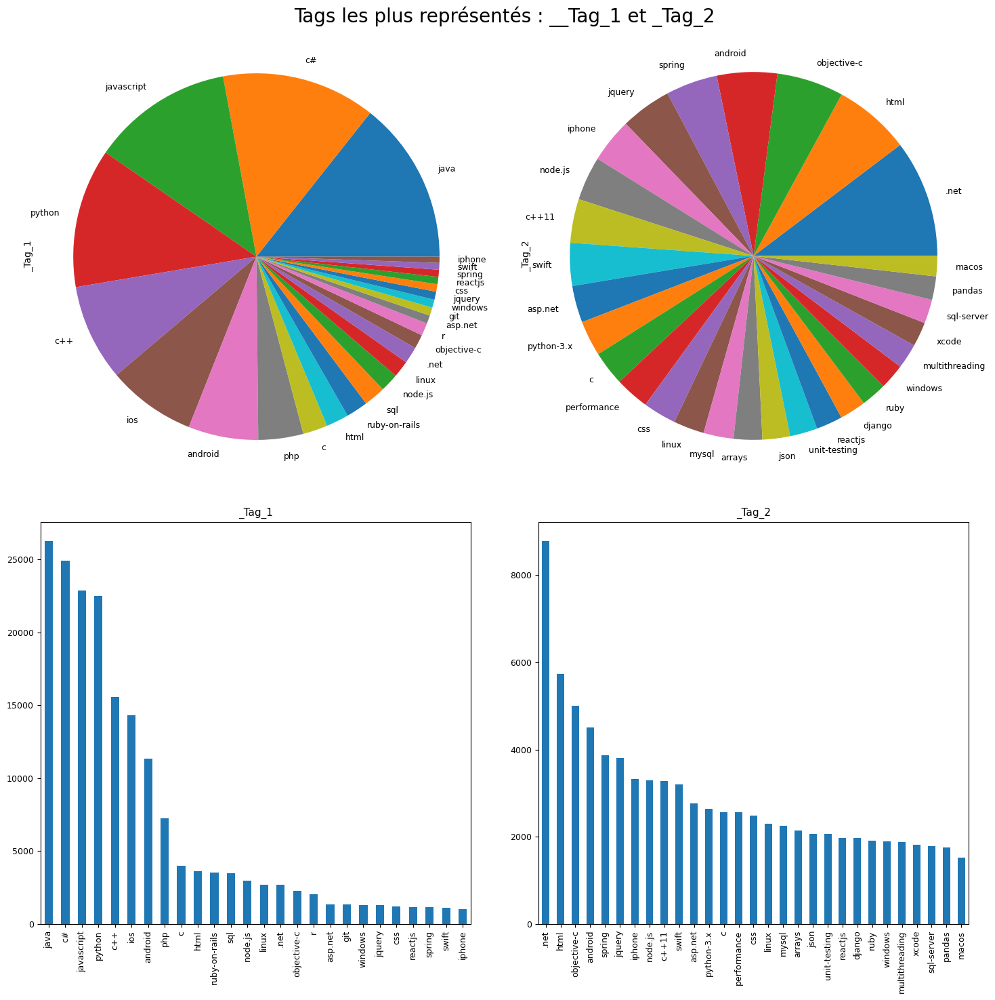

In [398]:
###########################################################
# Visualisation des tags les plus représentés             #
#    - fréquence >= 1000 pour _Tag_1                      #
#    - fréquence >= 1500 pour _Tag_2                      #
###########################################################
df_1_new = df.where(df['_Tag_1'].isin(intervalle_tag_1))
df_2_new = df.where(df['_Tag_2'].isin(intervalle_tag_2))


plt.figure(figsize = (15, 15))
    
# >>>>>>> Pie chart
plt.subplot(2, 2, 1)   # lignes, colonnes
df_1_new['_Tag_1'].value_counts(normalize = True).plot(kind = 'pie', fontsize = 9)
plt.axis('equal')      # Cette ligne assure que le pie chart est un cercle plutôt qu'une ellipse

plt.subplot(2, 2, 2)   # lignes, colonnes
df_2_new['_Tag_2'].value_counts(normalize = True).plot(kind = 'pie', fontsize = 9)
plt.axis('equal')      # Cette ligne assure que le pie chart est un cercle plutôt qu'une ellipse


# >>>>>>> Diagramme en tuyaux d'orgues
plt.subplot(2, 2, 3)   # lignes, colonnes
df_1_new['_Tag_1'].value_counts().plot(kind = 'bar', fontsize = 9)
plt.title('\n\n\n_Tag_1', fontsize = 11)

plt.subplot(2, 2, 4)   # lignes, colonnes
df_2_new['_Tag_2'].value_counts().plot(kind = 'bar', fontsize = 9)
plt.title('\n\n\n_Tag_2', fontsize = 11)

    
plt.suptitle('Tags les plus représentés : _Tag_1 et _Tag_2\n', fontsize = 20)
plt.tight_layout() # pour éviter chevauchement titre et ligne suivante

# 7.1.2. ETUDE DE LA FREQUENCE DE TOUS LES TAGS (VARIABLE CATEGORIELLE)

In [399]:
###############################################################
# => travail par sous-ensemble :                              #
# Calcul fréquence des tags pour un sous-ensemble             #
###############################################################
def calcul_frequence_tag_sous_ensemble(plage_min_in, plage_max_in):
    
    count_tag_1 = []
    count_tag_2 = []

    tag = new_liste_tags[plage_min_in:plage_max_in]    
    
    # Recherche fréquence pour chaque tag. Si absente, on met 0.
    for t in tag:
        if (t in count_Tag_1):
            count_tag_1.append(count_Tag_1[t])
        else:
            count_tag_1.append(0)
        
        if (t in count_Tag_2):
            count_tag_2.append(count_Tag_2[t])
        else:
            count_tag_2.append(0)
        
    print('[plage_min_in : plage_max_in] = [', plage_min_in, ':', plage_max_in, ']')        
    print(len(tag), 'valeurs tag\t\t:', tag)
    print(len(count_tag_1), 'valeurs count_tag_1\t:', count_tag_1)
    print(len(count_tag_2), 'valeurs count_tag_2\t:', count_tag_2)
    
    return tag, count_tag_1, count_tag_2

In [400]:
###############################################################
# Affichage fréquence des tags pour un sous-ensemble          #
###############################################################
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.bar.html
def affichage_frequence_tag_sous_ensemble(plage_min_in, plage_max_in):
    
    tag, count_tag_1, count_tag_2 = calcul_frequence_tag_sous_ensemble(plage_min_in = plage_min_in, 
                                                                       plage_max_in = plage_max_in)

    # Intervalle [plage_min_in : plage_max_in]
    df = pd.DataFrame({' _Tag_1': count_tag_1,
                       ' _Tag_2': count_tag_2}, index = tag)
    ax = df.plot.bar(rot = 90, stacked = True, figsize = (20, 6), fontsize = 14)
    ax.set_title('Fréquence des tags ' + str(plage_min_in) + ' --> ' + str(plage_max_in), fontsize = 20)
    ax.set_xlabel('Tags ' + str(plage_min_in) + ' --> ' + str(plage_max_in), fontsize = 14)
    ax.set_ylabel('Fréquence', fontsize = 14)

[plage_min_in : plage_max_in] = [ 0 : 25 ]
25 valeurs tag		: ['java', 'c#', 'javascript', 'python', 'c++', 'android', 'ios', '.net', 'html', 'php', 'jquery', 'objective-c', 'c', 'node.js', 'iphone', 'css', 'linux', 'asp.net', 'swift', 'spring', 'sql', 'xcode', 'performance', 'ruby-on-rails', 'json']
25 valeurs count_tag_1	: [26280, 24912, 22864, 22499, 15599, 11326, 14322, 2701, 3644, 7273, 1292, 2285, 3991, 2970, 1001, 1213, 2707, 1336, 1093, 1141, 3506, 443, 976, 3523, 716]
25 valeurs count_tag_2	: [0, 324, 691, 589, 1016, 4508, 1134, 8782, 5737, 1296, 3812, 5009, 2567, 3290, 3327, 2492, 2304, 2759, 3204, 3876, 1219, 1823, 2558, 586, 2070]


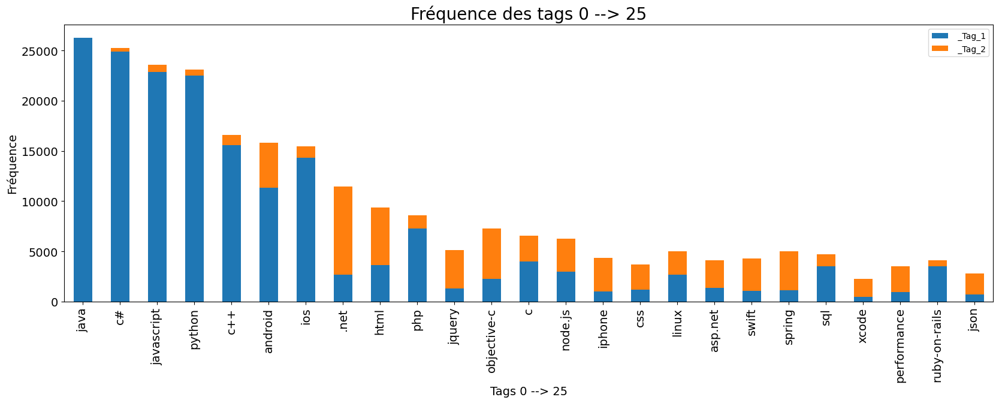

In [401]:
# Intervalle [0 : 25]
affichage_frequence_tag_sous_ensemble(plage_min_in = 0,
                                      plage_max_in = 25)

[plage_min_in : plage_max_in] = [ 26 : 50 ]
24 valeurs tag		: ['windows', 'mysql', 'asp.net-mvc', 'c++11', 'arrays', 'python-3.x', 'multithreading', 'unit-testing', 'django', 'sql-server', 'macos', 'ruby', 'wpf', 'database', 'string', 'algorithm', 'typescript', 'visual-studio', 'angular', 'r', 'spring-boot', 'pandas', 'numpy', 'amazon-web-services']
24 valeurs count_tag_1	: [1313, 815, 675, 85, 414, 481, 274, 594, 702, 725, 870, 704, 695, 497, 346, 966, 920, 563, 691, 2048, 271, 80, 57, 999]
24 valeurs count_tag_2	: [1896, 2253, 1472, 3282, 2139, 2647, 1877, 2059, 1973, 1791, 1516, 1908, 1468, 1174, 1450, 1114, 1159, 1216, 1209, 493, 968, 1756, 1154, 959]


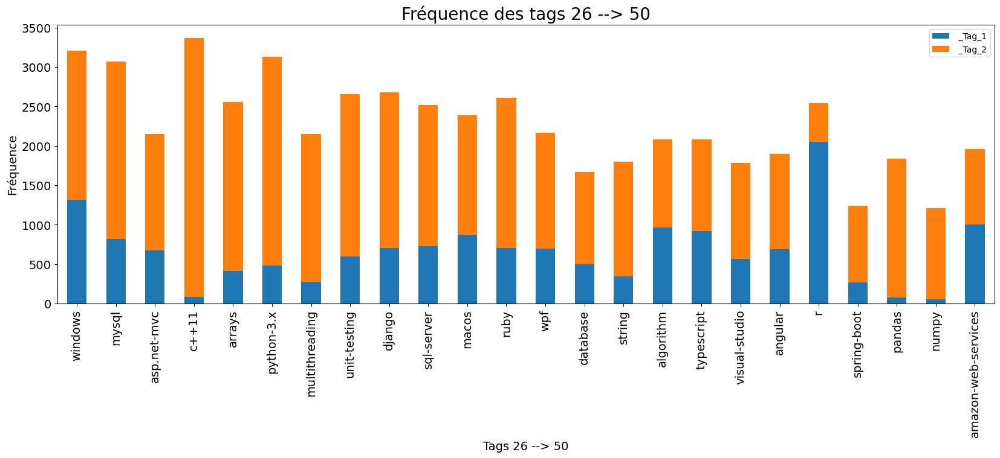

In [402]:
# Intervalle [26 : 50]
affichage_frequence_tag_sous_ensemble(plage_min_in = 26,
                                      plage_max_in = 50)

[plage_min_in : plage_max_in] = [ 51 : 75 ]
24 valeurs tag		: ['angularjs', 'ajax', 'postgresql', 'hibernate', 'rest', 'git', 'image', 'google-chrome', 'xml', 'eclipse', 'asp.net-core', 'docker', 'maven', 'laravel', 'bash', 'entity-framework', 'security', 'http', 'cocoa-touch', 'debugging', 'authentication', 'android-studio', 'testing', 'templates']
24 valeurs count_tag_1	: [363, 127, 342, 178, 411, 1323, 234, 312, 233, 282, 267, 691, 301, 214, 596, 146, 333, 344, 32, 192, 225, 100, 182, 48]
24 valeurs count_tag_2	: [985, 563, 1005, 933, 831, 576, 1095, 893, 1075, 1175, 905, 817, 870, 1042, 978, 672, 812, 741, 436, 649, 735, 954, 669, 803]


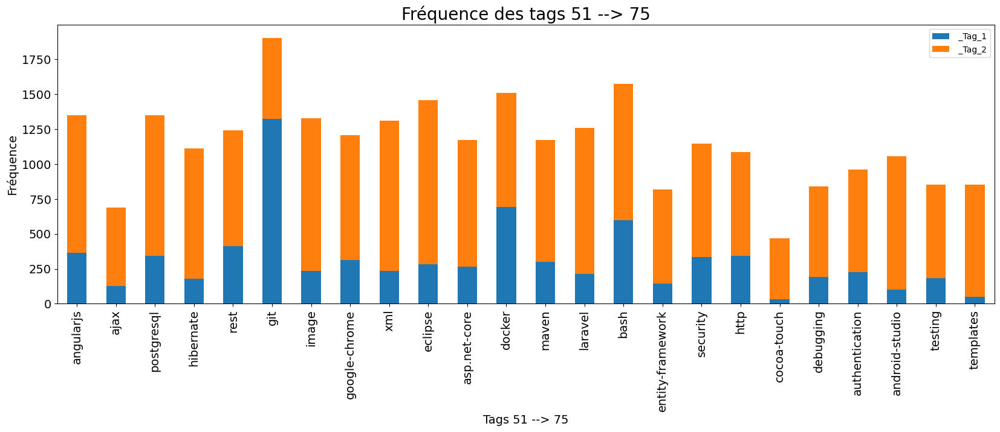

In [403]:
# Intervalle [51 : 75]
affichage_frequence_tag_sous_ensemble(plage_min_in = 51,
                                      plage_max_in = 75)

[plage_min_in : plage_max_in] = [ 76 : 99 ]
23 valeurs tag		: ['firebase', 'machine-learning', 'jpa', 'asynchronous', 'spring-mvc', 'python-2.7', 'shell', 'ssl', 'qt', 'gradle', 'list', 'dataframe', 'winforms', 'ubuntu', 'optimization', 'mongodb', 'assembly', 'api', 'selenium', 'regex', 'cocoa', 'exception', 'twitter-bootstrap']
23 valeurs count_tag_1	: [218, 471, 57, 79, 24, 91, 164, 265, 275, 91, 107, 28, 49, 161, 110, 134, 450, 119, 103, 174, 77, 62, 45]
23 valeurs count_tag_2	: [716, 902, 302, 552, 199, 682, 659, 702, 803, 508, 644, 295, 502, 538, 493, 478, 478, 482, 634, 431, 391, 487, 254]


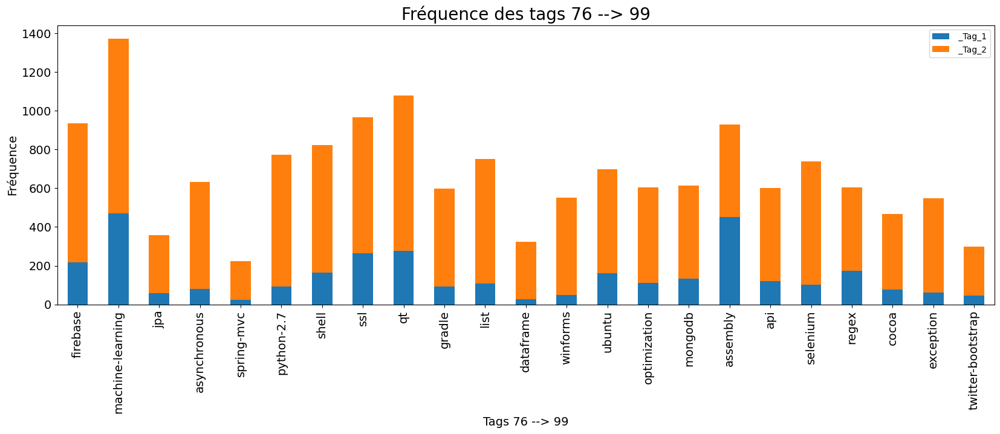

In [404]:
# Intervalle [76 : 99]
affichage_frequence_tag_sous_ensemble(plage_min_in = 76,
                                      plage_max_in = 99)

# 7.1.3. ETUDE DE LA TAILLE DES NOMS DE TAG (VARIABLE QUANTITATIVE)

In [405]:
len_Tag_1 = df['_Tag_1'].str.len() # longueur _Tag_1
len_Tag_2 = df['_Tag_2'].str.len() # longueur _Tag_2

In [406]:
# _Tag_1 : compris entre 1 et 1 caractères
len_Tag_1.describe().transpose()

count    208496.000000
mean          5.368774
std           3.179851
min           1.000000
25%           3.000000
50%           4.000000
75%           7.000000
max          19.000000
Name: _Tag_1, dtype: float64

In [407]:
# _Tag_2 : compris entre 1 et 1 caractères
len_Tag_2.describe().transpose()

count    208496.000000
mean          4.875139
std           3.855533
min           1.000000
25%           1.000000
50%           4.000000
75%           7.000000
max          19.000000
Name: _Tag_2, dtype: float64

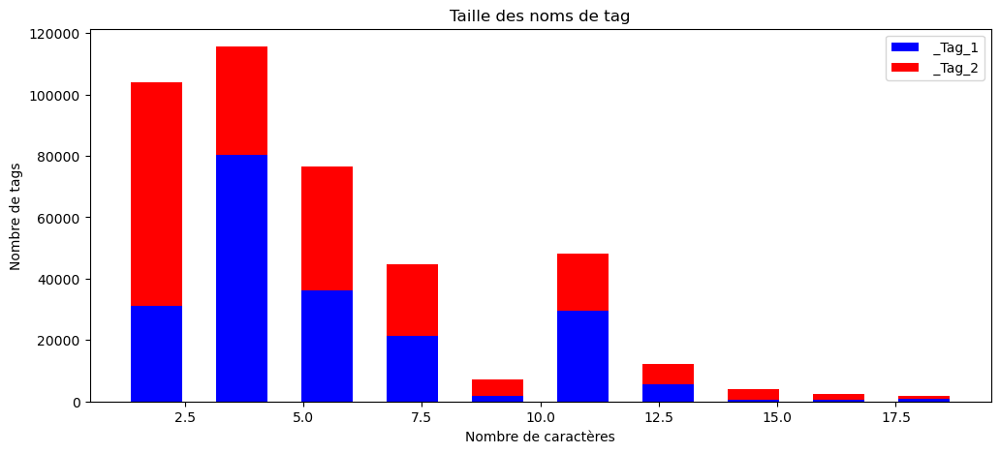

In [408]:
# http://python-simple.com/python-matplotlib/histogram.php
plt.figure(figsize = (12, 5))  # longueur, hauteur
plt.hist([len_Tag_1, len_Tag_2], color = ['blue', 'red'], label = [' _Tag_1', ' _Tag_2'], 
         rwidth = 0.6, histtype = 'barstacked')

plt.legend(loc = 'upper right')
plt.xlabel('Nombre de caractères')
plt.ylabel('Nombre de tags')
plt.title('Taille des noms de tag')
plt.show()

# 7.2. ANALYSE UNIVARIEE TEXTE

In [ ]:
# Rappel des variables :
#  --> corpus_text = ' '.join(df['_Text_clean'])
#  --> token_text = corpus_text.split()
#  --> count_text = pd.Series(token_text).value_counts()

# 7.2.1. ETUDE DE LA FREQUENCE DES MOTS (VARIABLE QUANTITATIVE)

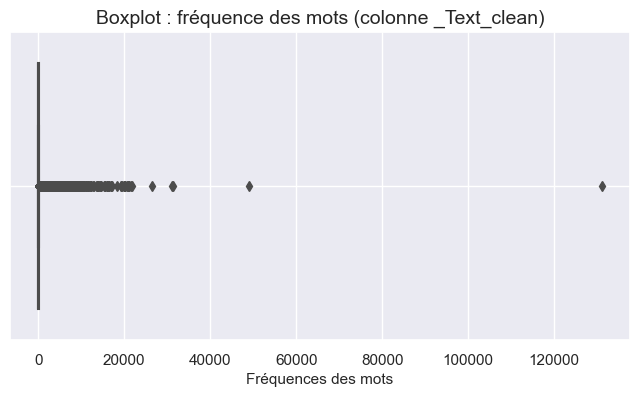

In [568]:
###########################################
# Boxplot fréquence des mots              #
###########################################
# Tout le corpus
ax1 = sns.boxplot(data = df, 
                  x    = count_text)
ax1.set_xlabel('Fréquences des mots', fontsize = 11)
plt.title('Boxplot : fréquence des mots (colonne _Text_clean)', fontsize = 14)
plt.grid(True)

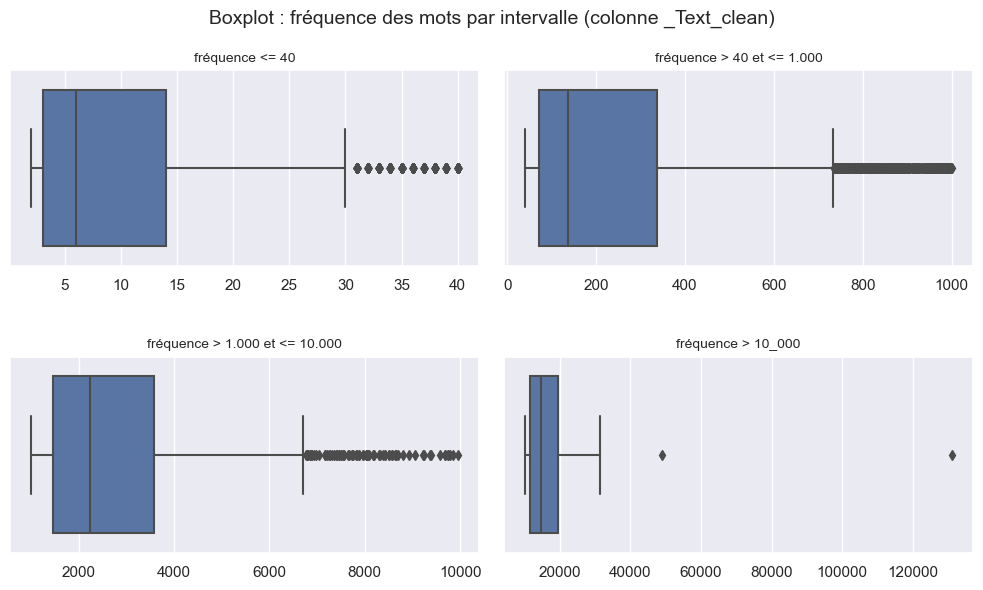

In [569]:
####################################################
# Boxplot fréquence des mots : zoom par intervalle #
####################################################
# Visualisation des données en un seul schéma
fig = plt.figure(figsize = (10, 6))  # Width, height

# Fréquence <= 40
ax = fig.add_subplot(2, 2, 1)   # lignes, colonnes
count_corpus_box = count_text[(count_text <= 40)]    
sns.boxplot(data = df,
            x    = count_corpus_box)
ax.set_title('fréquence <= 40', fontsize = 10)

# Fréquence > 40 et <= 1.000
ax = fig.add_subplot(2, 2, 2)   # lignes, colonnes
count_corpus_box = count_text[(count_text > 40) & (count_text <= 1_000)]    
sns.boxplot(data = df,
            x    = count_corpus_box)
ax.set_title('fréquence > 40 et <= 1.000', fontsize = 10)

# Fréquence > 1.000 et <= 10.000
ax = fig.add_subplot(2, 2, 3)   # lignes, colonnes
count_corpus_box = count_text[(count_text > 1_000) & (count_text <= 10_000)]    
sns.boxplot(data = df,
            x    = count_corpus_box)
ax.set_title('\n\nfréquence > 1.000 et <= 10.000', fontsize = 10)

# Fréquence > 10_000
ax = fig.add_subplot(2, 2, 4) 
count_corpus_box = count_text[(count_text > 10_000)]    
sns.boxplot(data = df,
            x    = count_corpus_box)
ax.set_title('\n\nfréquence > 10_000', fontsize = 10)

    
fig.suptitle('Boxplot : fréquence des mots par intervalle (colonne _Text_clean)', fontsize = 14)
fig.tight_layout() # pour éviter chevauchement titre et ligne suivante

# 7.2.2. ETUDE DE LA LONGUEUR DES DOCUMENTS (VARIABLE QUANTITATIVE)

In [308]:
# Longueur documents
len_Text_clean = df['_Text_clean'].str.len()

In [309]:
# on stocke ce vecteur numérique dans une colonne préfixée par _
df['_len_Text_clean'] = len_Text_clean

# output de sortie pour contrôler que l'opération s'est bien effectuée.
df.describe(include = np.number)

# la grande majorité des messages (50%) fait 147 caractères.
# Certains ont une taille très élevée (8932).

,Id,Score,AnswerCount,_len_Text,len_Text_clean
count,2.076360e+05,207636.000000,207636.000000,207636.00000,207636.000000
mean,2.666463e+07,25.945679,3.417187,1850.98965,230.625479
std,1.914842e+07,143.634117,3.514504,2244.15362,301.994037
min,4.000000e+00,6.000000,1.000000,62.00000,2.000000
25%,9.576688e+06,7.000000,1.000000,705.00000,80.000000
50%,2.383176e+07,10.000000,2.000000,1210.00000,147.000000
75%,4.146125e+07,18.000000,4.000000,2139.00000,270.000000
max,7.640311e+07,27009.000000,134.000000,48697.00000,8932.000000


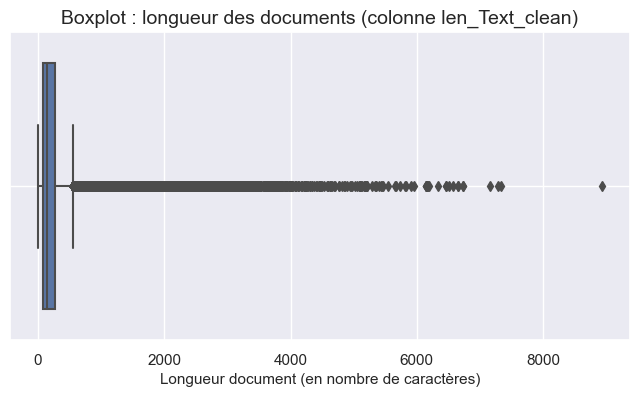

In [573]:
###########################################
# Boxplot longueur de chaque document     #
###########################################
ax1 = sns.boxplot(data = df,
                  x    = _len_Text_clean)
ax1.set_xlabel('Longueur document (en nombre de caractères)', fontsize = 11)
plt.title('Boxplot : longueur des documents (colonne _len_Text_clean)', fontsize = 14)
plt.grid(True)

Text(0.5, 0.98, 'Displot : longueur des documents (colonne len_Text_clean)')

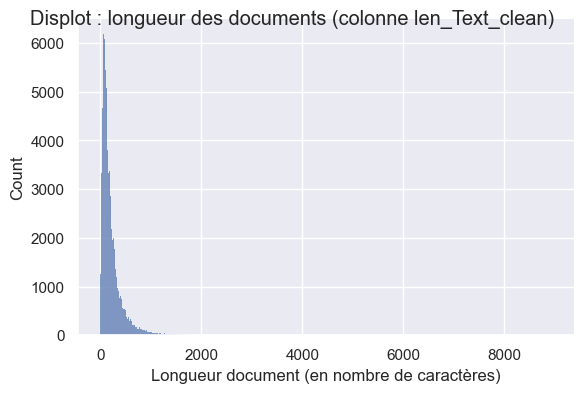

In [574]:
###########################################
# Displot longueur de chaque document     #
###########################################
# https://www.delftstack.com/fr/howto/seaborn/seaborn-font-size/
ax2 = sns.displot(data   = df, 
                  x      = _len_Text_clean, 
                  height = 4, 
                  aspect = 1.5) # height = 4, width = 1.5 times larger than height

ax2.set_axis_labels('Longueur document (en nombre de caractères)', 'Count')
ax2.fig.suptitle('Displot : longueur des documents (colonne _len_Text_clean)')

# 7.3. FREQUENCE DISTRIBUTION (VARIABLE CATEGORIELLE)

In [66]:
# Stockage de la fréquence de distribution des sous-dataframes dans des dictionnaires
# >>>>>>>  Colonne _Stemmer_clean 
most_common_stemmer_1_gram      = {} # 1-gram
most_common_stemmer_1_gram_word = {} # 1-gram
most_common_stemmer_2_gram      = {} # 2-gram
most_common_stemmer_2_gram_word = {} # 2-gram

# >>>>>>> Colonne _Lemma_clean 
most_common_lemma_3_gram      = {} # 3-gram
most_common_lemma_3_gram_word = {} # 3-gram

In [67]:
####################################################
#   Fréquence distribution, niveau sous-dataframe  # 
####################################################
# https://askcodez.com/comptage-de-n-grammes-de-frequence-en-python-nltk.html
# https://www.askpython.com/python/examples/n-grams-python-nltk
def frequence_distribution_sous_dataframe(n_gram_in, operation_in, cle_in, colonne_in, most_common_in):
    
    most_common_word = []
    
    # Liste des index du sous-dataframe (ne commence pas forcément à 0, car filtré)
    liste_index = dict_df[cle_in].index.to_list()

    print('n_gram_in\t=', n_gram_in,
          '\noperation_in\t=', operation_in,
          '\ncle_in\t\t=', cle_in,
          '\ncolonne_in\t=', colonne_in, '\n')
    
    for index, row in dict_df[cle_in].iterrows():
        token = word_tokenize(row[colonne_in])
        
        # ngram
        if (n_gram_in == 1):
            n_grams = token
        else:
            n_grams = ngrams(token, n_gram_in)
        
        # Frequence distribution
        if (index == liste_index[0]):  # premier index du sous-dataframe
            ngram_fdist = FreqDist(n_grams)            
        elif (operation_in == '+'):
            ngram_fdist = ngram_fdist + FreqDist(n_grams)
        elif (operation_in == '&'):
            ngram_fdist = ngram_fdist & FreqDist(n_grams)            

    # most_common_in most common words
    most_common = ngram_fdist.most_common(most_common_in)
    print(most_common_in, 'most_common :', most_common, '\n')
    
    
    # Extraction liste des mots les plus communs dans une liste
    # Remarque : ind[0] = mot, ind[1] = valeur
    for ind in most_common:
        most_common_word.append(ind[0])
    print('most_common_word =', most_common_word)
    
    return most_common, most_common_word

In [68]:
#################################################
#      Affichage fréquence distribution         #
#################################################
# Couleurs  : https://matplotlib.org/stable/gallery/color/named_colors.html
# Marqueurs : https://matplotlib.org/stable/api/markers_api.html
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html
def affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in, 
                                                    name_in, 
                                                    cle_1_in, 
                                                    cle_2_in, 
                                                    intersection_cles_in):
    
    most_common_1 = most_common_n_gram_in[cle_1_in]
    most_common_2 = most_common_n_gram_in[cle_2_in]
  
    count1 = 0 
    count2 = 0     
    
    fig = plt.figure(figsize = (7, 4))  # Width, height
    
    # Maj couleurs : 1 couleur / clé
    # >>>>>>> Couleur 1    
    if (cle_1_in == 'java'):
        color_1 = 'blue'
    elif (cle_1_in == 'c#'):
        color_1 = 'red'
    elif (cle_1_in == 'javascript'):
        color_1 = 'lime'
    elif (cle_1_in == 'python'):
        color_1 = 'orange'        
    elif (cle_1_in == 'c++'):
        color_1 = 'fuchsia'
        
    # >>>>>>> Couleur 2
    if (cle_2_in == 'java'):
        color_2 = 'blue'
    elif (cle_2_in == 'c#'):
        color_2 = 'red'
    elif (cle_2_in == 'javascript'):
        color_2 = 'lime'
    elif (cle_2_in == 'python'):
        color_2 = 'orange'        
    elif (cle_2_in == 'c++'):
        color_2 = 'fuchsia'        

    
    # *******************************************
    # * Liste 1                                 *
    # *******************************************    
    for ind_1 in most_common_1: # liste de tuples
        if (ind_1[0] in intersection_cles_in):
            if (count1 == 0): # Premier passage : légende marquée une fois
                if ('1-gram' in name_in): # 1-gram
                    plt.plot(ind_1[0], ind_1[1], color = color_1, marker = 'o', linestyle = 'dashed', label = cle_1_in)
                else: # n-gram != 1
                    plt.plot(' '.join(ind_1[0]), ind_1[1], color = color_1, marker = 'o', 
                             linestyle = 'dashed', label = cle_1_in)
                count1 = 1
            else:
                if ('1-gram' in name_in): # 1-gram
                    plt.plot(ind_1[0], ind_1[1], color = color_1, marker = 'o', linestyle = 'dashed')
                else: # n-gram != 1
                    plt.plot(' '.join(ind_1[0]), ind_1[1], color = color_1, marker = 'o', 
                             linestyle = 'dashed')
            
            
    # *******************************************
    # * Liste 2                                 *
    # *******************************************
    for ind_2 in most_common_2: # liste de tuples
        if (ind_2[0] in intersection_cles_in):
            if (count2 == 0):  # Premier passage : légende marquée une fois
                if ('1-gram' in name_in): # 1-gram                
                    plt.plot(ind_2[0], ind_2[1], color = color_2, marker = 'o', linestyle = 'dashed', label = cle_2_in)
                else: # n-gram != 1
                    plt.plot(' '.join(ind_2[0]), ind_2[1], color = color_2, marker = 'o', 
                             linestyle = 'dashed', label = cle_2_in)
                count2 = 1
            else:
                if ('1-gram' in name_in): # 1-gram                
                    plt.plot(ind_2[0], ind_2[1], color = color_2, marker = 'o', linestyle = 'dashed') 
                else: # n-gram != 1
                    plt.plot(' '.join(ind_2[0]), ind_2[1], color = color_2, marker = 'o', 
                             linestyle = 'dashed')
                    
    plt.legend(loc = 'upper right')
    plt.xlabel('Mots')
    plt.xticks(rotation = 90) # légende axe des x verticale
    plt.ylabel('Fréquence')
    plt.title(name_in + ' : ' + str(len(intersection_cles_in)) + ' mots les plus communs entre ' + cle_1_in + 
              ' et ' + cle_2_in + ' ')
    plt.show()

# 7.3.1. FREQUENCE DISTRIBUTION COLONNE _STEMMER_CLEAN POUR 1-GRAM

In [69]:
# Maj paramètres communs
n_gram      = 1
operation   = '+'
colonne     = '_Stemmer_clean'
most_common = 50

In [70]:
# java
most_common_stemmer_1_gram['java'], most_common_stemmer_1_gram_word['java'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'java', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= java 
colonne_in	= _Stemmer_clean 

50 most_common : [('android', 31938), ('spring', 22938), ('apach', 19505), ('jar', 18630), ('hibern', 13306), ('final', 12470), ('depend', 11780), ('sun', 10829), ('secur', 10248), ('boot', 9745), ('releas', 9227), ('eclips', 8505), ('overrid', 8066), ('bean', 7495), ('invok', 6484), ('factori', 6052), ('catalina', 5956), ('annot', 5525), ('reflect', 5491), ('tomcat', 5446), ('entiti', 4918), ('activ', 4862), ('session', 4590), ('catch', 4484), ('nativ', 4149), ('persist', 4123), ('schema', 3933), ('repositori', 3748), ('column', 3668), ('rest', 3592), ('transact', 3523), ('integ', 3505), ('password', 3406), ('concurr', 3125), ('jersey', 3108), ('authent', 3092), ('gener', 2968), ('jackson', 2887), ('super', 2704), ('collect', 2702), ('doubl', 2699), ('control', 2680), ('intent', 2647), ('driver', 2625), ('log', 2588), ('compon', 2568), ('pom', 2548), ('action', 2536), ('scala', 2514), ('manag', 2504)] 

mos

In [71]:
# c#
most_common_stemmer_1_gram['c#'], most_common_stemmer_1_gram_word['c#'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c#', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= c# 
colonne_in	= _Stemmer_clean 

50 most_common : [('asp', 7395), ('entiti', 4785), ('visual', 4548), ('bind', 4505), ('await', 4432), ('studio', 4287), ('assembl', 4085), ('gener', 3828), ('control', 3674), ('bool', 3451), ('action', 3287), ('express', 3060), ('secur', 2656), ('token', 2649), ('grid', 2614), ('collect', 2456), ('authent', 2453), ('password', 2434), ('click', 2369), ('doubl', 2358), ('ident', 2281), ('div', 2241), ('throw', 2201), ('catch', 2187), ('overrid', 2172), ('sender', 2143), ('oper', 2007), ('dispos', 1942), ('cultur', 1905), ('valid', 1892), ('column', 1882), ('dictionari', 1840), ('serial', 1822), ('design', 1816), ('author', 1786), ('session', 1775), ('depend', 1774), ('summari', 1756), ('mono', 1755), ('android', 1754), ('document', 1739), ('azur', 1719), ('person', 1709), ('td', 1690), ('constructor', 1685), ('titl', 1608), ('product', 1582), ('descript', 1558), ('provid', 1556), ('repositori', 1549)] 

most_com

In [72]:
# javascript
most_common_stemmer_1_gram['javascript'], most_common_stemmer_1_gram_word['javascript'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'javascript', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= javascript 
colonne_in	= _Stemmer_clean 

50 most_common : [('div', 25436), ('react', 11093), ('document', 7909), ('click', 6613), ('compon', 6448), ('browser', 6053), ('td', 5946), ('angular', 5846), ('chrome', 5784), ('li', 5463), ('titl', 4905), ('err', 4347), ('span', 4278), ('render', 3951), ('label', 3706), ('canva', 3645), ('prop', 3373), ('export', 3343), ('bootstrap', 3331), ('token', 3015), ('loader', 3000), ('alert', 2980), ('promis', 2902), ('nativ', 2846), ('dom', 2732), ('express', 2732), ('resolv', 2716), ('modal', 2712), ('action', 2617), ('login', 2578), ('router', 2560), ('undefin', 2508), ('babel', 2357), ('scroll', 2294), ('select', 2269), ('submit', 2253), ('rout', 2221), ('control', 2188), ('await', 2160), ('font', 2151), ('anim', 2125), ('password', 2046), ('android', 2021), ('tab', 2014), ('rel', 1975), ('push', 1944), ('navig', 1931), ('border', 1905), ('site', 1878), ('menu', 1827)] 

most_common_word = ['div', 'react

In [73]:
# python
most_common_stemmer_1_gram['python'], most_common_stemmer_1_gram_word['python'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'python', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= python 
colonne_in	= _Stemmer_clean 

50 most_common : [('site', 9236), ('train', 6904), ('pip', 5160), ('column', 5083), ('rang', 4282), ('shape', 4190), ('plot', 4140), ('flask', 3636), ('session', 3461), ('loss', 3389), ('len', 3124), ('gener', 3009), ('recent', 2967), ('matrix', 2934), ('append', 2853), ('activ', 2658), ('nan', 2640), ('batch', 2579), ('fit', 2560), ('label', 2539), ('password', 2245), ('titl', 2198), ('selenium', 2197), ('learn', 2180), ('spark', 2138), ('lambda', 2102), ('rais', 2076), ('sum', 2061), ('group', 2060), ('manag', 2001), ('token', 1998), ('axi', 1919), ('driver', 1911), ('div', 1904), ('ax', 1904), ('iter', 1872), ('split', 1849), ('except', 1841), ('float', 1760), ('log', 1699), ('calcul', 1646), ('apach', 1623), ('valid', 1605), ('comput', 1604), ('celeri', 1593), ('predict', 1572), ('temp', 1467), ('anaconda', 1463), ('login', 1459), ('binari', 1454)] 

most_common_word = ['site', 'train', 'pip', 'column'

In [74]:
# c++
most_common_stemmer_1_gram['c++'], most_common_stemmer_1_gram_word['c++'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c++', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 1 
operation_in	= + 
cle_in		= c++ 
colonne_in	= _Stemmer_clean 

50 most_common : [('boost', 9017), ('char', 7990), ('vector', 7763), ('oper', 5588), ('doubl', 4860), ('clang', 4285), ('float', 4105), ('pointer', 3607), ('unsign', 3399), ('bool', 3148), ('constructor', 2862), ('member', 2699), ('visual', 2672), ('declar', 2557), ('alloc', 2506), ('cast', 2477), ('virtual', 2428), ('studio', 2204), ('uniqu', 2094), ('undefin', 2054), ('gener', 2033), ('begin', 1984), ('lock', 1962), ('gnu', 1961), ('atom', 1772), ('express', 1766), ('deriv', 1716), ('releas', 1698), ('push', 1647), ('lambda', 1534), ('assert', 1520), ('consid', 1445), ('link', 1428), ('forward', 1333), ('pair', 1333), ('matrix', 1322), ('free', 1313), ('android', 1284), ('integ', 1237), ('definit', 1216), ('special', 1215), ('rang', 1170), ('assign', 1159), ('mat', 1149), ('optim', 1134), ('execut', 1119), ('convers', 1110), ('algorithm', 1099), ('constant', 1093), ('bug', 1083)] 

most_common_word = ['boos

In [75]:
###################################################
#    Intersection entre les 5 sous-dataframes     #
###################################################
# https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-trouver-lintersection-de-deux-listes
set_java_stemmer_1_gram        = set(most_common_stemmer_1_gram_word['java'])
set_c_sharp_stemmer_1_gram     = set(most_common_stemmer_1_gram_word['c#']) 
set_javascript_stemmer_1_gram  = set(most_common_stemmer_1_gram_word['javascript']) 
set_python_stemmer_1_gram      = set(most_common_stemmer_1_gram_word['python']) 
set_c_plus_plus_stemmer_1_gram = set(most_common_stemmer_1_gram_word['c++']) 

intersection_java_c_sharp_stemmer_1_gram     = list(set_java_stemmer_1_gram & set_c_sharp_stemmer_1_gram)
intersection_java_javascript_stemmer_1_gram  = list(set_java_stemmer_1_gram & set_javascript_stemmer_1_gram)
intersection_java_python_stemmer_1_gram      = list(set_java_stemmer_1_gram & set_python_stemmer_1_gram)
intersection_java_c_plus_plus_stemmer_1_gram = list(set_java_stemmer_1_gram & set_c_plus_plus_stemmer_1_gram)
intersection_all_stemmer_1_gram              = list(set_java_stemmer_1_gram & set_c_sharp_stemmer_1_gram & \
                                                    set_javascript_stemmer_1_gram & set_python_stemmer_1_gram & \
                                                    set_c_plus_plus_stemmer_1_gram)

print('intersection_java_c_sharp_stemmer_1_gram\t=', intersection_java_c_sharp_stemmer_1_gram)
print('intersection_java_javascript_stemmer_1_gram\t=', intersection_java_javascript_stemmer_1_gram)
print('intersection_java_python_stemmer_1_gram\t\t=', intersection_java_python_stemmer_1_gram)
print('intersection_java_c_plus_plus_stemmer_1_gram\t=', intersection_java_c_plus_plus_stemmer_1_gram)
print('intersection_all_stemmer_1_gram\t\t\t=', intersection_all_stemmer_1_gram)

intersection_java_c_sharp_stemmer_1_gram	= ['authent', 'doubl', 'session', 'secur', 'collect', 'android', 'column', 'control', 'gener', 'entiti', 'catch', 'action', 'depend', 'repositori', 'overrid', 'password']
intersection_java_javascript_stemmer_1_gram	= ['android', 'control', 'nativ', 'compon', 'action', 'password']
intersection_java_python_stemmer_1_gram		= ['log', 'session', 'apach', 'column', 'gener', 'driver', 'activ', 'manag', 'password']
intersection_java_c_plus_plus_stemmer_1_gram	= ['android', 'gener', 'doubl', 'integ', 'releas']
intersection_all_stemmer_1_gram			= []


In [ ]:
####################################################
#       Affichage fréquence distribution           #
####################################################

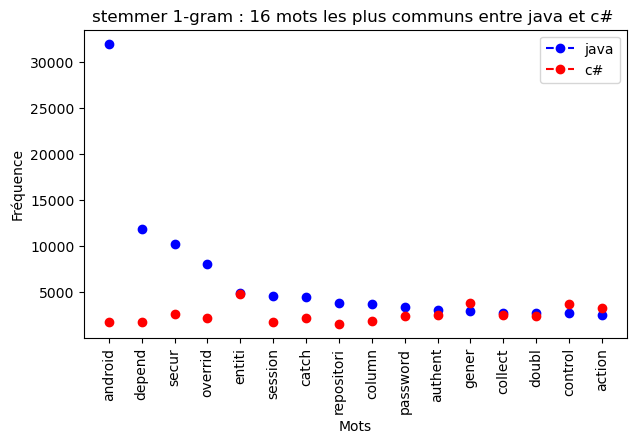

In [76]:
# Intersection mots java / c#
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_1_gram,
                                                name_in               = 'stemmer 1-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c#',
                                                intersection_cles_in  = intersection_java_c_sharp_stemmer_1_gram)

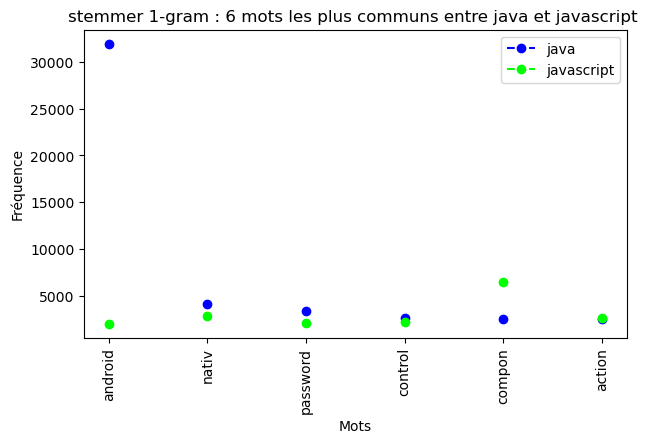

In [77]:
# Intersection mots java / javascript
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_1_gram,
                                                name_in               = 'stemmer 1-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'javascript',
                                                intersection_cles_in  = intersection_java_javascript_stemmer_1_gram)

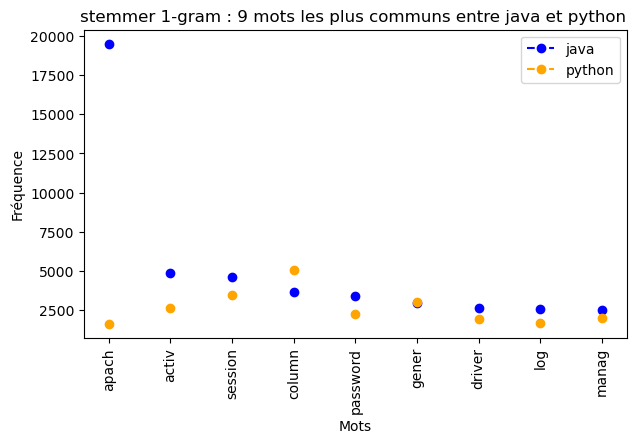

In [78]:
# Intersection mots java / python
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_1_gram,
                                                name_in               = 'stemmer 1-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'python',
                                                intersection_cles_in  = intersection_java_python_stemmer_1_gram)

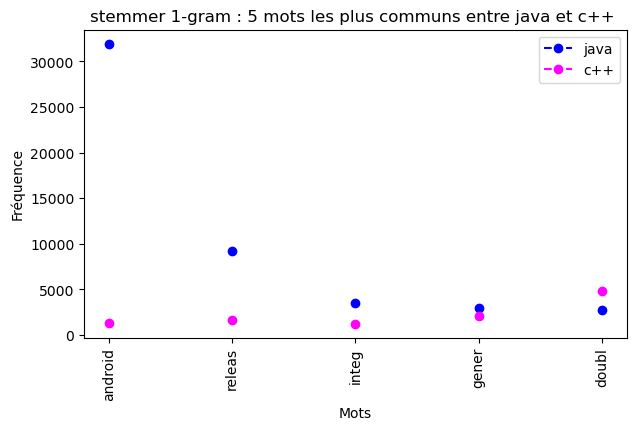

In [79]:
# Intersection mots java / c++
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_1_gram,
                                                name_in               = 'stemmer 1-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c++',
                                                intersection_cles_in  = intersection_java_c_plus_plus_stemmer_1_gram)

# 7.3.2. FREQUENCE DISTRIBUTION COLONNE _STEMMER_CLEAN POUR 2-GRAM

In [80]:
# Maj paramètres communs
n_gram      = 2
operation   = '+'
colonne     = '_Stemmer_clean'
most_common = 50

In [81]:
# java
most_common_stemmer_2_gram['java'], most_common_stemmer_2_gram_word['java'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'java', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 2 
operation_in	= + 
cle_in		= java 
colonne_in	= _Stemmer_clean 

50 most_common : [(('android', 'android'), 13954), (('spring', 'boot'), 5771), (('apach', 'catalina'), 5379), (('depend', 'depend'), 4898), (('releas', 'jar'), 3405), (('hibern', 'hibern'), 3401), (('jar', 'releas'), 3286), (('reflect', 'invok'), 2962), (('jar', 'jar'), 2880), (('sun', 'reflect'), 2776), (('boot', 'spring'), 2601), (('spring', 'releas'), 2588), (('catalina', 'apach'), 2336), (('factori', 'factori'), 2289), (('apach', 'apach'), 2256), (('final', 'final'), 2104), (('spring', 'spring'), 1803), (('secur', 'secur'), 1797), (('spring', 'secur'), 1688), (('bean', 'bean'), 1655), (('schema', 'schema'), 1544), (('sun', 'sun'), 1515), (('boot', 'starter'), 1483), (('invok', 'apach'), 1401), (('apach', 'tomcat'), 1362), (('final', 'jar'), 1298), (('eclips', 'eclips'), 1279), (('jar', 'final'), 1248), (('session', 'session'), 1182), (('android', 'wrap'), 1169), (('wrap', 'android'), 1133), (('invok', 's

In [82]:
# c#
most_common_stemmer_2_gram['c#'], most_common_stemmer_2_gram_word['c#'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c#', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common) # 35 min

n_gram_in	= 2 
operation_in	= + 
cle_in		= c# 
colonne_in	= _Stemmer_clean 

50 most_common : [(('visual', 'studio'), 4114), (('cultur', 'neutral'), 1327), (('bind', 'bind'), 1155), (('td', 'td'), 1003), (('asp', 'asp'), 998), (('entiti', 'entiti'), 959), (('div', 'div'), 957), (('grid', 'grid'), 871), (('await', 'await'), 840), (('doubl', 'doubl'), 813), (('assembl', 'assembl'), 737), (('catch', 'ex'), 637), (('express', 'express'), 626), (('mono', 'mono'), 589), (('android', 'android'), 581), (('person', 'person'), 578), (('control', 'action'), 562), (('action', 'action'), 554), (('bool', 'bool'), 517), (('dictionari', 'dictionari'), 508), (('click', 'sender'), 493), (('control', 'control'), 490), (('summari', 'summari'), 486), (('builder', 'builder'), 479), (('password', 'password'), 453), (('token', 'token'), 428), (('reader', 'reader'), 416), (('depend', 'inject'), 406), (('ex', 'ex'), 403), (('document', 'document'), 396), (('dispos', 'dispos'), 391), (('session', 'session'), 379

In [83]:
# javascript
most_common_stemmer_2_gram['javascript'], most_common_stemmer_2_gram_word['javascript'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'javascript', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common) # 35 min

n_gram_in	= 2 
operation_in	= + 
cle_in		= javascript 
colonne_in	= _Stemmer_clean 

50 most_common : [(('div', 'div'), 10257), (('td', 'td'), 4098), (('li', 'li'), 2886), (('react', 'react'), 2052), (('react', 'nativ'), 1776), (('err', 'err'), 1631), (('document', 'document'), 1272), (('angular', 'angular'), 1253), (('loader', 'loader'), 1209), (('span', 'span'), 1198), (('canva', 'canva'), 1046), (('th', 'th'), 983), (('titl', 'titl'), 938), (('document', 'readi'), 902), (('label', 'label'), 900), (('compon', 'compon'), 874), (('react', 'compon'), 839), (('div', 'col'), 762), (('token', 'token'), 715), (('express', 'express'), 695), (('bootstrap', 'bootstrap'), 667), (('prop', 'prop'), 665), (('div', 'modal'), 613), (('react', 'dom'), 590), (('react', 'router'), 583), (('border', 'solid'), 575), (('password', 'password'), 549), (('alert', 'alert'), 534), (('promis', 'resolv'), 530), (('span', 'div'), 523), (('compon', 'react'), 499), (('babel', 'babel'), 496), (('click', 'click'), 49

In [84]:
# python
most_common_stemmer_2_gram['python'], most_common_stemmer_2_gram_word['python'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'python', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common) # 35 min

n_gram_in	= 2 
operation_in	= + 
cle_in		= python 
colonne_in	= _Stemmer_clean 

50 most_common : [(('train', 'train'), 1698), (('nan', 'nan'), 1614), (('pip', 'pip'), 1010), (('iri', 'iri'), 937), (('flask', 'flask'), 923), (('loss', 'loss'), 913), (('site', 'site'), 892), (('shape', 'shape'), 809), (('div', 'div'), 780), (('session', 'session'), 765), (('apach', 'spark'), 742), (('column', 'column'), 697), (('token', 'token'), 684), (('td', 'td'), 576), (('batch', 'batch'), 552), (('password', 'password'), 545), (('rang', 'rang'), 544), (('rang', 'len'), 522), (('plot', 'plot'), 521), (('dens', 'activ'), 516), (('scala', 'apach'), 480), (('win', 'win'), 452), (('len', 'len'), 451), (('ax', 'ax'), 440), (('label', 'label'), 439), (('column', 'integ'), 434), (('celeri', 'celeri'), 405), (('selenium', 'selenium'), 403), (('epoch', 'loss'), 403), (('anaconda', 'site'), 390), (('log', 'log'), 379), (('recent', 'site'), 378), (('gnu', 'gnu'), 372), (('fit', 'train'), 372), (('append', 'app

In [85]:
# c++
most_common_stemmer_2_gram['c++'], most_common_stemmer_2_gram_word['c++'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c++', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common) # 15 min

n_gram_in	= 2 
operation_in	= + 
cle_in		= c++ 
colonne_in	= _Stemmer_clean 

50 most_common : [(('boost', 'boost'), 2501), (('char', 'char'), 2341), (('visual', 'studio'), 2081), (('vector', 'vector'), 1722), (('doubl', 'doubl'), 1435), (('float', 'float'), 1225), (('unsign', 'char'), 776), (('oper', 'oper'), 713), (('boost', 'detail'), 593), (('clang', 'clang'), 559), (('unsign', 'unsign'), 532), (('gnu', 'gnu'), 516), (('virtual', 'virtual'), 485), (('deriv', 'deriv'), 458), (('pointer', 'pointer'), 453), (('reinterpret', 'cast'), 446), (('rax', 'rax'), 431), (('bool', 'bool'), 423), (('constructor', 'constructor'), 415), (('push', 'push'), 411), (('uniqu', 'uniqu'), 391), (('char', 'unsign'), 383), (('busi', 'busi'), 378), (('temp', 'temp'), 375), (('mat', 'mat'), 361), (('android', 'android'), 358), (('char', 'alloc'), 352), (('vector', 'doubl'), 348), (('alloc', 'char'), 343), (('sum', 'sum'), 341), (('bool', 'oper'), 329), (('alloc', 'alloc'), 314), (('lock', 'lock'), 307), (('u

In [ ]:
################################################################################
#   Vérification valeurs nan : valeur manquante (NaN) ou éléments du texte ?   #
################################################################################

In [86]:
# Valeurs manquantes (NaN) ?
nb_na = df.isna().sum()
nb_na[nb_na > 0]

Series([], dtype: int64)

In [87]:
# Eléments du texte ?
count = 0
for index, row in df.iterrows():
    if ((count == 0) & 
        (' nan ' in row['_Lemma_clean'])):
        print('index =', index, ':',
              '\n* _Text =', row['_Text'],
              '\n* _Lemma_clean =', row['_Lemma_clean'])
        break

index = 7469 : 
* _Text = Is it a good idea to use IEEE754 floating point NaN for values which are not set? <p>Is it a good idea to use IEEE754 floating point NaN (not-a-number) for values which are undefined for non-mathematical reasons?</p>

<p>In our case they are not yet set because the values have not been received from some other device. The context is an embedded system using IEC1131 REAL32 values. <strong>Edit:</strong> The programming language is C, so we would most likely use NAN and isnanf(x), which are from C99. Though we may need some extra contortions to get these into our OS compatibility layer.</p>

<p>The default in programming languages seems to be to initialize floating point variables with positive zero, whose internal representation is all zeros. That is not usable for us, because 0 is in the range of valid values.</p>

<p>It seems like a clean solution to use NaN, but maybe it is more hassle than it is worth and we should pick some other value?</p>
 
* _Lemma_clea

In [88]:
###################################################
#    Intersection entre les 5 sous-dataframes     #
###################################################
# https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-trouver-lintersection-de-deux-listes
set_java_stemmer_2_gram        = set(most_common_stemmer_2_gram_word['java'])
set_c_sharp_stemmer_2_gram     = set(most_common_stemmer_2_gram_word['c#']) 
set_javascript_stemmer_2_gram  = set(most_common_stemmer_2_gram_word['javascript']) 
set_python_stemmer_2_gram      = set(most_common_stemmer_2_gram_word['python']) 
set_c_plus_plus_stemmer_2_gram = set(most_common_stemmer_2_gram_word['c++']) 

intersection_java_c_sharp_stemmer_2_gram     = list(set_java_stemmer_2_gram & set_c_sharp_stemmer_2_gram)
intersection_java_javascript_stemmer_2_gram  = list(set_java_stemmer_2_gram & set_javascript_stemmer_2_gram)
intersection_java_python_stemmer_2_gram      = list(set_java_stemmer_2_gram & set_python_stemmer_2_gram)
intersection_java_c_plus_plus_stemmer_2_gram = list(set_java_stemmer_2_gram & set_c_plus_plus_stemmer_2_gram)
intersection_all_stemmer_2_gram              = list(set_java_stemmer_2_gram & set_c_sharp_stemmer_2_gram & \
                                                    set_javascript_stemmer_2_gram & set_python_stemmer_2_gram & \
                                                    set_c_plus_plus_stemmer_2_gram)

print('intersection_java_c_sharp_stemmer_2_gram\t=', intersection_java_c_sharp_stemmer_2_gram)
print('intersection_java_javascript_stemmer_2_gram\t=', intersection_java_javascript_stemmer_2_gram)
print('intersection_java_python_stemmer_2_gram\t\t=', intersection_java_python_stemmer_2_gram)
print('intersection_java_c_plus_plus_stemmer_2_gram\t=', intersection_java_c_plus_plus_stemmer_2_gram)
print('intersection_all_stemmer_2_gram\t\t\t=', intersection_all_stemmer_2_gram)

intersection_java_c_sharp_stemmer_2_gram	= [('secur', 'secur'), ('session', 'session'), ('android', 'android')]
intersection_java_javascript_stemmer_2_gram	= []
intersection_java_python_stemmer_2_gram		= [('session', 'session')]
intersection_java_c_plus_plus_stemmer_2_gram	= [('android', 'android')]
intersection_all_stemmer_2_gram			= []


In [ ]:
####################################################
#       Affichage fréquence distribution           #
####################################################
# On affiche les distributions qui ont des intersections.

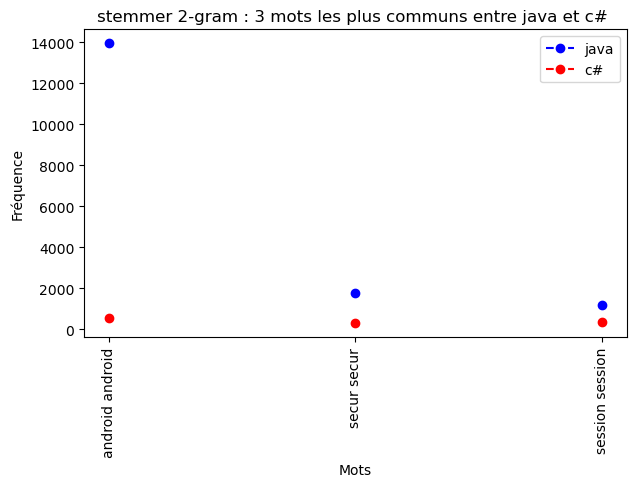

In [89]:
# Intersection mots java / c#
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_2_gram,
                                                name_in               = 'stemmer 2-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c#',
                                                intersection_cles_in  = intersection_java_c_sharp_stemmer_2_gram)

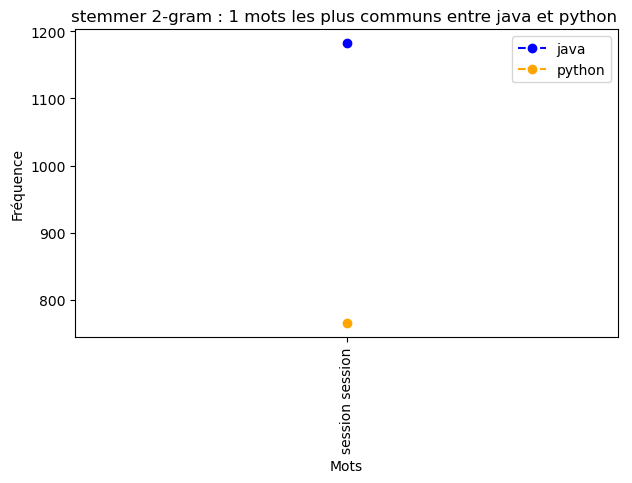

In [90]:
# Intersection mots java / python
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_2_gram,
                                                name_in               = 'stemmer 2-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'python',
                                                intersection_cles_in  = intersection_java_python_stemmer_2_gram)

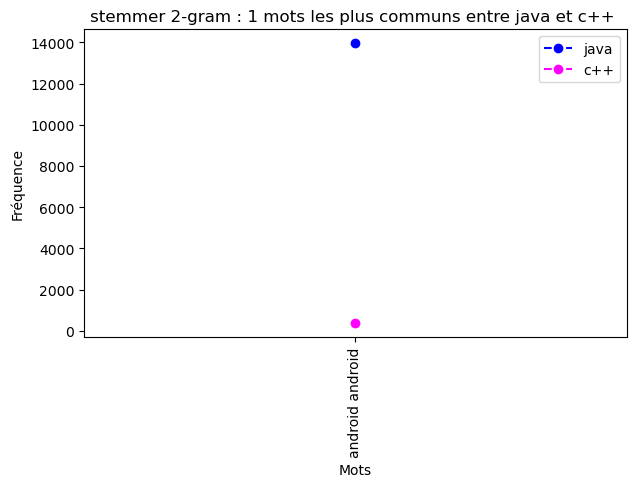

In [91]:
# Intersection mots java / c++
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_stemmer_2_gram,
                                                name_in               = 'stemmer 2-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c++',
                                                intersection_cles_in  = intersection_java_c_plus_plus_stemmer_2_gram)

# 7.3.3. FREQUENCE DISTRIBUTION COLONNE _LEMMA_CLEAN POUR 3-GRAM

In [93]:
# Maj paramètres communs
n_gram      = 3
operation   = '+'
colonne     = '_Lemma_clean'
most_common = 40

In [94]:
# java
most_common_lemma_3_gram['java'], most_common_lemma_3_gram_word['java'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'java', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 3 
operation_in	= + 
cle_in		= java 
colonne_in	= _Lemma_clean 

40 most_common : [(('android', 'android', 'android'), 8096), (('release', 'jar', 'release'), 2800), (('boot', 'spring', 'boot'), 2291), (('apache', 'catalina', 'apache'), 2223), (('catalina', 'apache', 'catalina'), 2160), (('spring', 'release', 'jar'), 2053), (('dependency', 'dependency', 'dependency'), 1863), (('factory', 'factory', 'factory'), 1642), (('sun', 'reflect', 'invoke'), 1580), (('spring', 'boot', 'starter'), 1476), (('hibernate', 'hibernate', 'hibernate'), 1465), (('apache', 'apache', 'apache'), 1407), (('jar', 'jar', 'jar'), 1293), (('invoke', 'apache', 'catalina'), 1131), (('android', 'wrap', 'android'), 1129), (('apache', 'catalina', 'invoke'), 1094), (('final', 'jar', 'final'), 1038), (('catalina', 'invoke', 'apache'), 902), (('sun', 'sun', 'sun'), 899), (('security', 'security', 'security'), 857), (('sun', 'reflect', 'native'), 855), (('reflect', 'invoke', 'reflect'), 853), (('invoke', 'refle

In [95]:
# c#
most_common_lemma_3_gram['c#'], most_common_lemma_3_gram_word['c#'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c#', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

n_gram_in	= 3 
operation_in	= + 
cle_in		= c# 
colonne_in	= _Lemma_clean 

40 most_common : [(('td', 'td', 'td'), 514), (('double', 'double', 'double'), 408), (('binding', 'binding', 'binding'), 396), (('grid', 'grid', 'grid'), 391), (('div', 'div', 'div'), 389), (('entity', 'entity', 'entity'), 366), (('culture', 'neutral', 'culture'), 345), (('neutral', 'culture', 'neutral'), 338), (('mono', 'mono', 'mono'), 328), (('studio', 'visual', 'studio'), 320), (('visual', 'studio', 'visual'), 318), (('assembly', 'culture', 'neutral'), 317), (('asp', 'asp', 'asp'), 284), (('catch', 'ex', 'ex'), 282), (('android', 'android', 'android'), 277), (('await', 'await', 'await'), 266), (('assembly', 'assembly', 'assembly'), 262), (('person', 'person', 'person'), 256), (('expression', 'expression', 'expression'), 222), (('action', 'action', 'action'), 203), (('ref', 'ref', 'ref'), 200), (('dictionary', 'dictionary', 'dictionary'), 192), (('builder', 'builder', 'builder'), 192), (('td', 'td', 'align'), 

In [ ]:
# javascript
most_common_lemma_3_gram['javascript'], most_common_lemma_3_gram_word['javascript'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'javascript', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

In [ ]:
# python
most_common_lemma_3_gram['python'], most_common_lemma_3_gram_word['python'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'python', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common) 

In [ ]:
# c++
most_common_lemma_3_gram['c++'], most_common_lemma_3_gram_word['c++'] = \
frequence_distribution_sous_dataframe(n_gram_in      = n_gram,
                                      operation_in   = operation,
                                      cle_in         = 'c++', 
                                      colonne_in     = colonne, 
                                      most_common_in = most_common)

In [ ]:
###################################################
#    Intersection entre les 5 sous-dataframes     #
###################################################
# https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-trouver-lintersection-de-deux-listes
set_java_lemma_3_gram        = set(most_common_lemma_3_gram_word['java'])
set_c_sharp_lemma_3_gram     = set(most_common_lemma_3_gram_word['c#']) 
set_javascript_lemma_3_gram  = set(most_common_lemma_3_gram_word['javascript']) 
set_python_lemma_3_gram      = set(most_common_lemma_3_gram_word['python']) 
set_c_plus_plus_lemma_3_gram = set(most_common_lemma_3_gram_word['c++']) 

intersection_java_c_sharp_lemma_3_gram     = list(set_java_lemma_3_gram & set_c_sharp_lemma_3_gram)
intersection_java_javascript_lemma_3_gram  = list(set_java_lemma_3_gram & set_javascript_lemma_3_gram)
intersection_java_python_lemma_3_gram      = list(set_java_lemma_3_gram & set_python_lemma_3_gram)
intersection_java_c_plus_plus_lemma_3_gram = list(set_java_lemma_3_gram & set_c_plus_plus_lemma_3_gram)
intersection_all_lemma_3_gram              = list(set_java_lemma_3_gram & set_c_sharp_lemma_3_gram & \
                                                    set_javascript_lemma_3_gram & set_python_lemma_3_gram & \
                                                    set_c_plus_plus_lemma_3_gram)

print('intersection_java_c_sharp_lemma_3_gram\t\t=', intersection_java_c_sharp_lemma_3_gram)
print('intersection_java_javascript_lemma_3_gram\t=', intersection_java_javascript_lemma_3_gram)
print('intersection_java_python_lemma_3_gram\t\t=', intersection_java_python_lemma_3_gram)
print('intersection_java_c_plus_plus_lemma_3_gram\t=', intersection_java_c_plus_plus_lemma_3_gram)
print('intersection_all_lemma_3_gram\t\t\t=', intersection_all_lemma_3_gram)

In [ ]:
####################################################
#       Affichage fréquence distribution           #
####################################################
# On affiche les distributions qui ont des intersections.

In [ ]:
# Intersection mots java / c#
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_lemma_3_gram,
                                                name_in               = 'lemma 3-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c#',
                                                intersection_cles_in  = intersection_java_c_sharp_lemma_3_gram)

In [ ]:
# Intersection mots java / c++
affichage_frequence_distribution_sous_dataframe(most_common_n_gram_in = most_common_lemma_3_gram,
                                                name_in               = 'lemma 3-gram',
                                                cle_1_in              = 'java', 
                                                cle_2_in              = 'c++',
                                                intersection_cles_in  = intersection_java_c_plus_plus_lemma_3_gram)

# 7.4. WORD CLOUD (VARIABLE CATEGORIELLE)

In [ ]:
##############################################################################  
# WordCloud : visualisation des tokens les plus présents d'une colonne       #
##############################################################################

In [496]:
#########################################################  
# WordCloud pour le dataframe, d'une colonne            #
######################################################### 
def word_cloud(count_in, colonne_in, cle_in = ''):
    
    # Affichage des 20 mots les plus fréquents du corpus
    if (cle_in != ''):
        print('20 mots les plus fréquents colonne', colonne_in, ', sous-dataframe', cle_in, ':')
    else:
        print('20 mots les plus fréquents colonne', colonne_in, ':')
    print(count_in.head(20), '\n')
    
    
    # https://ichi.pro/fr/creer-des-nuages-de-mots-personnalises-en-python-145227399773811
    wc = WordCloud(background_color = 'beige',
                   max_words        = 40,      # affichage d'au moins 40 mots
                   width            = 4000, 
                   height           = 3000)
    wc.generate_from_frequencies(count_in)
    plt.imshow(wc)
    plt.axis("off")
    if (cle_in != ''):
        plt.title('Word Cloud colonne ' + colonne_in + ', sous-dataframe ' + cle_in)
    else:
        plt.title('Word Cloud colonne ' + colonne_in)
    plt.show()

In [497]:
#########################################################  
# WordCloud pour les sous-dataframes, d'une colonne     #
######################################################### 
def word_cloud_sous_dataframe(cle_in, colonne_in):
   
    #####################################
    # Corpus au format texte            #
    #####################################
    # On reconstitue le corpus en joignant l'ensemble des lignes / documents entre eux.
    corpus_text = ' '.join(dict_df[cle_in][colonne_in])

    
    #####################################
    # Corpus au format token            #
    #####################################
    token_text = corpus_text.split()
    
    
    #############################################################
    # Nombre de fois où les tokens sont présents dans le corpus #
    #############################################################  
    count_text = pd.Series(token_text).value_counts()
        
        
    #####################################
    # Wordcloud                         #
    #####################################
    word_cloud(count_in   = count_text, 
               colonne_in = colonne_in,
               cle_in     = cle_in)

20 mots les plus fréquents colonne _Text_clean :
android       131083
div            49062
apache         31271
spring         31204
jar            26507
react          21921
override       21491
release        21133
column         21098
title          20915
password       20845
site           20773
action         20103
security       20101
final          20062
token          19847
session        19583
dependency     19257
controller     19159
component      18392
dtype: int64 



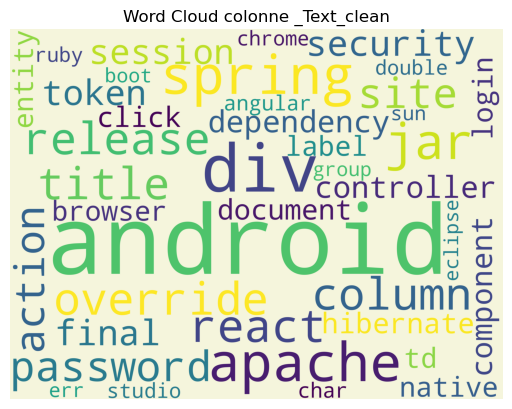

In [498]:
#########################################################
#        WordCloud dataframe, colonne _Text_clean       #
#########################################################
word_cloud(count_in   = count_text, 
           colonne_in = '_Text_clean')

20 mots les plus fréquents colonne _Stemmer_clean :
android     131083
div          49062
apach        31271
spring       31204
jar          26523
activ        24978
final        24827
depend       24374
secur        23492
react        21921
session      21626
overrid      21491
releas       21138
column       21101
titl         21019
password     20845
site         20773
action       20163
gener        20017
token        19847
dtype: int64 



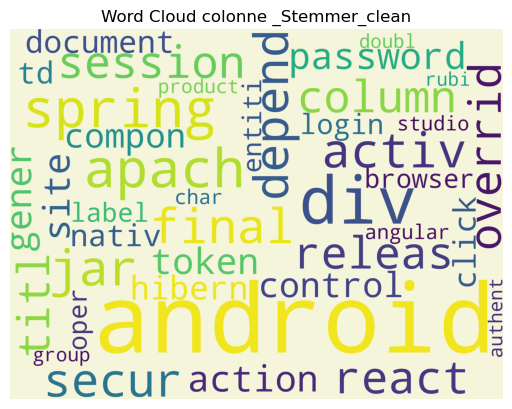

In [499]:
#########################################################
#       WordCloud dataframe, colonne _Stemmer_clean     #
#########################################################
word_cloud(count_in   = count_stemmer, 
           colonne_in = '_Stemmer_clean')

20 mots les plus fréquents colonne _Lemma_clean :
android       131083
div            49062
apache         31271
spring         31204
jar            26507
react          21921
session        21626
override       21491
release        21133
column         21098
title          20915
password       20845
site           20773
action         20103
security       20101
final          20062
token          19847
dependency     19257
controller     19159
component      18392
dtype: int64 



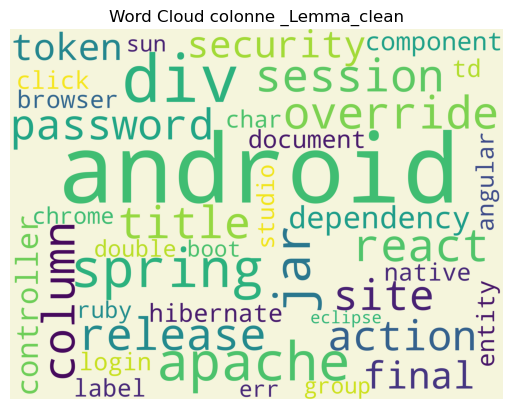

In [500]:
#########################################################
#        WordCloud dataframe, colonne _Lemma_clean      #
#########################################################
word_cloud(count_in   = count_lemma, 
           colonne_in = '_Lemma_clean')

20 mots les plus fréquents colonne _Stemmer_clean , sous-dataframe java :
android     31938
spring      22938
apach       19505
jar         18630
hibern      13306
final       12470
depend      11780
sun         10829
secur       10248
boot         9745
releas       9227
eclips       8505
overrid      8066
bean         7495
invok        6484
factori      6052
catalina     5956
annot        5525
reflect      5491
tomcat       5446
dtype: int64 



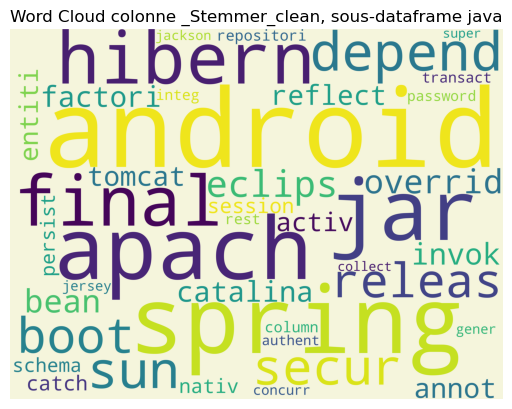

In [501]:
###########################################################
#  WordCloud sous-dataframe java, colonne _Stemmer_clean  #
###########################################################
word_cloud_sous_dataframe(cle_in     = 'java', 
                          colonne_in = '_Stemmer_clean')

20 mots les plus fréquents colonne _Stemmer_clean , sous-dataframe c# :
asp         7395
entiti      4785
visual      4548
bind        4505
await       4432
studio      4287
assembl     4085
gener       3828
control     3674
bool        3451
action      3287
express     3060
secur       2656
token       2649
grid        2614
collect     2456
authent     2453
password    2434
click       2369
doubl       2358
dtype: int64 



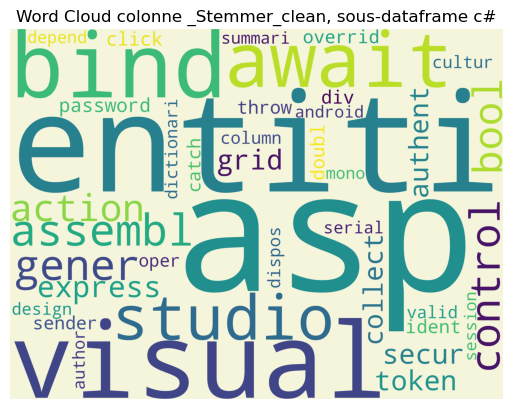

In [502]:
#########################################################
#  WordCloud sous-dataframe c#, colonne _Stemmer_clean  #
#########################################################
word_cloud_sous_dataframe(cle_in     = 'c#', 
                          colonne_in = '_Stemmer_clean')

20 mots les plus fréquents colonne _Stemmer_clean , sous-dataframe javascript :
div          25436
react        11093
document      7909
click         6613
compon        6448
browser       6053
td            5946
angular       5846
chrome        5784
li            5463
titl          4905
err           4347
span          4278
render        3951
label         3706
canva         3645
prop          3373
export        3343
bootstrap     3331
token         3015
dtype: int64 



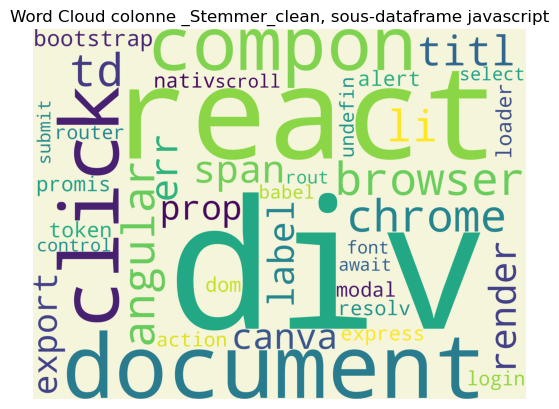

In [503]:
#################################################################
#  WordCloud sous-dataframe javascript, colonne _Stemmer_clean  #
#################################################################
word_cloud_sous_dataframe(cle_in      = 'javascript',
                          colonne_in = '_Stemmer_clean')

20 mots les plus fréquents colonne _Stemmer_clean , sous-dataframe python :
site       9236
train      6904
pip        5160
column     5083
rang       4282
shape      4190
plot       4140
flask      3636
session    3461
loss       3389
len        3124
gener      3009
recent     2967
matrix     2934
append     2853
activ      2658
nan        2640
batch      2579
fit        2560
label      2539
dtype: int64 



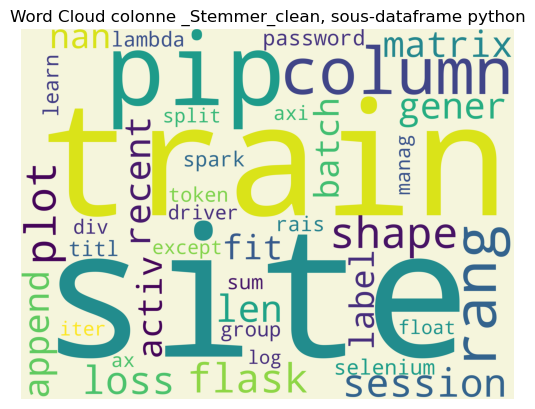

In [504]:
#############################################################
#  WordCloud sous-dataframe python, colonne _Stemmer_clean  #
#############################################################
word_cloud_sous_dataframe(cle_in      = 'python',
                          colonne_in = '_Stemmer_clean')

20 mots les plus fréquents colonne _Stemmer_clean , sous-dataframe c++ :
boost          9017
char           7990
vector         7763
oper           5588
doubl          4860
clang          4285
float          4105
pointer        3607
unsign         3399
bool           3148
constructor    2862
member         2699
visual         2672
declar         2557
alloc          2506
cast           2477
virtual        2428
studio         2204
uniqu          2094
undefin        2054
dtype: int64 



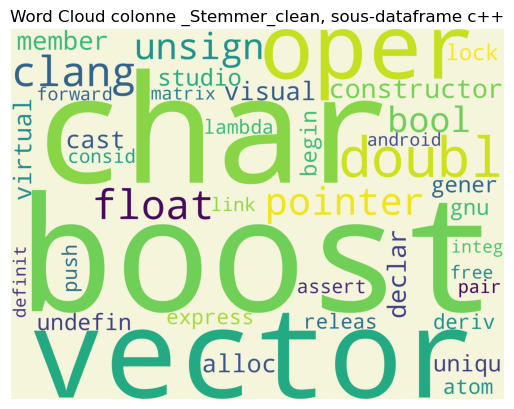

In [505]:
###########################################################
#  WordCloud sous-dataframe c++, colonne _Stemmer_clean   #
###########################################################
word_cloud_sous_dataframe(cle_in      = 'c++',
                          colonne_in = '_Stemmer_clean')

# 7.5. ANALYSE UNIVARIEE VARIABLES NUMERIQUES

In [92]:
# Sélection des colonnes numériques
df_numerique = df.select_dtypes(include = np.number)
var_numerique = df_numerique.columns
print('var_numerique =', var_numerique)

var_numerique = Index(['Id', 'Score', 'AnswerCount', '_len_Text', 'len_Text_clean',
       '_unique_words_Text_clean', '_unique_words_Lemma_clean',
       '_unique_words_Stemmer_clean'],
      dtype='object')


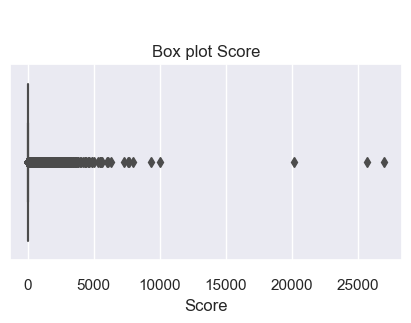

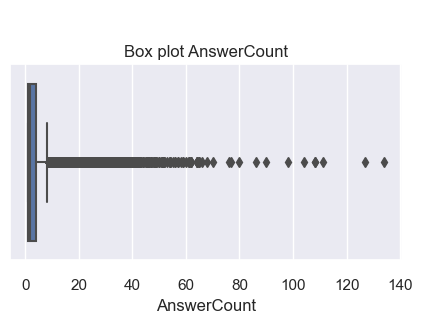

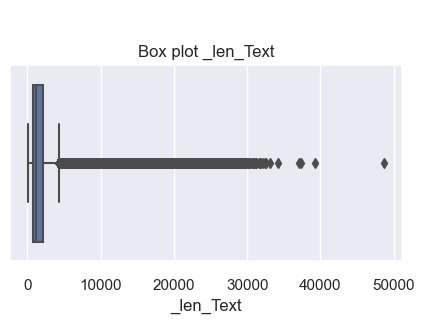

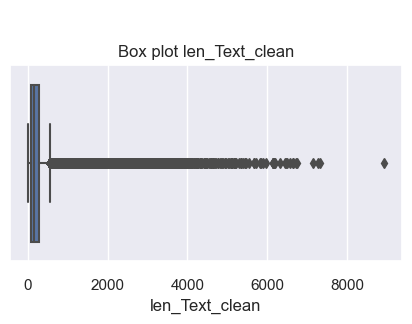

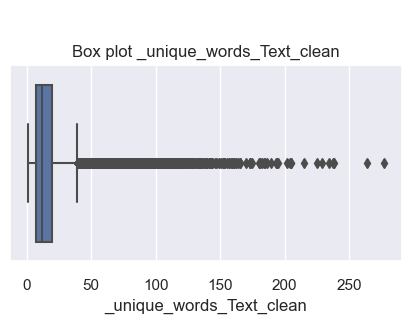

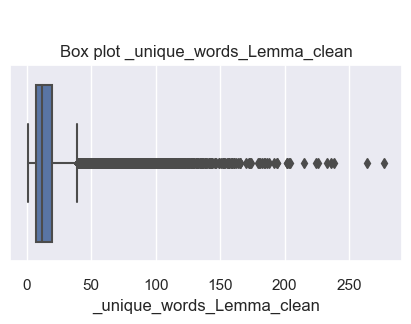

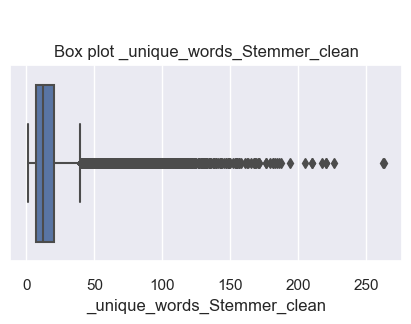

In [106]:
for col in var_numerique:
    if (col != 'Id'):
        # define figure size
        sns.set(rc = {"figure.figsize":(4, 2)}) #width=6, height=5
        plt.title('\n\nBox plot ' + col)    
        sns.boxplot(data = df, x = col)

        plt.show()    

# 8. ANALYSE BIVARIEE

# 8.1. ETUDE DE LA TAILLE DES DOCUMENTS PAR RPPORT AUX TAGS (VARIABLE QUANTITATIVE ET VARIABLE CATEGORIELLE)

In [341]:
#####################################################################
#   Box plot pour 1 variable catégorielle et 1 variable numérique   #
#####################################################################
# https://seaborn.pydata.org/generated/seaborn.boxplot.html
def box_plot(colonne_x_numerique_in, colonne_y_categorielle_in):
    
    order_categorical_level = df.groupby(colonne_y_categorielle_in)[colonne_x_numerique_in].median().sort_values().index

    plt.figure(figsize = (6, 9))
    sns.set(font_scale = 0.6)
    
    sns.boxplot(x          = colonne_x_numerique_in, 
                y          = colonne_y_categorielle_in, 
                showfliers = False, # on supprime outliers
                orient     = 'h',
                order      = order_categorical_level, 
                data       = df)
    
    plt.title('Box plot ' + colonne_x_numerique_in + ' % ' + colonne_y_categorielle_in, fontsize = 12)
    plt.show()
    
    print('\n\n')

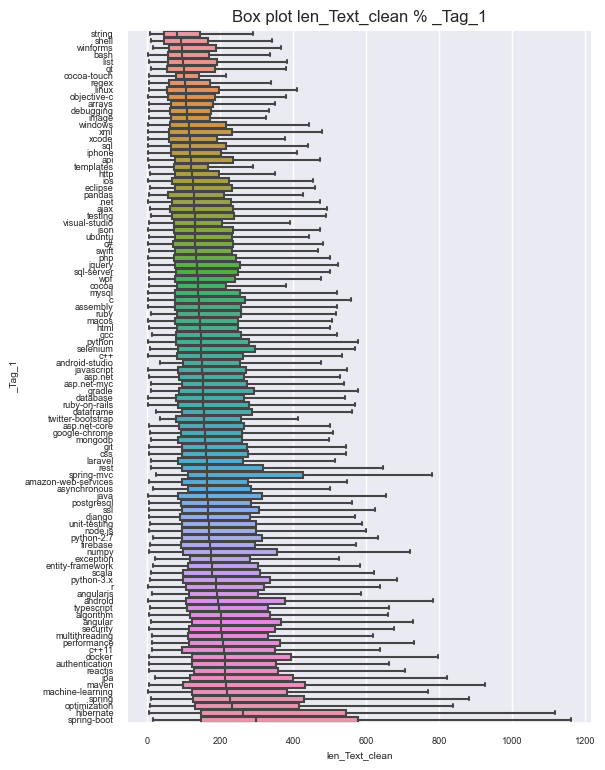

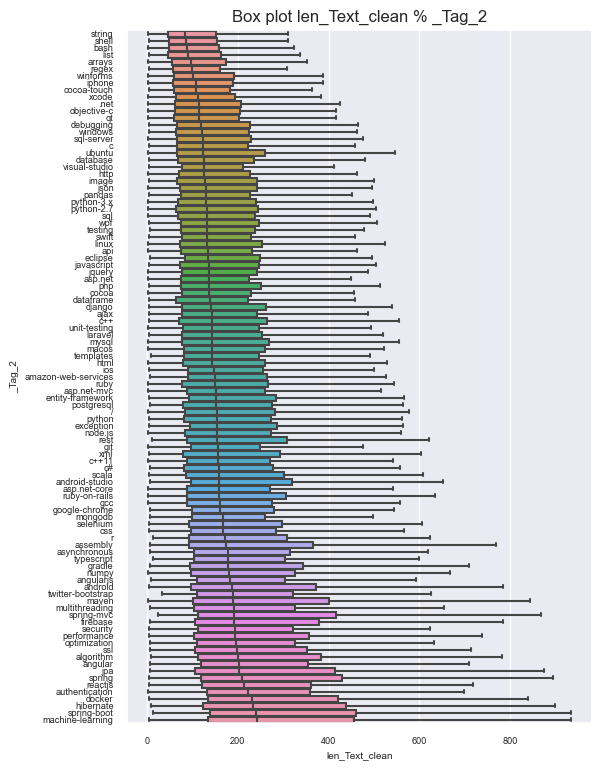

In [342]:
########################################################
# Box plot avec colonne_x_numerique = _len_Text_clean  #
########################################################
box_plot(colonne_x_numerique_in    = '_len_Text_clean',
         colonne_y_categorielle_in = '_Tag_1')

box_plot(colonne_x_numerique_in    = '_len_Text_clean',
         colonne_y_categorielle_in = '_Tag_2')

# 9. ANALYSE MULTIVARIEE

# 9.1. ANALYSE DE 3 VARIABLES NUMERIQUES

In [176]:
#######################################################################
#    Calcul du nombre de mots uniques pour les colonnes _xxx_clean    #
#######################################################################
# https://www.delftstack.com/fr/howto/python/python-count-unique-values-in-list/
# Nombre de mots uniques dans les colonnes _xxx_clean.
# on stocke ce vecteur numérique dans une colonne préfixée par _
count = 0

for index, row in df.iterrows():
    
    df.loc[index, '_unique_words_Text_clean']    = len(np.unique(df.loc[index, '_Text_clean'].split()))
    df.loc[index, '_unique_words_Lemma_clean']   = len(np.unique(df.loc[index, '_Lemma_clean'].split()))
    df.loc[index, '_unique_words_Stemmer_clean'] = len(np.unique(df.loc[index, '_Stemmer_clean'].split()))
    
    if (count < 10):
        print('index =', index, ':', '\n',
              '\t- _Text_clean\t\t\t=', df.loc[index, '_Text_clean'], '\n', 
              '\t- _len_Text_clean\t\t=', df.loc[index, '_len_Text_clean'], '\n', 
              '\t- _unique_words_Text_clean\t=', df.loc[index, '_unique_words_Text_clean'], '\n',  
              '\t- _Lemma_clean\t\t\t=', df.loc[index, '_Lemma_clean'], '\n',               
              '\t- _unique_words_Lemma_clean\t=', df.loc[index, '_unique_words_Lemma_clean'], '\n',
              '\t- _Stemmer_clean\t\t=', df.loc[index, '_Stemmer_clean'], '\n',                       
              '\t- _unique_words_Stemmer_clean\t=', df.loc[index, '_unique_words_Stemmer_clean'], '\n')
    count = count + 1

index = 0 : 
 	- _Text_clean			= registry programmer friendly registry 
 	- _len_Text_clean		= 37 
 	- _unique_words_Text_clean	= 3 
 	- _Lemma_clean			= registry programmer friendly registry 
 	- _unique_words_Lemma_clean	= 3 
 	- _Stemmer_clean		= registri programm friendli registri 
 	- _unique_words_Stemmer_clean	= 3 

index = 1 : 
 	- _Text_clean			= setter appropriate torn situation throw appropriate understood whatever prefer 
 	- _len_Text_clean		= 78 
 	- _unique_words_Text_clean	= 8 
 	- _Lemma_clean			= setter appropriate torn situation throw appropriate understood whatever prefer 
 	- _unique_words_Lemma_clean	= 8 
 	- _Stemmer_clean		= setter appropri torn situat throw appropri understood whatev prefer 
 	- _unique_words_Stemmer_clean	= 8 

index = 2 : 
 	- _Text_clean			= sparse manipulation enormous matrices specifically pyramidal summation copula calculation short track relatively usually rare sea matrix multidimensional sparse assume undefined preset physically possibl

In [177]:
# summary statistics sur les colonnes de type numérique
# (transpose met les attributs en ligne pour + de lisibilité)
df.describe(include = np.number).transpose()

,count,mean,std,min,25%,50%,75%,max
Id,207636.0,2.666463e+07,1.914842e+07,4.0,9576688.5,23831765.0,41461253.25,76403109.0
Score,207636.0,2.594568e+01,1.436341e+02,6.0,7.0,10.0,18.00,27009.0
AnswerCount,207636.0,3.417187e+00,3.514504e+00,1.0,1.0,2.0,4.00,134.0
_len_Text,207636.0,1.850990e+03,2.244154e+03,62.0,705.0,1210.0,2139.00,48697.0
len_Text_clean,207636.0,2.306255e+02,3.019940e+02,2.0,80.0,147.0,270.00,8932.0
_unique_words_Text_clean,207636.0,1.597148e+01,1.347944e+01,1.0,7.0,12.0,20.00,277.0
_unique_words_Lemma_clean,207636.0,1.594747e+01,1.345005e+01,1.0,7.0,12.0,20.00,277.0
_unique_words_Stemmer_clean,207636.0,1.564026e+01,1.308255e+01,1.0,7.0,12.0,20.00,263.0


In [178]:
df.columns

Index(['CreationDate', 'Id', 'Score', 'AnswerCount', '_Text', '_Tag_1',
       '_Tag_2', '_Text_sans_html', '_Text_tokens', '_Text_clean',
       '_Stemmer_clean', '_Lemma_clean', '_len_Text', 'len_Text_clean',
       '_unique_words_Text_clean', '_unique_words_Lemma_clean',
       '_unique_words_Stemmer_clean'],
      dtype='object')

In [179]:
# Réduction du dataframe pour avoir une ficgure + lisible
print('df shape\t=', df.shape)

df_reduit = df[(df['AnswerCount'] <= 20) &
               (df['Score'] <= 200)]
print('df_reduit shape\t=', df_reduit.shape)

df shape	= (207636, 17)
df_reduit shape	= (204154, 17)


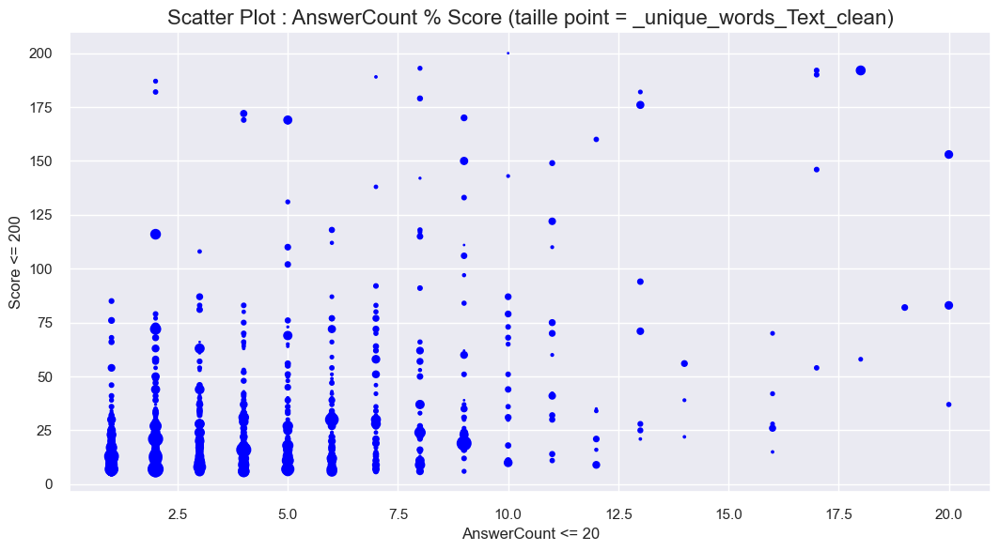

In [180]:
############################################################
# Scatter plot pour 3 variables numériques :               #
#    --> x = AnswerCount                                   #
#    --> y = Score                                         #
#    --> taille des points = _unique_words_Text_clean      #
############################################################
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.scatter.html
# https://www.geeksforgeeks.org/how-to-increase-the-size-of-scatter-points-in-matplotlib/  
# https://stackoverflow.com/questions/30336138/how-to-plot-a-multivariate-function-in-python

# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.sample.html
# Bp de points => pour + de lisibilité, on travaille sur un sous-ensemble (2000 points)
data_subset = df_reduit.sample(n = 2000, replace = True, random_state = 1)    
    
plt.figure(figsize = (10, 5)) # 6 is width, 5 is height

x = data_subset['AnswerCount']
y = data_subset['Score'] 
points_size = data_subset['_unique_words_Text_clean'] 

plt.scatter(x, y, s = points_size, c = 'blue')

plt.title('Scatter Plot : AnswerCount % Score (taille point = _unique_words_Text_clean)', fontsize = 16)
plt.xlabel('AnswerCount <= 20', fontsize = 12)
plt.ylabel('Score <= 200', fontsize = 12)
  
plt.show()

# 9.2. MATRICE DE CORRELATION

In [319]:
# matrice de corrélation
corr = df.corr()
corr

,Id,Score,AnswerCount,_len_Text
Id,1.000000,-0.070496,-0.183627,0.162946
Score,-0.070496,1.000000,0.391455,-0.031462
AnswerCount,-0.183627,0.391455,1.000000,-0.067758
_len_Text,0.162946,-0.031462,-0.067758,1.000000


In [182]:
#####################################################################
# matrice de corrélation : représentation graphique de la diagonale #
#####################################################################
# Valeurs minimale = -1, maximale = 1. 
# fmt = arrondi 2 chiffres après la virgule.
def affichage_matrice_correlation():
    
    corr = df.corr()
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True

    fig, ax = plt.subplots(1, 1, figsize = (7,5))
    ax = sns.heatmap(corr, mask = mask, vmin = -1, vmax = 1, cmap = 'coolwarm', annot = True, fmt = '.2f', square = True)

    # il y a :
    #    --> 72% de corrélation entre ViewCount et Score
    #    --> 50% de corrélation entre ViewCount et AnswerCount
    # ==> on supprime la colonne ViewCount.

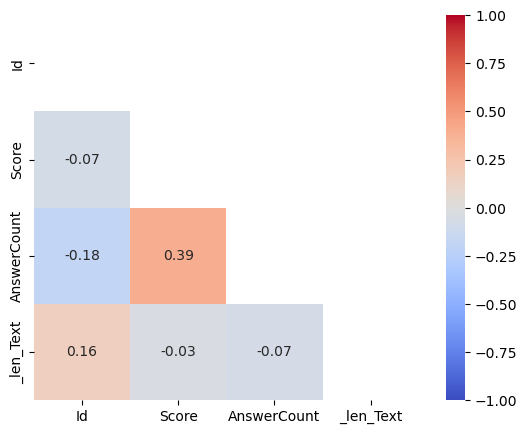

In [321]:
affichage_matrice_correlation()

In [ ]:
# Suppression colonne ViewCount
df.drop(['ViewCount'], axis = 1, inplace = True)

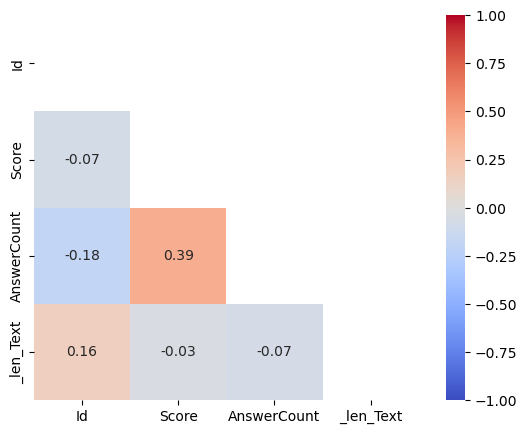

In [322]:
# Maj affichage matrice de corrélation
affichage_matrice_correlation()

In [38]:
df.columns

Index(['CreationDate', 'Id', 'Score', 'AnswerCount', '_Text', '_Tag_1',
       '_Tag_2', '_Text_sans_html', '_Text_tokens', '_Text_clean',
       '_Stemmer_clean', '_Lemma_clean', '_len_Text', 'len_Text_clean',
       '_unique_words_Text_clean', '_unique_words_Lemma_clean',
       '_unique_words_Stemmer_clean'],
      dtype='object')

# 10. SAUVEGARDE DANS FICHIERS

In [166]:
df.columns

Index(['CreationDate', 'Id', 'Score', 'AnswerCount', '_Text', '_Tag_1',
       '_Tag_2', '_Text_sans_html', '_Text_tokens', '_Text_clean',
       '_Stemmer_clean', '_Lemma_clean', '_len_Text', '_Tokens_text_clean',
       '_Tokens_stemmer_clean', '_Tokens_lemma_clean', '_len_Text_clean'],
      dtype='object')

In [116]:
###########################################################
#             Données nettoyées réduites                  #
###########################################################
df_light = df.copy()

In [117]:
# suppression des colonnes intermédiaires créées pour le calcul des colonnes nettoyées (xxx_clean)
df_light.drop(['_Text', '_Text_sans_html', '_Text_tokens', '_len_Text', '_len_Text_clean', 'CreationDate'], 
              axis = 1, inplace = True)

In [118]:
df_light.columns

Index(['Id', 'Score', 'AnswerCount', '_Tag_1', '_Tag_2', '_Text_clean',
       '_Stemmer_clean', '_Lemma_clean', '_Tokens_text_clean',
       '_Tokens_stemmer_clean', '_Tokens_lemma_clean'],
      dtype='object')

In [224]:
###########################################################
#   ENREGISTREMENT DONNEES NETTOYEES DANS DES FICHIERS    #
###########################################################
# Données nettoyées
df.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean.csv', 
          sep = '\t', header = True, index = False)

# Données nettoyées réduites
df_light.to_csv(C_DATASET_CLEANED + 'QueryResults_2008_to_2023_clean_light.csv', 
                sep = '\t', header = True, index = False)